In [ ]:
"""
This program is designed to implement a Reinforcement Learning Trading System, incorporating a Random Forest Stock Selection strategy. 
The overarching strategy commences with the utilization of various Technical Indicators 
to meticulously select 10 stocks from a benchmark using a Random Forest model. Subsequently, 
Trains a Reinforcement Learning Agent, capitalizing on the historical price movements of the selected stocks. 
The trained agent is then employed to execute autonomous trading decisions.

Following the autonomous trading, 
the system undergoes a comprehensive backtesting phase to evaluate the performance 
and reliability of the trading strategy. Additionally, 
to ensure the robustness and resilience of the trading system under different market conditions, 
a Robustness Stress Test is conducted using Monte Carlo Simulation. 

This simulation aids in assessing the potential risks and uncertainties associated with the trading strategy, 
thereby contributing to the refinement and optimization of the overall trading system.
"""

## Import Package

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from collections import Counter
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from sklearn.preprocessing import MinMaxScaler
import talib
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
import random
from collections import deque
%matplotlib inline

## Data Loading

In [2]:
df=pd.read_csv('data.csv')
df

,ticker,date,last,volume
0,1332 JT,2013-01-04,169.0987,1464100
1,1332 JT,2013-01-07,166.3266,1783500
2,1332 JT,2013-01-08,166.3266,1759800
3,1332 JT,2013-01-09,165.4026,767800
4,1332 JT,2013-01-10,167.2507,1503100
...,...,...,...,...
451108,9984 JT,2021-03-15,10370.0000,12041200
451109,9984 JT,2021-03-16,10620.0000,11346000
451110,9984 JT,2021-03-17,10400.0000,9771000
451111,9984 JT,2021-03-18,10220.0000,13941600


## Data Cleaning

In [7]:
def data_clean(df, ratio_threshold=0.95):
    """
    This function cleans and preprocesses the 'df' DataFrame.
    
    Parameters:
    df (DataFrame): The input dataframe containing df data.
    ratio_threshold (float): The ratio of the missing date, default as 0.95.
    
    Returns:
    final_df1 (DataFrame): The cleaned dataframe.
    """
    # Ensure 'date' is datetime format
    df['date'] = pd.to_datetime(df['date'])

    # Create a list of unique dates
    unique_dates = df['date'].unique()

    # Create a new dataframe grouping by id and count the unique dates for each stock
    grouped_df = df.groupby('ticker').agg({'date': 'nunique'}).reset_index()

    # Calculate the ratio of present dates to total unique dates for each stock
    grouped_df['ratio'] = grouped_df['date'] / len(unique_dates)

    # Get the list of ids to keep (those with less than 5% missing data)
    ids_to_keep = grouped_df[grouped_df['ratio'] >= ratio_threshold]['ticker'].unique()

    # Filter the original dataframe to include only the ids to keep
    final_df = df[df['ticker'].isin(ids_to_keep)]
    final_df.set_index(['date', 'ticker'], inplace=True)

    # Create a list of columns to process
    columns_to_process = ['last', 'volume']

    # Initialize final_df1
    final_df1 = pd.DataFrame()

    # Process each column
    for column in columns_to_process:
        # Unstack to move 'id' to columns, dates as rows
        unstacked_df = final_df[column].unstack()

        # Use linear interpolation to fill missing values
        interpolated_df = unstacked_df.interpolate(method='linear')

        # Stack back to original format for each column
        stacked_df = interpolated_df.stack().reset_index(name=column)

         # If final_df1 is empty, assign stacked_df to it, else merge this column to final_df1
        if final_df1.empty:
            final_df1 = stacked_df
        else:
            final_df1 = pd.merge(final_df1, stacked_df, on=['date', 'ticker'], how='outer')

    # Get a list of stocks with exactly the number of unique dates
    stocks_to_keep = final_df1.groupby('ticker')['date'].count()
    stocks_to_keep = stocks_to_keep[stocks_to_keep == len(unique_dates)].index

    # Filter the DataFrame to only include these stocks
    final_df1 = final_df1[final_df1['ticker'].isin(stocks_to_keep)]

    # Reset the index, then set multi-index again including 'ticker'
    final_df1.reset_index(inplace=True, drop=True)
    final_df1.set_index(['ticker', 'date'], inplace=True)
    final_df1.index.names = ['Stock', 'Date']

    # Sort by 'Stock' and 'Date'
    final_df1.sort_index(level=[0, 1], inplace=True)
    
    return final_df1

final_df1 = data_clean(df)


In [9]:
def split_data_by_stock(input_df):
    """
    Splits the input DataFrame into a dictionary of DataFrames based on the unique values in the 'Stock' level of the index.
    
    Parameters:
    input_df (pd.DataFrame): The input DataFrame with a MultiIndex, one level of which is 'Stock'.
    
    Returns:
    data_dict (dict): A dictionary where keys are unique stock names and values are DataFrames corresponding to each stock.
    """
    data_dict = {}
    stock_names = input_df.index.get_level_values('Stock').unique()
    
    for stock in stock_names:
        data_dict[stock] = input_df.xs(stock, level='Stock')
    
    return data_dict

# Call the function with the final_df1 DataFrame
data = split_data_by_stock(final_df1)

## Data Visualization

Statistics for stock 1332 JT
---- last ----
Mean: 452.05790389027425
Median: 480.7917
Mode: 190.3516
Range: 670.1221
Standard Deviation: 161.50341823336484
Skewness: -0.24997299946821322
Kurtosis: -0.9480503782700191


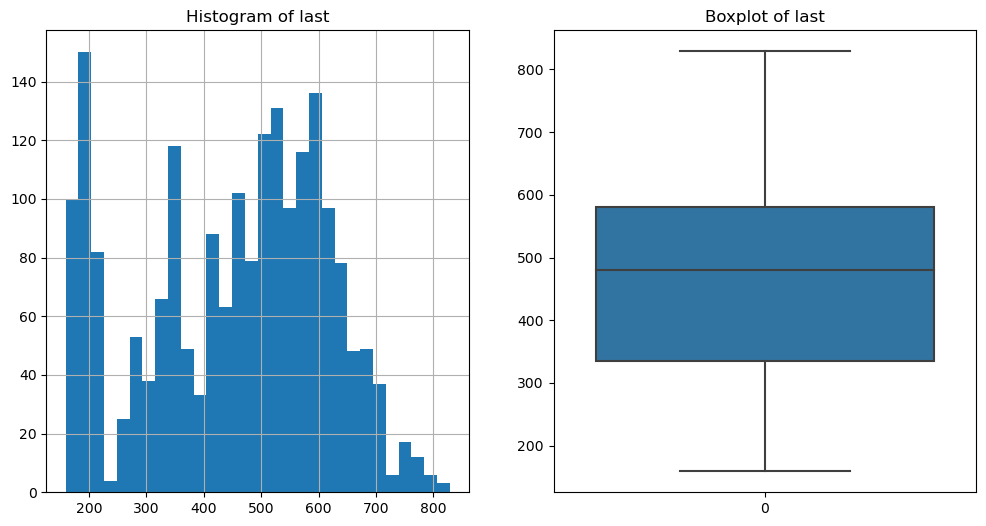

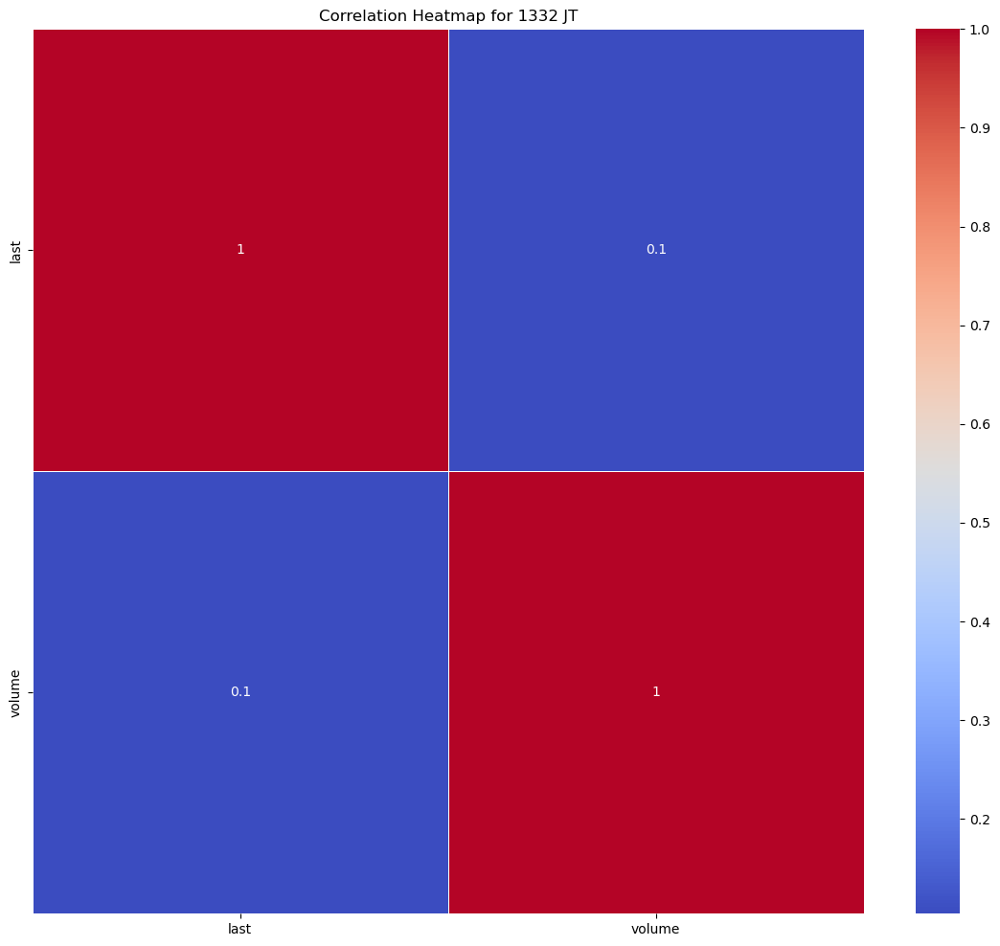

Statistics for stock 1605 JT
---- last ----
Mean: 991.3704242892768
Median: 1001.7613
Mode: 1109.2376
Range: 924.2056
Standard Deviation: 202.70167680569975
Skewness: -0.37704038910115717
Kurtosis: -0.39458416025183585


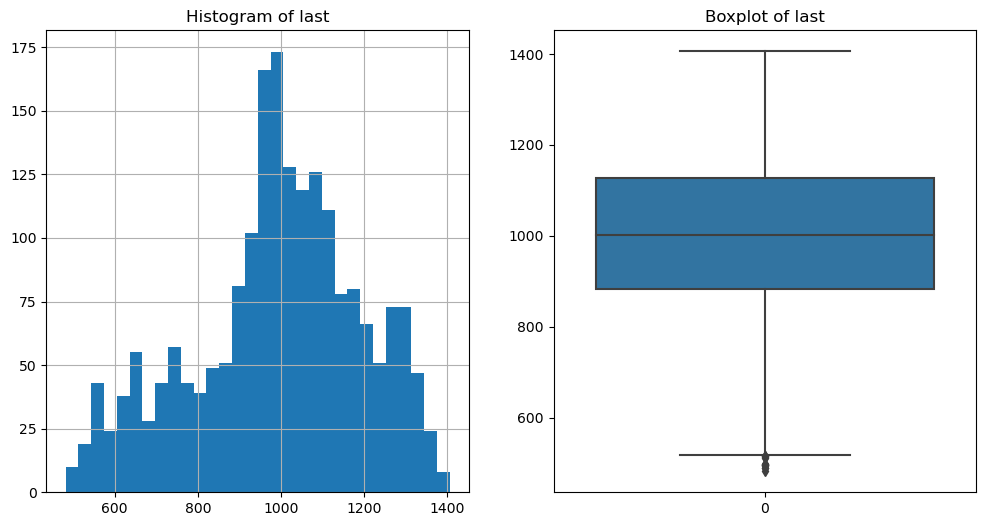

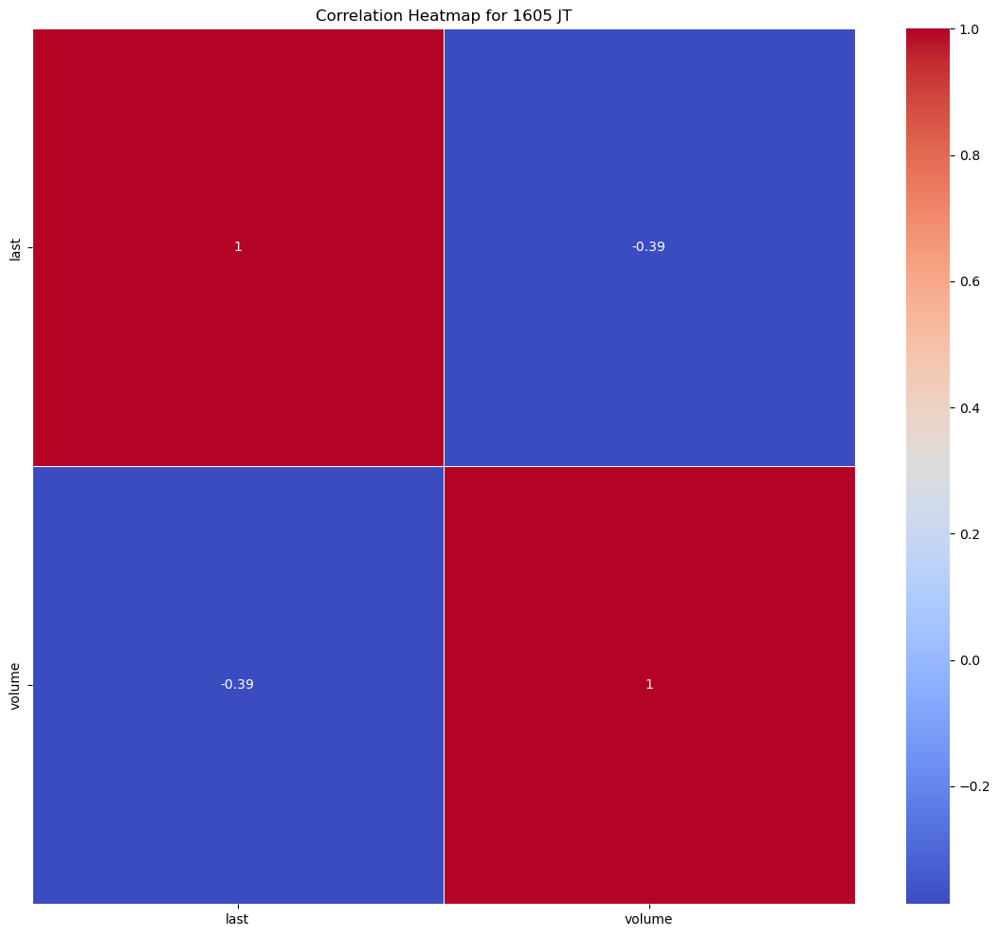

Statistics for stock 1721 JT
---- last ----
Mean: 2088.064197755611
Median: 1878.748
Mode: 2970.1325
Range: 2581.5557
Standard Deviation: 719.0258912394185
Skewness: 0.12166889120701818
Kurtosis: -1.4799202212037537


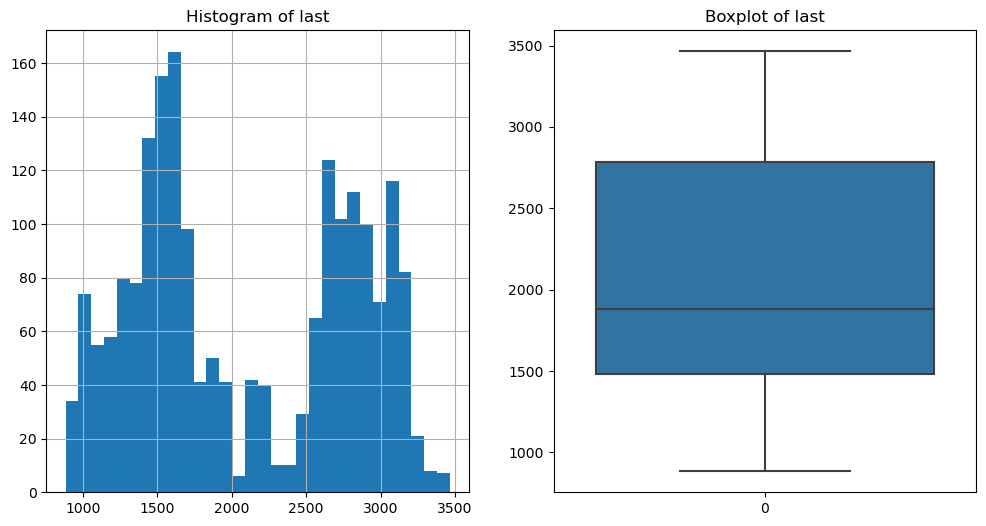

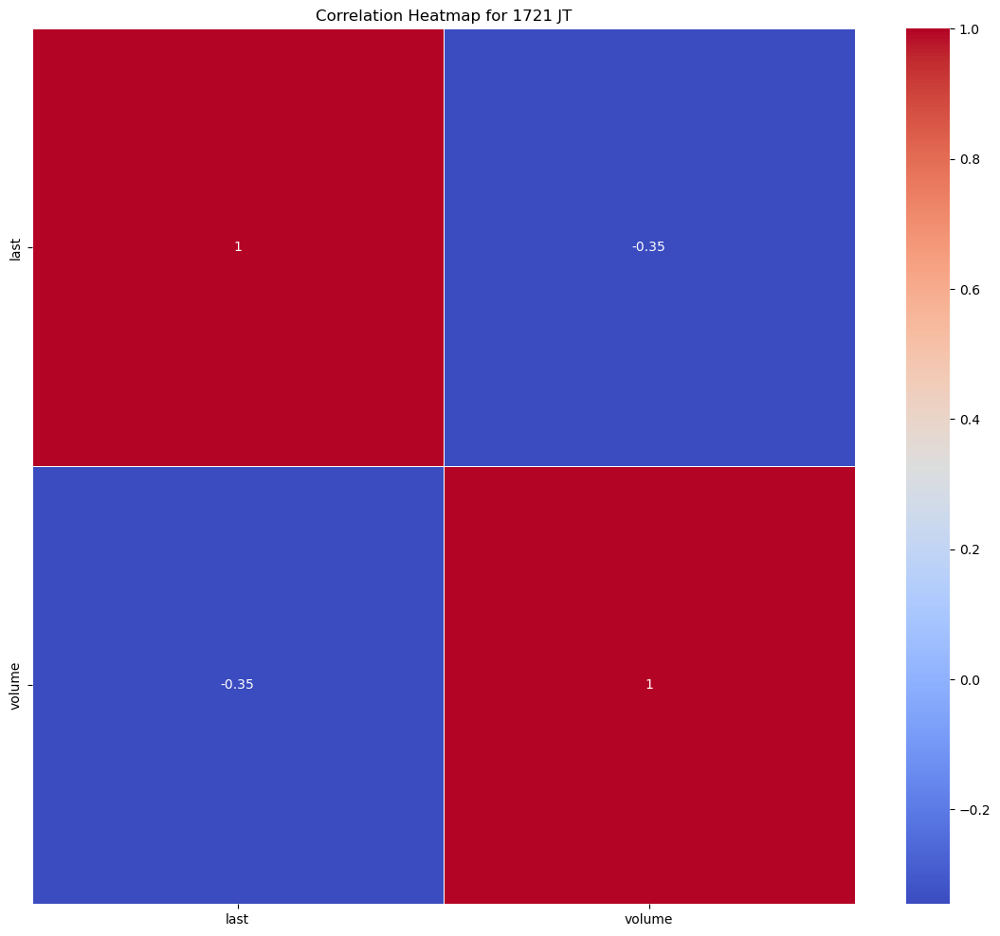

Statistics for stock 1801 JT
---- last ----
Mean: 3496.323099052369
Median: 3523.4825
Mode: 5712.7486
Range: 4968.1444
Standard Deviation: 1141.600634773367
Skewness: -0.10783541210842089
Kurtosis: -0.4983708897979948


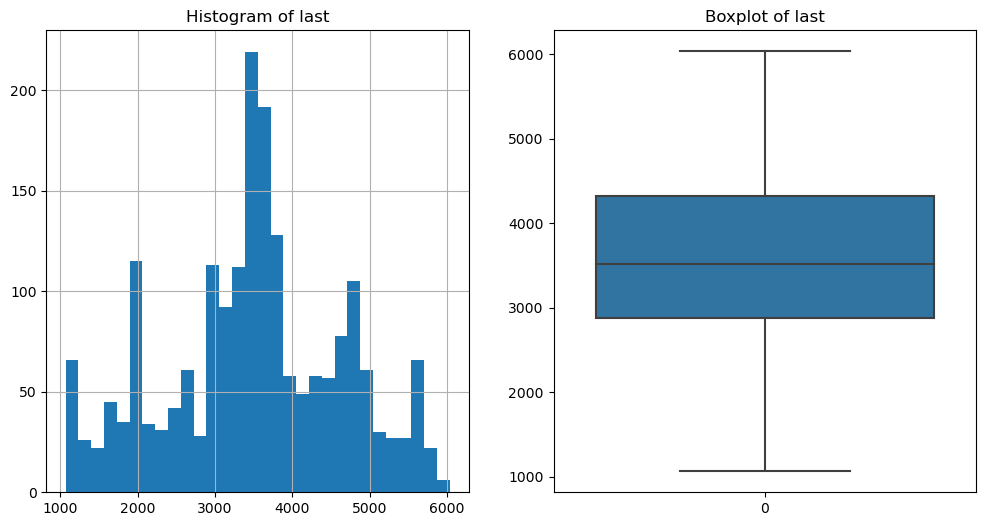

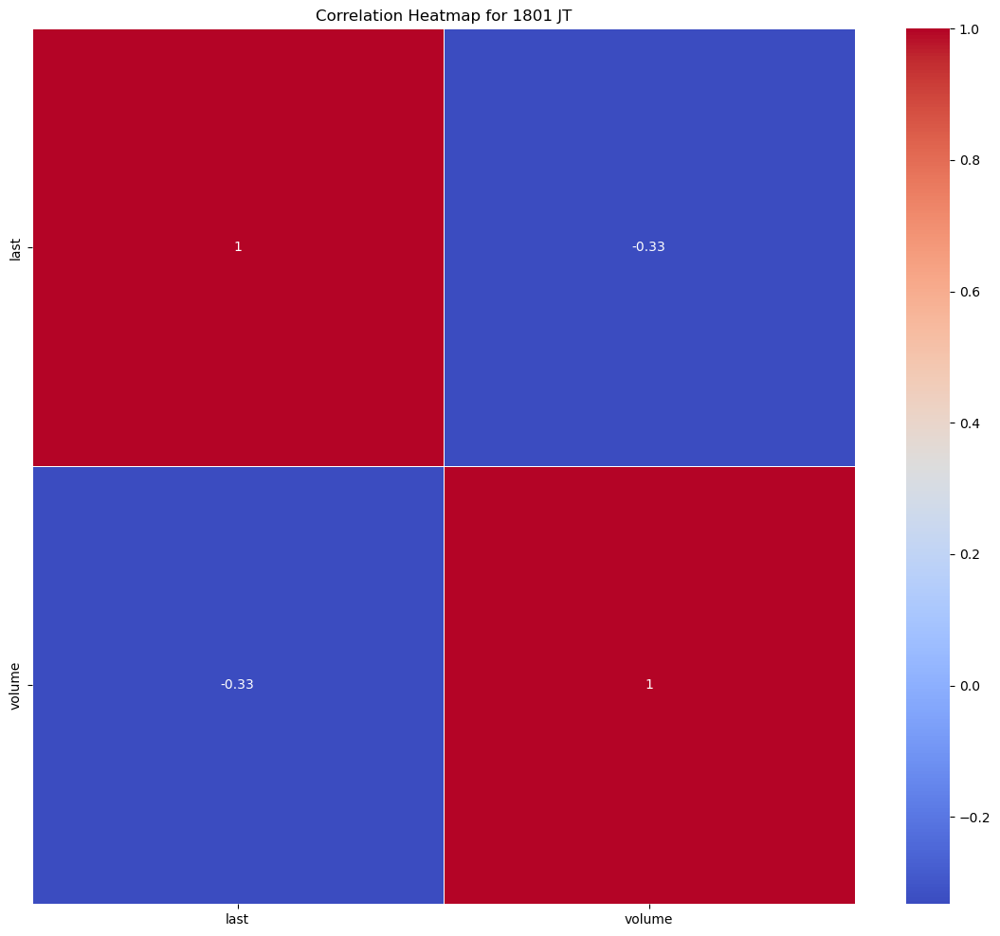

Statistics for stock 1802 JT
---- last ----
Mean: 873.7656493765585
Median: 939.6394
Mode: 473.5303
Range: 1063.8644
Standard Deviation: 238.55449615824028
Skewness: -0.4213118961827306
Kurtosis: -0.677581603910764


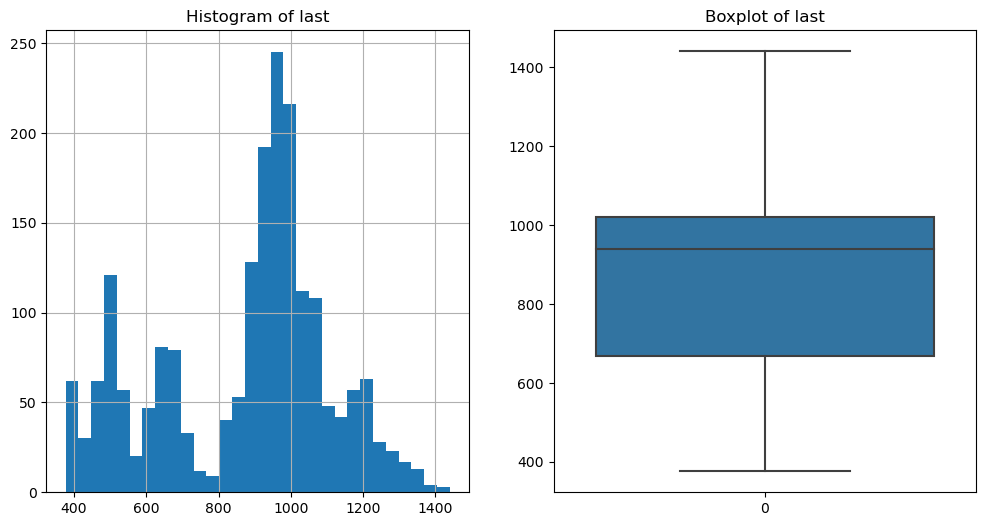

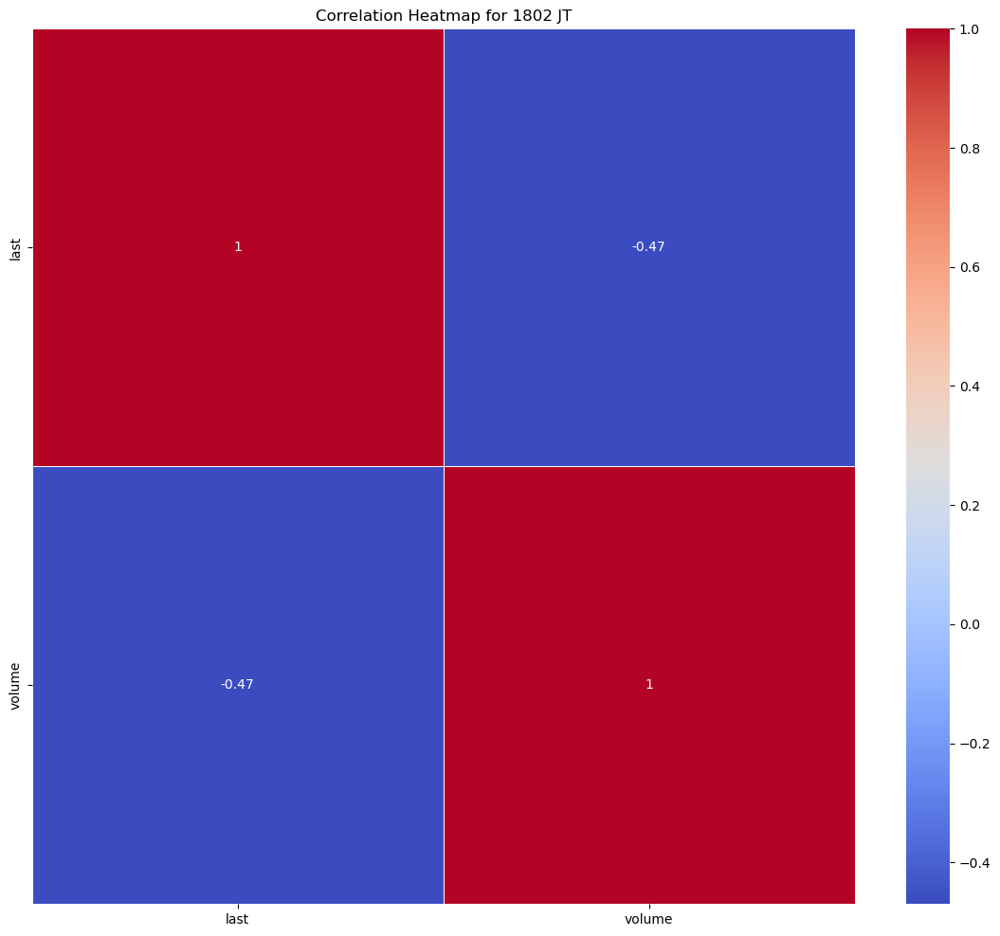

Statistics for stock 1803 JT
---- last ----
Mean: 799.4724949127182
Median: 849.4658
Mode: 263.7455
Range: 1031.3404
Standard Deviation: 223.4142115342954
Skewness: -0.8647080024504735
Kurtosis: 0.08564882766710857


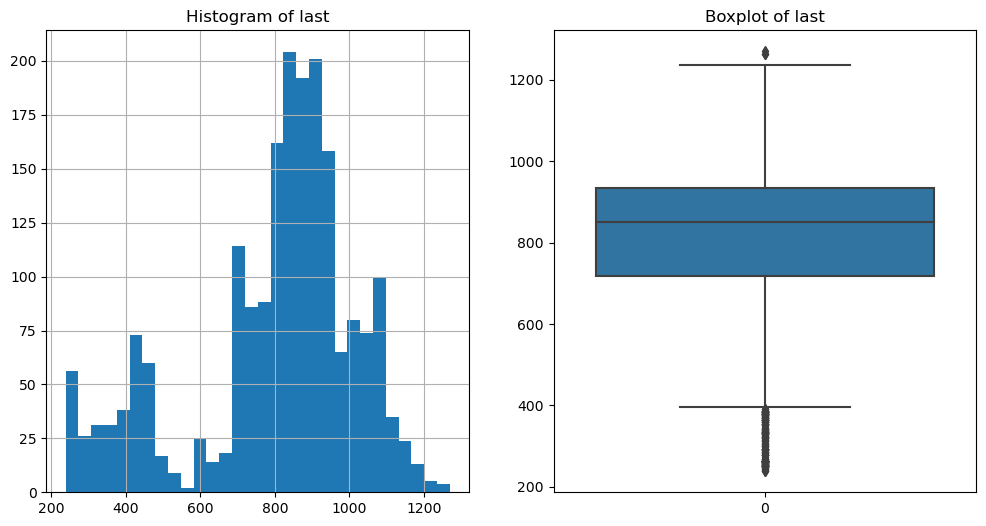

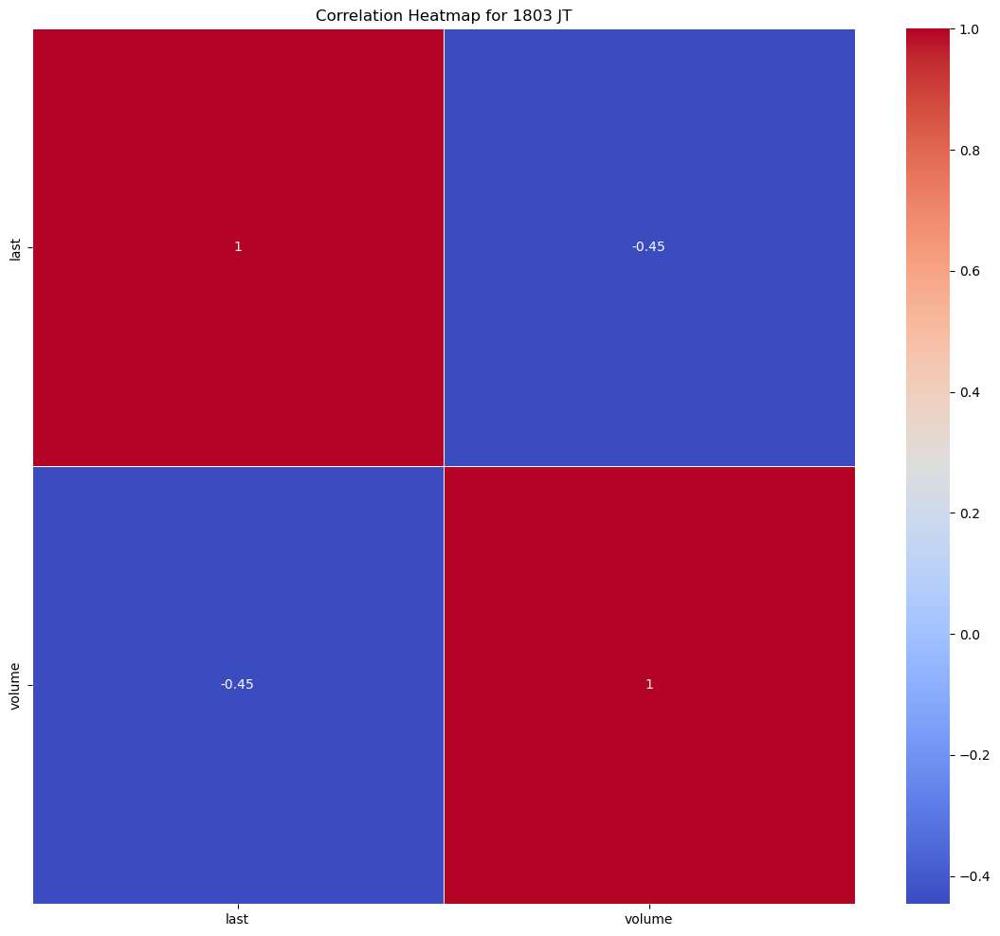

Statistics for stock 1812 JT
---- last ----
Mean: 1197.5230424937656
Median: 1235.7386
Mode: 798.7898
Range: 1881.6363
Standard Deviation: 400.6104748633264
Skewness: 0.03312948537475169
Kurtosis: -0.4282341927149309


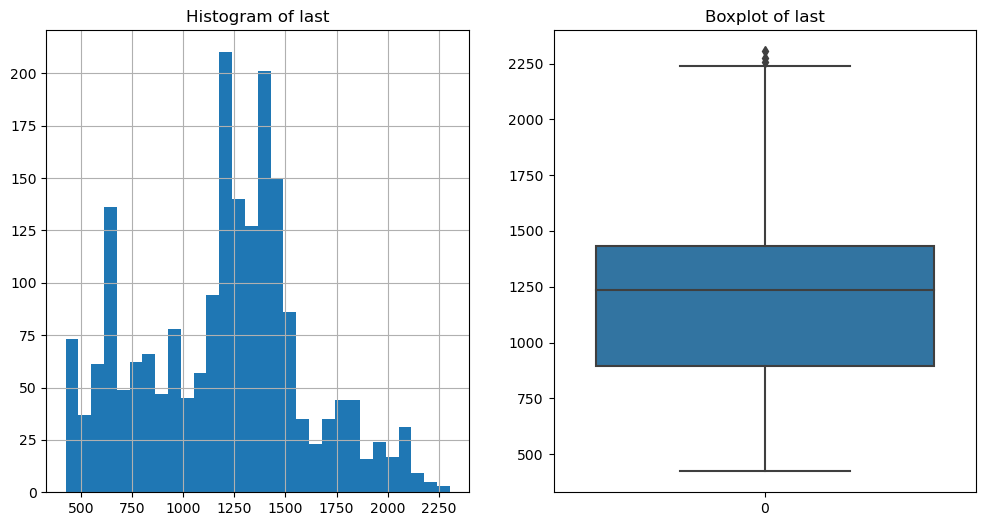

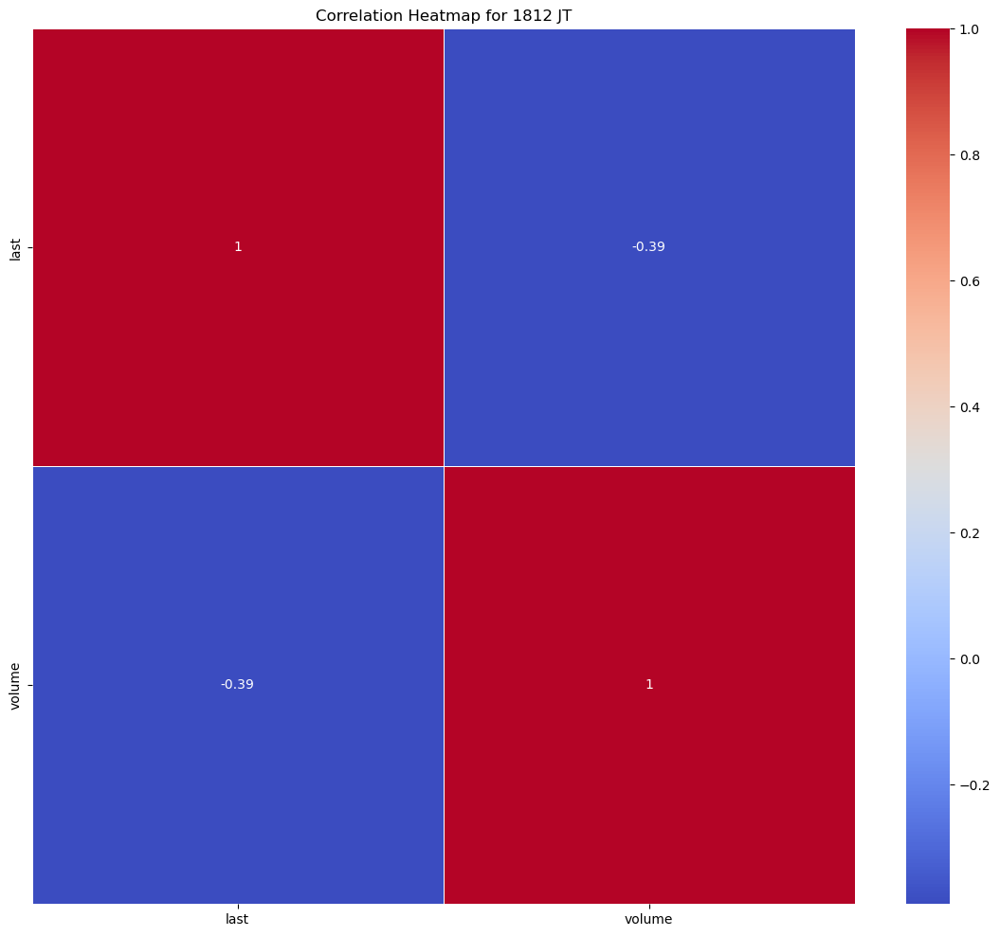

Statistics for stock 1925 JT
---- last ----
Mean: 2624.09671680798
Median: 2734.5491
Mode: 2973.6305
Range: 2950.4577
Standard Deviation: 741.4913342701982
Skewness: -0.2806279216232438
Kurtosis: -1.043132070536101


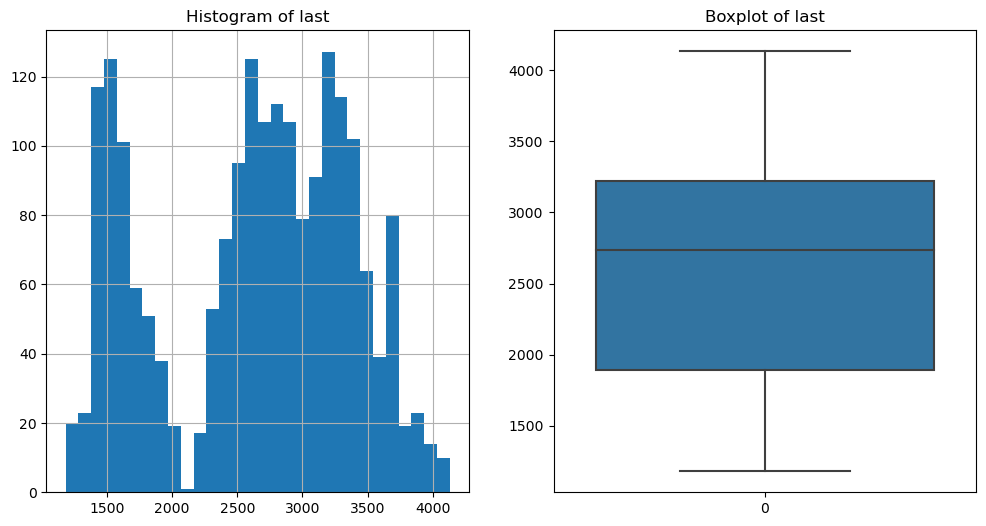

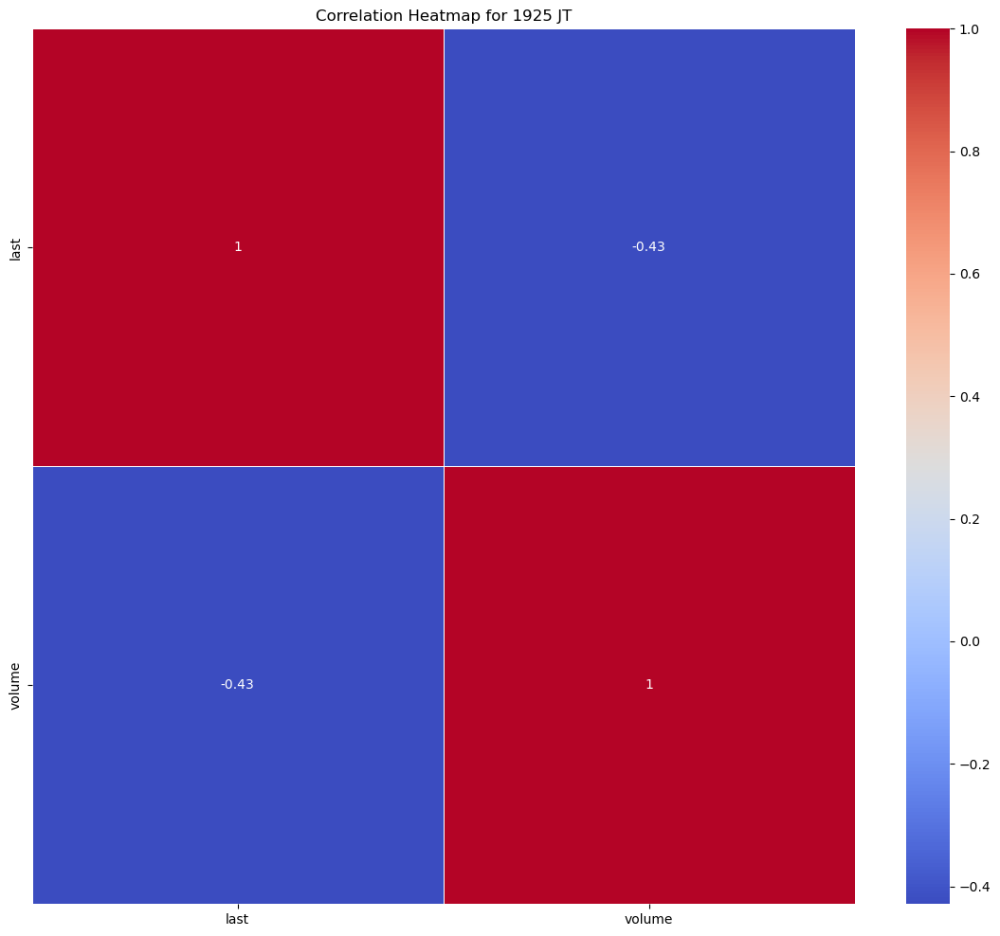

Statistics for stock 1928 JT
---- last ----
Mean: 1522.6721498753118
Median: 1572.1664
Mode: 751.1837
Range: 1649.4977
Standard Deviation: 357.3071297673485
Skewness: -0.1020615208872031
Kurtosis: -0.4701550752413115


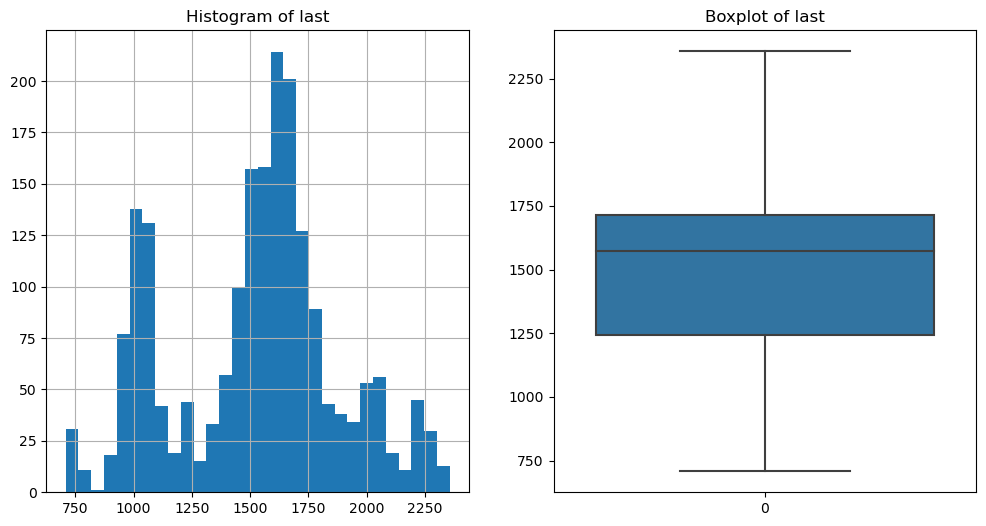

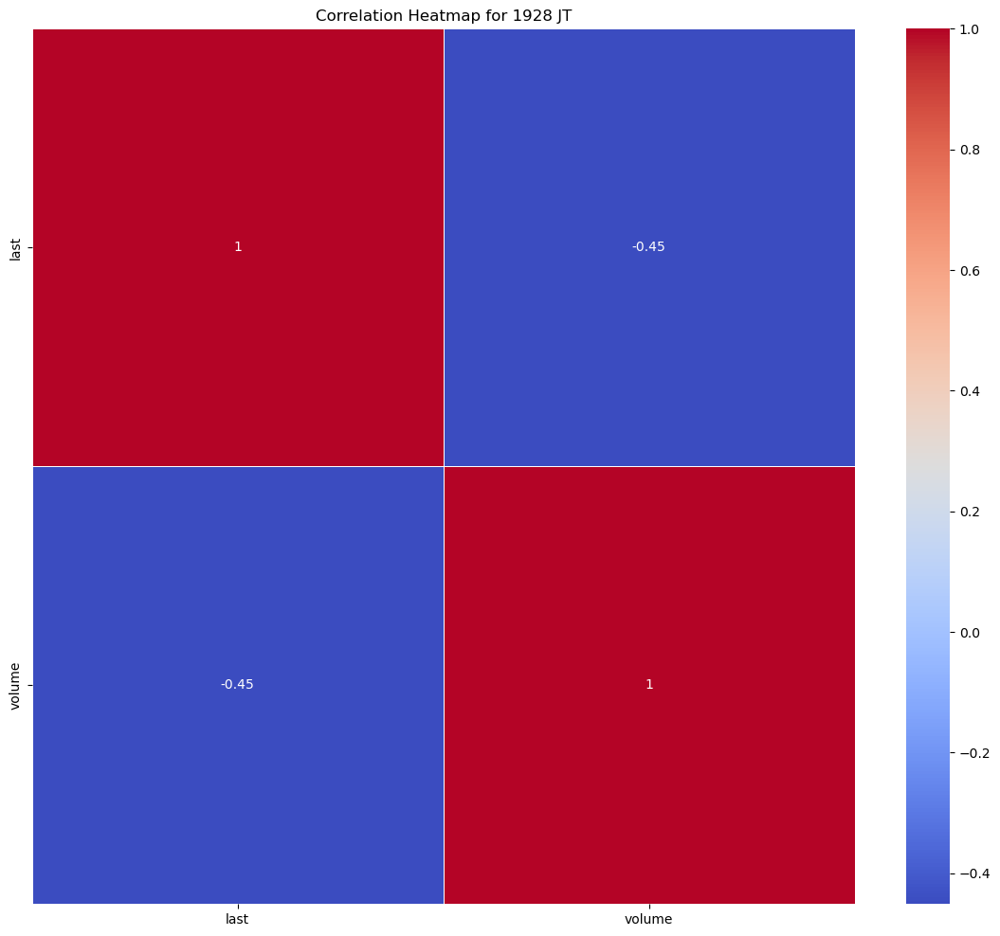

Statistics for stock 1963 JT
---- last ----
Mean: 1984.9302706733165
Median: 1837.2139
Mode: 3397.5966
Range: 3099.9413999999997
Standard Deviation: 661.3790571426503
Skewness: 0.6584295708648854
Kurtosis: -0.2002239746451253


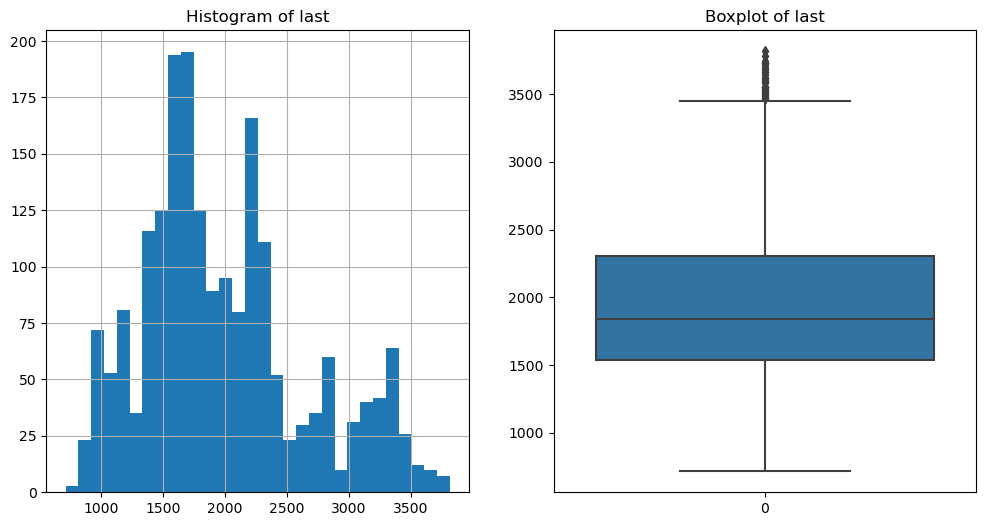

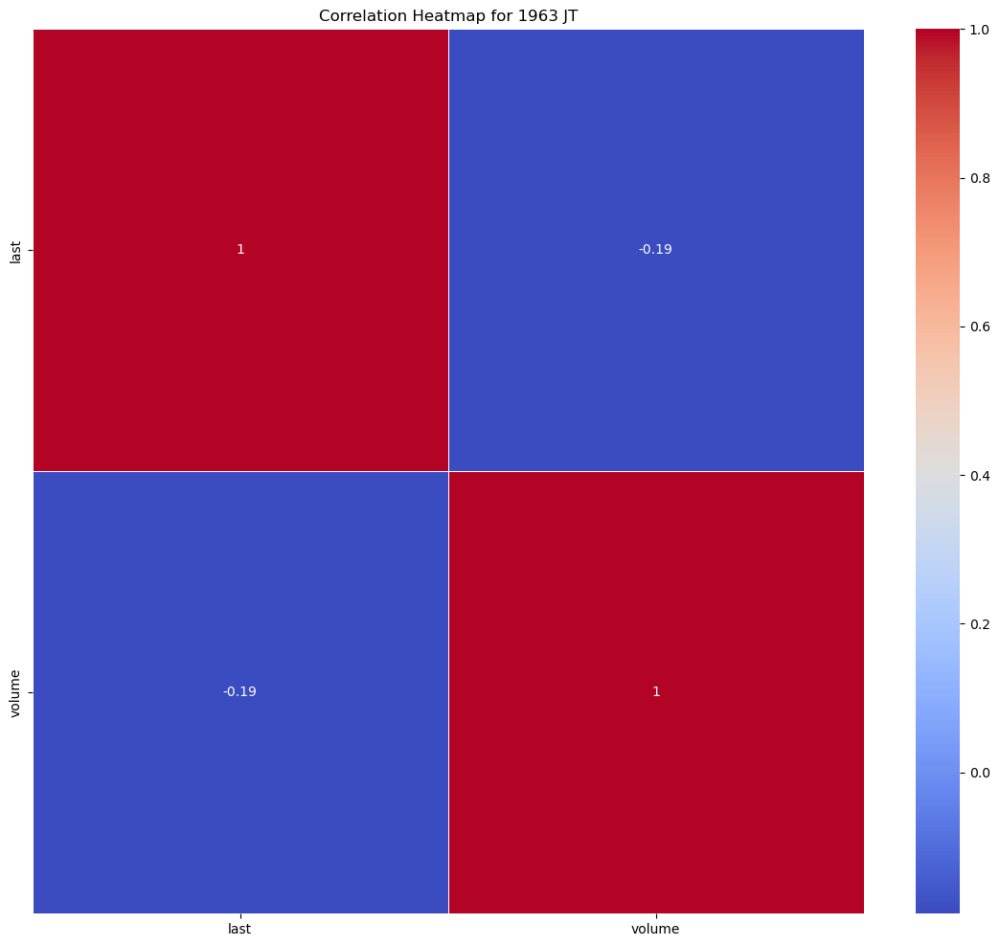

Statistics for stock 2002 JT
---- last ----
Mean: 1595.7577036408977
Median: 1652.5701
Mode: 989.426
Range: 1838.7118
Standard Deviation: 474.00196759922636
Skewness: -0.1455020969205849
Kurtosis: -0.9136879316119701


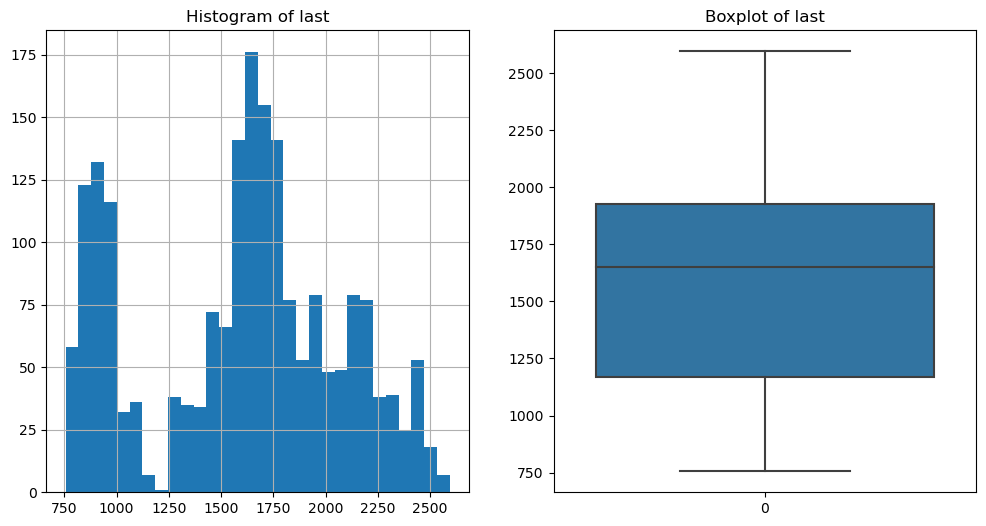

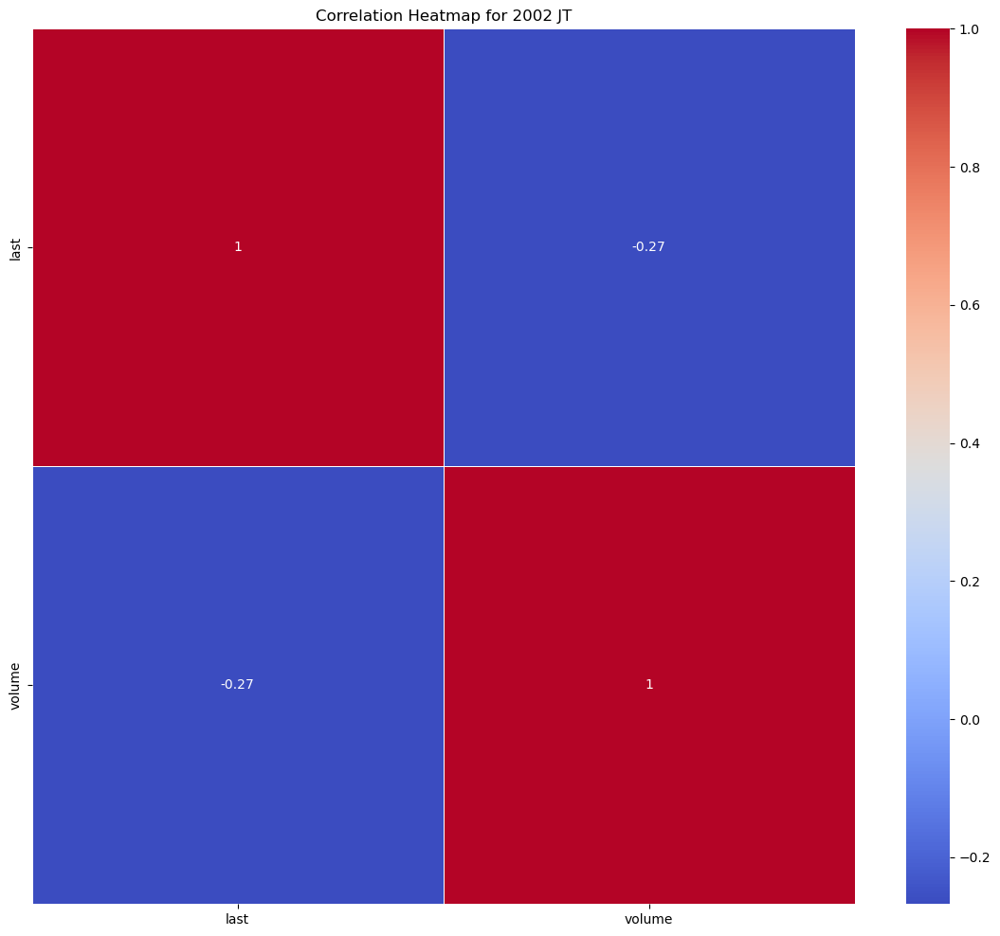

Statistics for stock 2269 JT
---- last ----
Mean: 6797.620641945137
Median: 7618.9589
Mode: 7296.6397
Range: 8436.8251
Standard Deviation: 2415.554481782388
Skewness: -0.960663725515653
Kurtosis: -0.5396128115568155


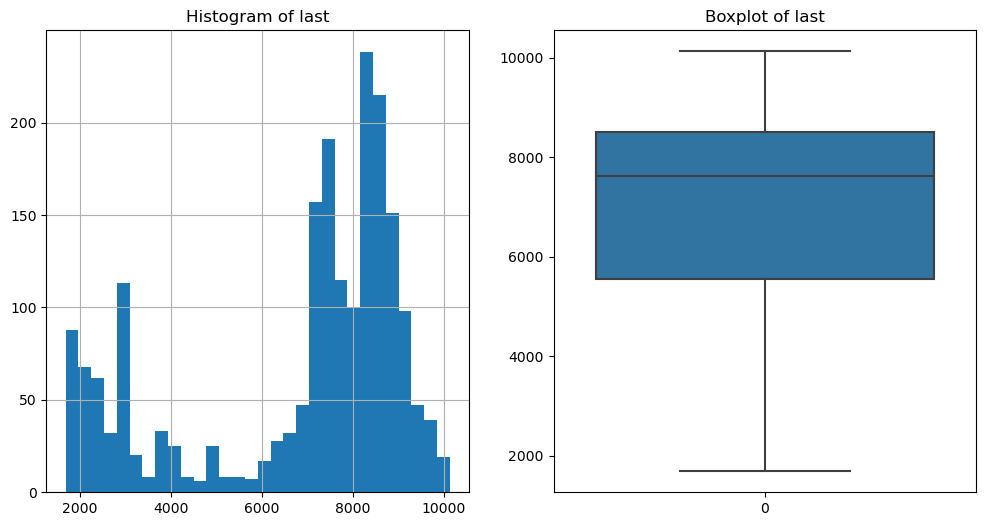

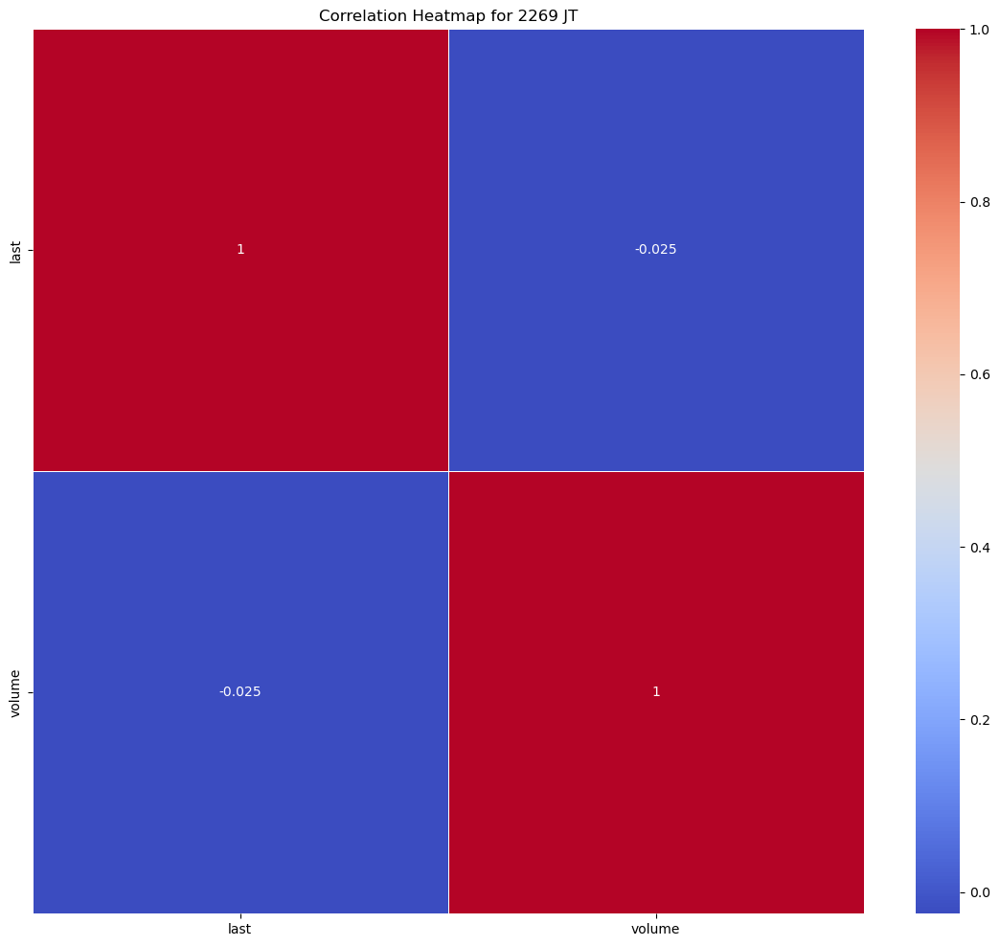

Statistics for stock 2282 JT
---- last ----
Mean: 4290.114048229427
Median: 4384.3532
Mode: 3978.7539
Range: 4772.8213
Standard Deviation: 963.7206535617253
Skewness: -0.17244534394924685
Kurtosis: -0.06667691824880295


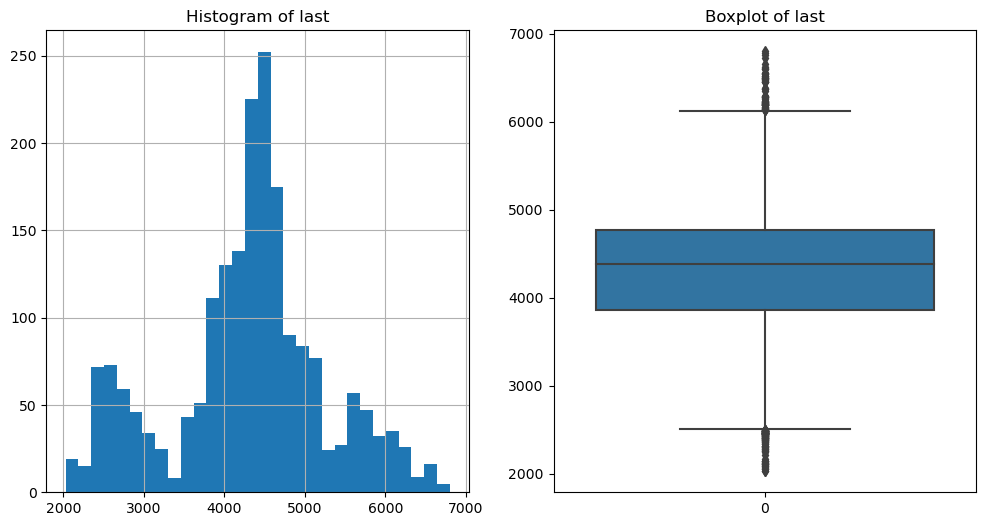

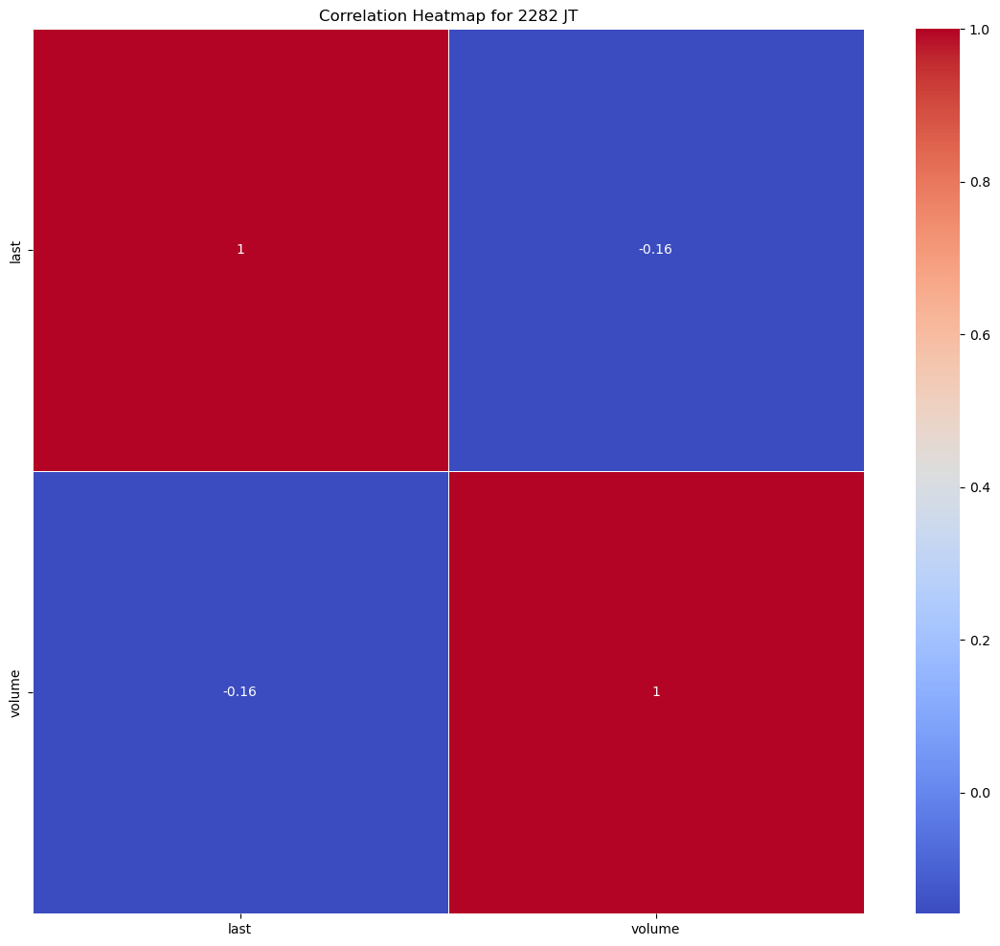

Statistics for stock 2501 JT
---- last ----
Mean: 2304.5123021945133
Median: 2250.4799
Mode: 1900.3278
Range: 2175.8484
Standard Deviation: 435.55857108049315
Skewness: 0.19595080667198492
Kurtosis: -0.5129419470846348


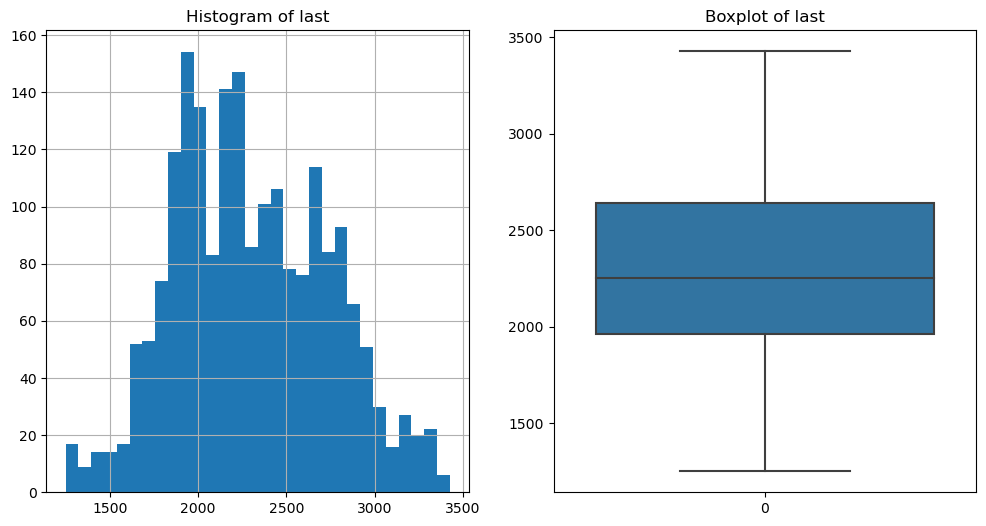

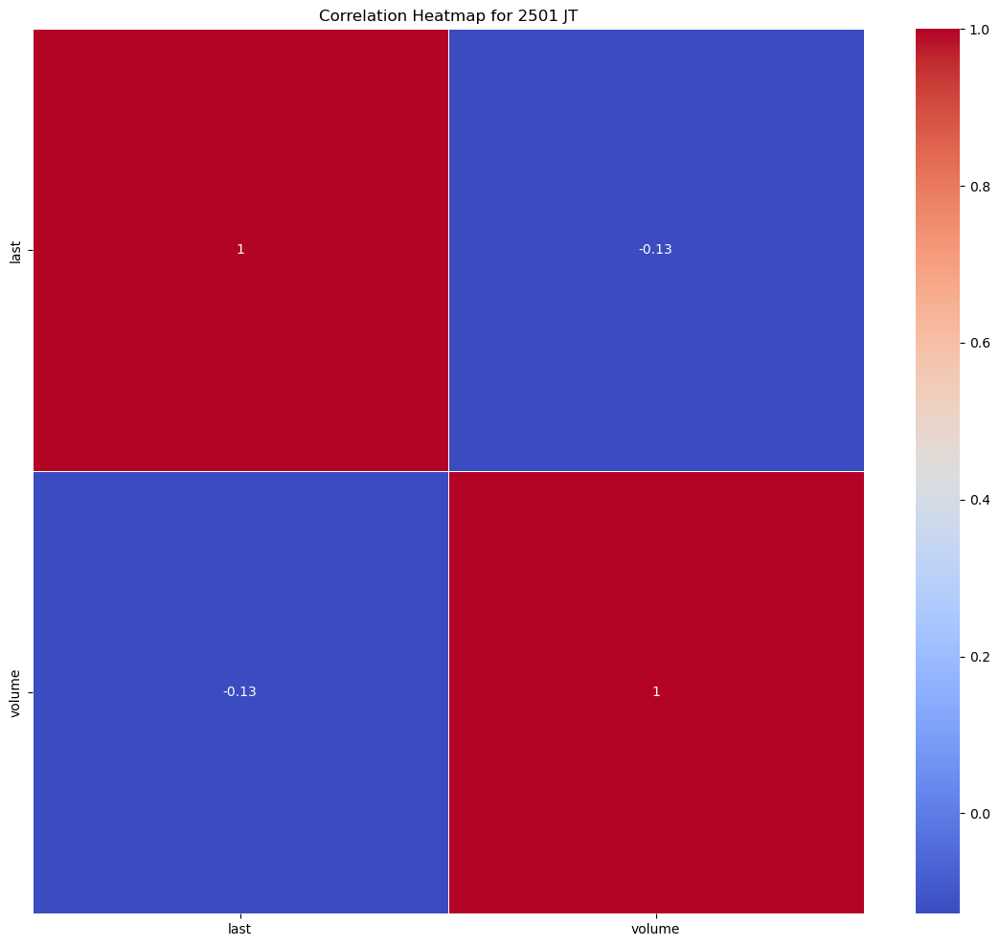

Statistics for stock 2502 JT
---- last ----
Mean: 3699.4085308229423
Median: 3584.902
Mode: 2420.6342
Range: 4064.0185999999994
Standard Deviation: 959.1066099921358
Skewness: -0.024020861426662977
Kurtosis: -0.8959917032685656


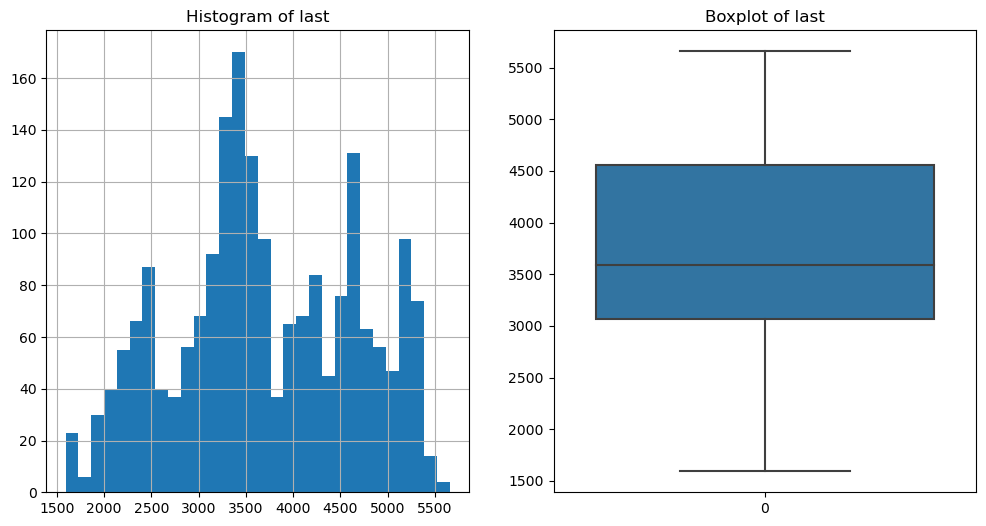

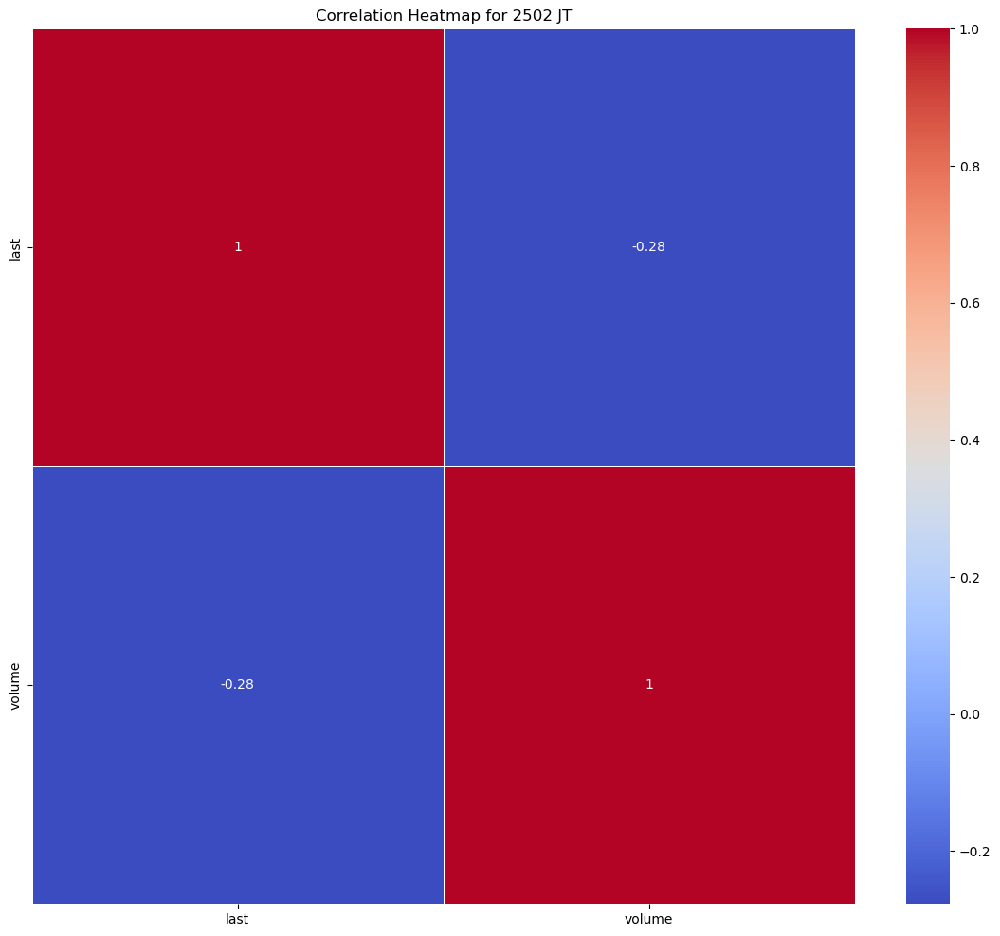

Statistics for stock 2503 JT
---- last ----
Mean: 1839.0913439401497
Median: 1752.4205
Mode: 2013.7151
Range: 2112.9096
Standard Deviation: 516.4876946403157
Skewness: 0.18248886988926058
Kurtosis: -1.2746642482914396


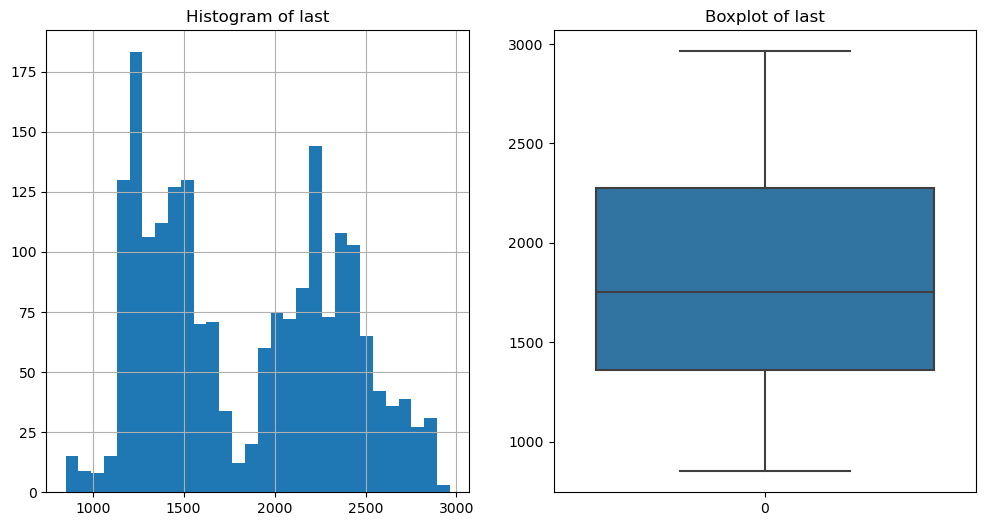

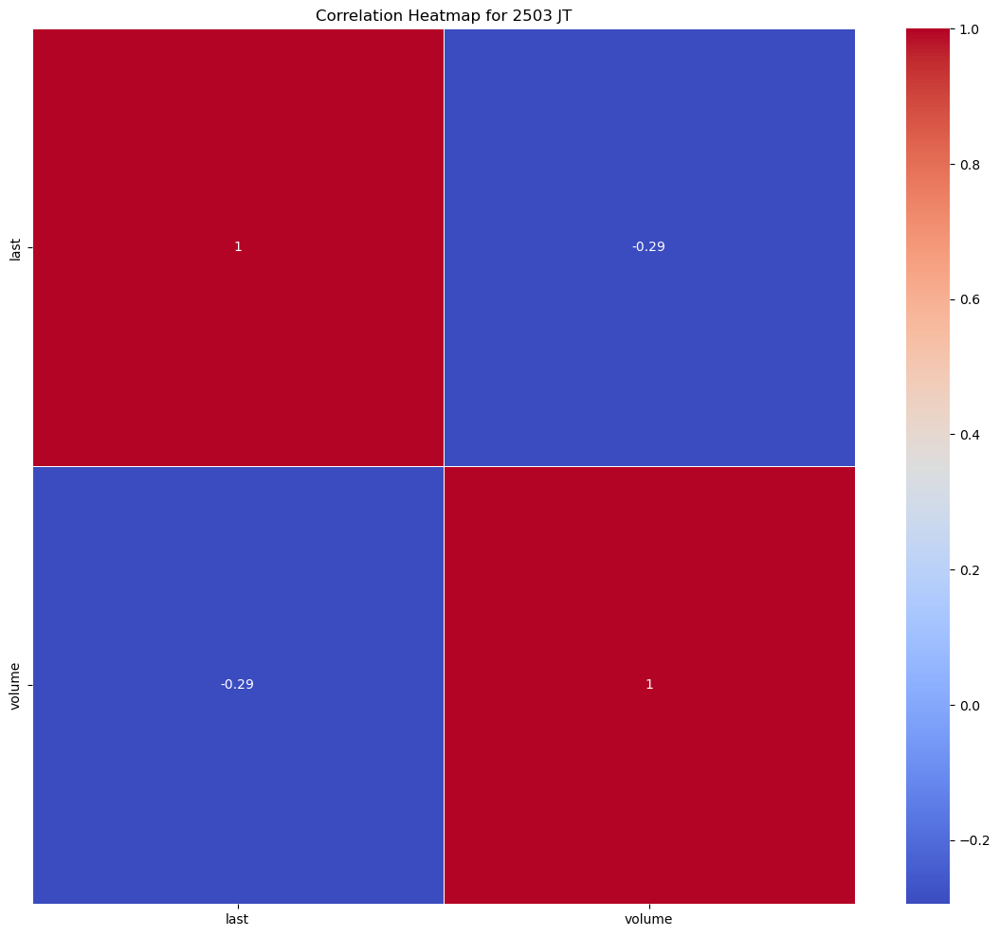

Statistics for stock 2531 JT
---- last ----
Mean: 978.5276872319201
Median: 933.6874
Mode: 688.1892
Range: 1088.7767
Standard Deviation: 219.9671517337668
Skewness: 0.6330277258935106
Kurtosis: -0.2266269920327737


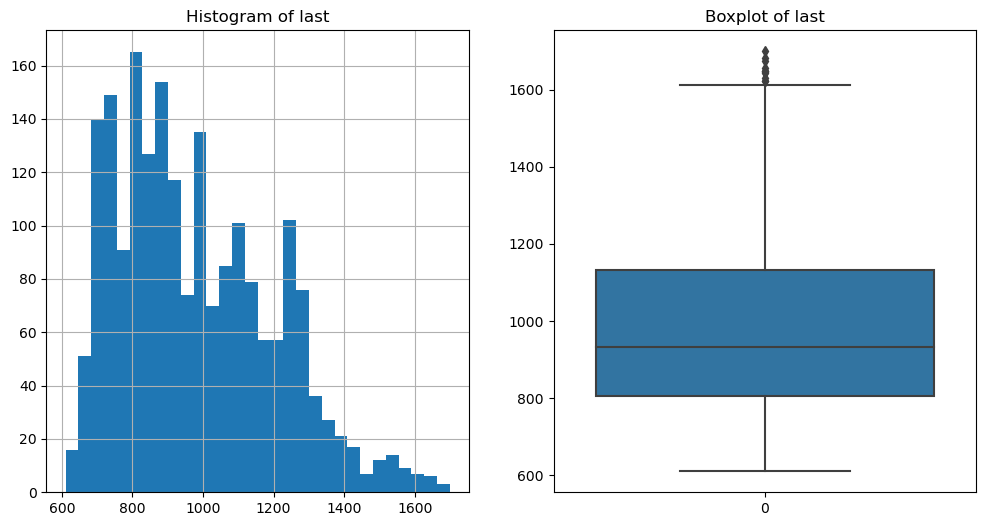

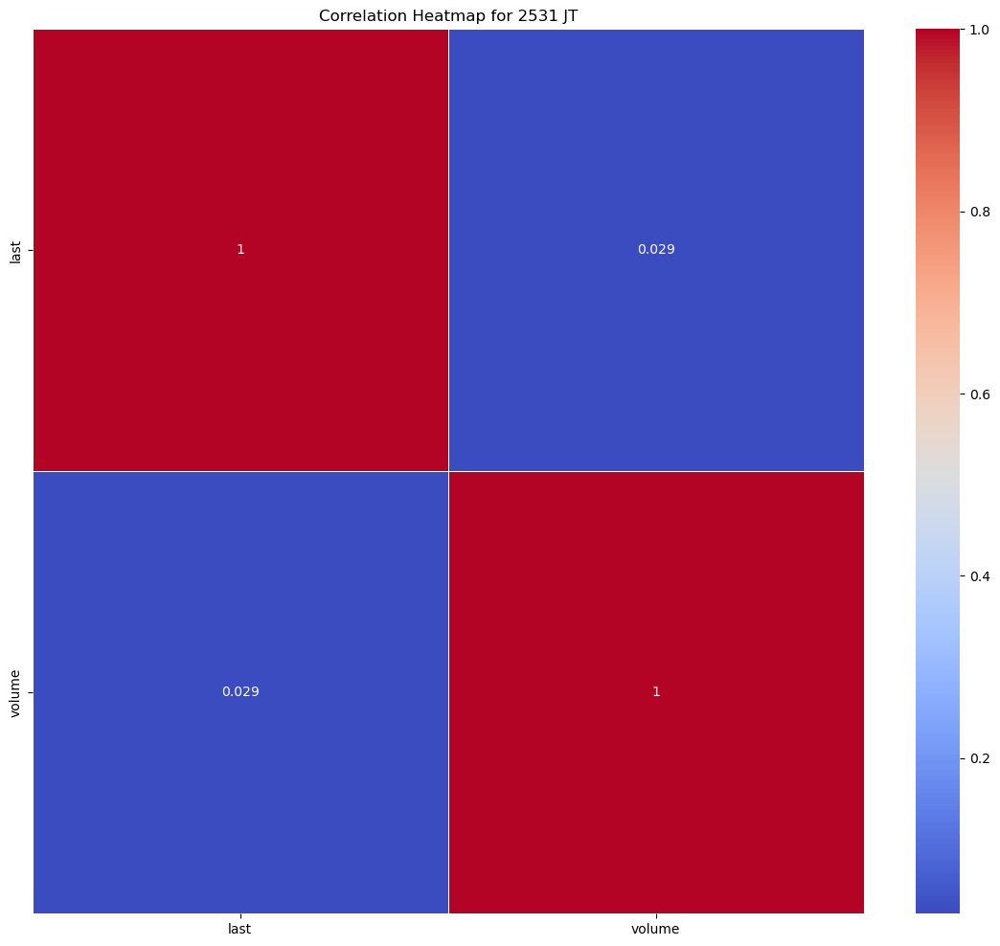

Statistics for stock 2768 JT
---- last ----
Mean: 232.20646992518706
Median: 232.6567
Mode: 243.655
Range: 290.4206
Standard Deviation: 78.61137683603503
Skewness: 0.1522153803513913
Kurtosis: -1.0765152468952468


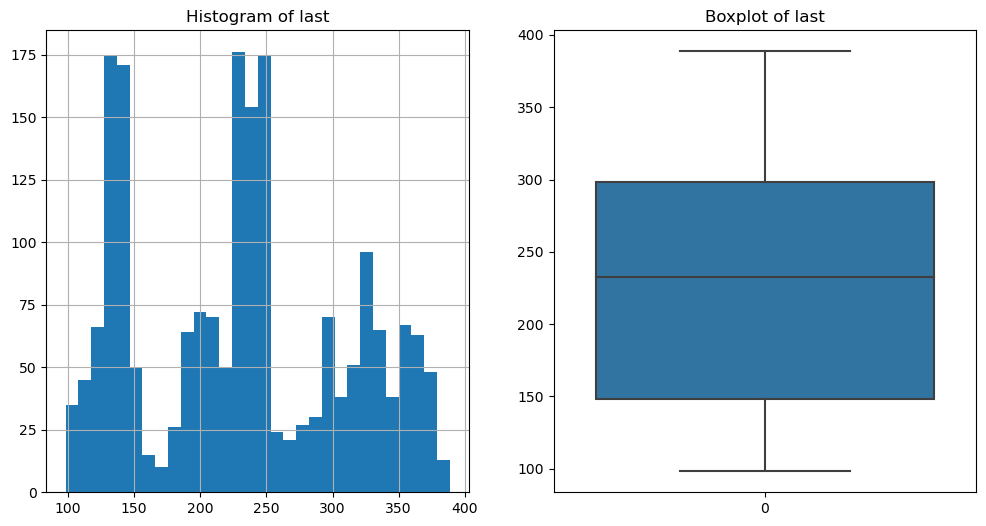

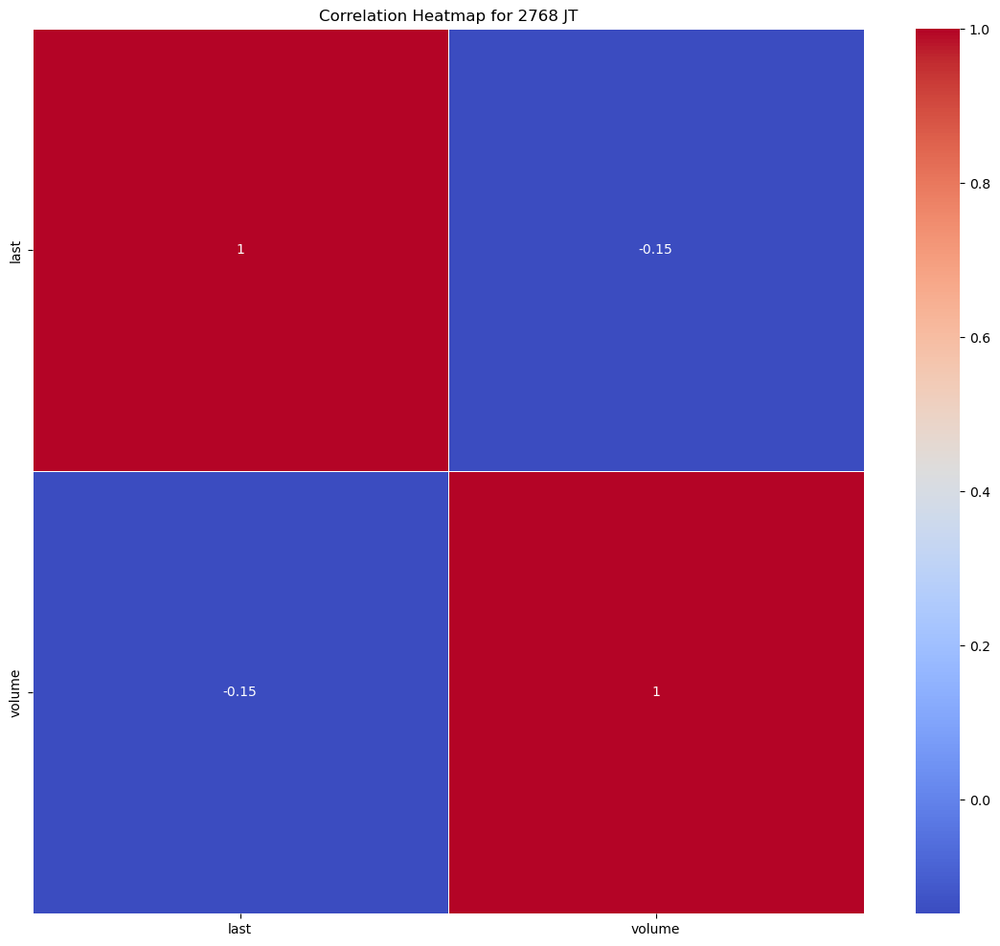

Statistics for stock 2801 JT
---- last ----
Mean: 3835.08717765586
Median: 3624.3976
Mode: 3379.5816
Range: 6505.4016
Standard Deviation: 1508.0393186129386
Skewness: 0.18900114062254528
Kurtosis: -0.6695414582392076


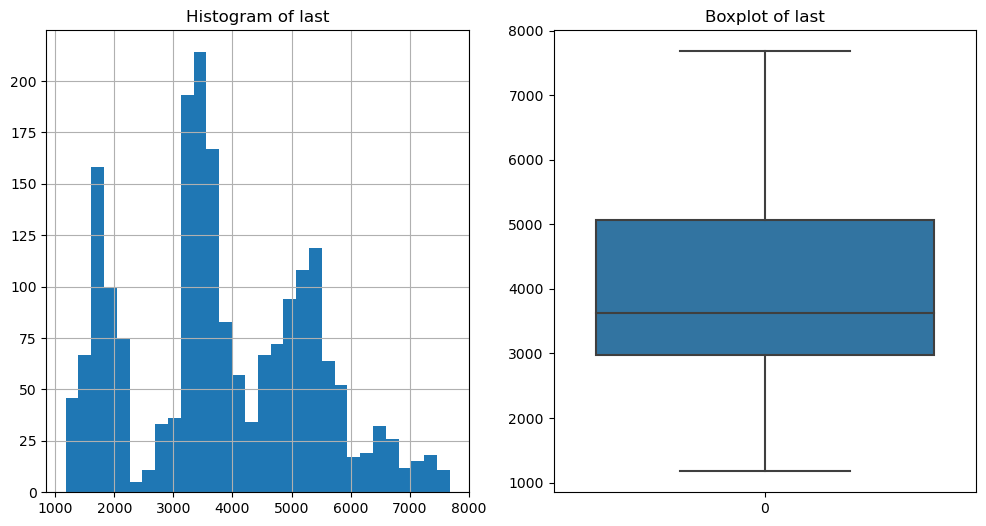

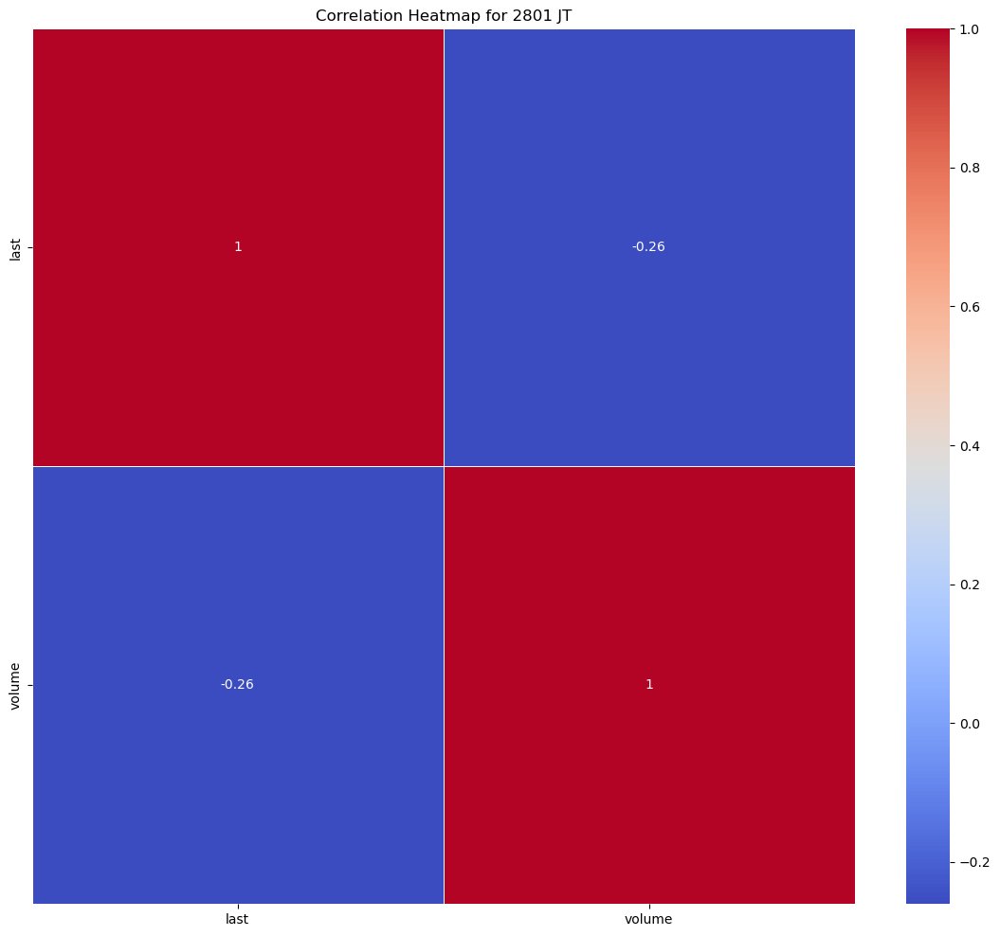

Statistics for stock 2802 JT
---- last ----
Mean: 1923.2238666334165
Median: 1965.3569
Mode: 1221.978
Range: 1892.1465
Standard Deviation: 400.2598782177622
Skewness: -0.32409231782986947
Kurtosis: -0.6013344686757431


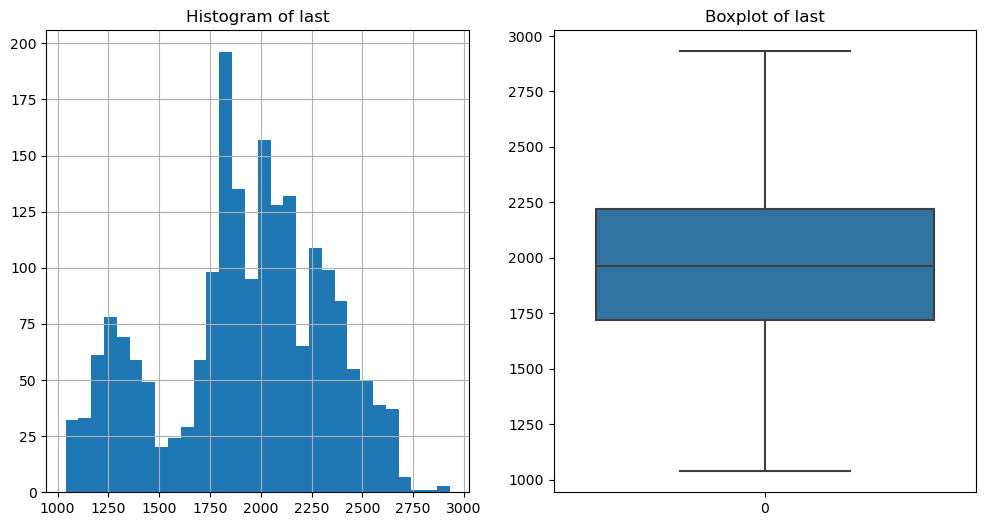

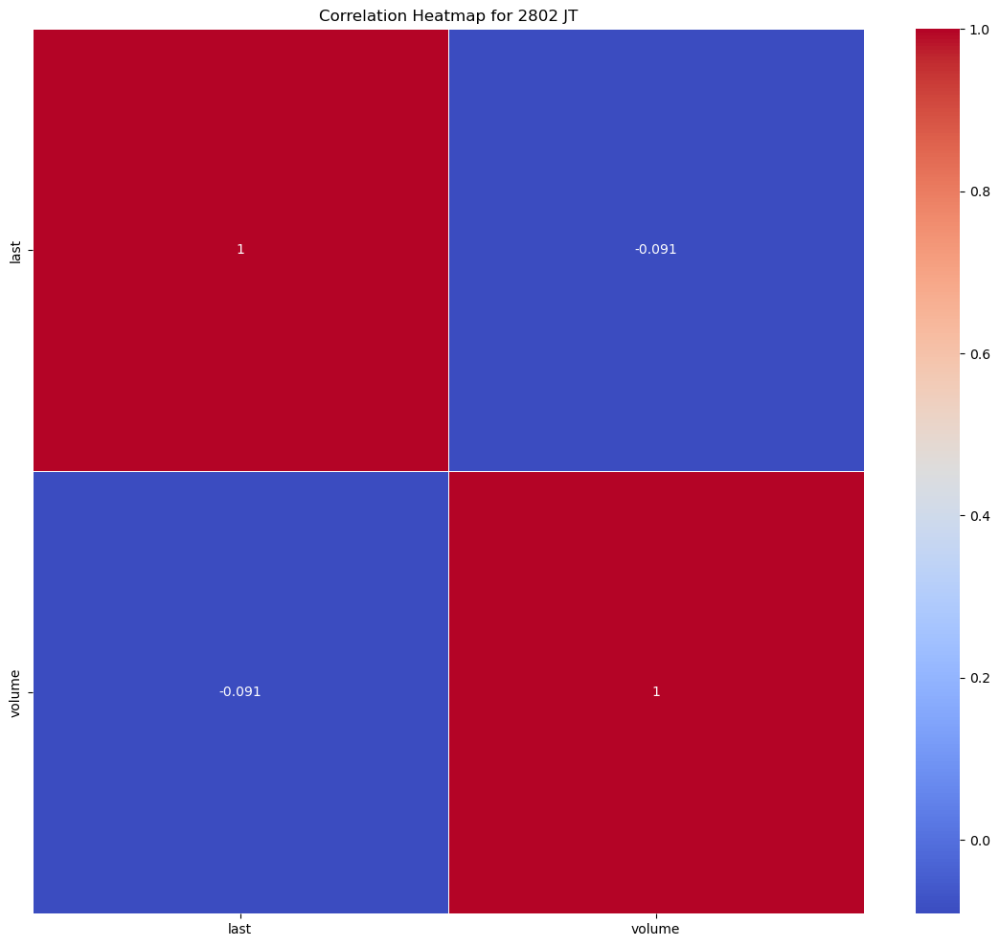

Statistics for stock 2871 JT
---- last ----
Mean: 2020.6639614962594
Median: 2308.7425
Mode: 1776.1237
Range: 2462.0447999999997
Standard Deviation: 816.64270417009
Skewness: -0.26555704194357804
Kurtosis: -1.5364568566041088


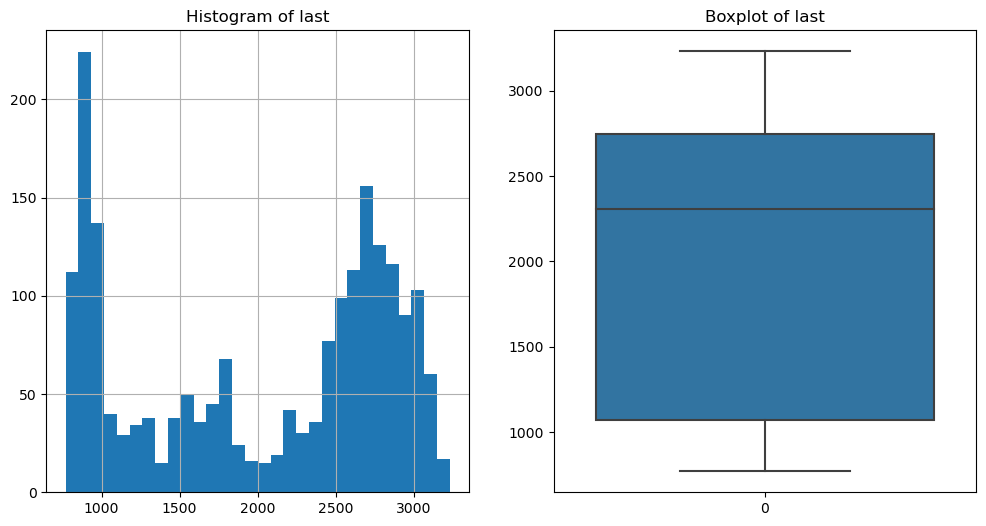

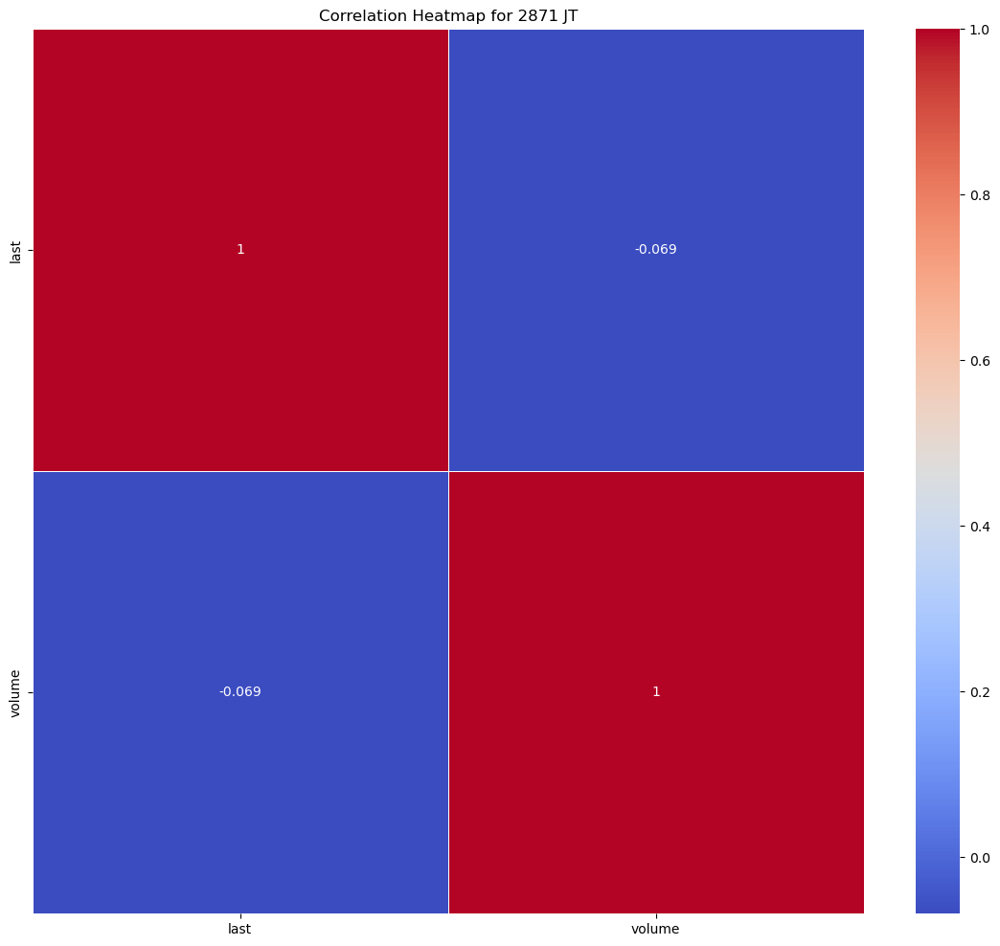

Statistics for stock 2914 JT
---- last ----
Mean: 2632.9566389027436
Median: 2530.4375
Mode: 2506.4609
Range: 1990.0310000000002
Standard Deviation: 486.03400805907347
Skewness: 0.25417052696353115
Kurtosis: -0.9664287656380792


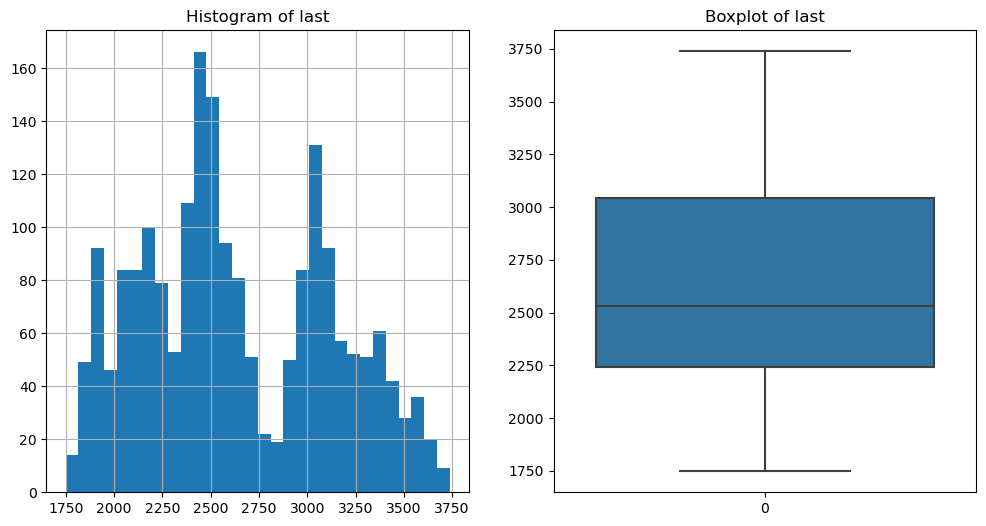

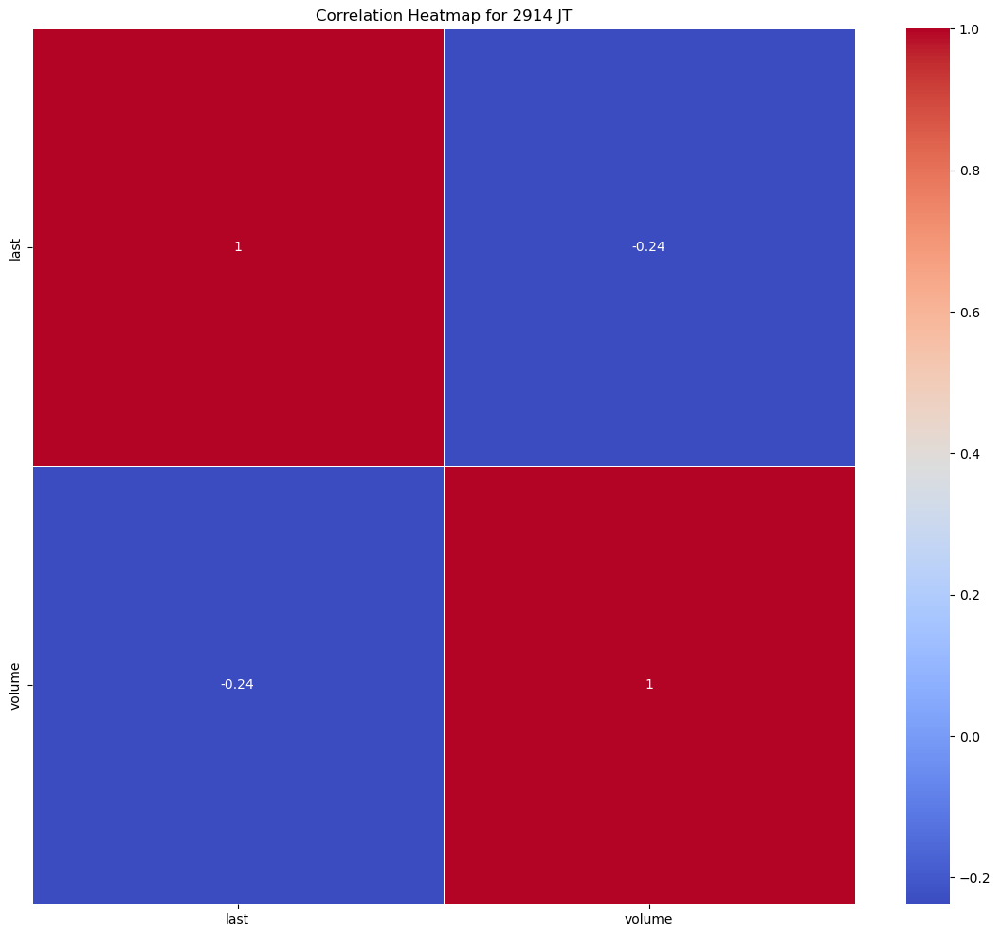

Statistics for stock 3086 JT
---- last ----
Mean: 1308.7589554114713
Median: 1291.1304
Mode: 1233.3172
Range: 1598.5768000000003
Standard Deviation: 297.38118015507854
Skewness: 0.10006491484171495
Kurtosis: -0.014876002730626503


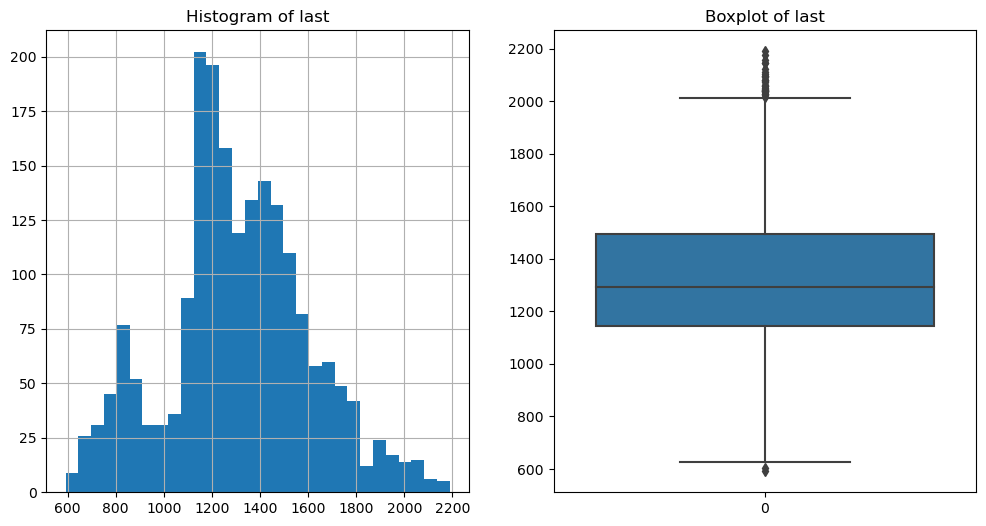

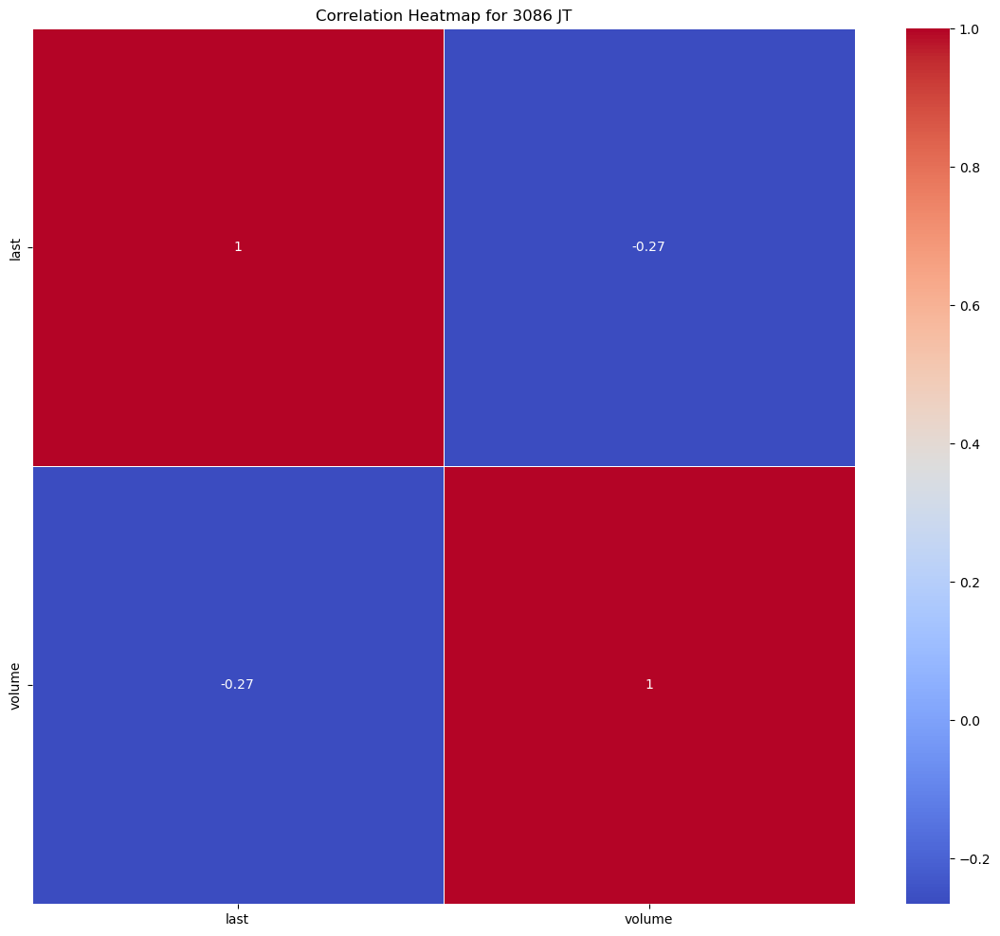

Statistics for stock 3099 JT
---- last ----
Mean: 1166.0129778054863
Median: 1181.9834
Mode: 890.8792
Range: 1741.1630000000002
Standard Deviation: 343.14683534610634
Skewness: 0.4860786353931348
Kurtosis: 0.5456802830527248


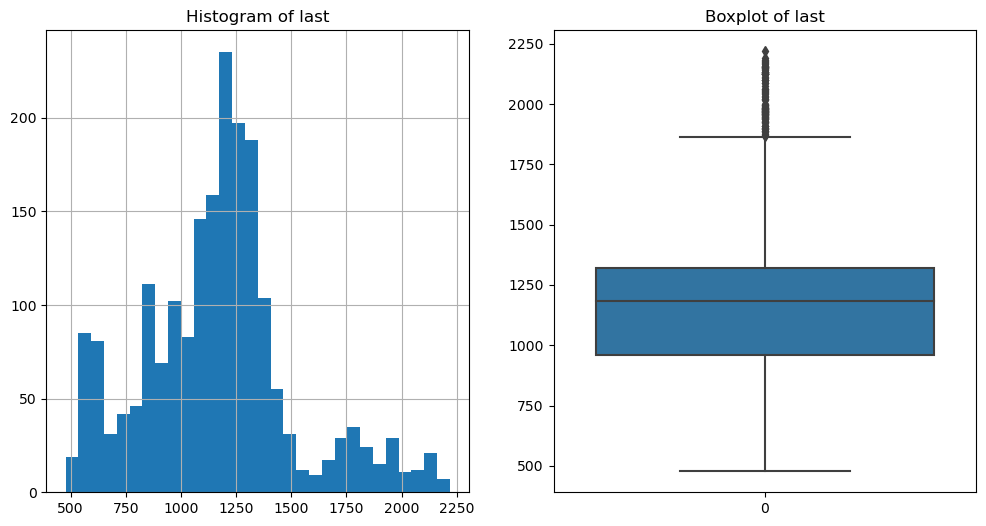

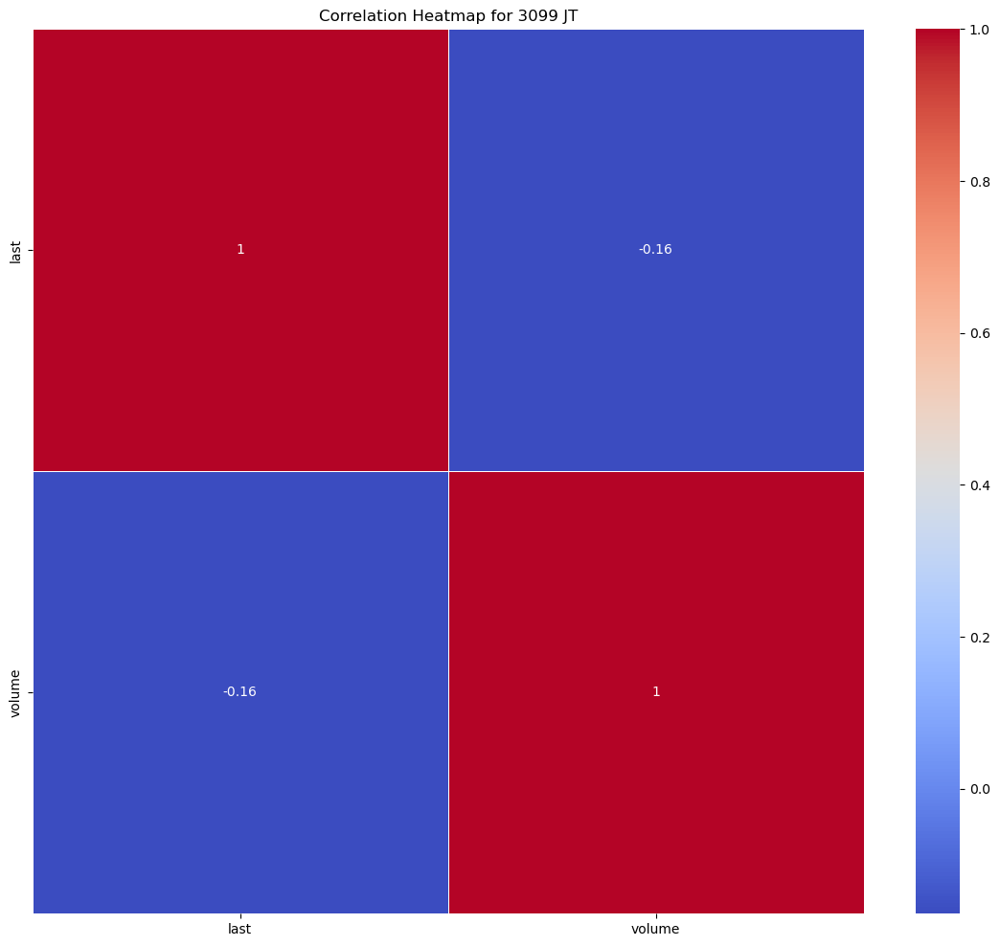

Statistics for stock 3101 JT
---- last ----
Mean: 1553.2995805486285
Median: 1510.7658
Mode: 1436.4932
Range: 1148.011
Standard Deviation: 206.76397246476418
Skewness: 0.3181833788032965
Kurtosis: -0.3627528015814492


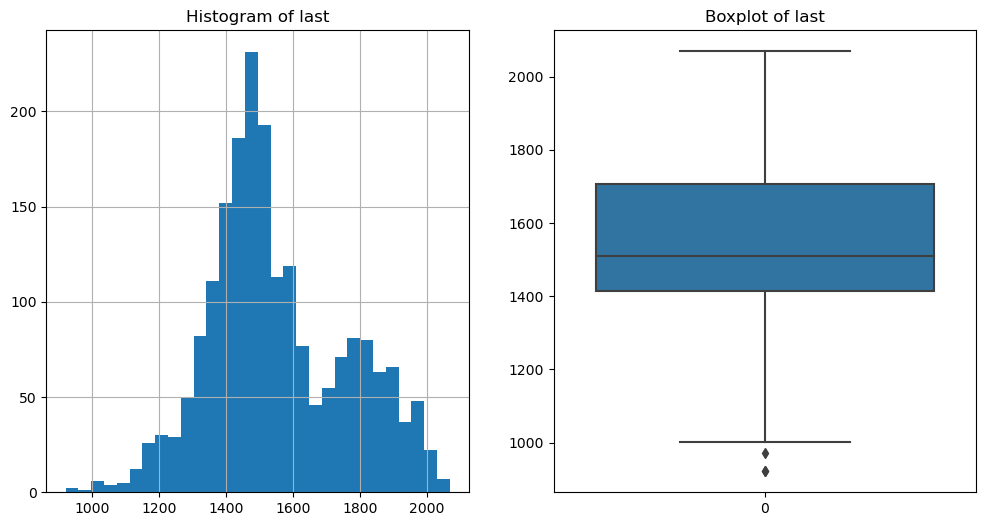

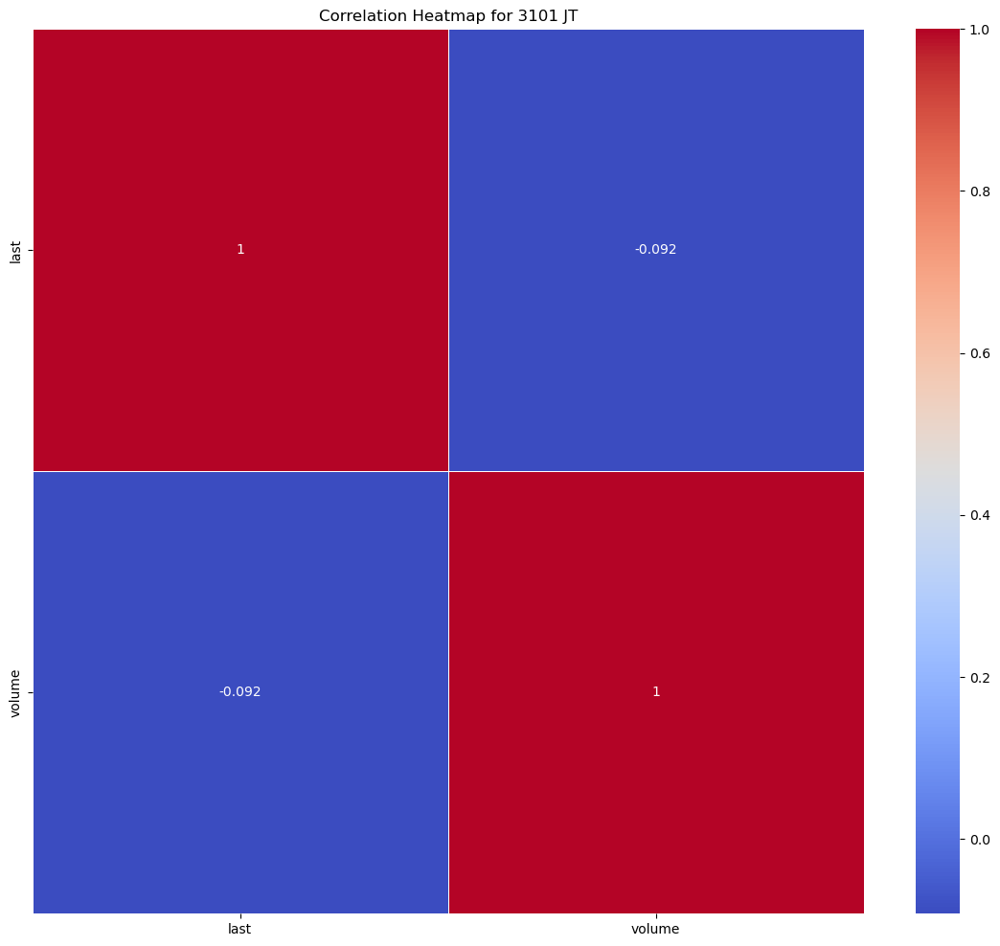

Statistics for stock 3103 JT
---- last ----
Mean: 568.5226932668329
Median: 560.0
Mode: 580.0
Range: 822.0
Standard Deviation: 163.7165291133377
Skewness: 0.515556038398414
Kurtosis: -0.09395114117035375


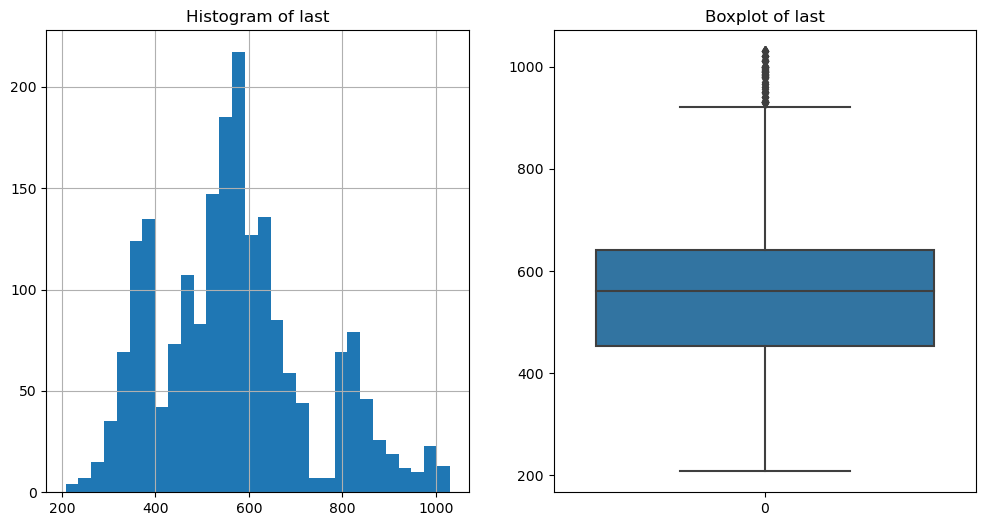

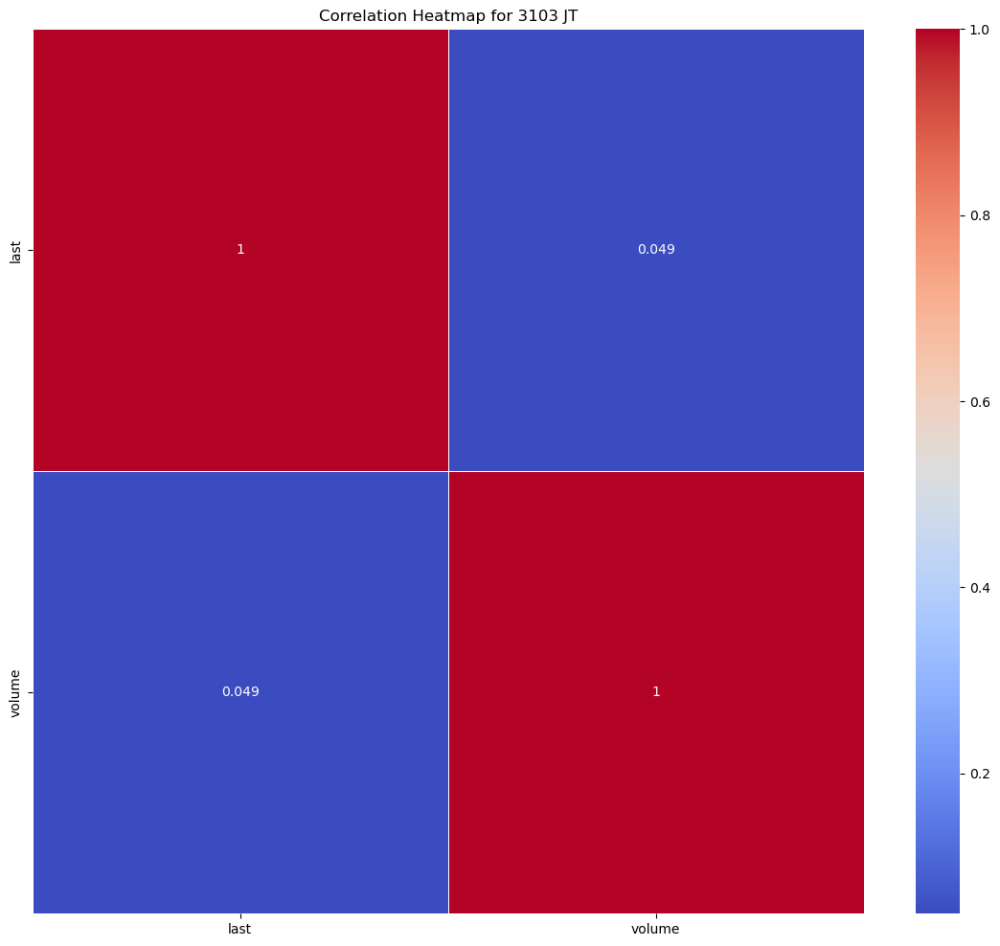

Statistics for stock 3105 JT
---- last ----
Mean: 918.0360514713217
Median: 913.7912
Mode: 835.5067
Range: 965.4152
Standard Deviation: 213.64810040165634
Skewness: 0.37647425391525596
Kurtosis: -0.45470157035471814


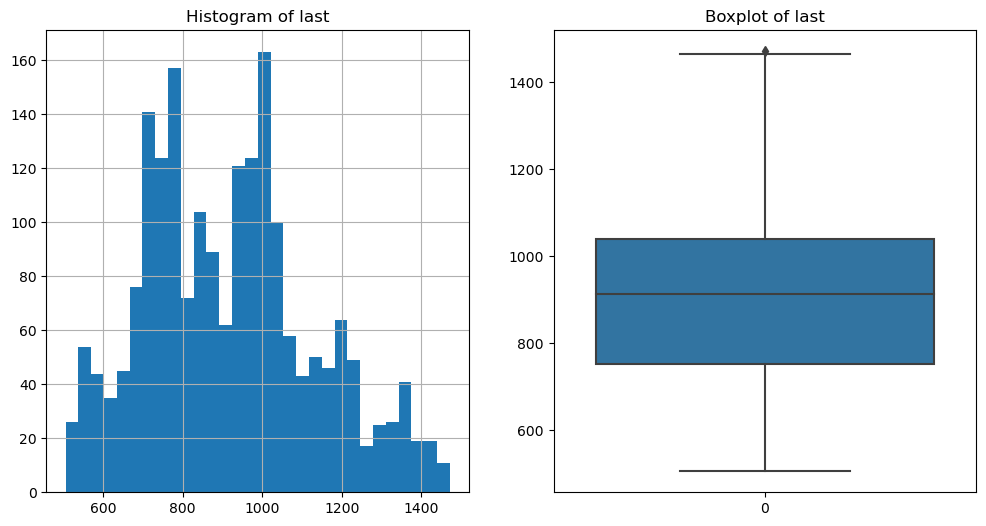

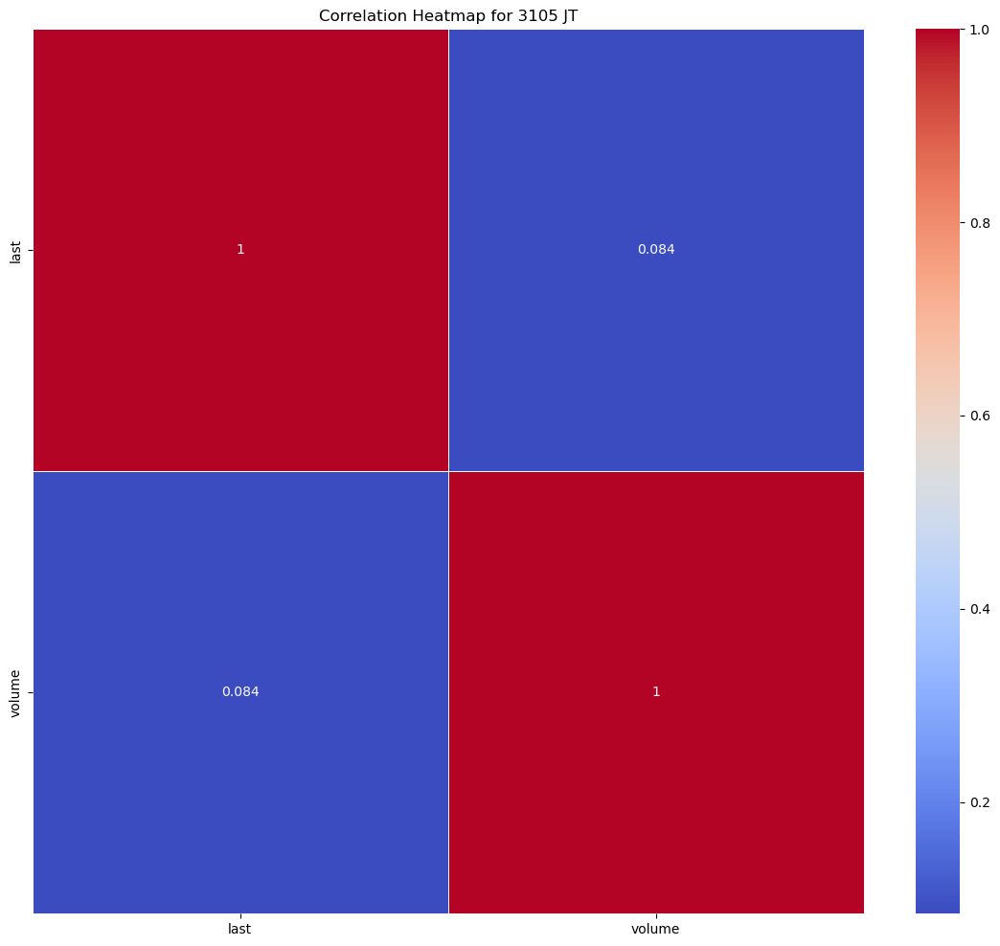

Statistics for stock 3382 JT
---- last ----
Mean: 3901.2475971072317
Median: 3975.6022
Mode: 3199.3031
Range: 3095.6170000000006
Standard Deviation: 567.3972695852366
Skewness: -0.4236616407559857
Kurtosis: 0.1470837540451444


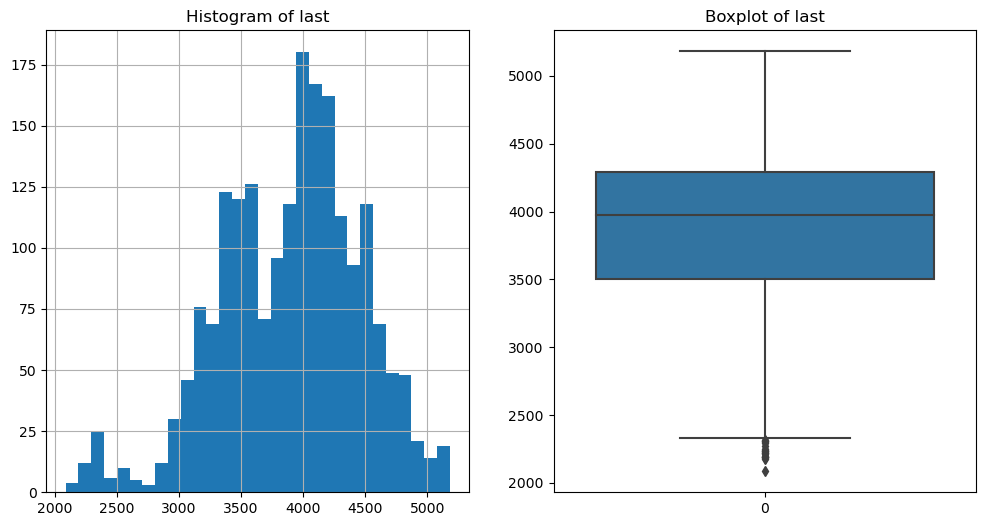

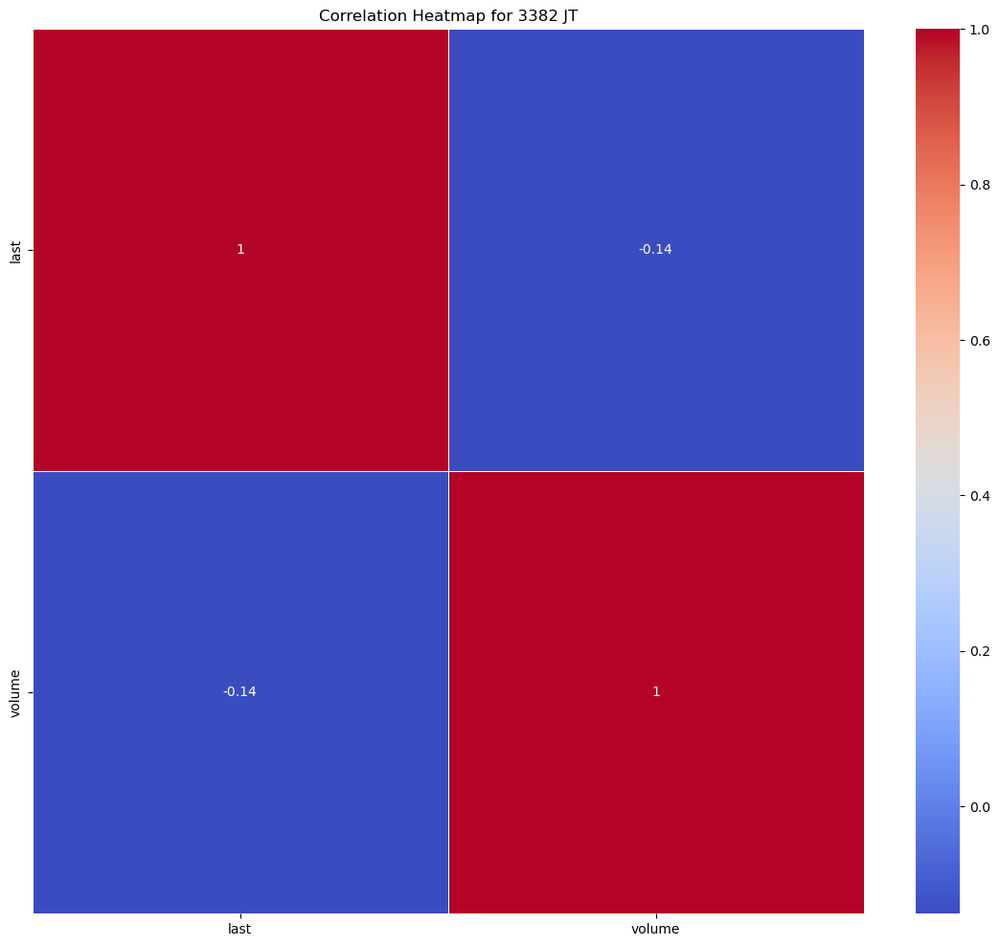

Statistics for stock 3401 JT
---- last ----
Mean: 1637.2018914214464
Median: 1746.454
Mode: 1084.2318
Range: 1542.5646
Standard Deviation: 392.8942546795054
Skewness: -0.7637591454963212
Kurtosis: -0.6641740151585678


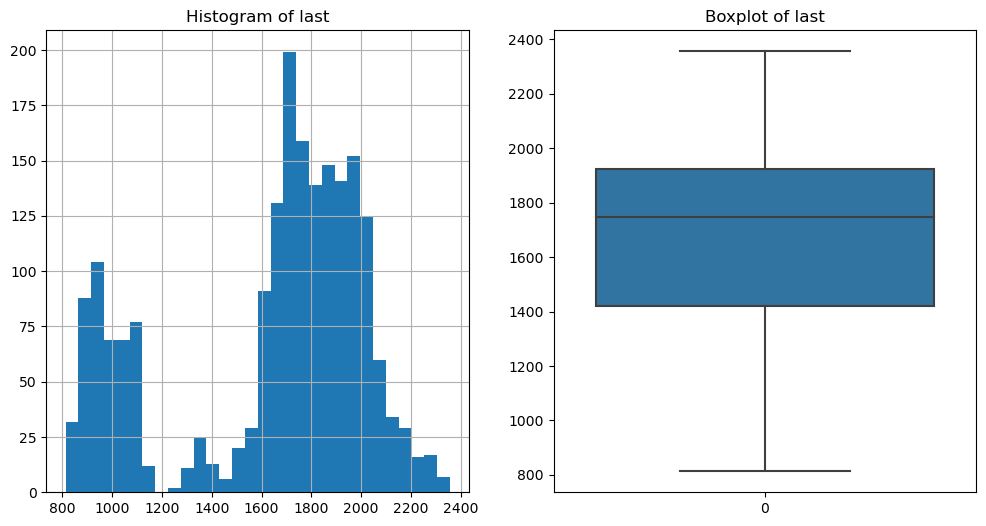

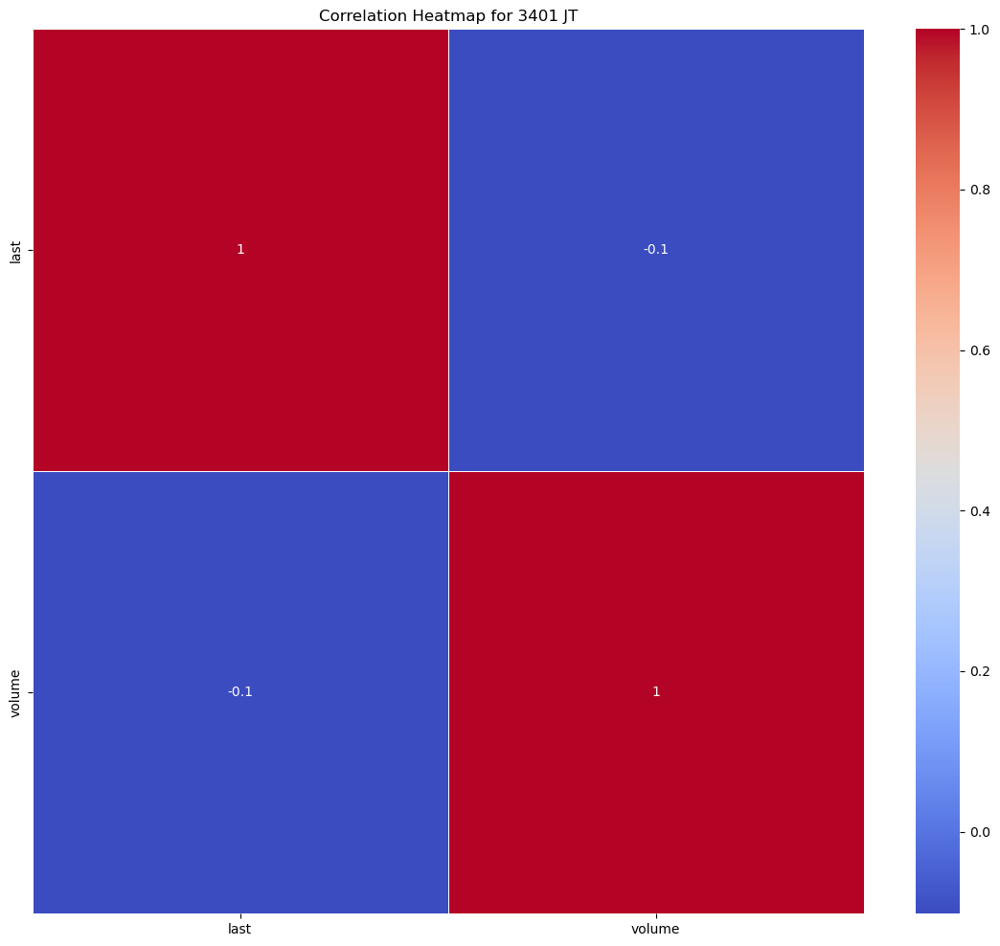

Statistics for stock 3402 JT
---- last ----
Mean: 763.5423219451371
Median: 780.9651
Mode: 552.5821
Range: 732.2683999999999
Standard Deviation: 165.50629856476752
Skewness: -0.19910003849440355
Kurtosis: -1.0922024809604323


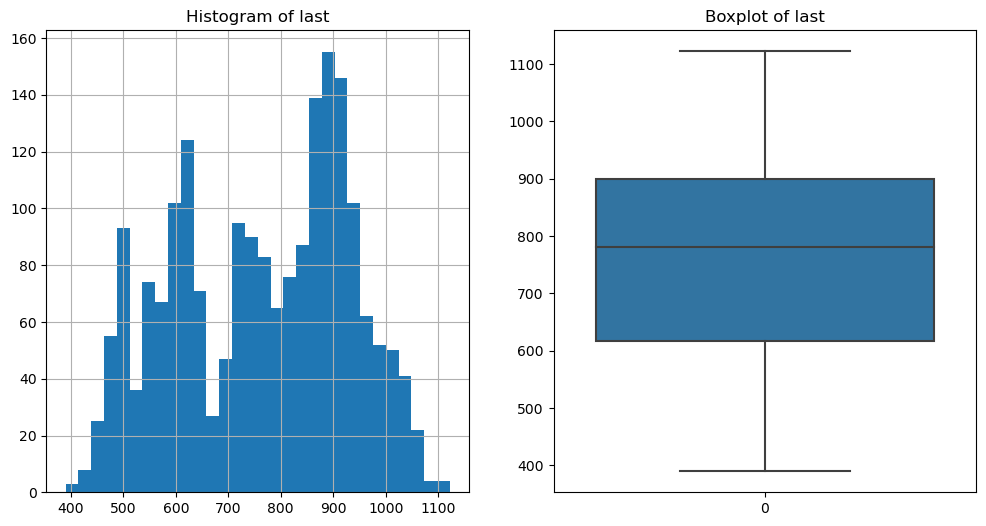

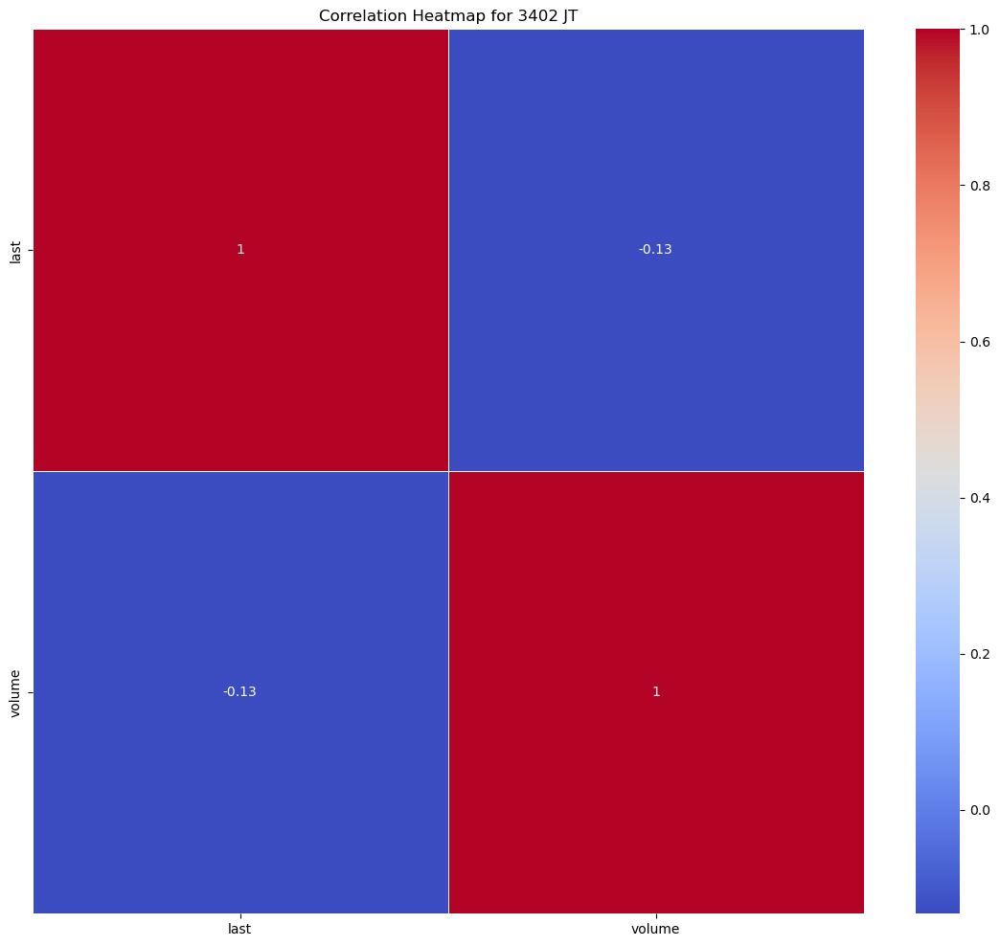

Statistics for stock 3405 JT
---- last ----
Mean: 1290.3797923690772
Median: 1238.5531
Mode: 1097.5653
Range: 1286.6039
Standard Deviation: 273.63321312926615
Skewness: 0.9134262455516077
Kurtosis: 0.278235152753608


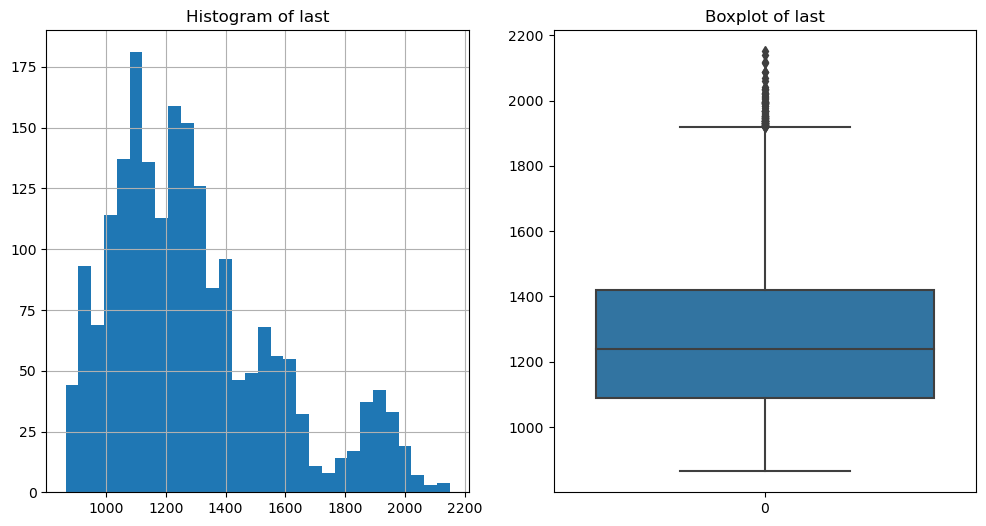

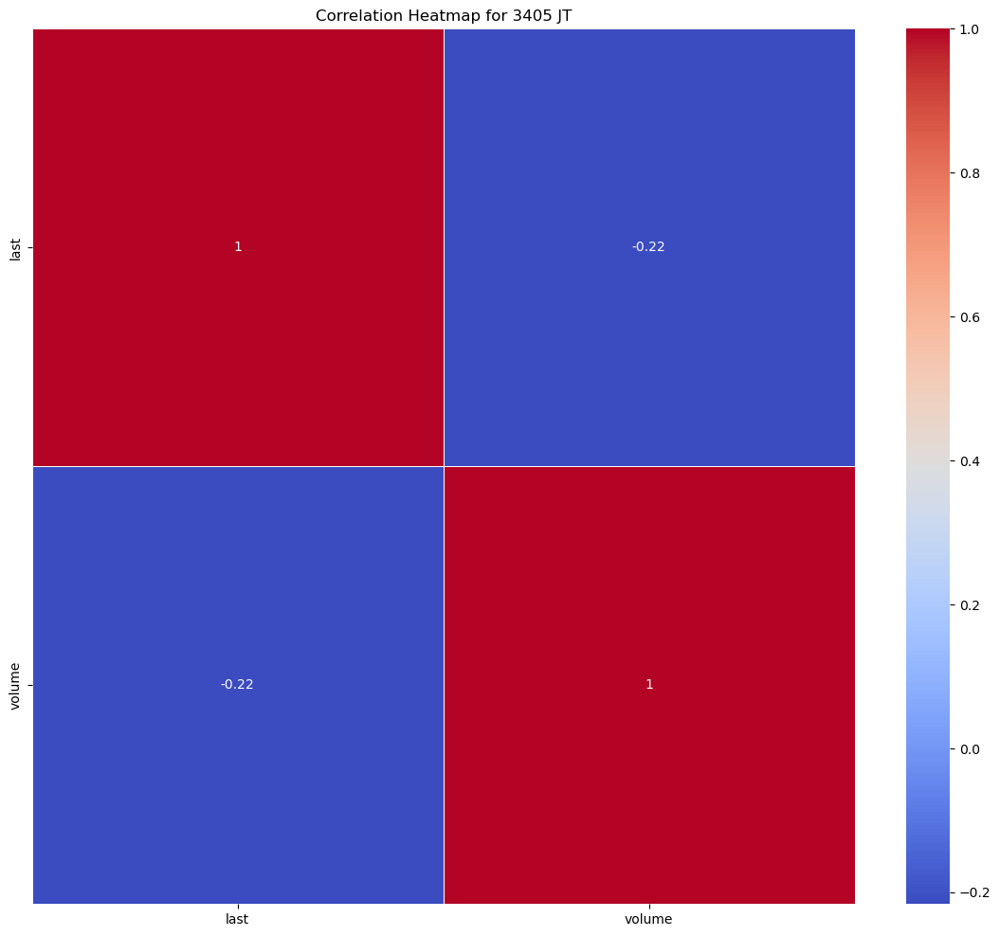

Statistics for stock 3407 JT
---- last ----
Mean: 909.6626810972568
Median: 912.8187
Mode: 546.2224
Range: 1215.0065
Standard Deviation: 264.71492990822344
Skewness: 0.2721933328668469
Kurtosis: -0.8203998637261525


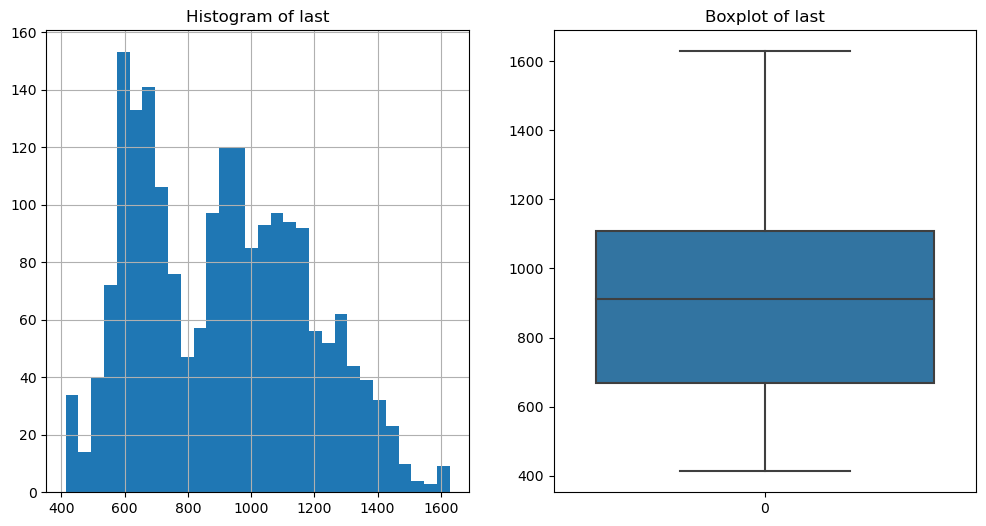

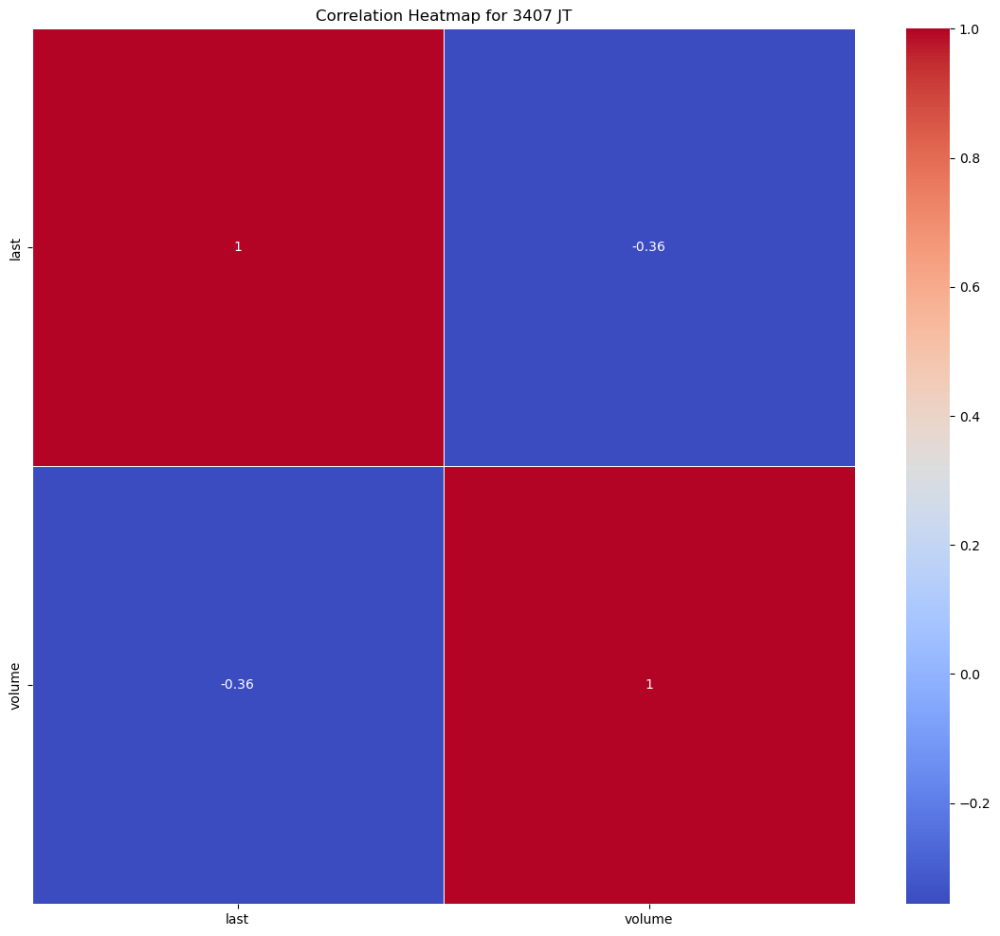

Statistics for stock 3436 JT
---- last ----
Mean: 1386.818505735661
Median: 1394.6291
Mode: 663.5616
Range: 2506.3526
Standard Deviation: 571.0522565890736
Skewness: 0.6308282264177805
Kurtosis: -0.2544760882455712


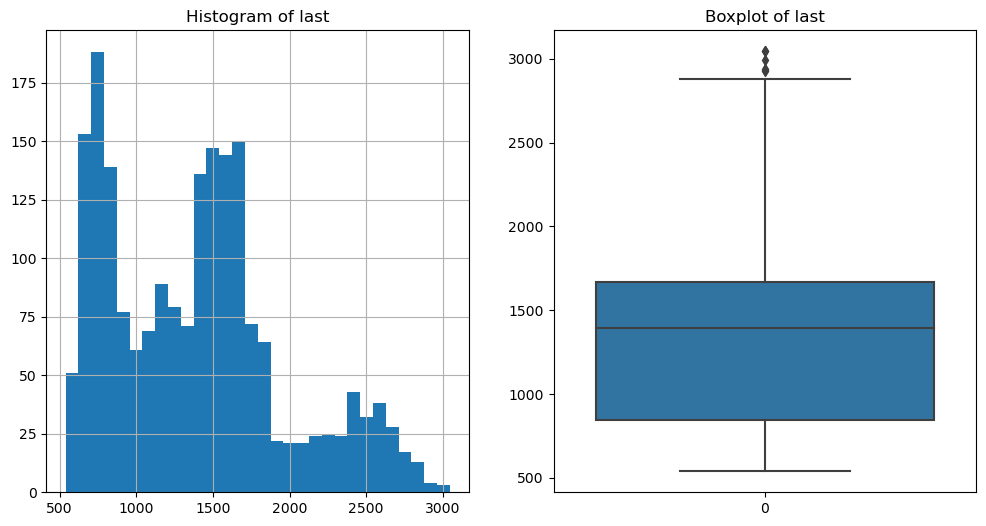

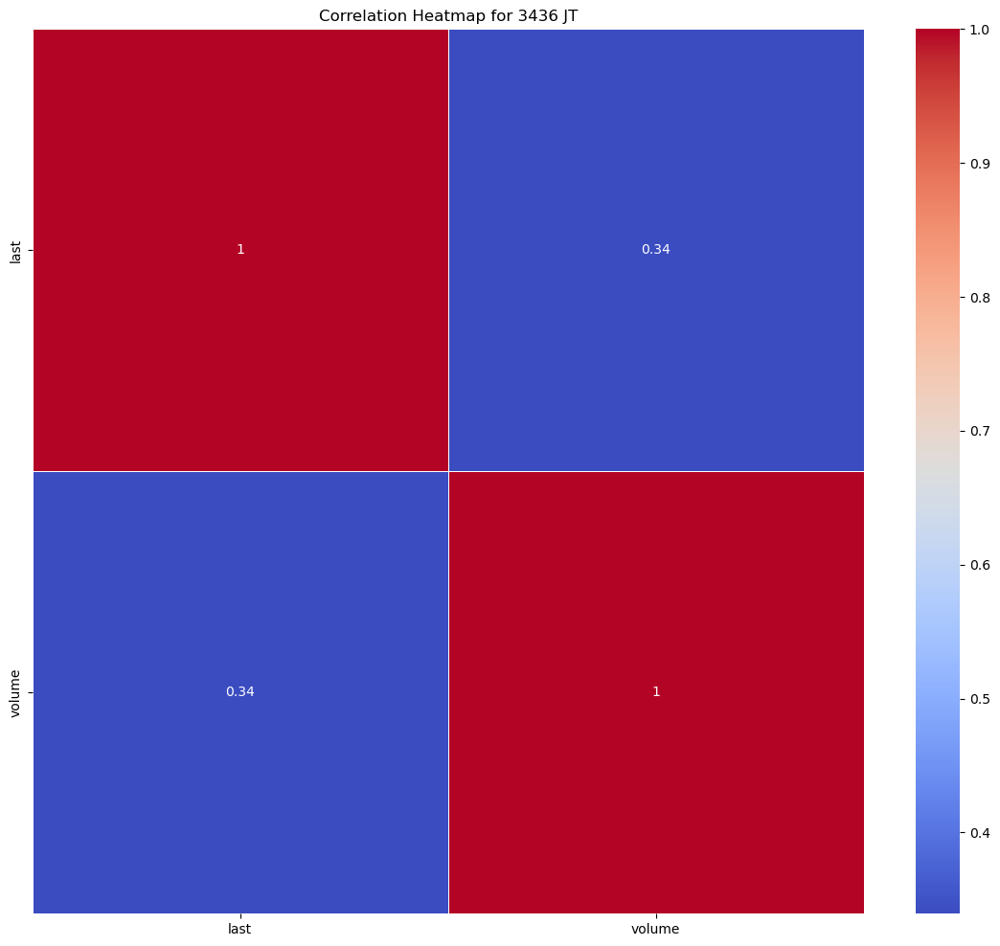

Statistics for stock 3861 JT
---- last ----
Mean: 492.2748657855361
Median: 480.7677
Mode: 367.4302
Range: 581.5554000000001
Standard Deviation: 120.00094876835097
Skewness: 0.30048917119423457
Kurtosis: -0.627733058827816


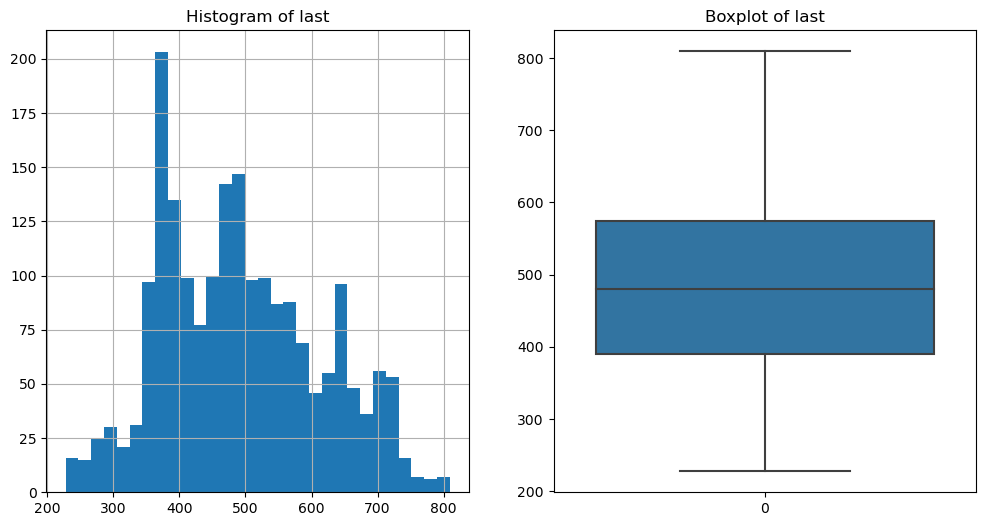

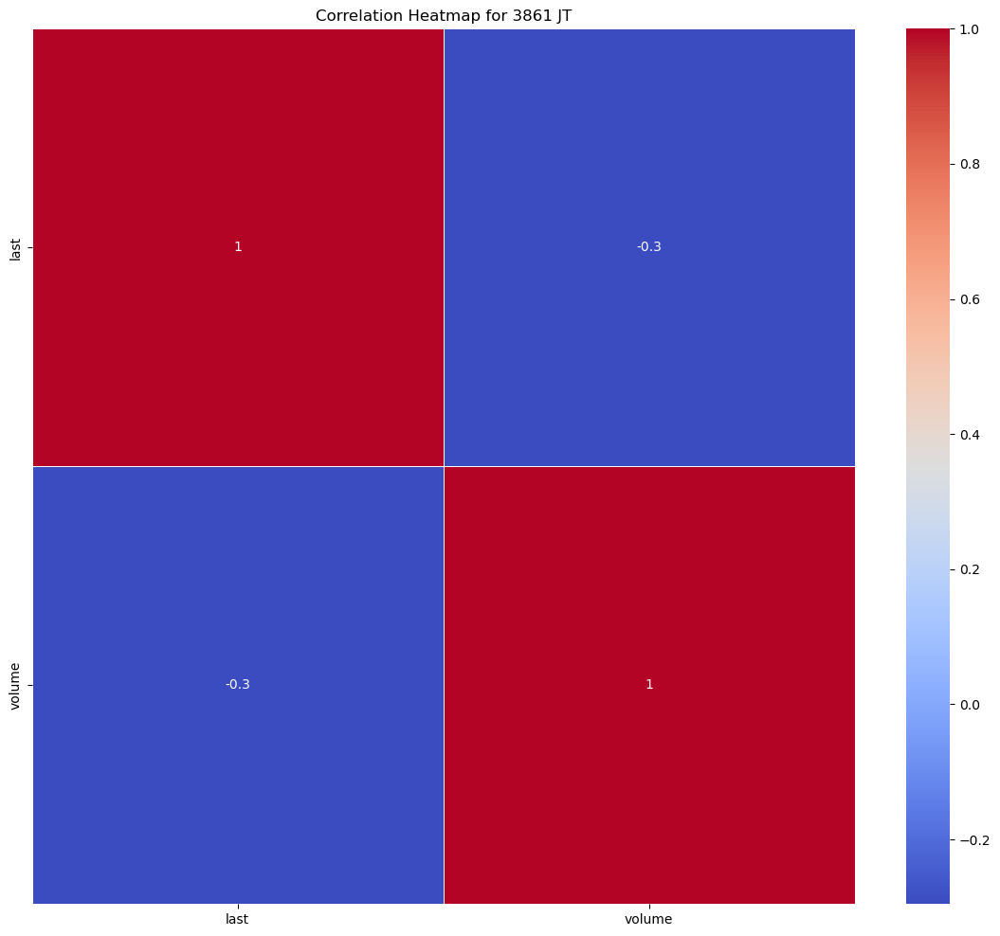

Statistics for stock 4004 JT
---- last ----
Mean: 2113.8631346134666
Median: 1609.7033
Mode: 1312.5629
Range: 4989.0686
Standard Deviation: 1133.3875367167875
Skewness: 0.980870997364587
Kurtosis: -0.10567572769995737


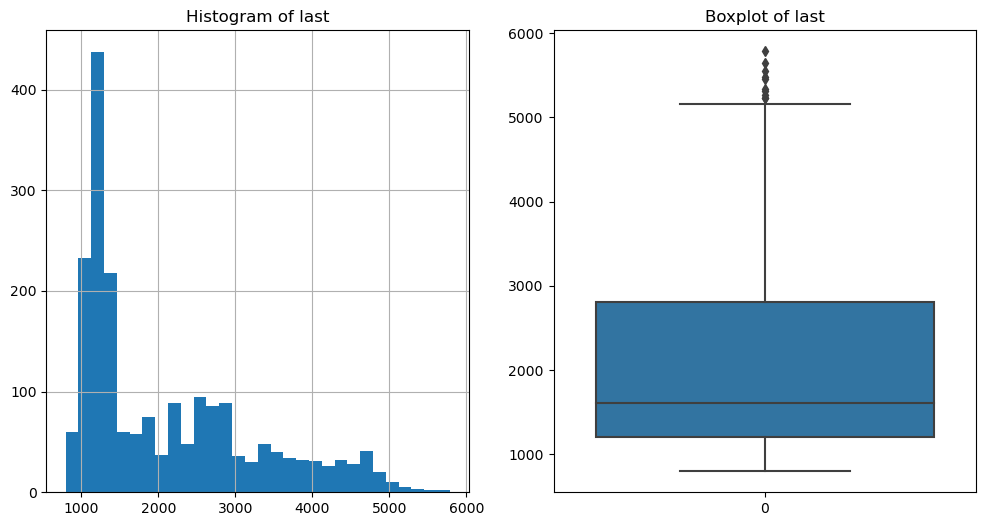

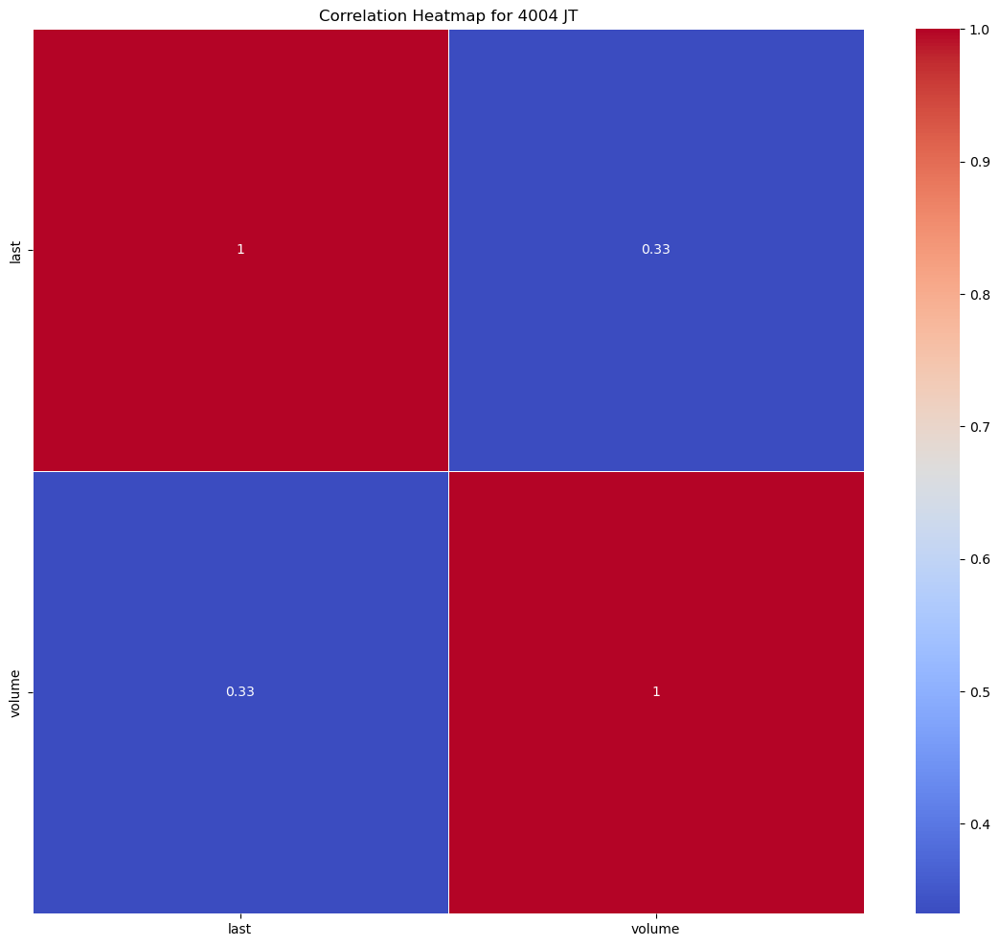

Statistics for stock 4005 JT
---- last ----
Mean: 448.1477124688279
Median: 457.295
Mode: 313.8717
Range: 584.9494
Standard Deviation: 123.39701362141479
Skewness: 0.10213546152267594
Kurtosis: -0.6936825731368144


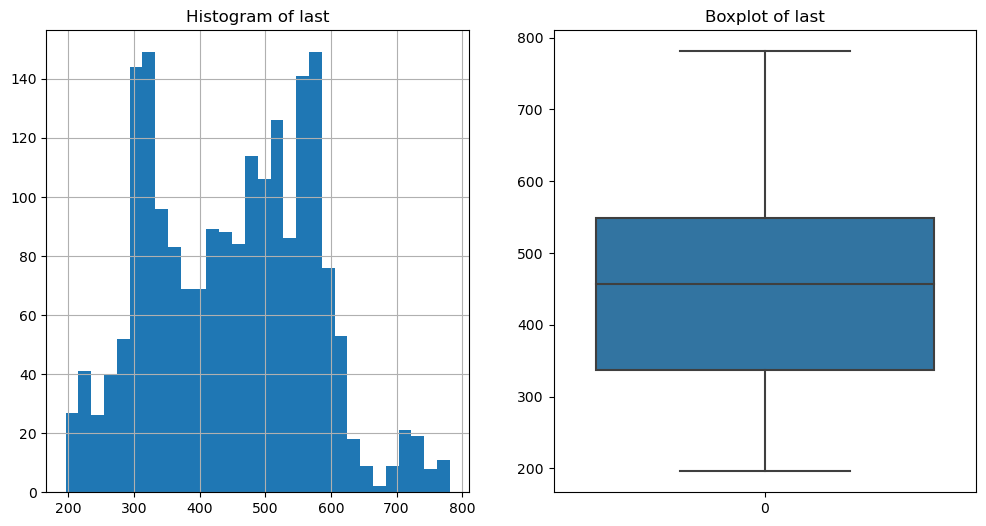

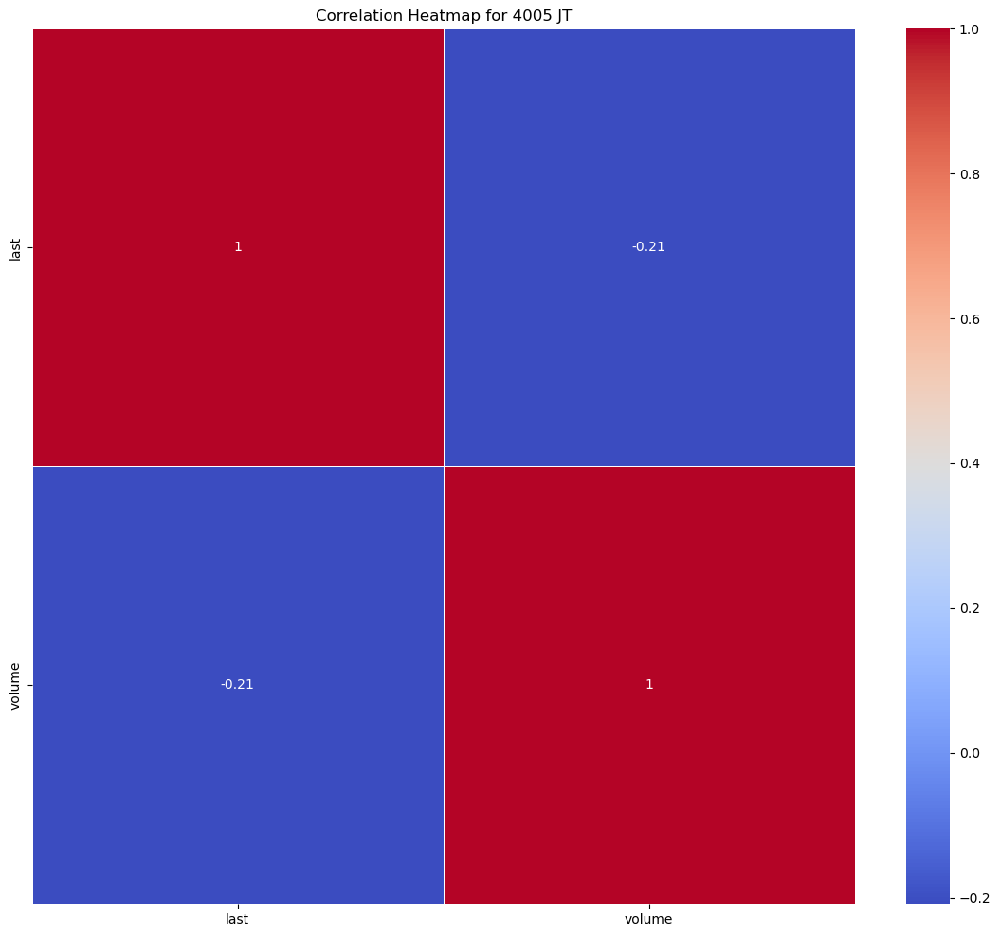

Statistics for stock 4021 JT
---- last ----
Mean: 3368.011037107232
Median: 3415.969
Mode: 2823.4538
Range: 5583.0889
Standard Deviation: 1545.1777339054845
Skewness: 0.10322193597509777
Kurtosis: -1.1686144114476373


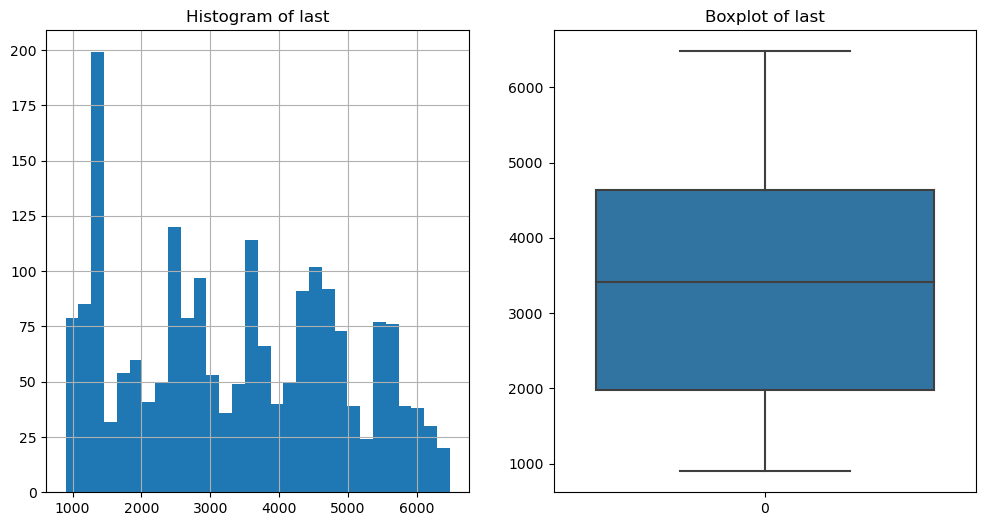

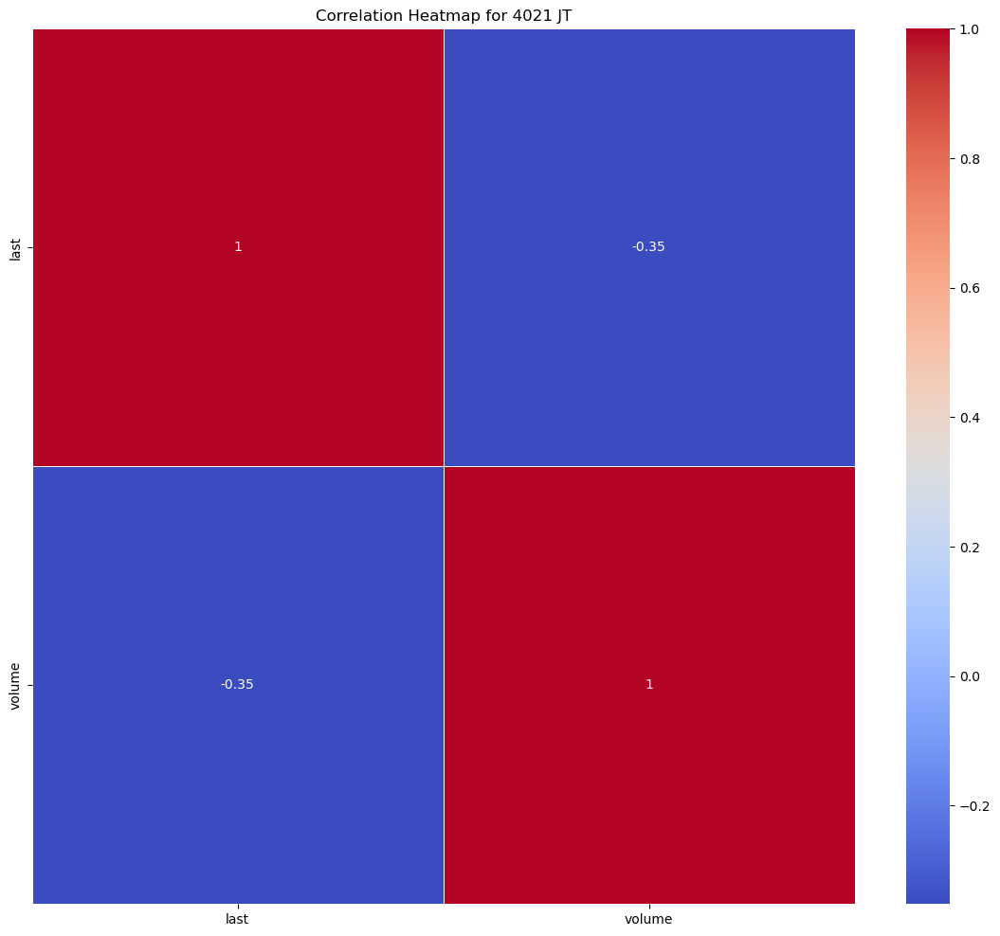

Statistics for stock 4042 JT
---- last ----
Mean: 1275.5692165087282
Median: 1303.0412
Mode: 589.9257
Range: 2086.5793
Standard Deviation: 501.5399656207046
Skewness: 0.18727377138754106
Kurtosis: -0.8005708777278748


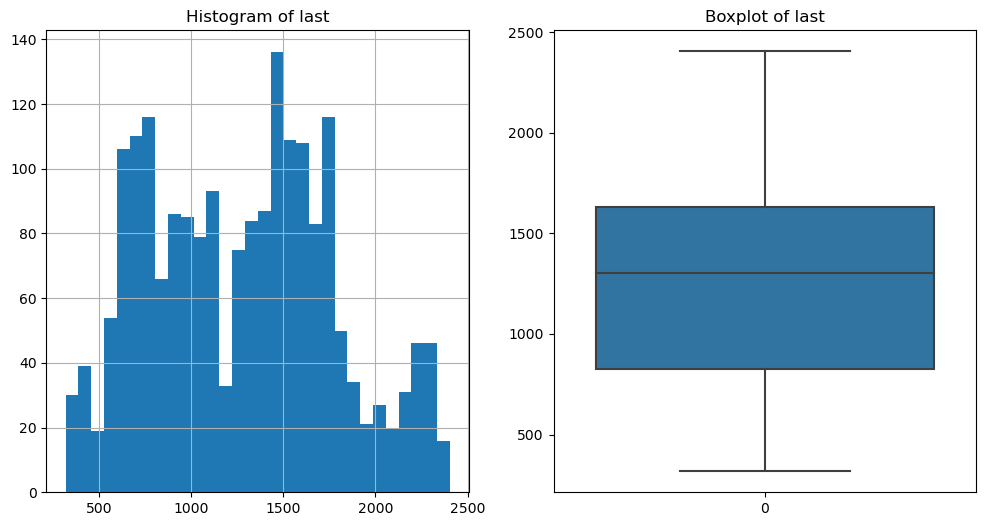

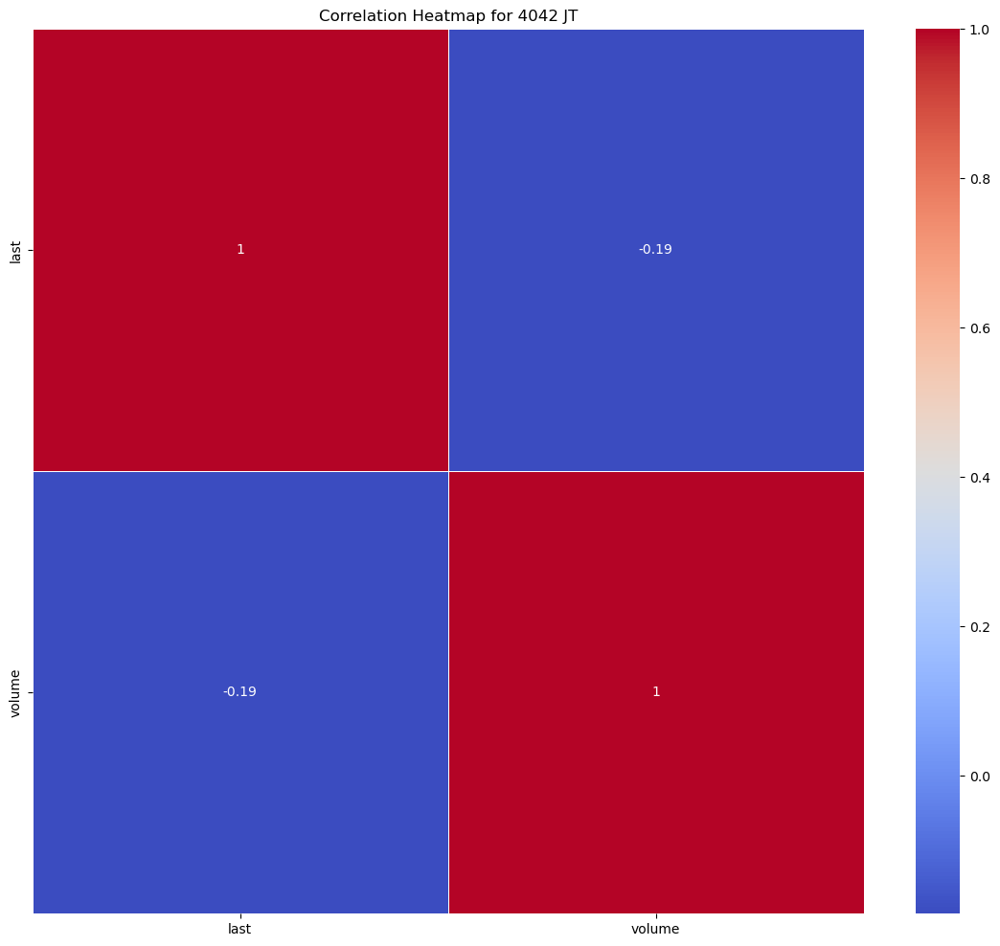

Statistics for stock 4043 JT
---- last ----
Mean: 2032.6399388029927
Median: 2131.0528
Mode: 1228.3798
Range: 3253.2824
Standard Deviation: 736.3098068049035
Skewness: 0.07762347229012877
Kurtosis: -0.9632966715232425


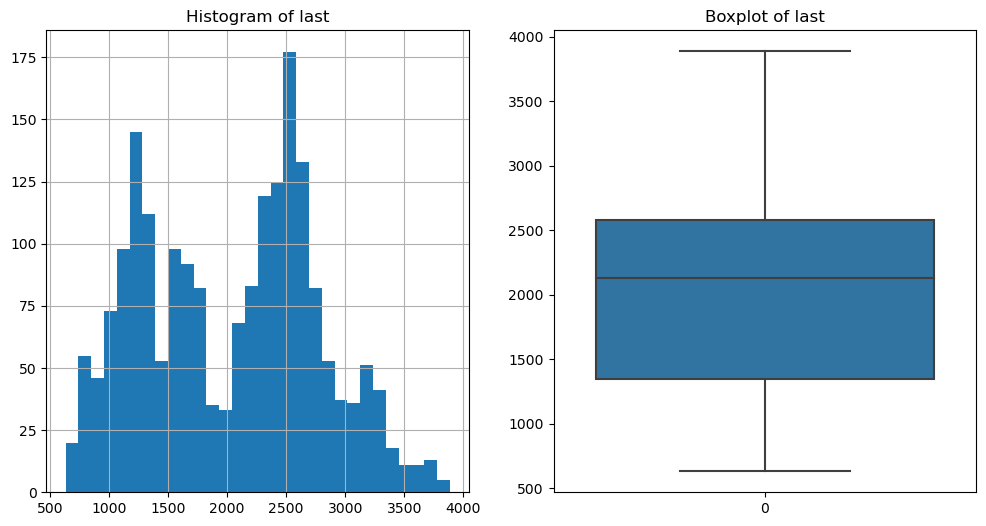

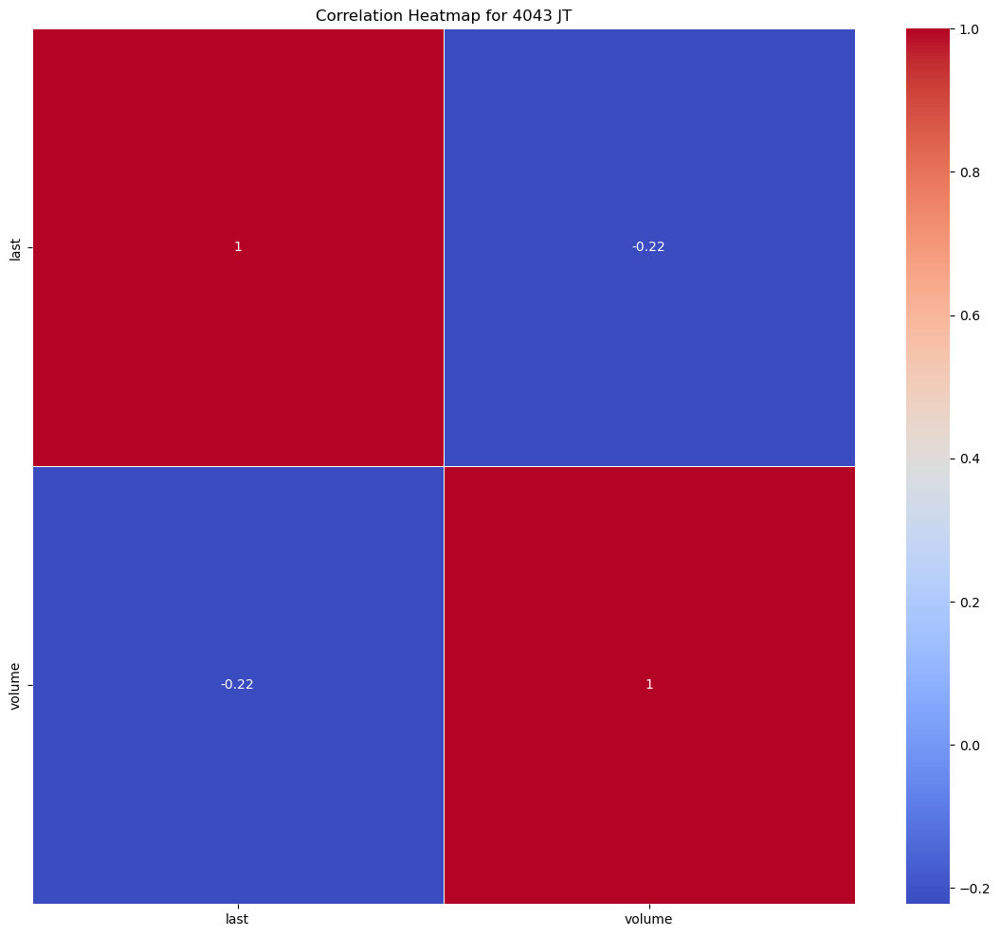

Statistics for stock 4061 JT
---- last ----
Mean: 2453.5089005486284
Median: 2375.3935
Mode: 1421.4184
Range: 3328.0847000000003
Standard Deviation: 793.9668658082521
Skewness: 0.3038363504302449
Kurtosis: -0.9253662923501262


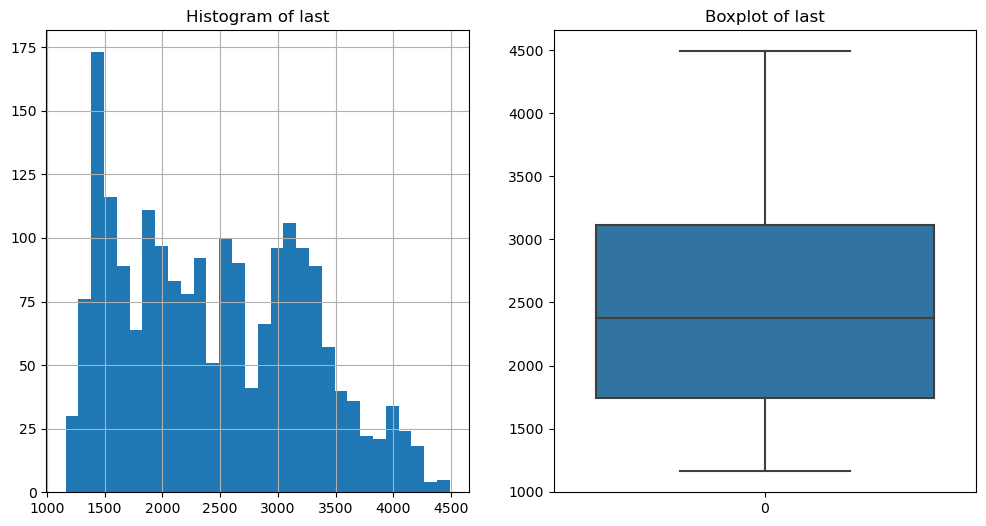

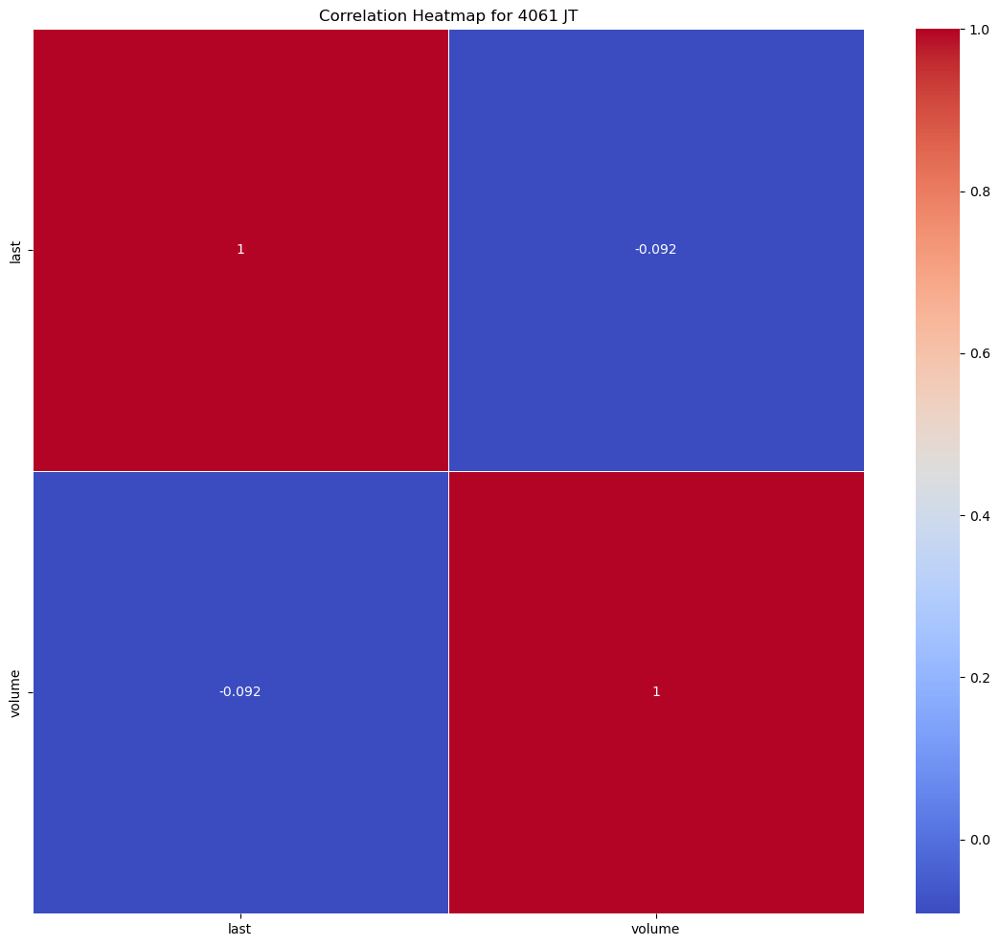

Statistics for stock 4063 JT
---- last ----
Mean: 8637.533668428927
Median: 8619.2688
Mode: 5480.7938
Range: 15030.334200000001
Standard Deviation: 3162.3433105484237
Skewness: 1.0566599964438386
Kurtosis: 1.0413882616082706


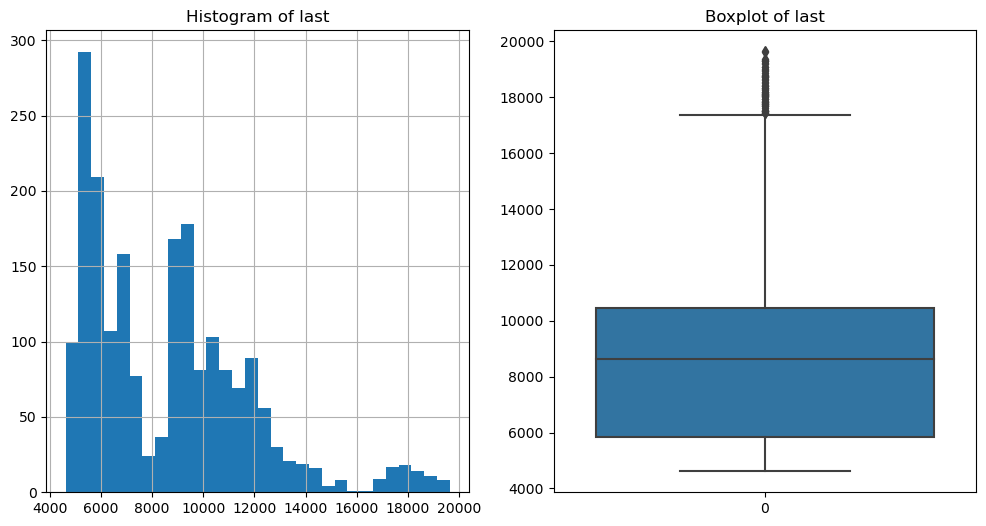

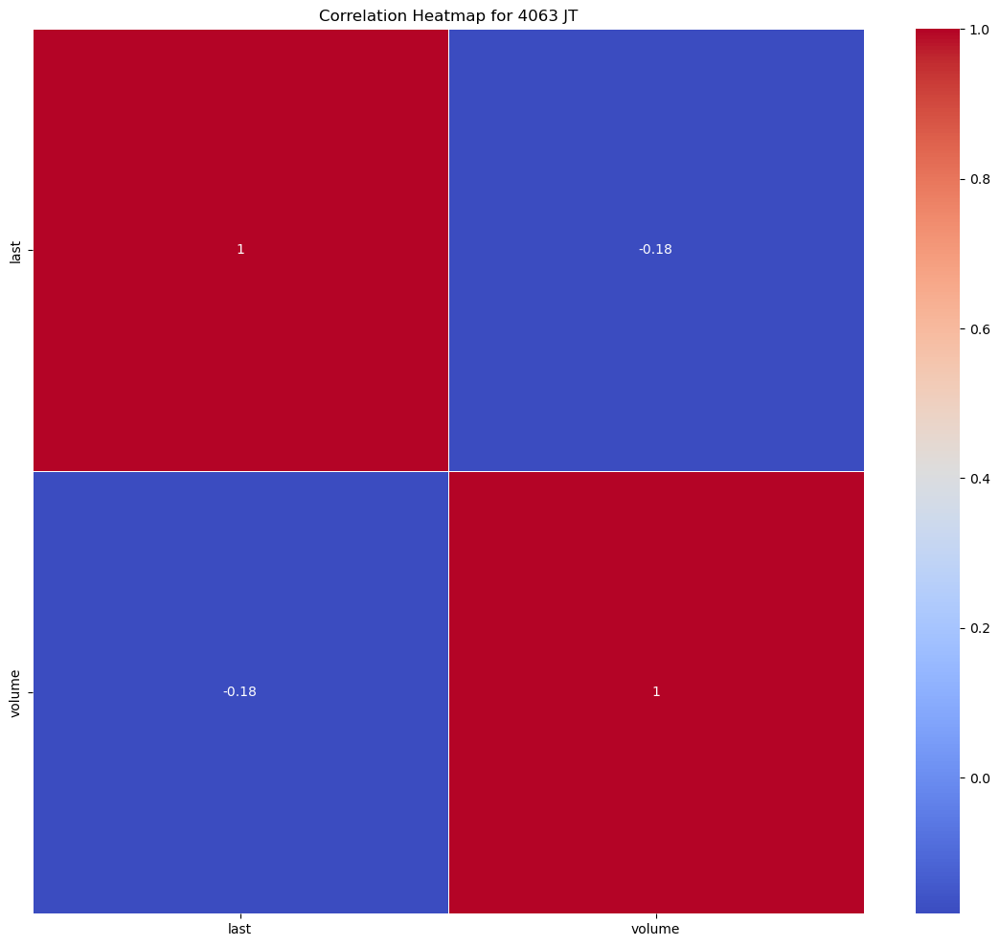

Statistics for stock 4151 JT
---- last ----
Mean: 1758.1110130174563
Median: 1787.6457
Mode: 761.0769
Range: 2541.0108
Standard Deviation: 575.5342625766135
Skewness: 0.27012985429451536
Kurtosis: -0.5392598450532677


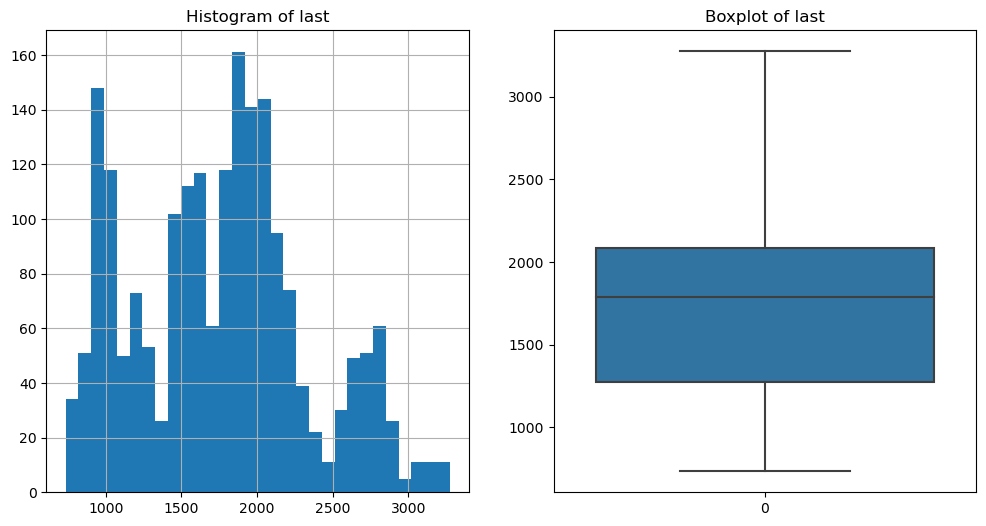

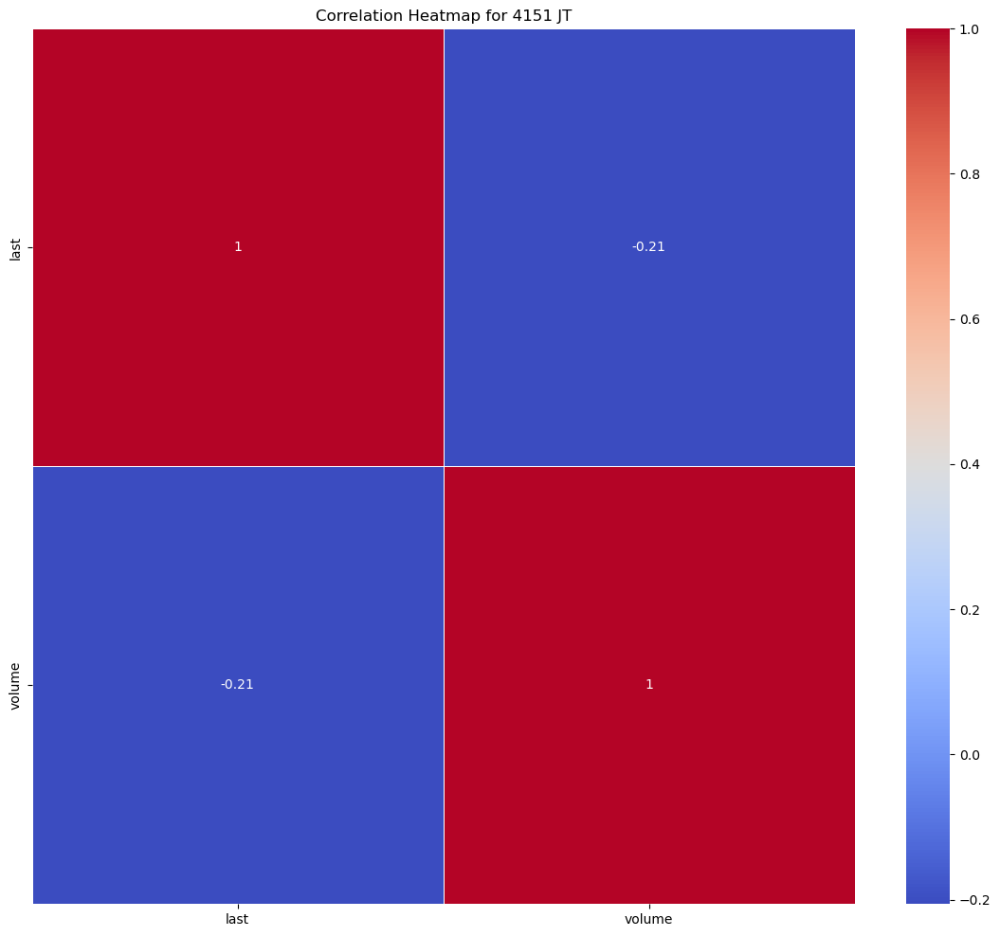

Statistics for stock 4183 JT
---- last ----
Mean: 2043.97908159601
Median: 2175.6384
Mode: 1053.7755
Range: 2935.2795
Standard Deviation: 700.5753442197051
Skewness: -0.13432391732177243
Kurtosis: -1.041016813074844


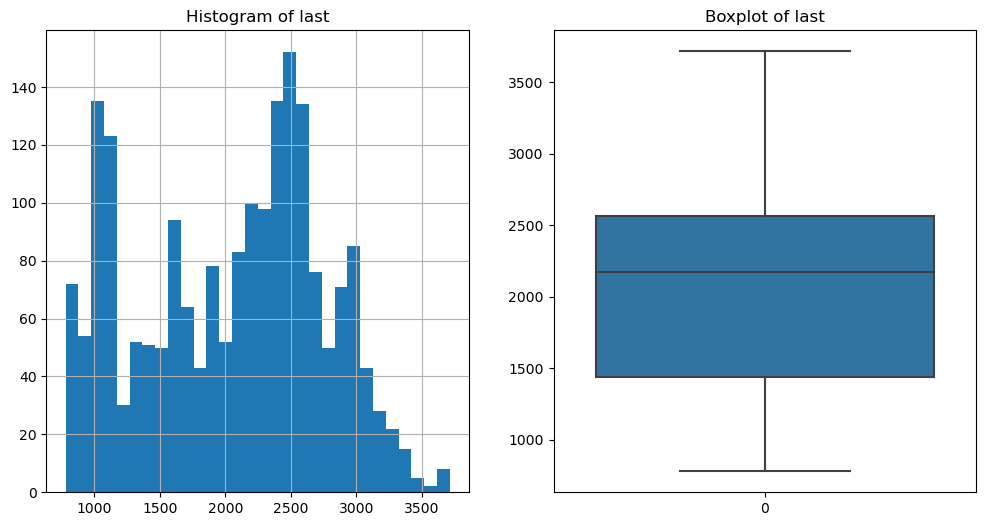

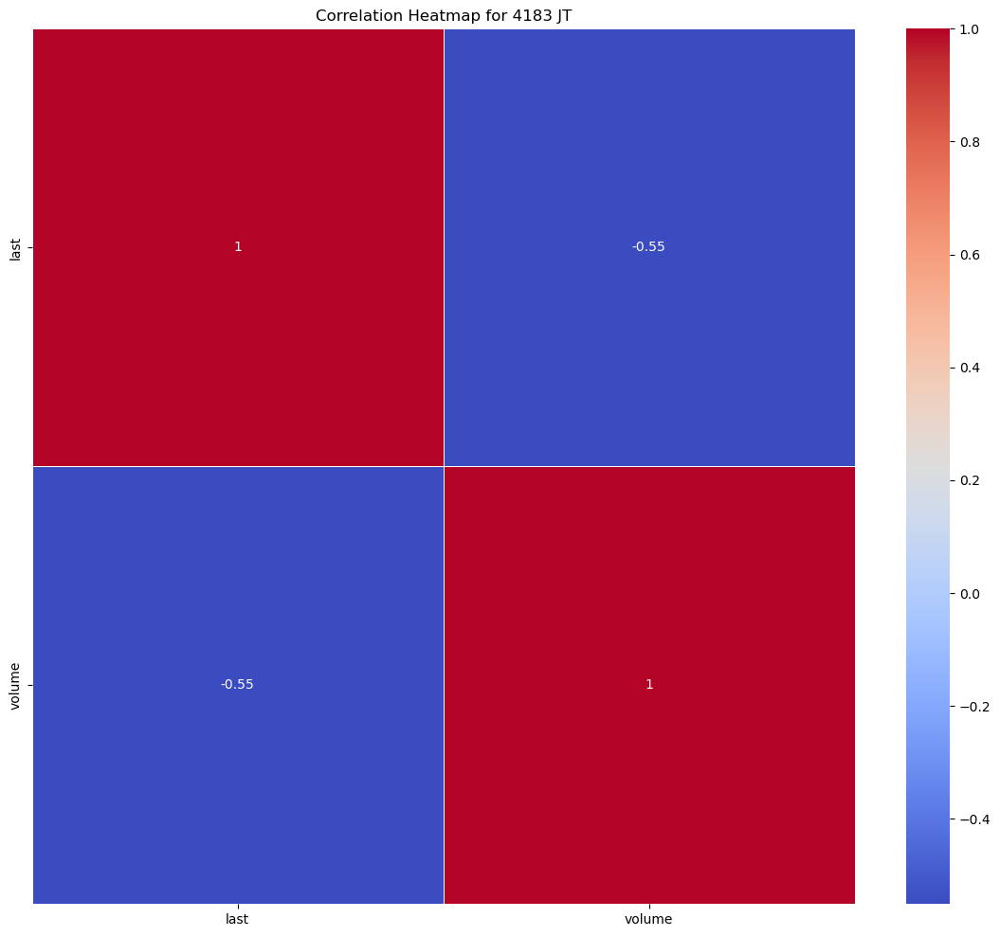

Statistics for stock 4188 JT
---- last ----
Mean: 629.6435629925187
Median: 624.5
Mode: 343.5513
Range: 841.2432999999999
Standard Deviation: 198.10085241840062
Skewness: 0.25452809309062635
Kurtosis: -0.6980632894020102


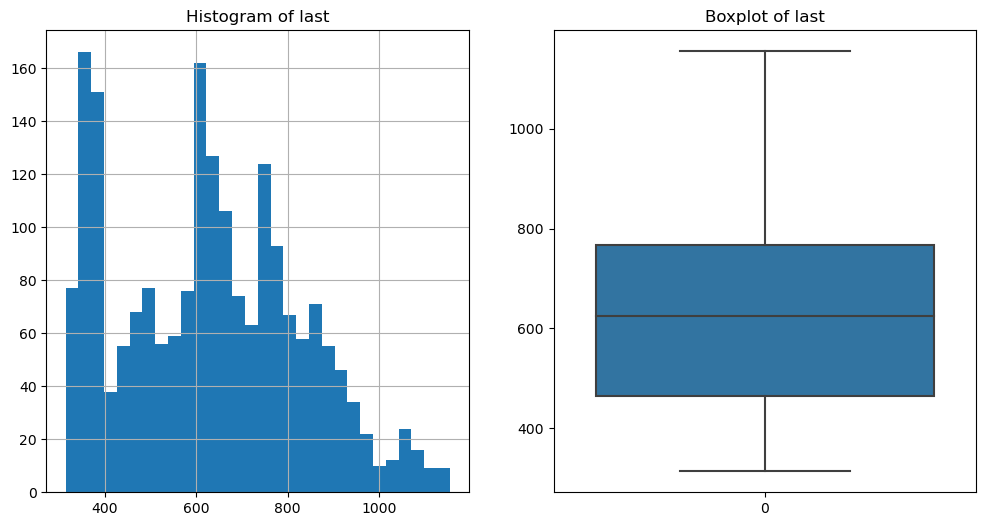

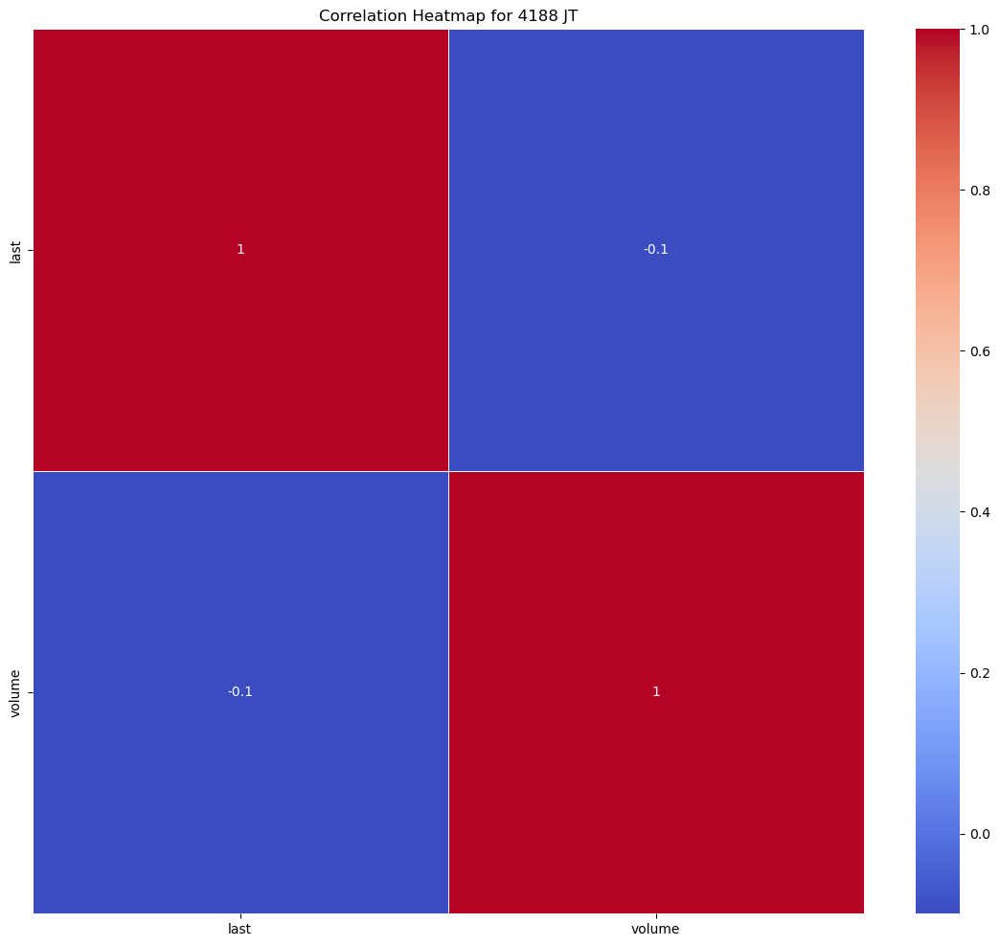

Statistics for stock 4208 JT
---- last ----
Mean: 1969.8210410473814
Median: 1870.857
Mode: 1447.4411
Range: 1909.3842
Standard Deviation: 456.1505329600862
Skewness: 0.6632426862660813
Kurtosis: -0.5067657182492051


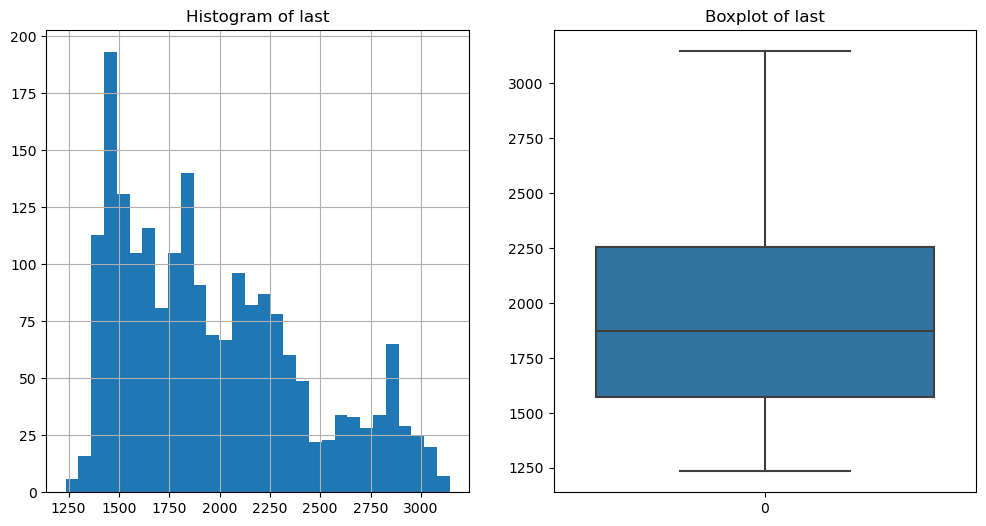

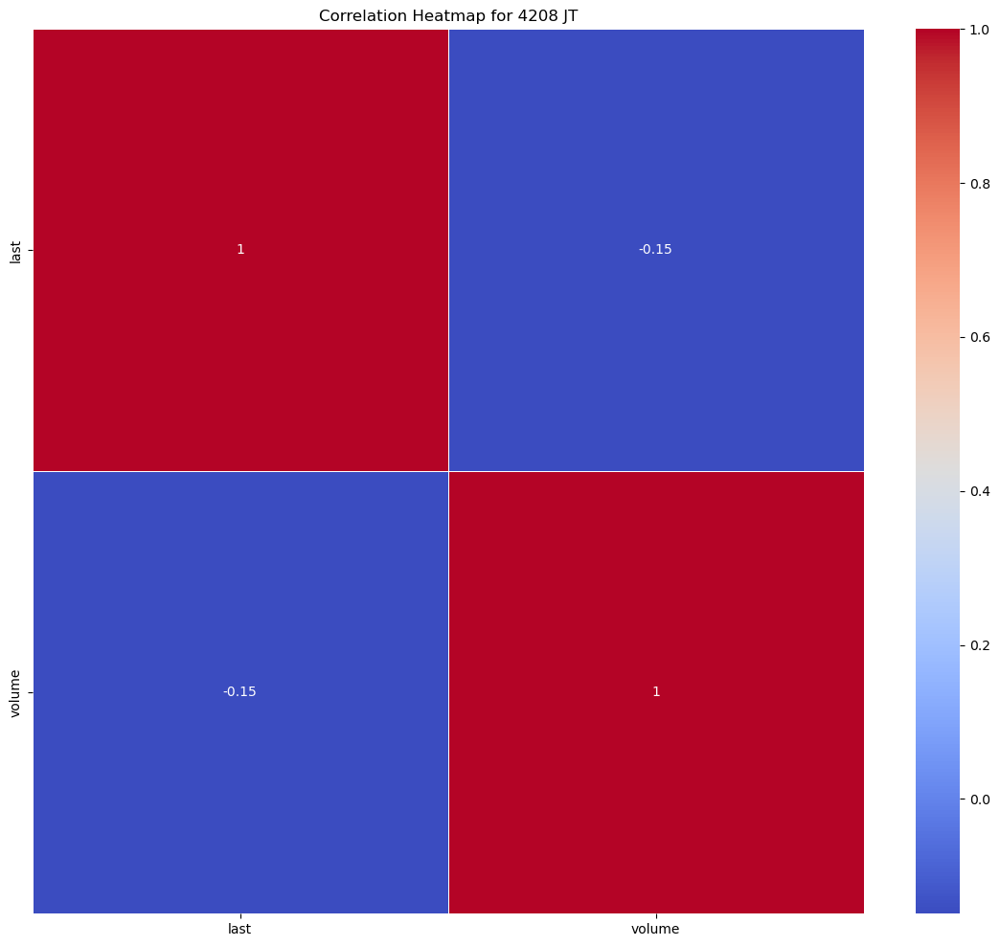

Statistics for stock 4324 JT
---- last ----
Mean: 4153.783106334165
Median: 4318.4754
Mode: 3017.1878
Range: 4539.5373
Standard Deviation: 1005.5136192340334
Skewness: -0.10353896619651247
Kurtosis: -0.7029900942883183


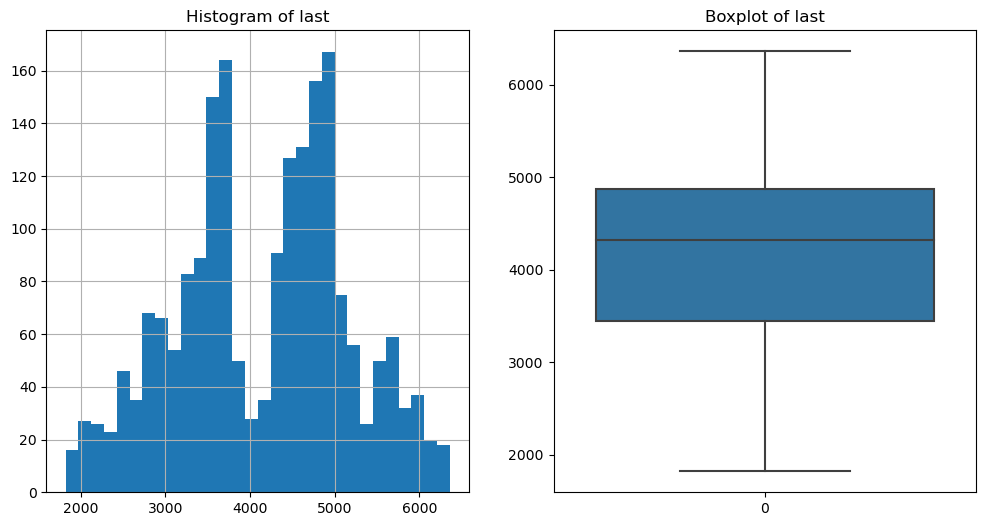

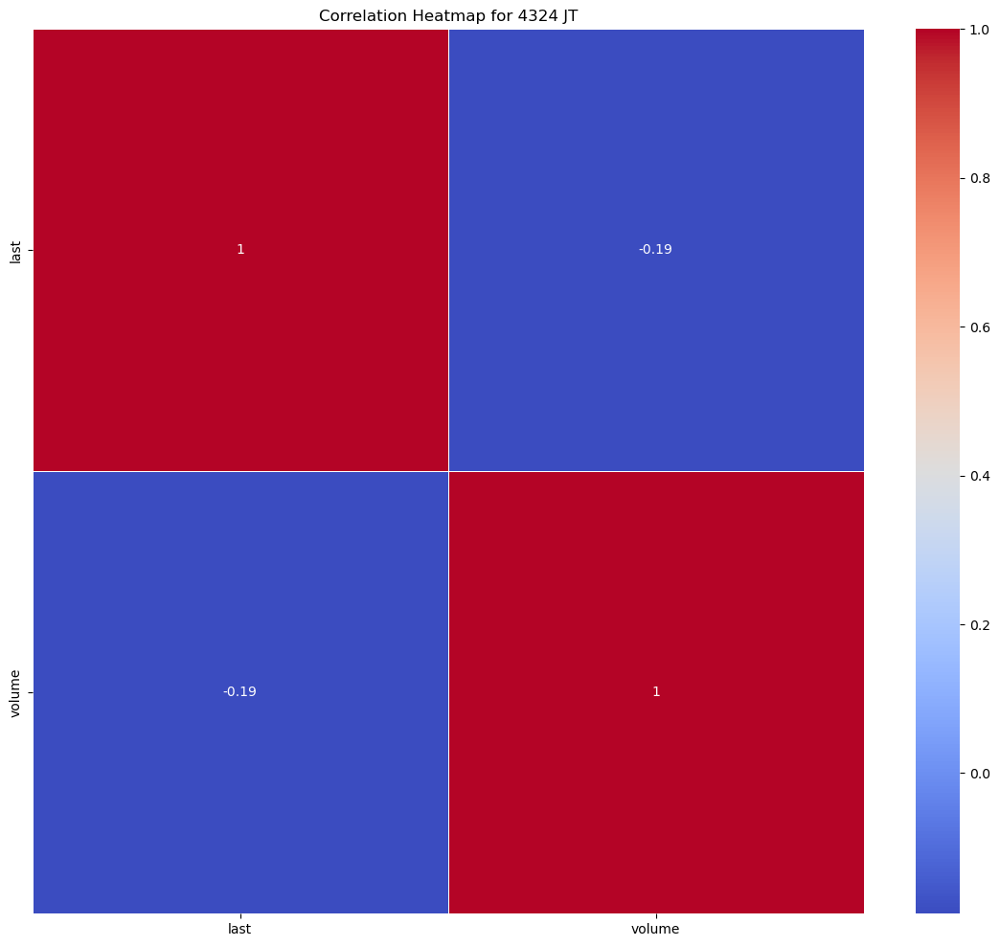

Statistics for stock 4452 JT
---- last ----
Mean: 5932.012362543641
Median: 5730.6646
Mode: 2765.3782
Range: 7051.7363000000005
Standard Deviation: 1952.661015179414
Skewness: -0.25956799699887273
Kurtosis: -1.1869719058598367


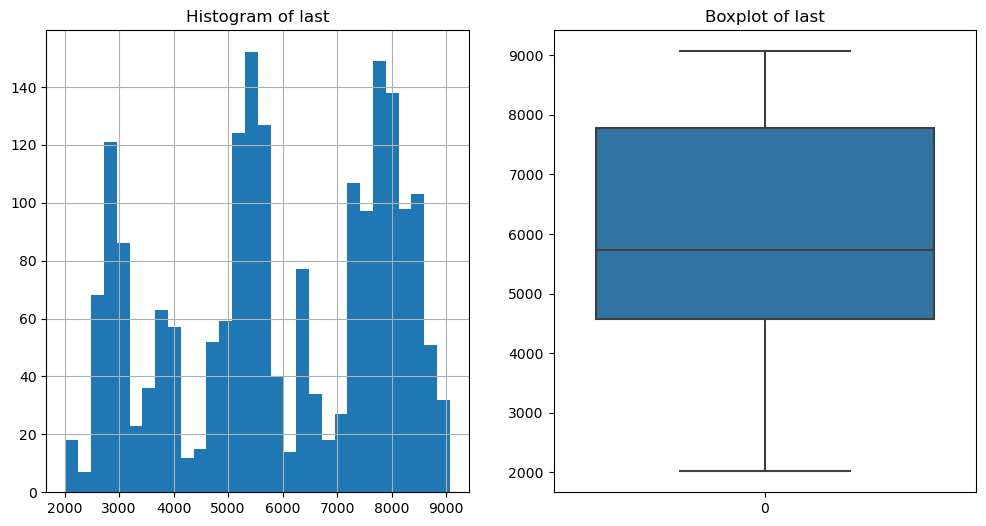

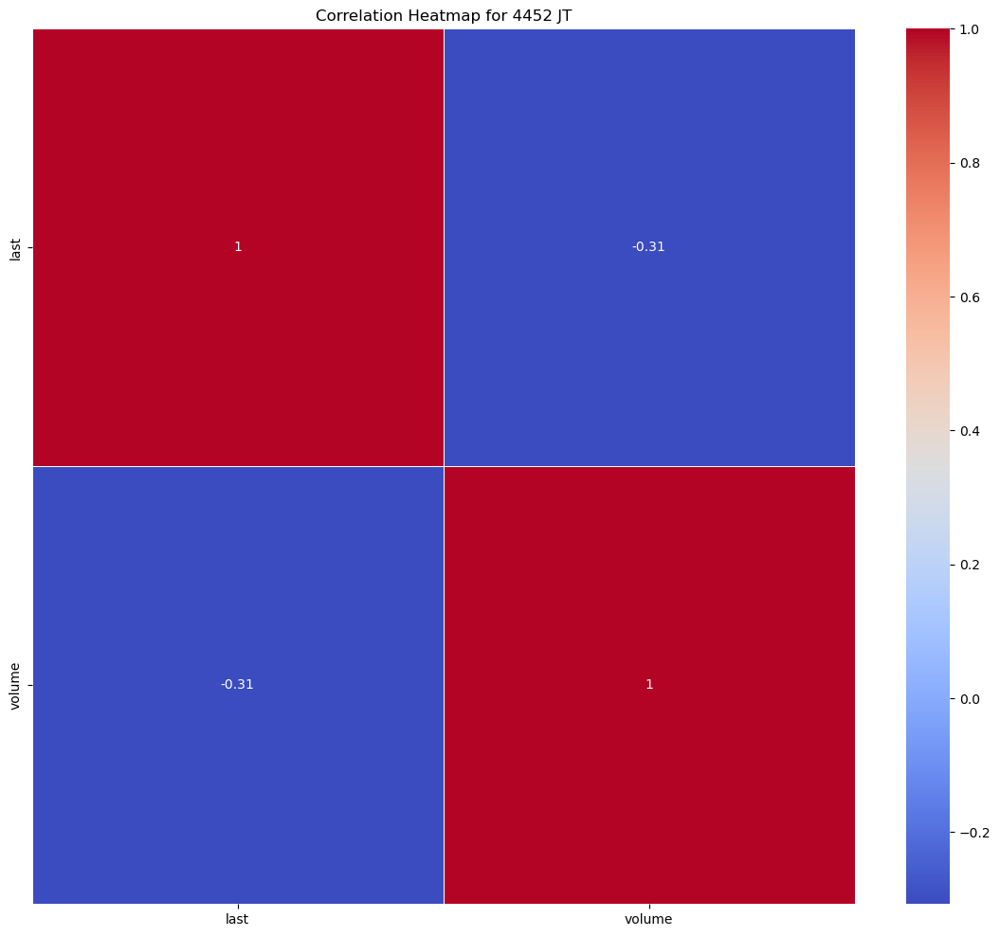

Statistics for stock 4502 JT
---- last ----
Mean: 4139.194553765586
Median: 3992.1328
Mode: 3611.9649
Range: 3108.4557
Standard Deviation: 604.3571253162307
Skewness: 0.7494346051672744
Kurtosis: -0.23441235933667137


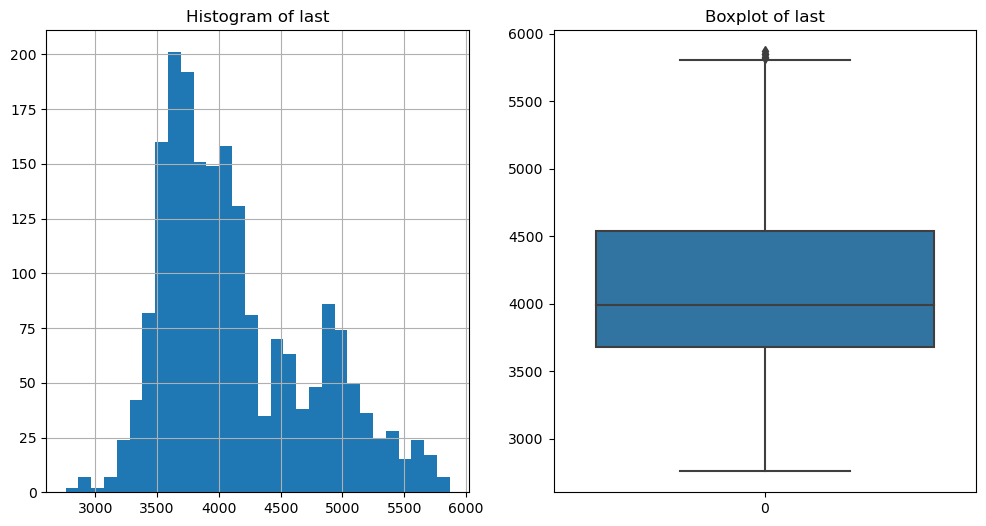

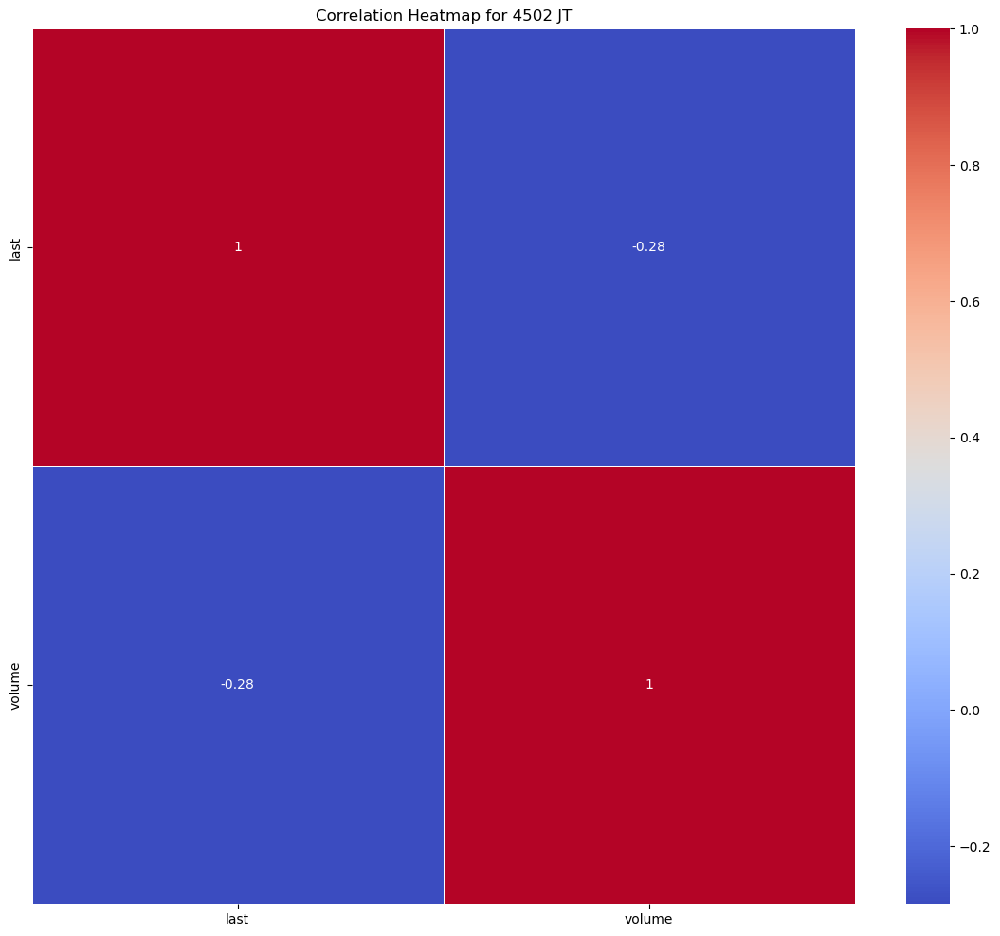

Statistics for stock 4503 JT
---- last ----
Mean: 1420.0353195511223
Median: 1451.2054
Mode: 919.8037
Range: 1270.2926
Standard Deviation: 269.2816864715684
Skewness: -0.6401201304174298
Kurtosis: -0.181476027347788


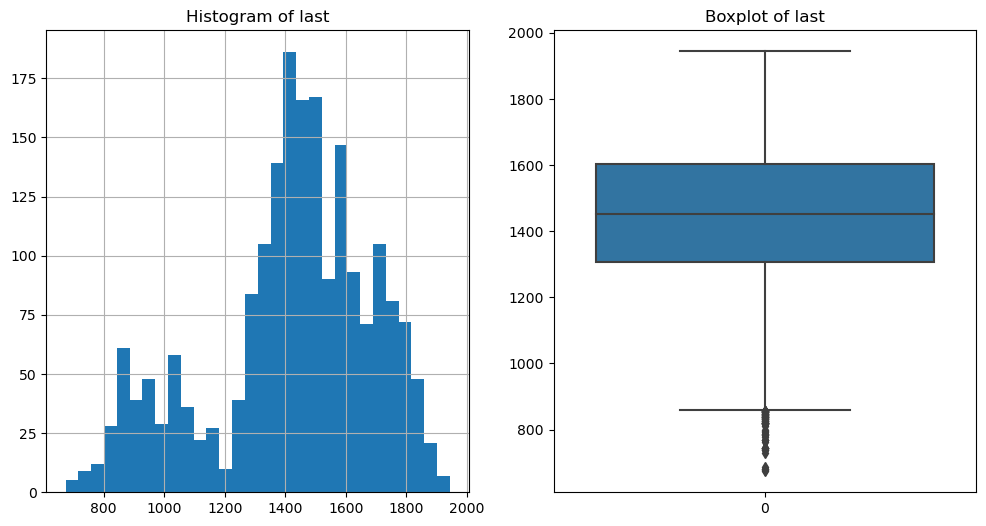

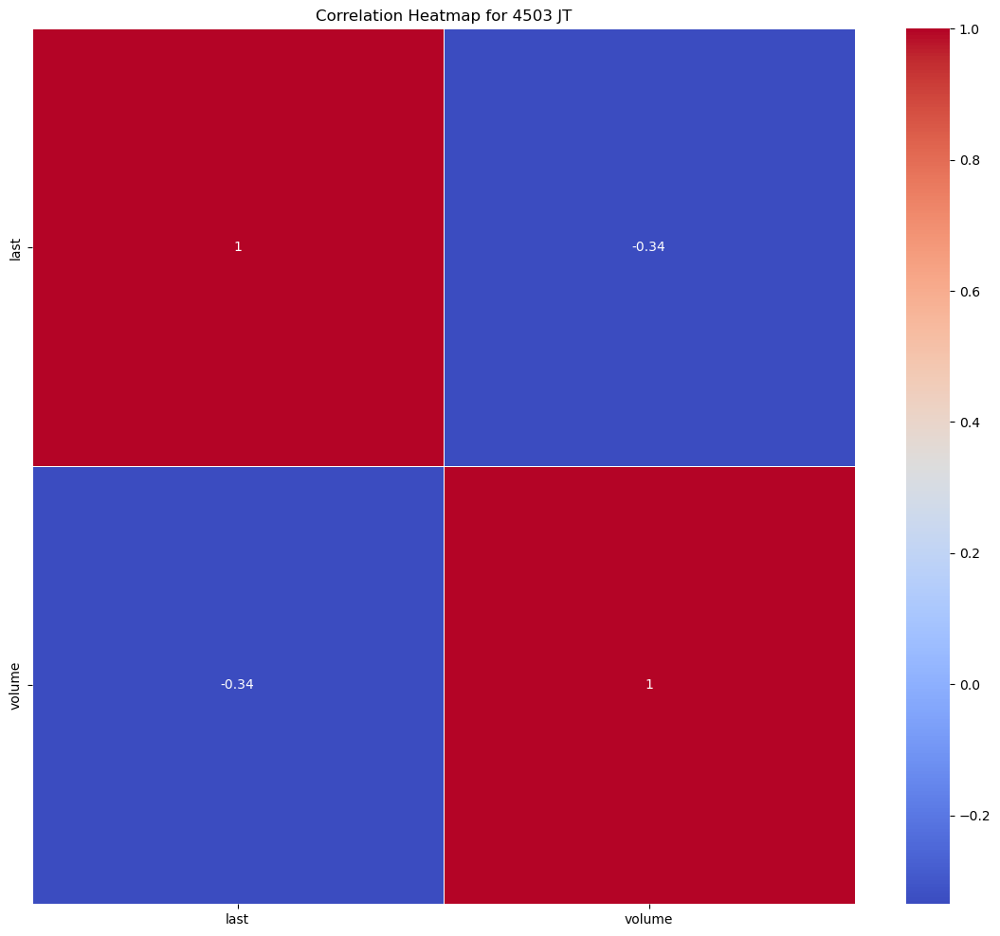

Statistics for stock 4506 JT
---- last ----
Mean: 1610.157376708229
Median: 1487.4581
Mode: 1238.1194
Range: 2955.2708000000002
Standard Deviation: 476.97530388640365
Skewness: 1.7913087374054988
Kurtosis: 4.246888899984709


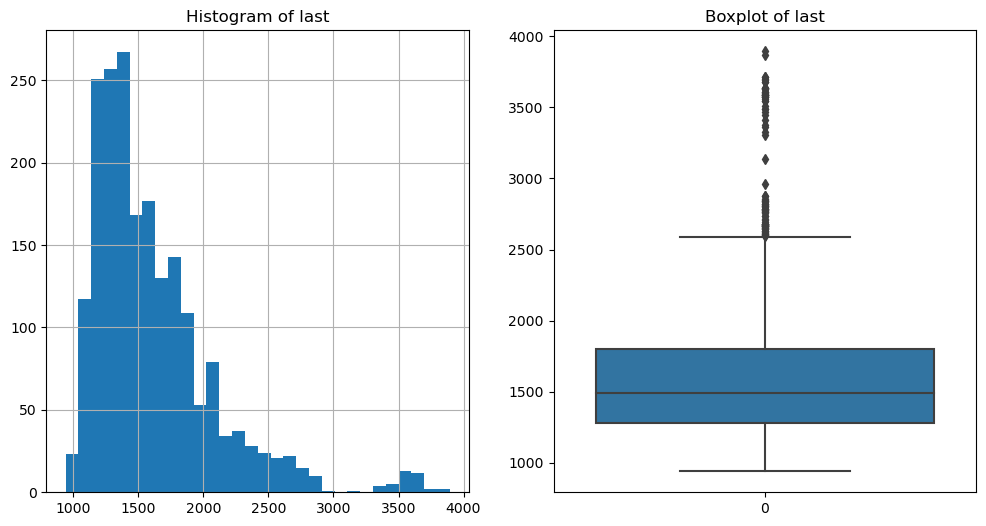

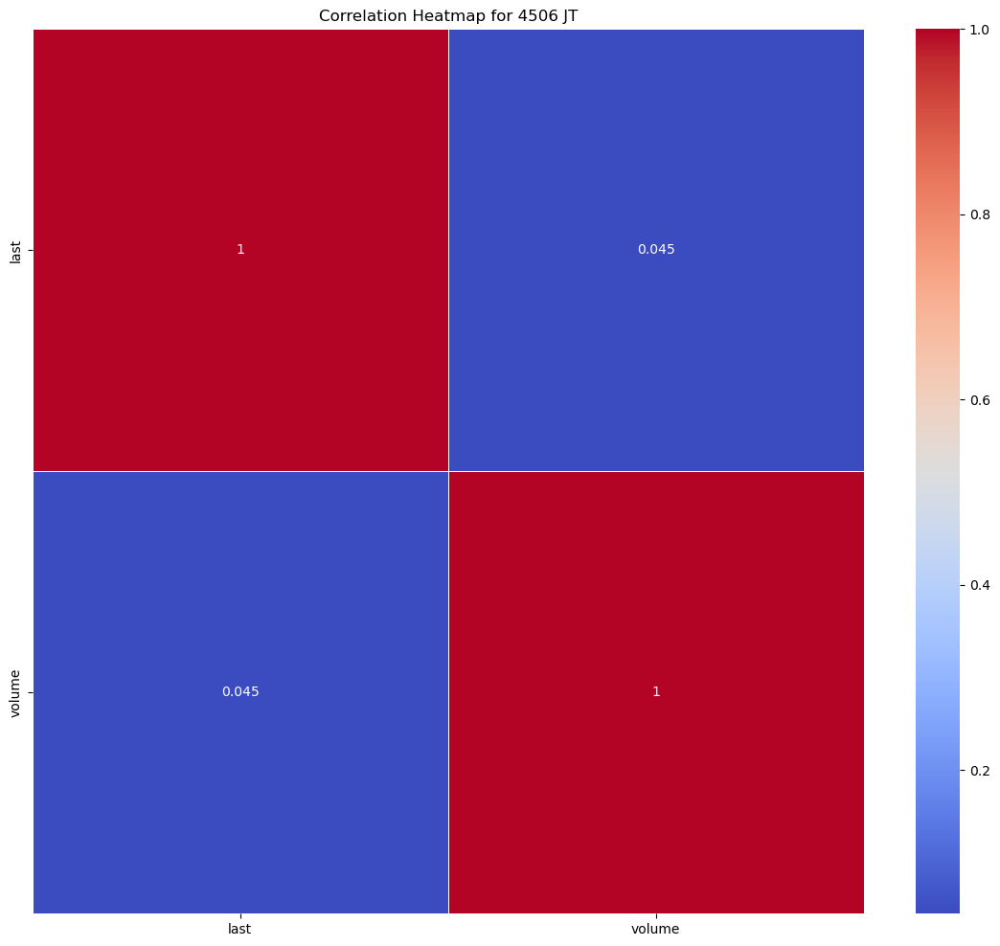

Statistics for stock 4507 JT
---- last ----
Mean: 4597.682690024938
Median: 5233.2343
Mode: 1706.1864
Range: 6198.1183
Standard Deviation: 1686.0568859944842
Skewness: -0.6526174566731152
Kurtosis: -0.9709839759243022


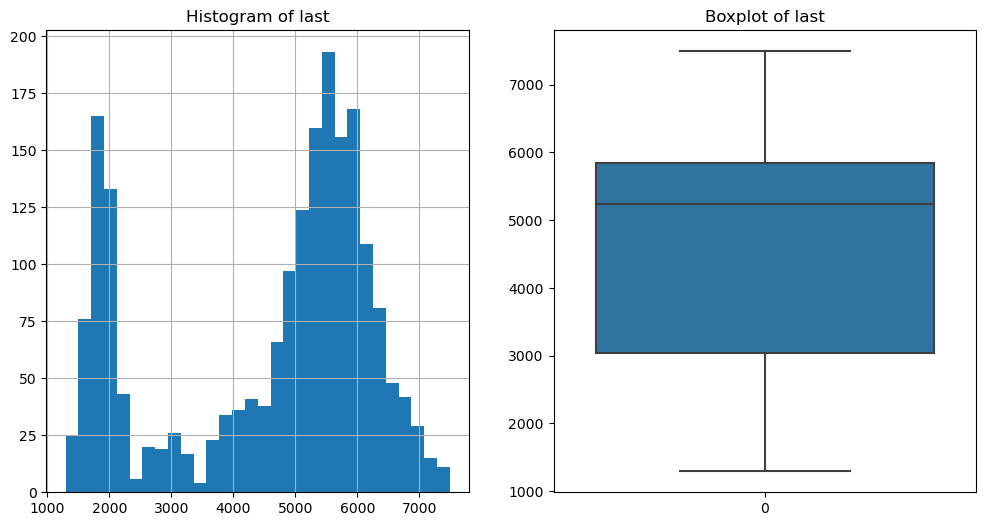

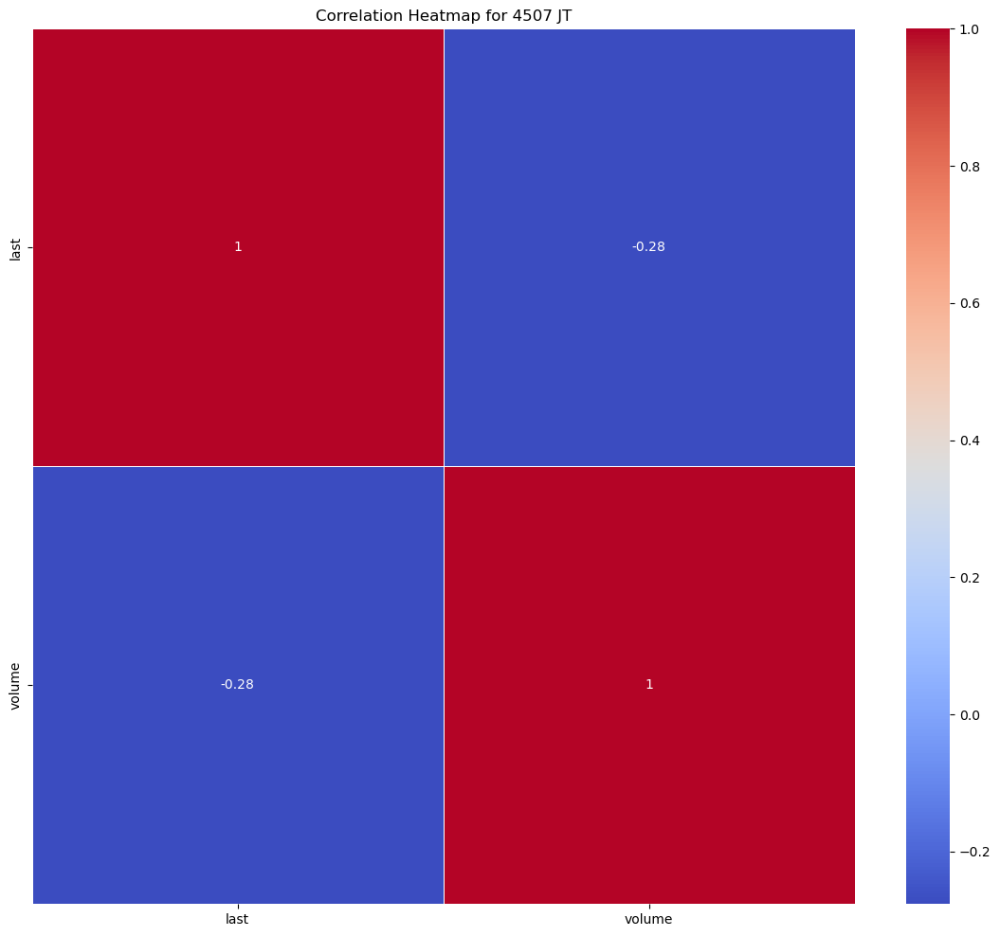

Statistics for stock 4519 JT
---- last ----
Mean: 1870.5631639401497
Median: 1311.1881
Mode: 1848.2151
Range: 5398.6563
Standard Deviation: 1318.7045684764755
Skewness: 1.425411046670363
Kurtosis: 1.0332611401833462


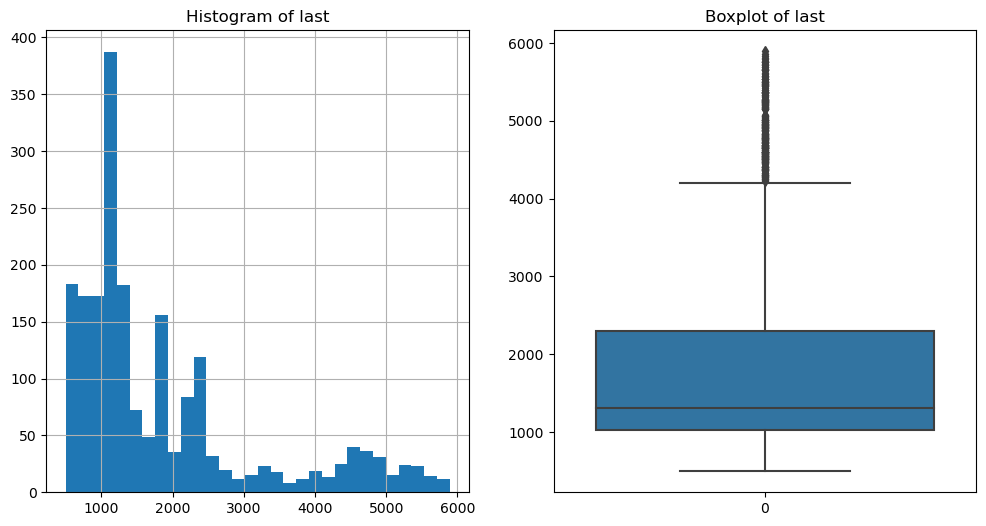

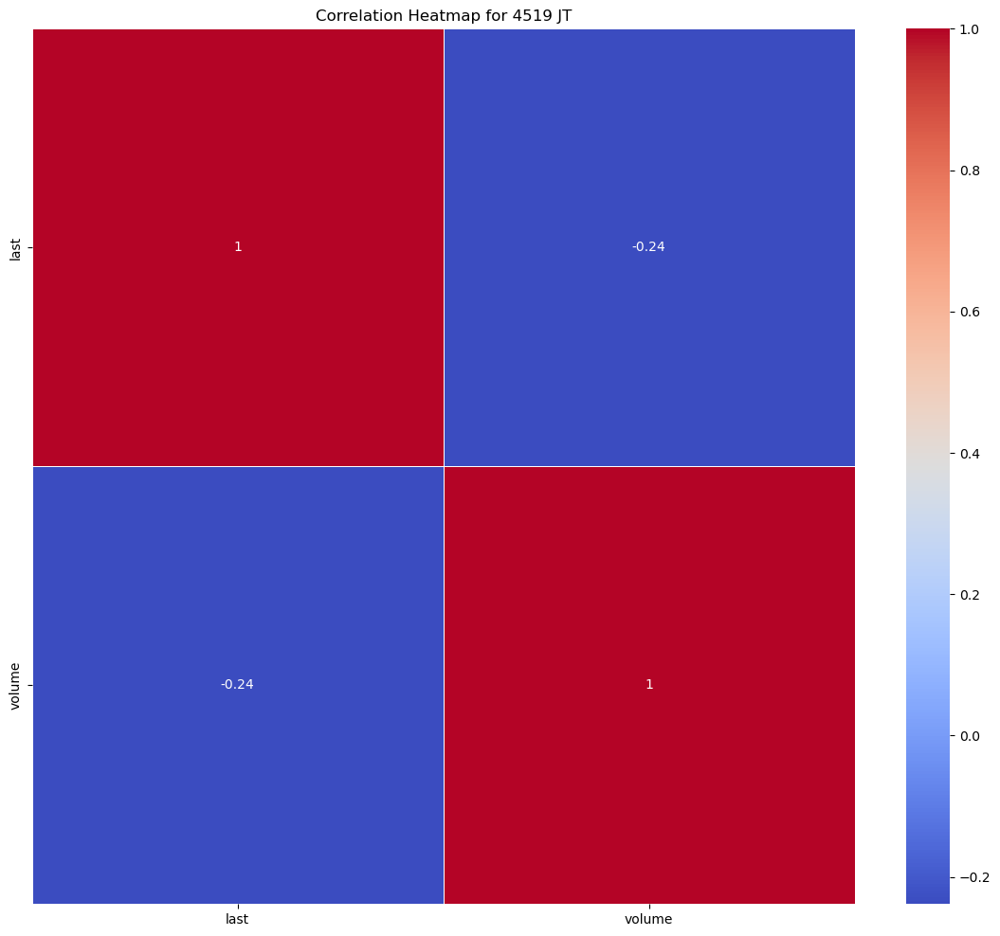

Statistics for stock 4523 JT
---- last ----
Mean: 6084.679352718205
Median: 6044.4534
Mode: 3380.0692
Range: 7809.714800000001
Standard Deviation: 1894.687210627598
Skewness: 0.12663110666763103
Kurtosis: -0.8043515014162952


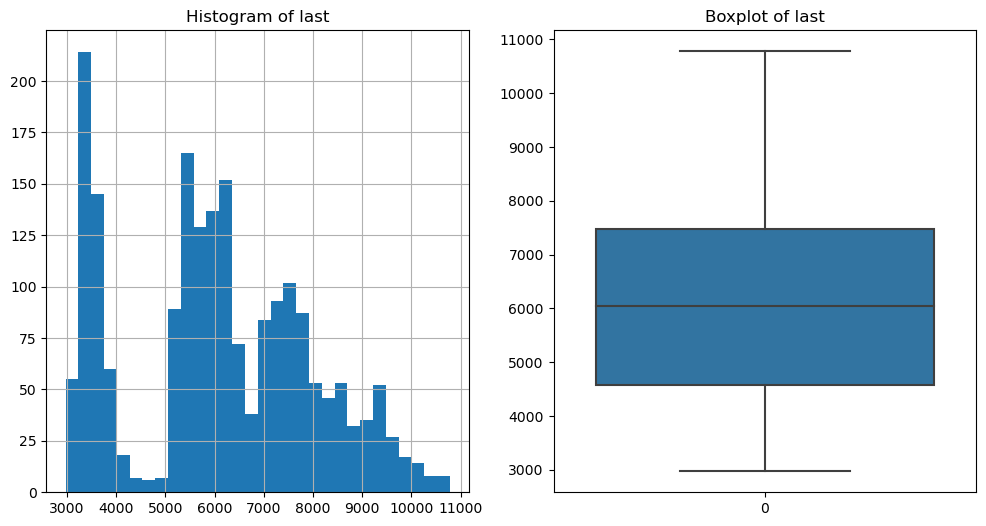

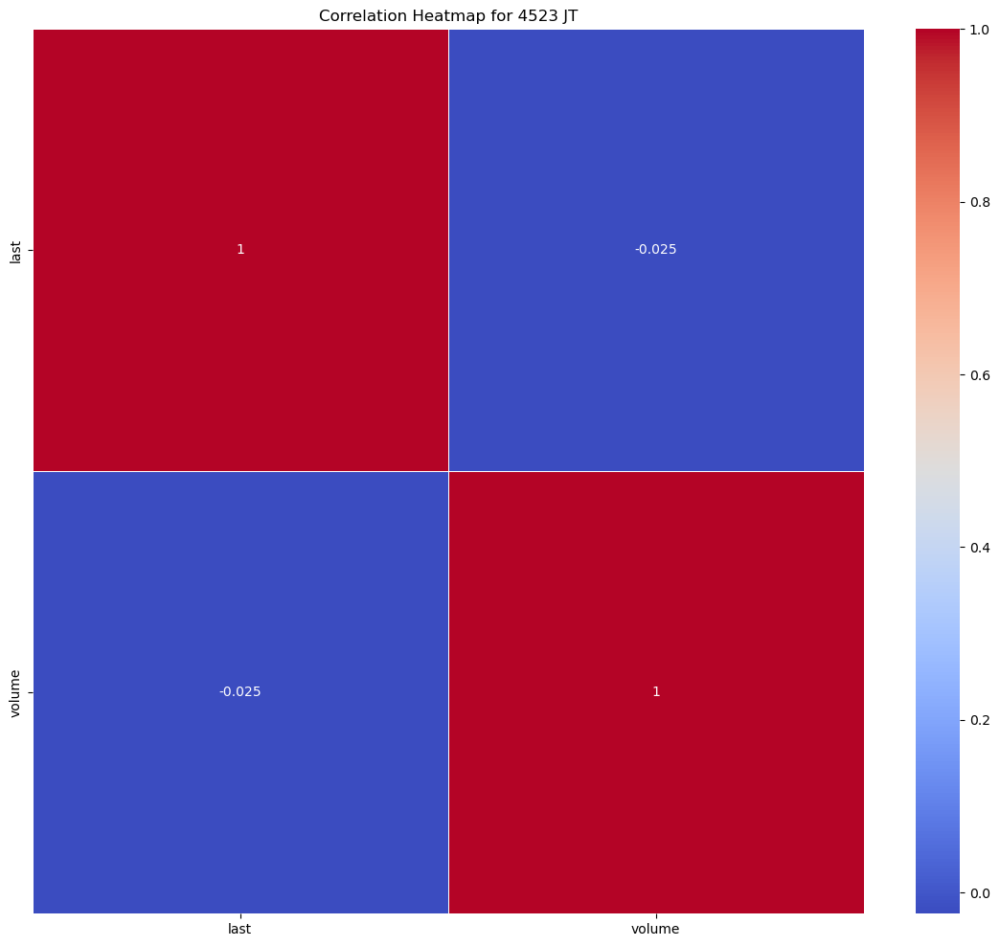

Statistics for stock 4543 JT
---- last ----
Mean: 2312.823707531172
Median: 2064.1254
Mode: 1912.3608
Range: 3801.4949
Standard Deviation: 1036.9859740070194
Skewness: 0.39976730649274045
Kurtosis: -1.0922308976371247


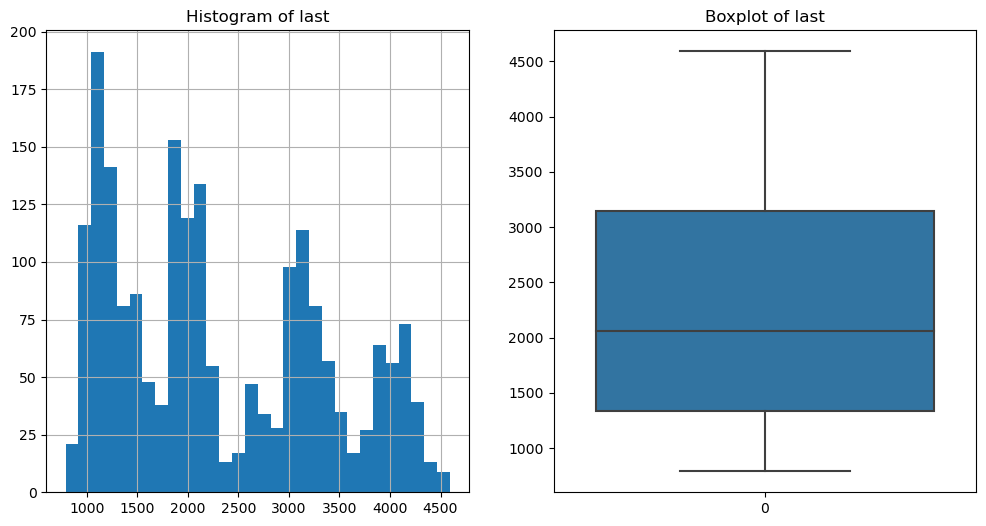

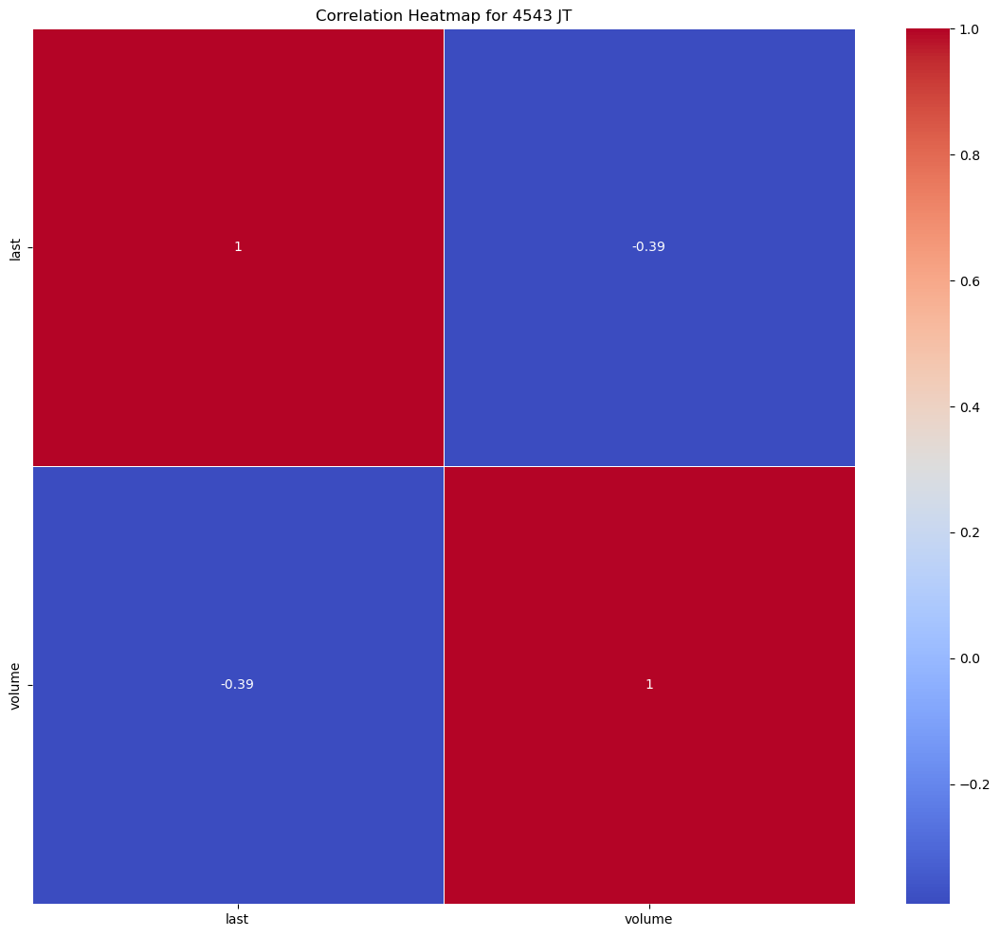

Statistics for stock 4568 JT
---- last ----
Mean: 1216.3586910224437
Median: 786.6214
Mode: 542.0954
Range: 3511.9414
Standard Deviation: 872.6755399481069
Skewness: 1.2769906732560972
Kurtosis: 0.4228435832549682


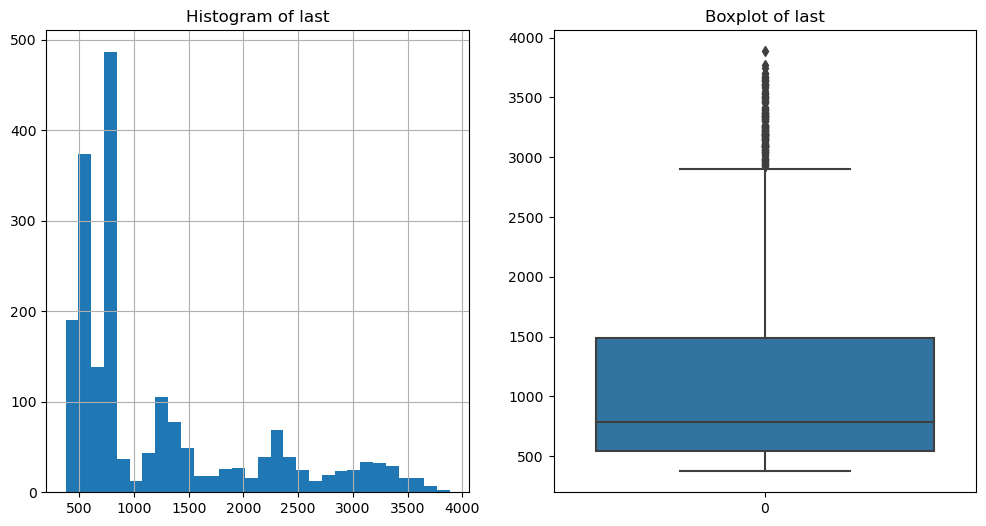

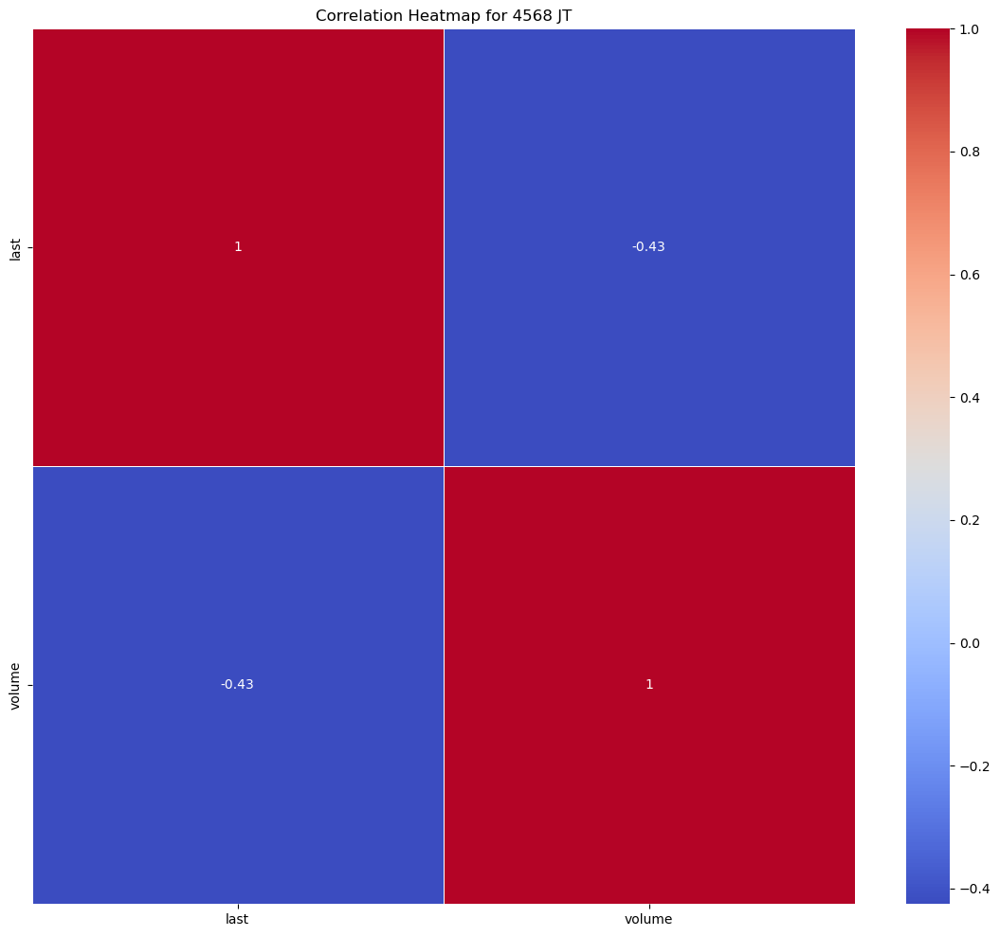

Statistics for stock 4689 JT
---- last ----
Mean: 427.2424977057357
Median: 424.6055
Mode: 463.3034
Range: 545.723
Standard Deviation: 94.63921749897428
Skewness: 0.9290988230958847
Kurtosis: 1.5975144999100364


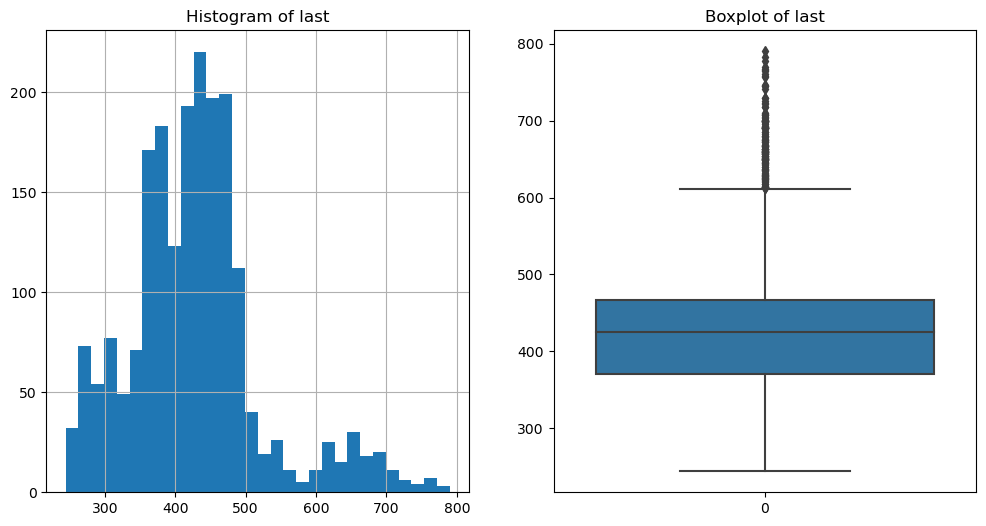

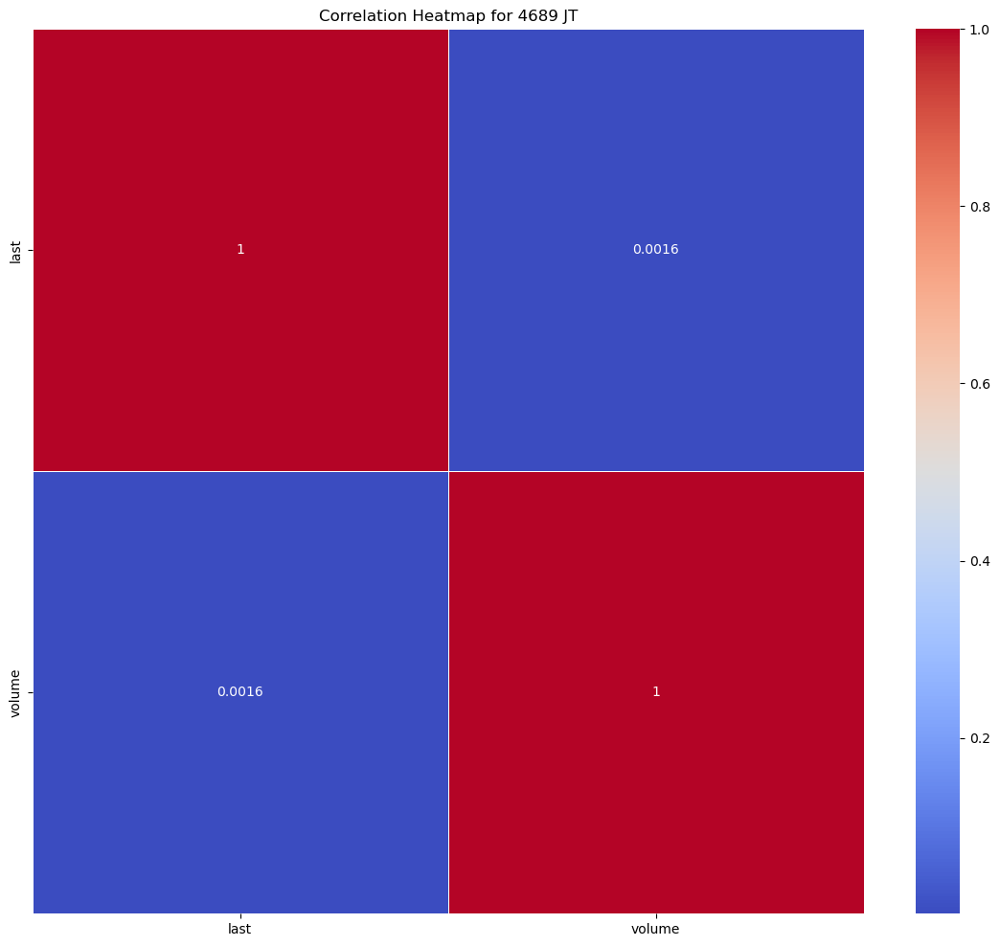

Statistics for stock 4704 JT
---- last ----
Mean: 4279.724330473816
Median: 4334.0727
Mode: 5797.1461
Range: 4912.8243999999995
Standard Deviation: 1280.841878641581
Skewness: 0.012148971267877947
Kurtosis: -1.362640714365218


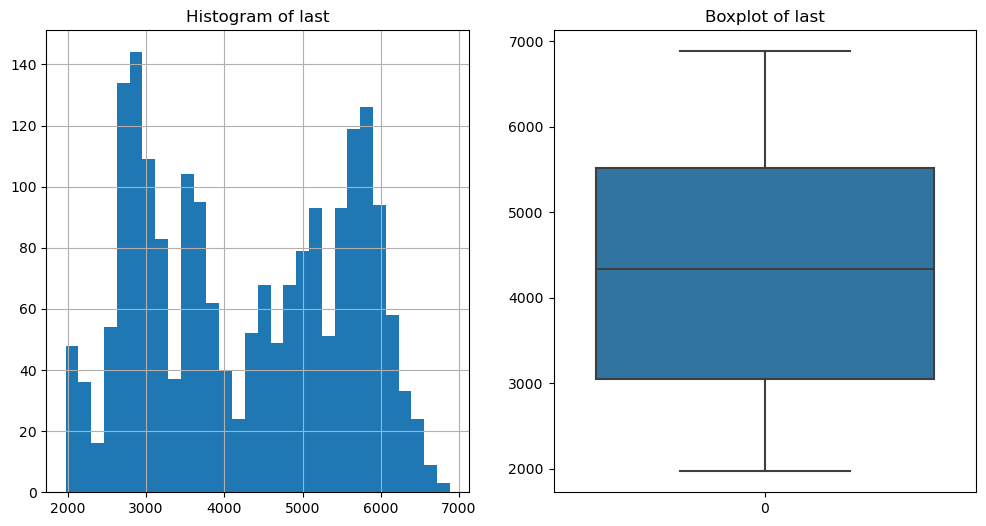

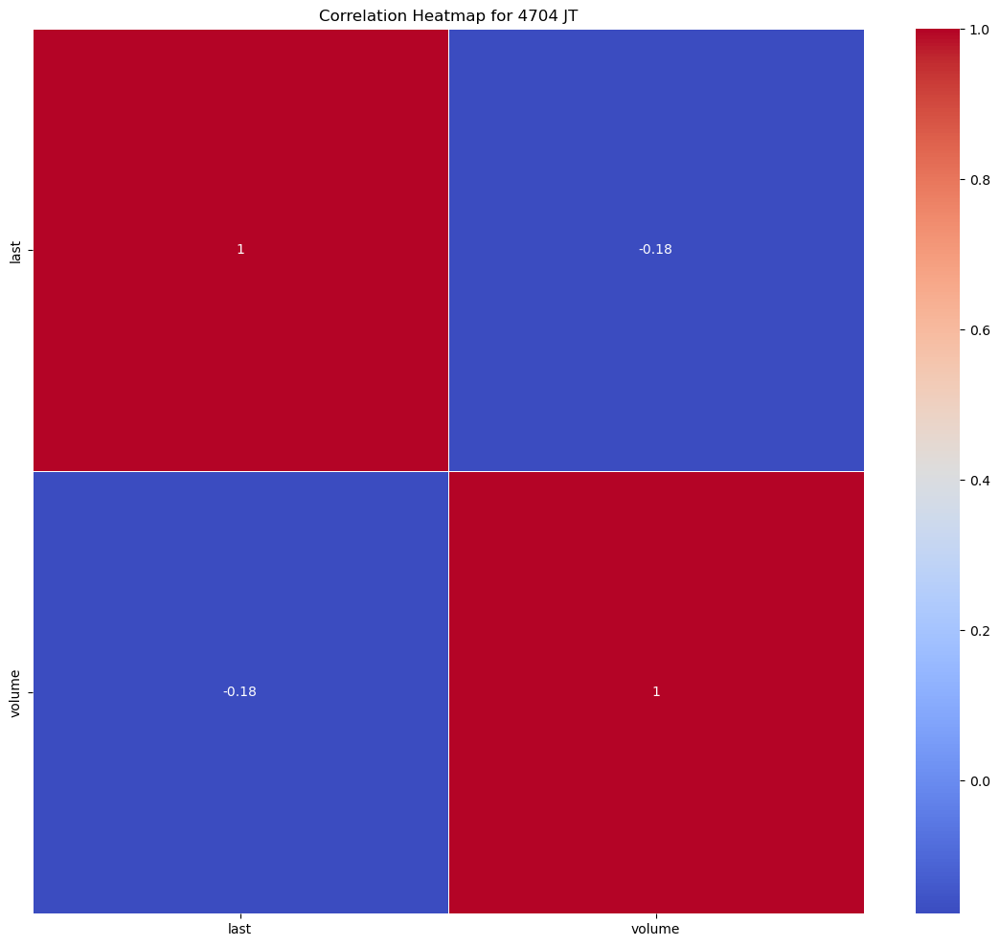

Statistics for stock 4901 JT
---- last ----
Mean: 3948.8598039900253
Median: 4123.0972
Mode: 1947.6021
Range: 5100.3657
Standard Deviation: 1089.9351772648145
Skewness: -0.458708151599925
Kurtosis: -0.28303926934713264


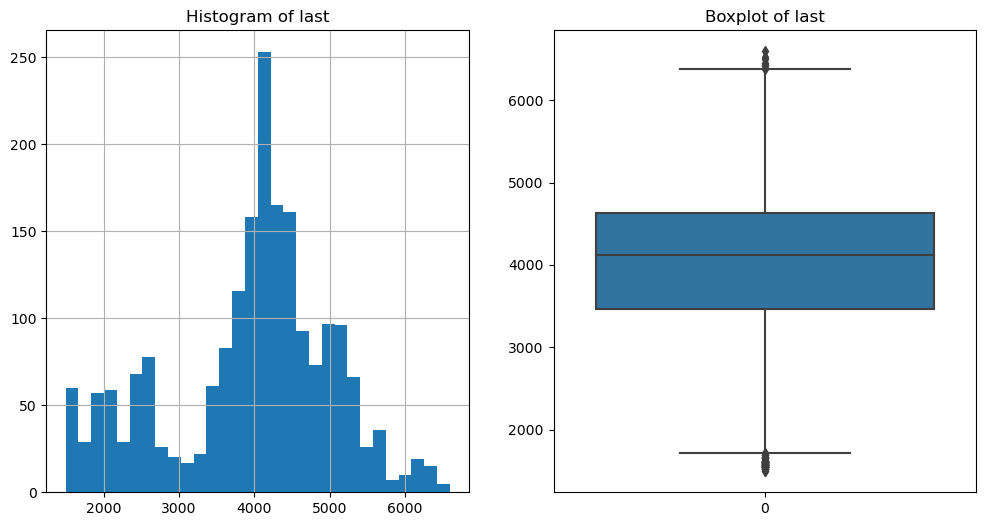

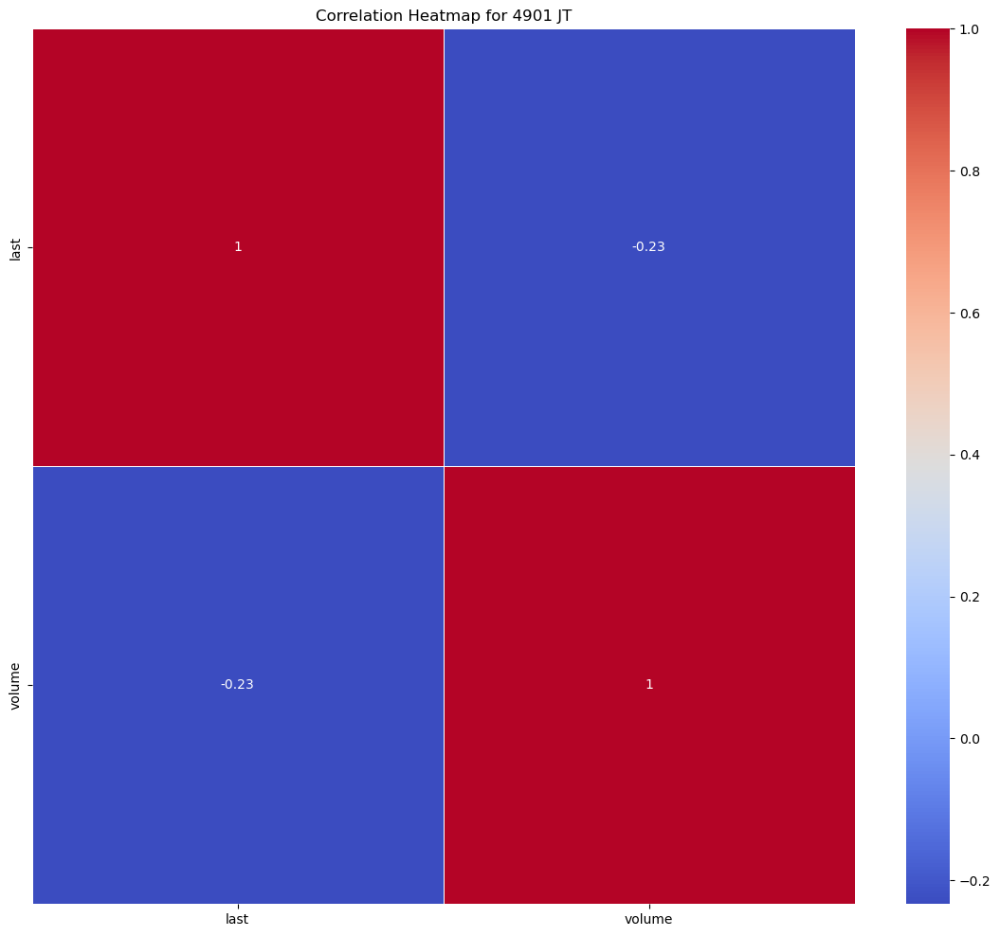

Statistics for stock 4902 JT
---- last ----
Mean: 804.9011076309228
Median: 826.9358
Mode: 779.6323
Range: 1095.9445
Standard Deviation: 227.1729757432686
Skewness: -0.4492501779202678
Kurtosis: -0.22731730887550272


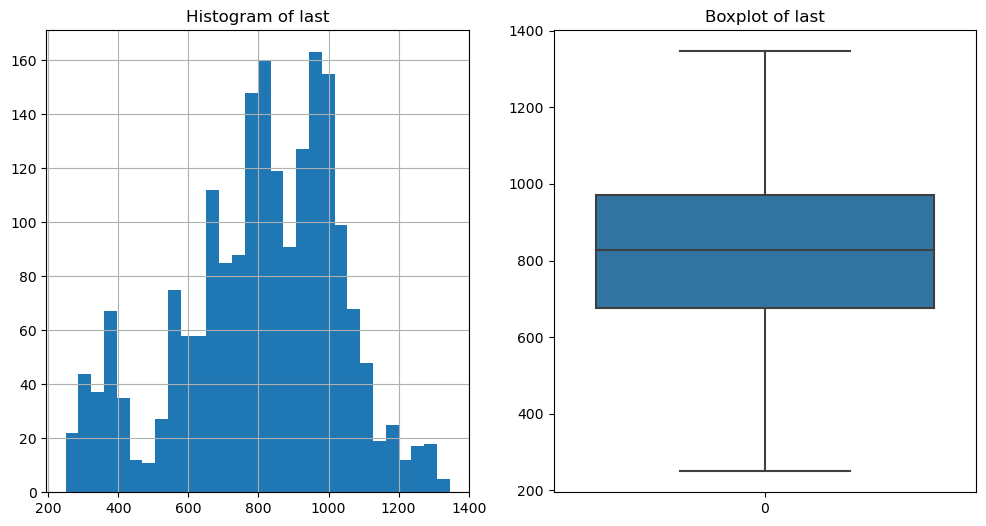

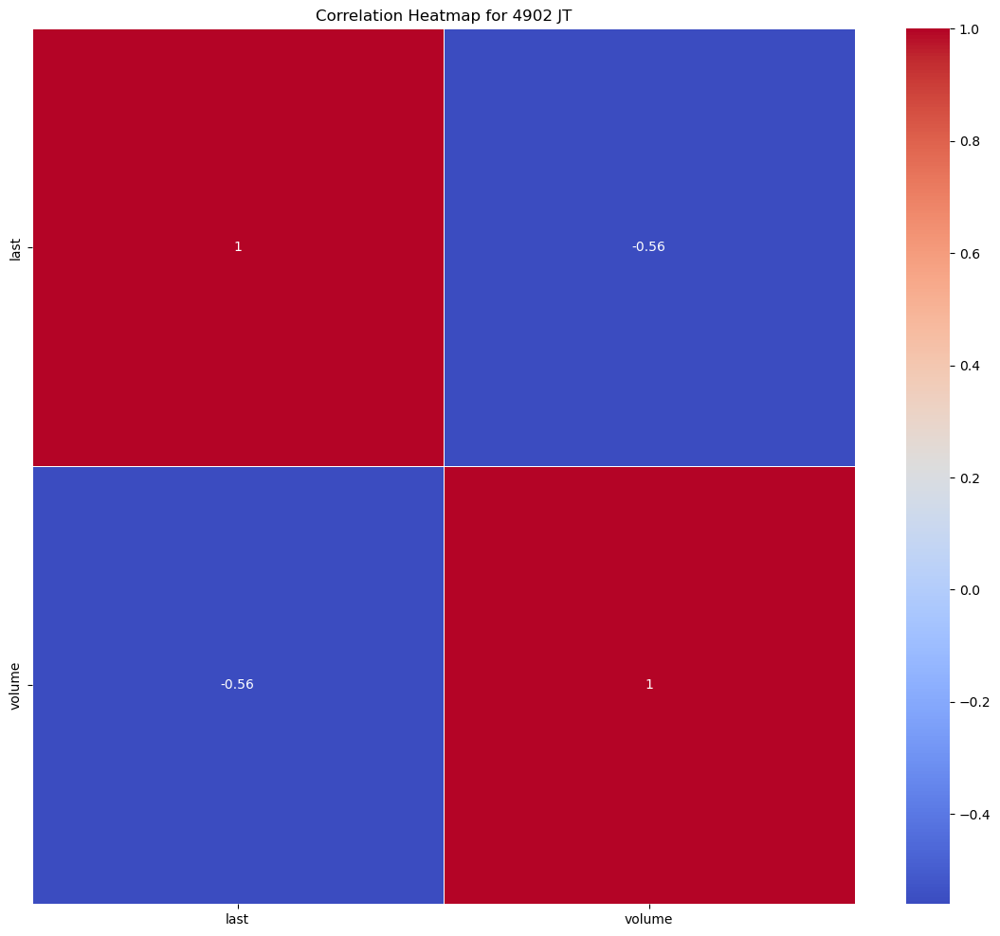

Statistics for stock 4911 JT
---- last ----
Mean: 4288.576851072319
Median: 2913.9033
Mode: 1756.2747
Range: 7942.4269
Standard Deviation: 2550.174708107886
Skewness: 0.3718531876927272
Kurtosis: -1.4938440033068918


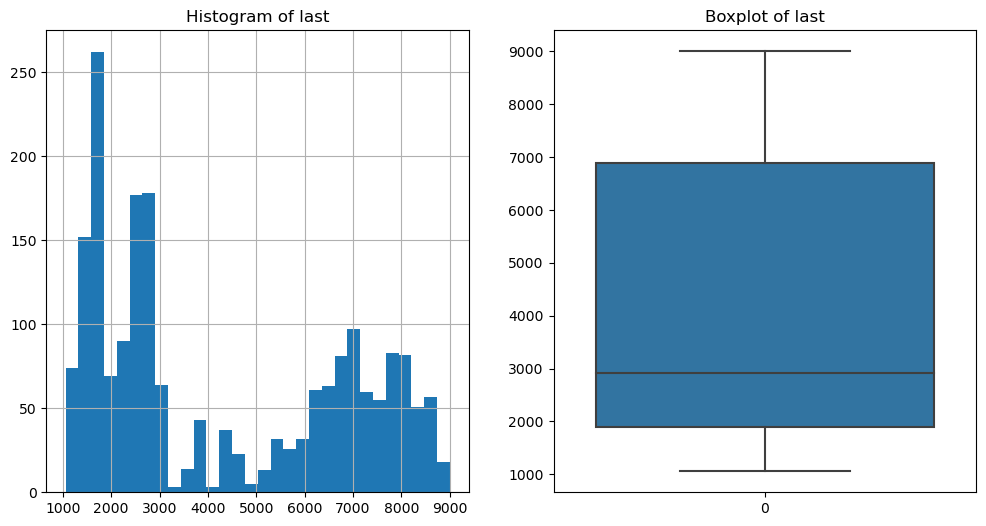

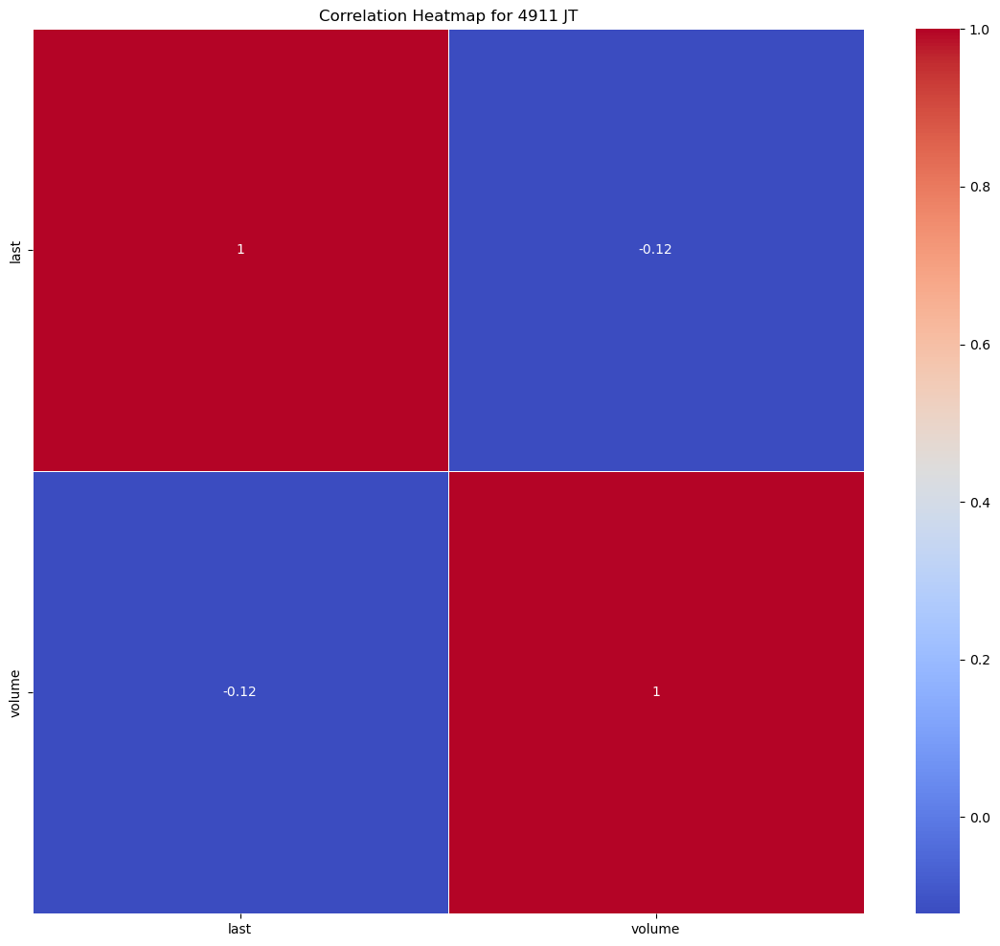

Statistics for stock 5020 JT
---- last ----
Mean: 442.4345020448878
Median: 413.0921
Mode: 403.3504
Range: 503.2256
Standard Deviation: 95.17382330912712
Skewness: 1.497939410114168
Kurtosis: 1.784078458449451


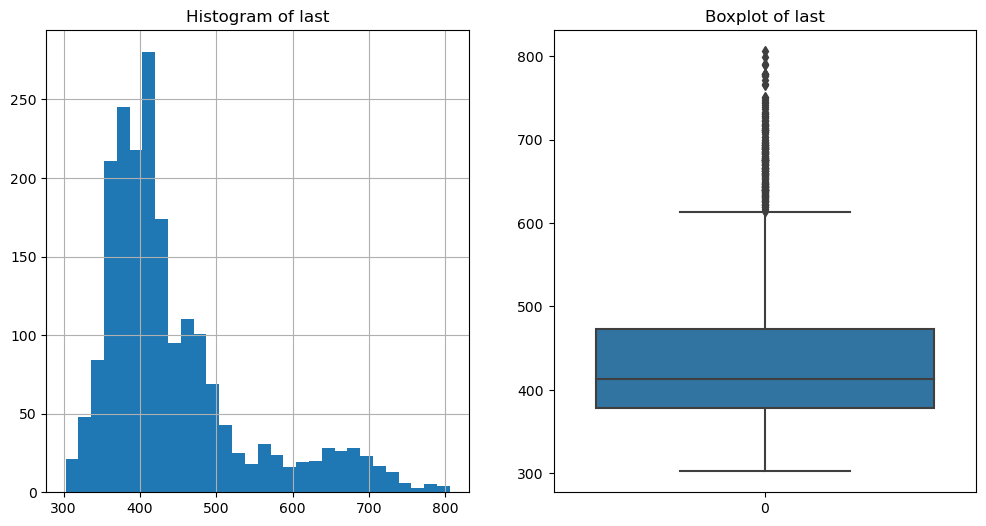

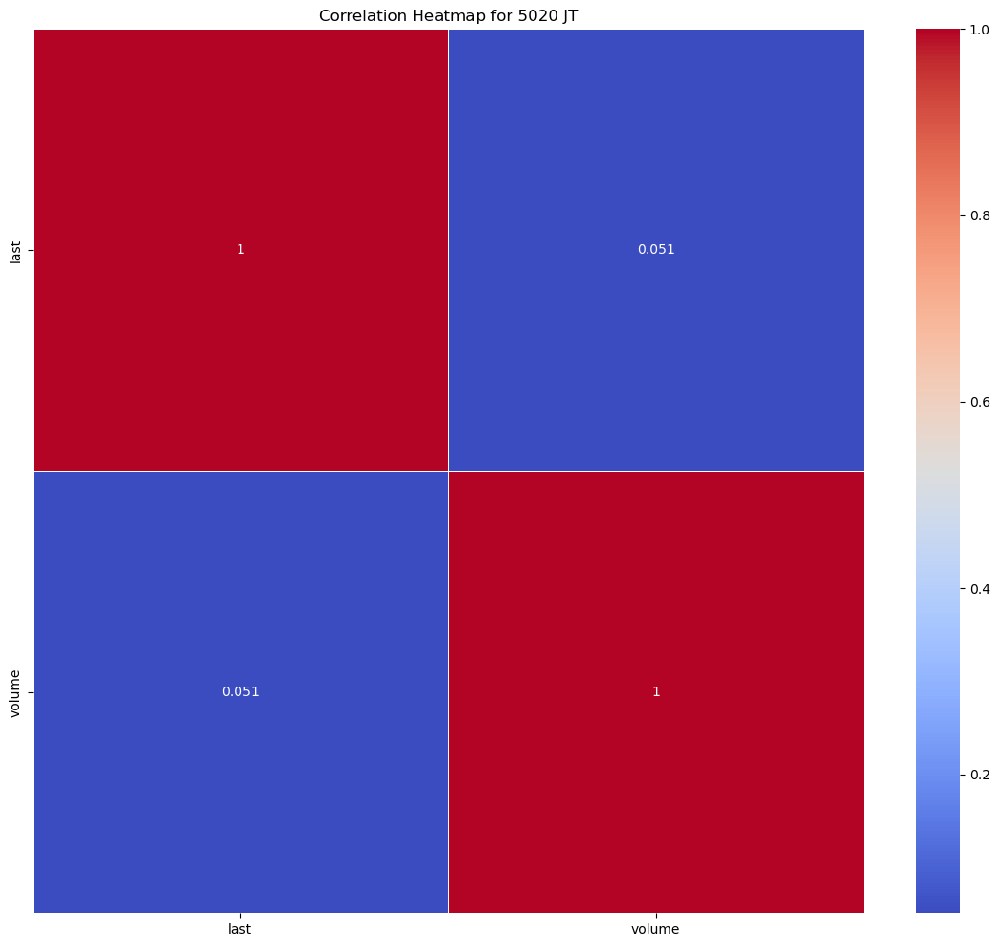

Statistics for stock 5101 JT
---- last ----
Mean: 1791.0442810972568
Median: 1809.4858
Mode: 1460.764
Range: 1639.9497999999999
Standard Deviation: 319.58982453020144
Skewness: 0.007031619348017752
Kurtosis: -0.6746978790968812


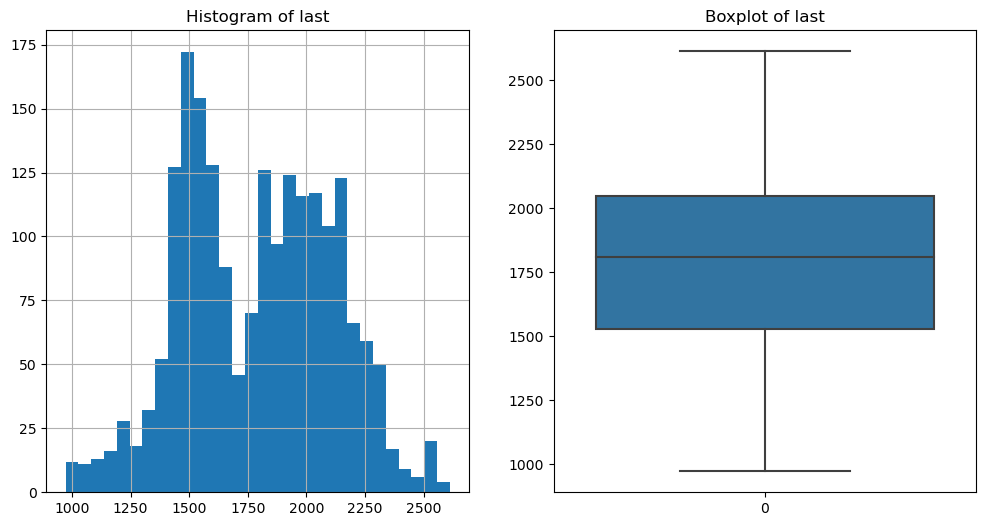

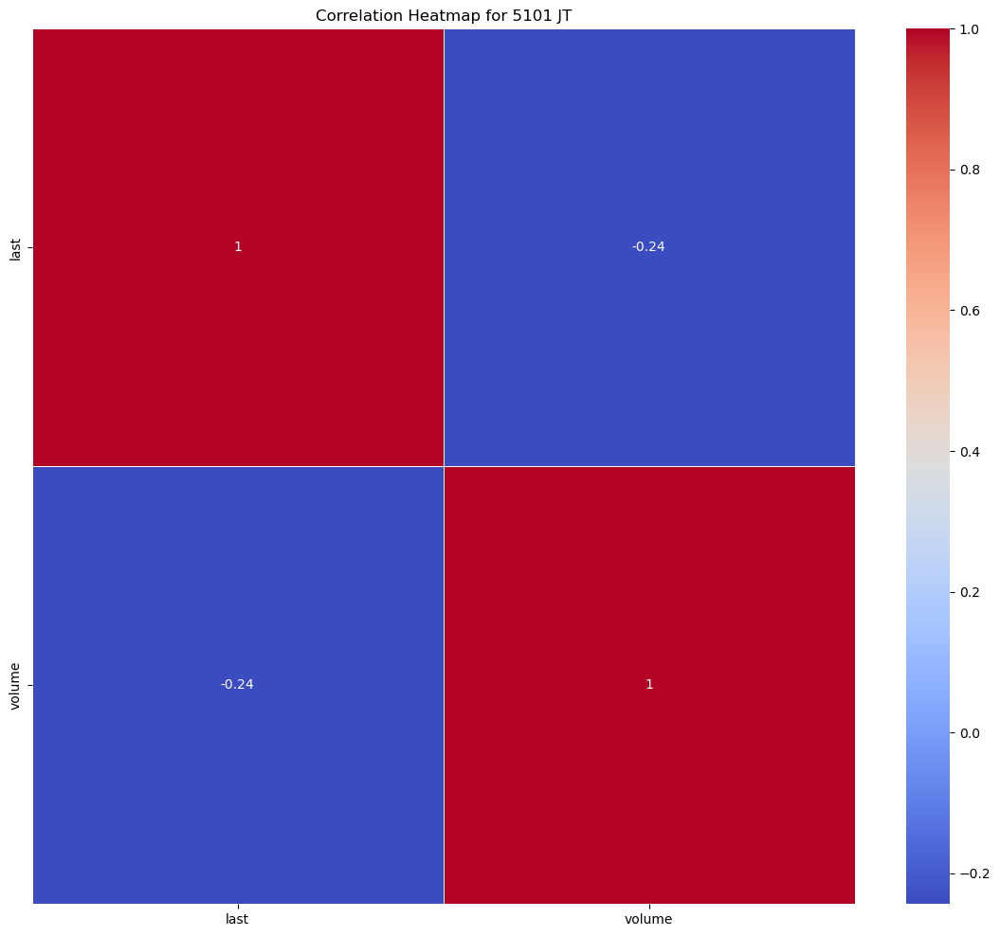

Statistics for stock 5108 JT
---- last ----
Mean: 3551.1392283790524
Median: 3638.8154
Mode: 2706.2978
Range: 3165.4707000000008
Standard Deviation: 590.6729306921101
Skewness: -0.29539539418674265
Kurtosis: -0.2452126324258037


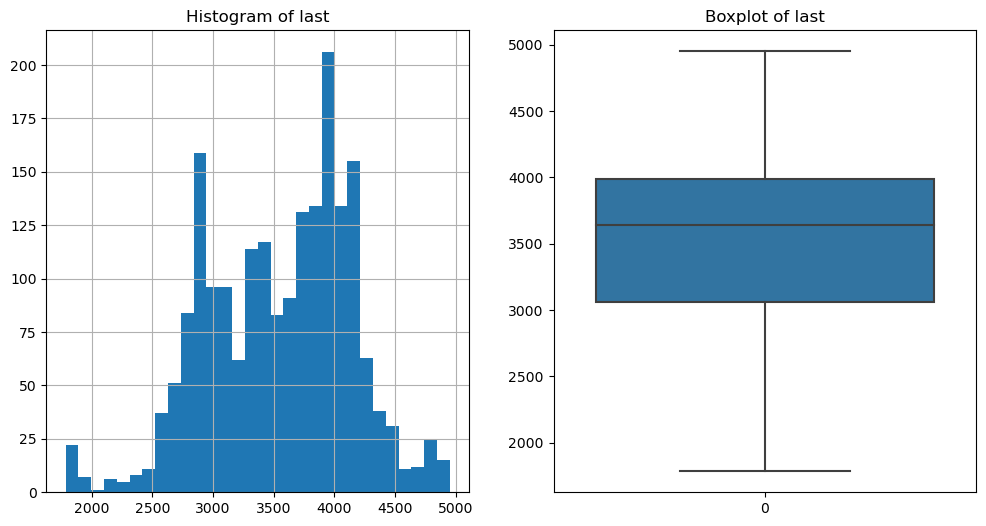

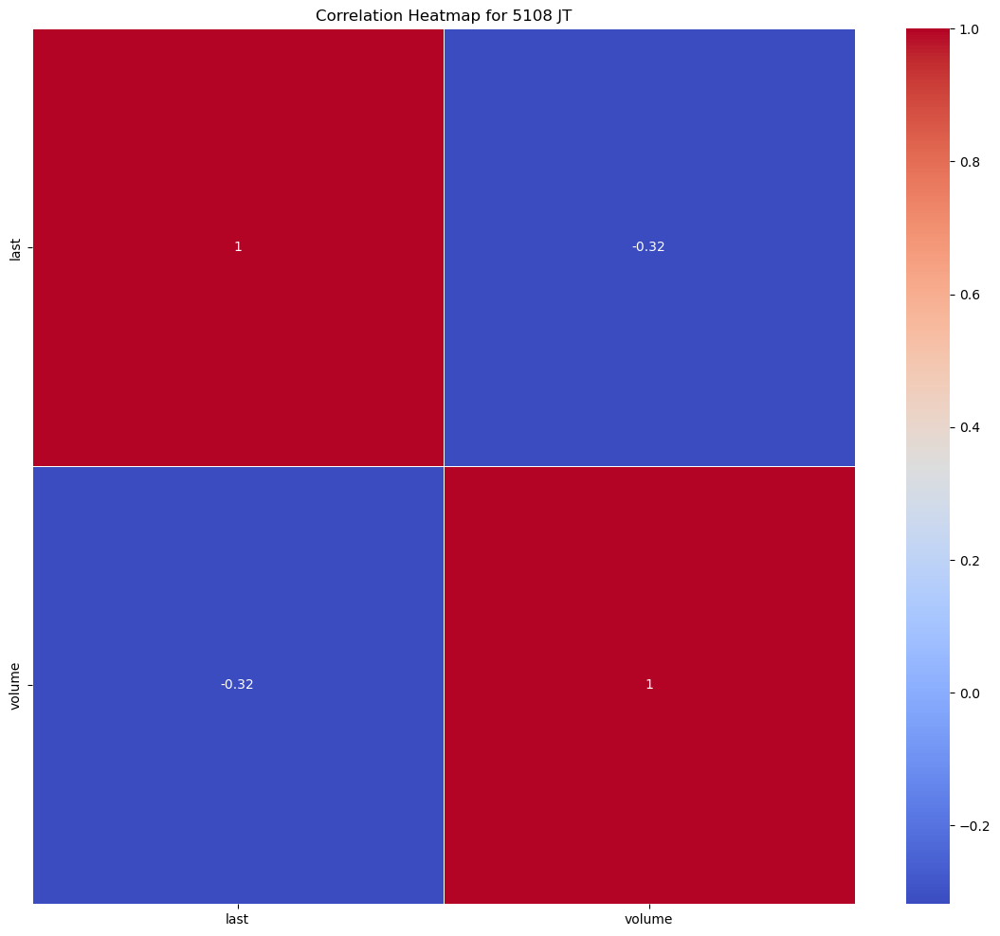

Statistics for stock 5201 JT
---- last ----
Mean: 3204.575801546135
Median: 3156.6956
Mode: 2282.5763
Range: 2429.3779
Standard Deviation: 630.7581114398421
Skewness: 0.2110379143708745
Kurtosis: -1.1412155722663262


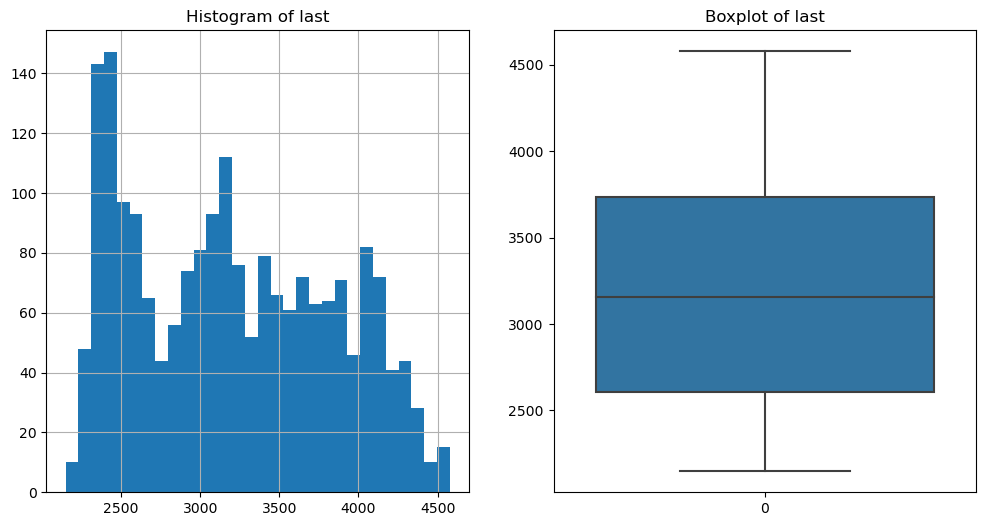

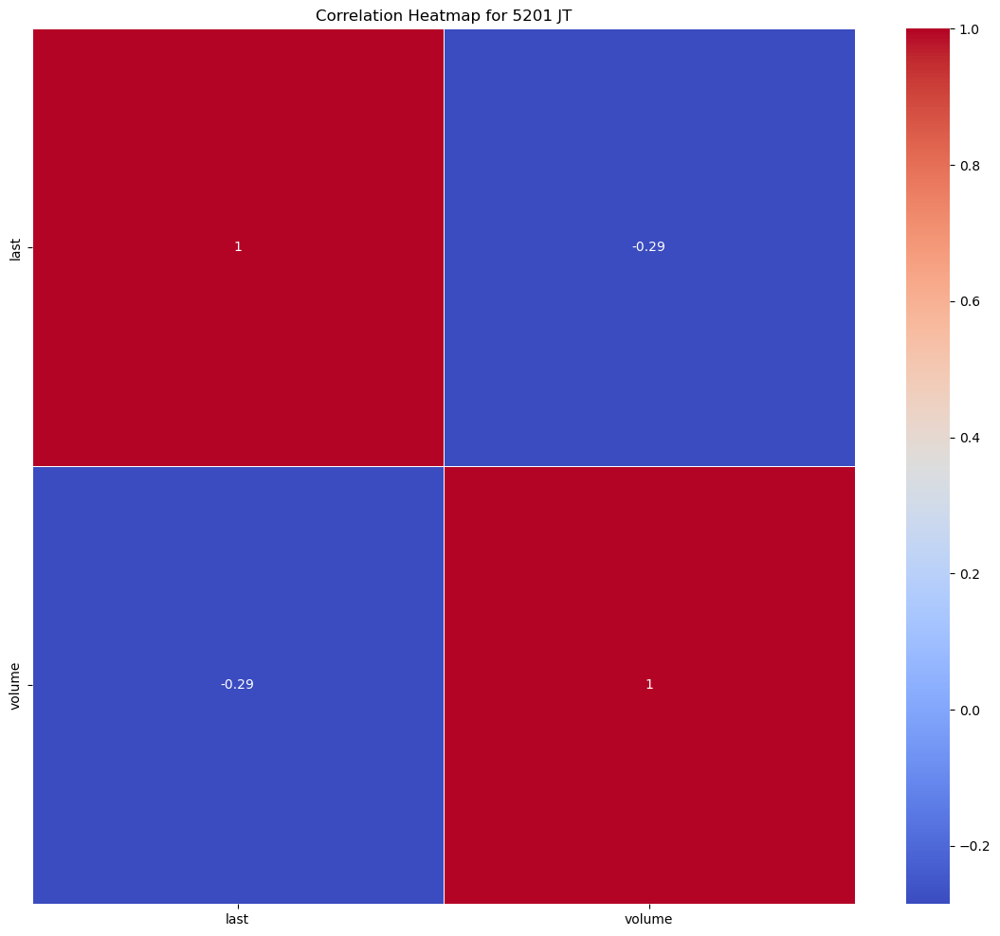

Statistics for stock 5202 JT
---- last ----
Mean: 887.7331560598503
Median: 899.7557
Mode: 1174.418
Range: 1186.5514
Standard Deviation: 258.495497363132
Skewness: -0.3086368021102605
Kurtosis: -0.5174027081461872


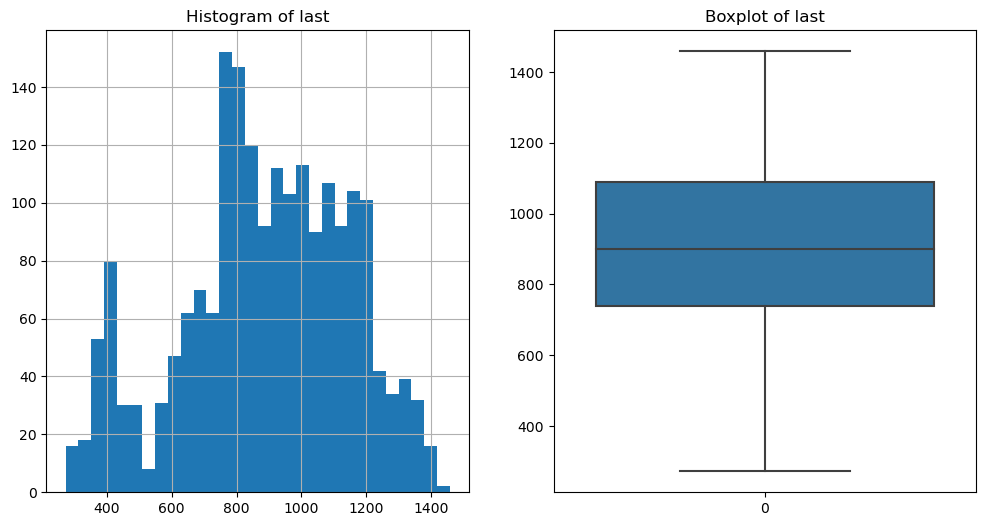

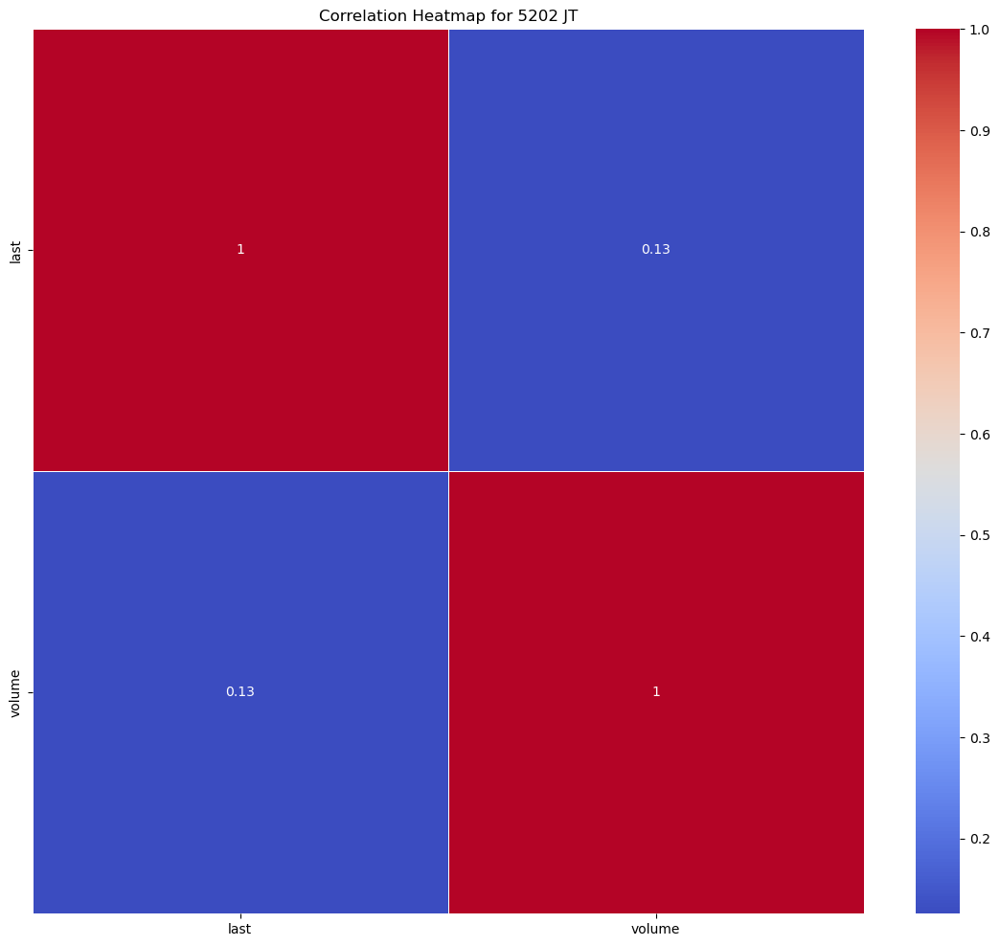

Statistics for stock 5214 JT
---- last ----
Mean: 2425.4890691271817
Median: 2326.6901
Mode: 2781.7893
Range: 3052.3475
Standard Deviation: 559.5049993288904
Skewness: 0.8461983696976269
Kurtosis: 0.6612345515755593


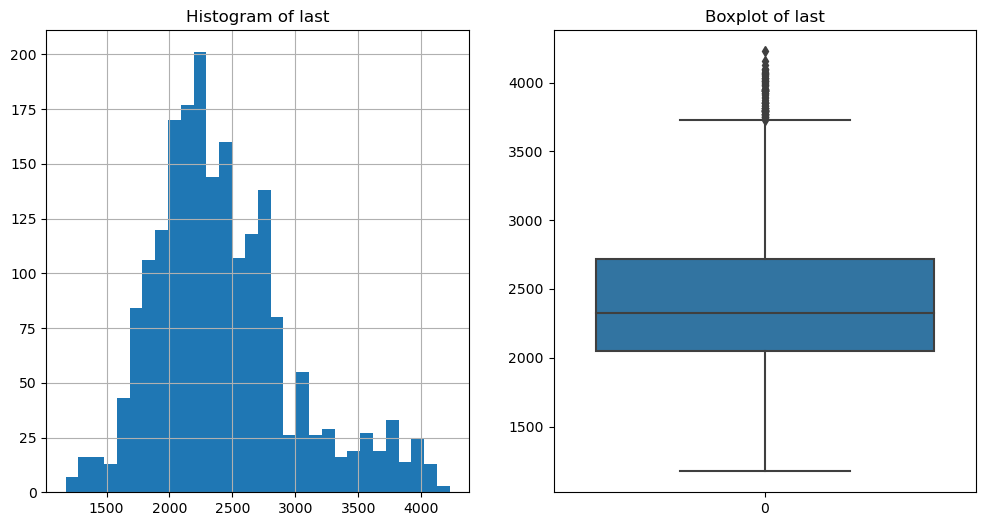

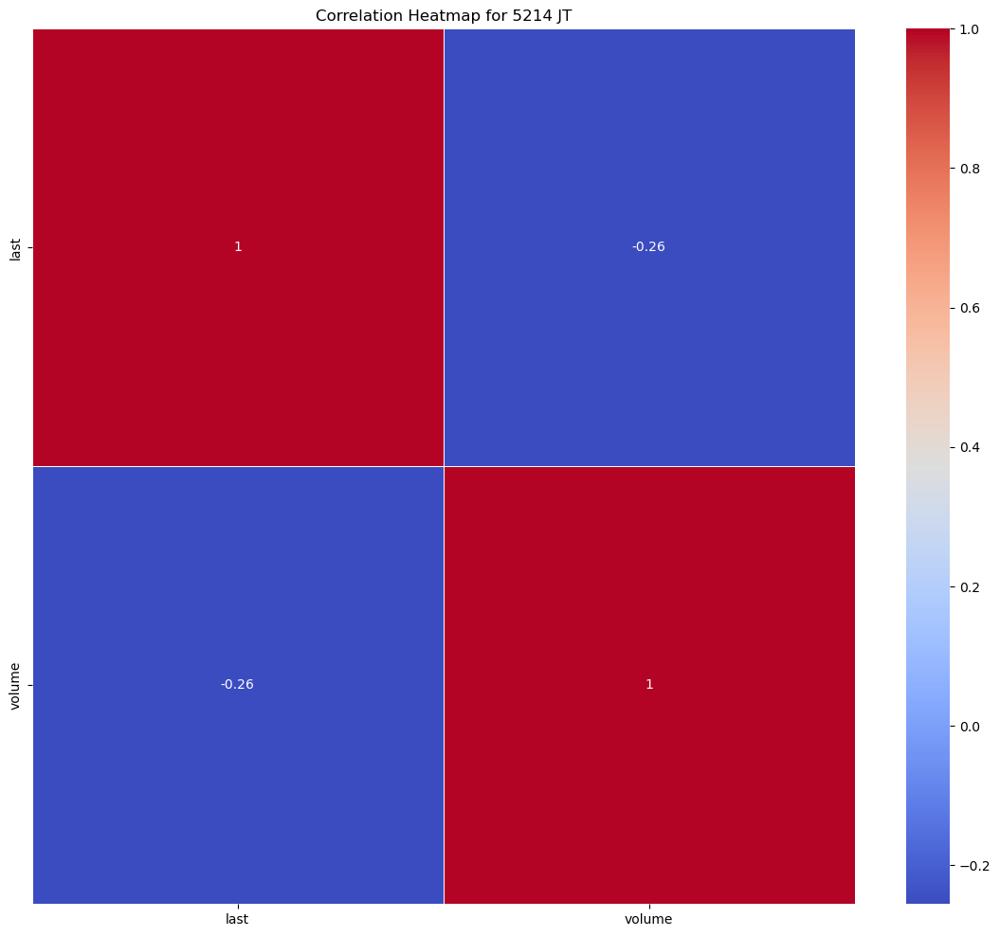

Statistics for stock 5232 JT
---- last ----
Mean: 3840.172122892768
Median: 3941.9054
Mode: 3185.5193
Range: 3187.0109
Standard Deviation: 667.224033002902
Skewness: -0.3062801006043761
Kurtosis: -0.7054270975511718


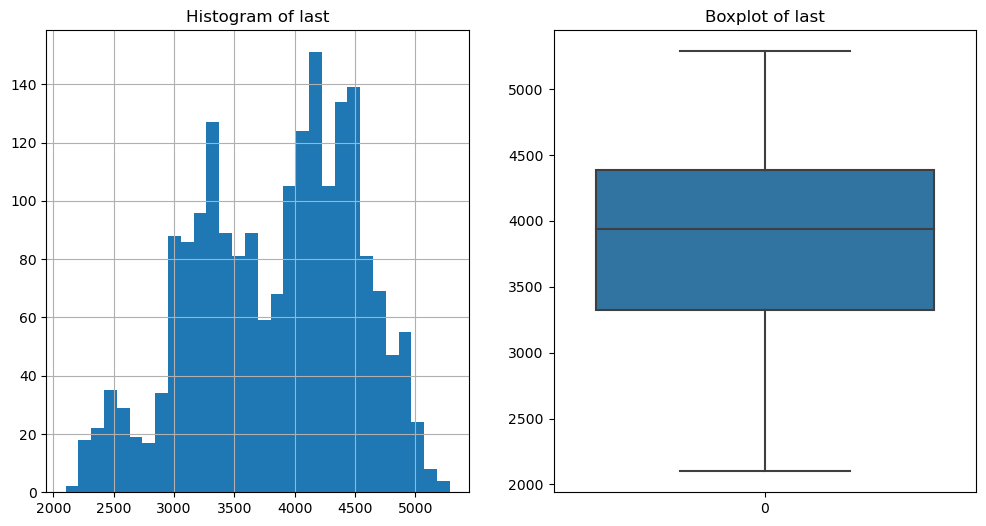

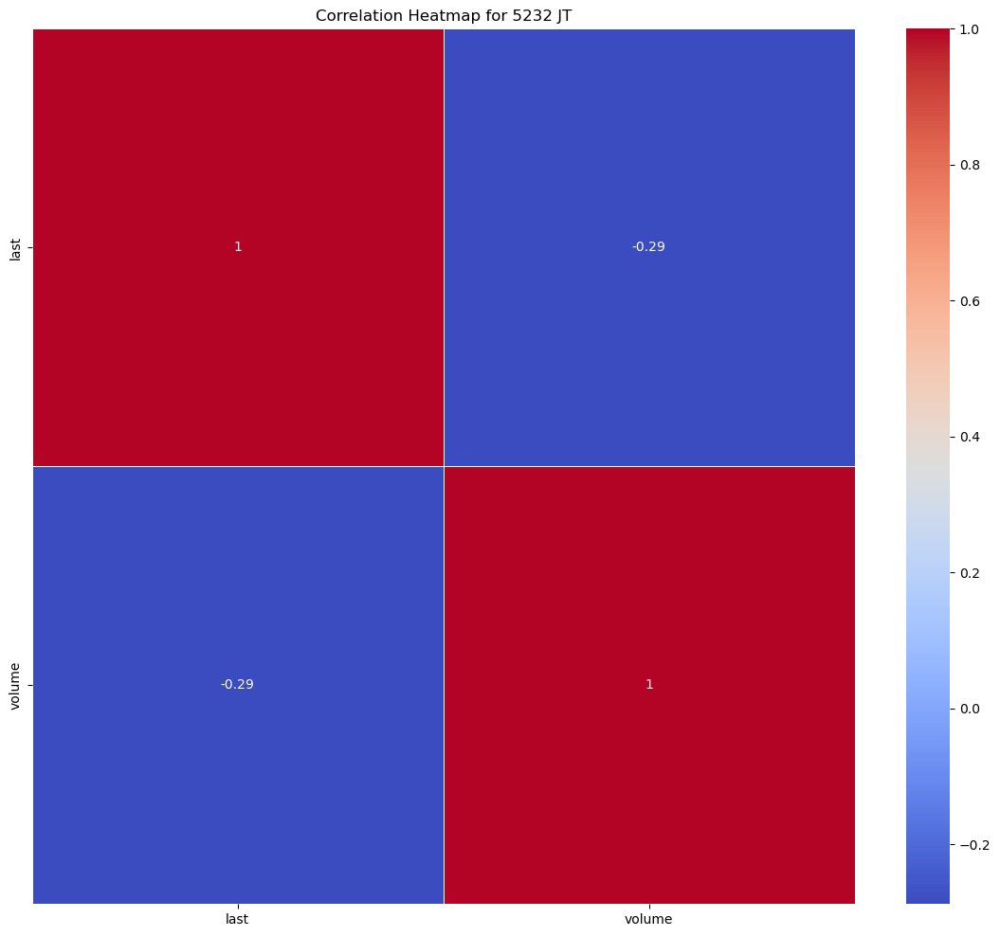

Statistics for stock 5233 JT
---- last ----
Mean: 3174.25262798005
Median: 3262.6297
Mode: 2666.6128
Range: 3122.7852
Standard Deviation: 568.1432508849729
Skewness: -0.26187075186864195
Kurtosis: -0.1641790353578907


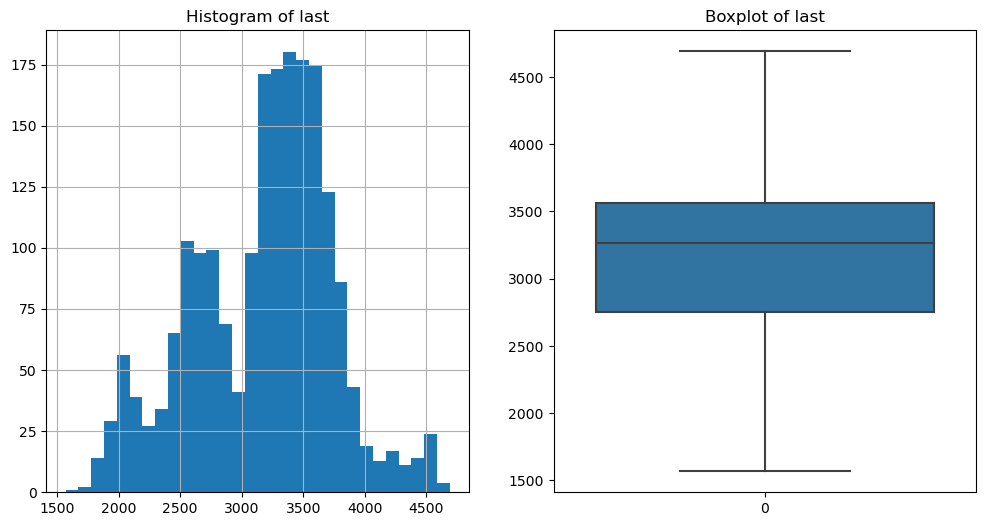

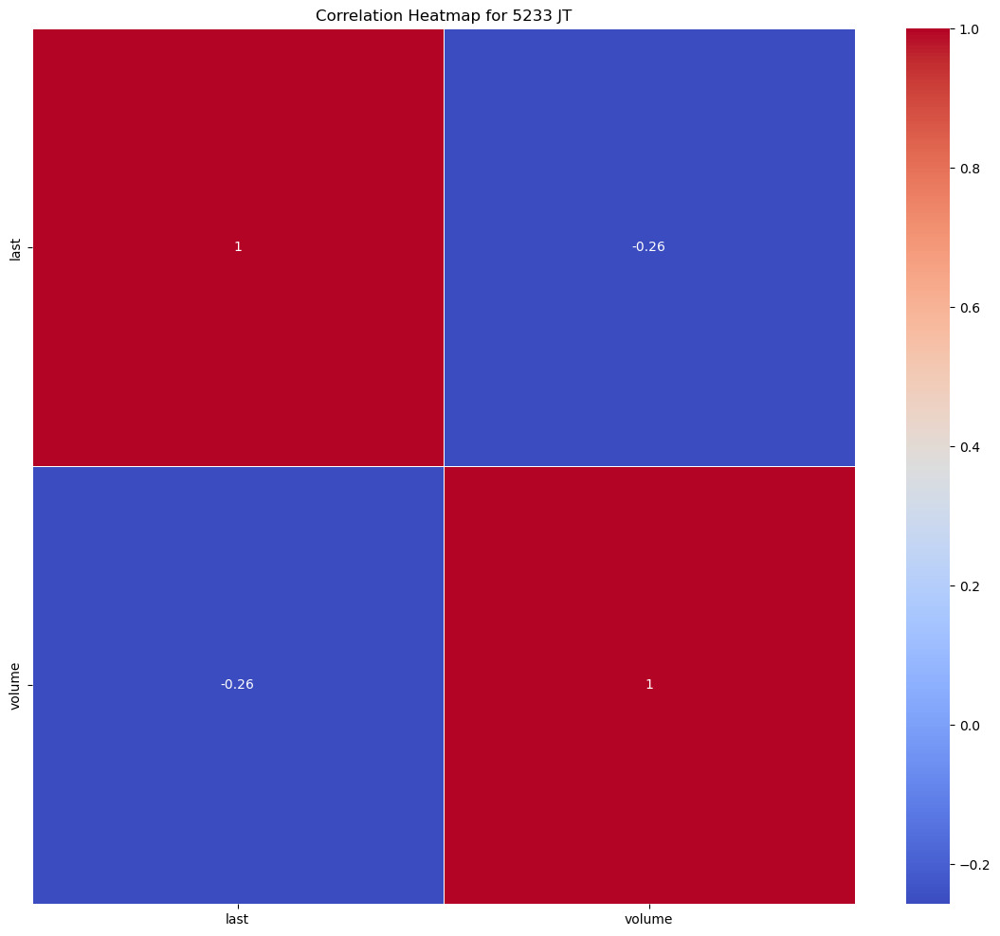

Statistics for stock 5301 JT
---- last ----
Mean: 719.0405920199502
Median: 382.2797
Mode: 257.4189
Range: 1932.0218000000002
Standard Deviation: 521.1802740617559
Skewness: 0.7720719452963146
Kurtosis: -0.6716074072494673


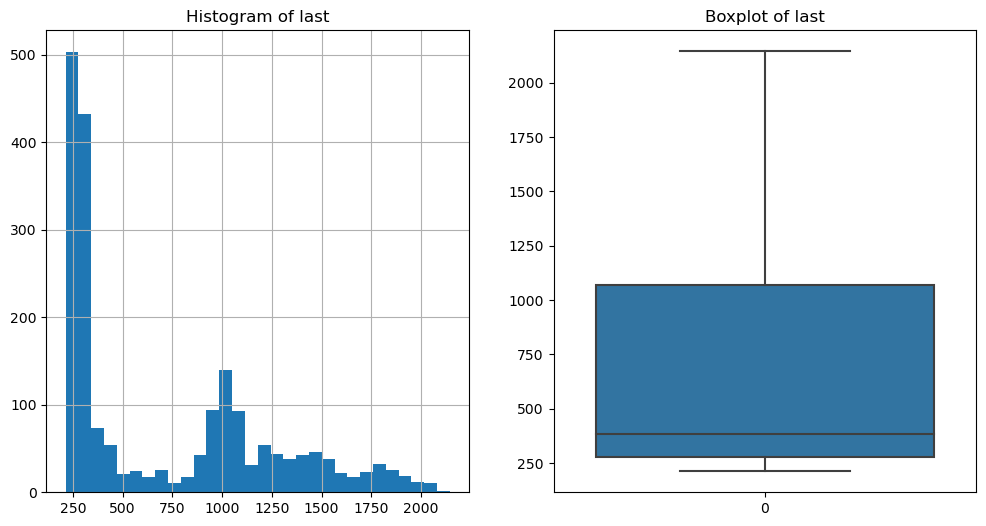

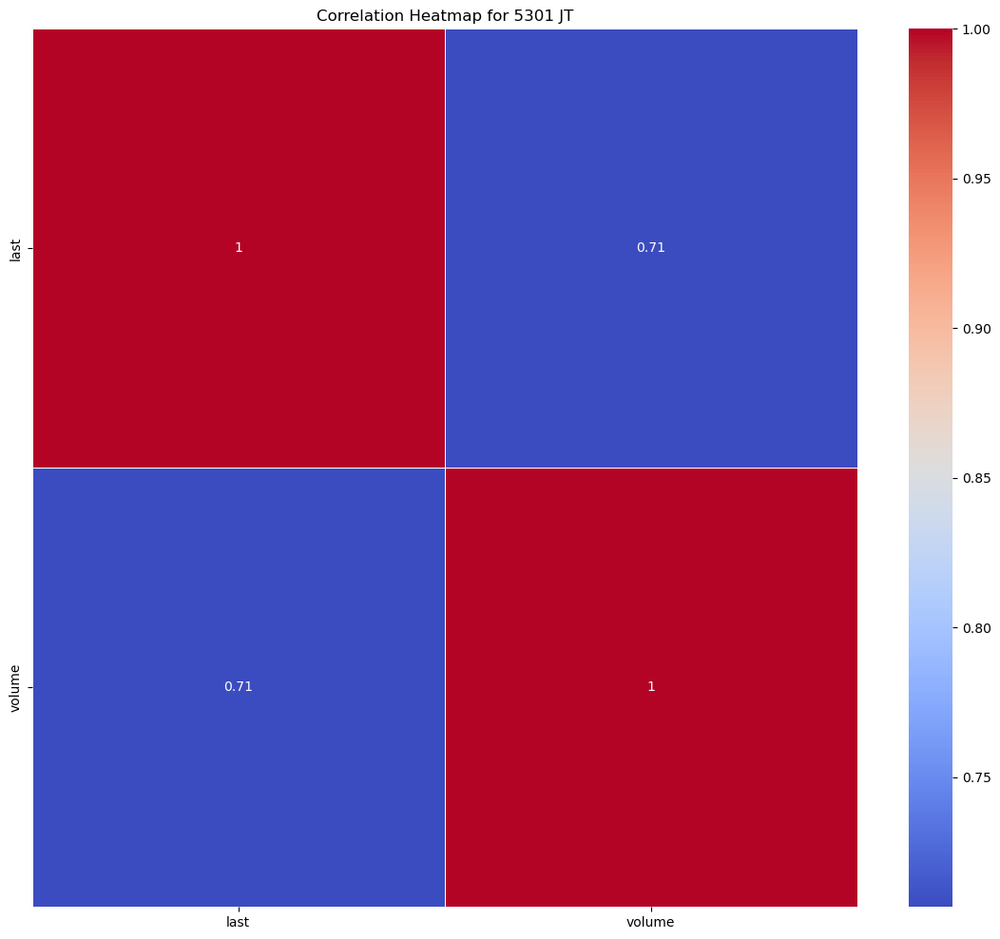

Statistics for stock 5332 JT
---- last ----
Mean: 3750.2999560598496
Median: 3891.4288
Mode: 5910.0
Range: 6100.9378
Standard Deviation: 1186.979911654243
Skewness: 0.11610624739876785
Kurtosis: -0.14396196748743995


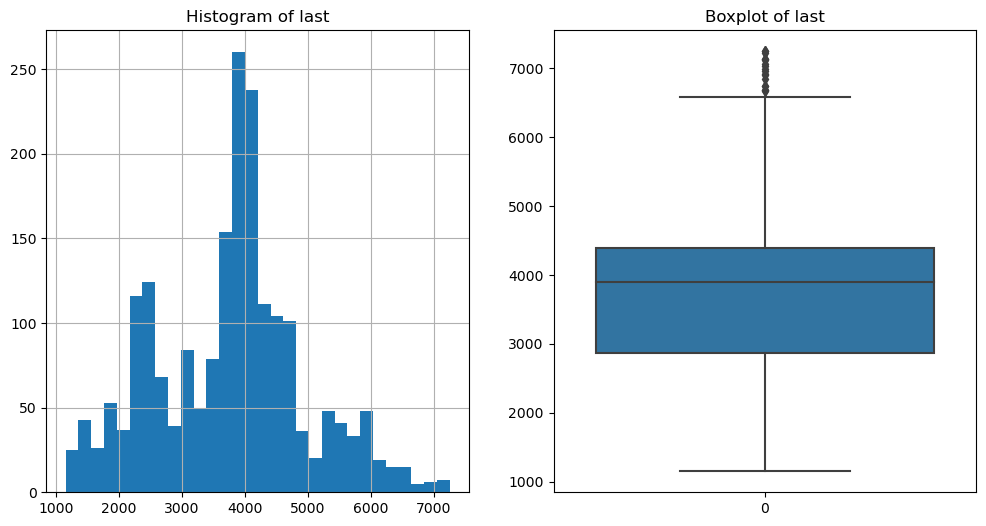

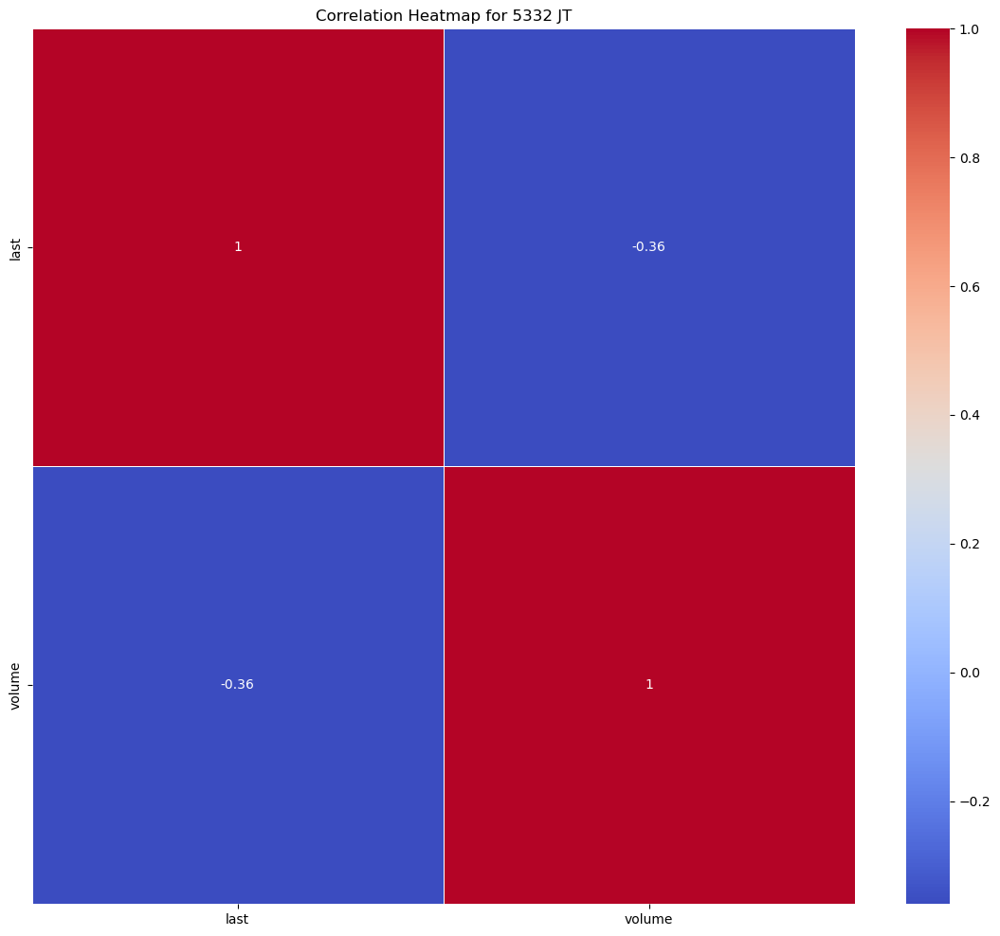

Statistics for stock 5333 JT
---- last ----
Mean: 1809.229218054863
Median: 1838.4498
Mode: 2006.7219
Range: 2141.6426
Standard Deviation: 404.0624951851651
Skewness: -0.08207502280265581
Kurtosis: 0.14389821792909352


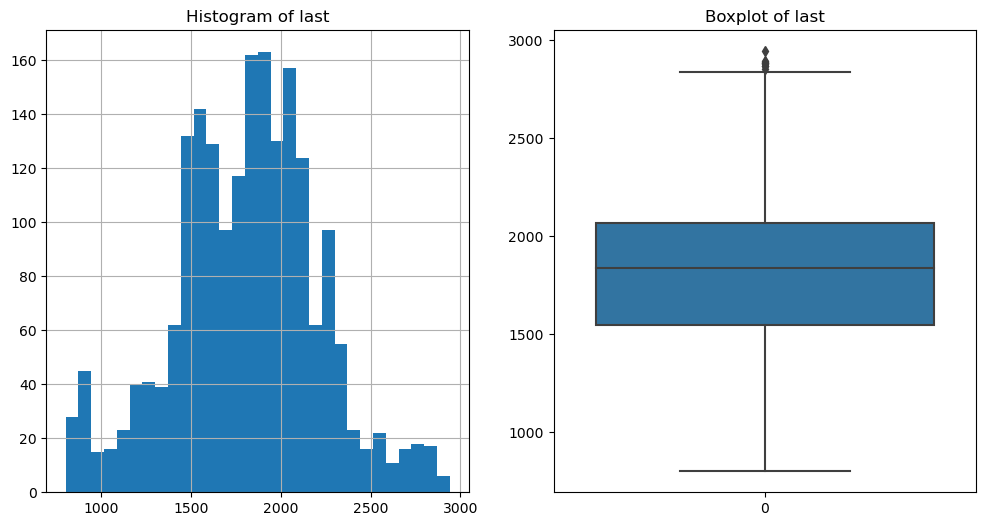

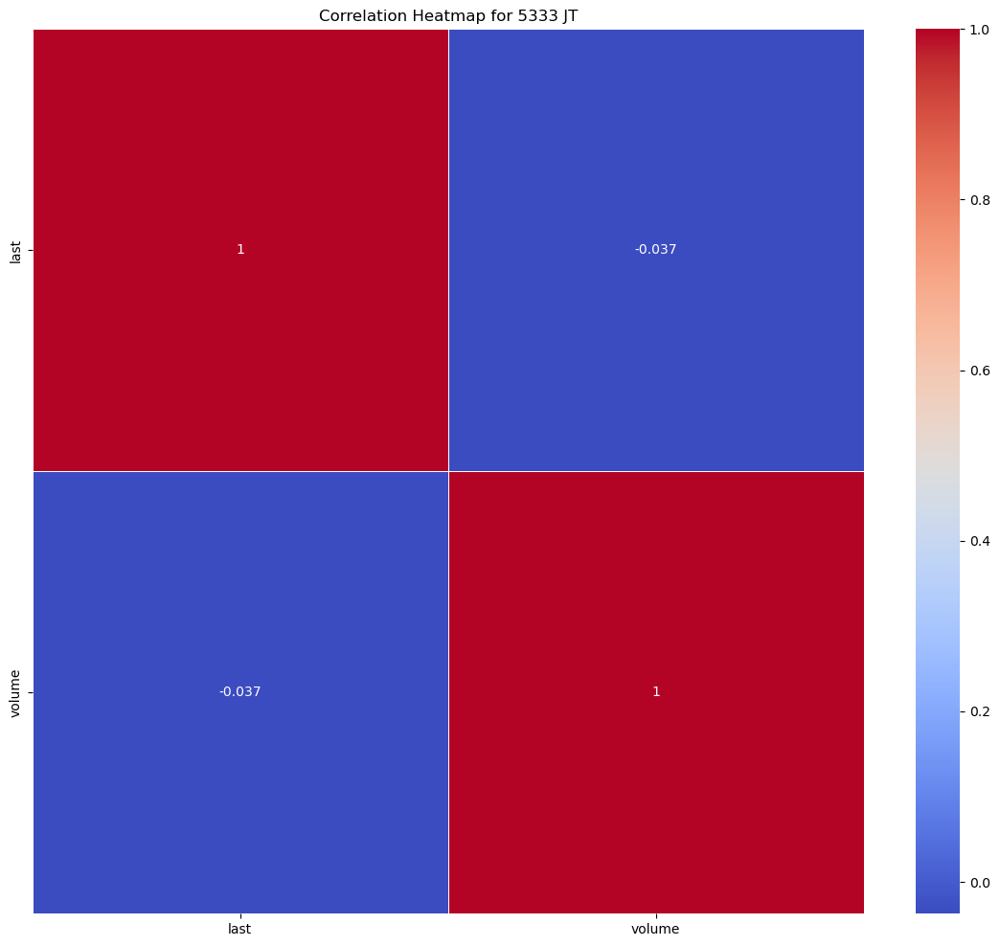

Statistics for stock 5401 JT
---- last ----
Mean: 2130.772181147132
Median: 2202.267
Mode: 2880.3713
Range: 2315.4164
Standard Deviation: 529.0342780894777
Skewness: -0.6013764550383095
Kurtosis: -0.2634516670244209


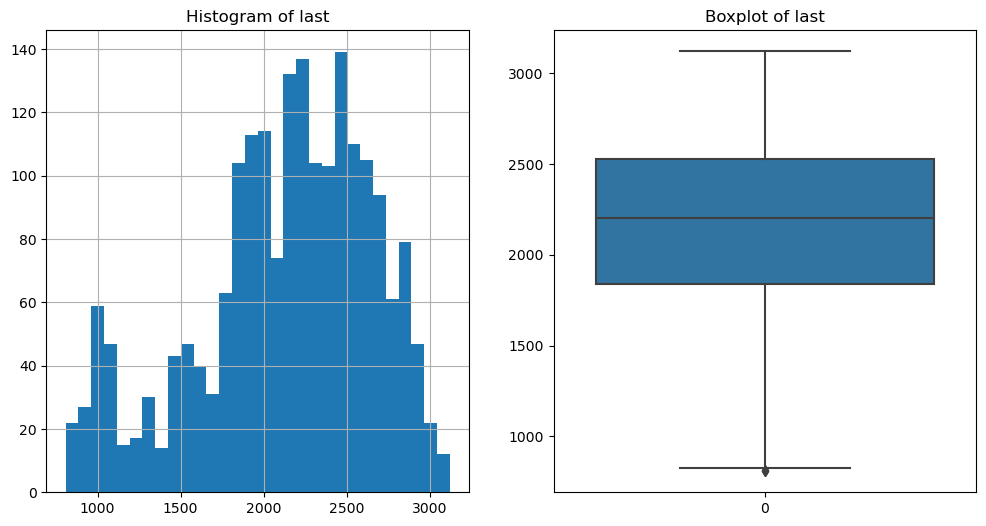

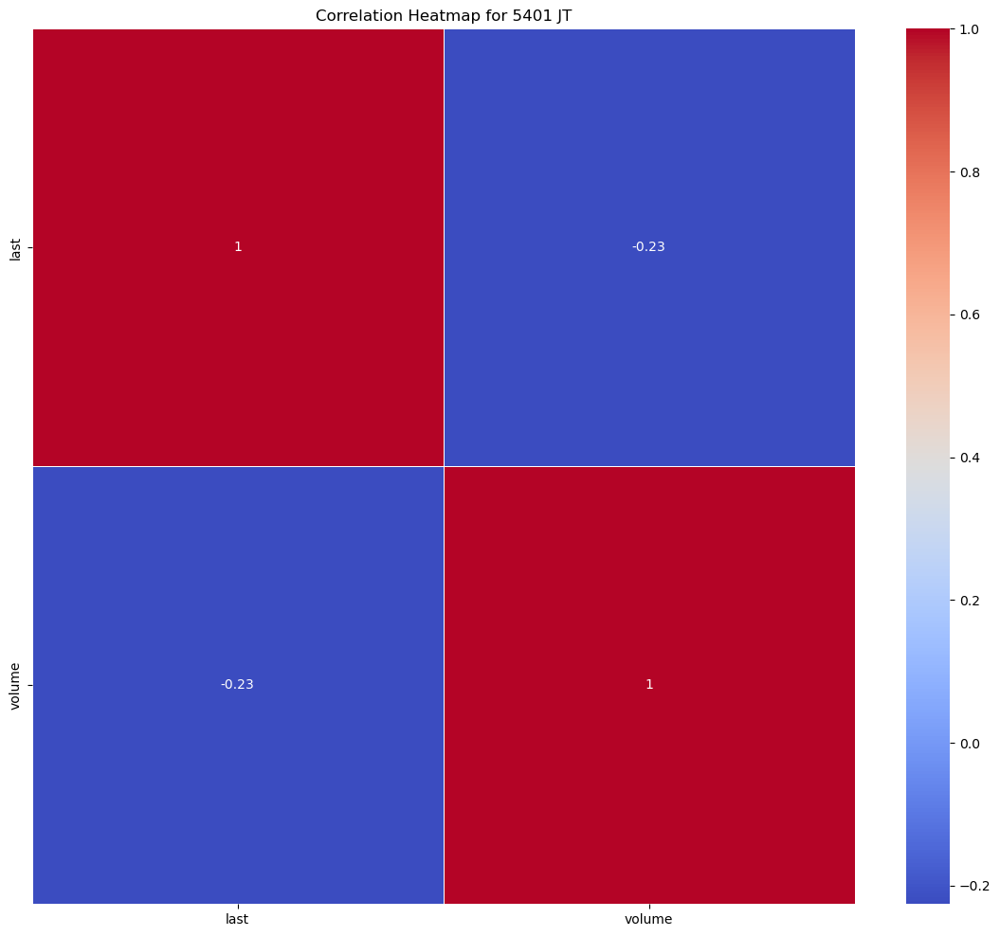

Statistics for stock 5406 JT
---- last ----
Mean: 1073.6750974064837
Median: 1017.626
Mode: 855.1479
Range: 1912.6873
Standard Deviation: 439.19347312877426
Skewness: 0.49424042192389156
Kurtosis: -0.13783542681855643


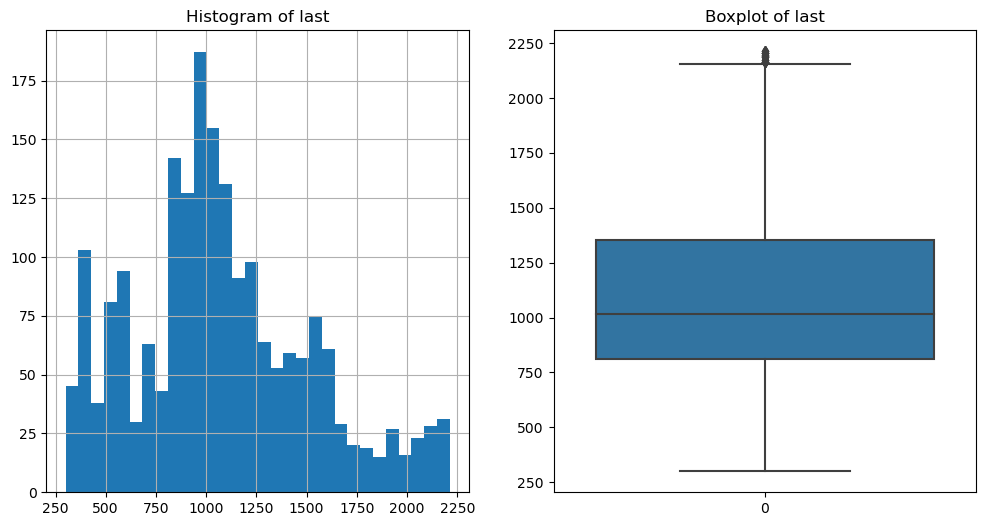

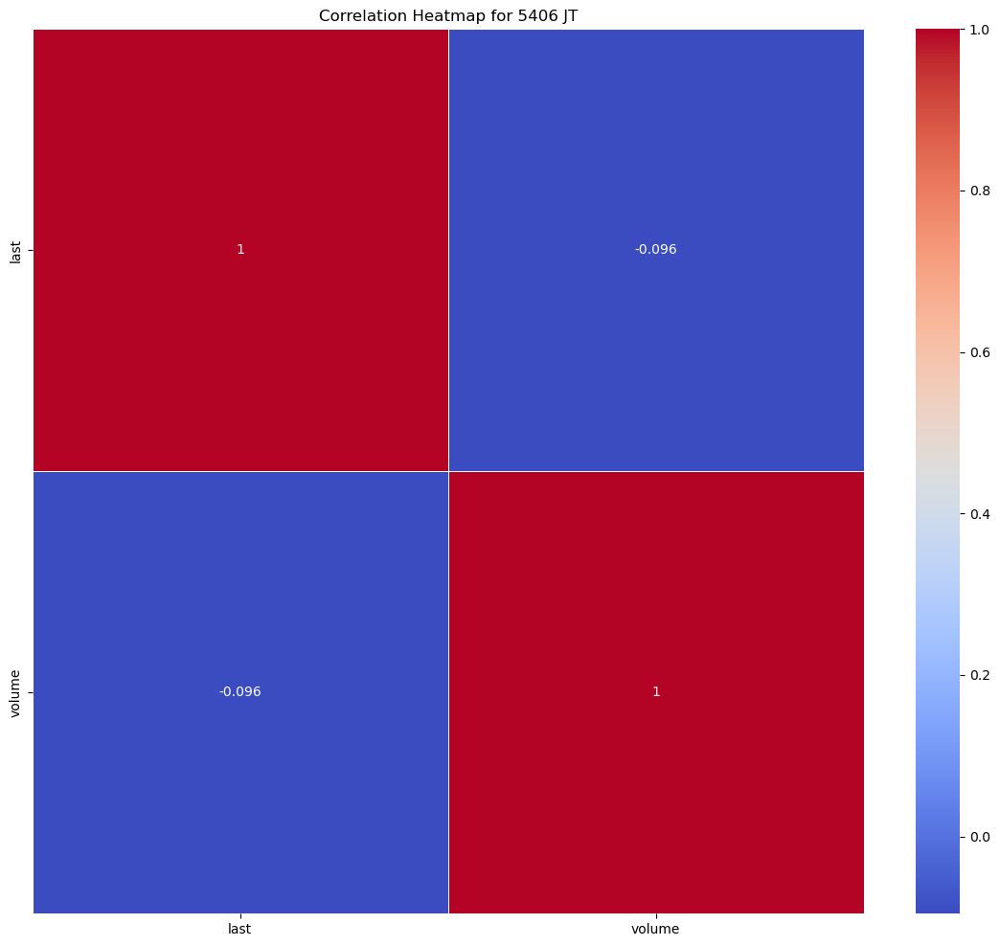

Statistics for stock 5411 JT
---- last ----
Mean: 1697.524873915212
Median: 1734.9548
Mode: 748.0
Range: 2024.4047
Standard Deviation: 468.1162534778092
Skewness: -0.2816060826247197
Kurtosis: -0.4970861595511642


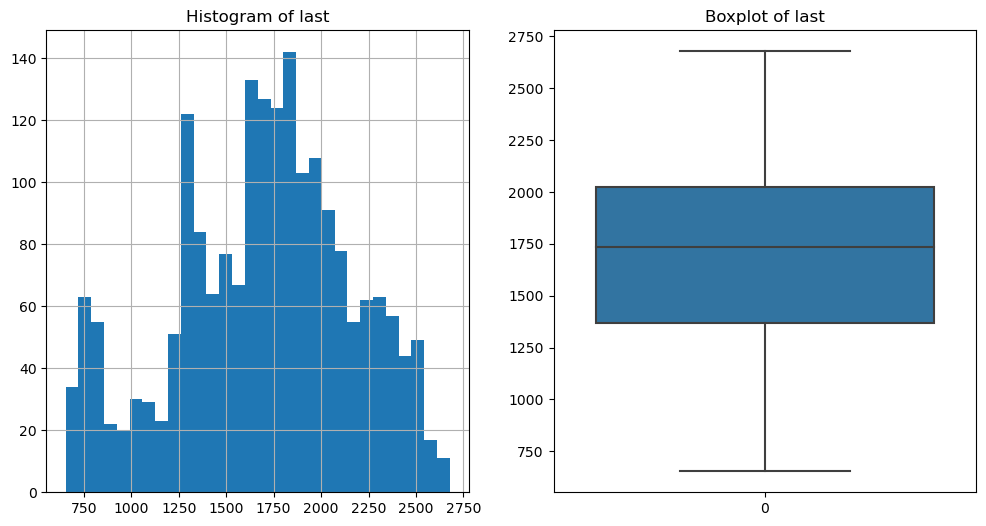

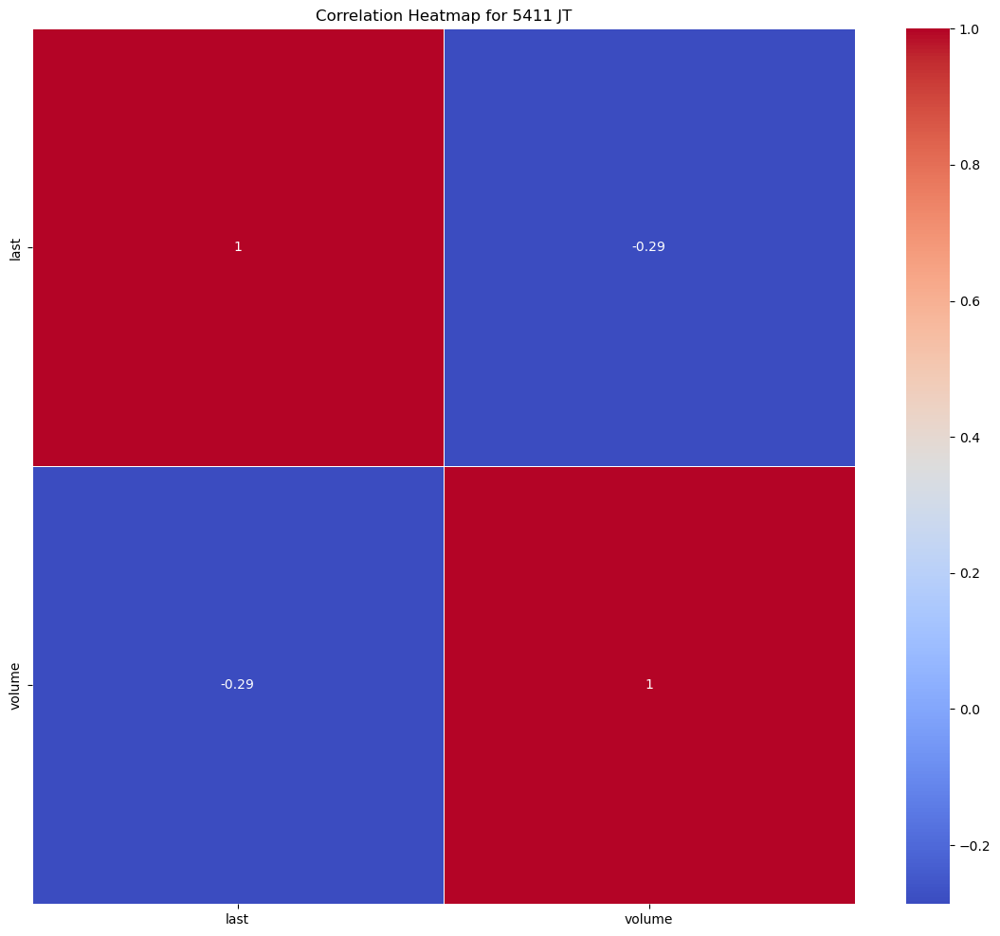

Statistics for stock 5541 JT
---- last ----
Mean: 3154.7071529177056
Median: 3174.7091
Mode: 3543.6356
Range: 4600.2638
Standard Deviation: 839.0614882462507
Skewness: 0.15183182793290562
Kurtosis: -0.12563009190565344


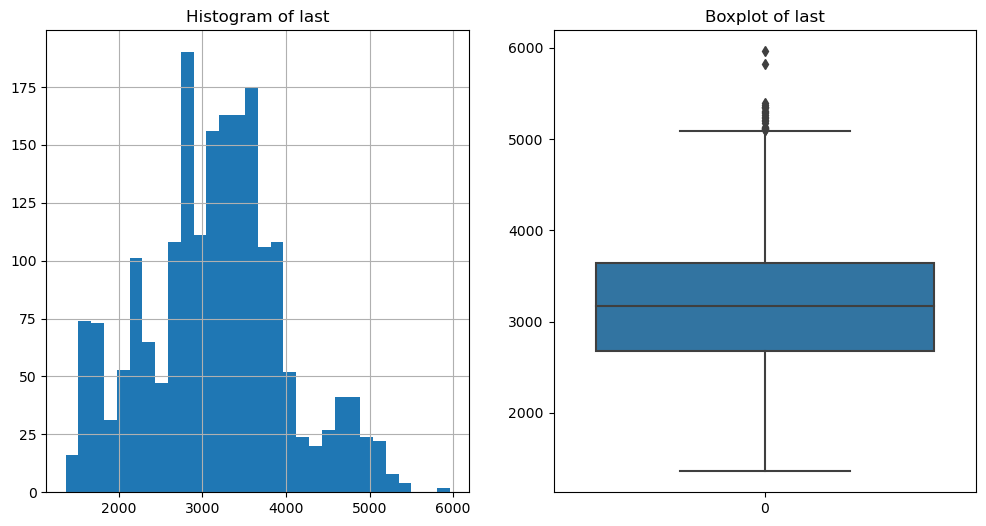

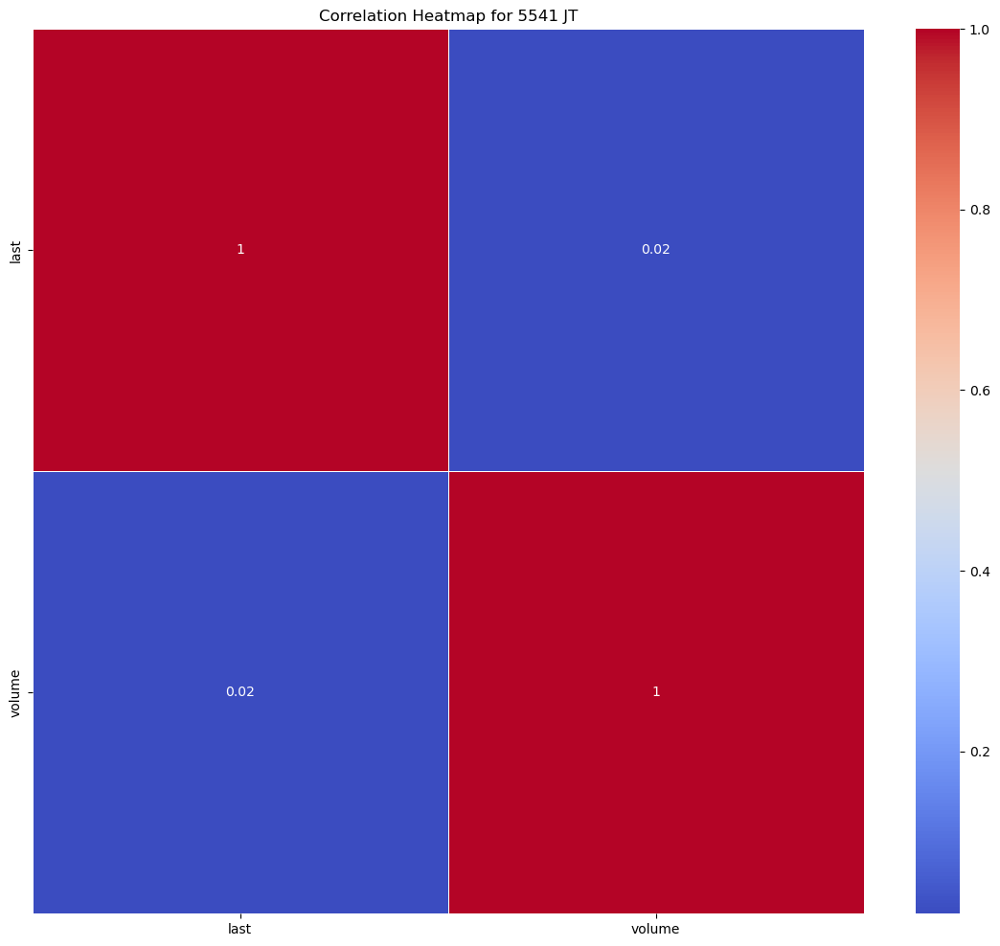

Statistics for stock 5631 JT
---- last ----
Mean: 2164.6779265835407
Median: 2089.7134
Mode: 1775.7226
Range: 2634.3333000000002
Standard Deviation: 478.69943059007466
Skewness: 0.6759119356431262
Kurtosis: 0.19942357338475292


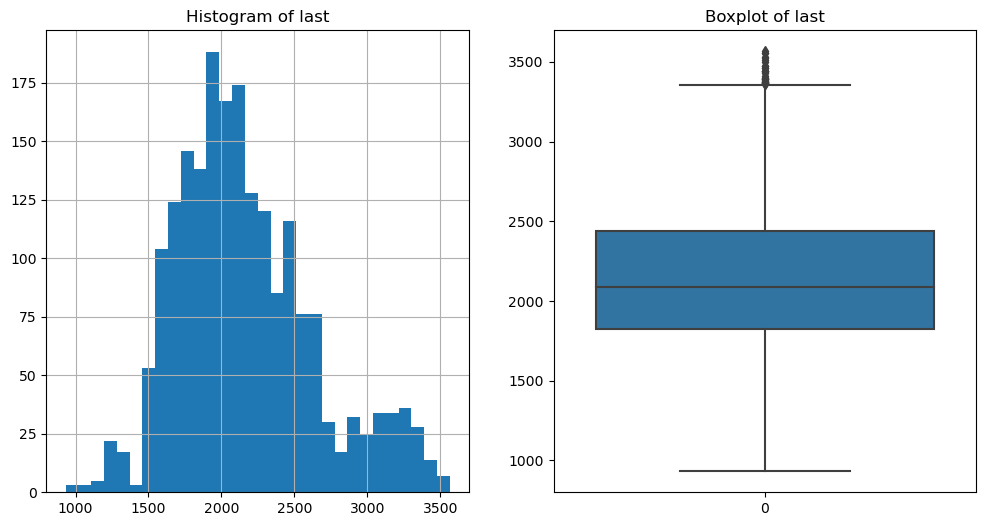

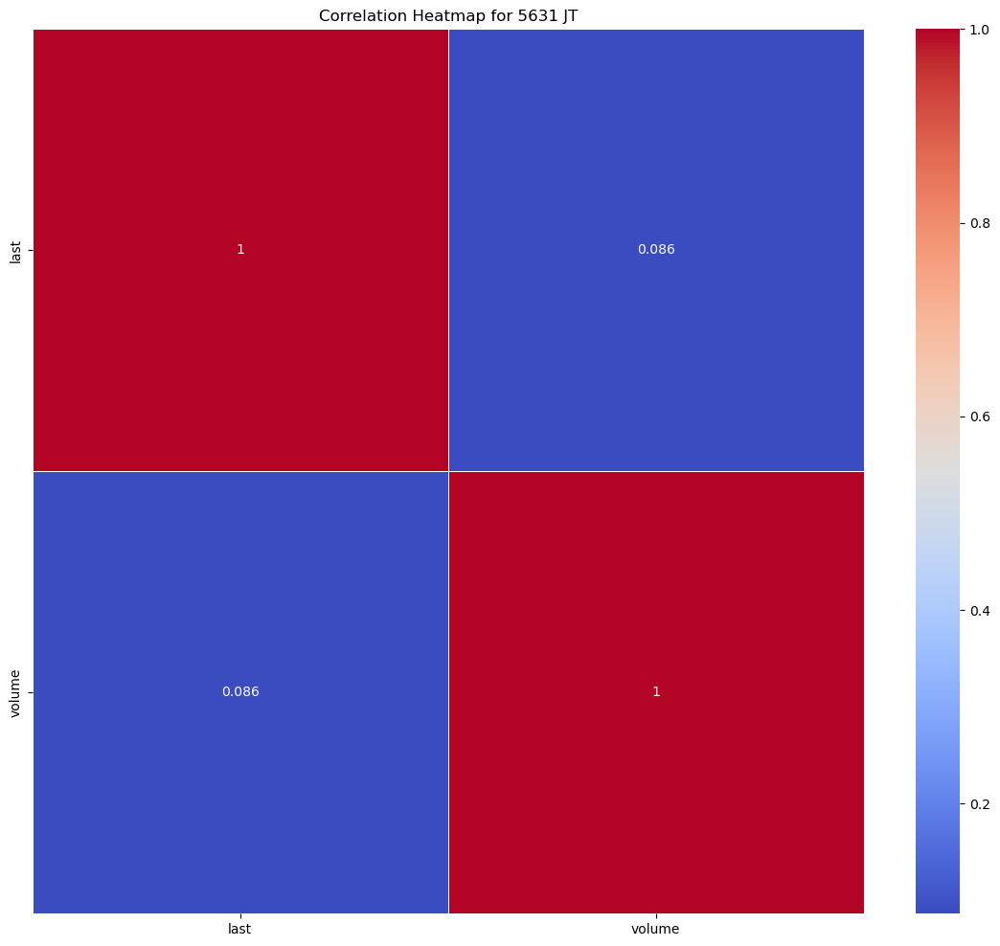

Statistics for stock 5703 JT
---- last ----
Mean: 1838.4434012967579
Median: 1870.0
Mode: 1061.8473
Range: 2421.069
Standard Deviation: 540.4309601457495
Skewness: 0.006694050255594399
Kurtosis: -0.6580454954814243


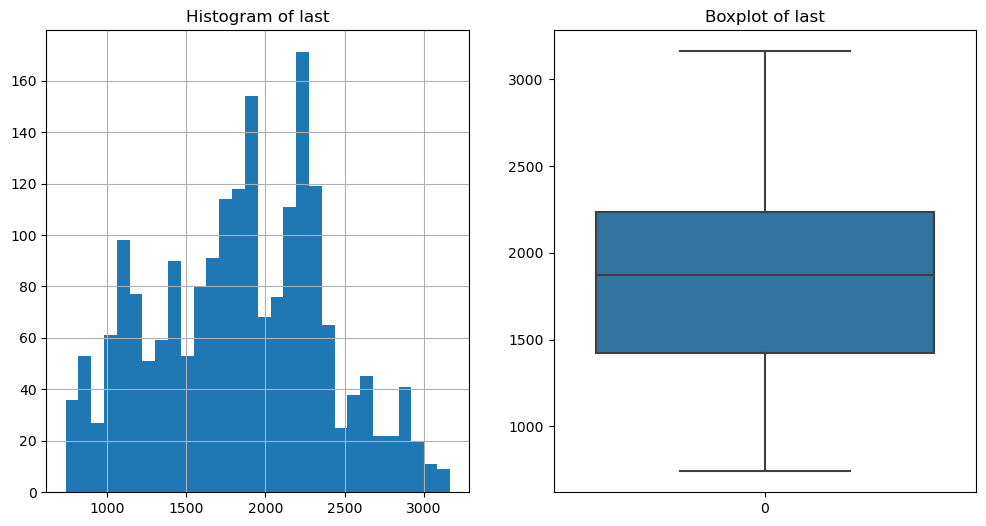

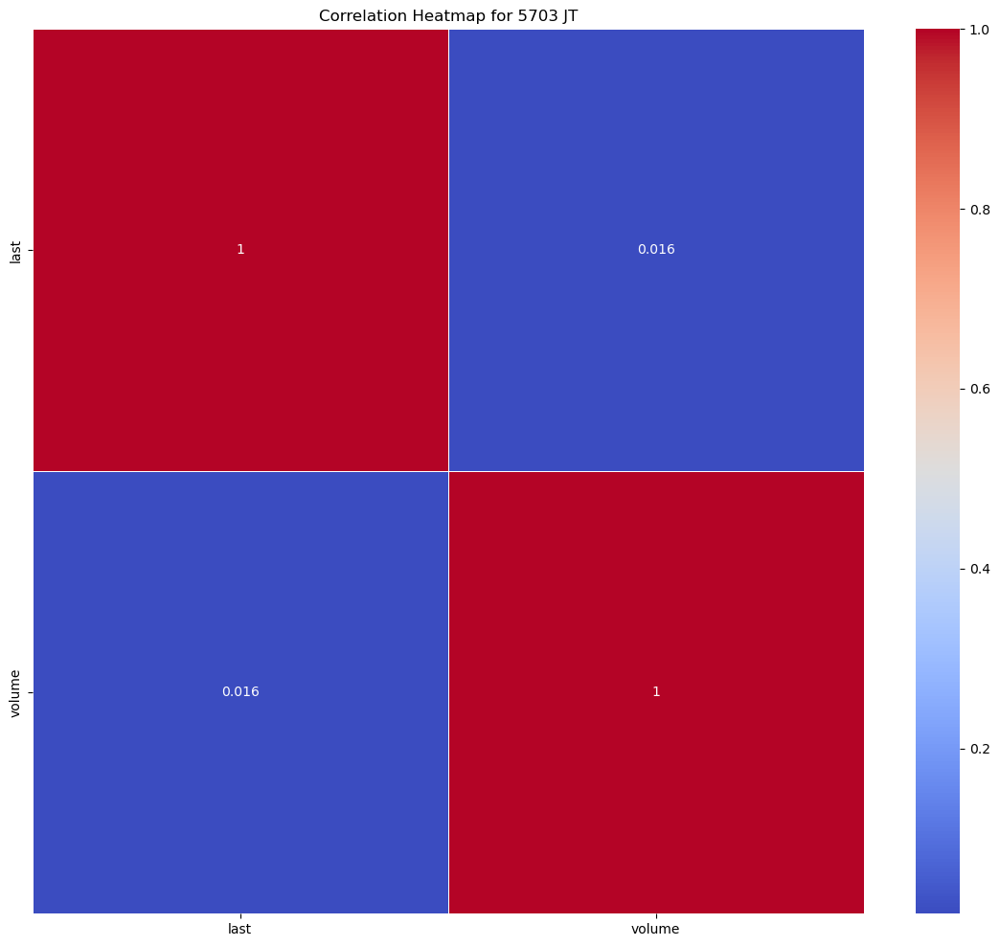

Statistics for stock 5706 JT
---- last ----
Mean: 2785.7740738653365
Median: 2469.9001
Mode: 1771.2334
Range: 5255.744
Standard Deviation: 1048.0450883370645
Skewness: 1.511621123059603
Kurtosis: 1.7747612462972233


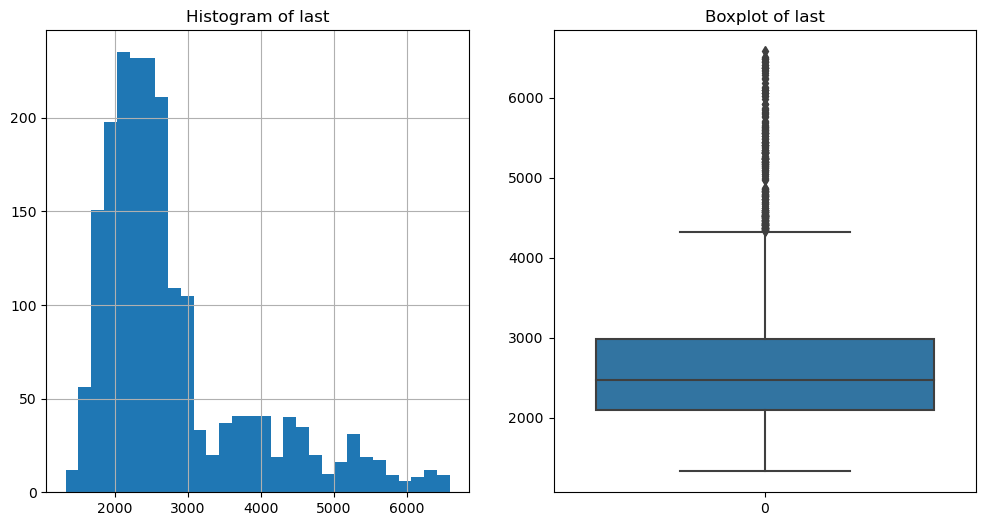

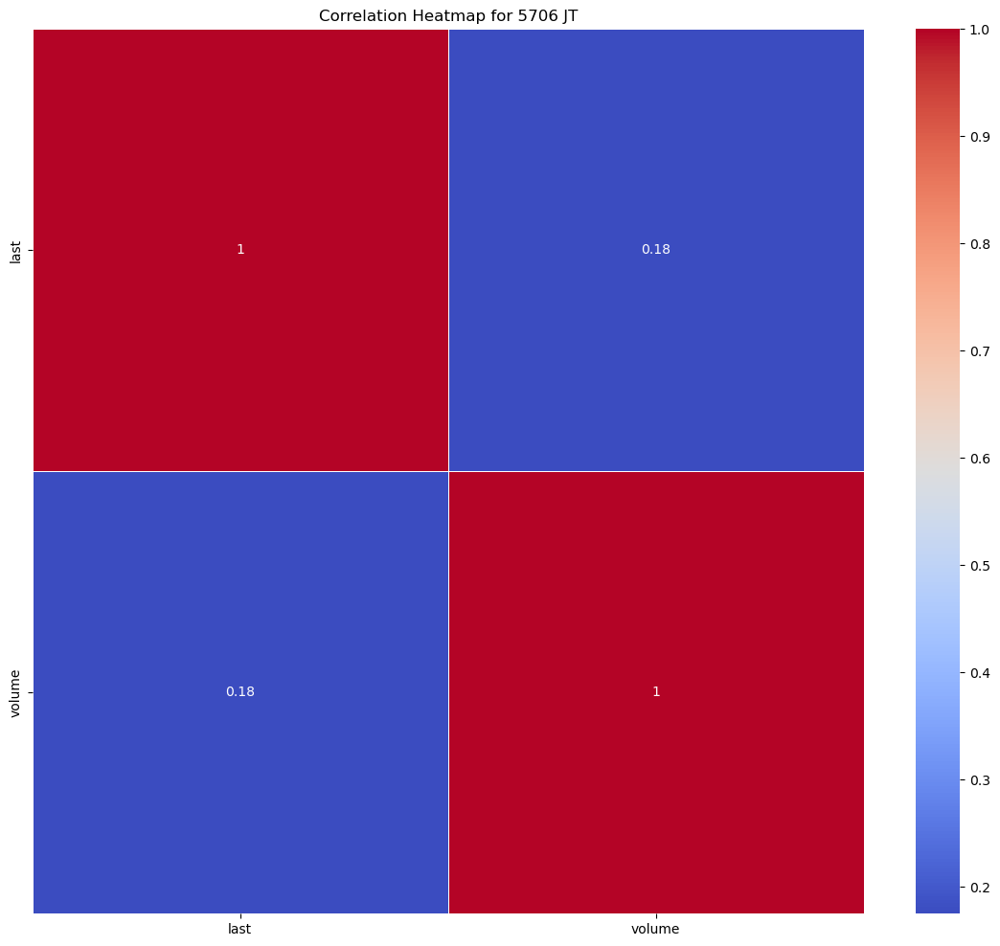

Statistics for stock 5707 JT
---- last ----
Mean: 3283.3265243391525
Median: 3221.6459
Mode: 2981.7442
Range: 5417.4575
Standard Deviation: 1074.312449278575
Skewness: 0.49865852004755423
Kurtosis: -0.0031981871056929734


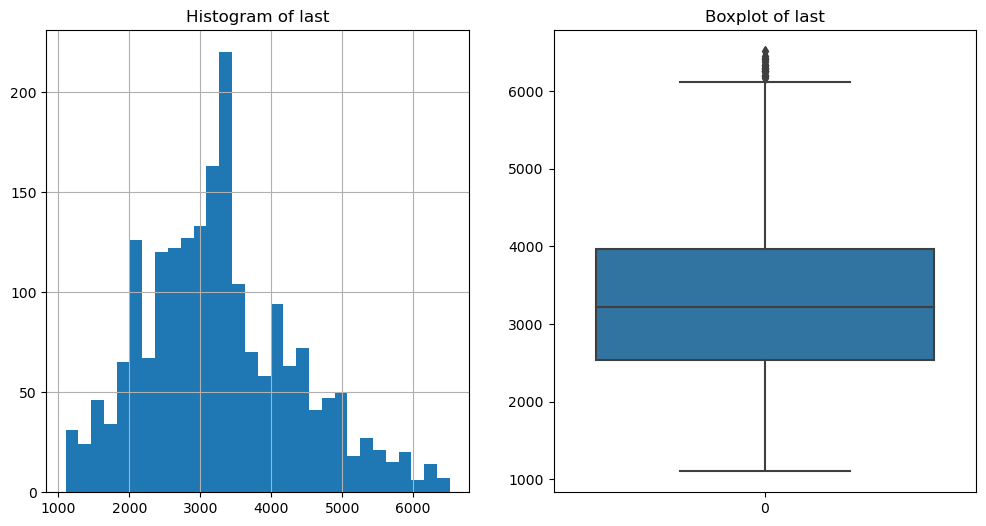

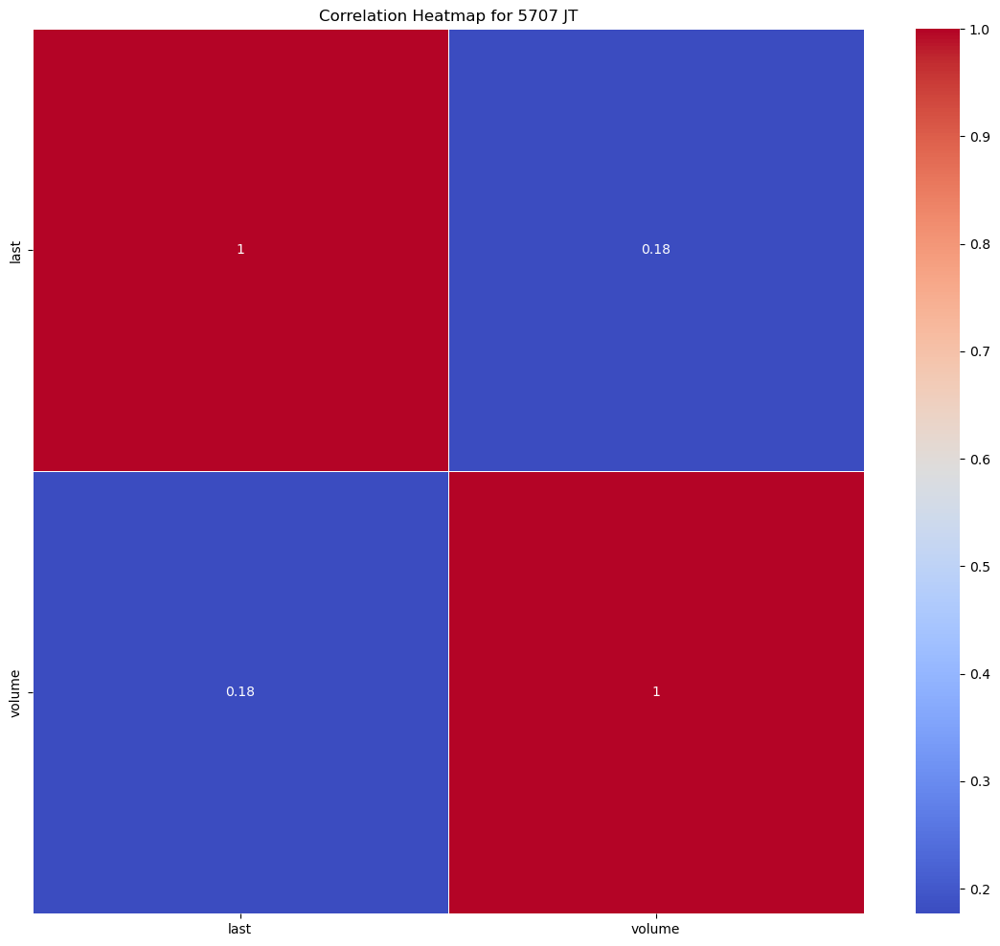

Statistics for stock 5711 JT
---- last ----
Mean: 2976.017455461347
Median: 2961.6663
Mode: 2463.3852
Range: 2721.192
Standard Deviation: 500.15200311425747
Skewness: 0.22067464964305397
Kurtosis: -0.14253493213639512


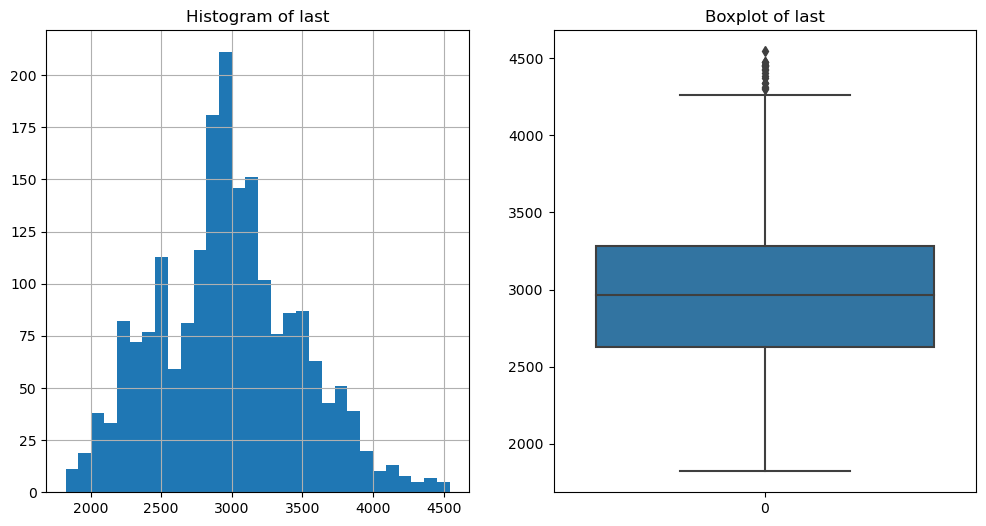

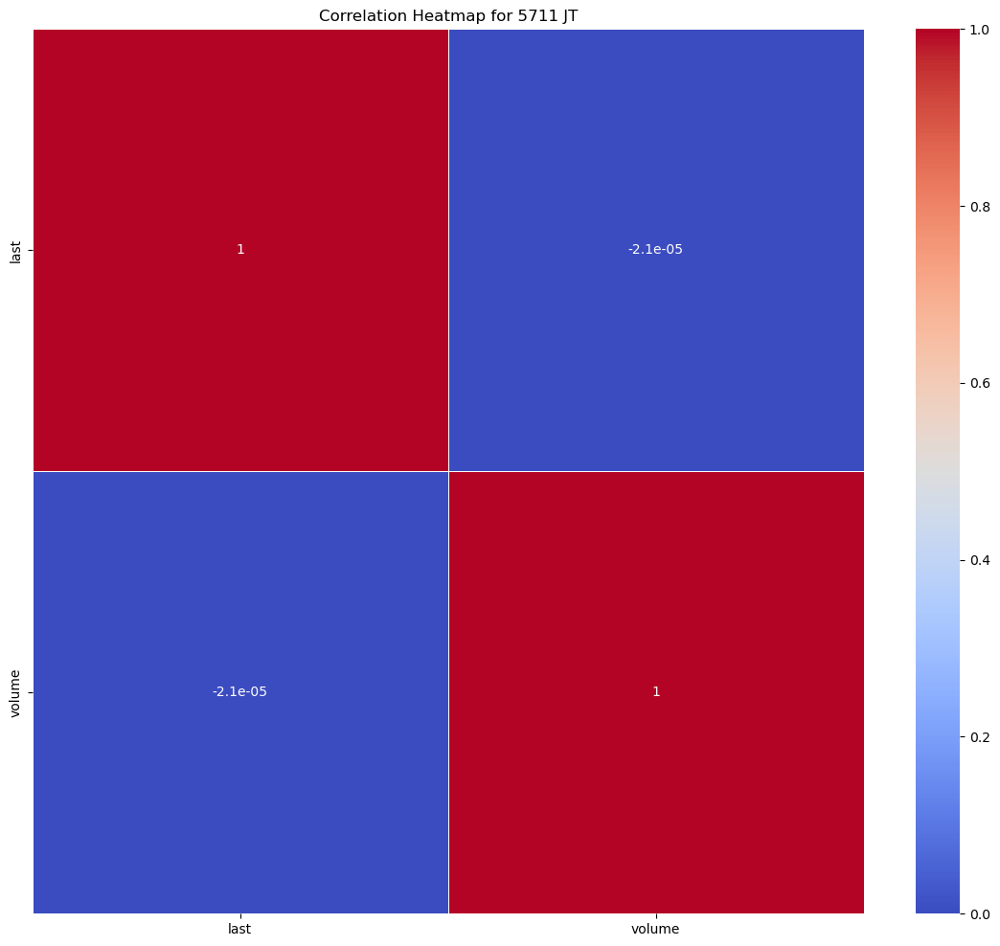

Statistics for stock 5713 JT
---- last ----
Mean: 3022.098941446384
Median: 2922.5498
Mode: 2042.9858
Range: 3765.7834000000003
Standard Deviation: 718.1755107333262
Skewness: 0.9232637280794201
Kurtosis: 0.5811840485863797


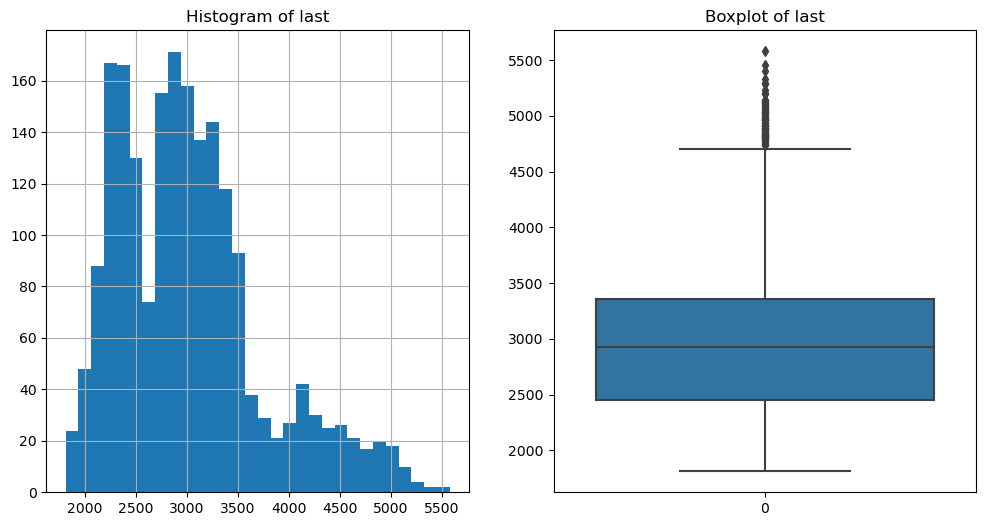

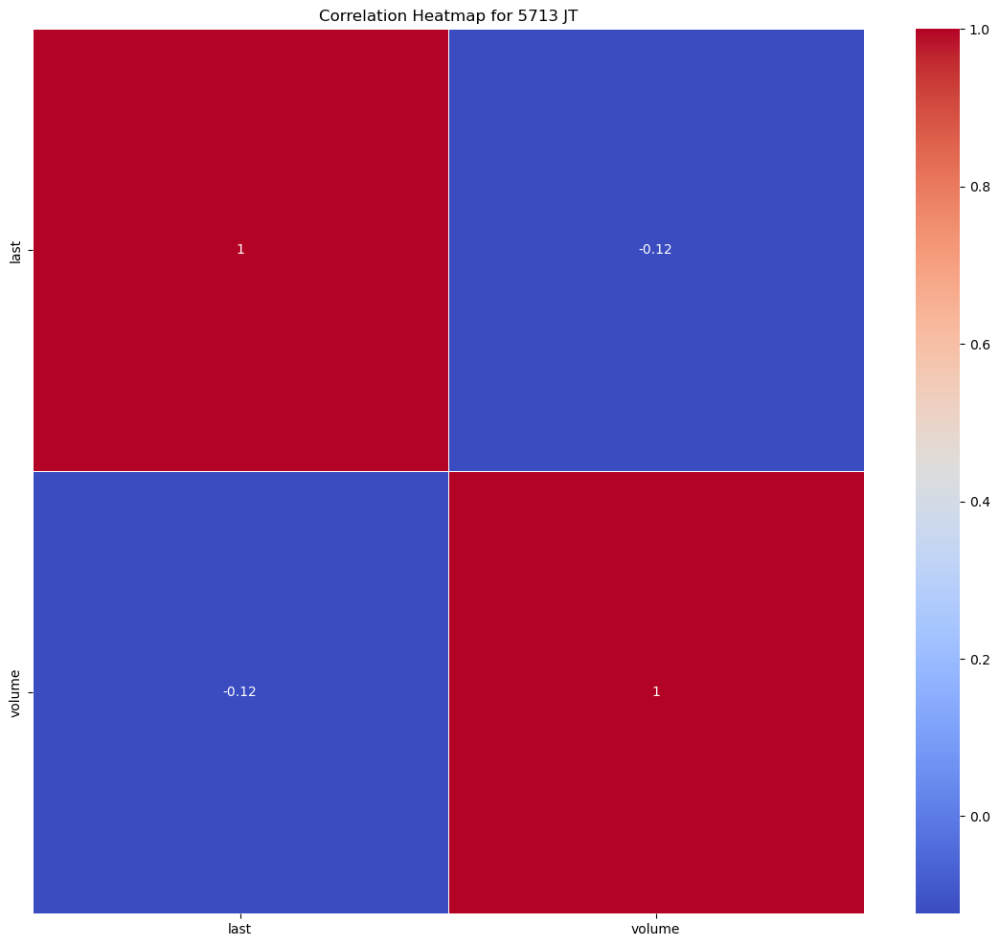

Statistics for stock 5714 JT
---- last ----
Mean: 3688.863789825437
Median: 3696.1513
Mode: 3352.2106
Range: 3184.6803
Standard Deviation: 559.9291743952103
Skewness: 0.1261160571725927
Kurtosis: -0.04195193072124592


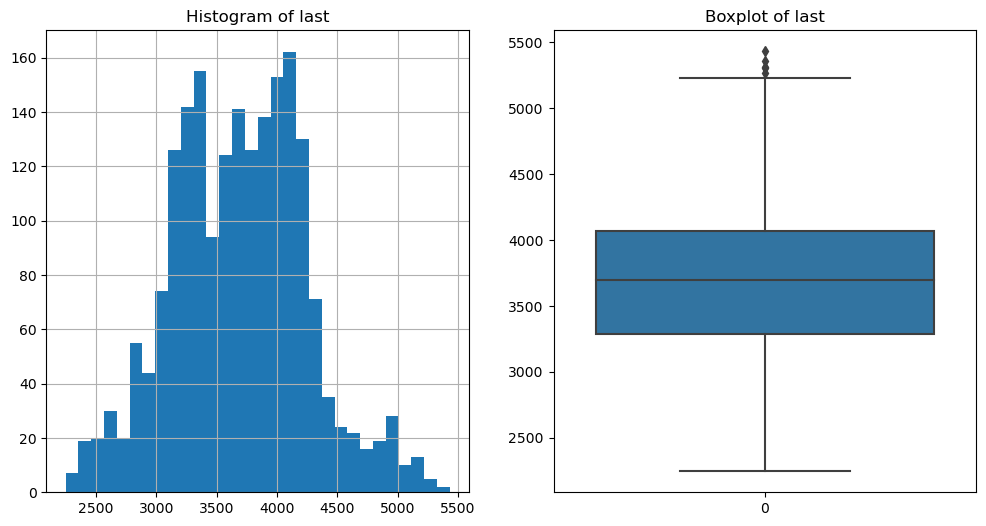

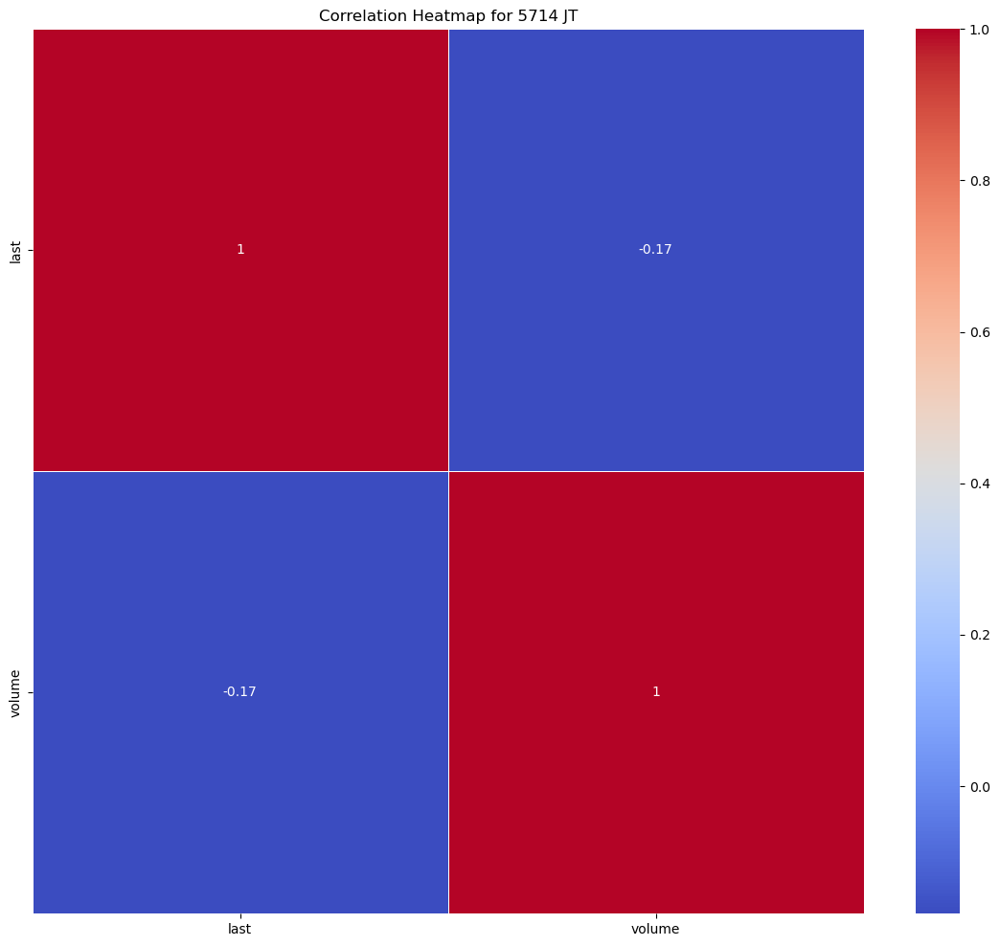

Statistics for stock 5801 JT
---- last ----
Mean: 2784.333930074813
Median: 2449.0
Mode: 1851.2177
Range: 5102.7784
Standard Deviation: 1078.6975510739426
Skewness: 1.4122059033571166
Kurtosis: 1.2032681137342305


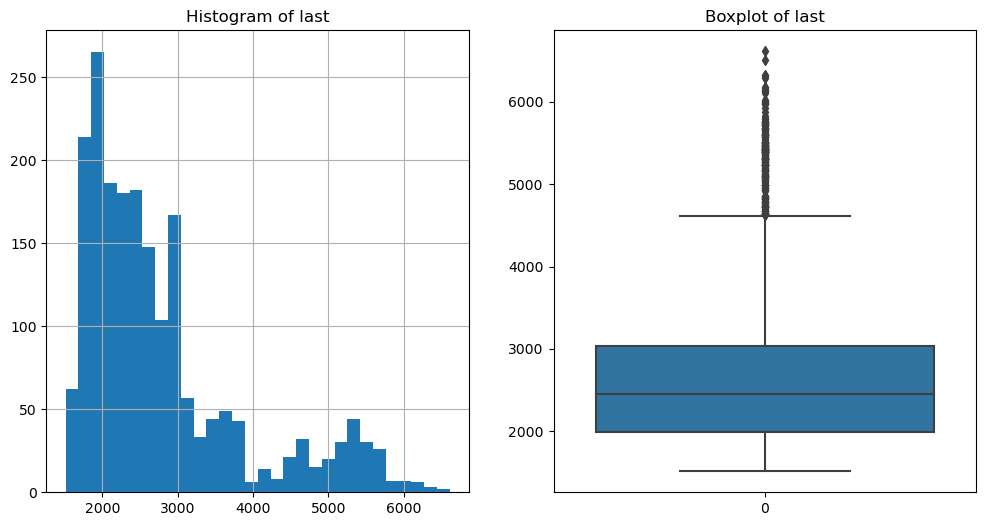

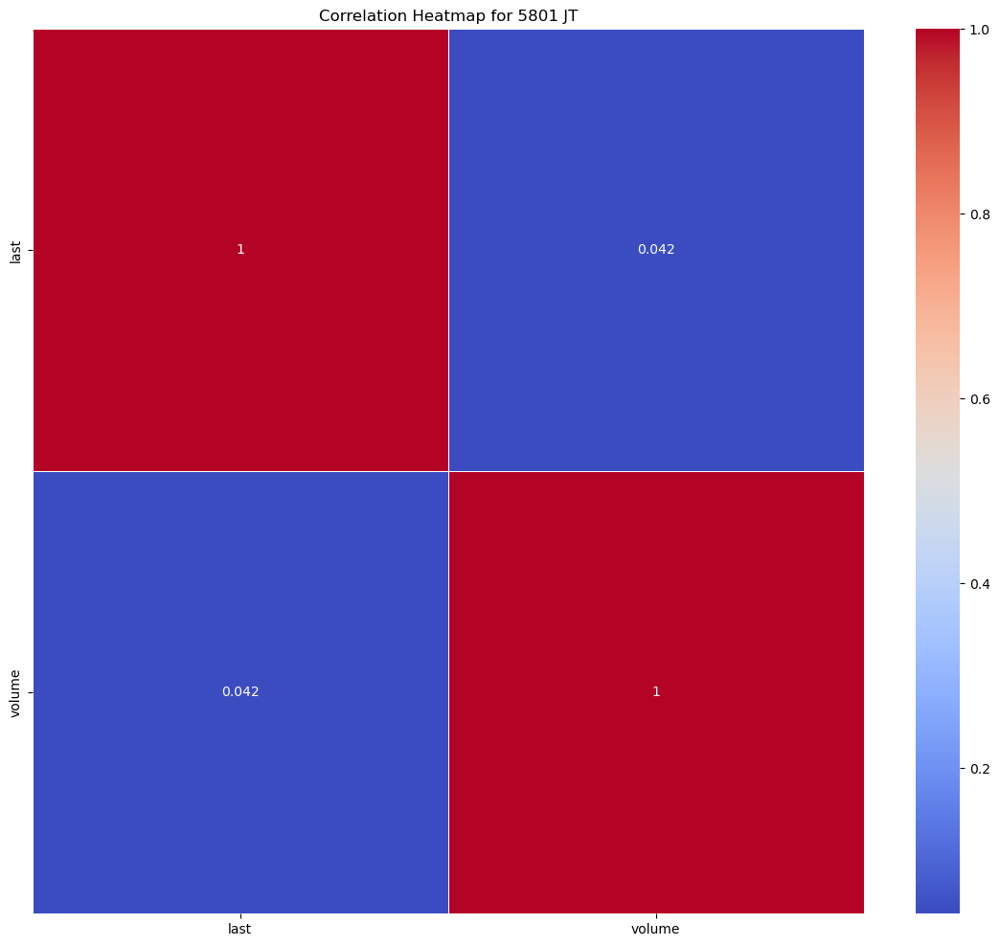

Statistics for stock 5802 JT
---- last ----
Mean: 1373.4398805985036
Median: 1358.0502
Mode: 859.3687
Range: 994.2114
Standard Deviation: 205.05280520755102
Skewness: -0.17172435950574938
Kurtosis: -0.3801040284877919


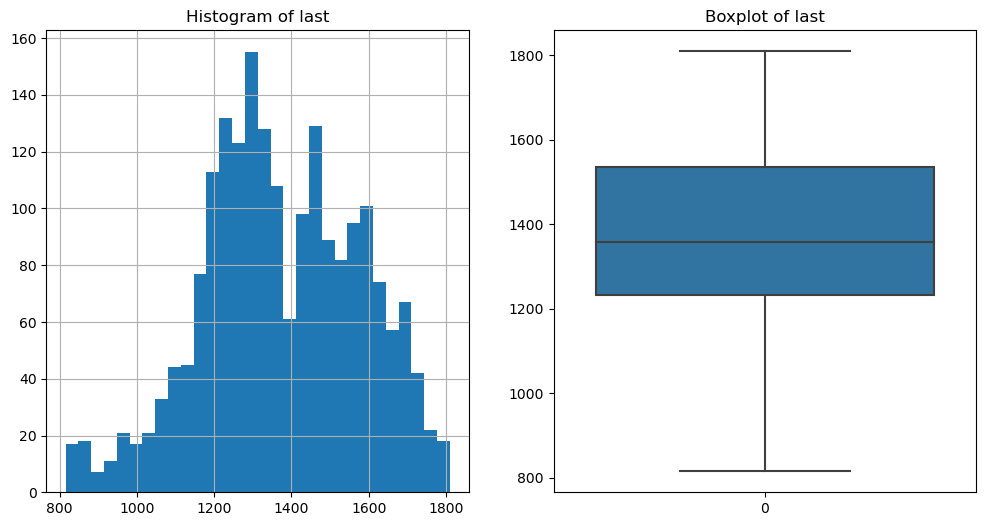

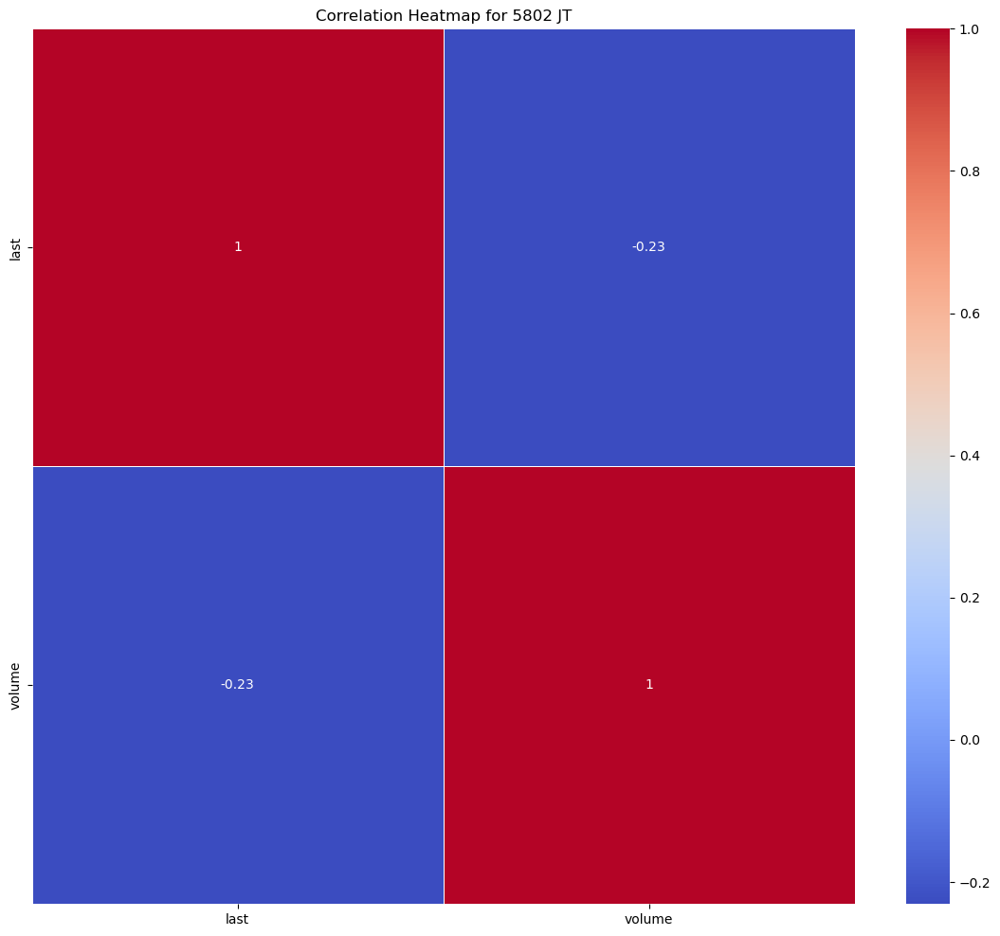

Statistics for stock 5803 JT
---- last ----
Mean: 515.1243717705736
Median: 468.7578
Mode: 434.1904
Range: 899.2239
Standard Deviation: 181.02356193783413
Skewness: 0.9743948865169239
Kurtosis: 0.4813759049693842


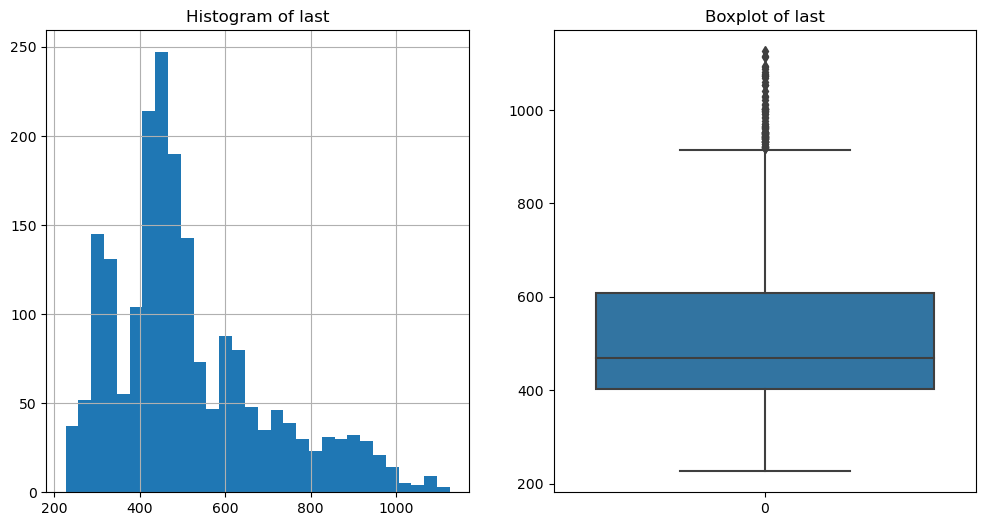

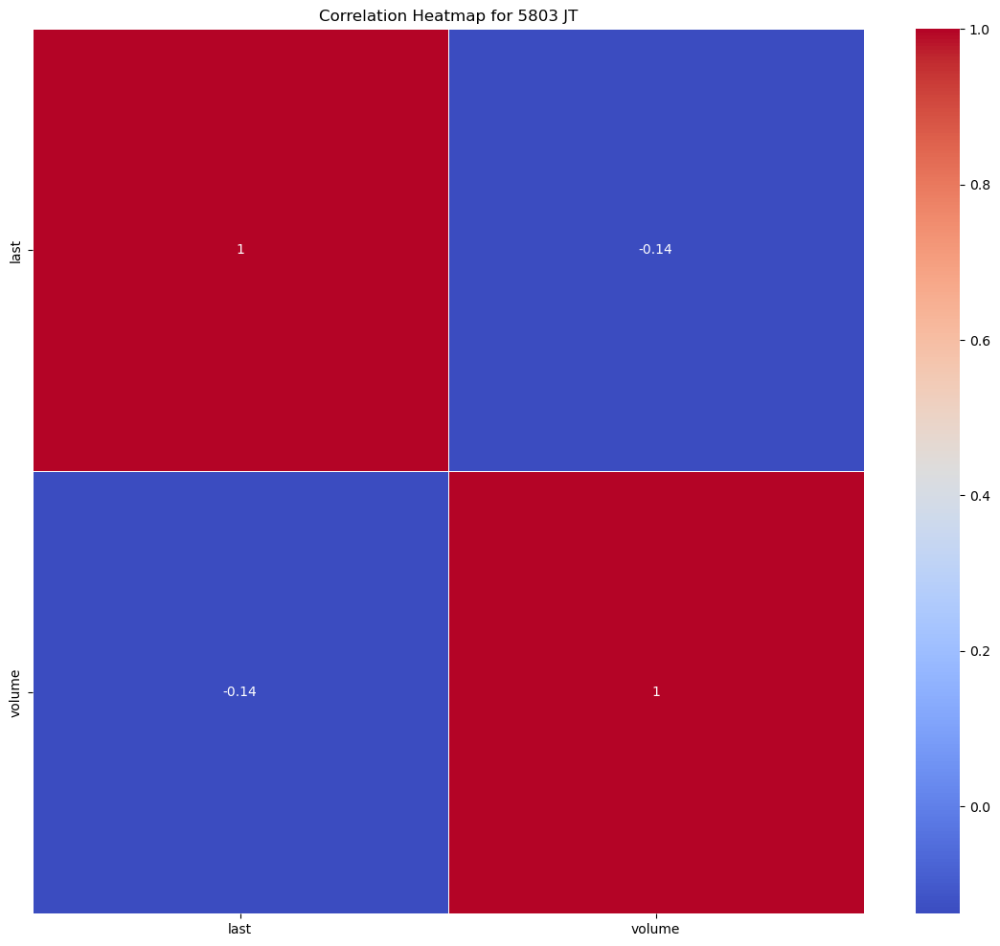

Statistics for stock 5901 JT
---- last ----
Mean: 1720.2422581546134
Median: 1776.6218
Mode: 1811.9127
Range: 1633.3462
Standard Deviation: 362.52885228245475
Skewness: -0.12220738412576579
Kurtosis: -0.6824741960007485


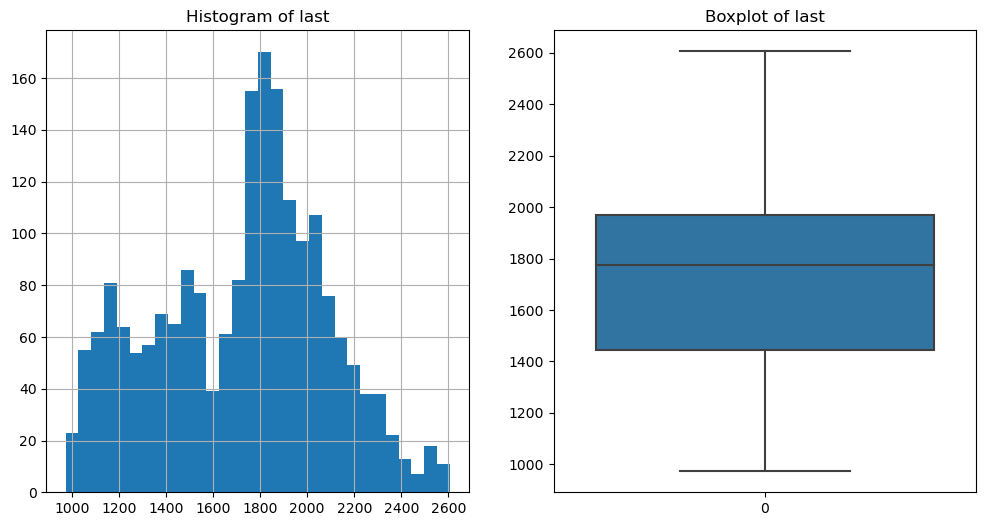

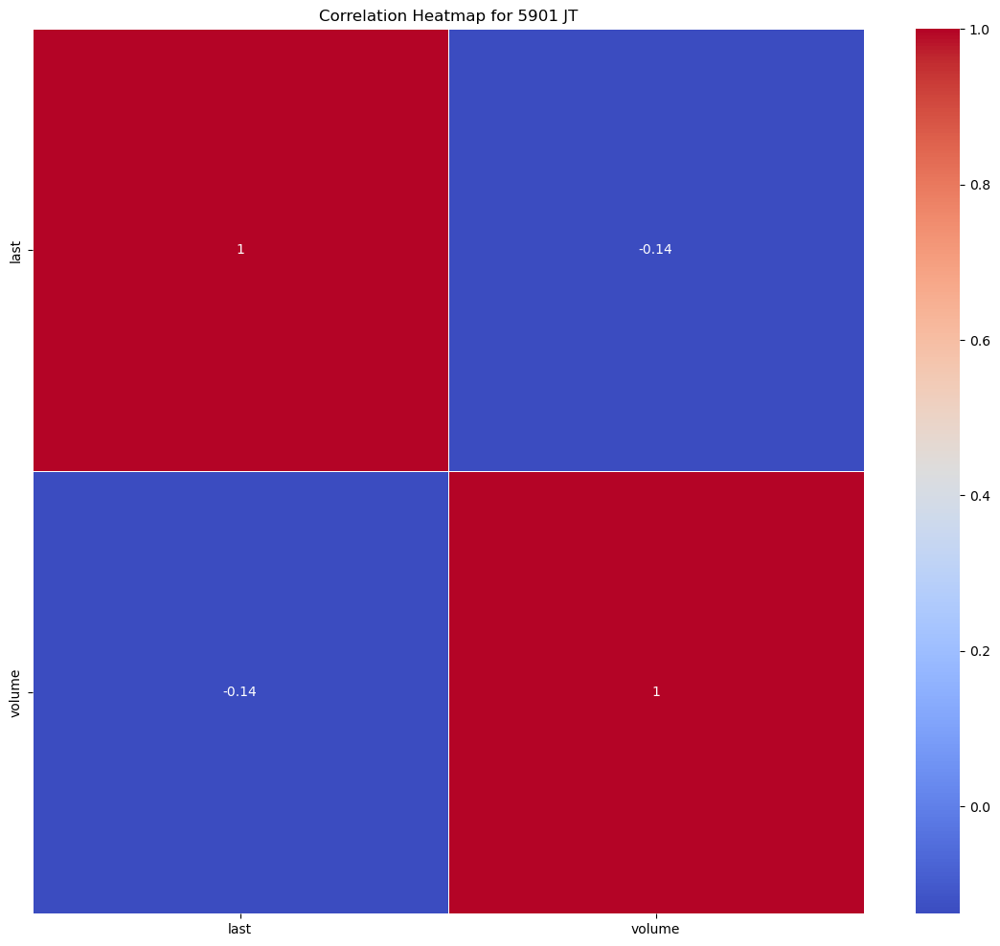

Statistics for stock 6103 JT
---- last ----
Mean: 4803.054761346634
Median: 4907.0181
Mode: 3293.1842
Range: 5172.3536
Standard Deviation: 1066.2836768673528
Skewness: 0.04035952541527475
Kurtosis: -0.9048672748759894


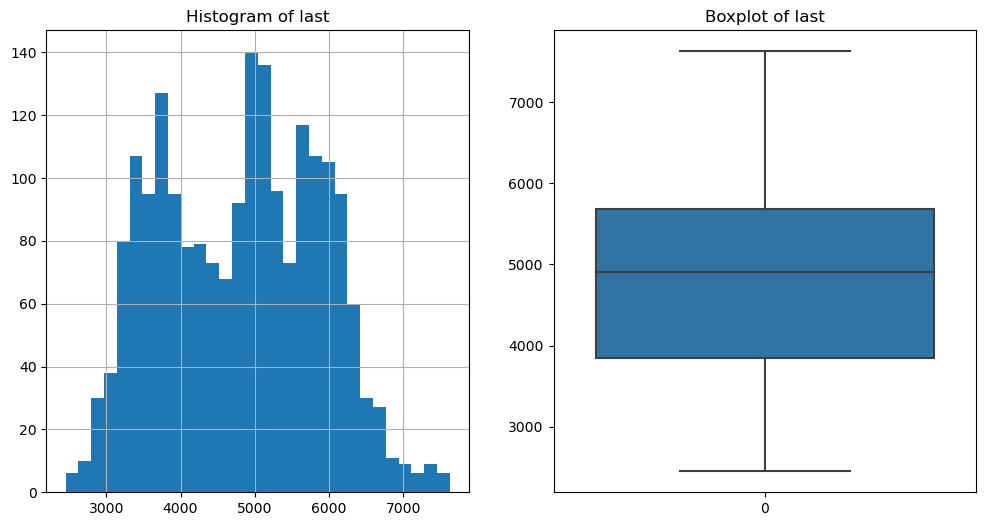

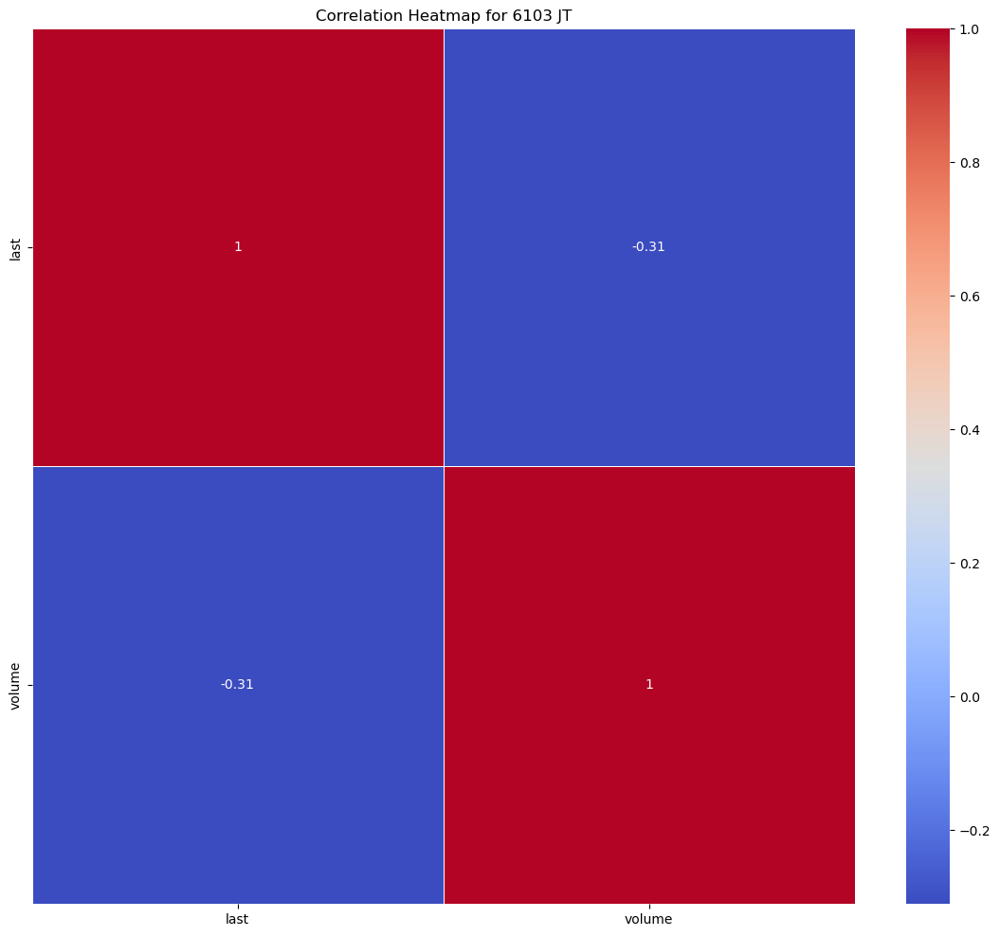

Statistics for stock 6113 JT
---- last ----
Mean: 947.3523131670822
Median: 968.5863
Mode: 569.8367
Range: 1078.2827
Standard Deviation: 213.80932846156767
Skewness: -0.39893276833559266
Kurtosis: -0.18764157927504144


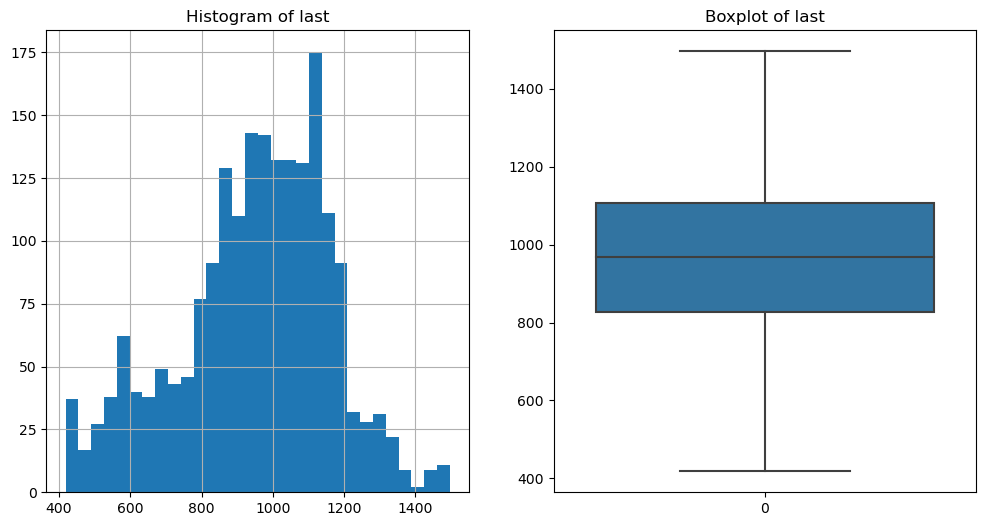

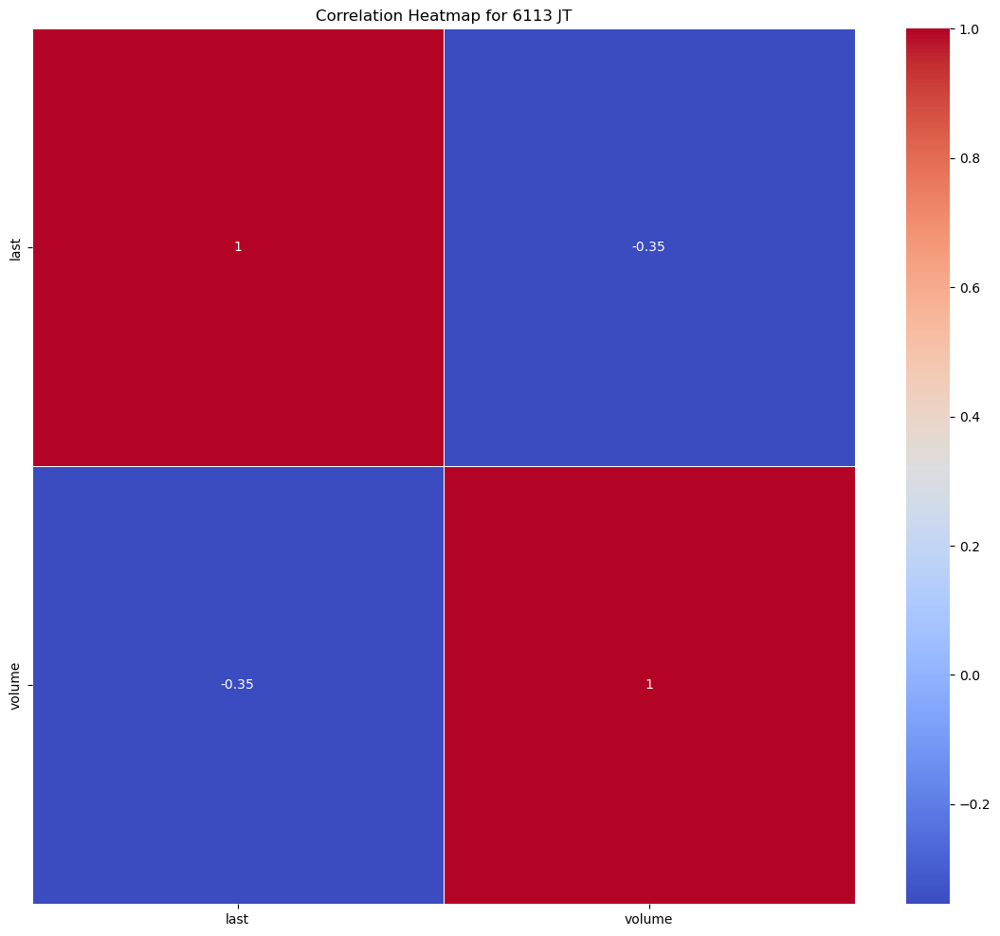

Statistics for stock 6301 JT
---- last ----
Mean: 2289.4676606982543
Median: 2201.2822
Mode: 1912.749
Range: 2671.3301
Standard Deviation: 526.7970075708553
Skewness: 0.8196065381274721
Kurtosis: 0.20271172345324873


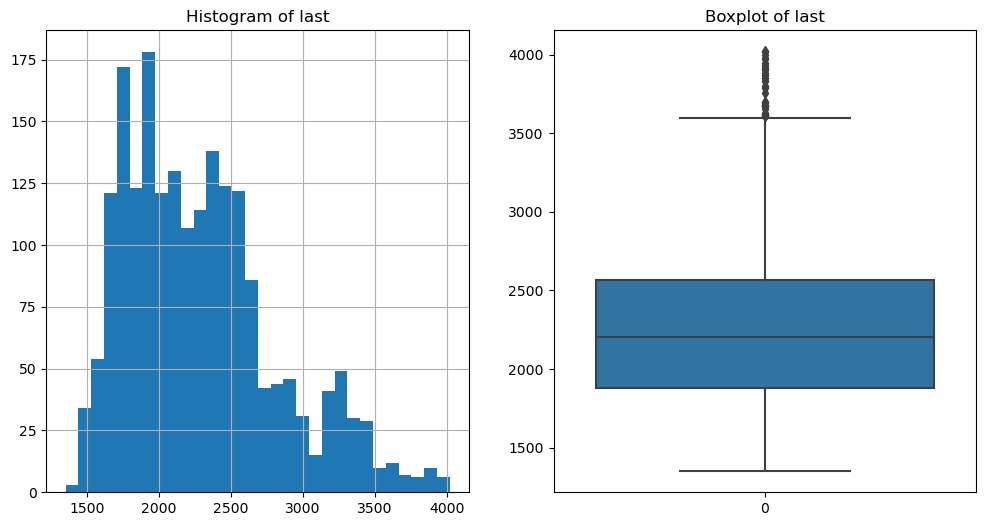

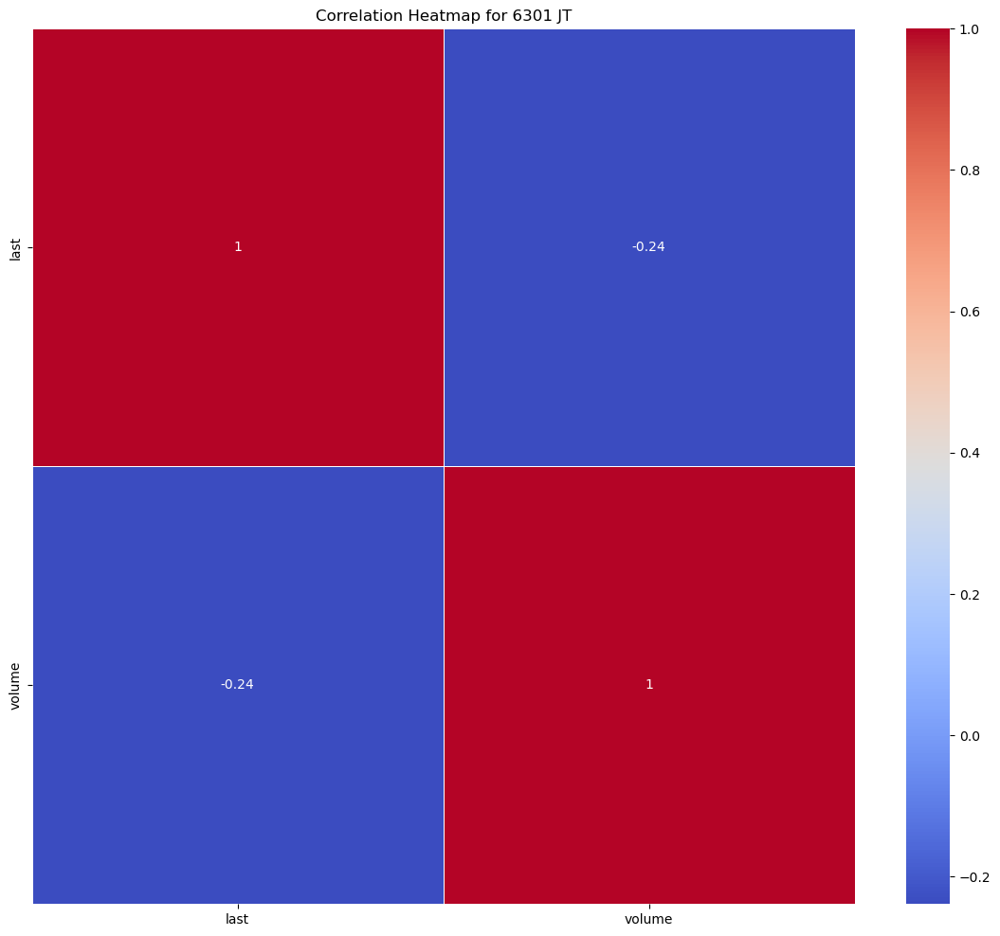

Statistics for stock 6302 JT
---- last ----
Mean: 2804.12941925187
Median: 2763.2411
Mode: 1969.6566
Range: 3277.0840000000003
Standard Deviation: 757.82930094975
Skewness: 0.27954640647865797
Kurtosis: -0.9248718164773253


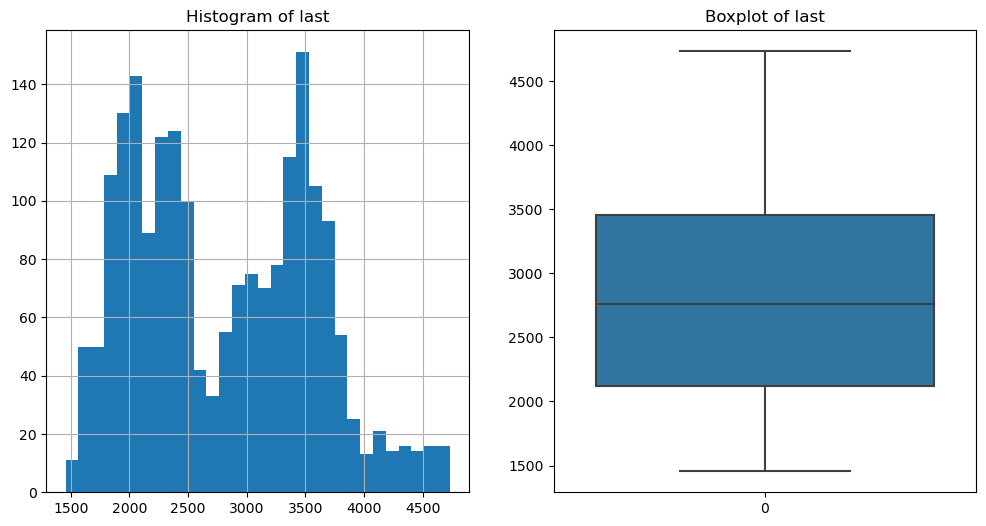

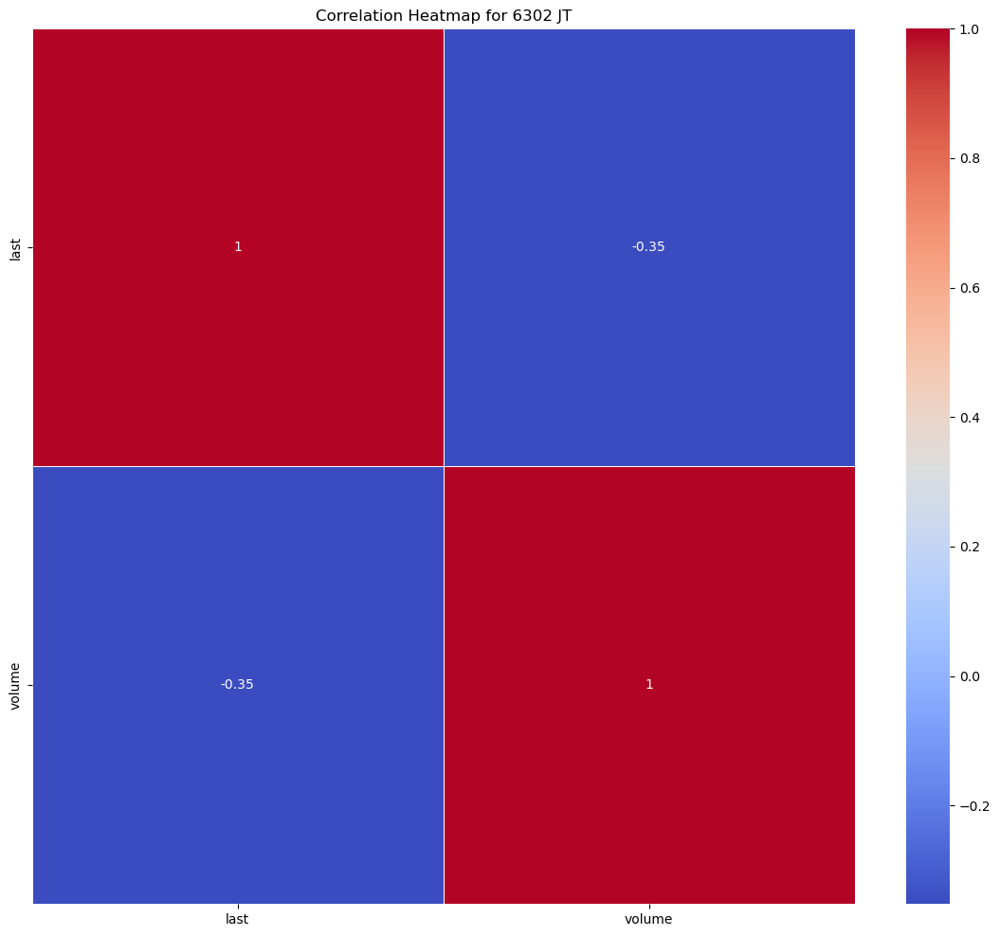

Statistics for stock 6305 JT
---- last ----
Mean: 2420.3072333167083
Median: 2323.2822
Mode: 2849.5942
Range: 3290.1936
Standard Deviation: 721.1408868501501
Skewness: 0.6229627233780646
Kurtosis: -0.6204633701524611


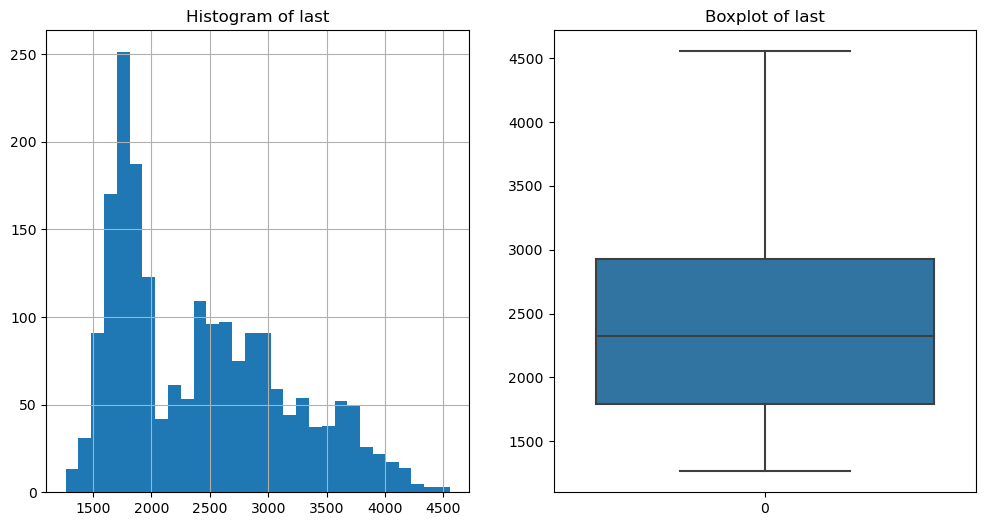

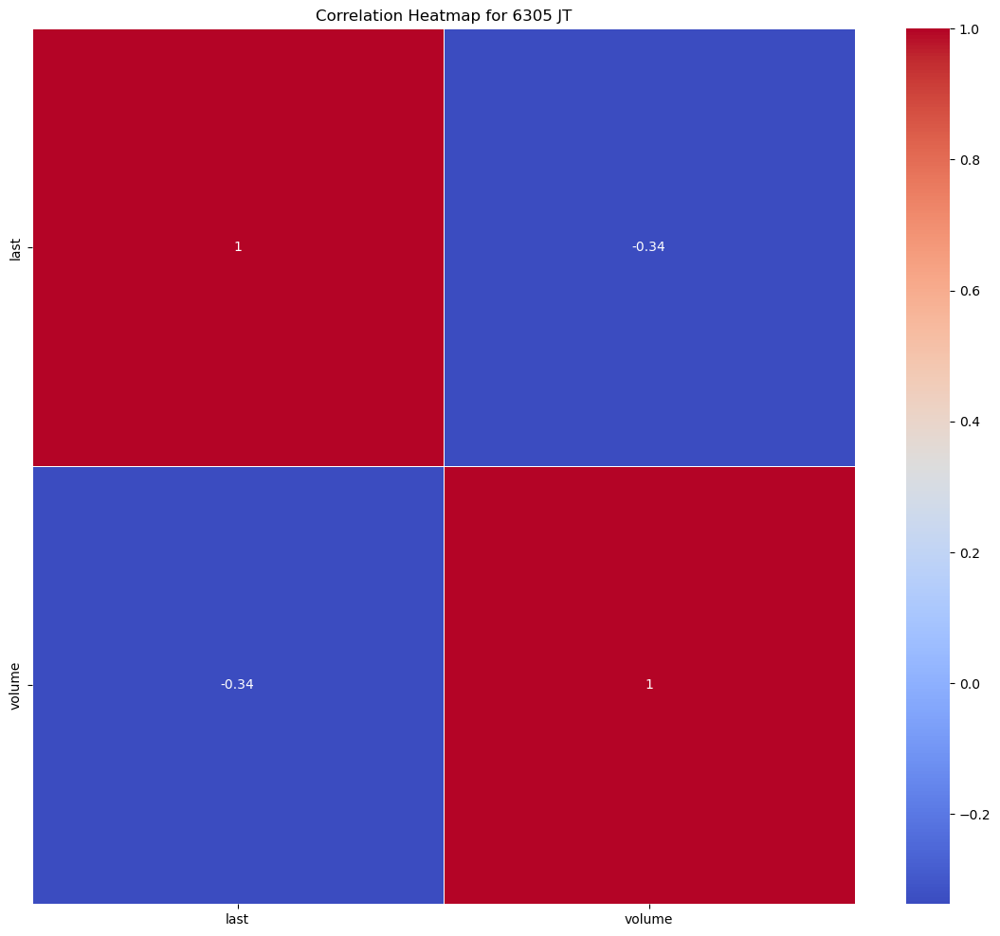

Statistics for stock 6326 JT
---- last ----
Mean: 1586.576324488778
Median: 1593.7144
Mode: 1736.7895
Range: 1734.6925
Standard Deviation: 285.0922191664244
Skewness: 0.36796015344541133
Kurtosis: 0.8625991218145823


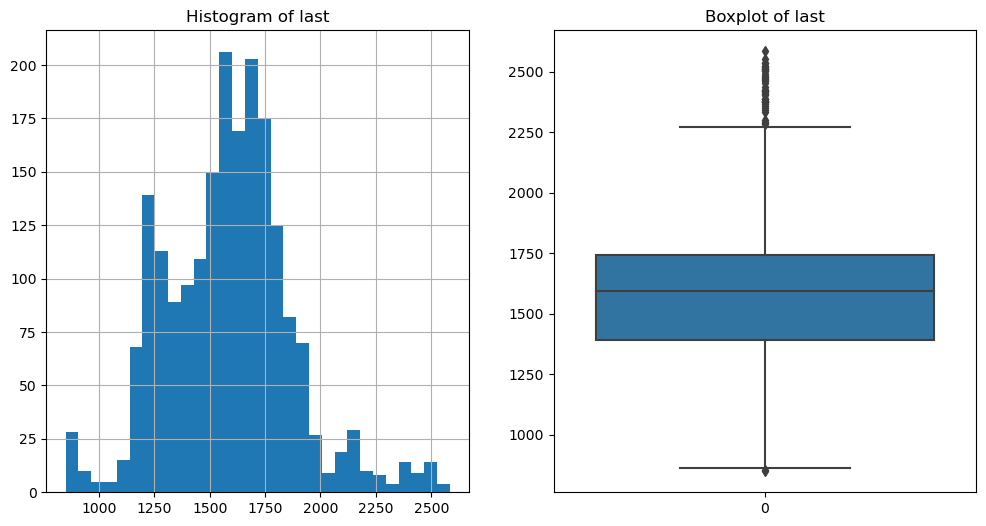

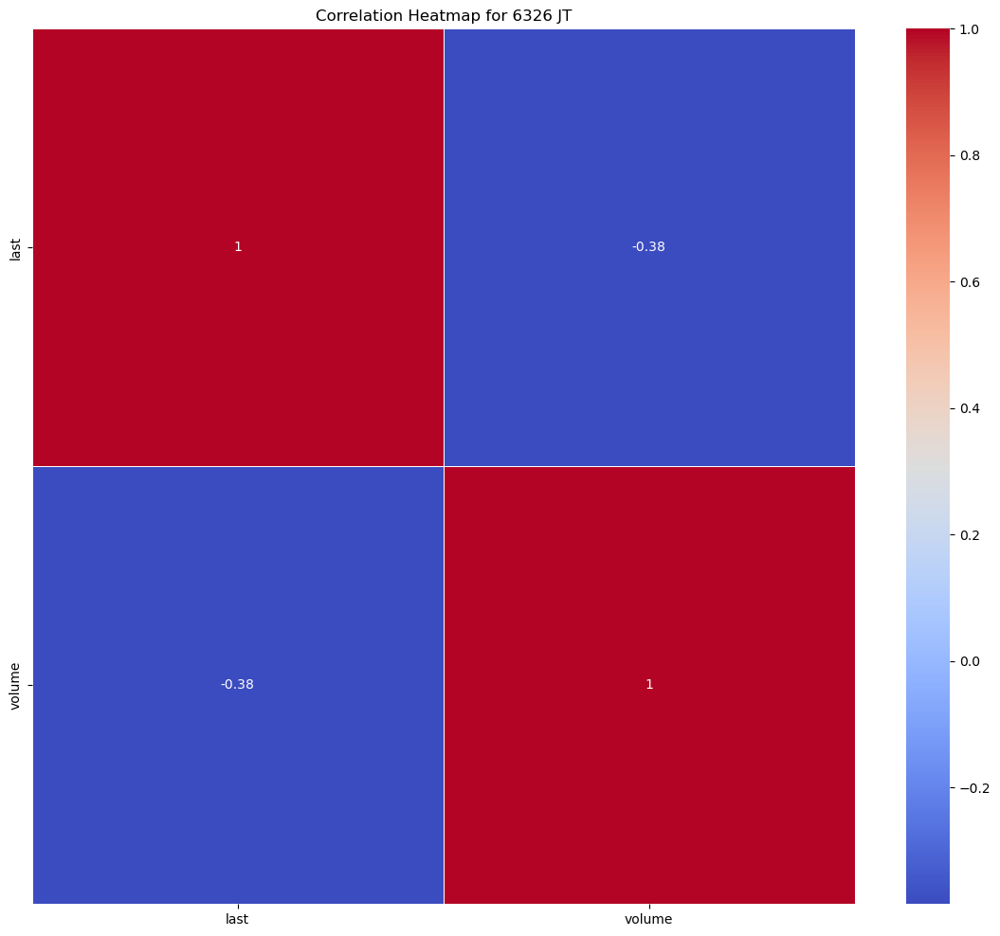

Statistics for stock 6361 JT
---- last ----
Mean: 2767.2422768578554
Median: 2731.1129
Mode: 2421.8307
Range: 3037.826
Standard Deviation: 567.3795784567616
Skewness: 0.4117958631429899
Kurtosis: 0.21289306007746633


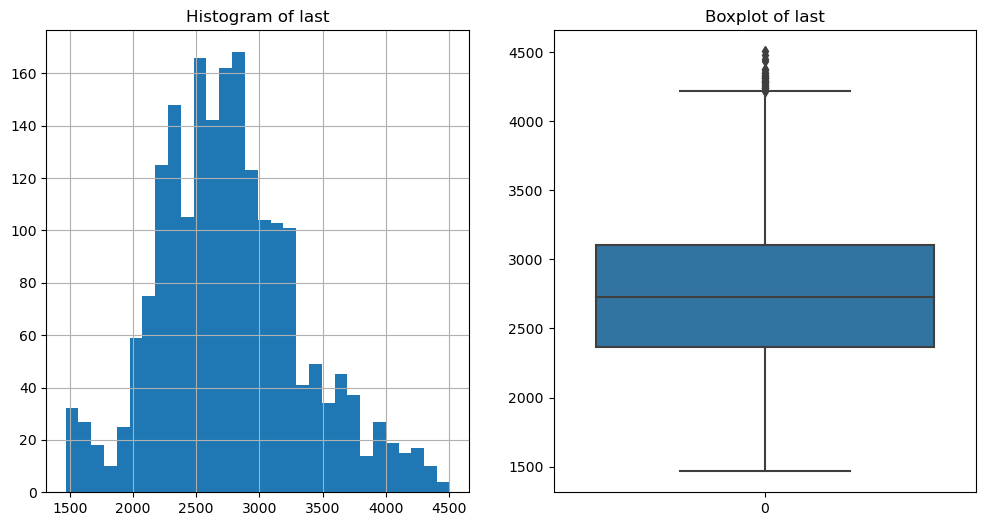

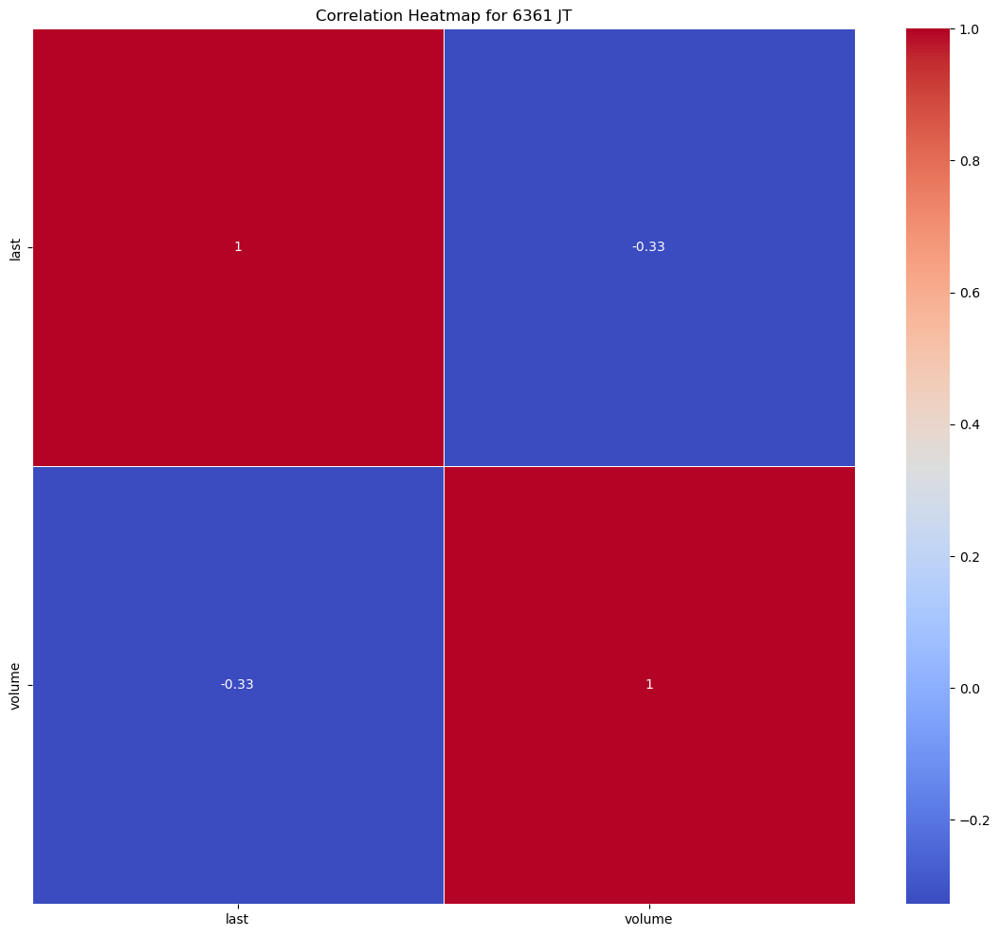

Statistics for stock 6367 JT
---- last ----
Mean: 10477.58397670823
Median: 10374.1651
Mode: 10503.9624
Range: 21711.9653
Standard Deviation: 4735.200732395563
Skewness: 0.7496108269377106
Kurtosis: 0.31858286253404566


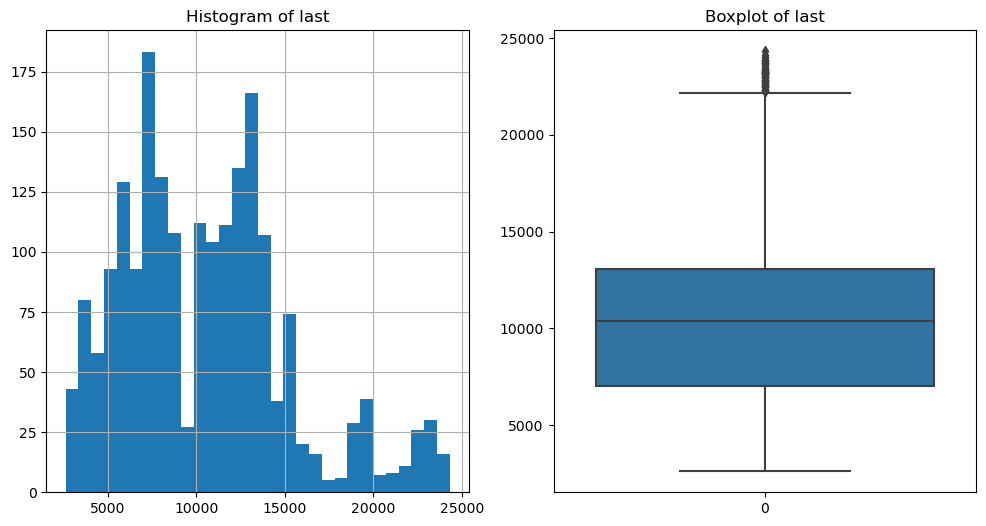

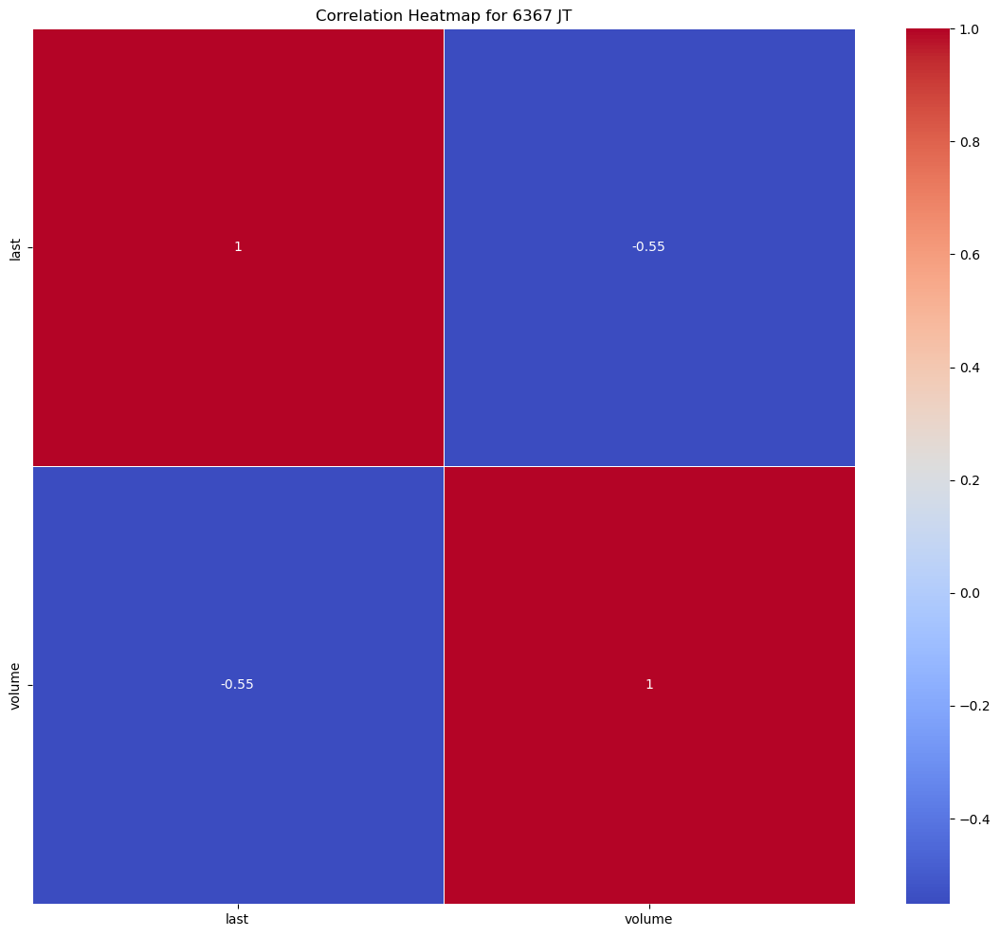

Statistics for stock 6471 JT
---- last ----
Mean: 1053.068117755611
Median: 1016.1726
Mode: 702.596
Range: 1289.0036
Standard Deviation: 261.8786784708756
Skewness: 0.3811494117384602
Kurtosis: -0.3089560094895738


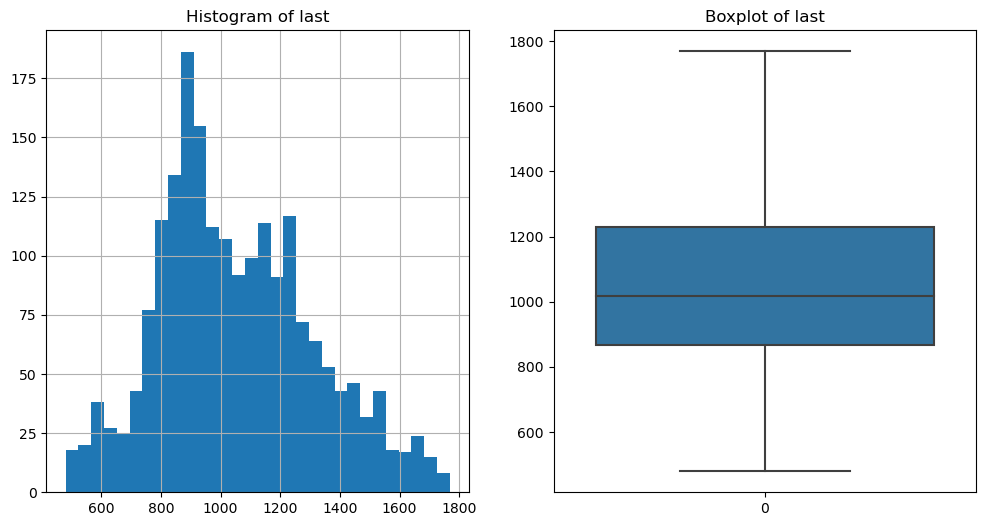

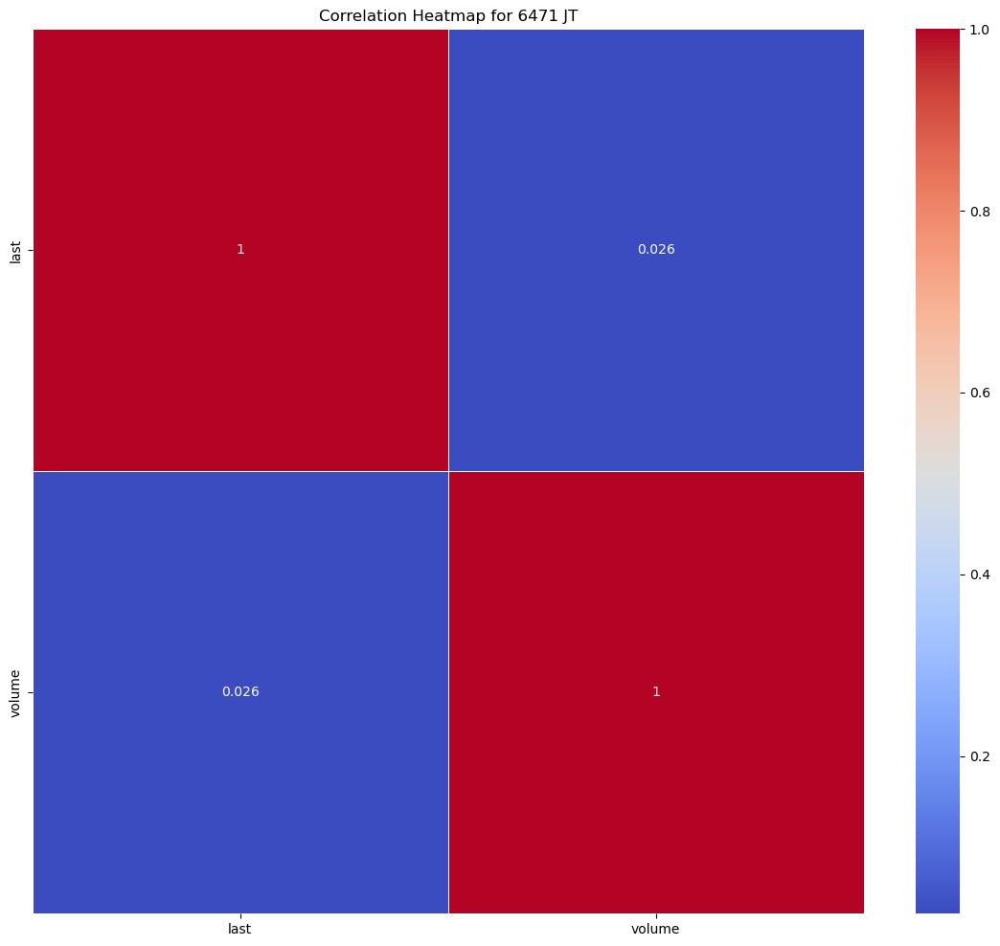

Statistics for stock 6472 JT
---- last ----
Mean: 375.53259536159607
Median: 362.7741
Mode: 201.0
Range: 542.9959
Standard Deviation: 109.82931082070574
Skewness: 0.3634906142793206
Kurtosis: -0.2781781128901293


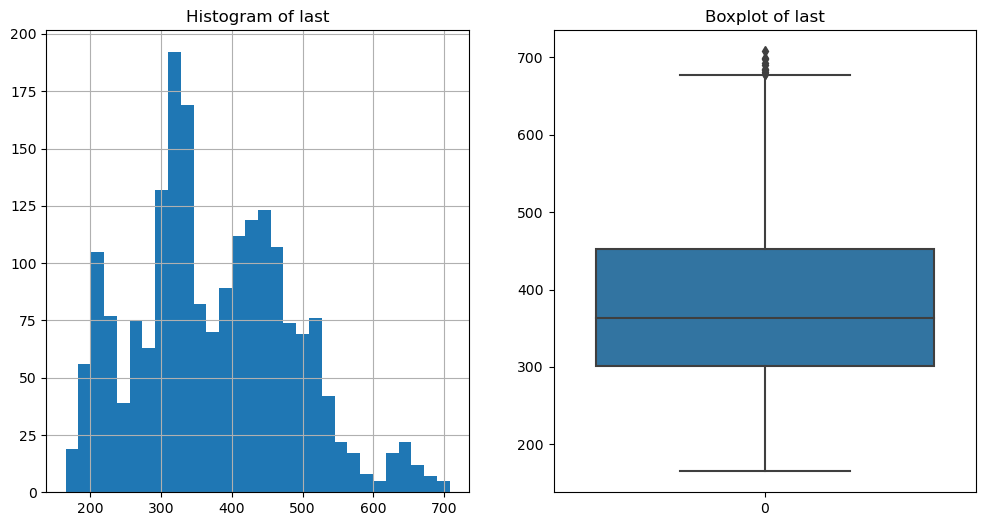

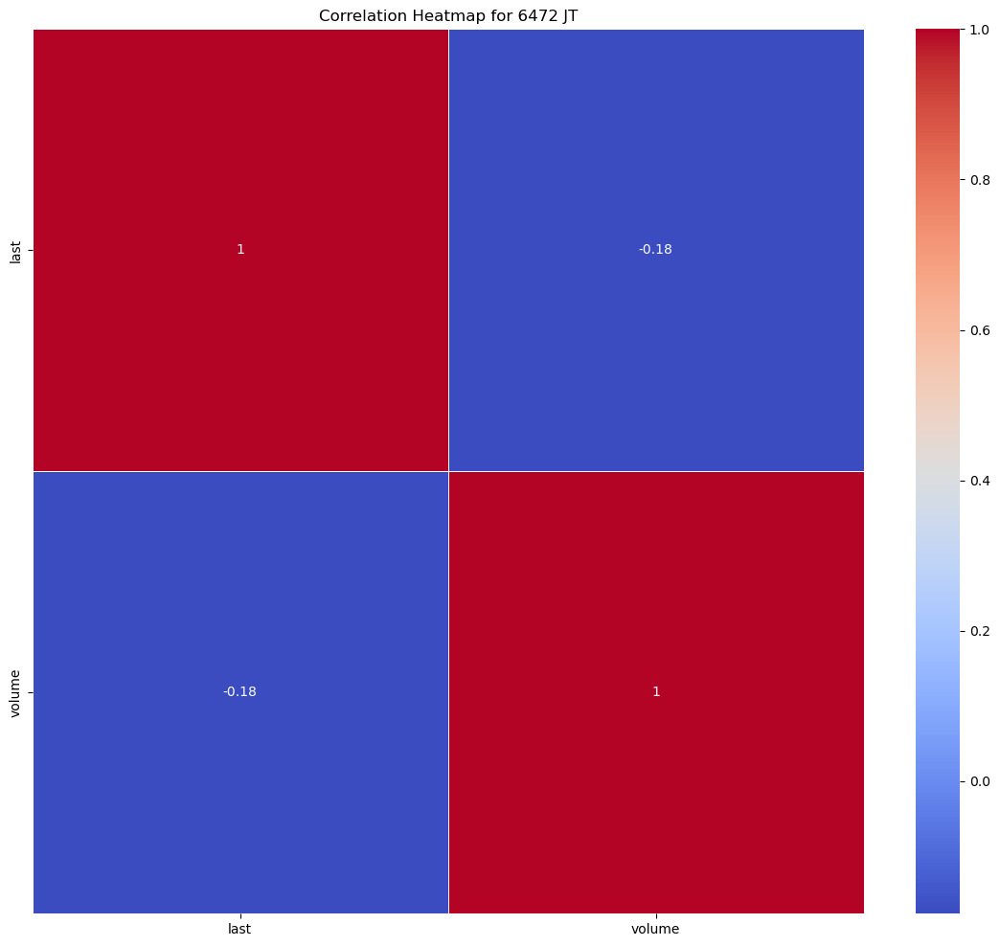

Statistics for stock 6473 JT
---- last ----
Mean: 1323.074860648379
Median: 1346.4187
Mode: 868.0
Range: 1488.8539
Standard Deviation: 312.68583233604903
Skewness: -0.1782801209540085
Kurtosis: -0.5448066838188197


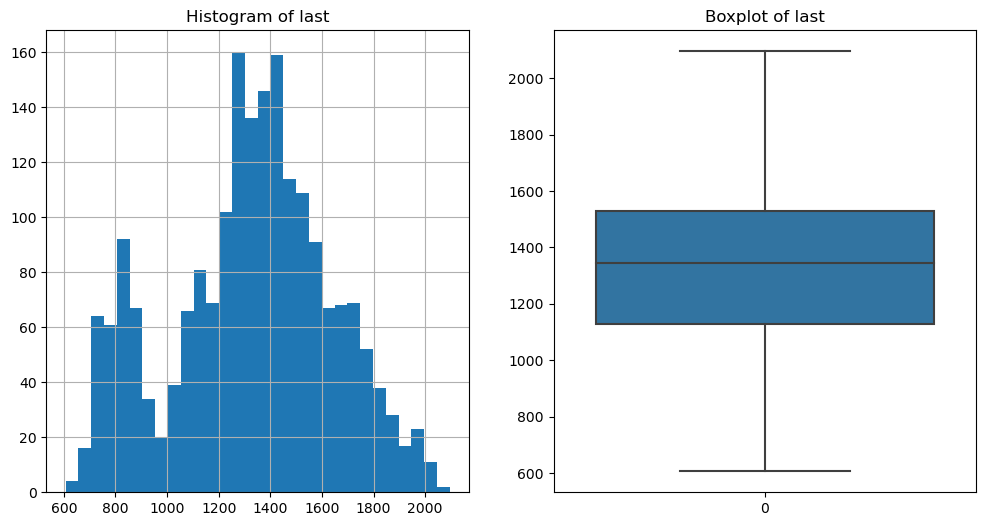

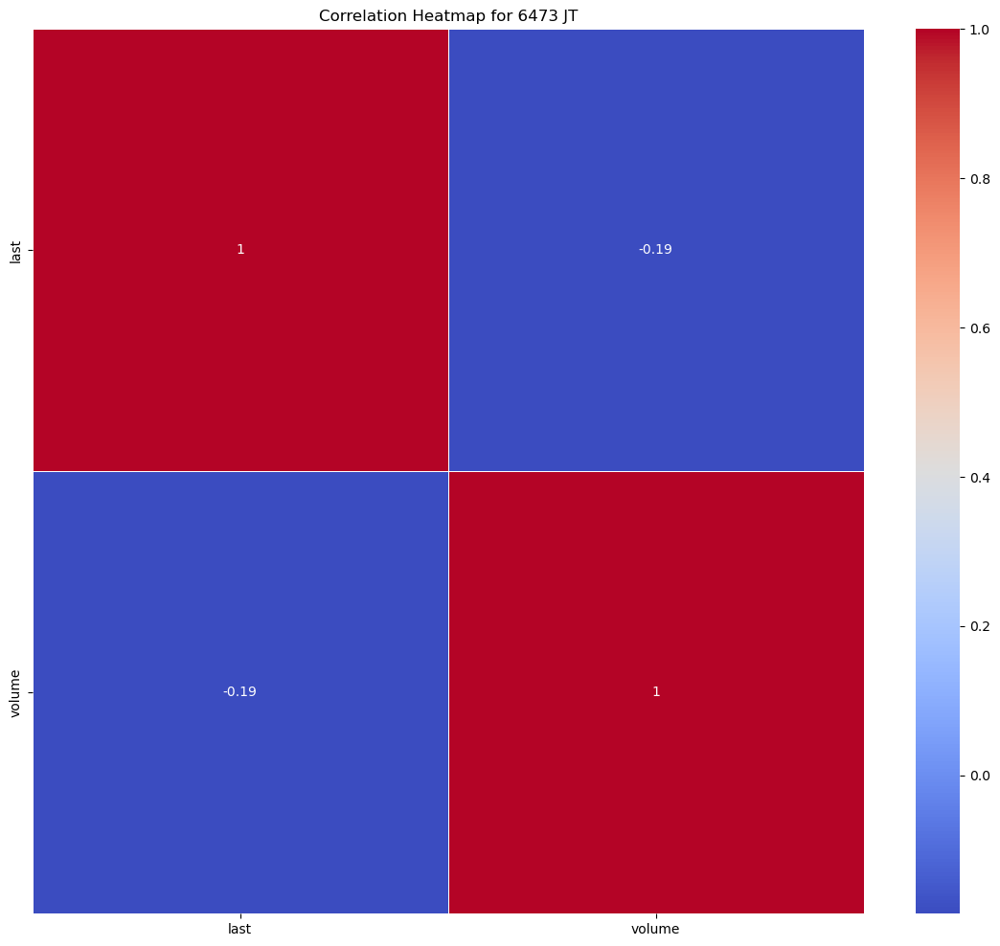

Statistics for stock 6479 JT
---- last ----
Mean: 1436.3196659850373
Median: 1605.2401
Mode: 267.8283
Range: 2596.0269
Standard Deviation: 606.7337727936933
Skewness: -0.3120663180414383
Kurtosis: -0.8546426810773444


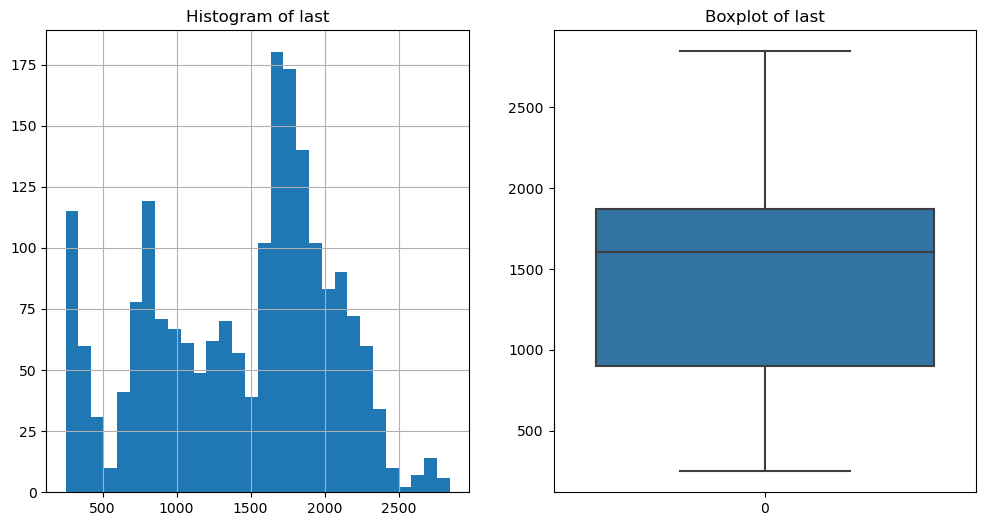

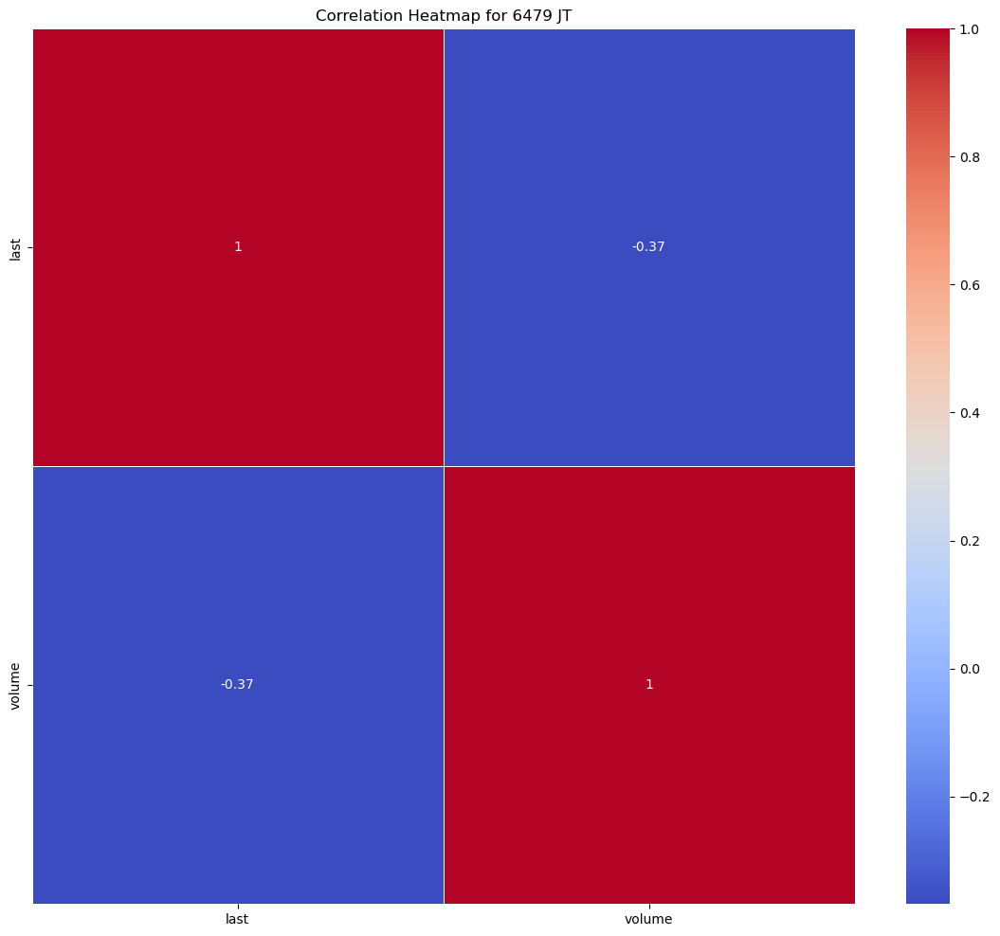

Statistics for stock 6501 JT
---- last ----
Mean: 3293.72269117207
Median: 3342.1344
Mode: 3493.8329
Range: 3621.2772999999997
Standard Deviation: 617.4178407988081
Skewness: -0.0037092489849570847
Kurtosis: 0.13756006373626173


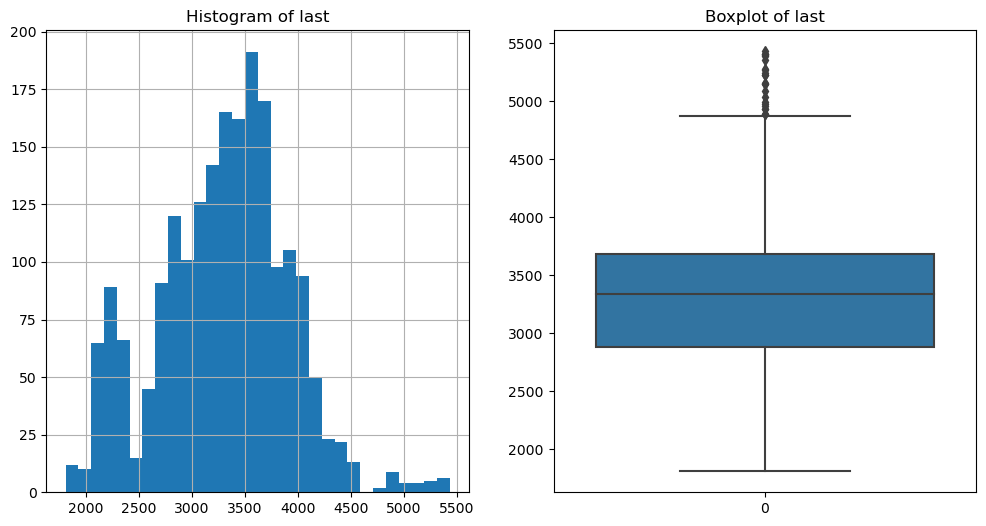

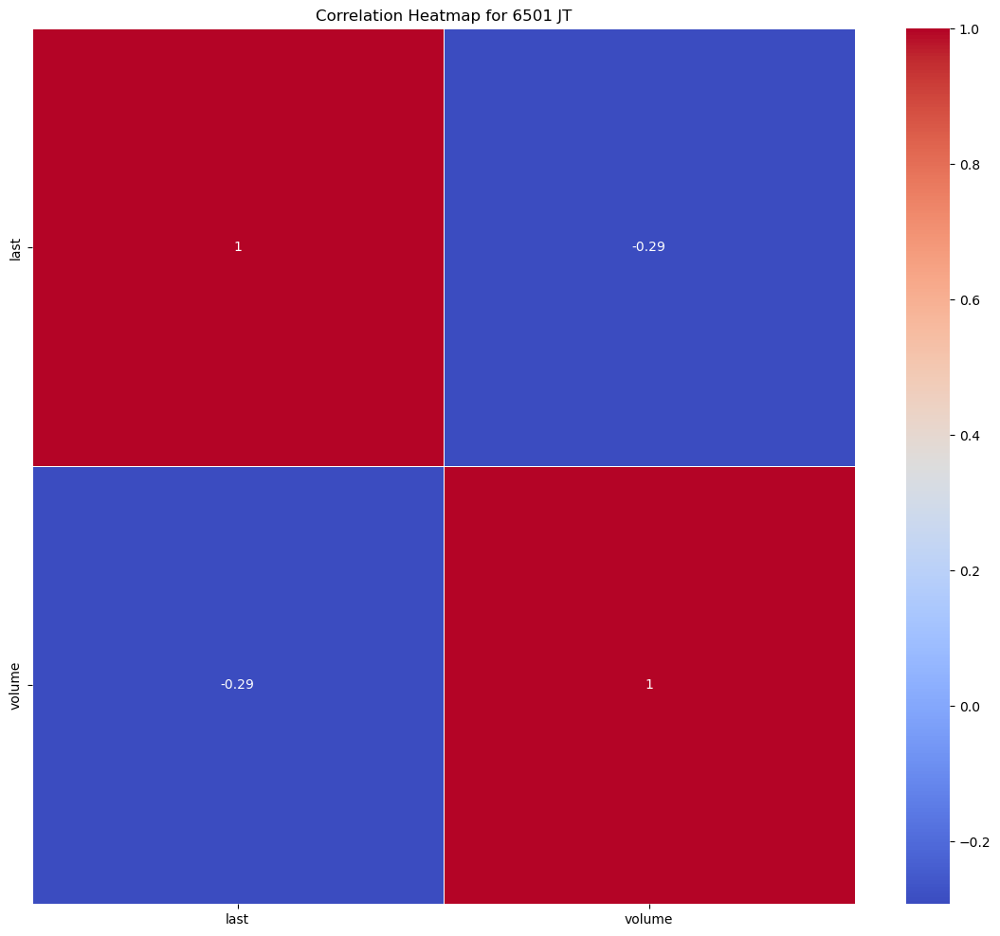

Statistics for stock 6503 JT
---- last ----
Mean: 1282.3538312718204
Median: 1322.9744
Mode: 631.1381
Range: 1401.387
Standard Deviation: 260.4955313333235
Skewness: -0.3148242571429108
Kurtosis: -0.20737119443036534


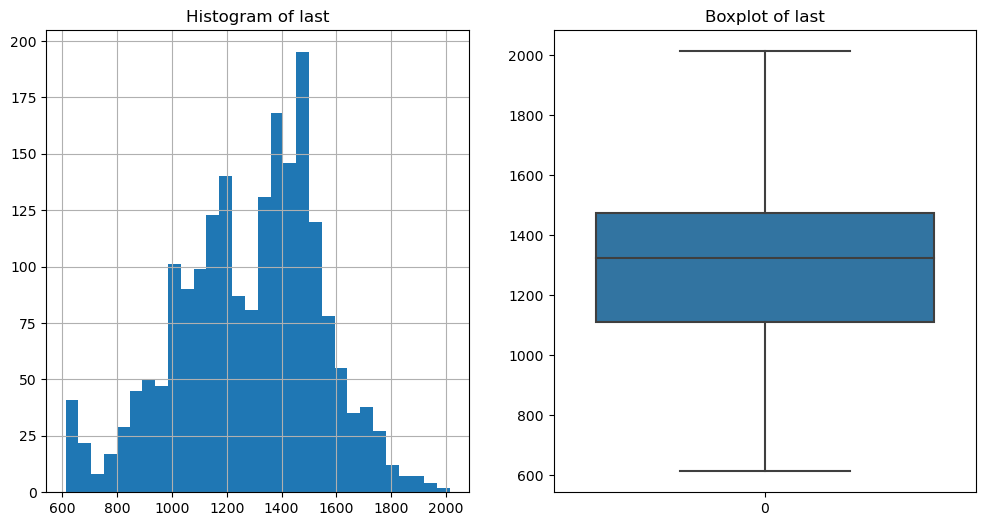

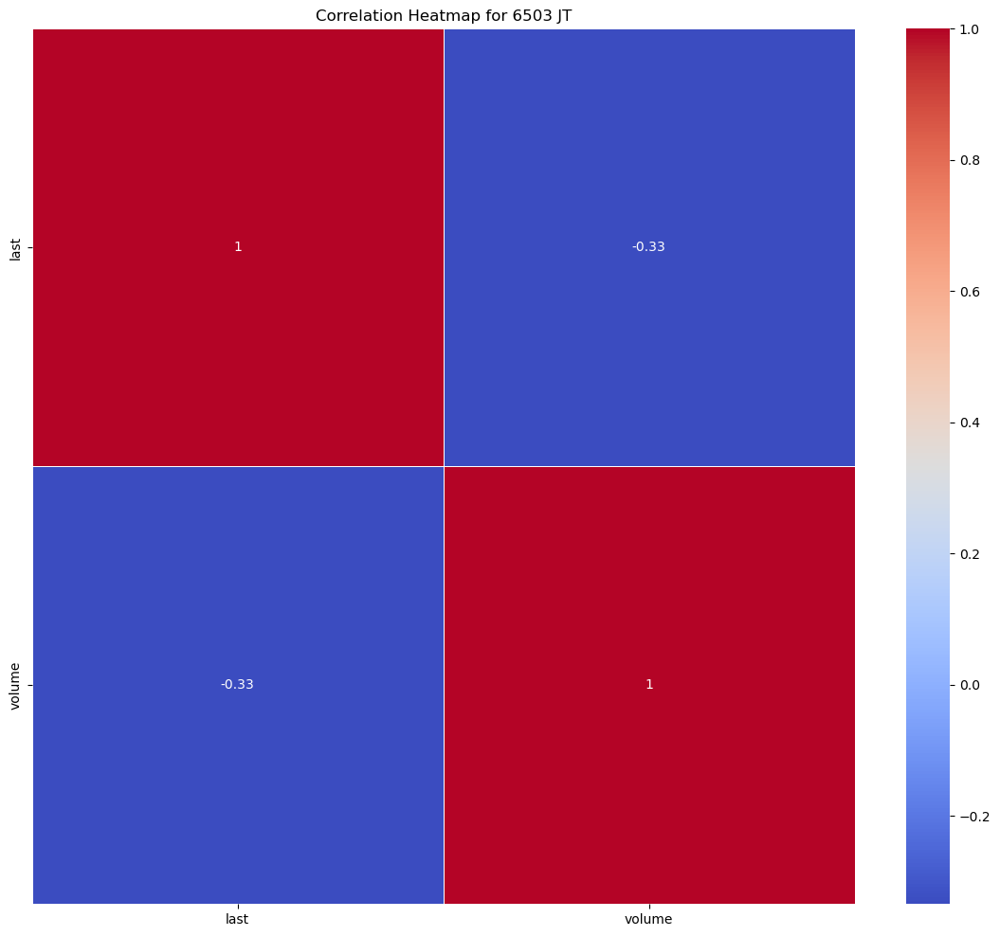

Statistics for stock 6504 JT
---- last ----
Mean: 2687.1845375561097
Median: 2645.96
Mode: 2215.3739
Range: 3945.0604
Standard Deviation: 807.9010413836518
Skewness: 0.16315301393451848
Kurtosis: -0.62400876763627


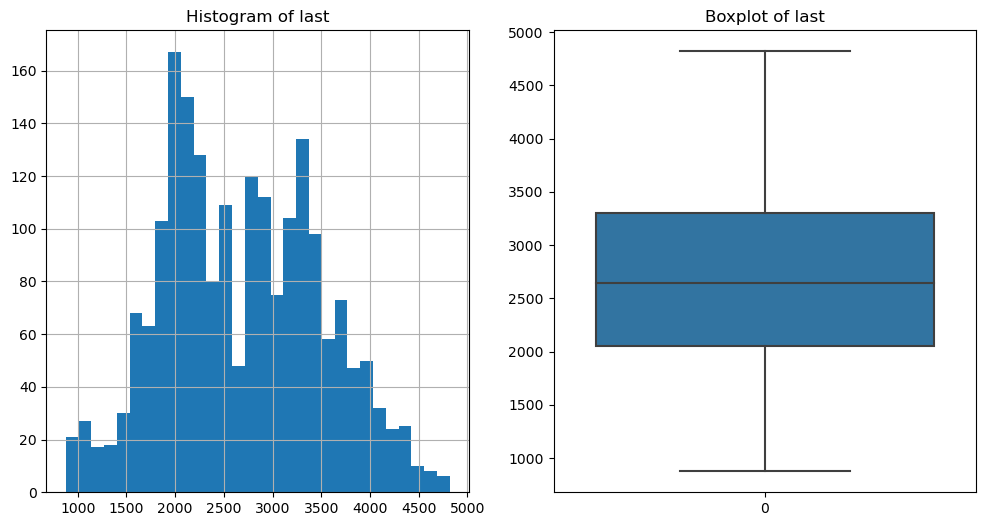

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


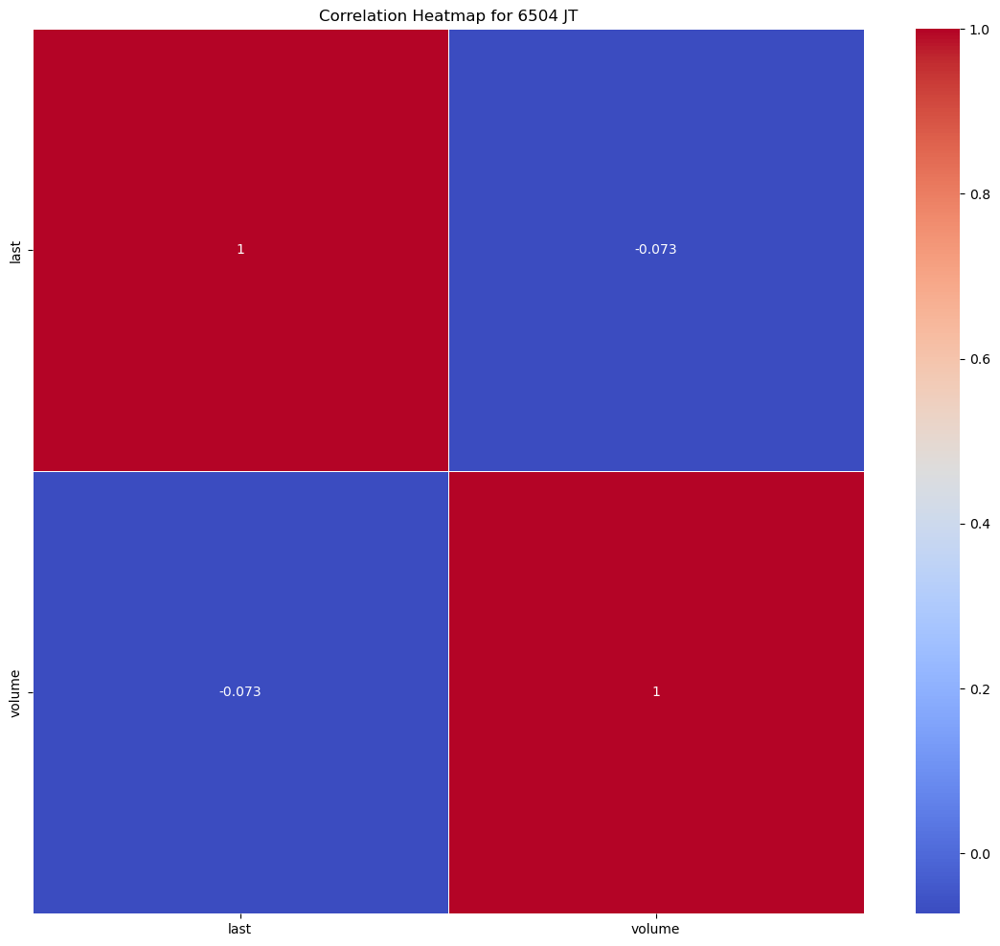

Statistics for stock 6506 JT
---- last ----
Mean: 2505.2307052369074
Median: 1942.8995
Mode: 774.9235
Range: 5300.7108
Standard Deviation: 1367.0439775483376
Skewness: 0.5521639586034296
Kurtosis: -1.0071161706284275


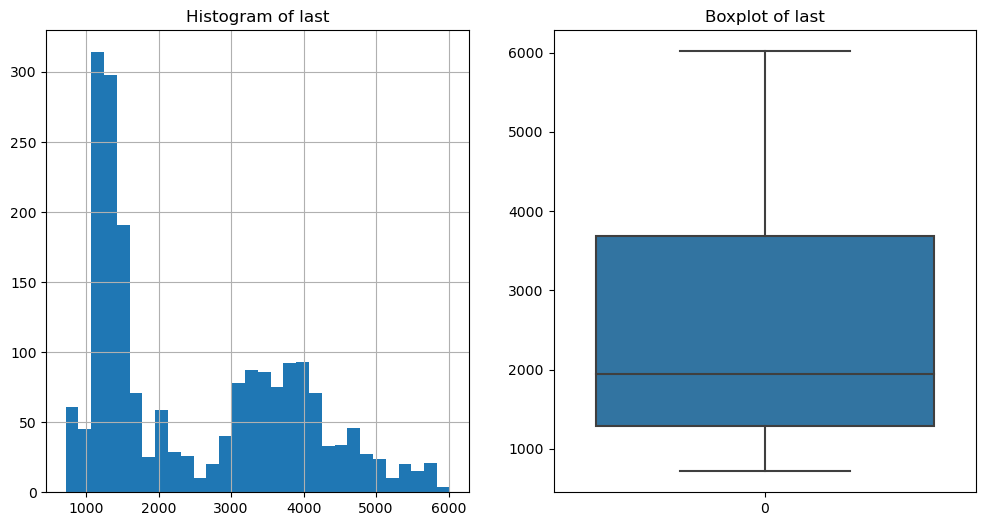

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


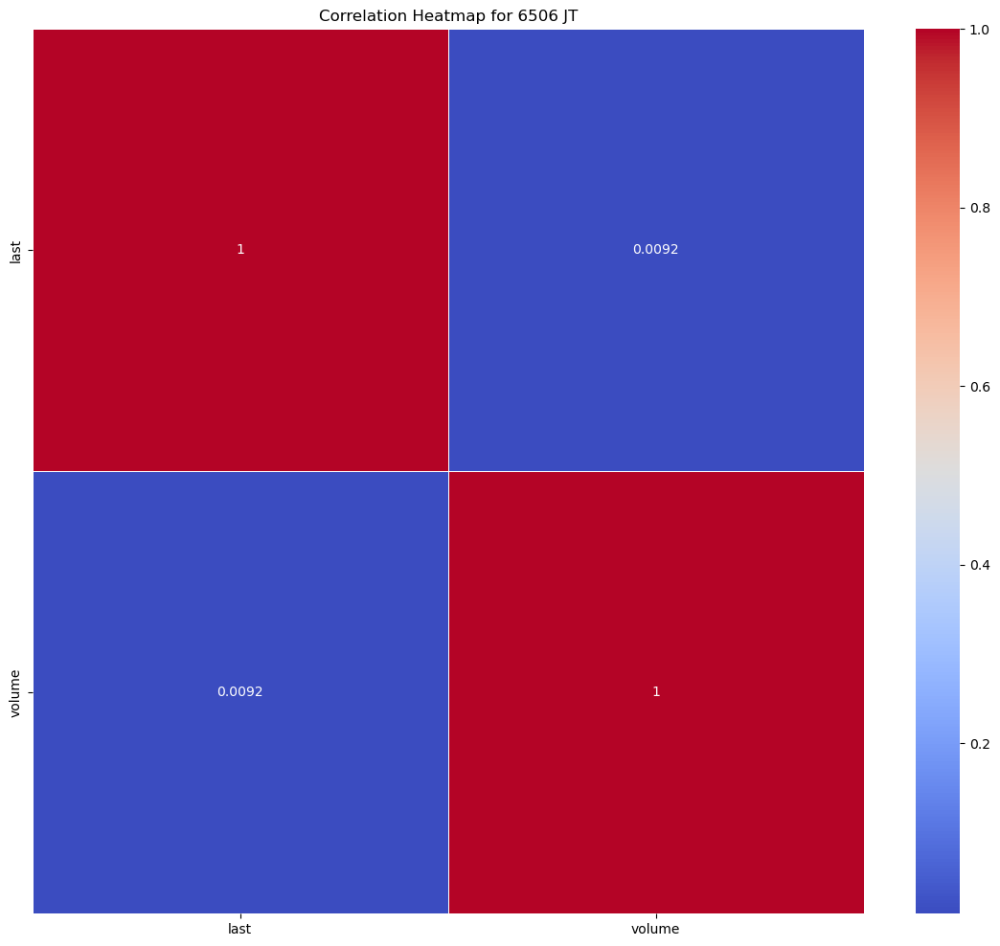

Statistics for stock 6674 JT
---- last ----
Mean: 2256.4765670324186
Median: 2265.0332
Mode: 2772.1336
Range: 2344.3172
Standard Deviation: 386.8610149806197
Skewness: 0.1265058590944616
Kurtosis: 0.0392531887707368


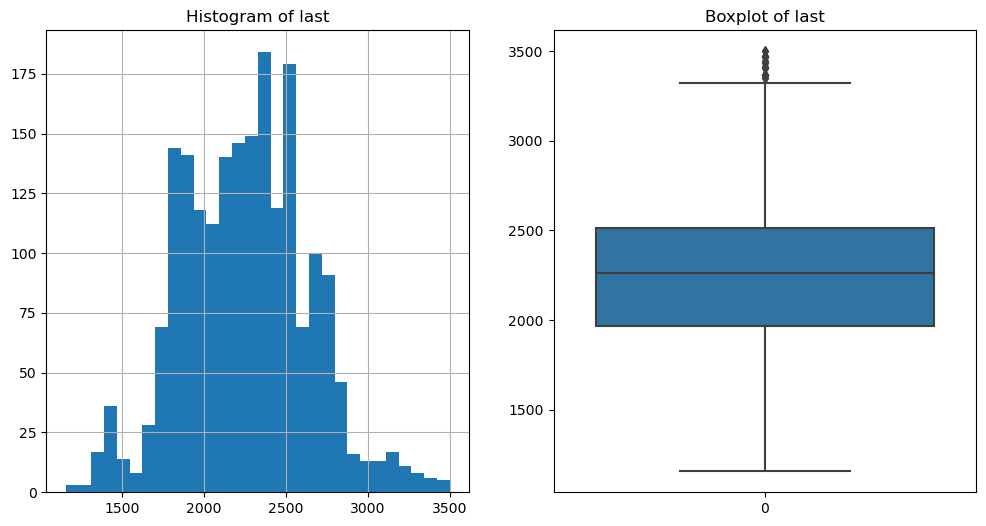

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


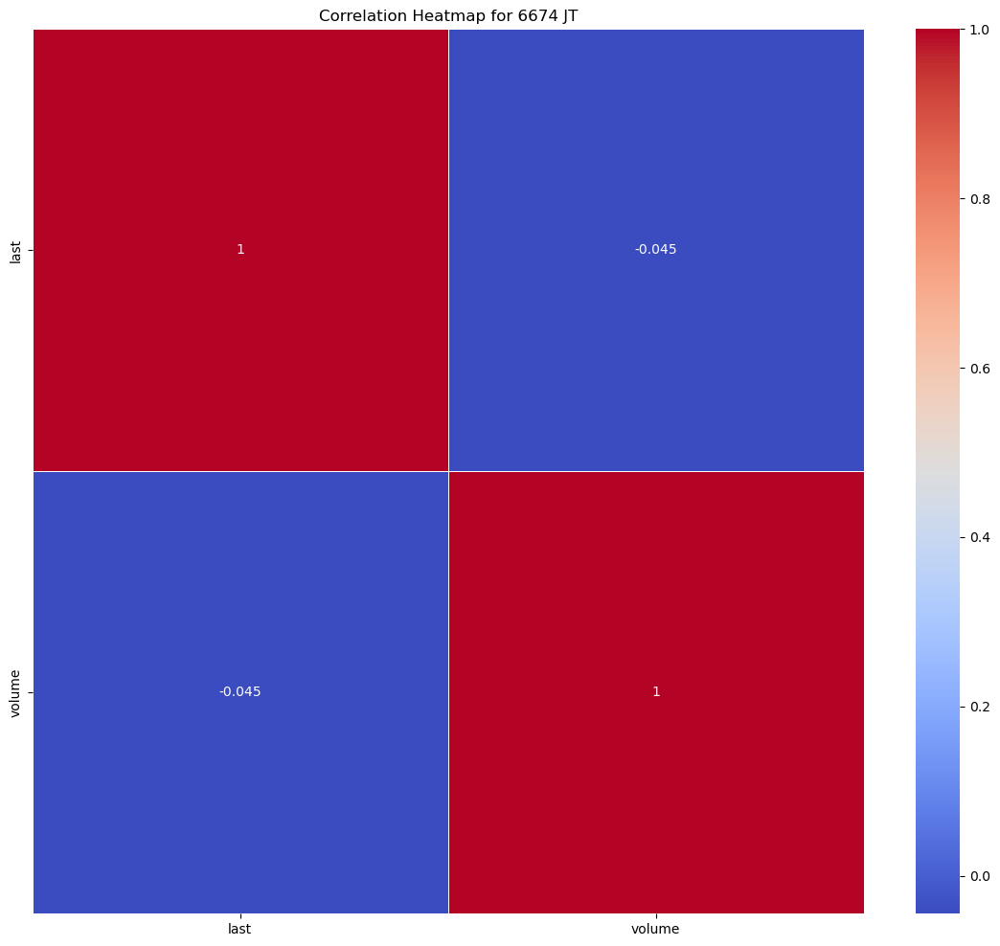

Statistics for stock 6701 JT
---- last ----
Mean: 3318.4402564089773
Median: 3005.2885
Mode: 2002.8593
Range: 5045.3572
Standard Deviation: 1038.829614722527
Skewness: 1.0760447748963888
Kurtosis: 0.6581482237555893


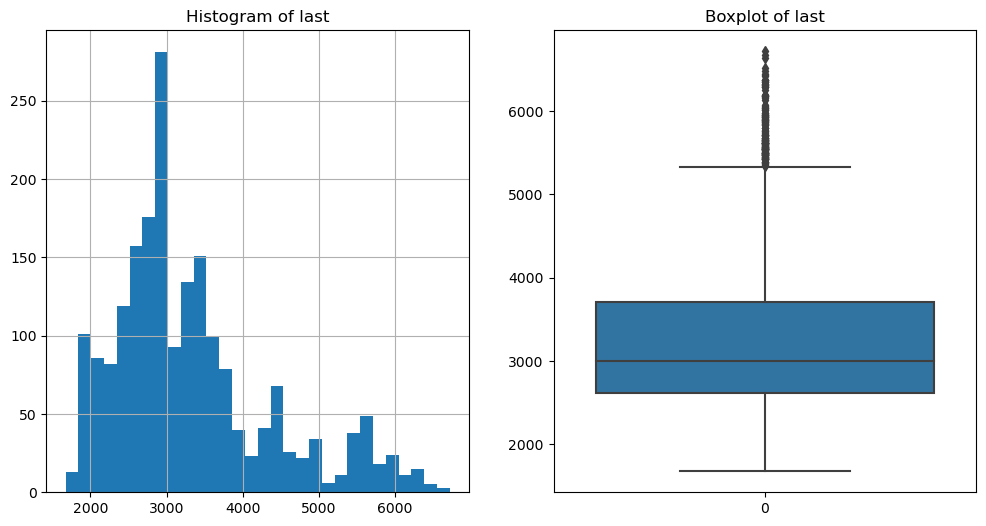

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


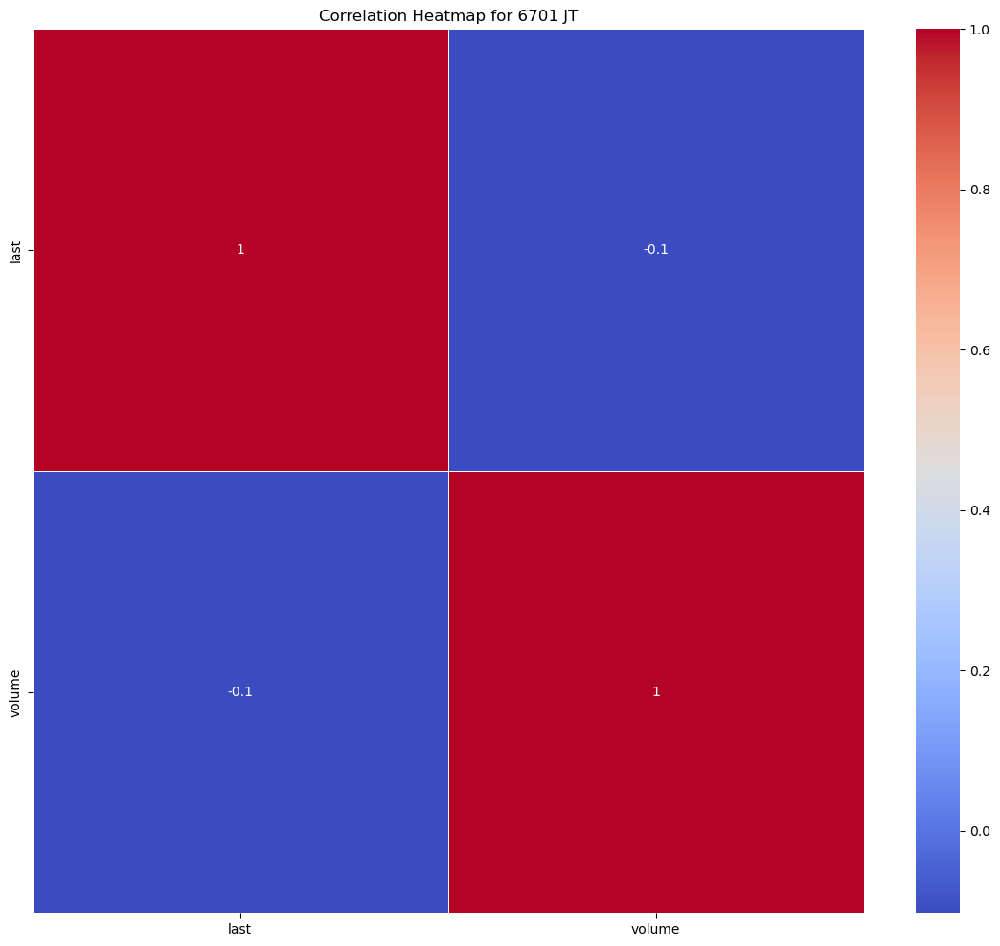

Statistics for stock 6702 JT
---- last ----
Mean: 7077.5468916209475
Median: 6463.8705
Mode: 3309.6437
Range: 13918.4022
Standard Deviation: 2949.585741973352
Skewness: 1.2513939474030413
Kurtosis: 1.322889298189244


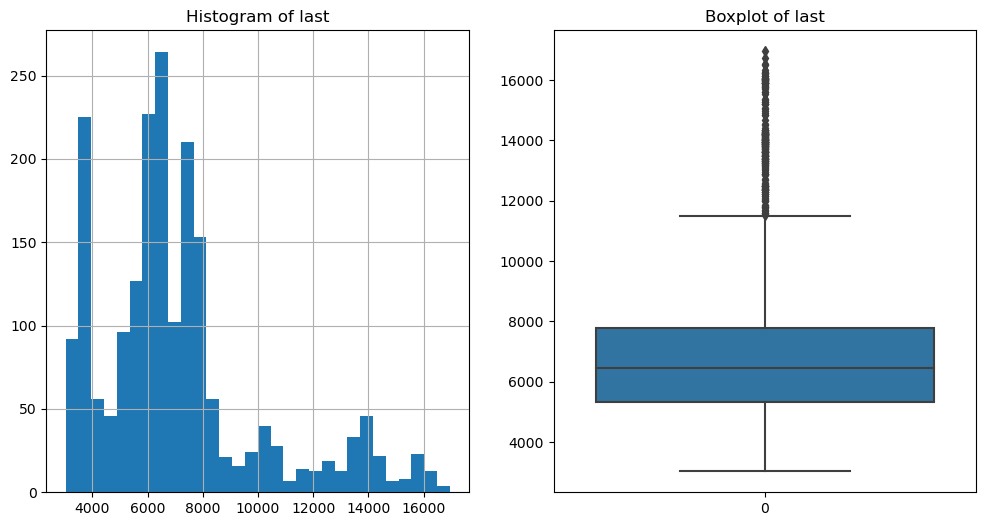

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


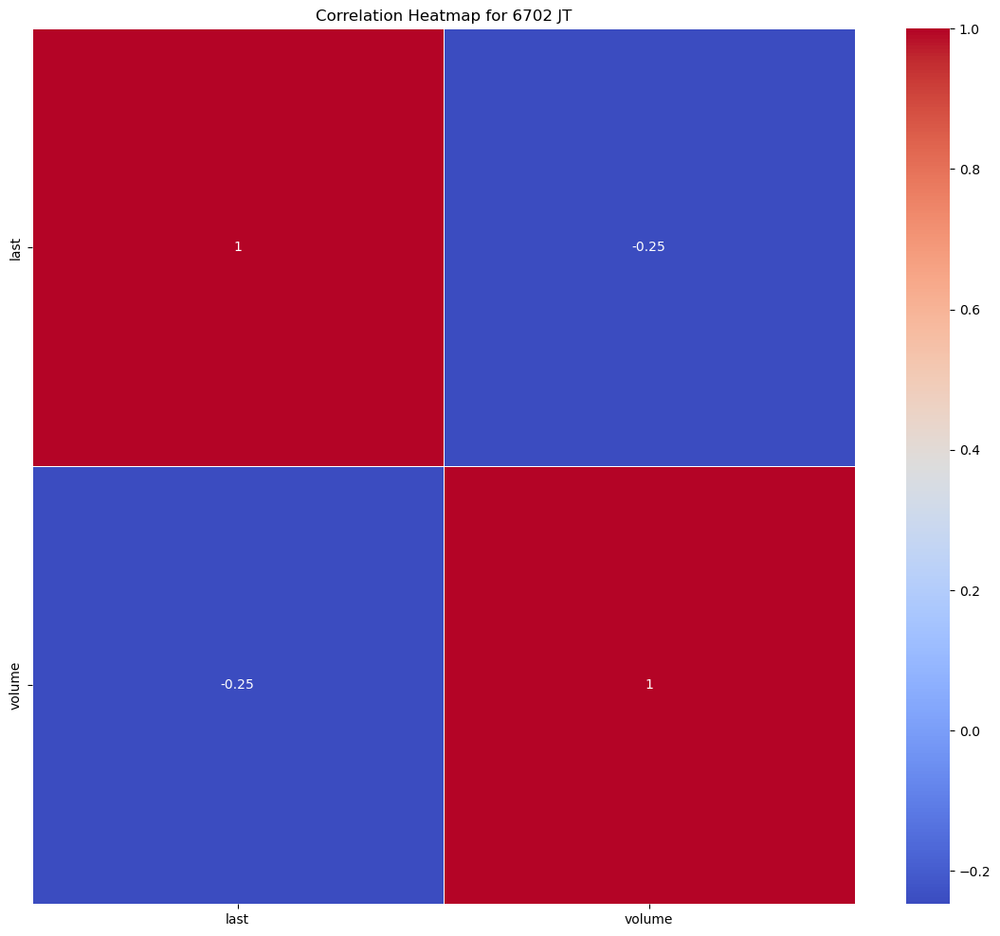

Statistics for stock 6703 JT
---- last ----
Mean: 1433.0862858852868
Median: 1368.6269
Mode: 1330.9824
Range: 1427.0566999999996
Standard Deviation: 339.1129564906833
Skewness: 0.5855308920520317
Kurtosis: -0.3936547260617993


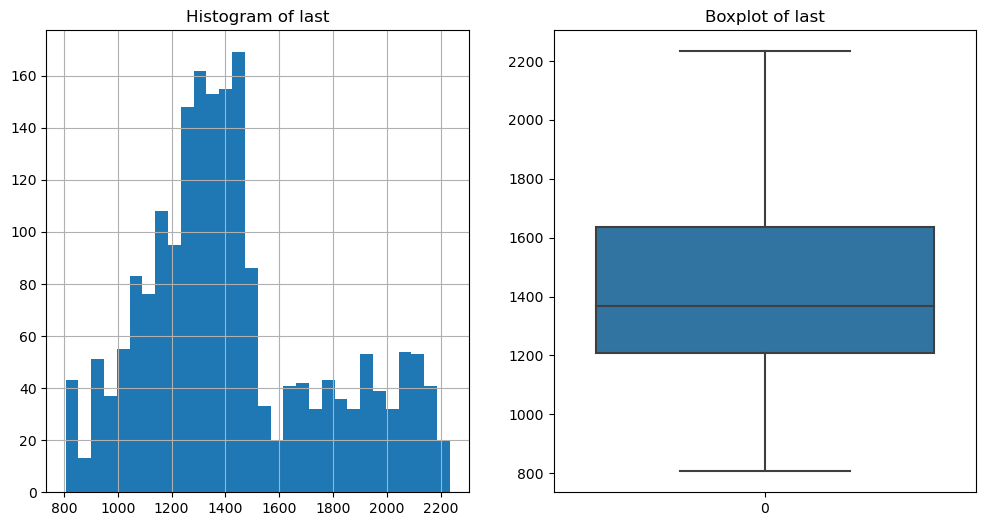

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


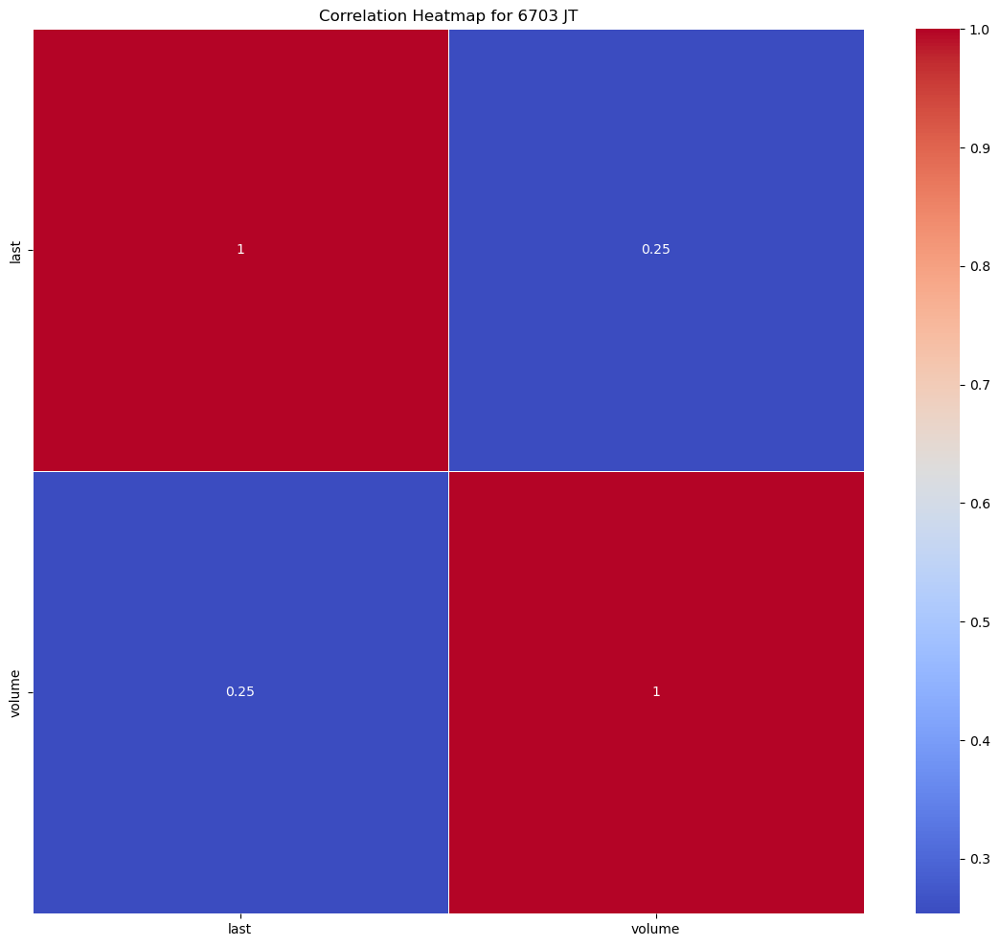

Statistics for stock 6752 JT
---- last ----
Mean: 1074.080204638404
Median: 1048.7682
Mode: 1066.1701
Range: 1186.9280999999999
Standard Deviation: 255.0103474823733
Skewness: 0.12944094107719445
Kurtosis: -0.6267349904067143


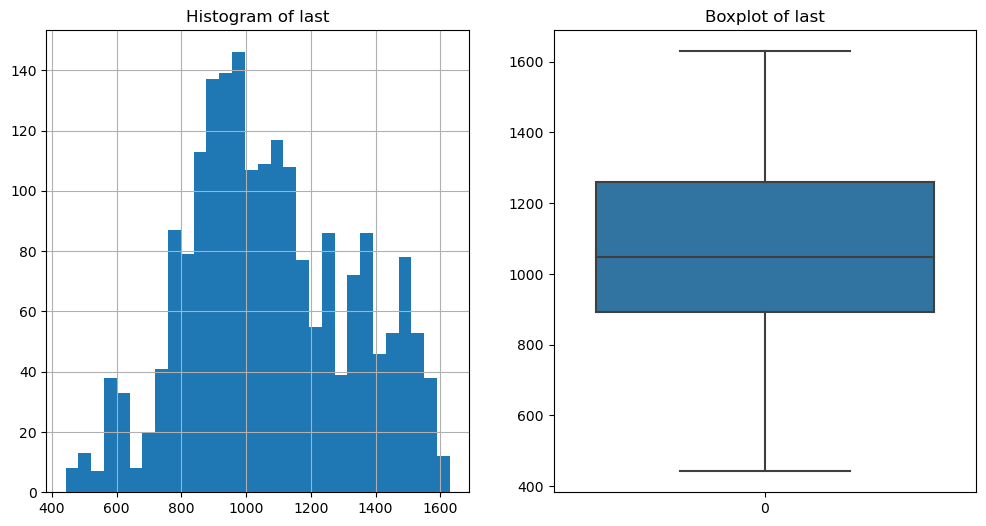

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


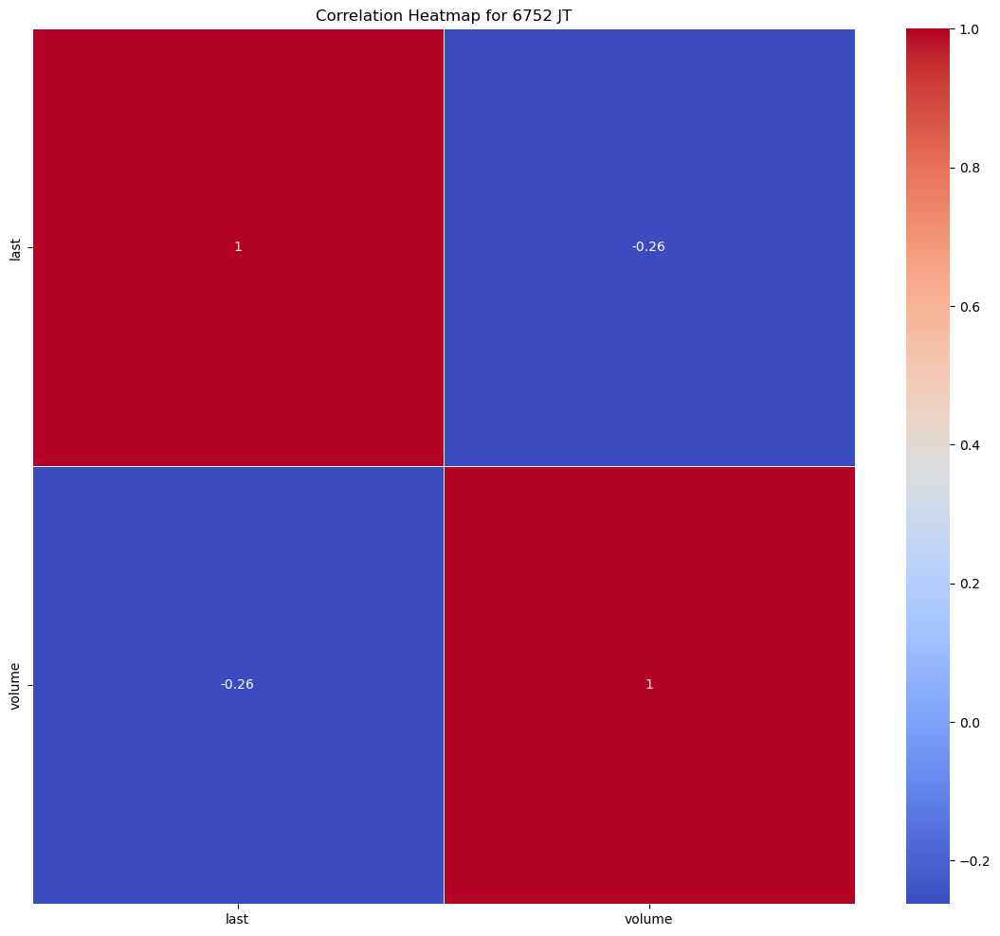

Statistics for stock 6758 JT
---- last ----
Mean: 4302.855205336658
Median: 3548.8706
Mode: 1707.8154
Range: 11564.032
Standard Deviation: 2334.3564332873557
Skewness: 0.9249000674175322
Kurtosis: 0.4912712227171907


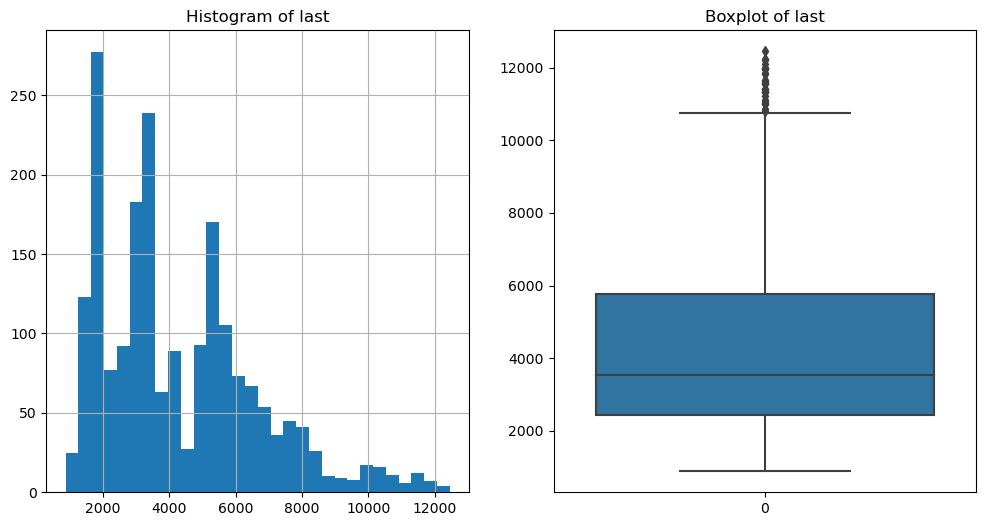

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


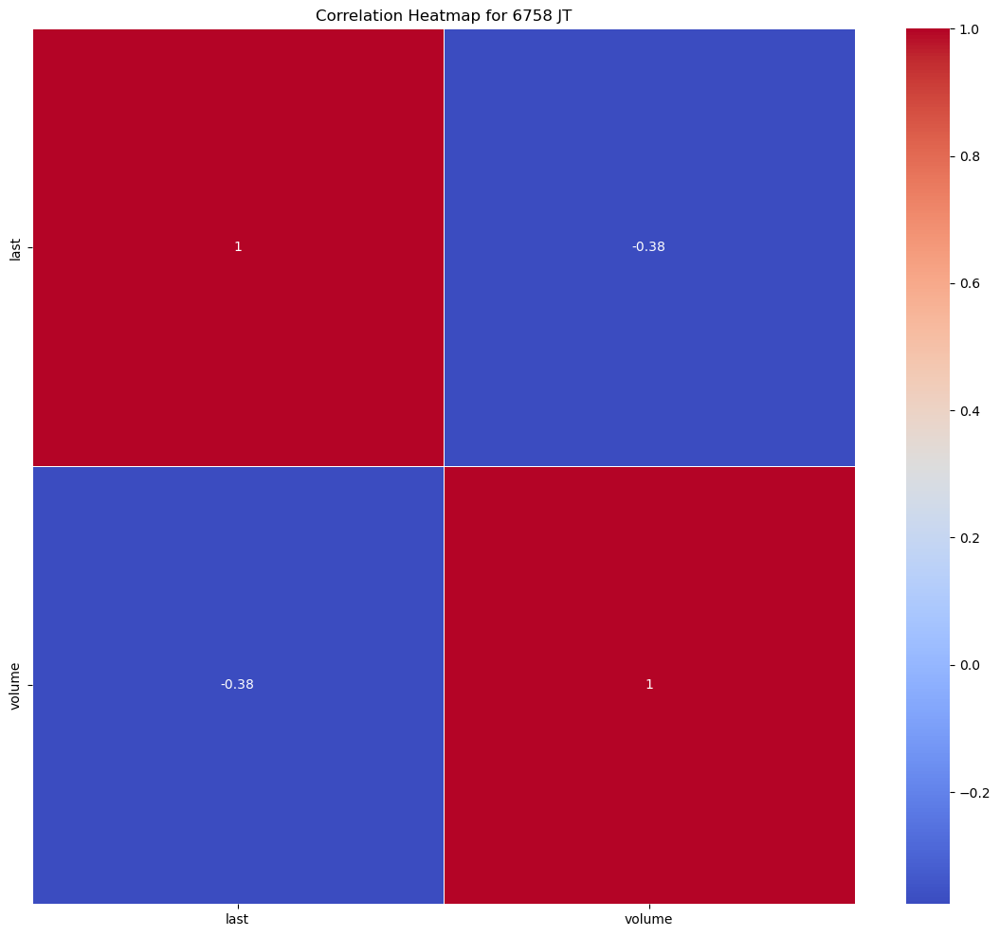

Statistics for stock 6762 JT
---- last ----
Mean: 7612.839691022444
Median: 7337.8337
Mode: 3817.0024
Range: 15476.9161
Standard Deviation: 2994.0068778954774
Skewness: 0.6151512015080124
Kurtosis: 0.4462796508042026


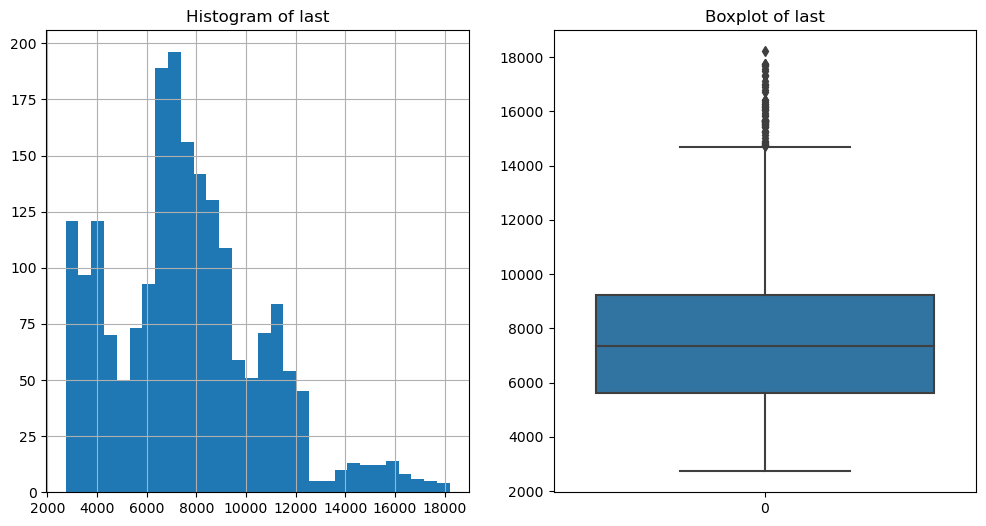

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


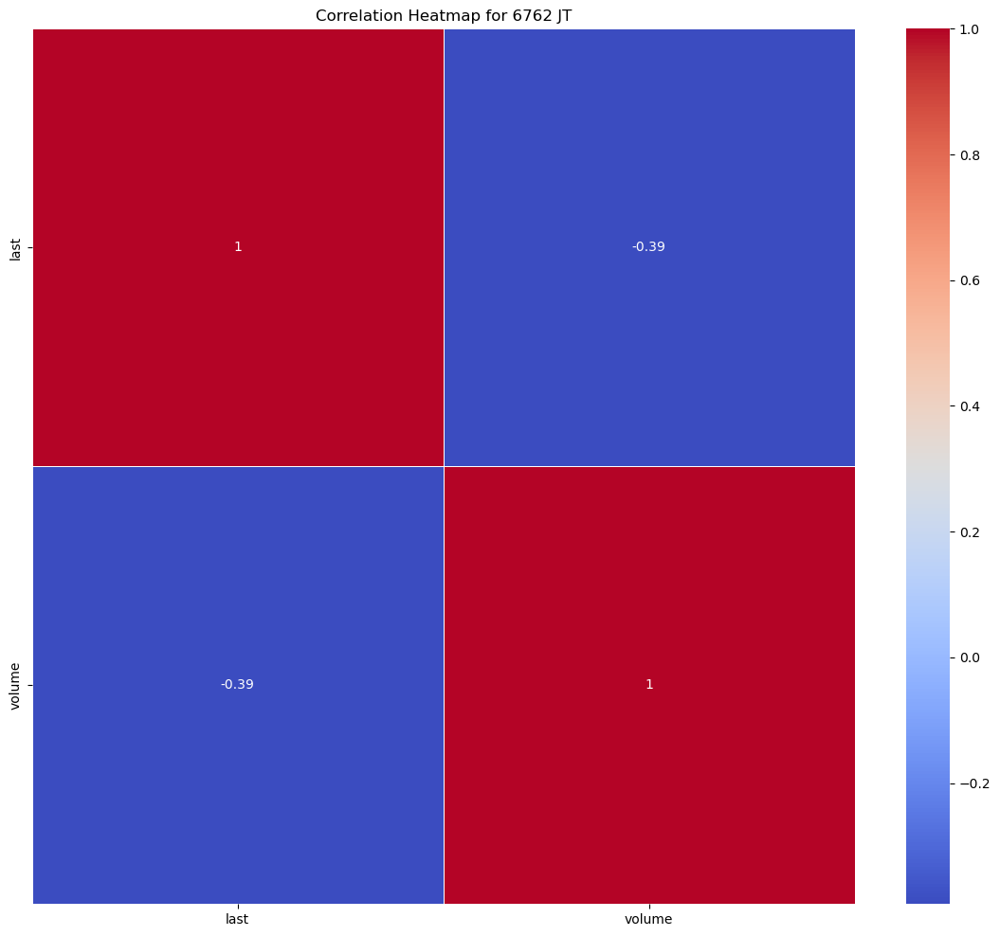

Statistics for stock 6770 JT
---- last ----
Mean: 2048.3130463840403
Median: 2090.1916
Mode: 581.8368
Range: 3428.1013
Standard Deviation: 835.5003658735825
Skewness: -0.09511717481388351
Kurtosis: -0.9989417138956616


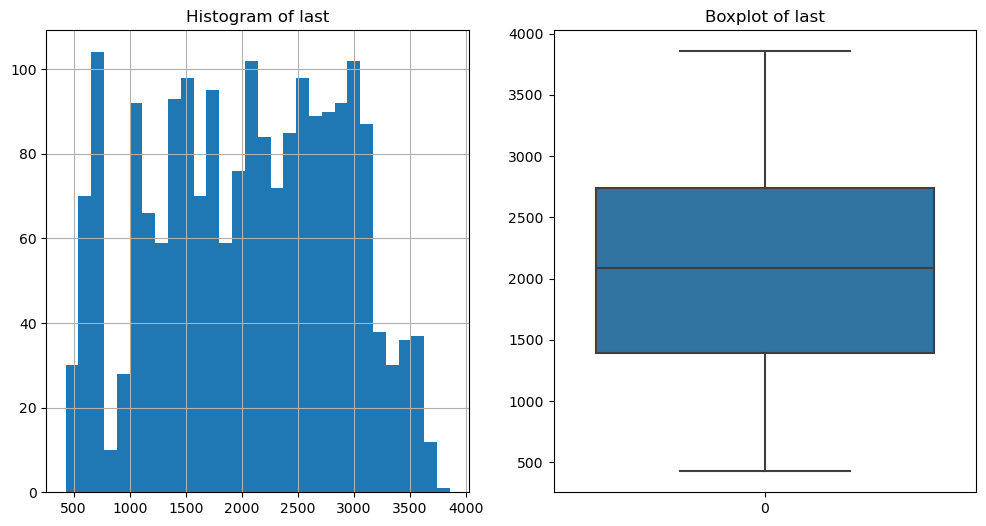

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


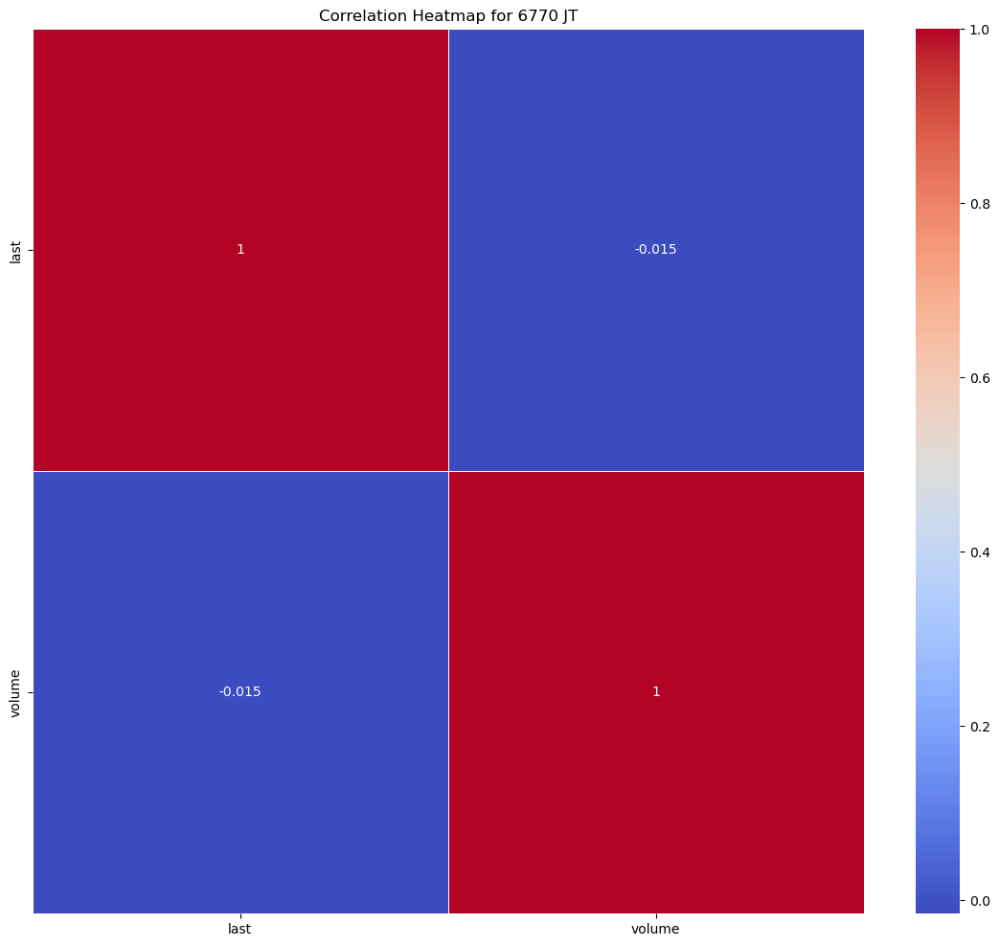

Statistics for stock 6841 JT
---- last ----
Mean: 1552.4355383042396
Median: 1496.6582
Mode: 999.2793
Range: 1657.5365000000002
Standard Deviation: 400.7340874516769
Skewness: 0.13130422998181196
Kurtosis: -1.184110803091465


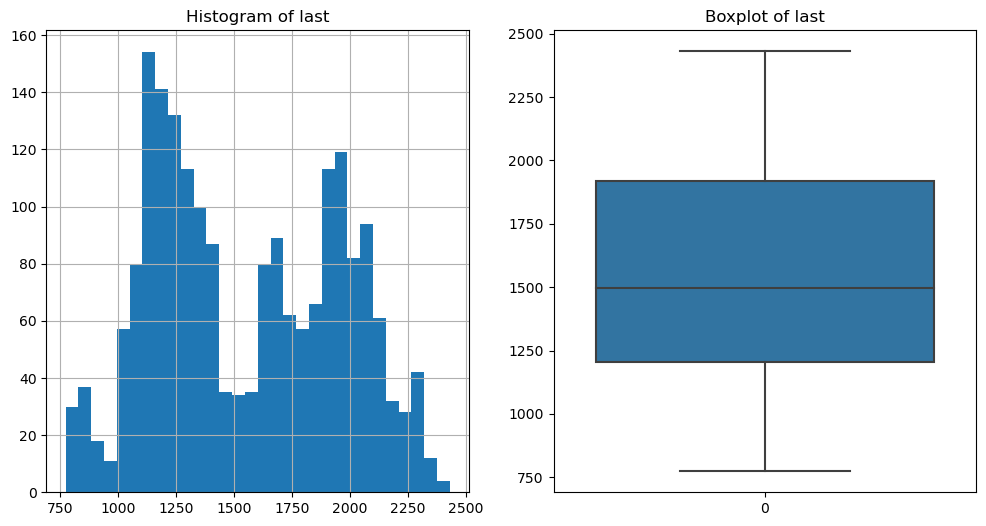

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


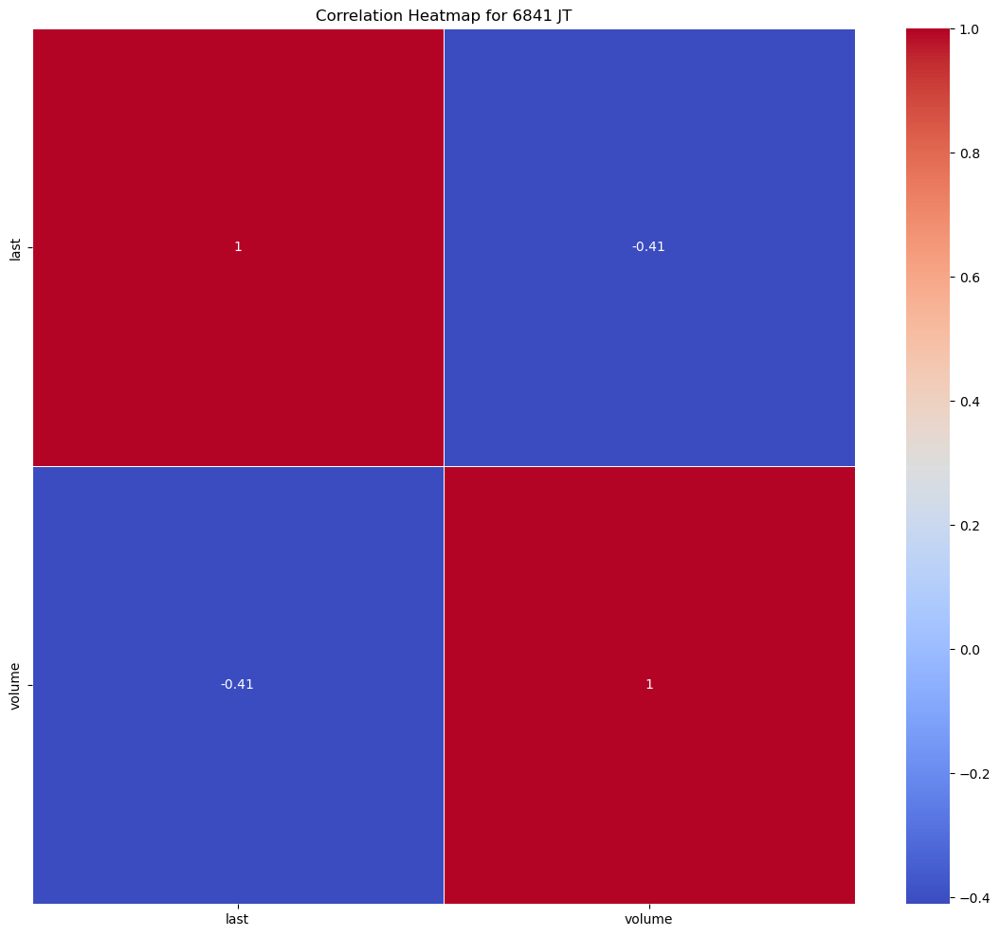

Statistics for stock 6857 JT
---- last ----
Mean: 2413.5227507730674
Median: 1761.1727
Mode: 1027.8624
Range: 8904.7337
Standard Deviation: 1922.2711804901191
Skewness: 1.706497923180425
Kurtosis: 2.1773528923946834


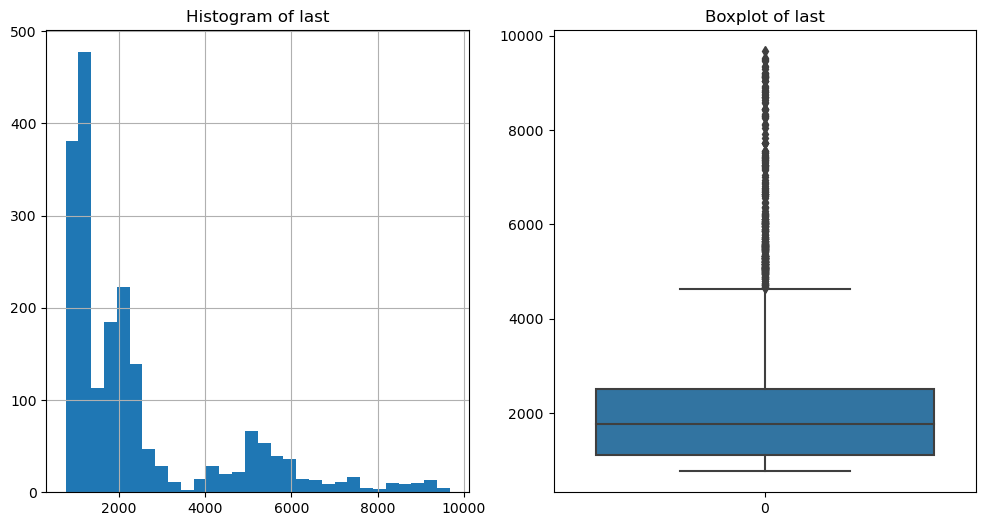

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


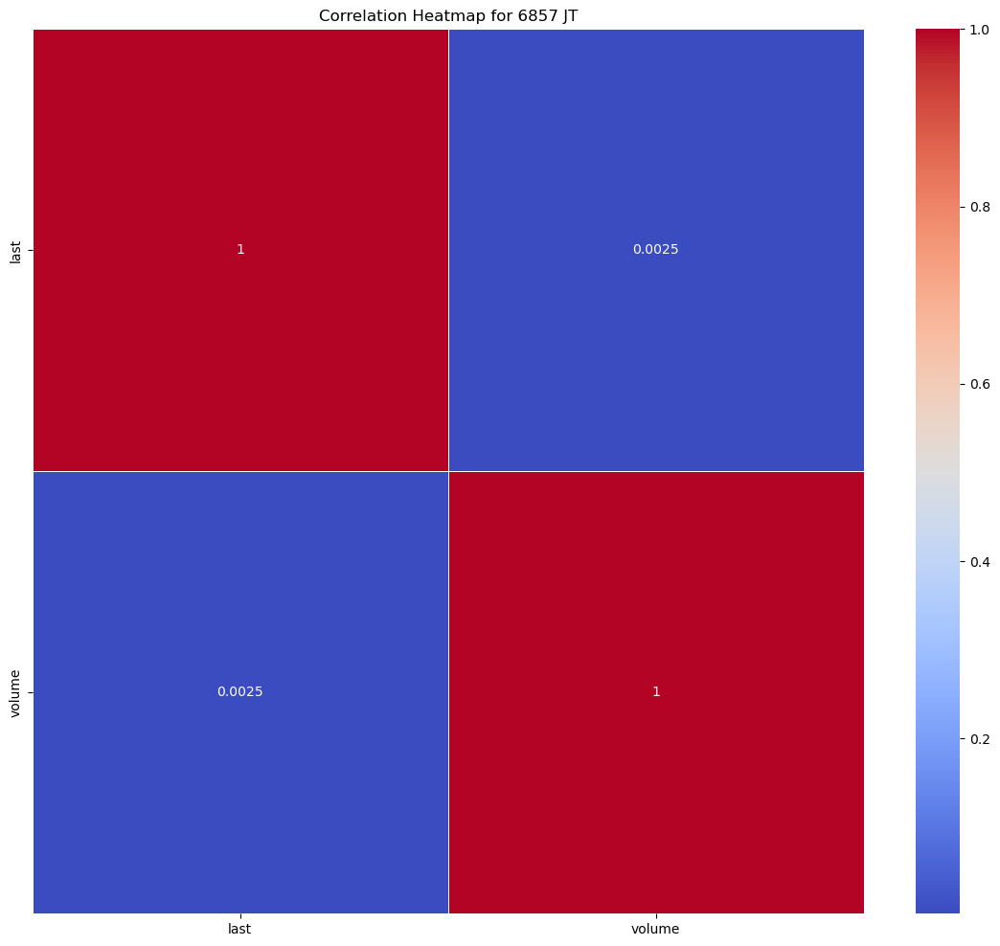

Statistics for stock 6902 JT
---- last ----
Mean: 4499.249433566086
Median: 4456.1712
Mode: 3661.1455
Range: 5290.432
Standard Deviation: 758.7117617829988
Skewness: 0.5628105099990384
Kurtosis: 1.0426203805201686


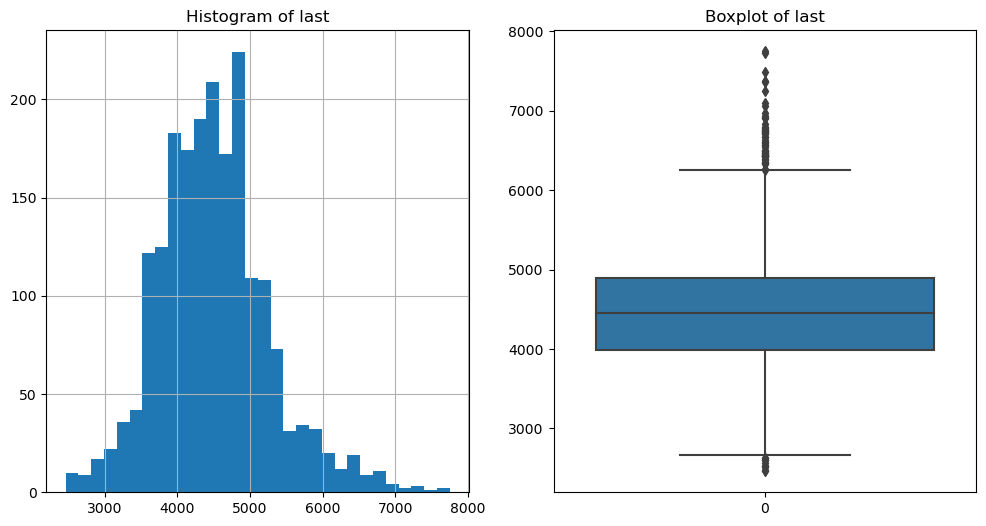

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


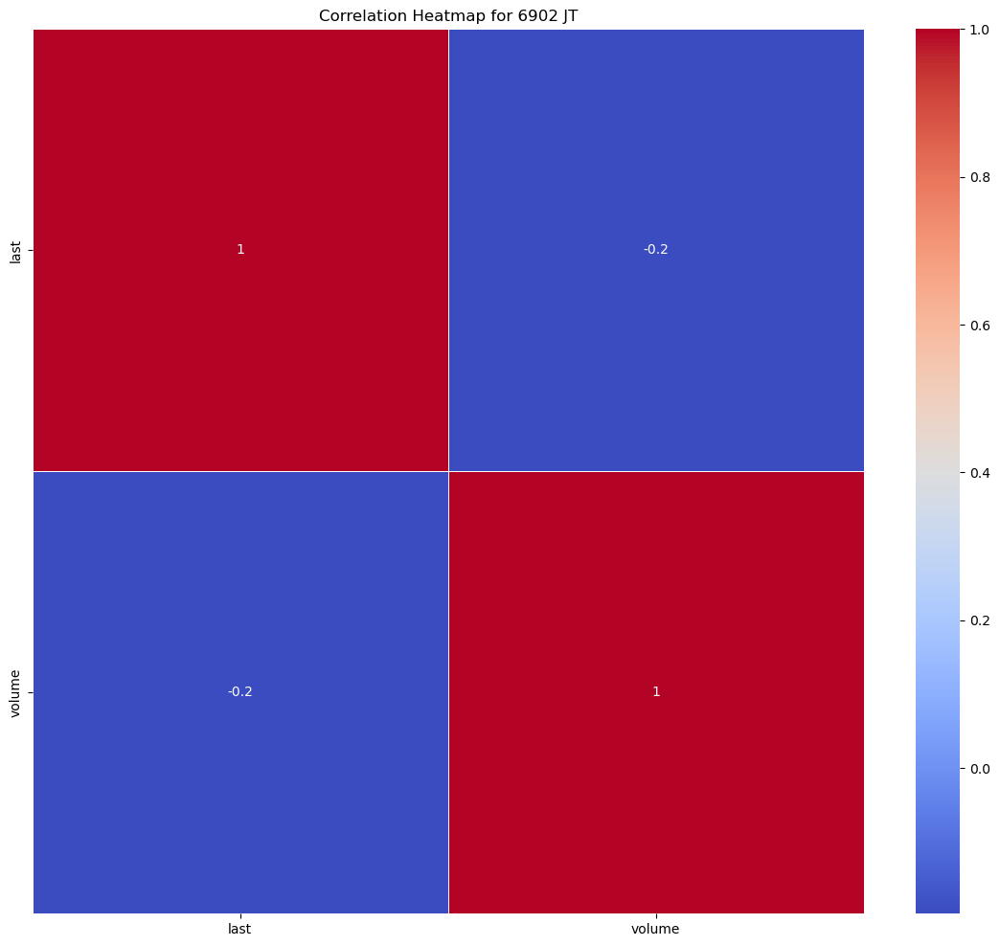

Statistics for stock 6952 JT
---- last ----
Mean: 1490.7823186533665
Median: 1509.0886
Mode: 1292.9422
Range: 1910.1949
Standard Deviation: 407.7500866533907
Skewness: -0.3022923080072468
Kurtosis: -0.2615938679572012


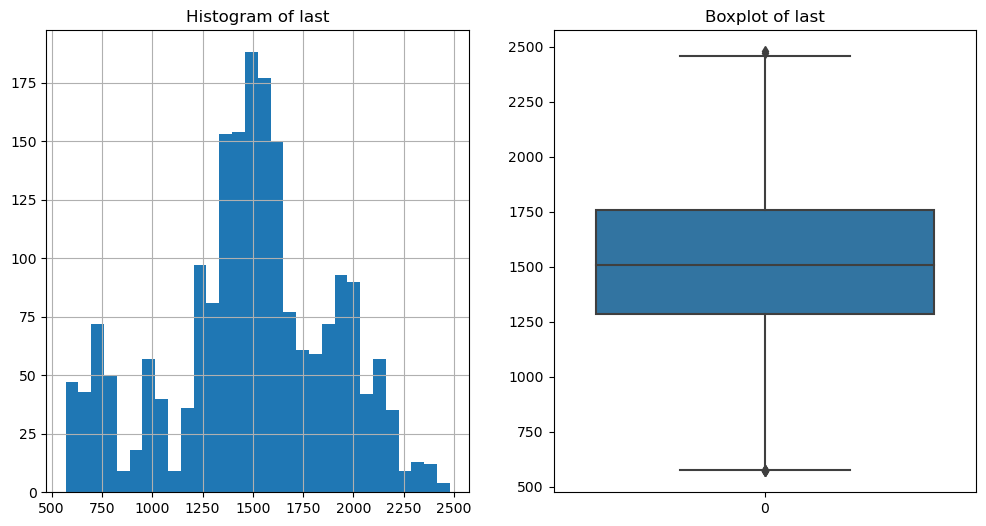

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


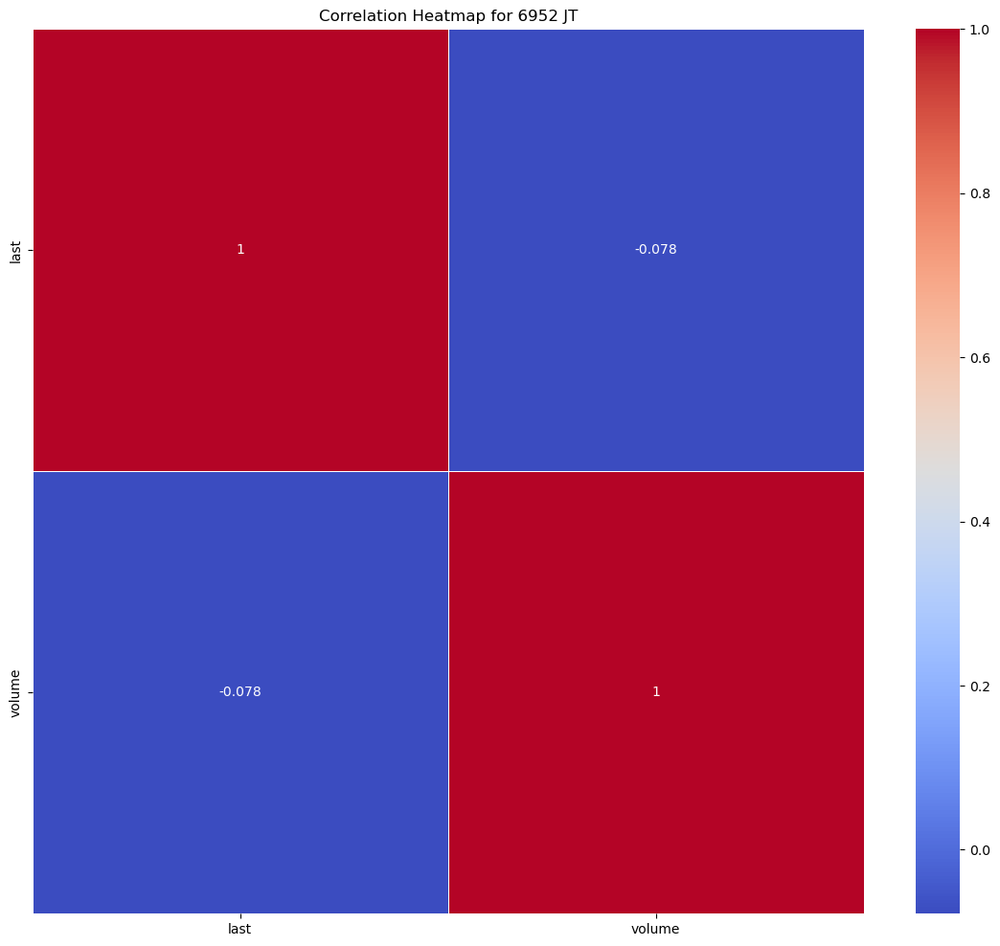

Statistics for stock 6954 JT
---- last ----
Mean: 18442.025001645885
Median: 18424.3922
Mode: 11674.7598
Range: 19529.8361
Standard Deviation: 3835.4684915581943
Skewness: 0.44411452873891955
Kurtosis: -0.19335886810433234


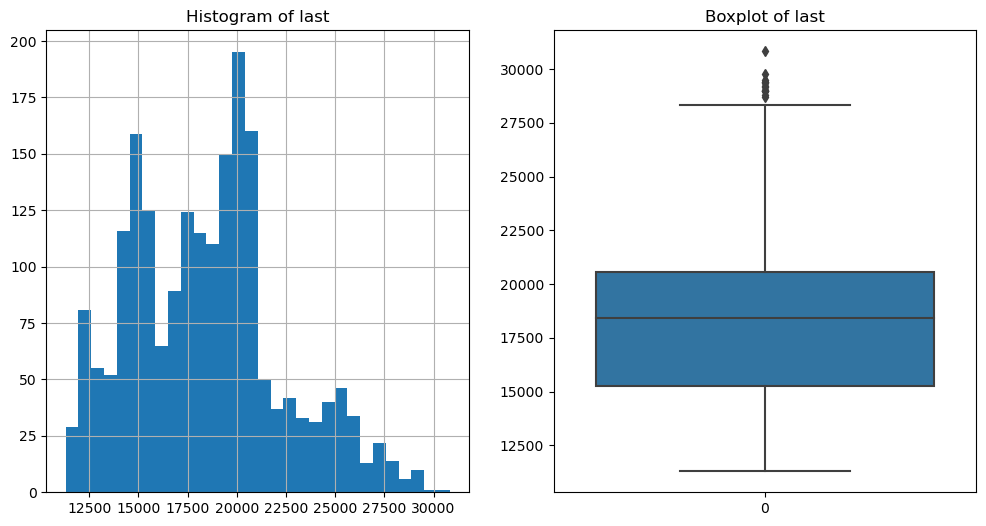

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


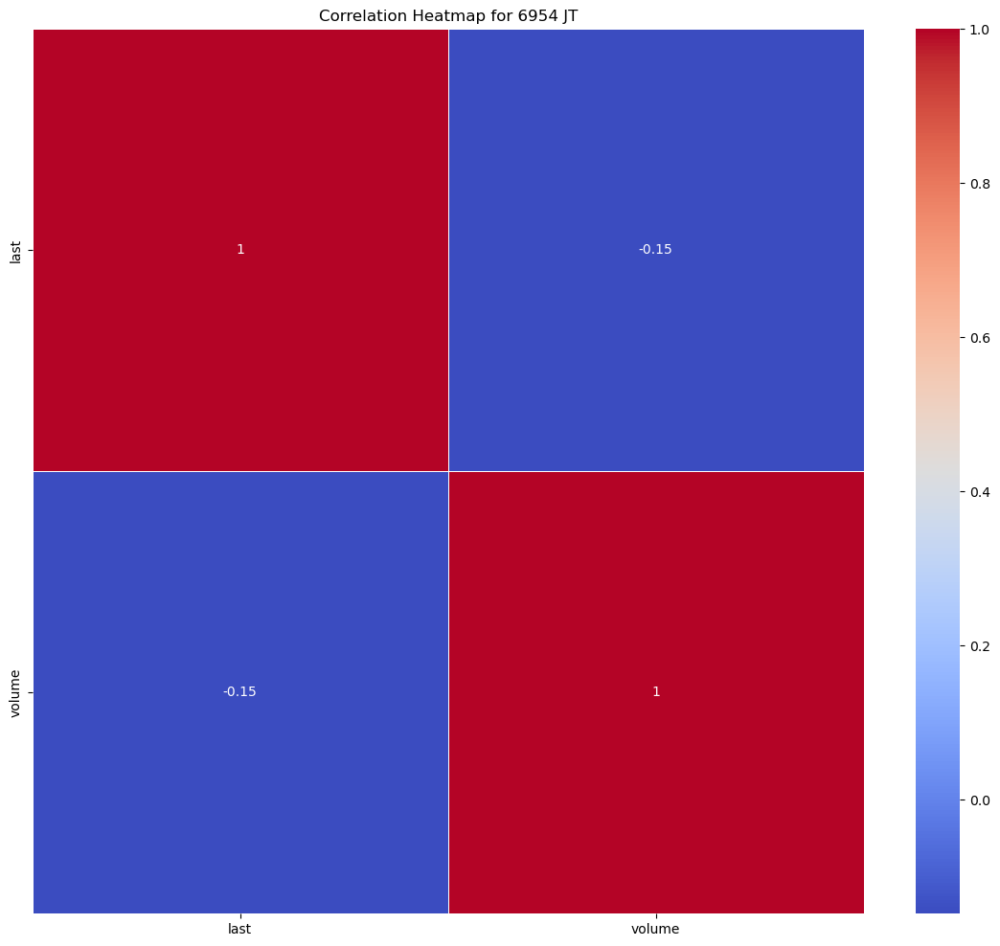

Statistics for stock 6971 JT
---- last ----
Mean: 5479.566776907731
Median: 5644.7533
Mode: 3543.8853
Range: 4258.2235
Standard Deviation: 1005.083680775448
Skewness: -0.003579541992900641
Kurtosis: -0.940608033745677


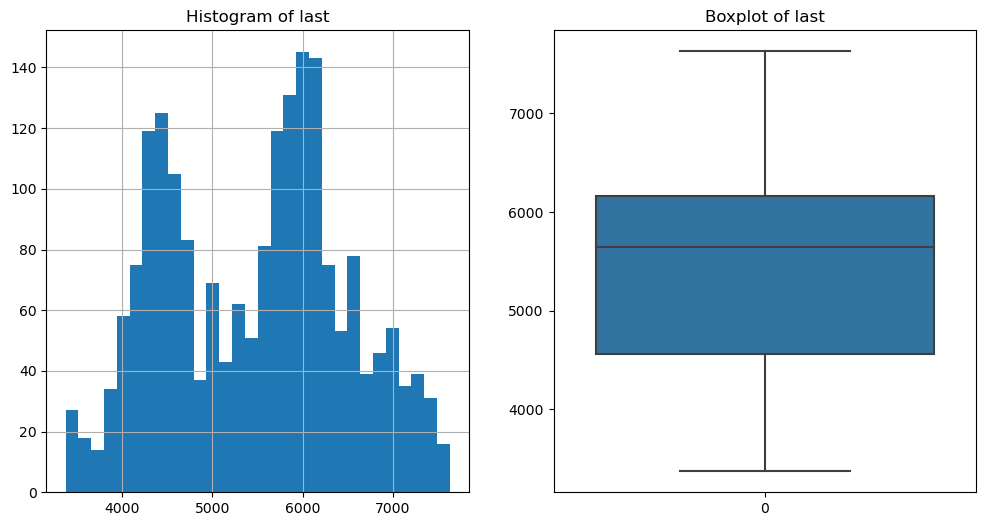

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


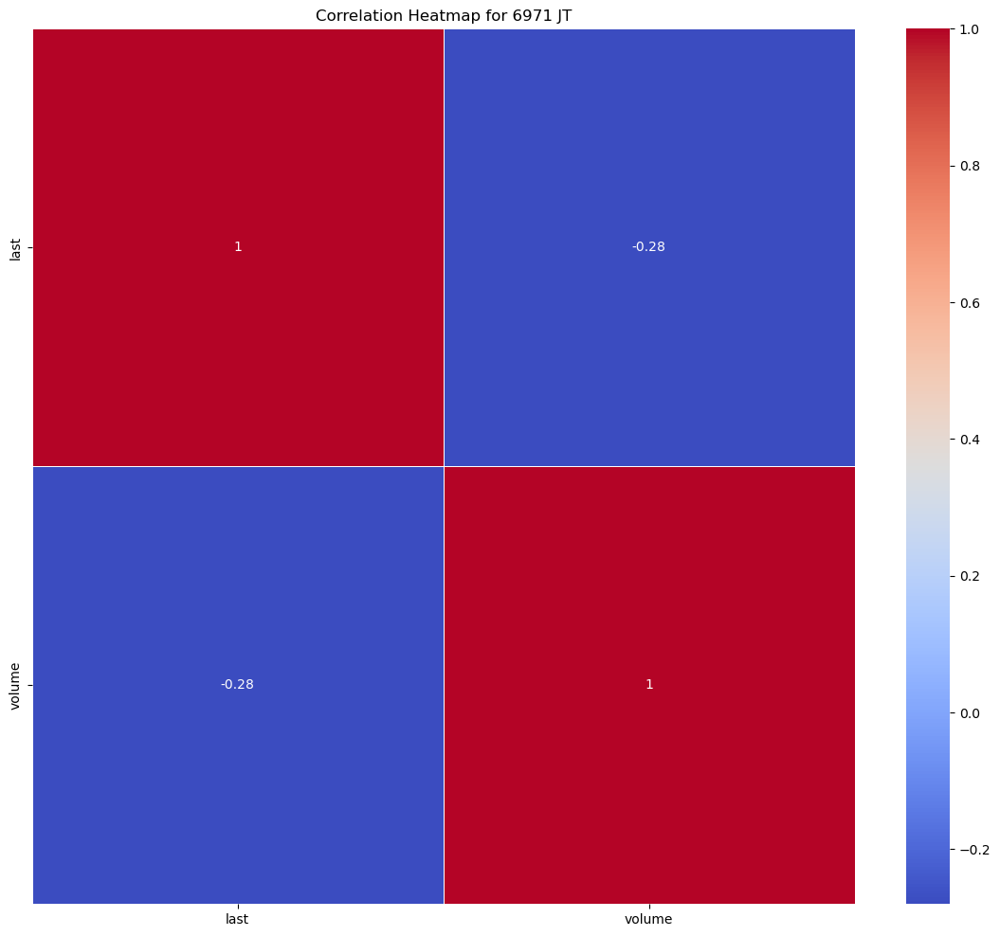

Statistics for stock 6976 JT
---- last ----
Mean: 1911.134098553616
Median: 1595.9248
Mode: 873.701
Range: 5577.0904
Standard Deviation: 1020.1384444577059
Skewness: 1.705687200922886
Kurtosis: 3.152401623295912


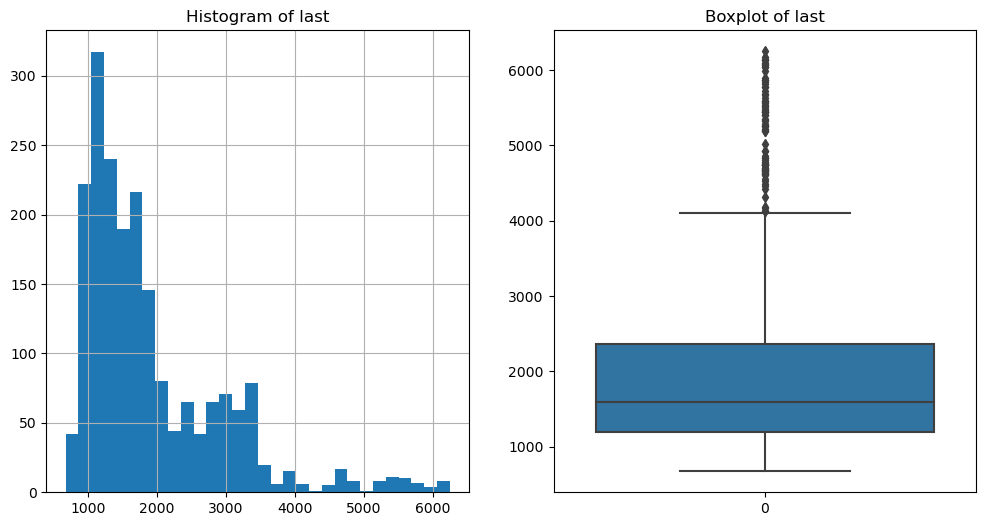

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


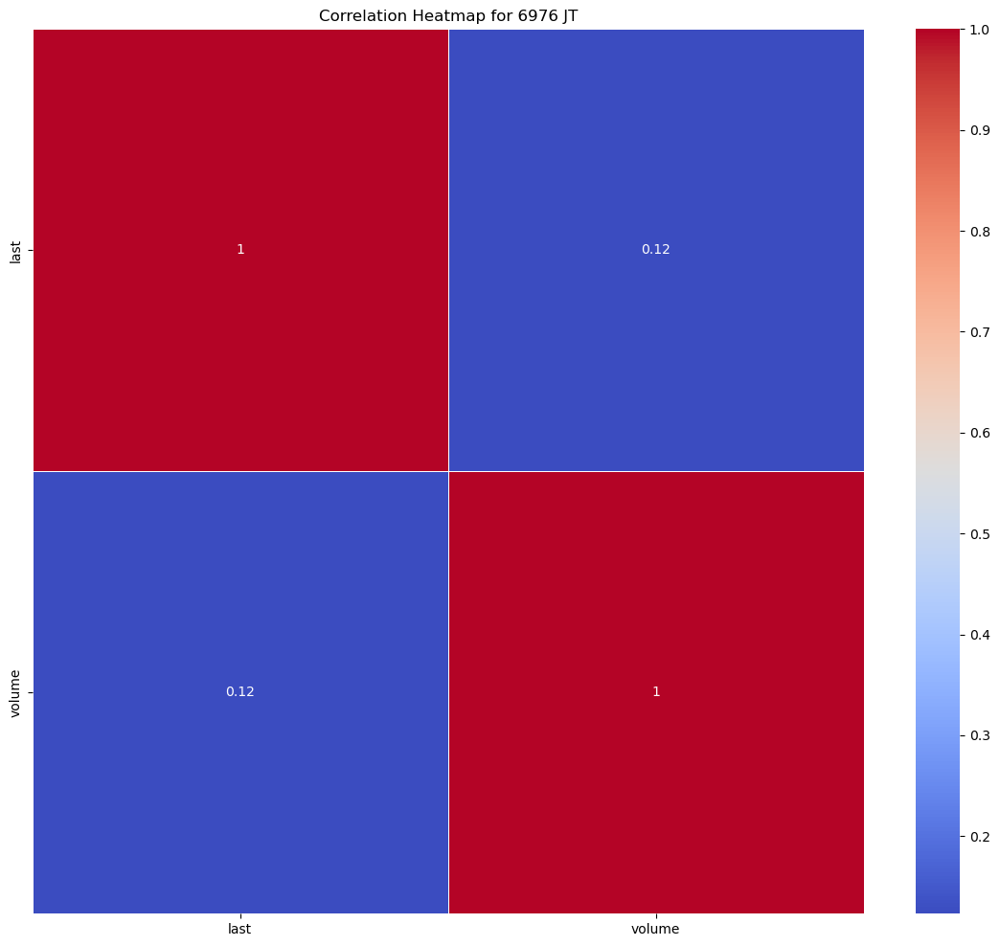

Statistics for stock 7003 JT
---- last ----
Mean: 1482.1839127680798
Median: 1620.0
Mode: 1779.9992
Range: 2125.8509
Standard Deviation: 523.1075815618015
Skewness: -0.731072900256654
Kurtosis: -0.4676684678987777


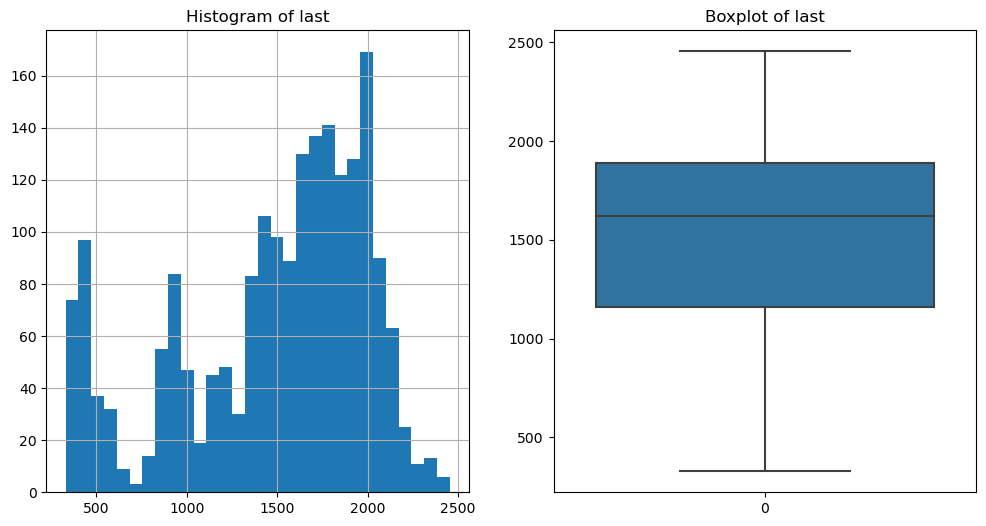

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


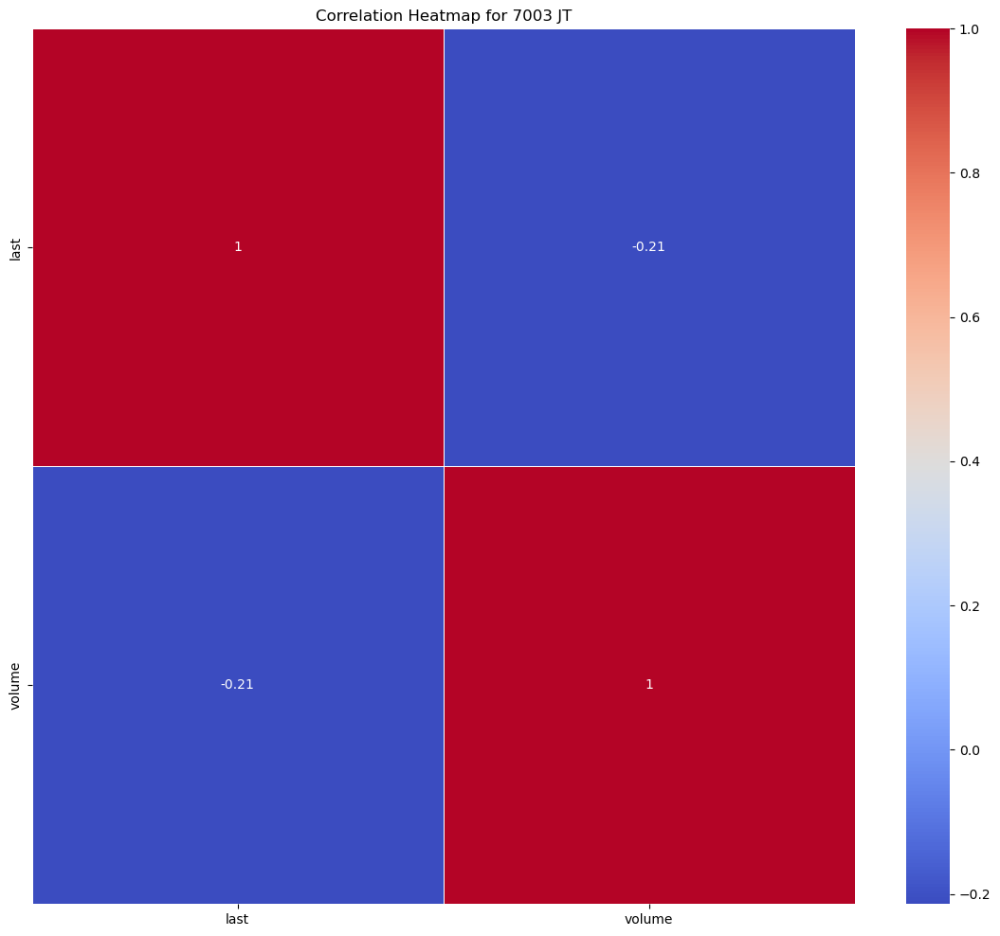

Statistics for stock 7004 JT
---- last ----
Mean: 500.9438707730673
Median: 500.059
Mode: 642.4498
Range: 644.5554999999999
Standard Deviation: 104.00660778001073
Skewness: 0.24575520134434137
Kurtosis: -0.06469391061917884


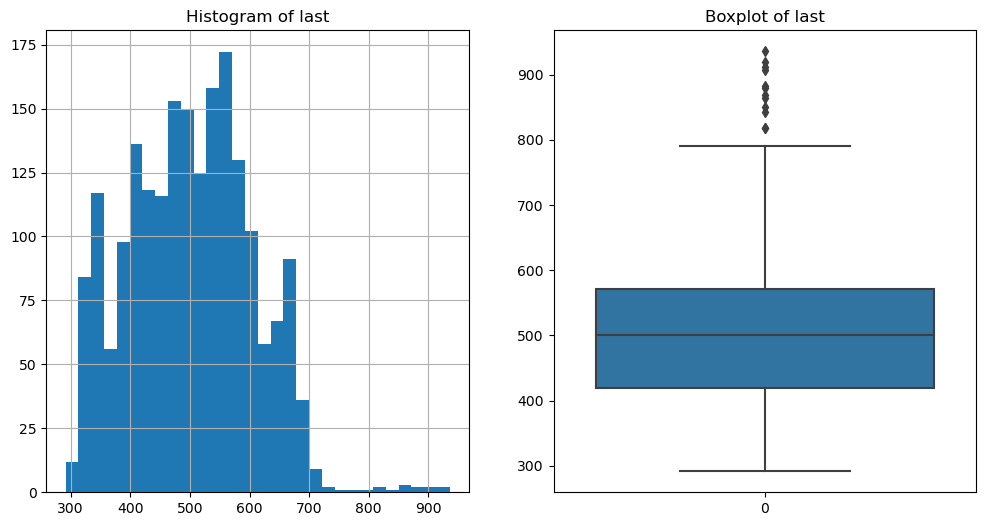

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


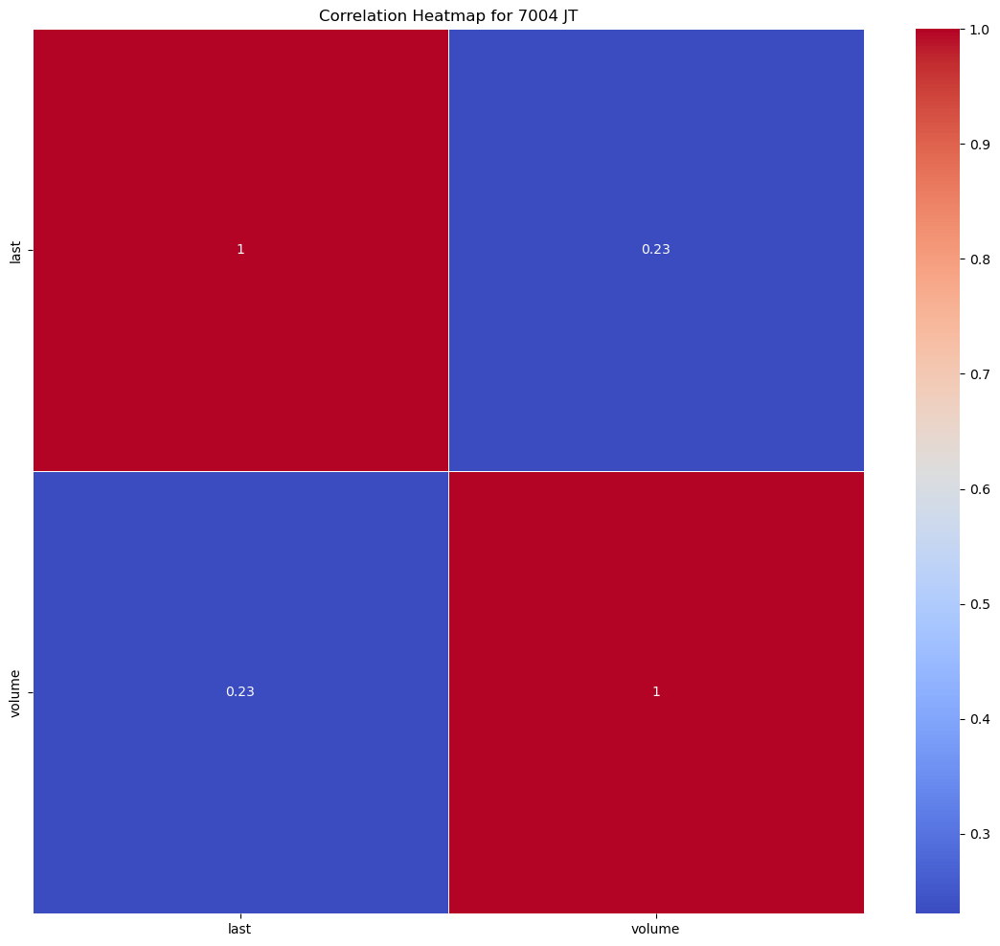

Statistics for stock 7011 JT
---- last ----
Mean: 4318.236438104738
Median: 4136.217
Mode: 5233.9794
Range: 4690.4678
Standard Deviation: 946.5390515336433
Skewness: 0.10457325351492004
Kurtosis: -0.3111555137026287


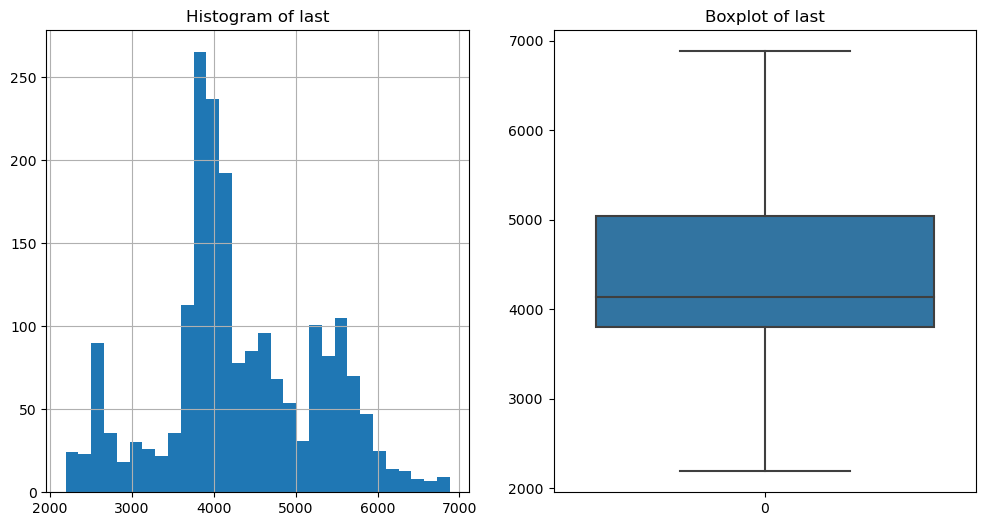

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


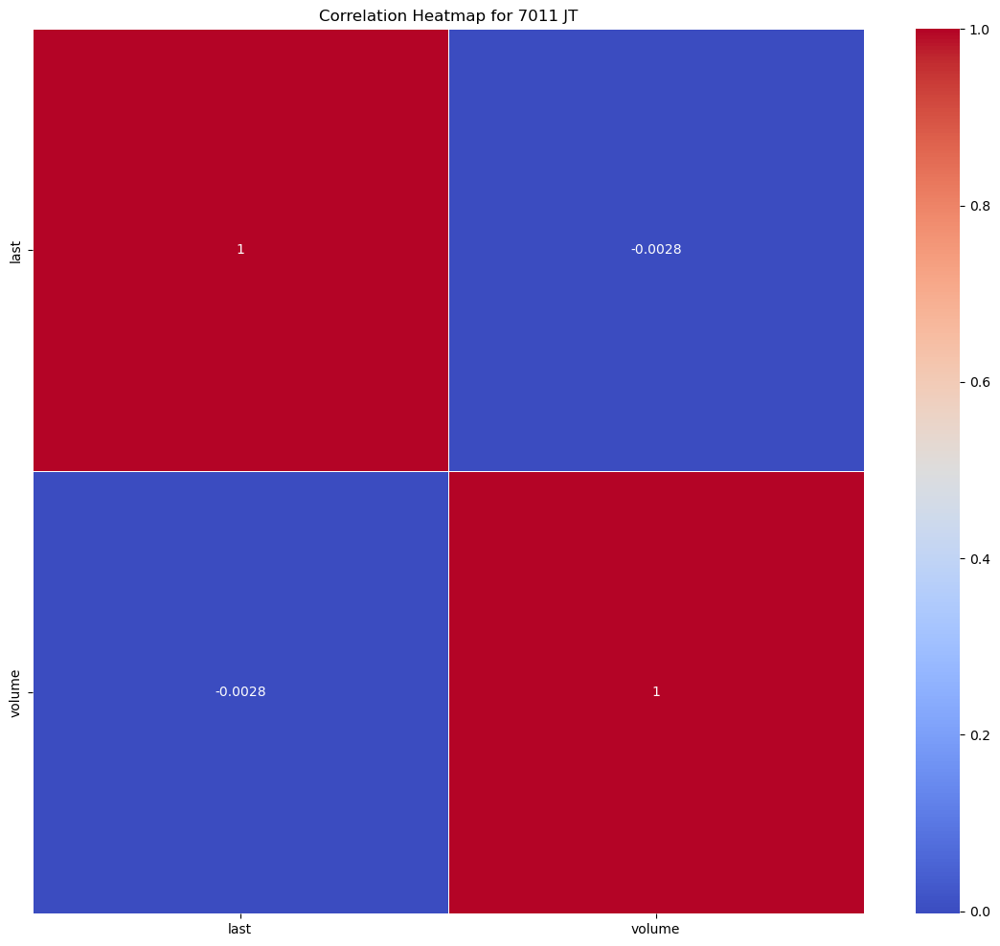

Statistics for stock 7012 JT
---- last ----
Mean: 3136.837943391521
Median: 3102.7051
Mode: 3208.6843
Range: 4473.6751
Standard Deviation: 933.5474517166223
Skewness: 0.4968730019610019
Kurtosis: 0.34116071262155145


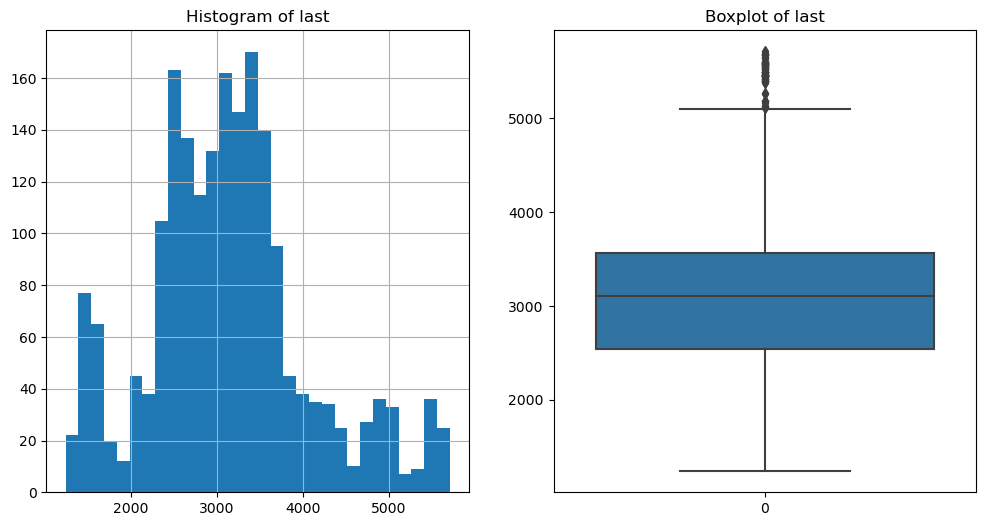

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


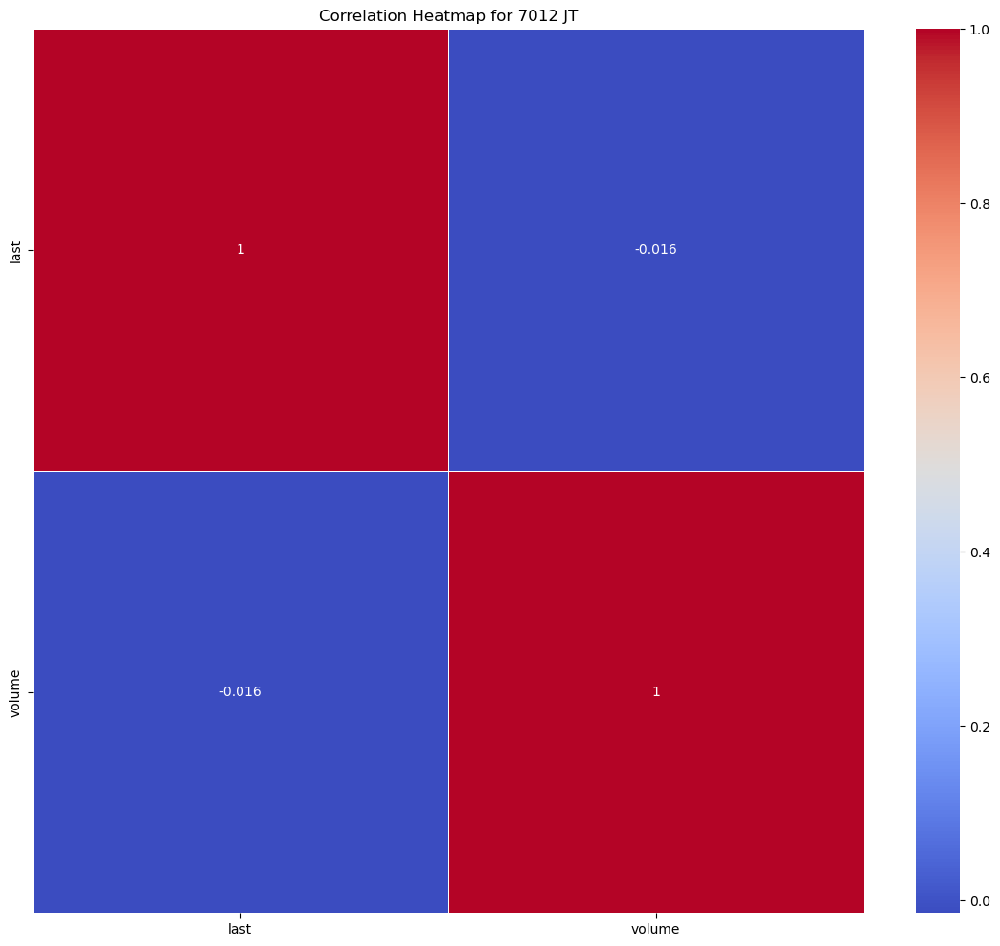

Statistics for stock 7013 JT
---- last ----
Mean: 3222.4203056857855
Median: 3261.0991
Mode: 2885.1532
Range: 4764.906
Standard Deviation: 1047.8210989388335
Skewness: 0.25244124897288595
Kurtosis: -0.33392319390555647


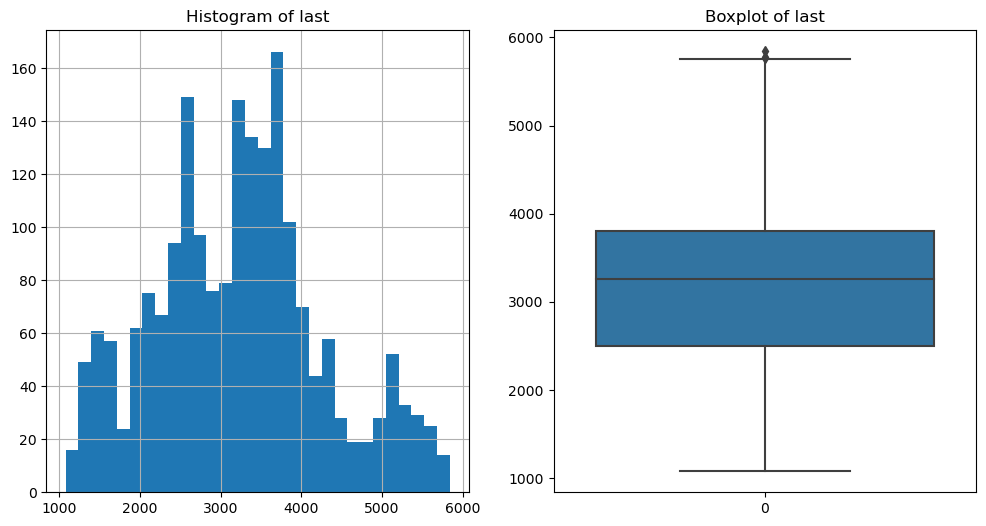

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


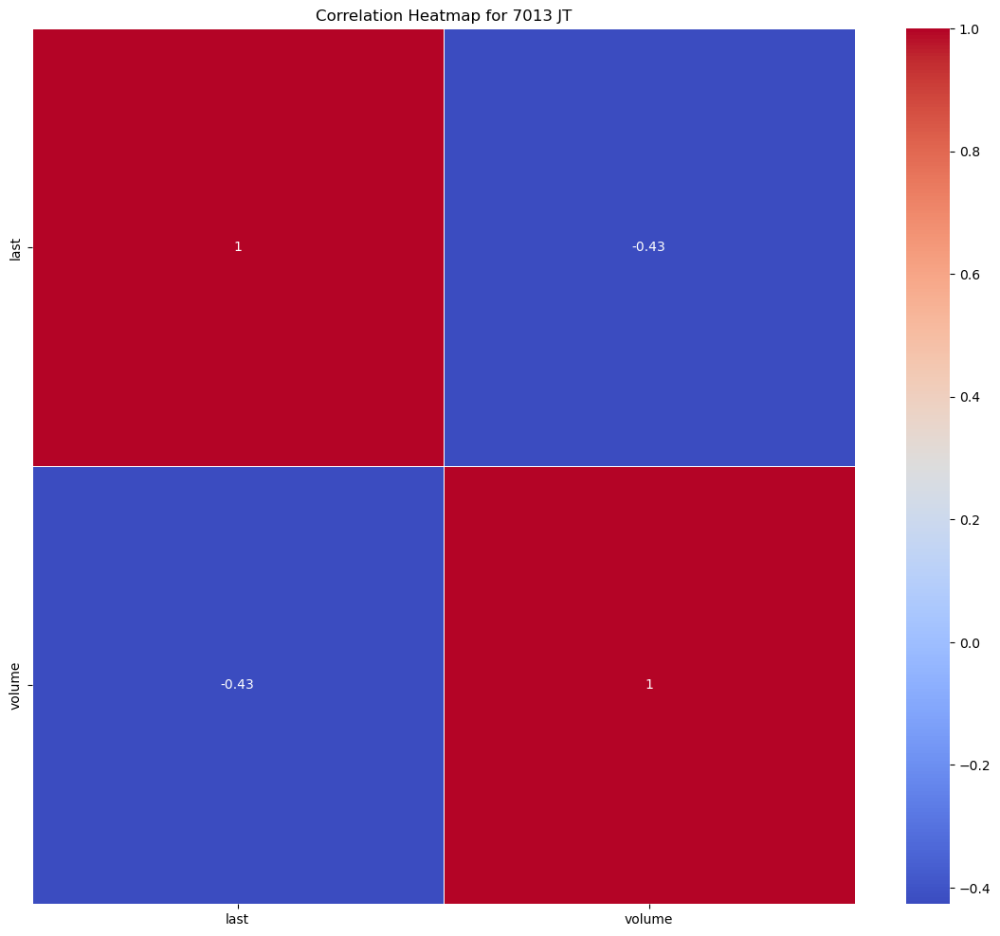

Statistics for stock 7201 JT
---- last ----
Mean: 818.5669878802993
Median: 856.6413
Mode: 712.4636
Range: 780.5207
Standard Deviation: 187.70227820082692
Skewness: -0.8468720972019804
Kurtosis: -0.007906581599570028


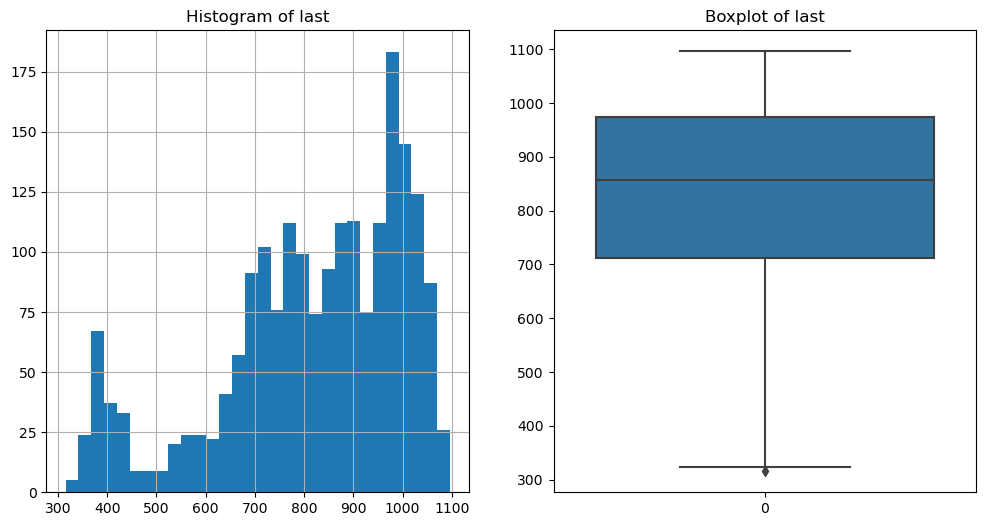

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


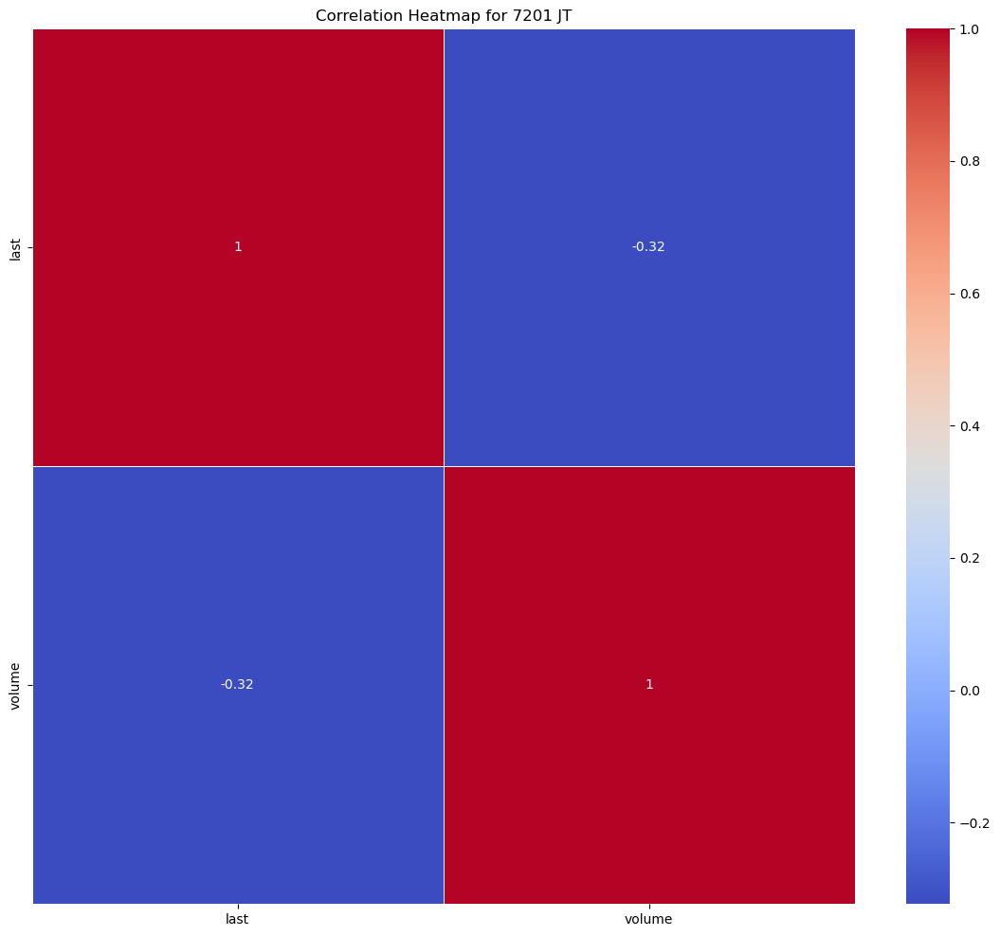

Statistics for stock 7202 JT
---- last ----
Mean: 1217.1511565586036
Median: 1192.83
Mode: 1097.5508
Range: 1246.032
Standard Deviation: 210.99284660418934
Skewness: 0.1822961232312029
Kurtosis: -0.3712548914633631


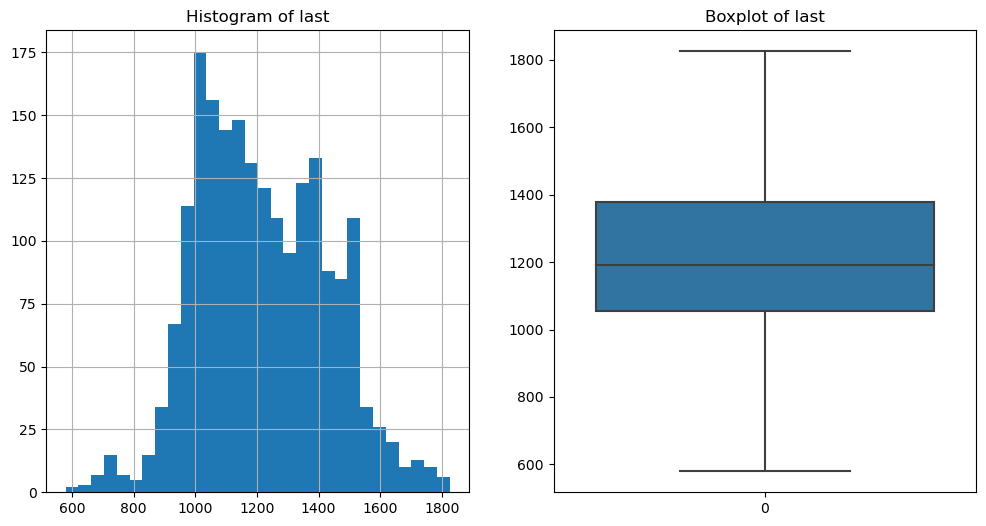

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


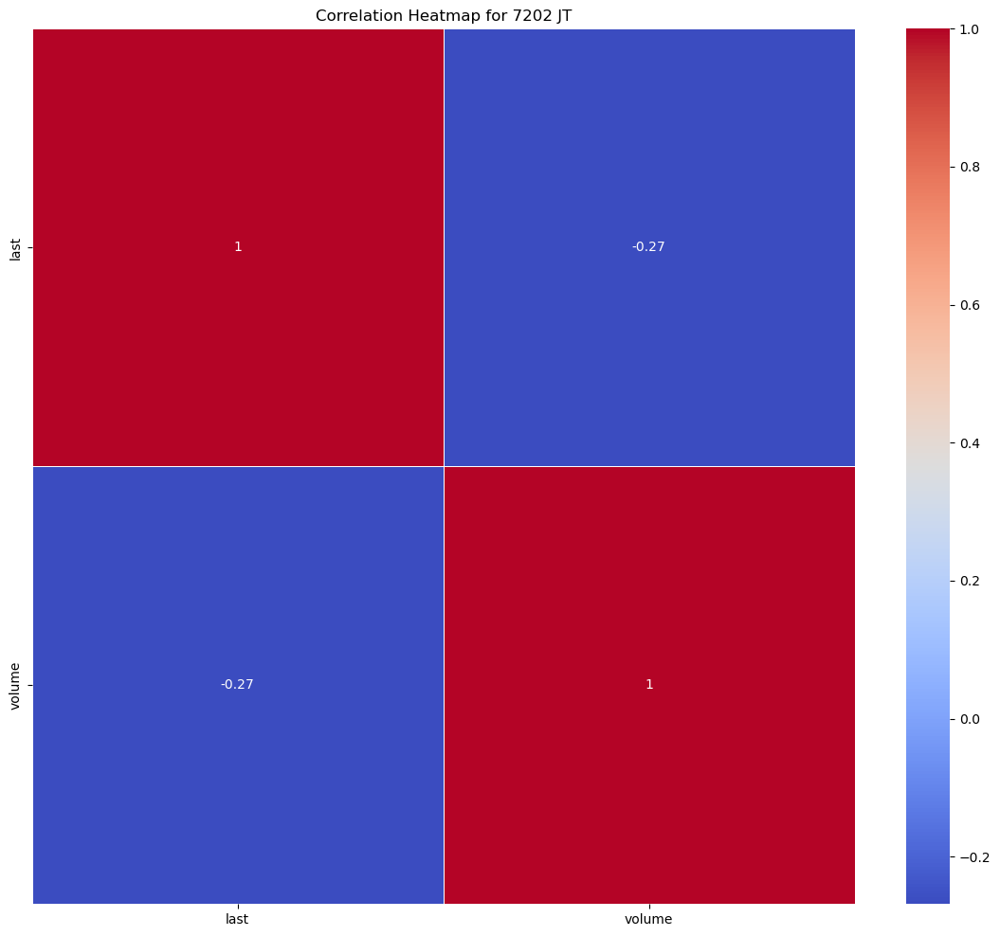

Statistics for stock 7203 JT
---- last ----
Mean: 5967.843972718204
Median: 6205.74
Mode: 5029.536
Range: 5433.9745
Standard Deviation: 990.0635280354979
Skewness: -0.21064857478844254
Kurtosis: -0.4818867273942091


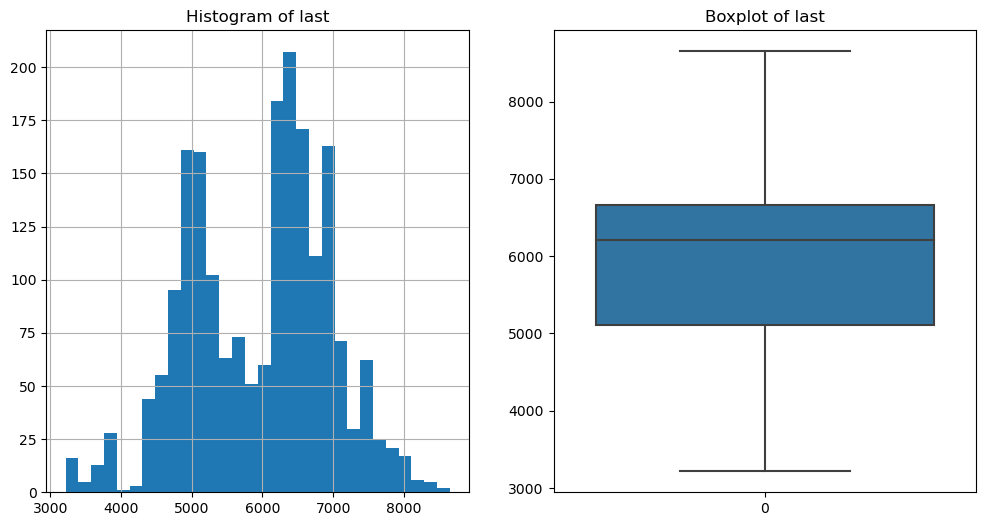

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


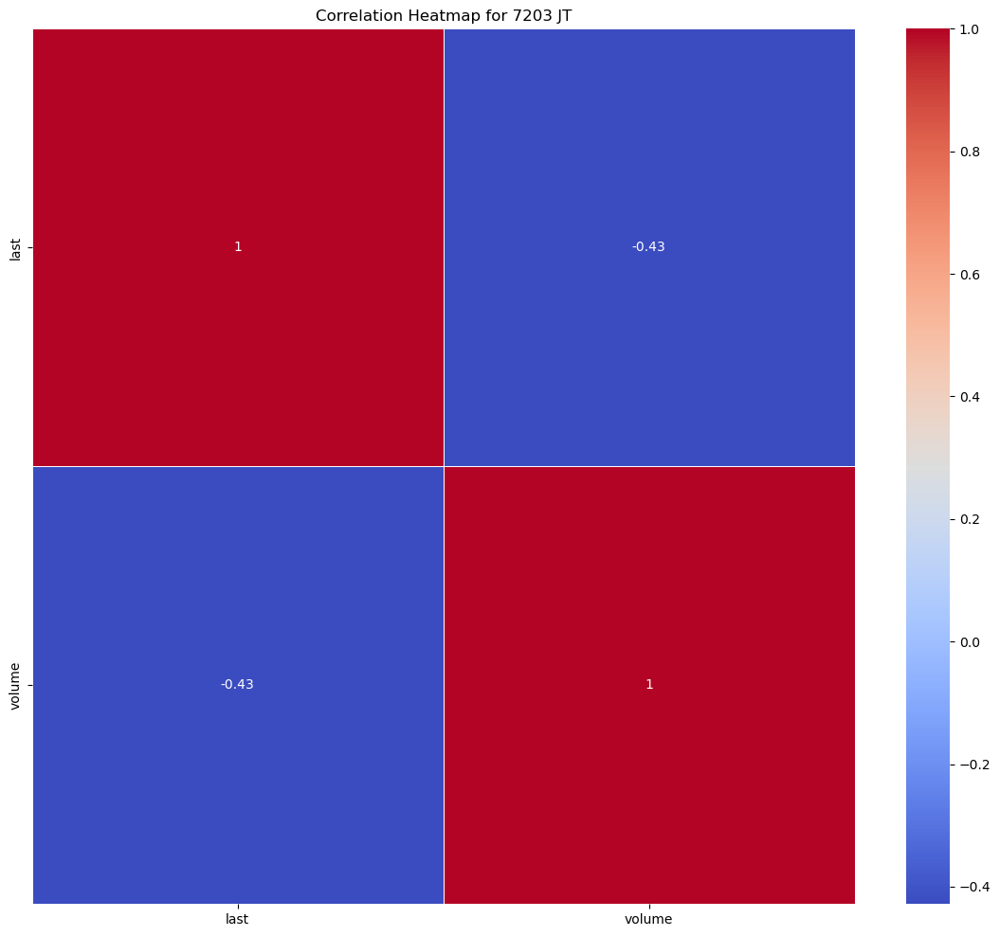

Statistics for stock 7205 JT
---- last ----
Mean: 1106.9122348129674
Median: 1129.5519
Mode: 1142.4716
Range: 1156.4328
Standard Deviation: 213.50292481376417
Skewness: -0.36984343135867986
Kurtosis: -0.2698091366887674


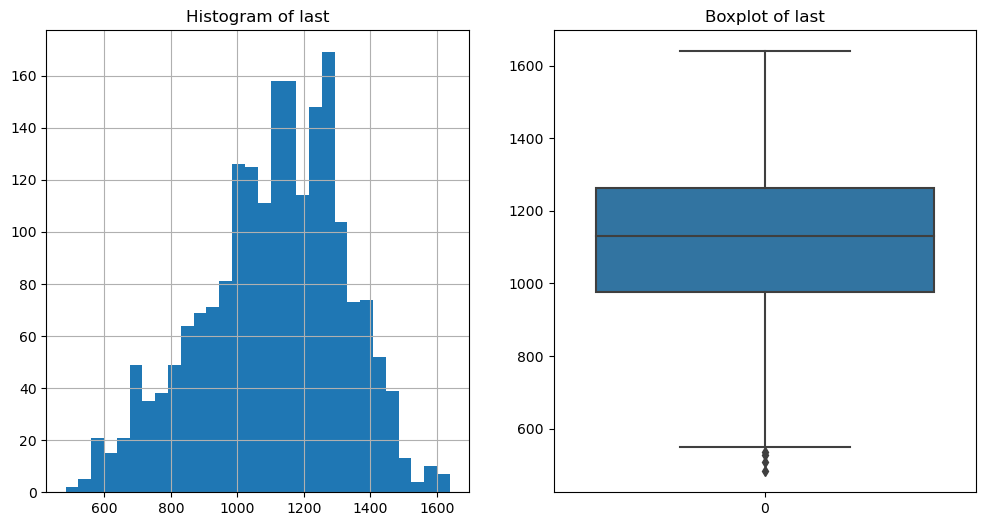

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


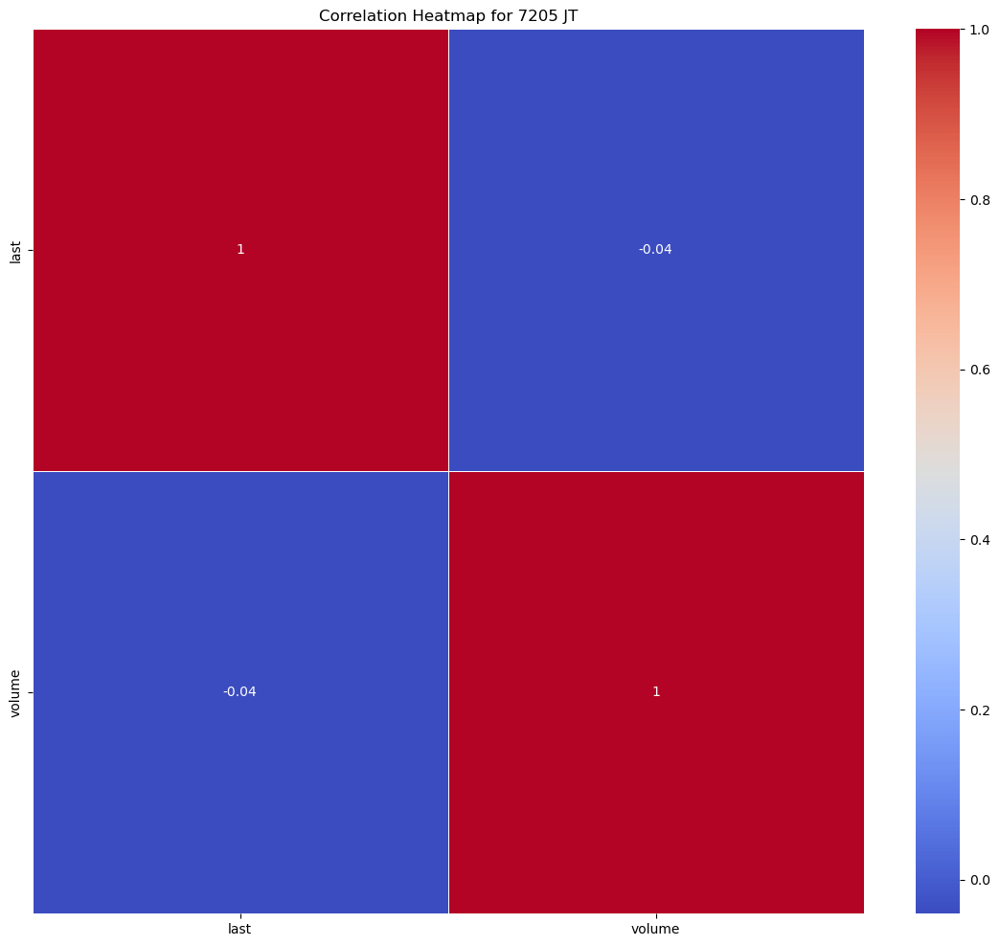

Statistics for stock 7211 JT
---- last ----
Mean: 714.7753528678304
Median: 748.1687
Mode: 874.8844
Range: 1509.7954
Standard Deviation: 266.6170576223391
Skewness: -0.1534299663942089
Kurtosis: -0.6378589273668966


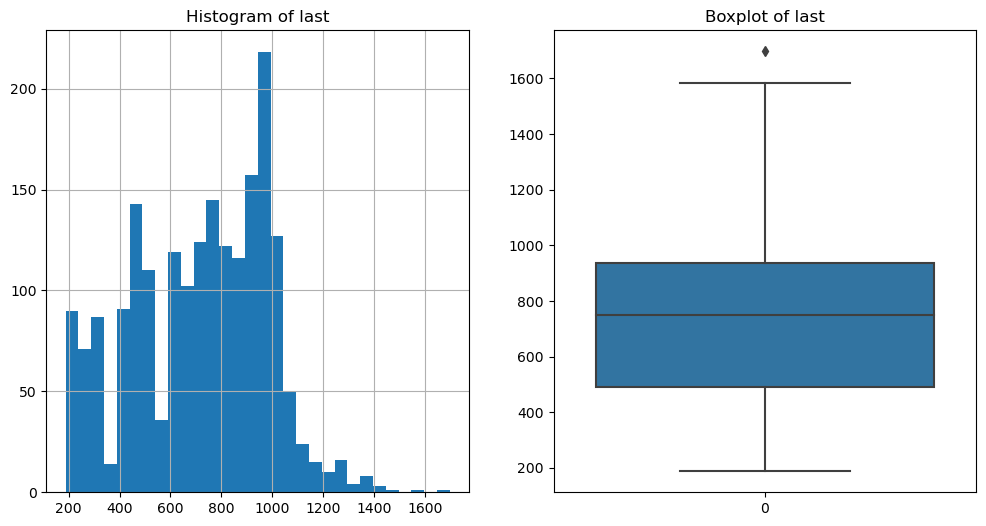

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


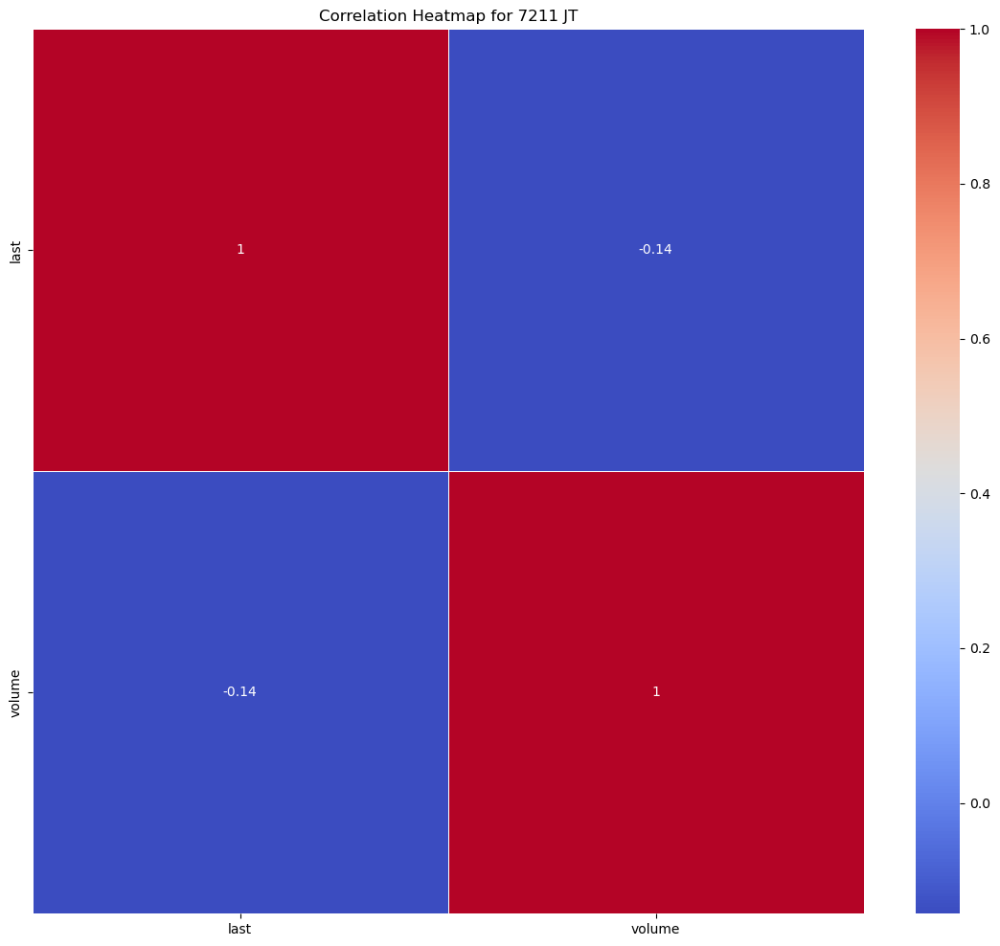

Statistics for stock 7261 JT
---- last ----
Mean: 1468.8486811970074
Median: 1417.2748
Mode: 1955.63
Range: 2277.5501
Standard Deviation: 508.724547510775
Skewness: 0.13352651878942504
Kurtosis: -0.8110369245310407


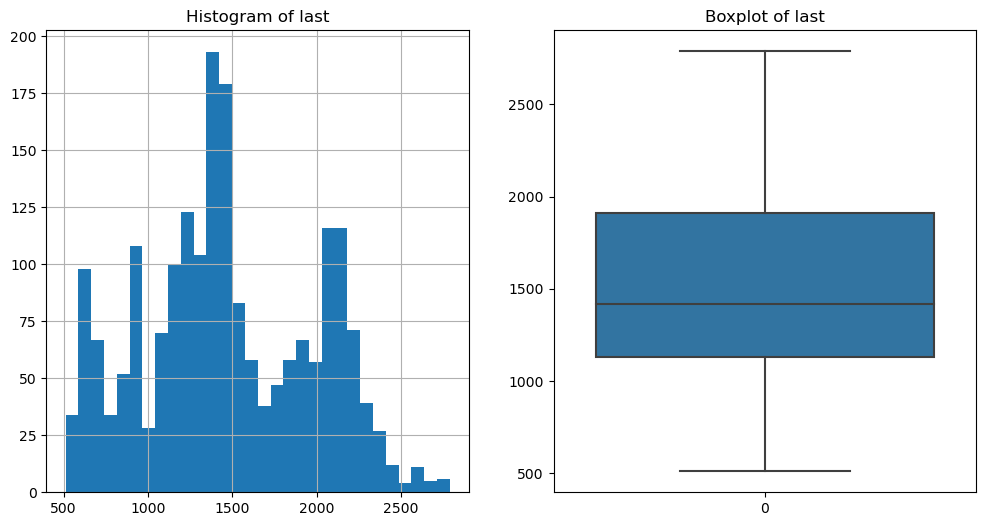

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


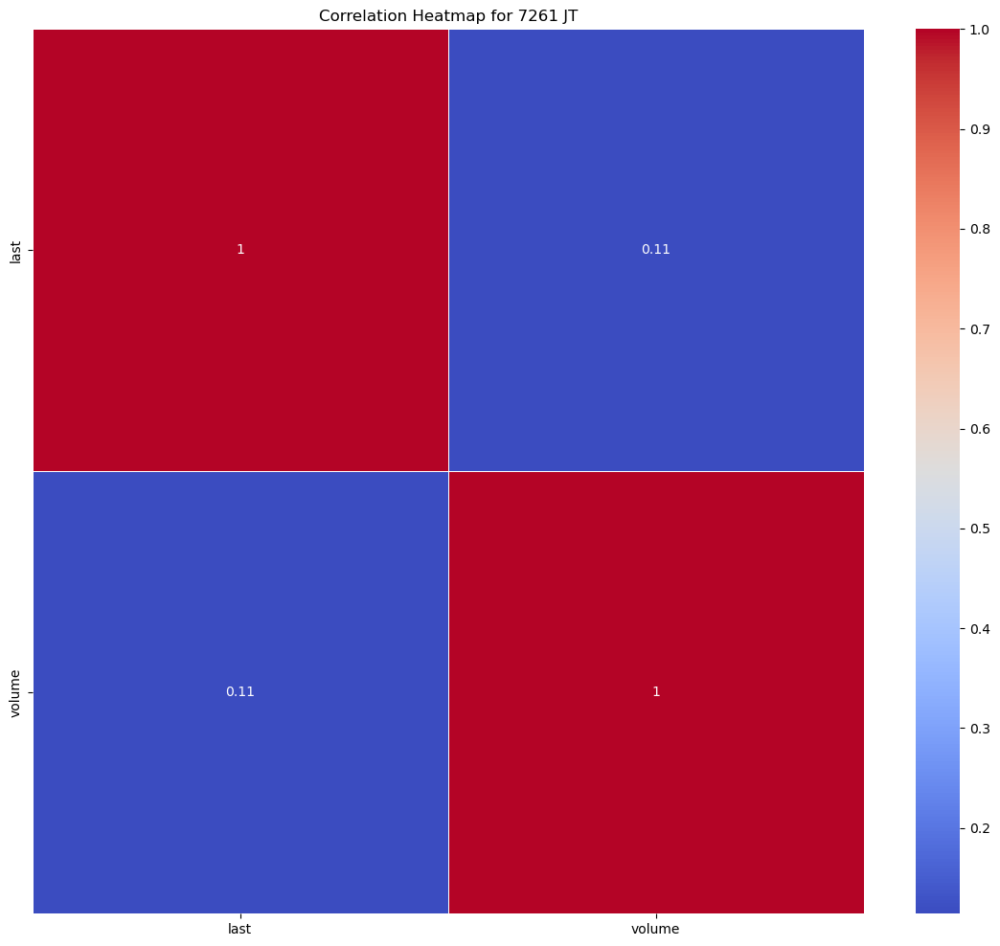

Statistics for stock 7267 JT
---- last ----
Mean: 2943.4911007481296
Median: 2937.2578
Mode: 3015.0762
Range: 1678.4958000000001
Standard Deviation: 302.72454900193026
Skewness: 0.06897351211853542
Kurtosis: -0.3340060133822256


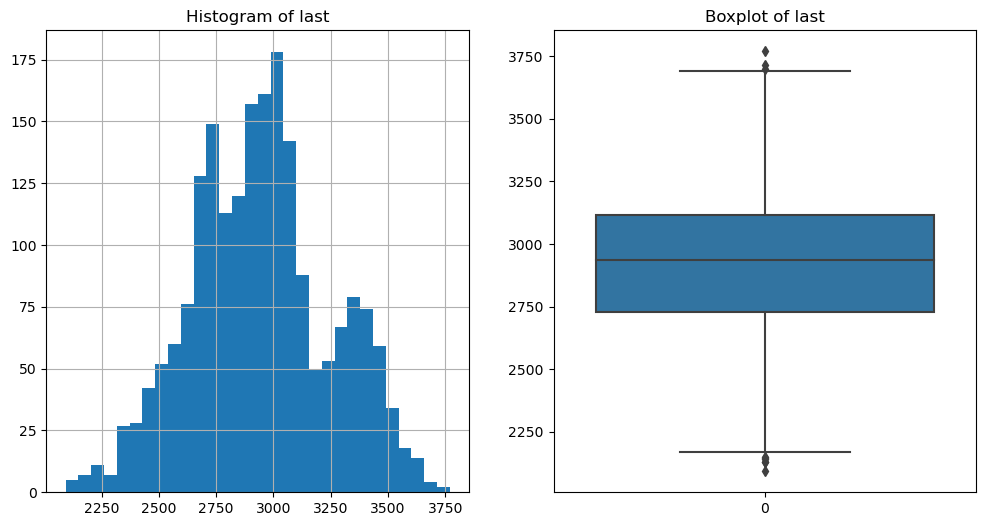

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


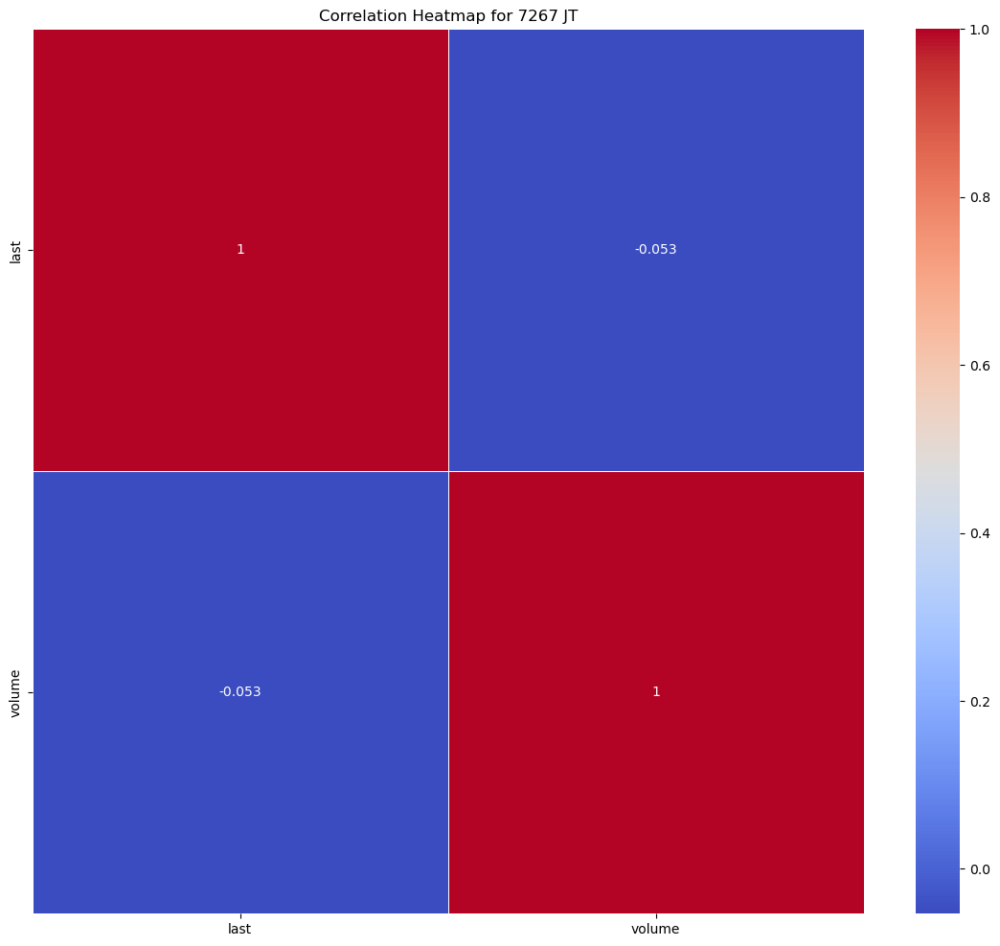

Statistics for stock 7269 JT
---- last ----
Mean: 3970.682590922693
Median: 3802.4639
Mode: 2206.4568
Range: 5426.0666
Standard Deviation: 1257.2023899429105
Skewness: 0.25007489518207426
Kurtosis: -0.9051568621231962


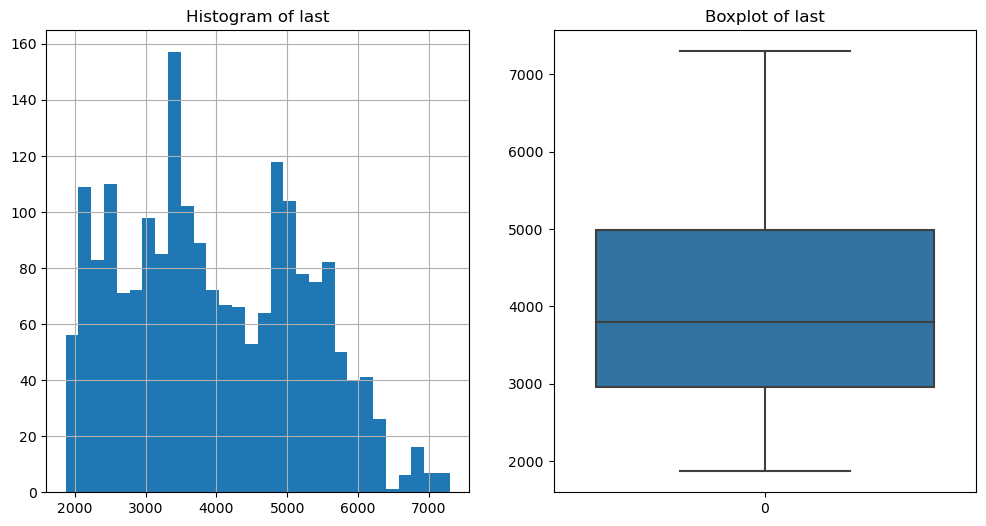

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


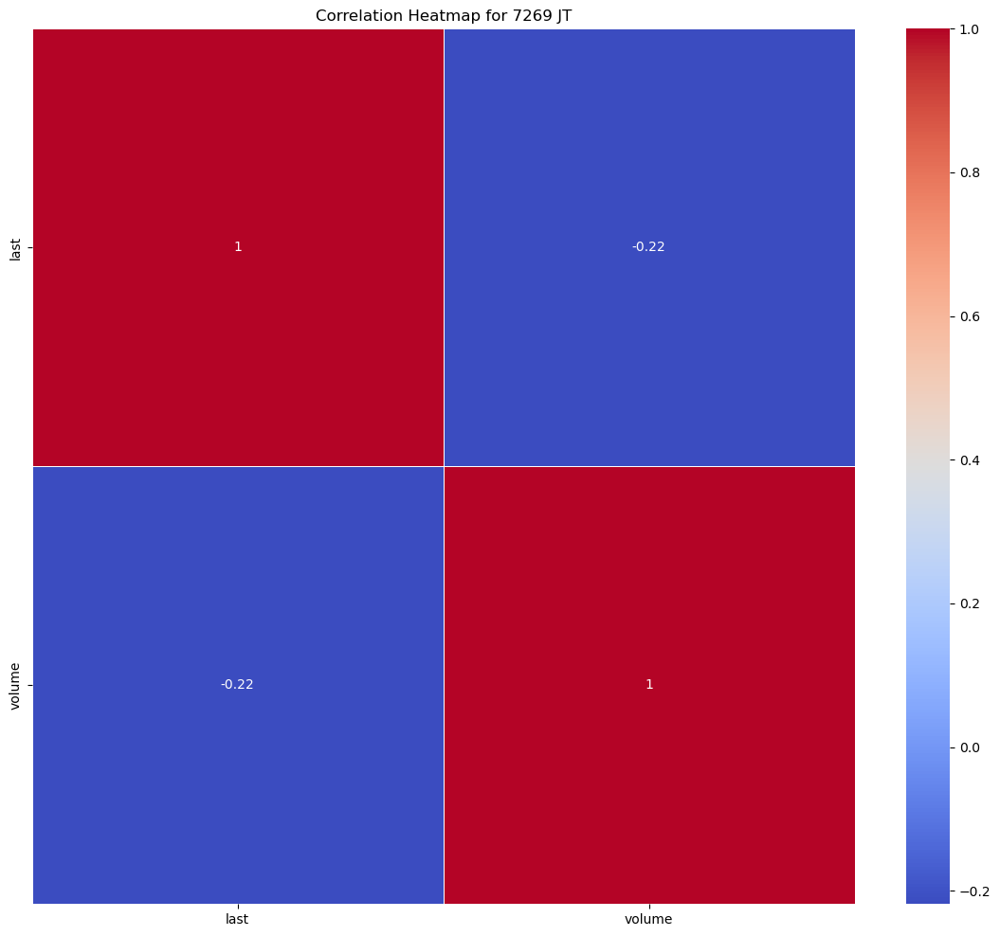

Statistics for stock 7270 JT
---- last ----
Mean: 2808.486446932668
Median: 2859.1581
Mode: 3217.953
Range: 3459.6842000000006
Standard Deviation: 711.8012392844128
Skewness: -0.26741165622787083
Kurtosis: -0.40686547717589594


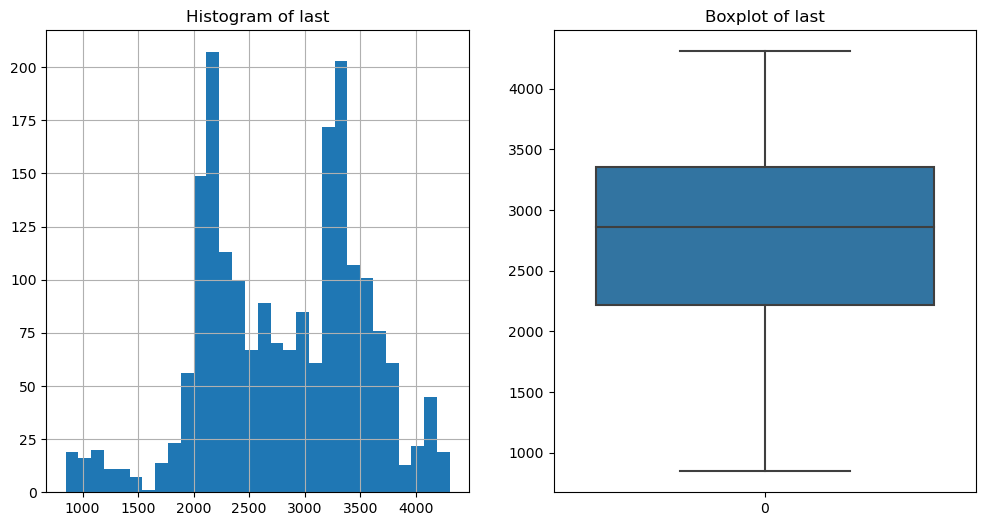

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


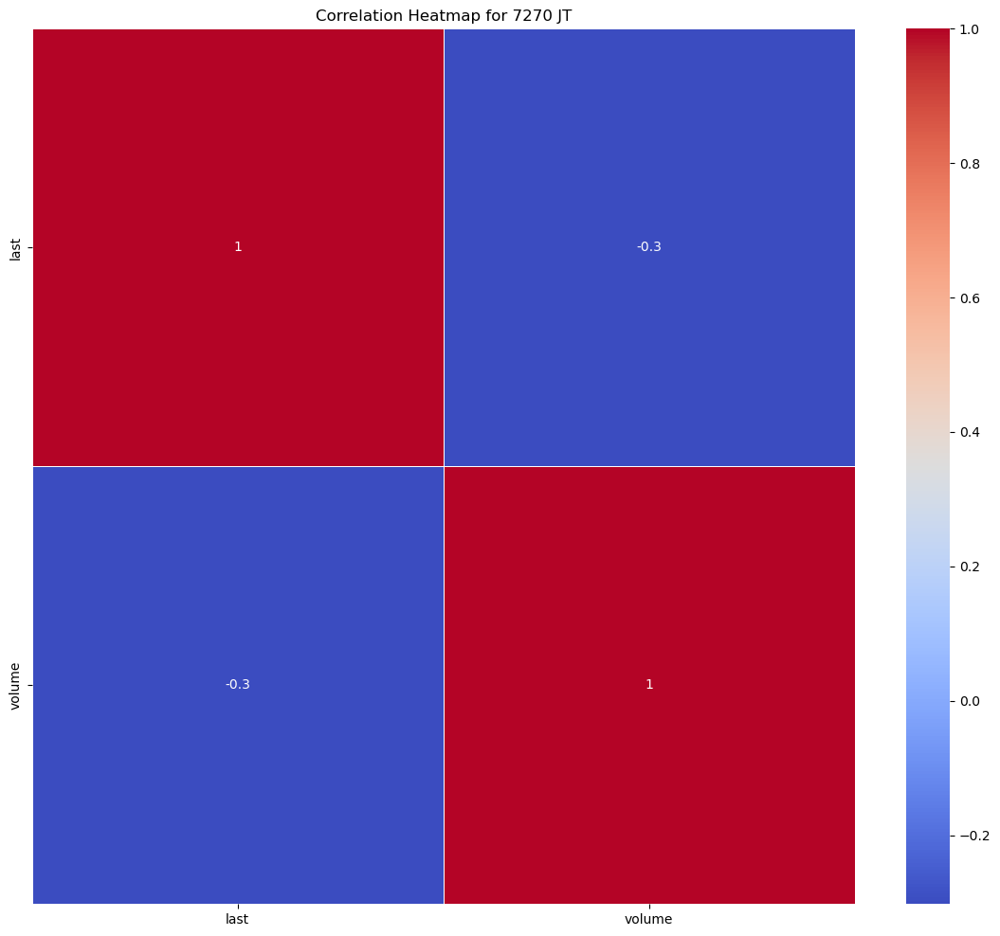

Statistics for stock 7731 JT
---- last ----
Mean: 1474.2381276309225
Median: 1469.5537
Mode: 709.0
Range: 1836.9391999999998
Standard Deviation: 335.0326220813509
Skewness: -0.27051284154127164
Kurtosis: 0.4710426419626885


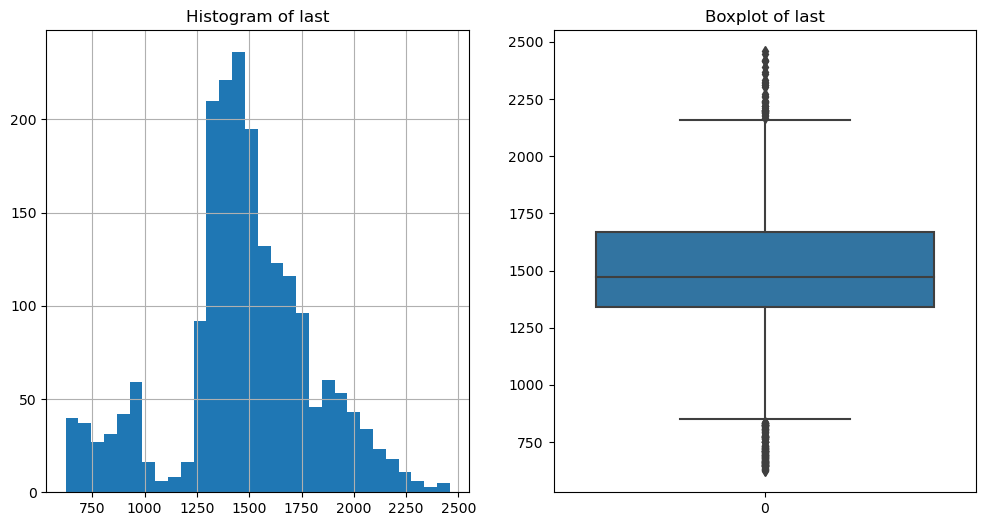

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


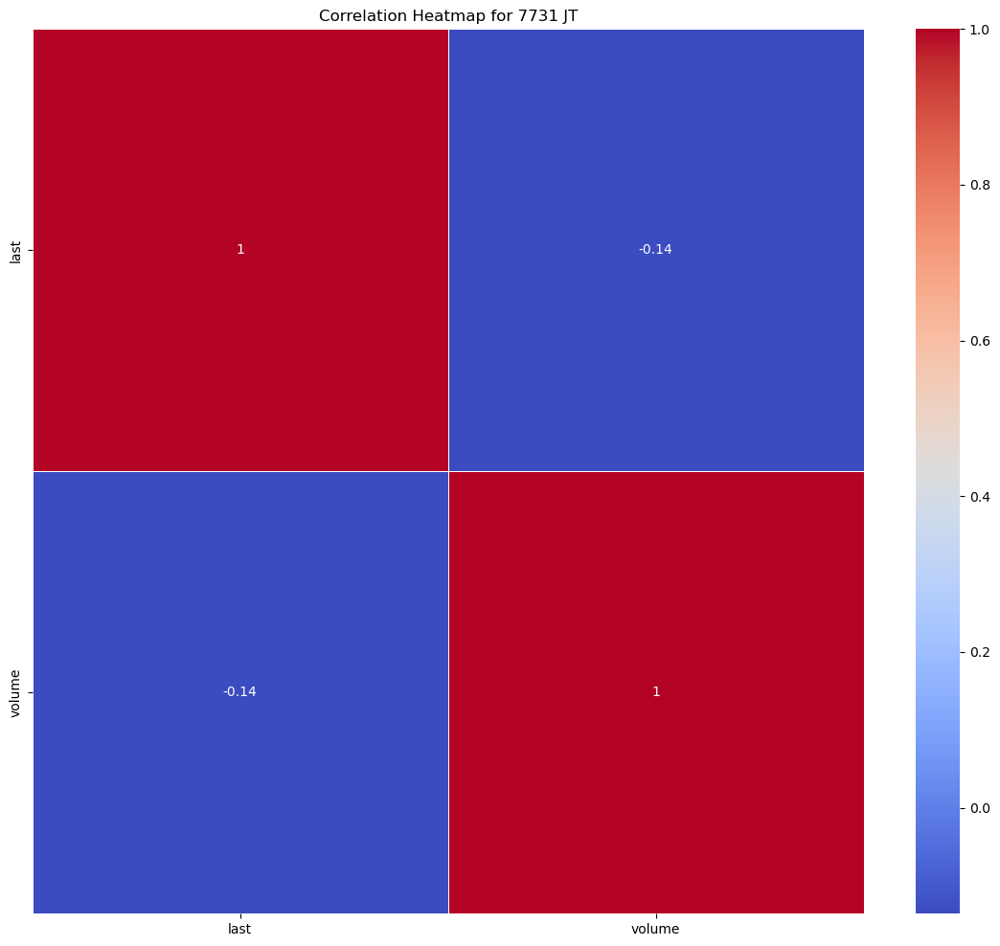

Statistics for stock 7733 JT
---- last ----
Mean: 1129.1398898753116
Median: 1020.9423
Mode: 738.7601
Range: 2054.1405
Standard Deviation: 414.23824979215897
Skewness: 1.343031501254923
Kurtosis: 1.187516407999908


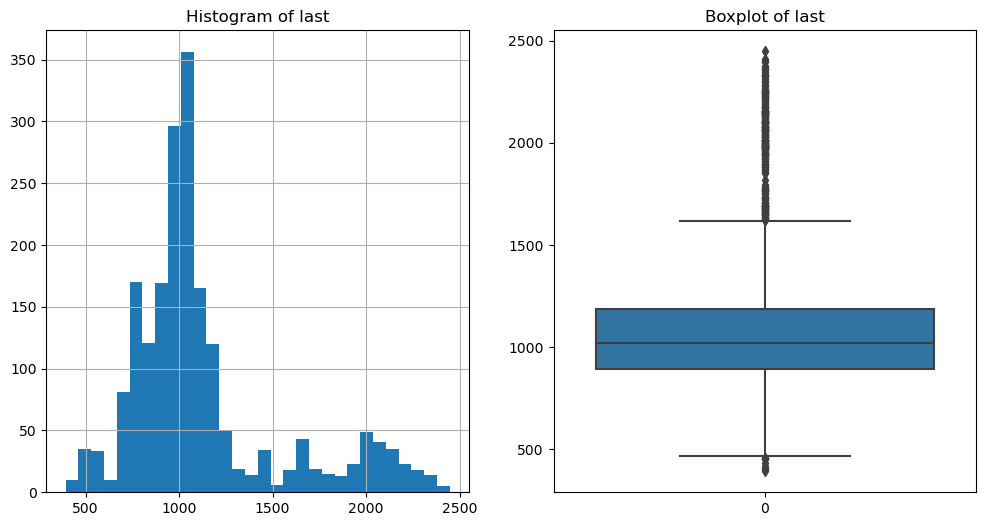

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


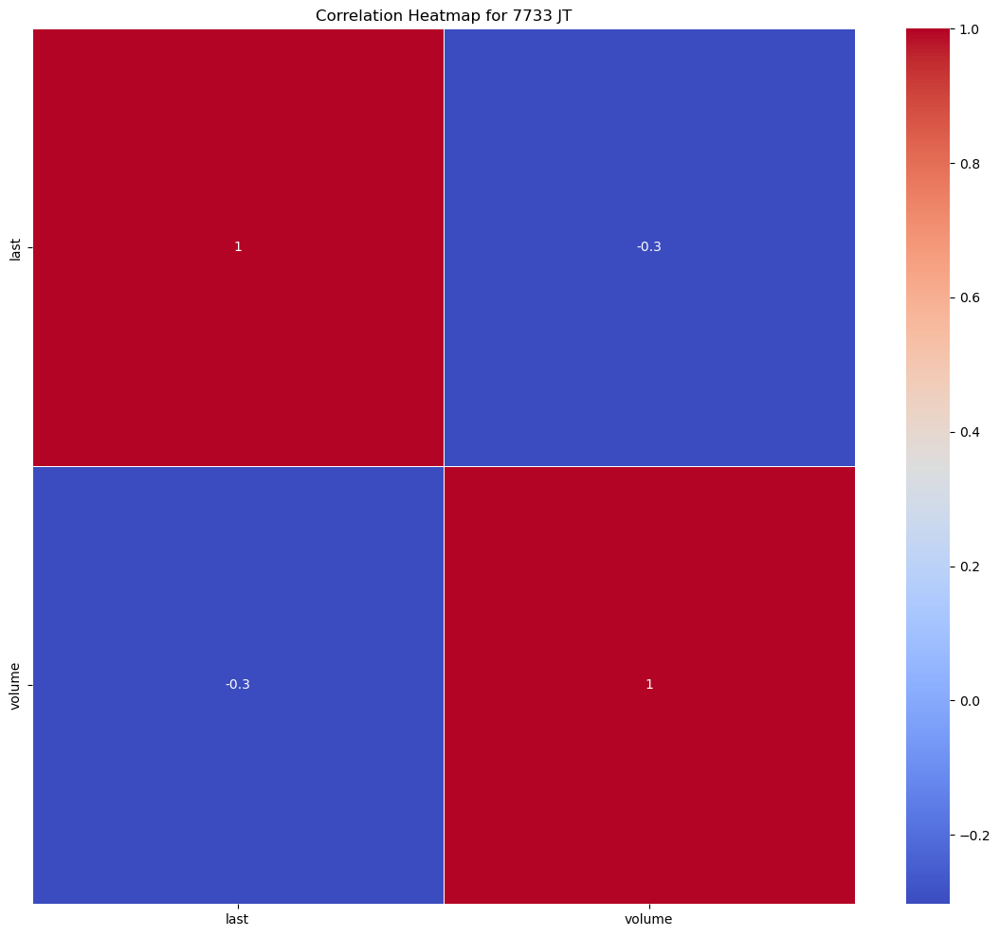

Statistics for stock 7735 JT
---- last ----
Mean: 5153.331761845387
Median: 5023.0798
Mode: 2134.6141
Range: 8877.0014
Standard Deviation: 2244.9487755220875
Skewness: 0.3003082370400061
Kurtosis: -1.015378251360729


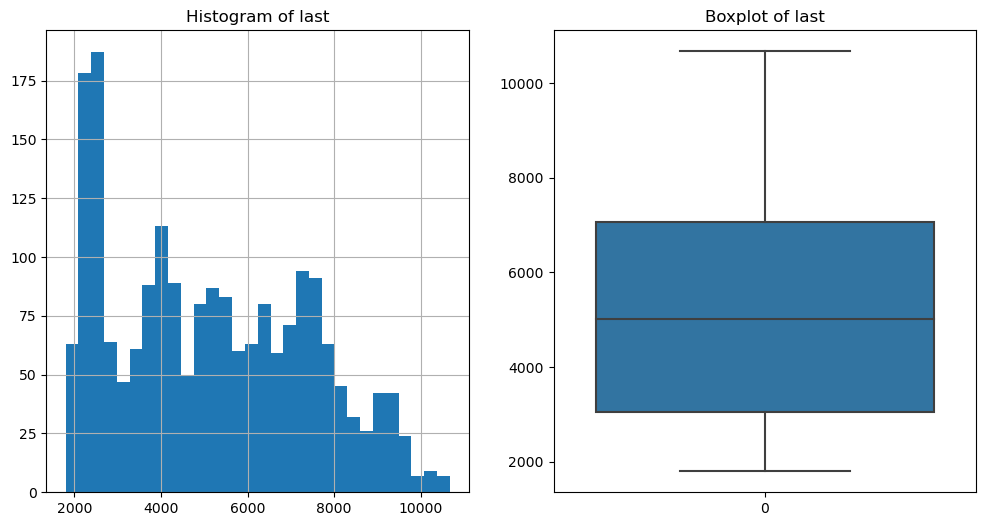

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


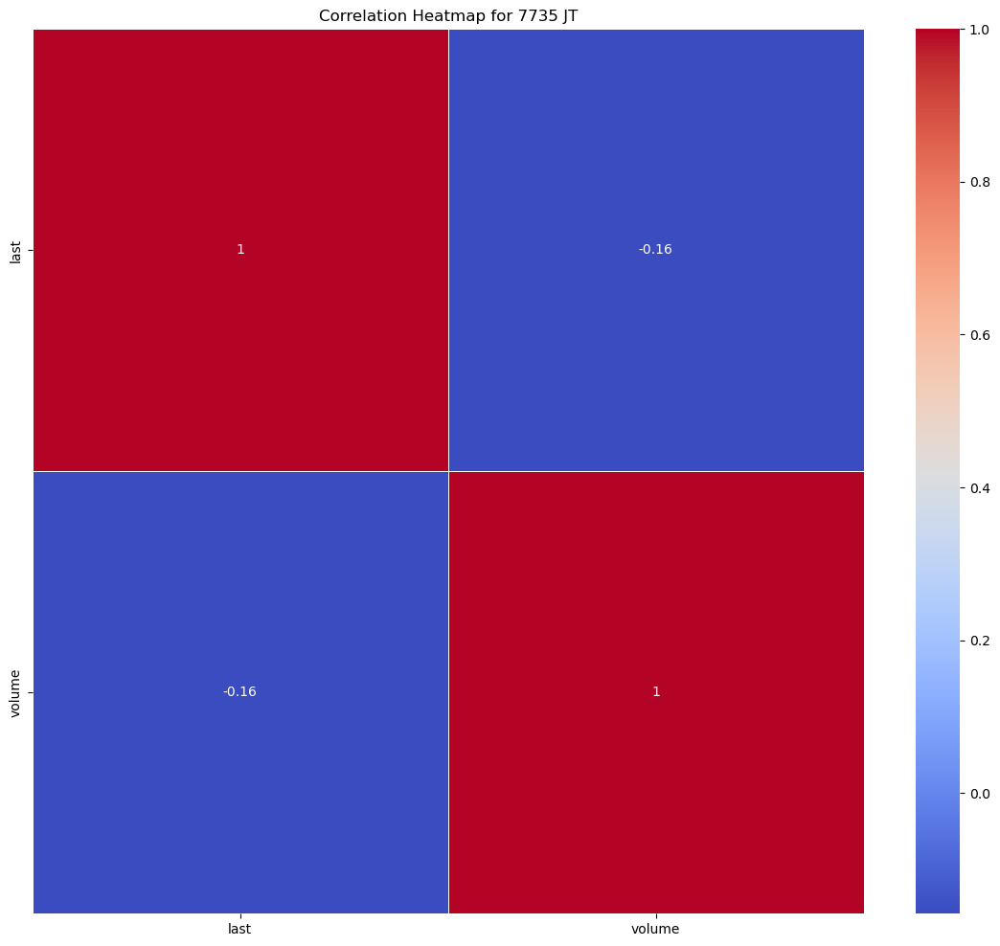

Statistics for stock 7751 JT
---- last ----
Mean: 2718.364691571072
Median: 2726.5196
Mode: 2304.8672
Range: 2221.9436000000005
Standard Deviation: 447.4100275981079
Skewness: 0.039558288115981624
Kurtosis: -0.3266667760213946


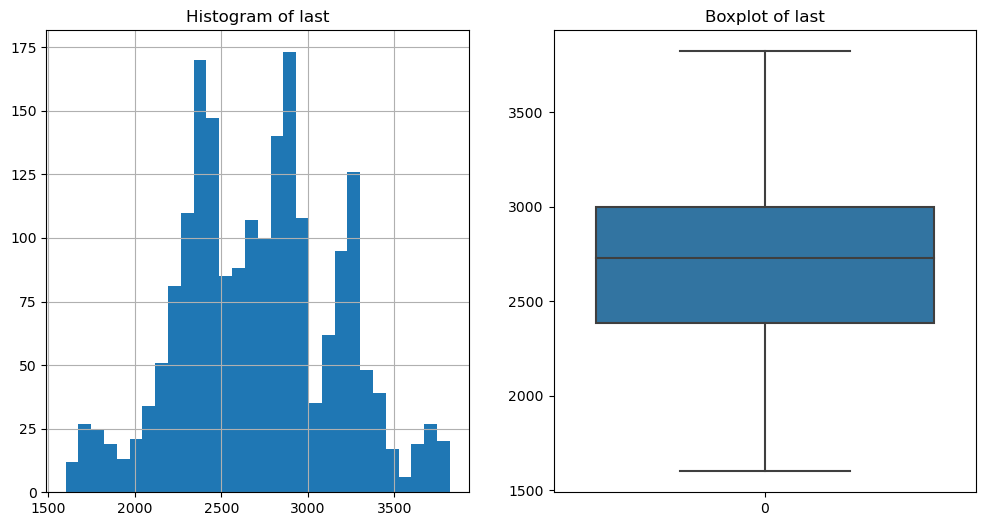

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


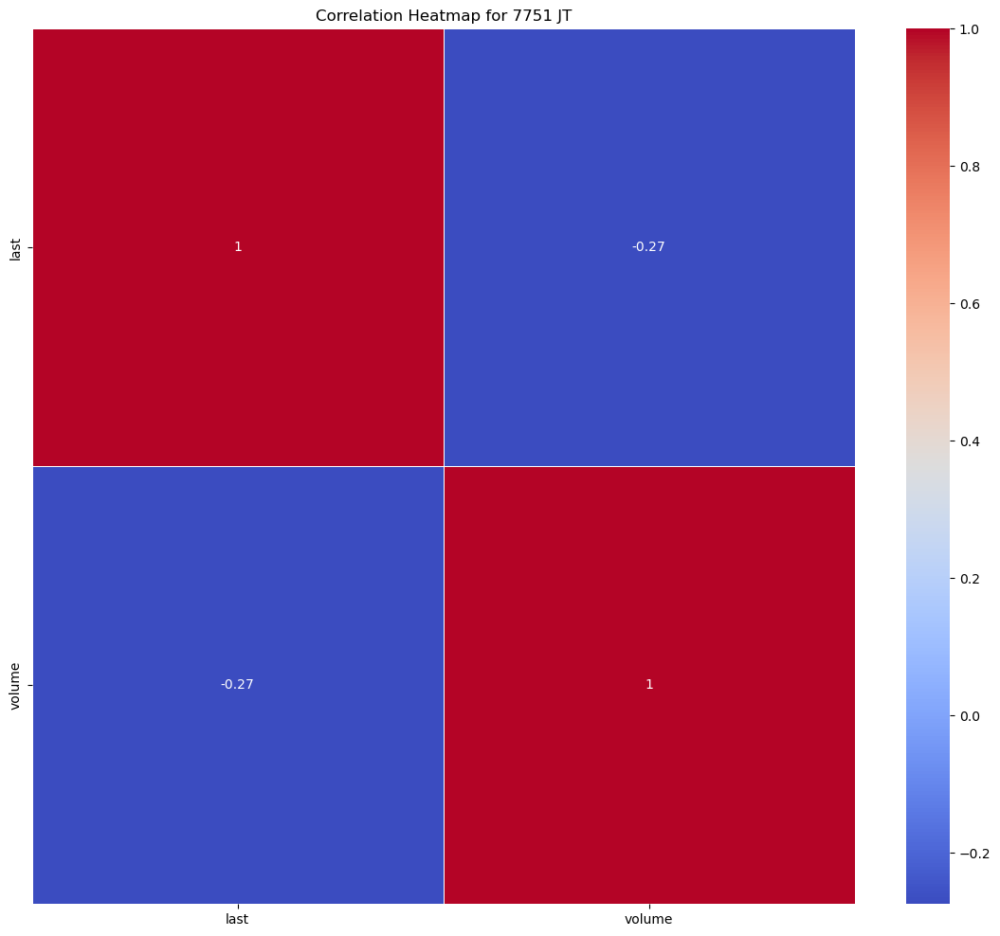

Statistics for stock 7752 JT
---- last ----
Mean: 961.8979963591023
Median: 977.3289
Mode: 834.6029
Range: 608.7097000000001
Standard Deviation: 124.09544664188672
Skewness: -0.38324855186810536
Kurtosis: -0.36901714643123595


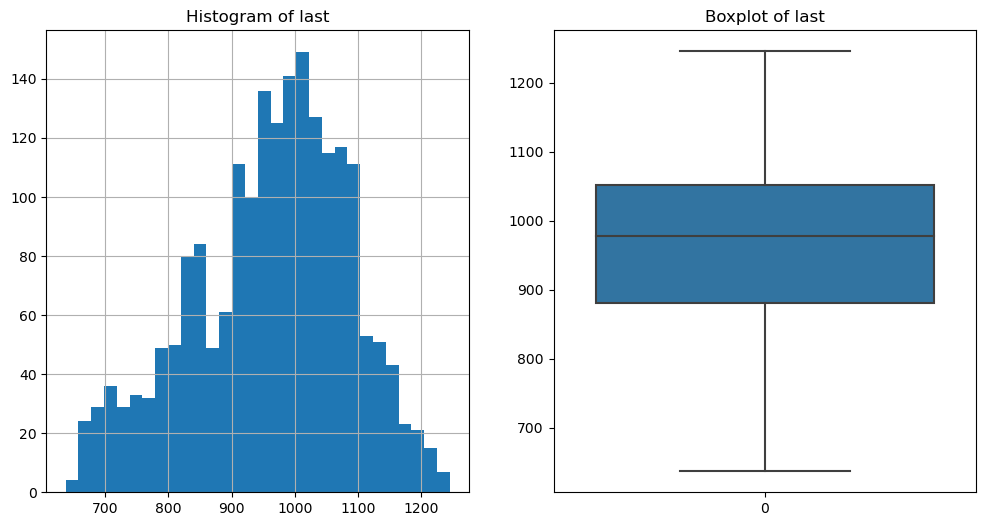

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


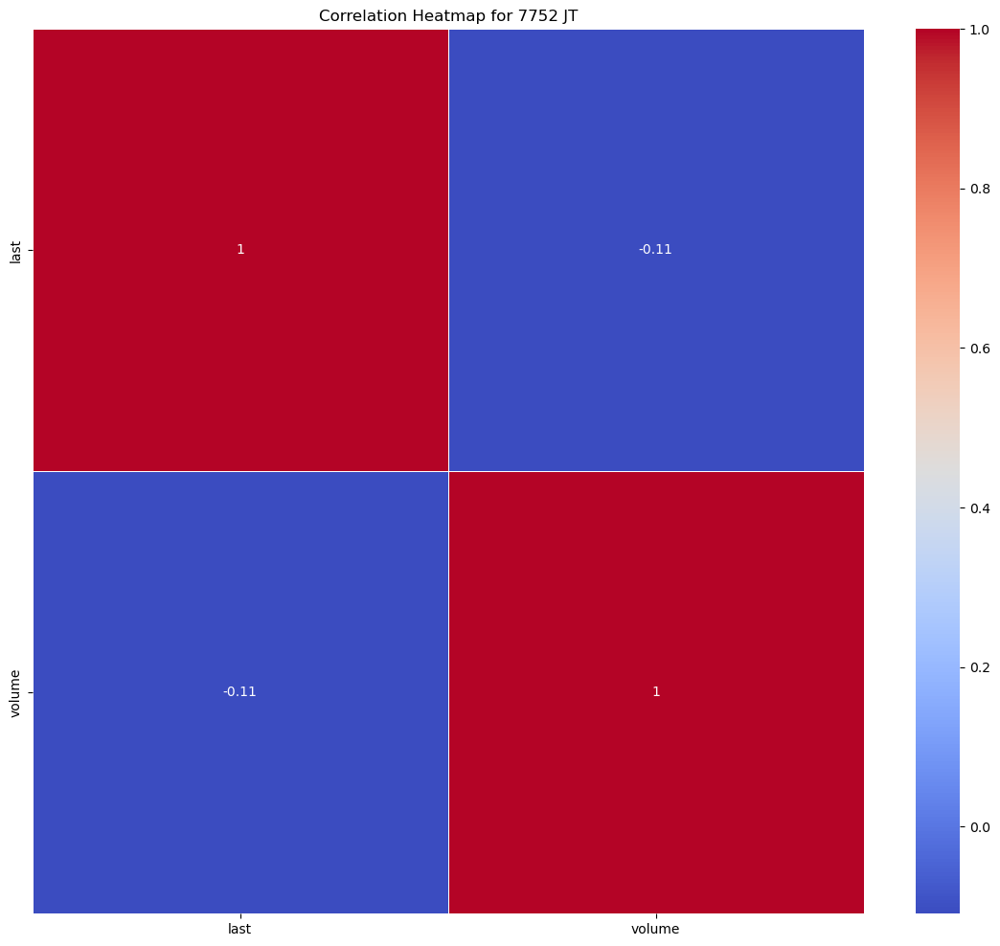

Statistics for stock 7762 JT
---- last ----
Mean: 597.5573850374064
Median: 619.4963
Mode: 314.4101
Range: 598.7466
Standard Deviation: 145.06403177257425
Skewness: -0.47783951018633164
Kurtosis: -0.6697573621134176


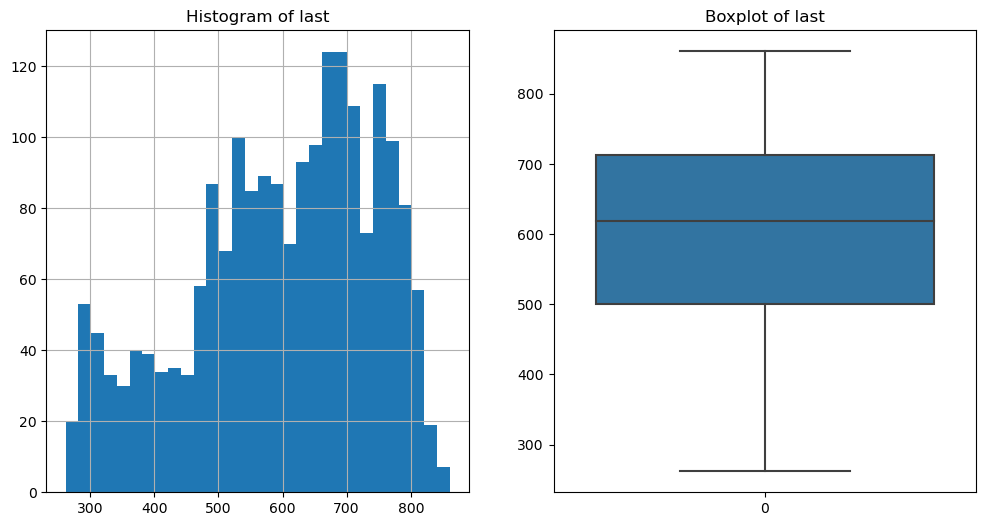

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


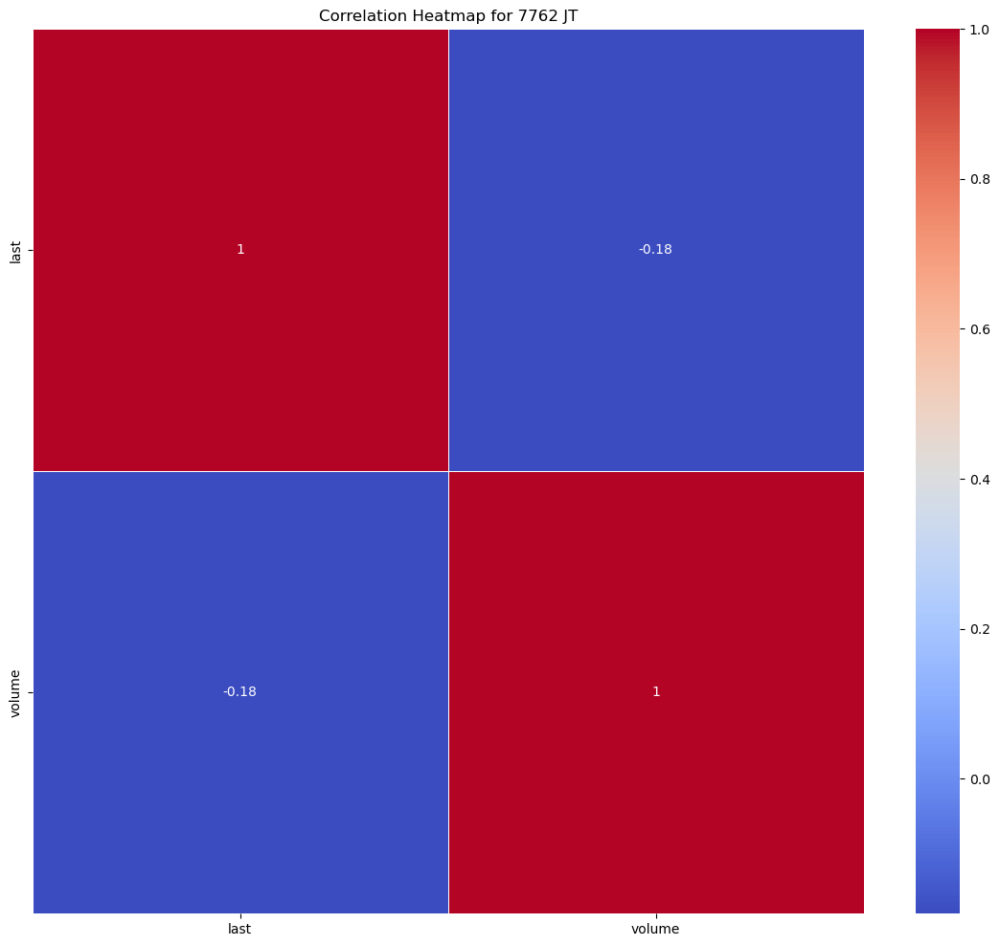

Statistics for stock 7911 JT
---- last ----
Mean: 1641.1118835910227
Median: 1653.8112
Mode: 1329.7271
Range: 1414.7435999999998
Standard Deviation: 298.4142717266245
Skewness: -0.04457355777655718
Kurtosis: -0.5336036723742978


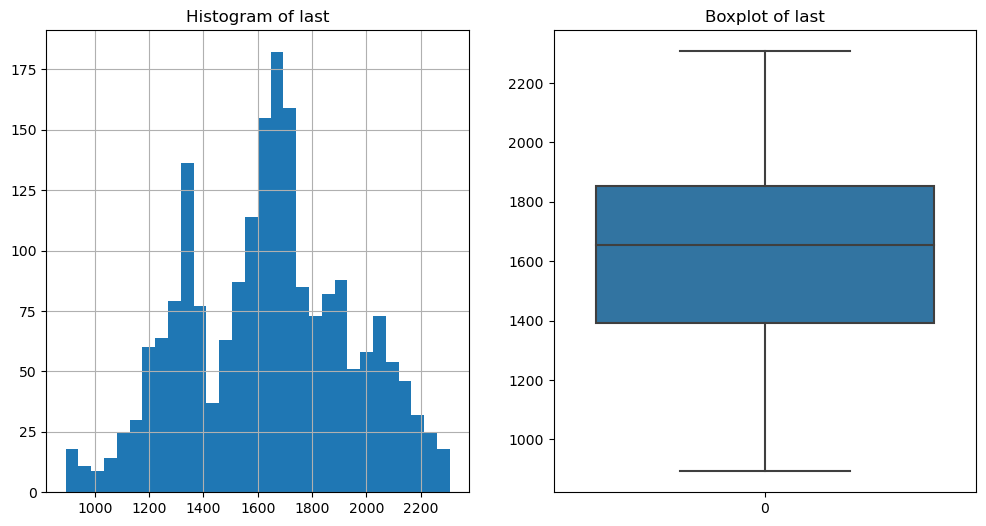

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


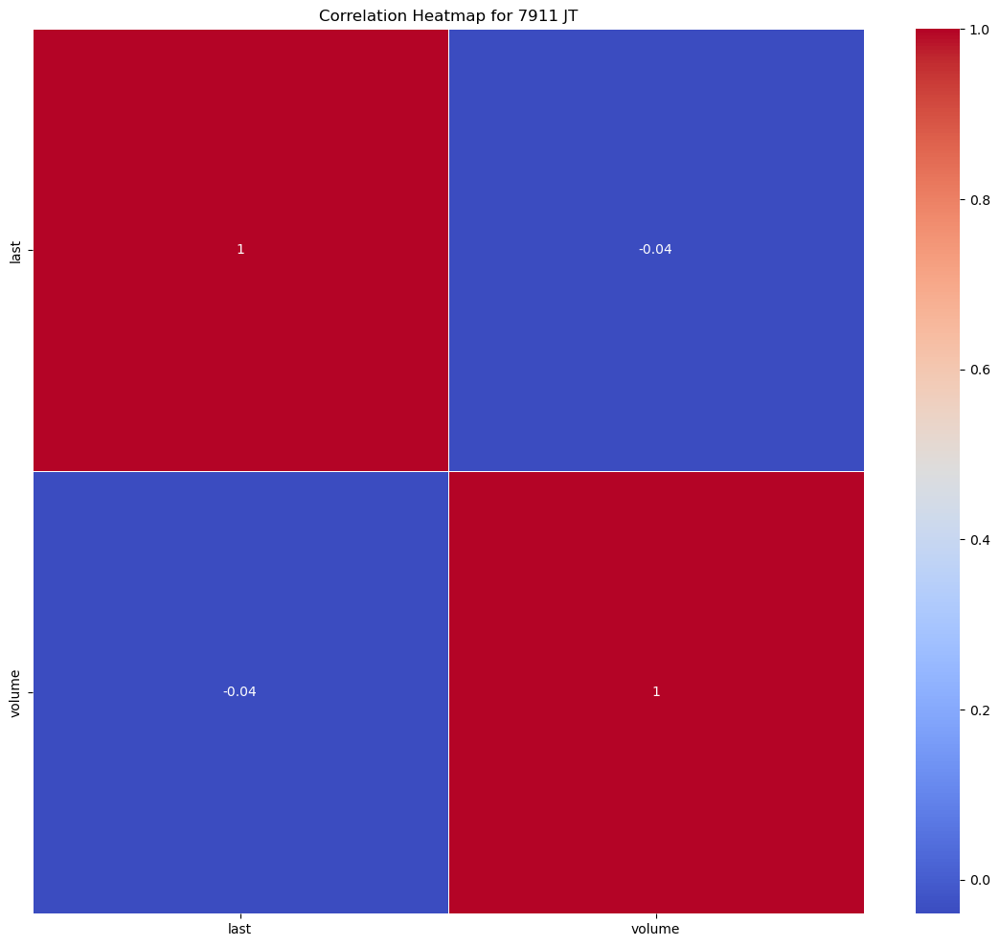

Statistics for stock 7912 JT
---- last ----
Mean: 2071.2655240399004
Median: 2102.4247
Mode: 1743.4249
Range: 1964.2223999999999
Standard Deviation: 356.121134966027
Skewness: -0.010367862300573448
Kurtosis: 0.07097229527022497


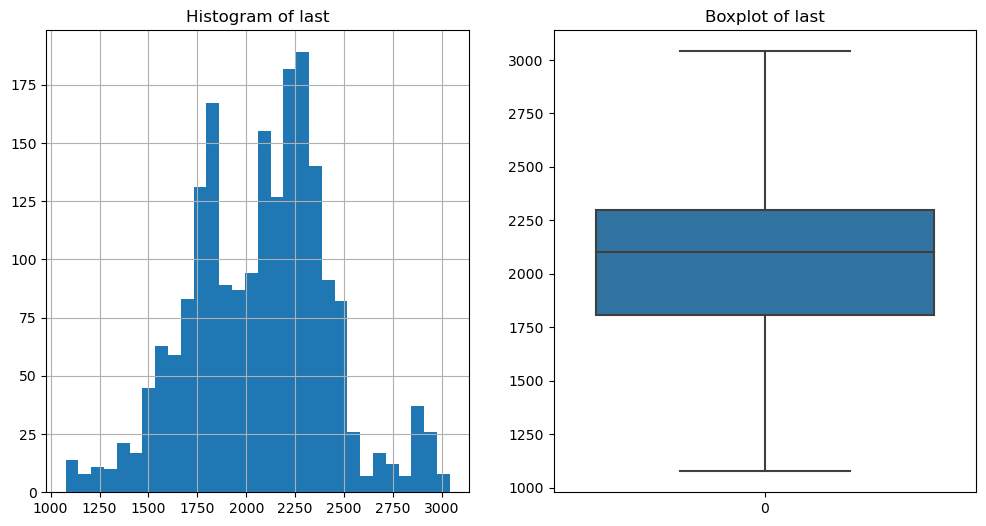

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


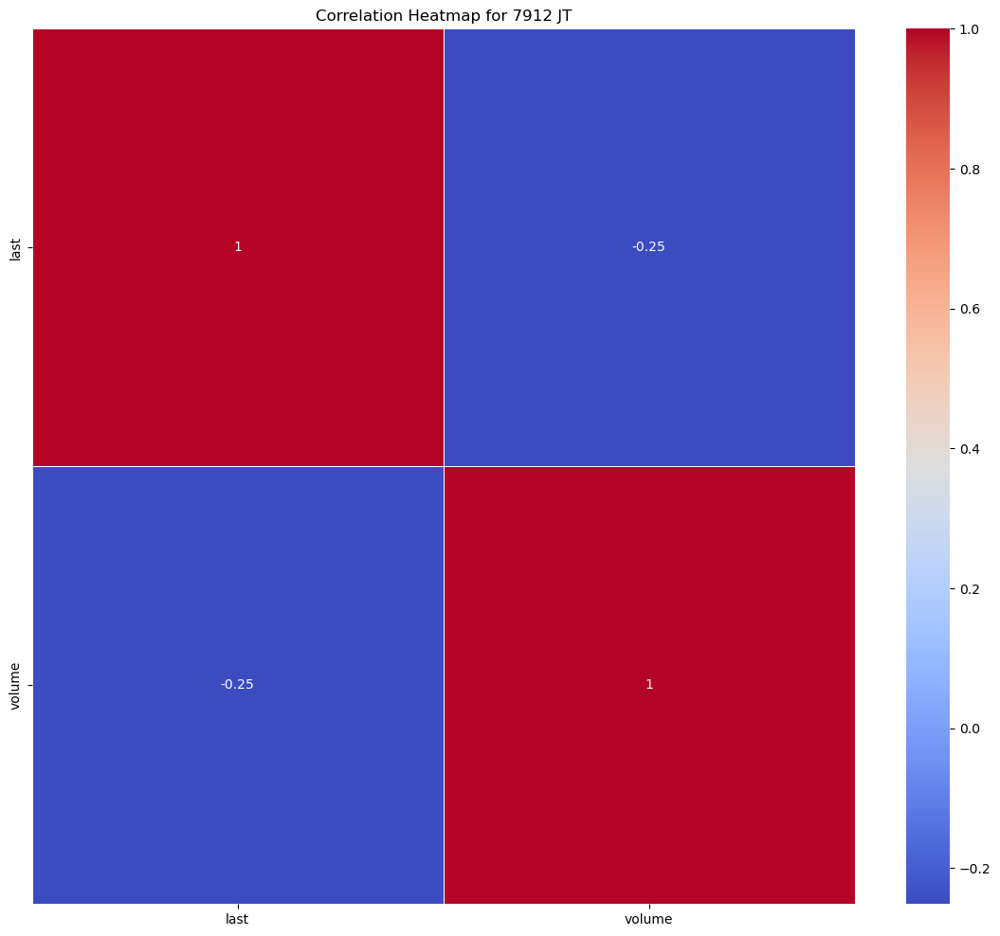

Statistics for stock 7951 JT
---- last ----
Mean: 3394.9212244389028
Median: 3278.4557
Mode: 3105.3098
Range: 5750.7517
Standard Deviation: 1648.4028468294437
Skewness: 0.007755796494792258
Kurtosis: -1.3060456317095446


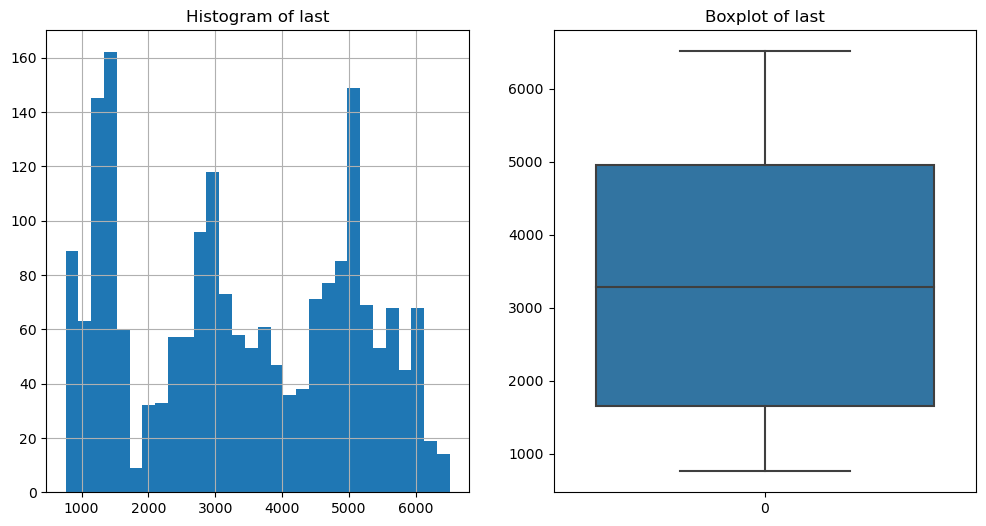

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


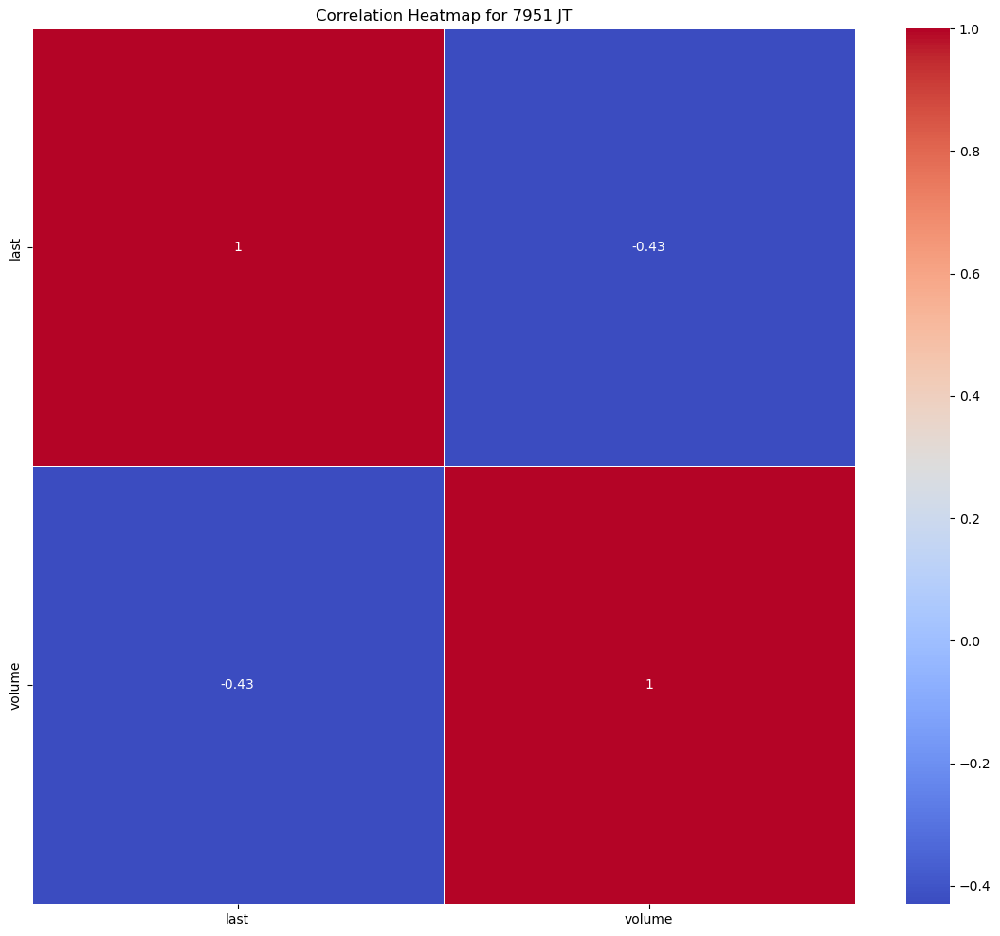

Statistics for stock 8001 JT
---- last ----
Mean: 1554.7948666334166
Median: 1378.319
Mode: 977.2445
Range: 2852.1516
Standard Deviation: 595.1237632963955
Skewness: 0.8446128942912164
Kurtosis: 0.03168242800370269


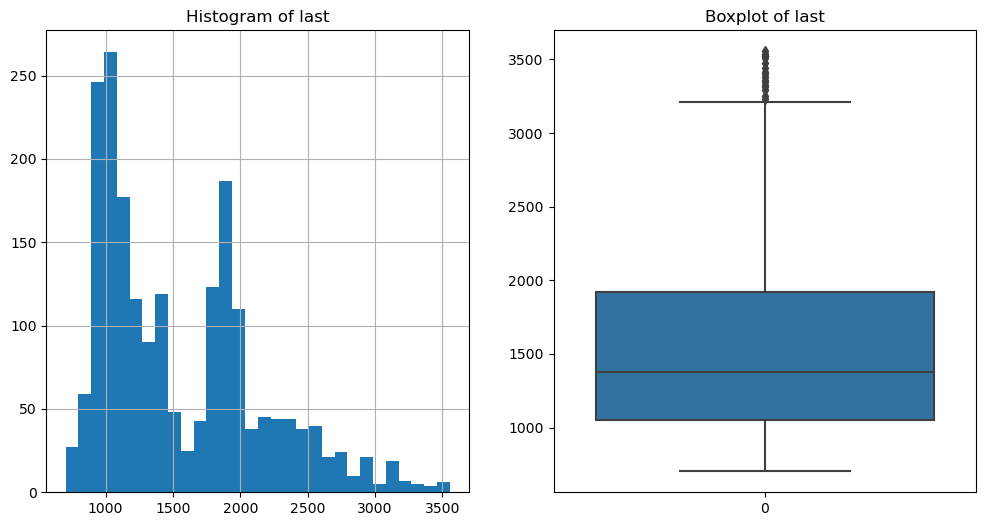

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


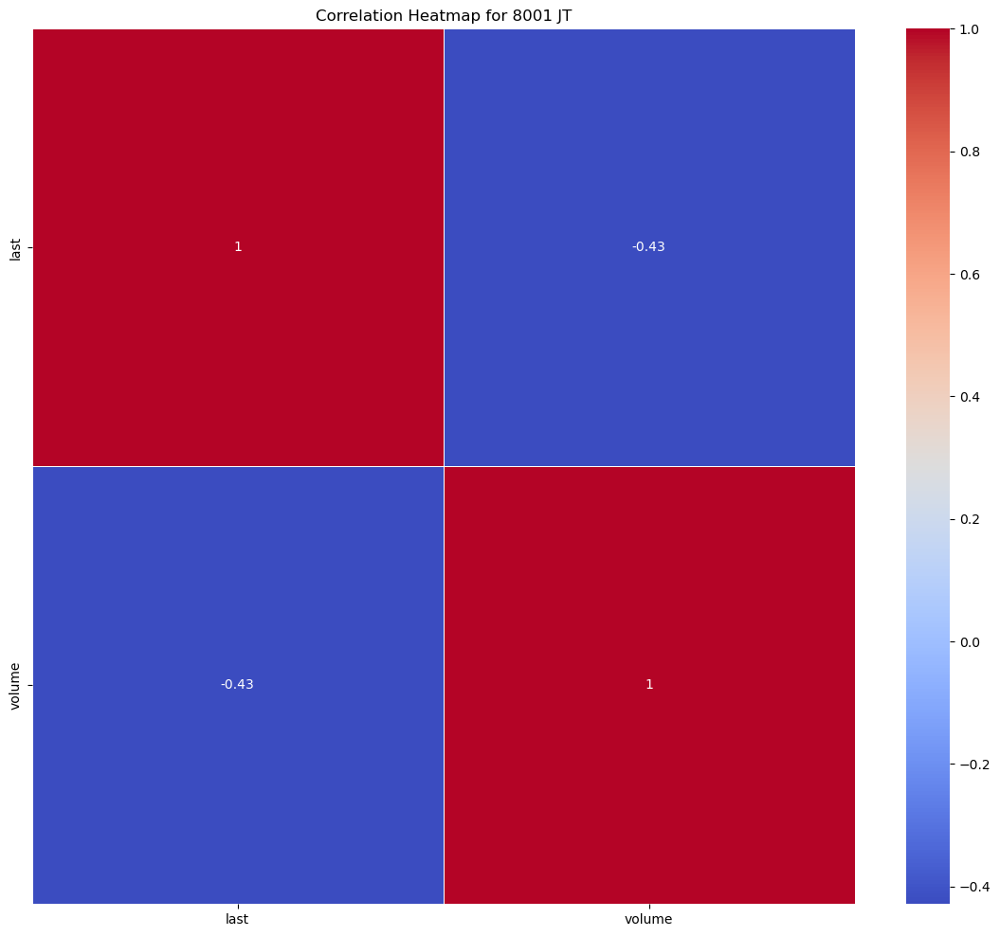

Statistics for stock 8002 JT
---- last ----
Mean: 603.2960306234414
Median: 576.9992
Mode: 524.9602
Range: 604.2195
Standard Deviation: 109.49211722099776
Skewness: 0.513786851561786
Kurtosis: -0.089155919709198


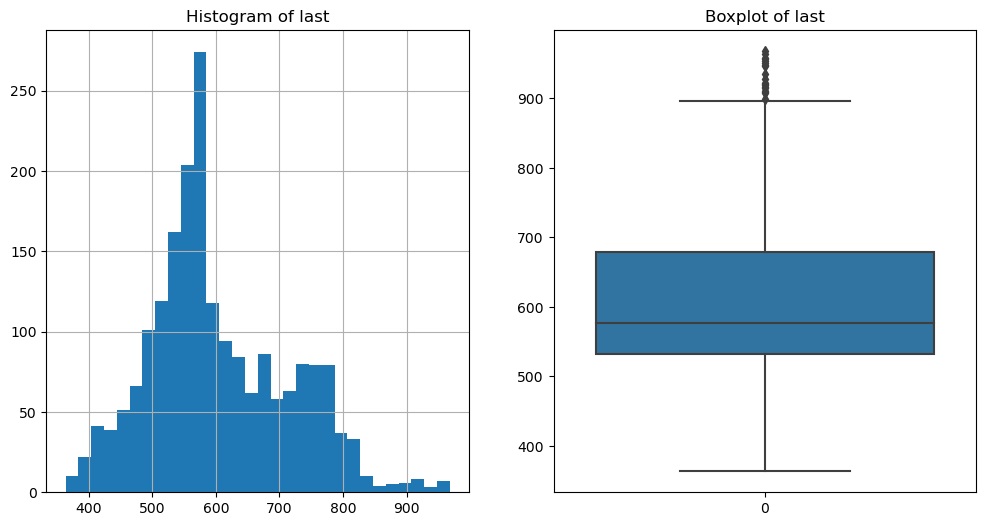

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


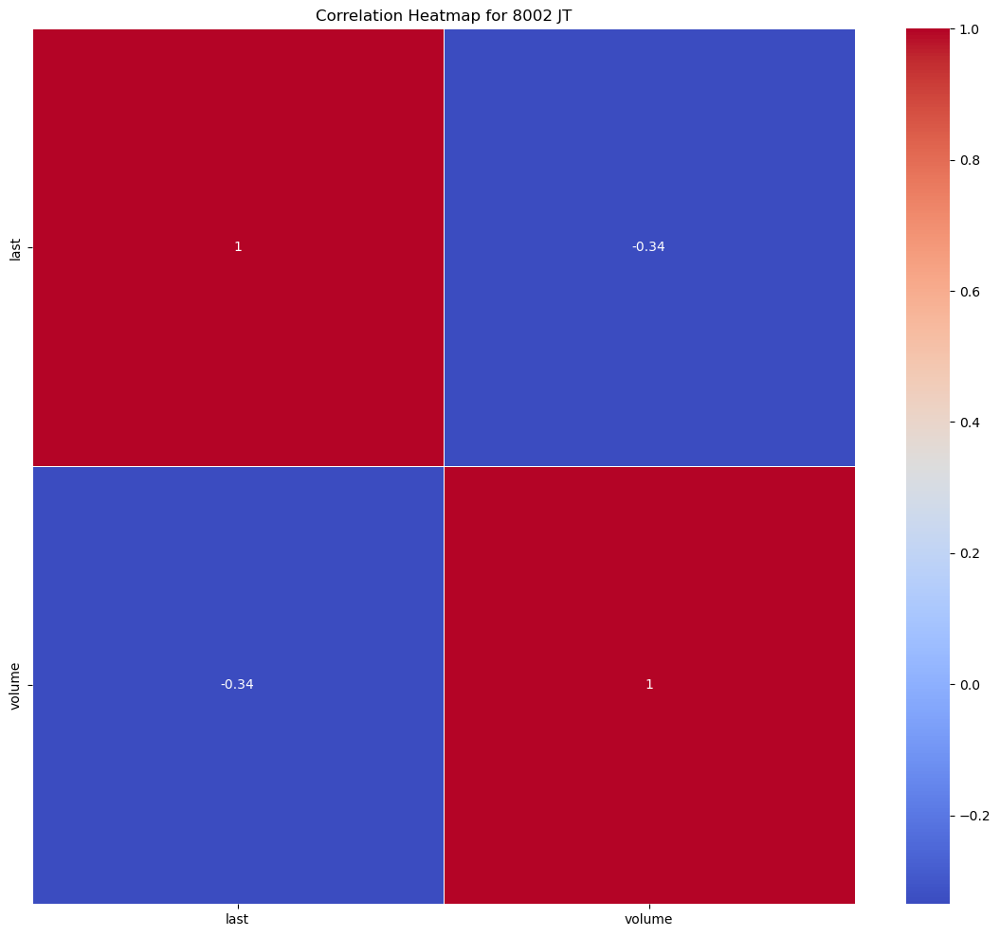

Statistics for stock 8015 JT
---- last ----
Mean: 2835.2918081296757
Median: 2768.6811
Mode: 3068.0662
Range: 3247.5033000000003
Standard Deviation: 671.429675950705
Skewness: 0.525078104784843
Kurtosis: -0.5357676142710837


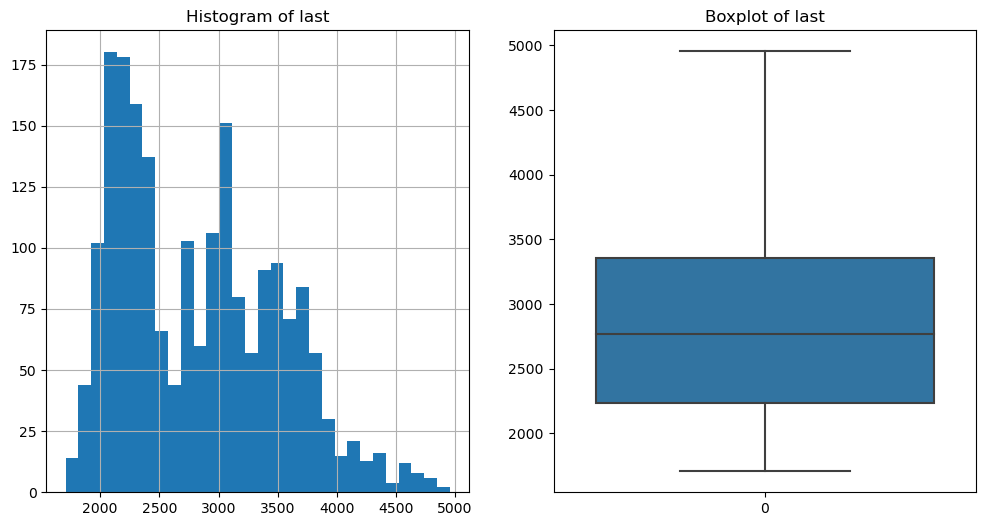

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


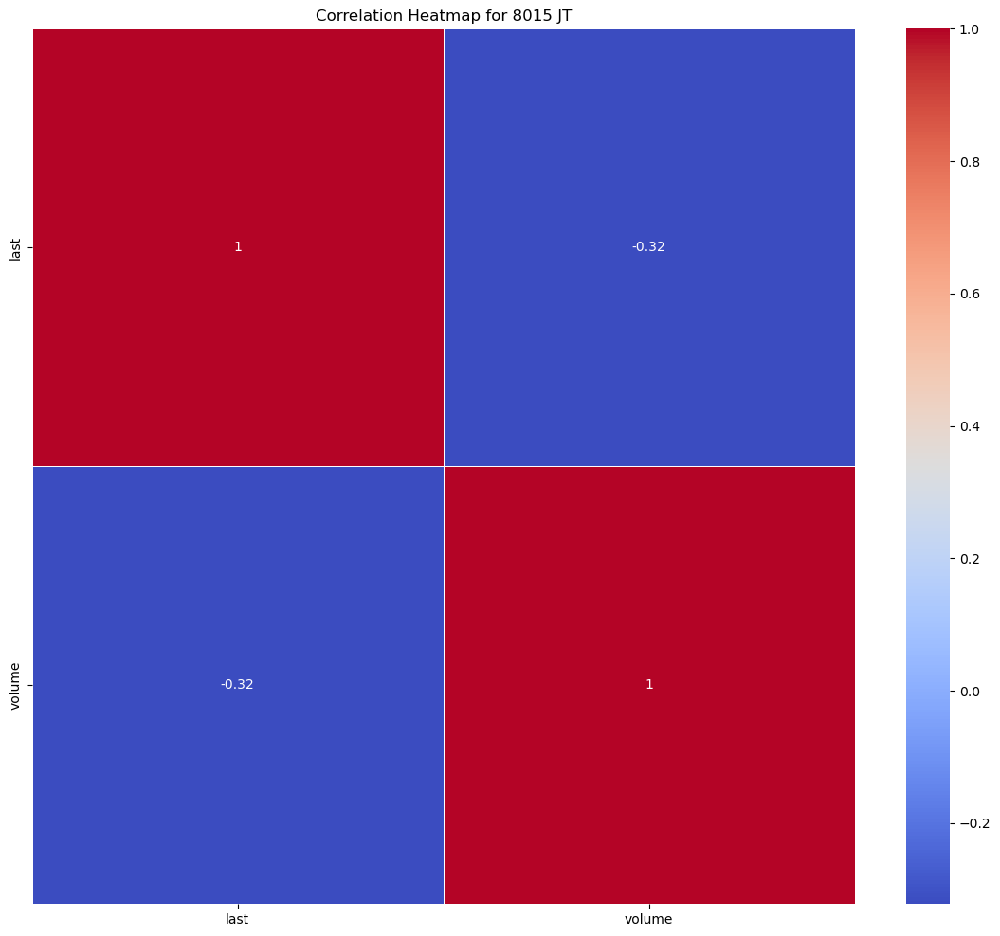

Statistics for stock 8031 JT
---- last ----
Mean: 1401.812259351621
Median: 1367.2463
Mode: 1044.7276
Range: 1508.8715
Standard Deviation: 295.9211115065805
Skewness: 0.40563181396814013
Kurtosis: -0.4752658802338172


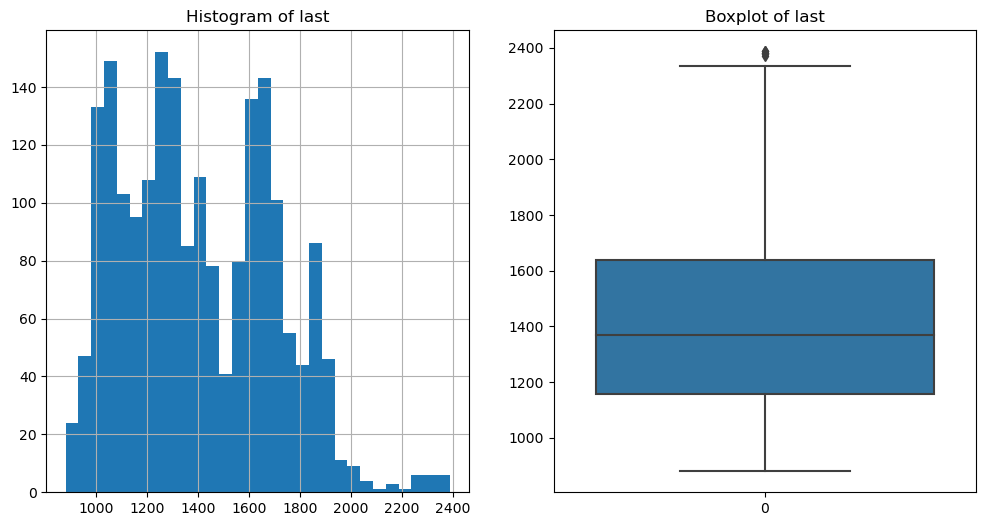

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


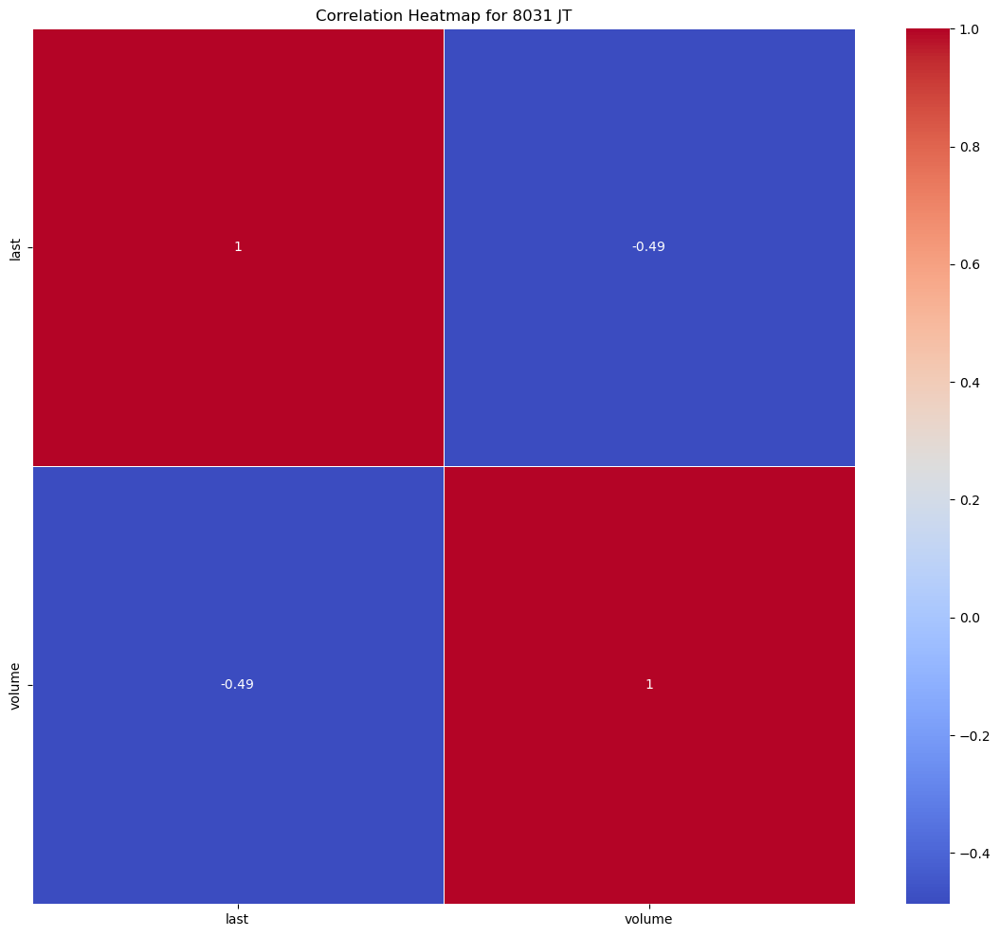

Statistics for stock 8035 JT
---- last ----
Mean: 12920.144402144637
Median: 9816.2864
Mode: 4405.696
Range: 43257.7318
Standard Deviation: 9010.524660293264
Skewness: 1.2581649782324045
Kurtosis: 1.4697126794386932


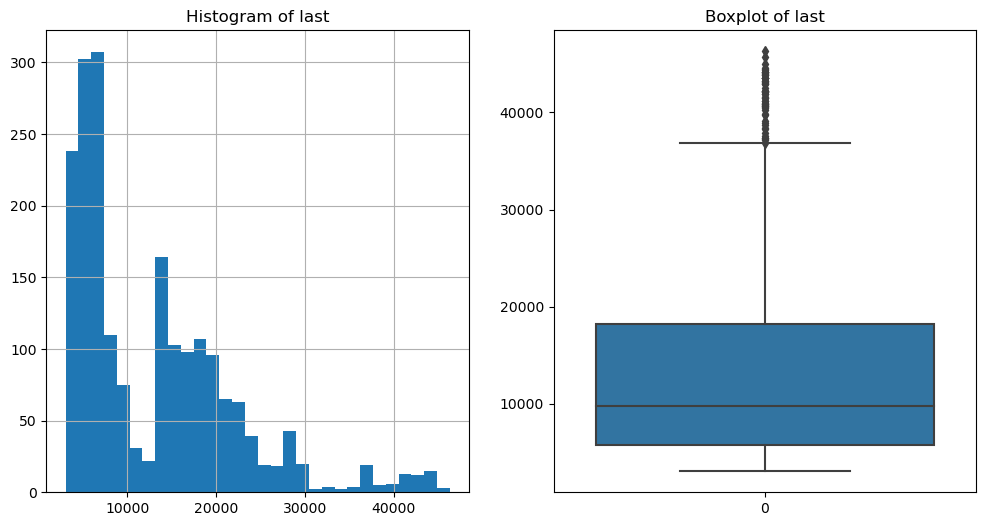

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


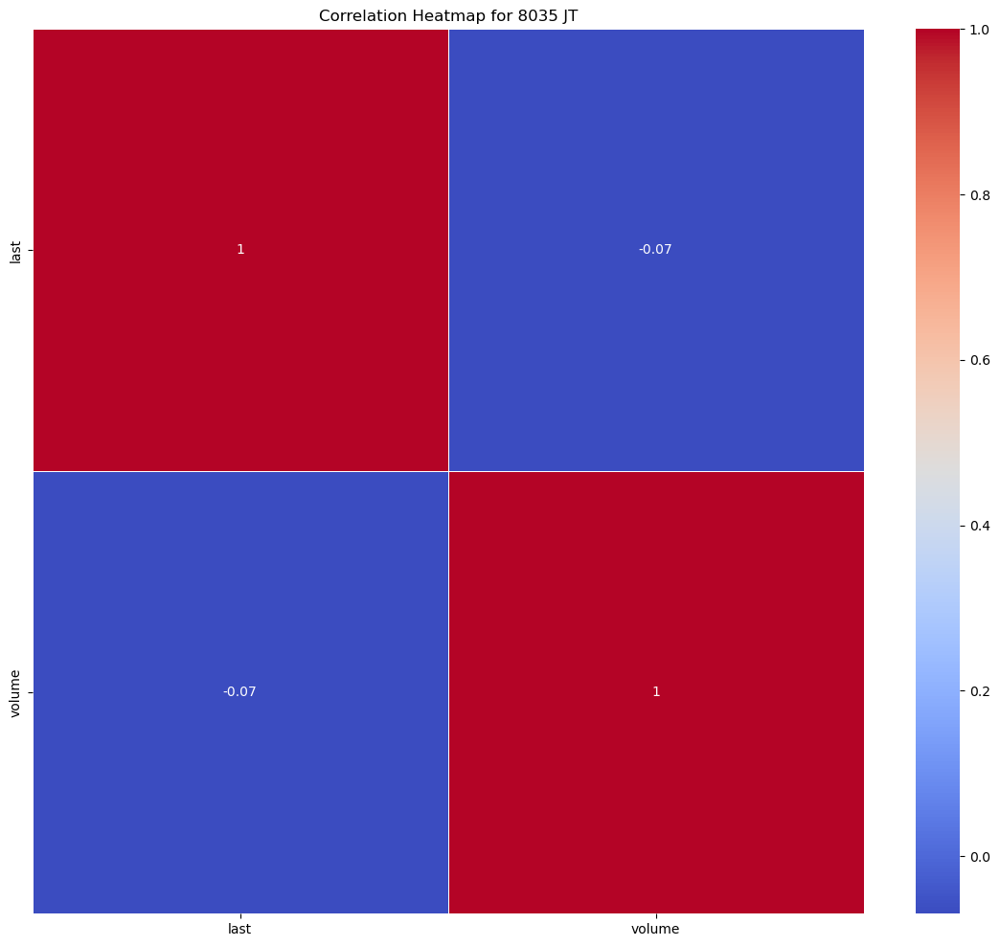

Statistics for stock 8053 JT
---- last ----
Mean: 1213.1137002493765
Median: 1177.8519
Mode: 973.591
Range: 973.762
Standard Deviation: 265.995485611129
Skewness: 0.3221098377876849
Kurtosis: -1.2592918611893218


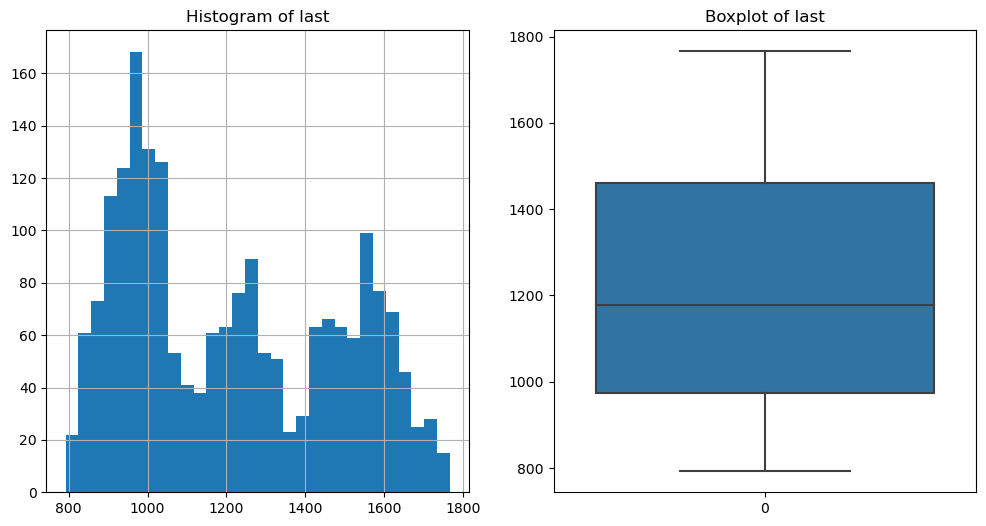

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


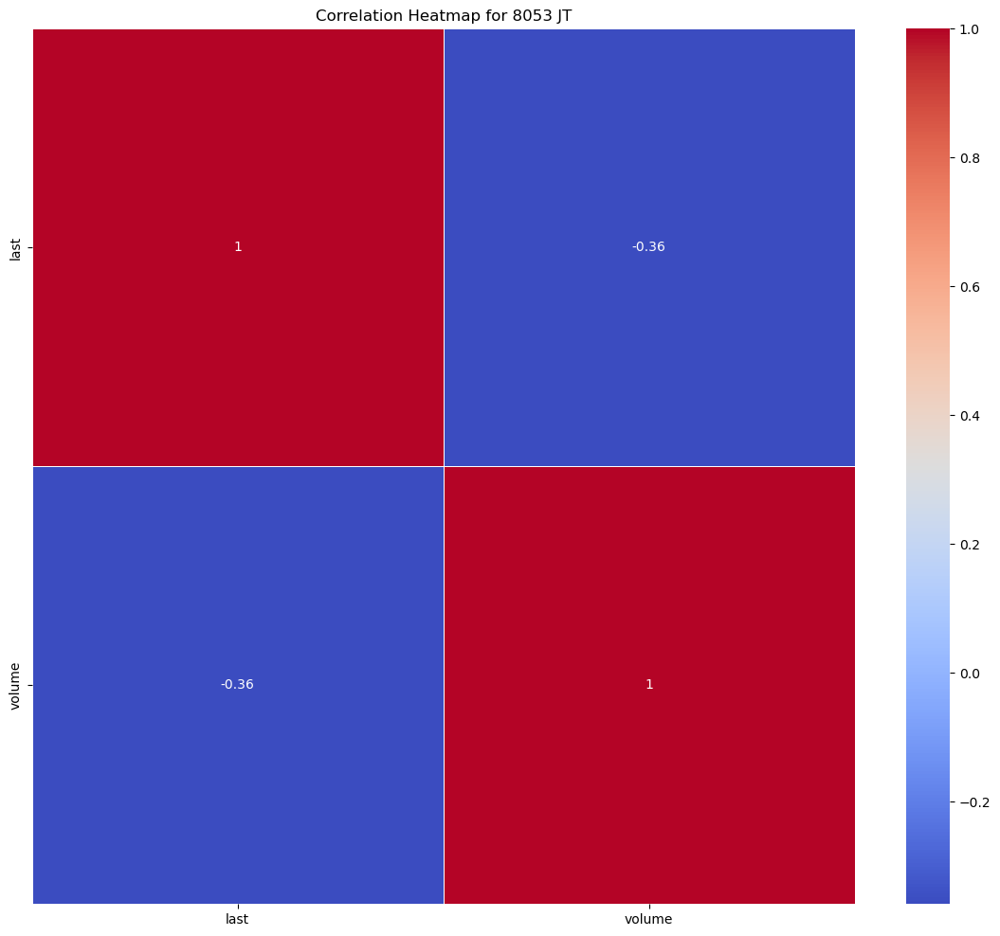

Statistics for stock 8058 JT
---- last ----
Mean: 2108.9249532668327
Median: 2105.374
Mode: 2150.8527
Range: 2034.6779999999999
Standard Deviation: 514.7525158951205
Skewness: 0.14343934800860167
Kurtosis: -1.264768987478136


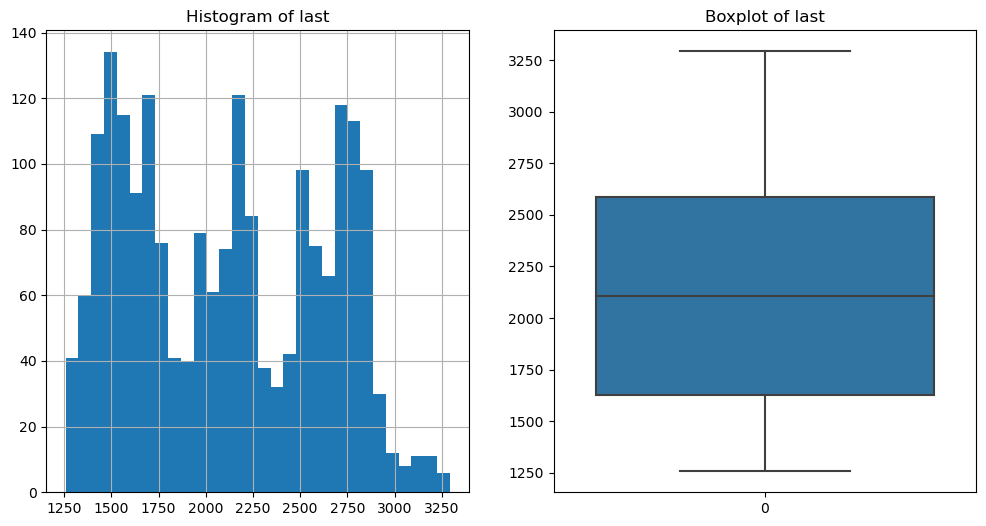

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


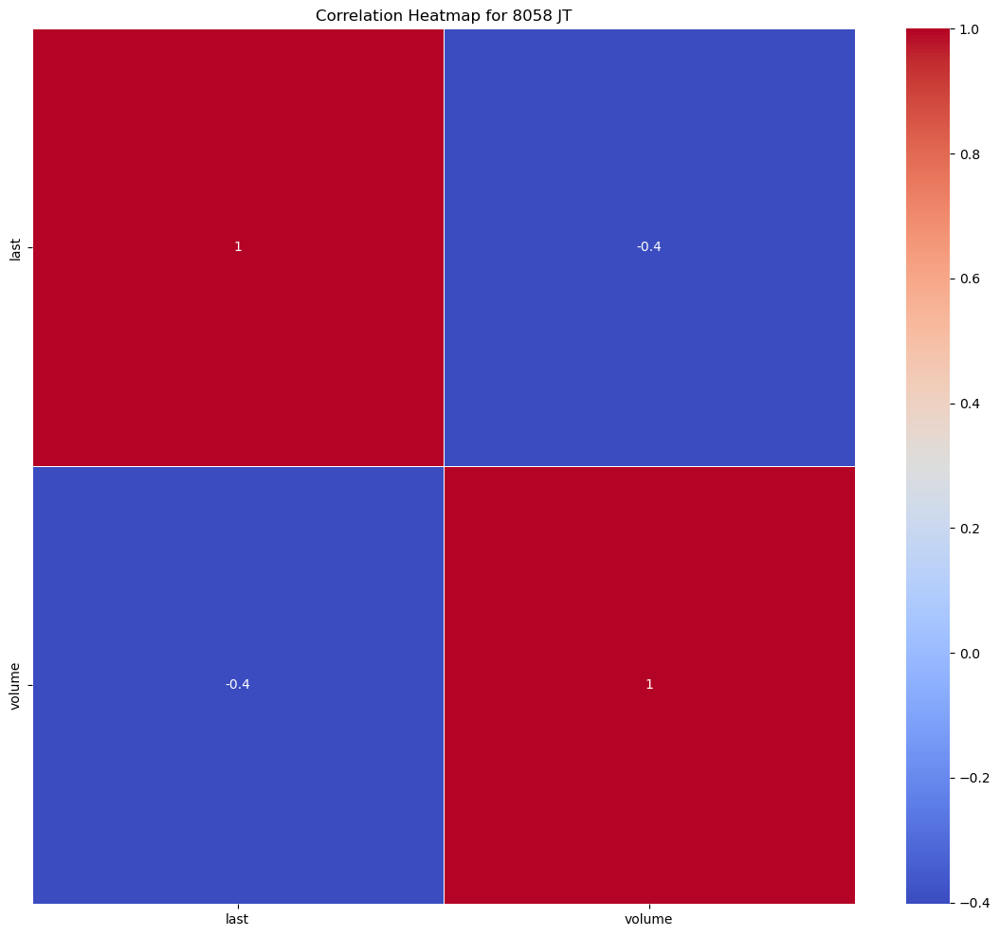

Statistics for stock 8233 JT
---- last ----
Mean: 1587.008709426434
Median: 1688.9088
Mode: 1738.0388
Range: 1608.8683
Standard Deviation: 378.7810677145703
Skewness: -0.5332262034784692
Kurtosis: -0.6845303891218215


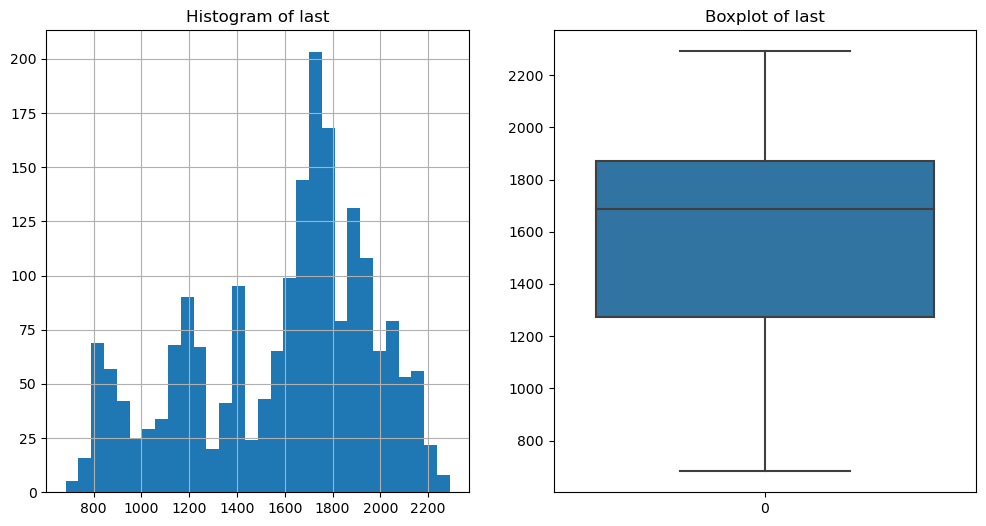

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


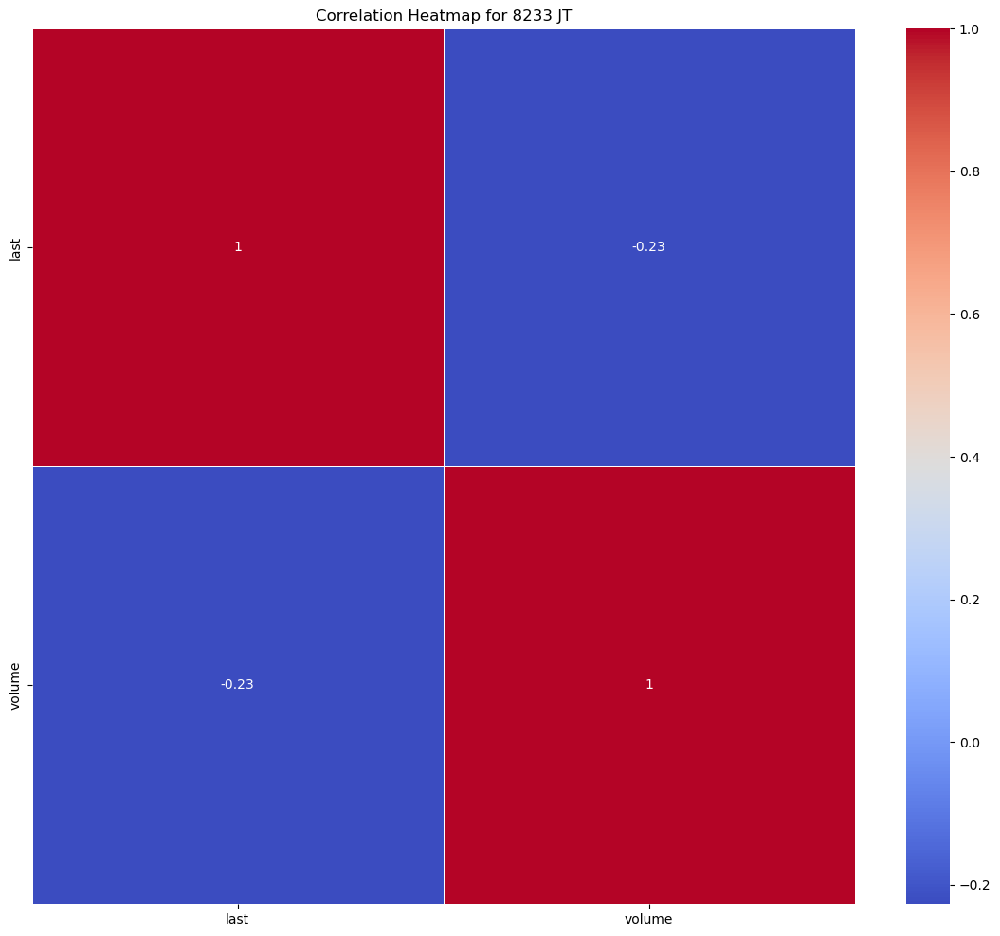

Statistics for stock 8252 JT
---- last ----
Mean: 1541.3715925685785
Median: 1514.1492
Mode: 823.9939
Range: 2139.8887
Standard Deviation: 537.7007693017275
Skewness: 0.049394756107188624
Kurtosis: -1.0571481138660994


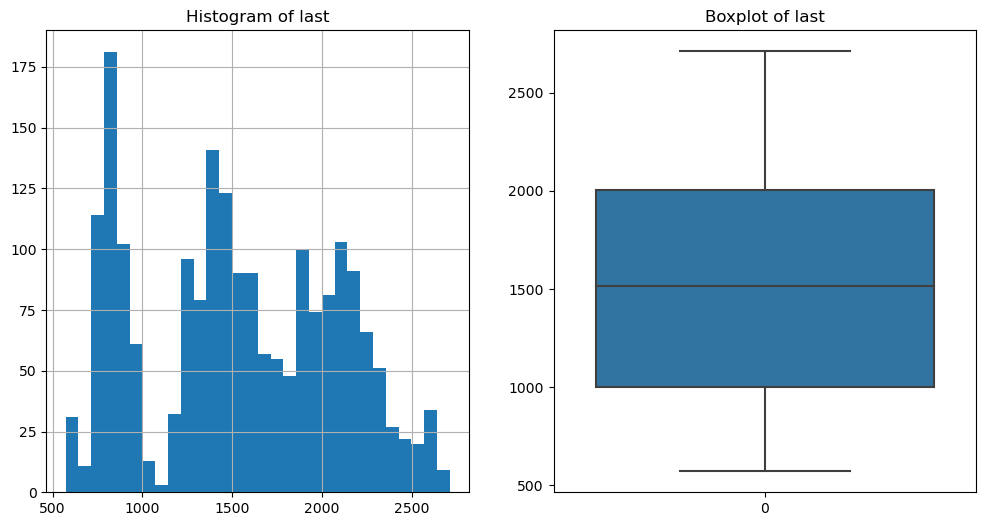

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


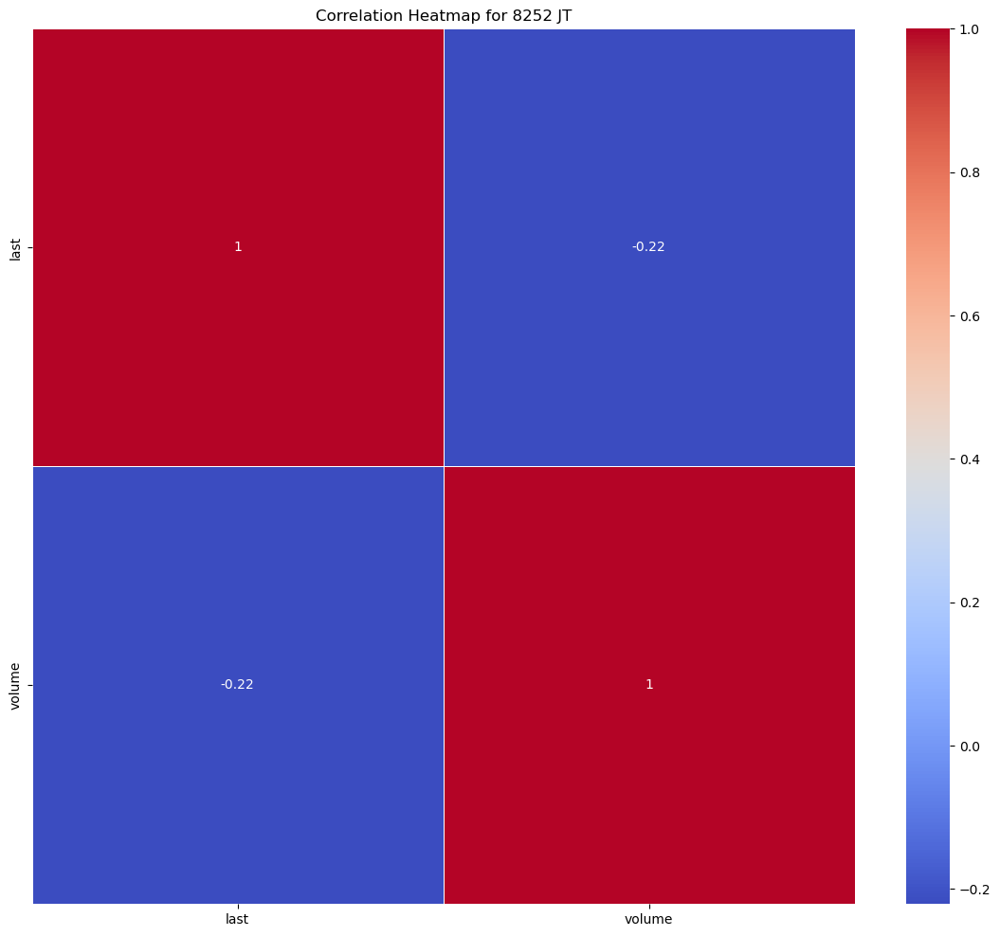

Statistics for stock 8253 JT
---- last ----
Mean: 1750.1487133665837
Median: 1795.9015
Mode: 1105.0
Range: 1555.7514999999999
Standard Deviation: 347.0129319392912
Skewness: -0.15888550148450561
Kurtosis: -0.6415102512990769


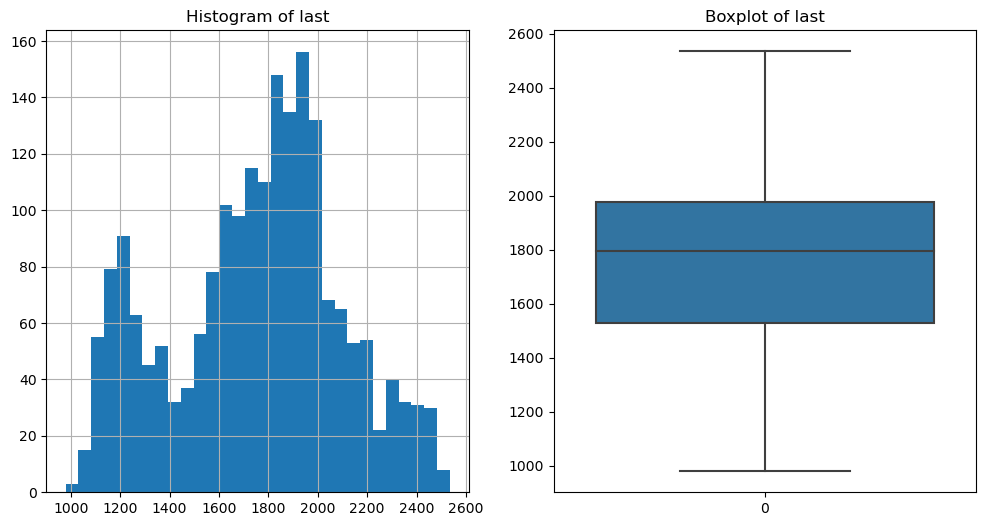

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


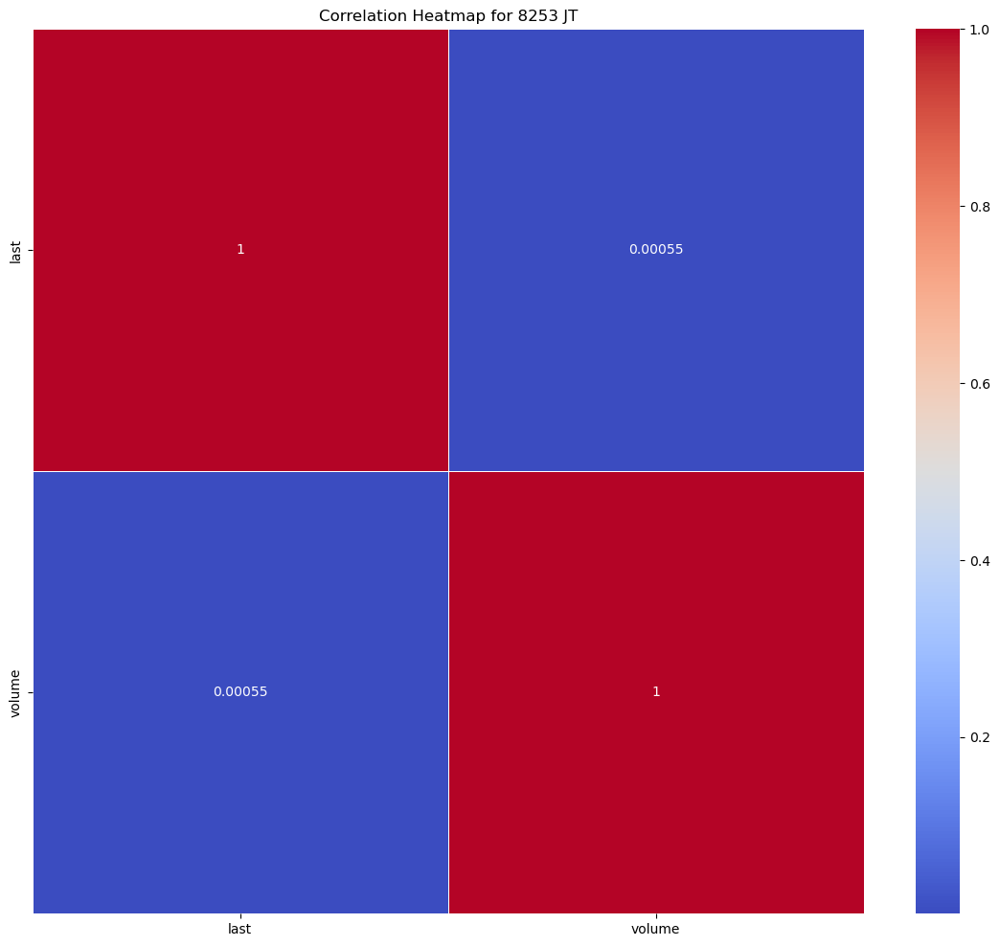

Statistics for stock 8267 JT
---- last ----
Mean: 1711.71428957606
Median: 1590.3836
Mode: 1104.4878
Range: 2782.1331
Standard Deviation: 578.5020081952006
Skewness: 0.8217096322710556
Kurtosis: 0.22556054734688358


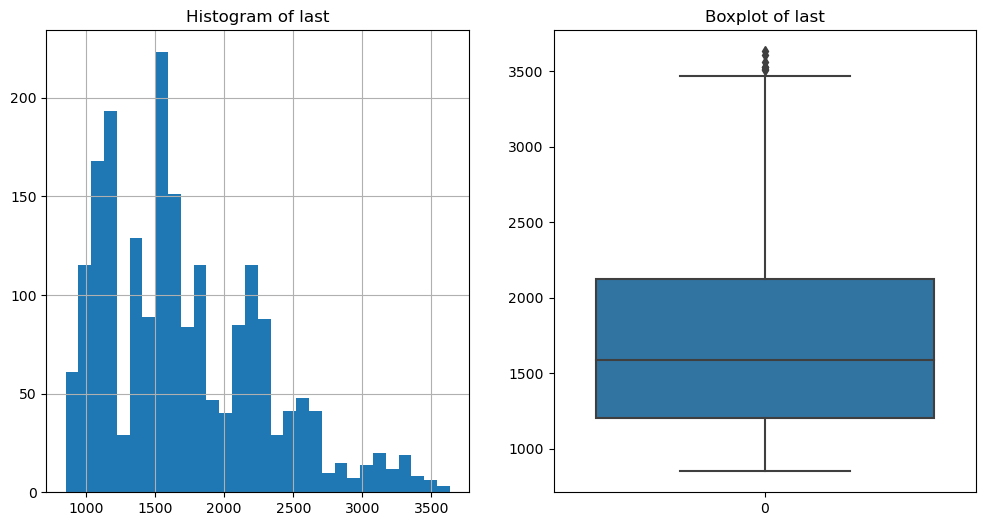

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


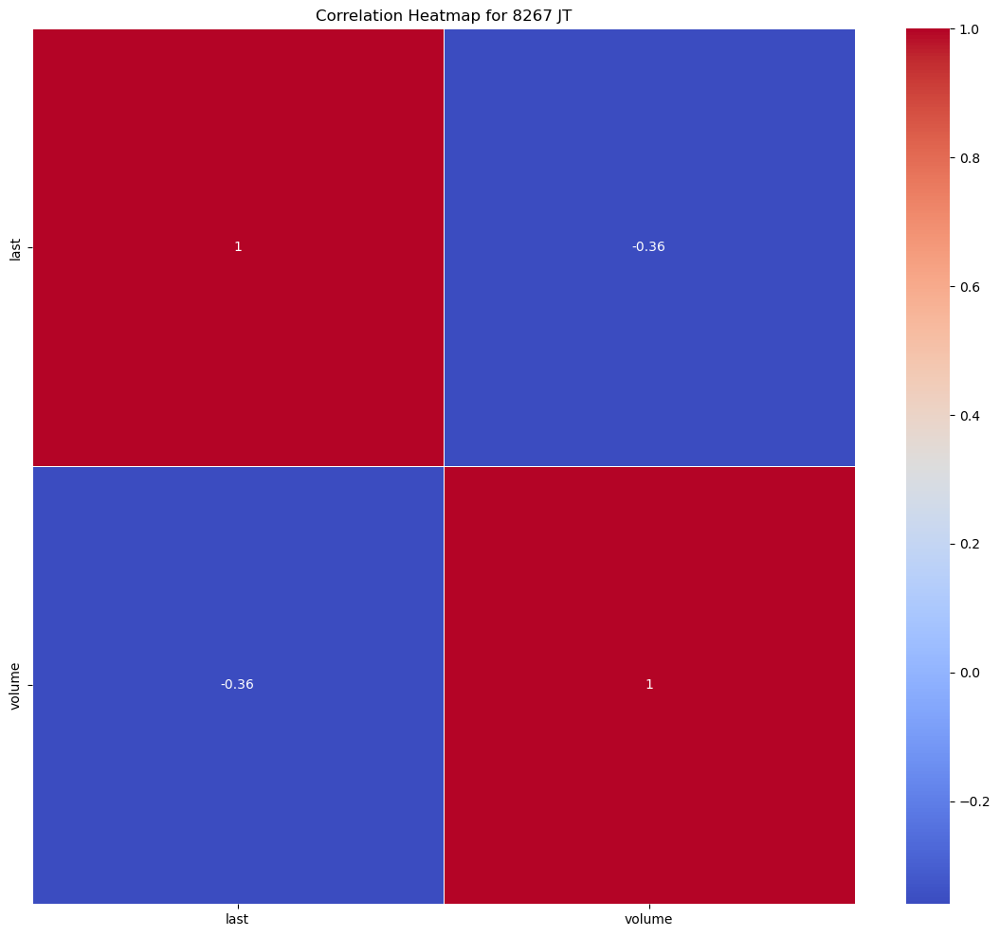

Statistics for stock 8303 JT
---- last ----
Mean: 1829.6577441895263
Median: 1780.6988
Mode: 2086.6297
Range: 1673.8753000000002
Standard Deviation: 357.8323144023616
Skewness: 0.3117630550165637
Kurtosis: -0.7443423197044008


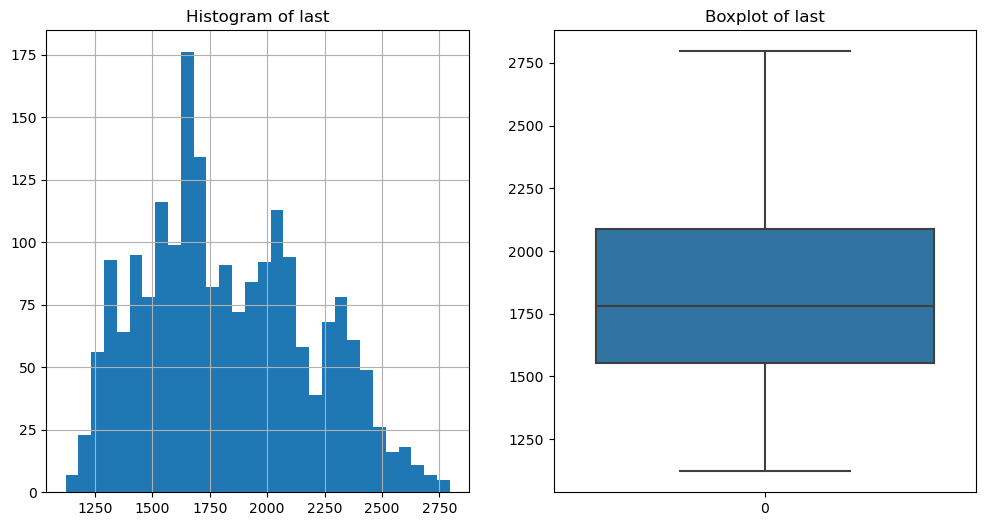

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


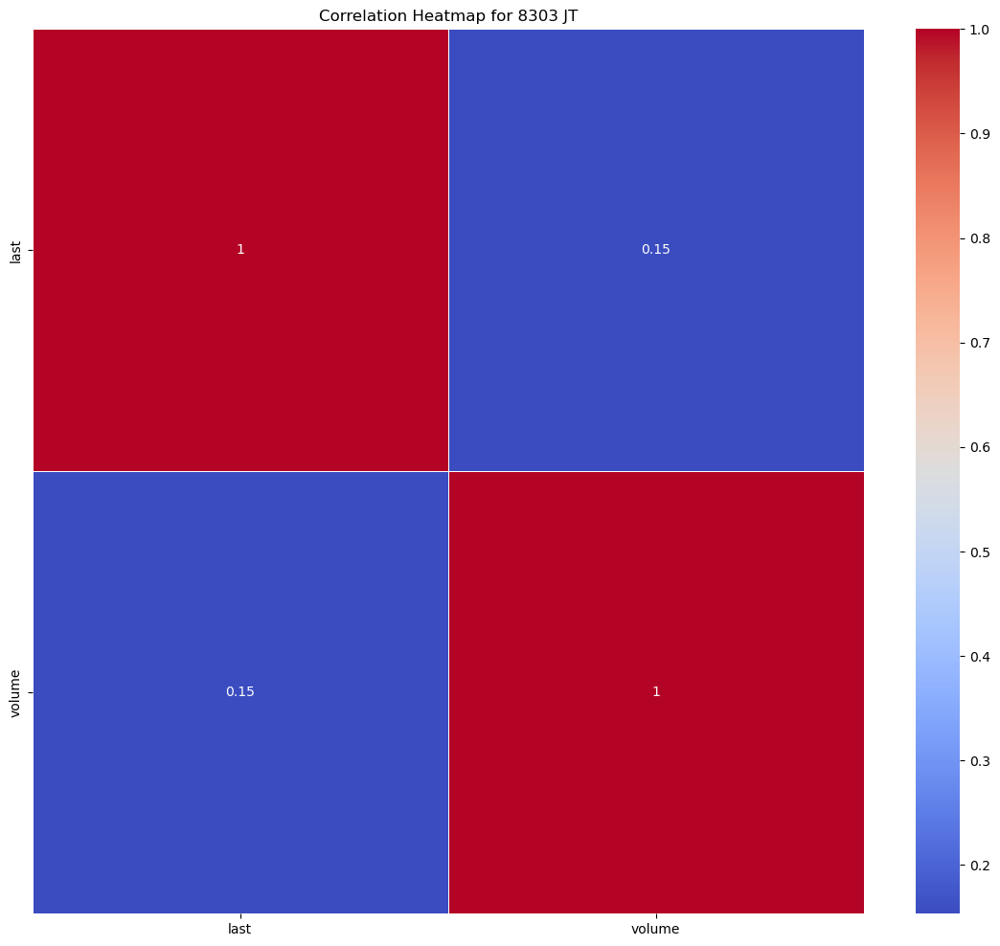

Statistics for stock 8304 JT
---- last ----
Mean: 2773.4622060349134
Median: 2801.4465
Mode: 3388.3045
Range: 2409.3711999999996
Standard Deviation: 643.1572188931309
Skewness: -0.08160054821567557
Kurtosis: -1.3026579812569397


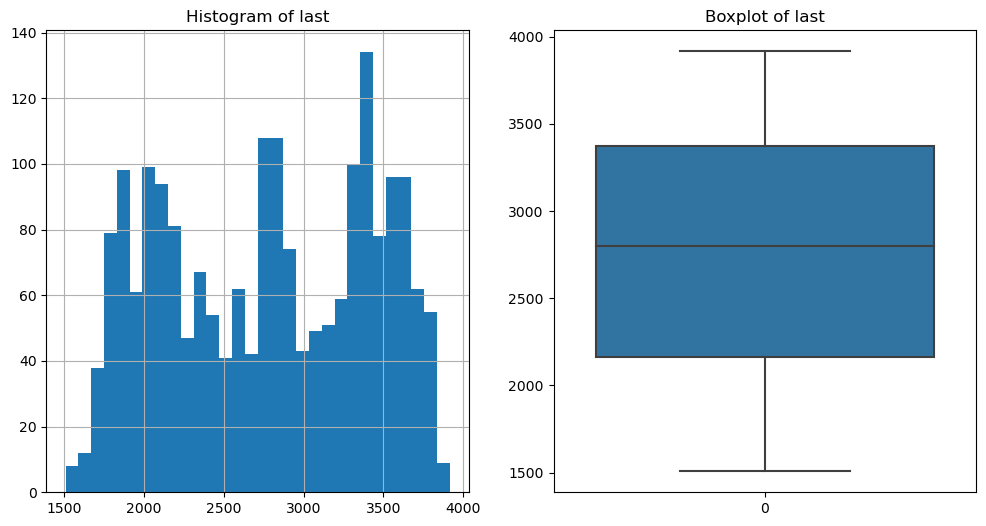

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


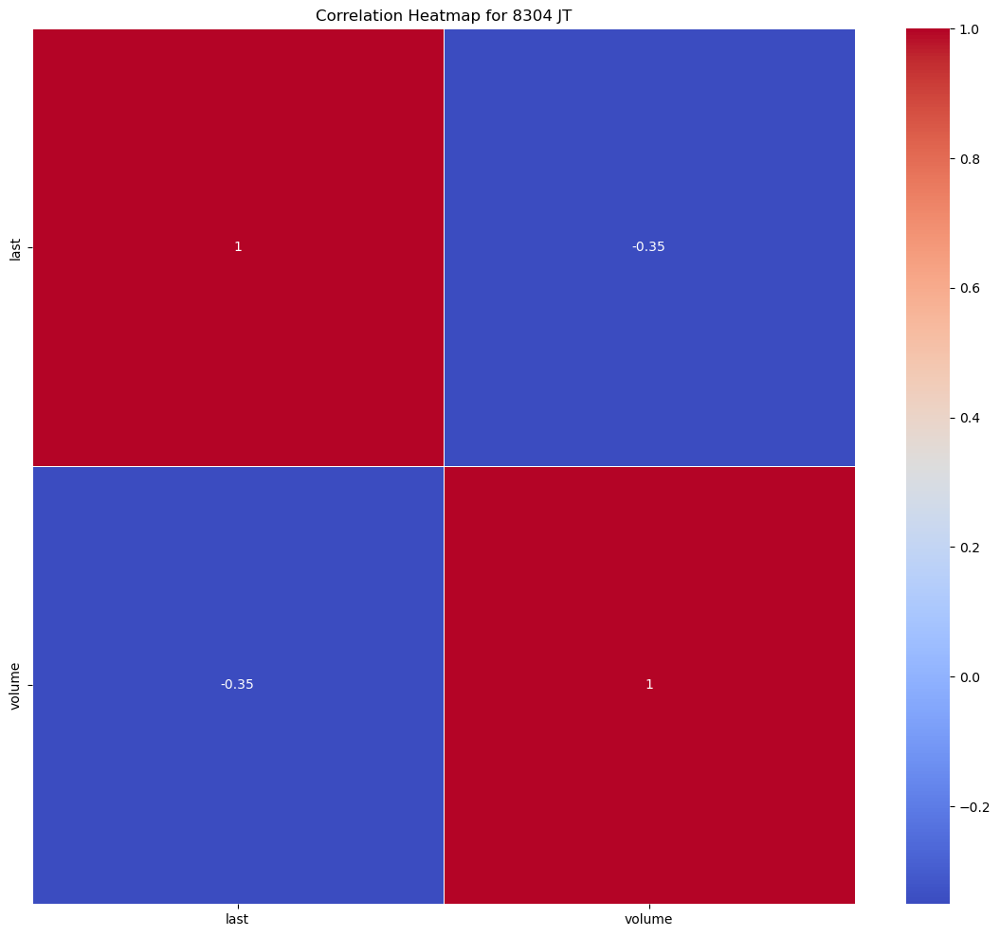

Statistics for stock 8306 JT
---- last ----
Mean: 535.7543665835411
Median: 518.0588
Mode: 507.0026
Range: 428.12879999999996
Standard Deviation: 94.35032781225586
Skewness: 0.39917601964758737
Kurtosis: -0.7466609468839058


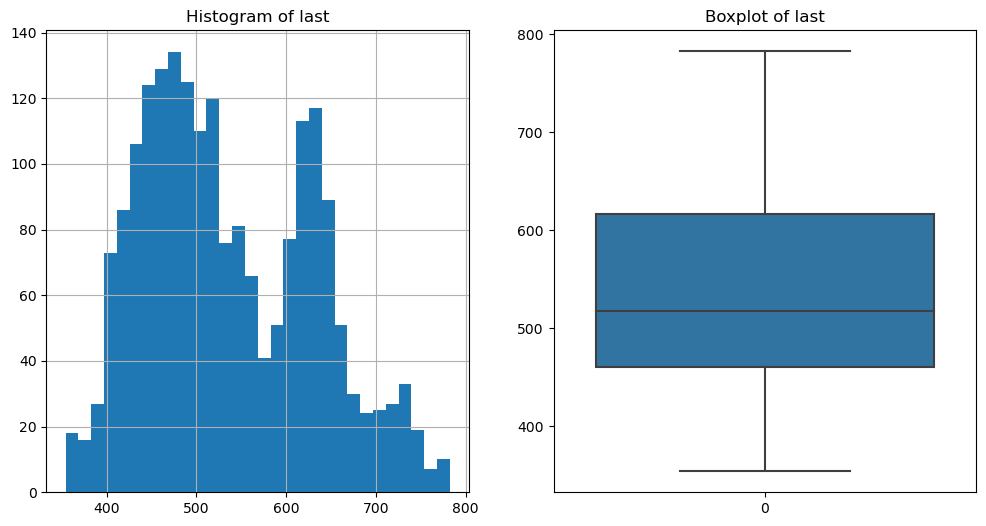

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


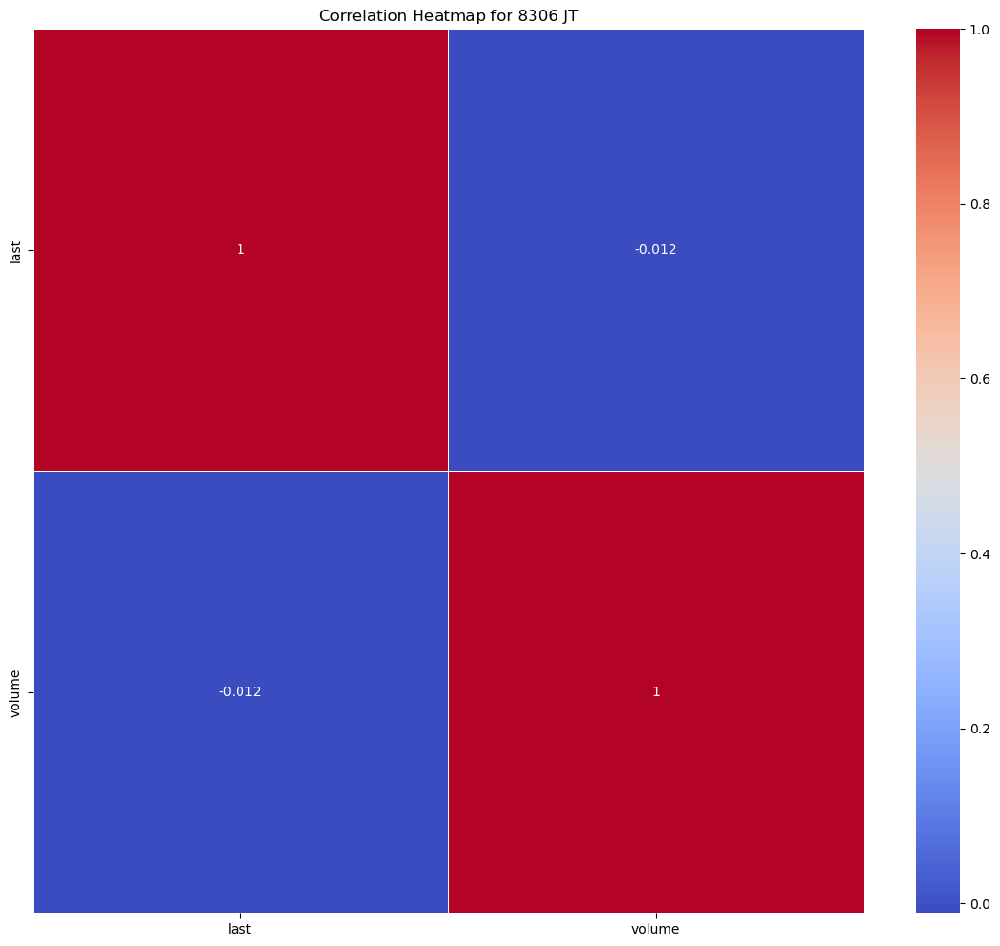

Statistics for stock 8308 JT
---- last ----
Mean: 442.7336868329177
Median: 444.0018
Mode: 368.7531
Range: 354.73029999999994
Standard Deviation: 76.18810975108282
Skewness: 0.02216682931097611
Kurtosis: -0.9683284014632121


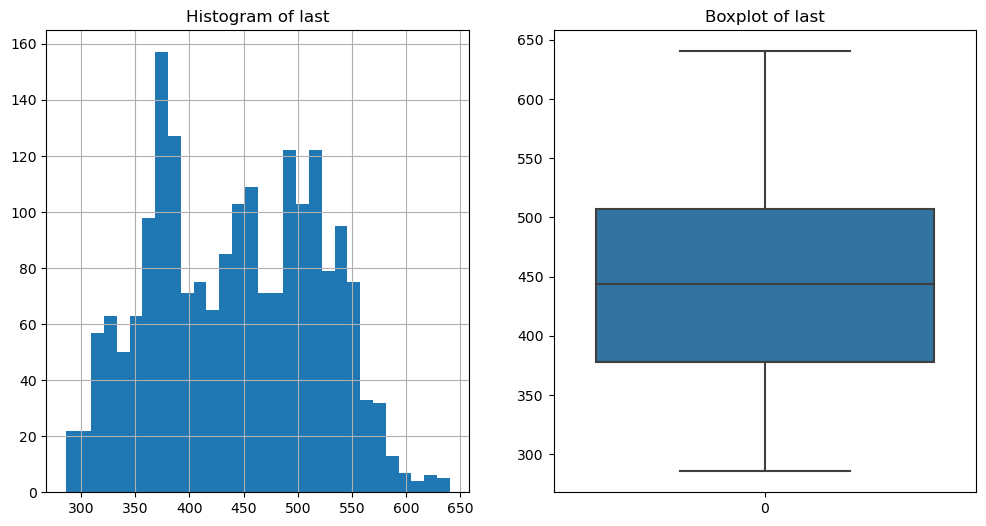

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


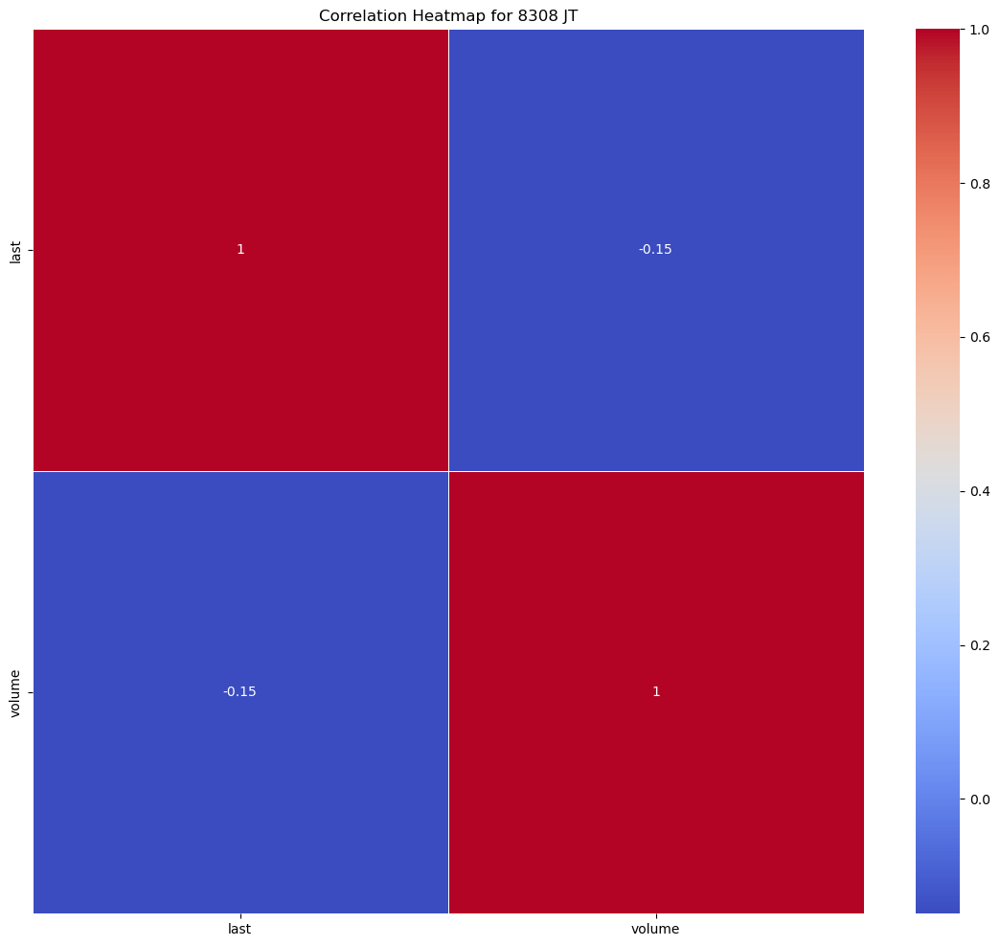

Statistics for stock 8309 JT
---- last ----
Mean: 3598.7172963591024
Median: 3658.2347
Mode: 3974.2774
Range: 2524.9404000000004
Standard Deviation: 481.8049977047176
Skewness: -0.19323887088404657
Kurtosis: -0.3638659883634747


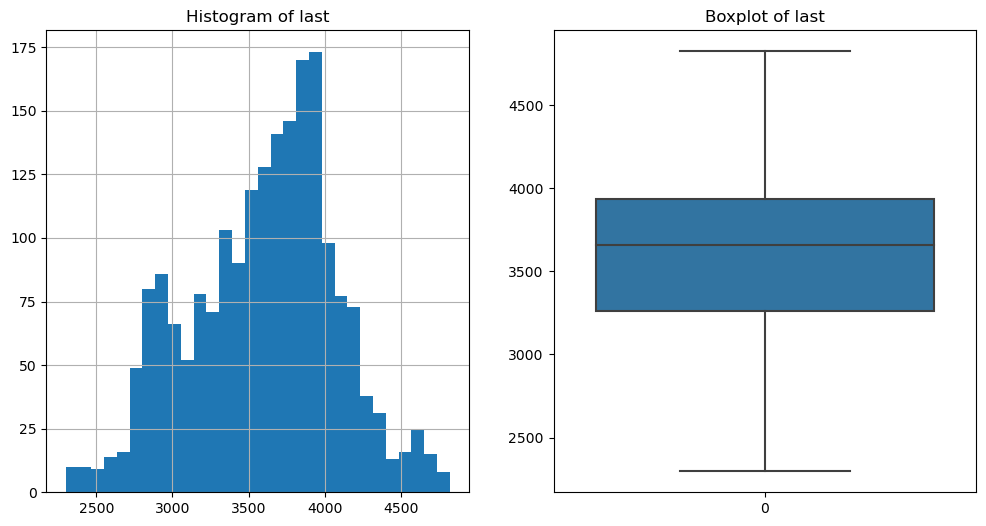

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


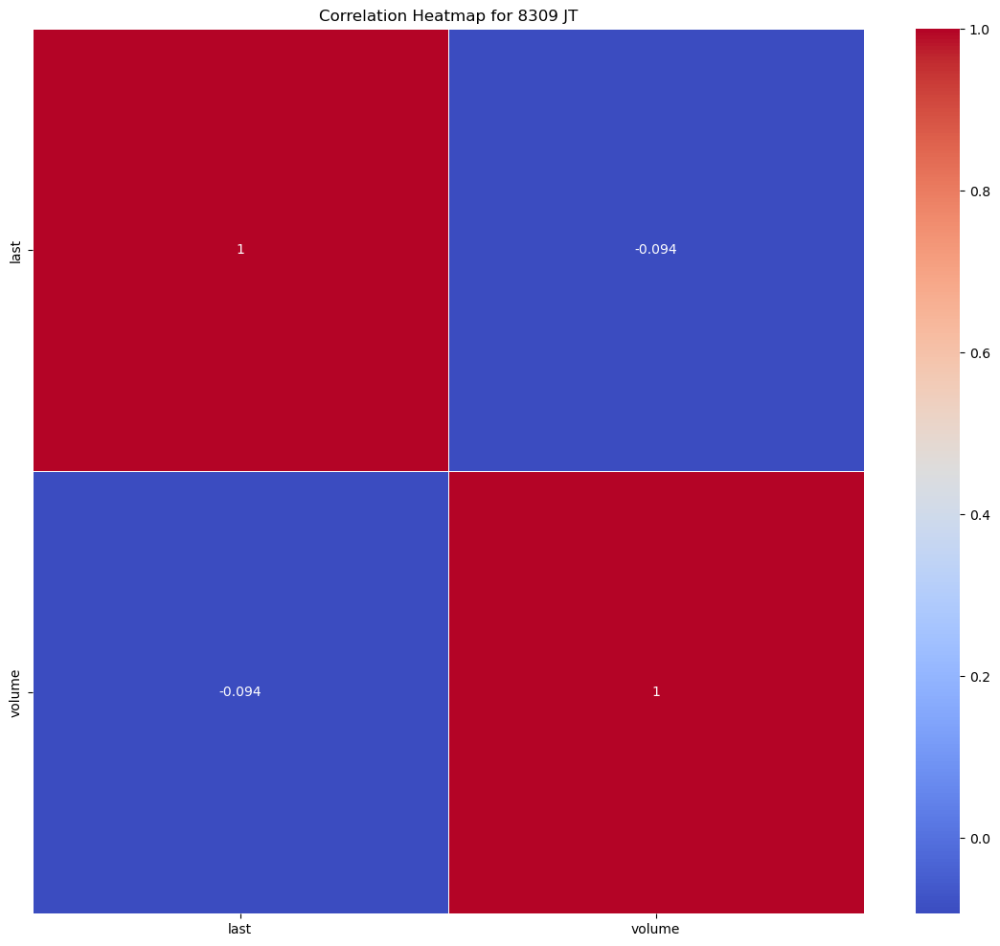

Statistics for stock 8316 JT
---- last ----
Mean: 3435.506477007482
Median: 3488.4359
Mode: 3753.1327
Range: 2313.4914999999996
Standard Deviation: 455.9147031502626
Skewness: -0.21373547123530937
Kurtosis: -0.4051809090122189


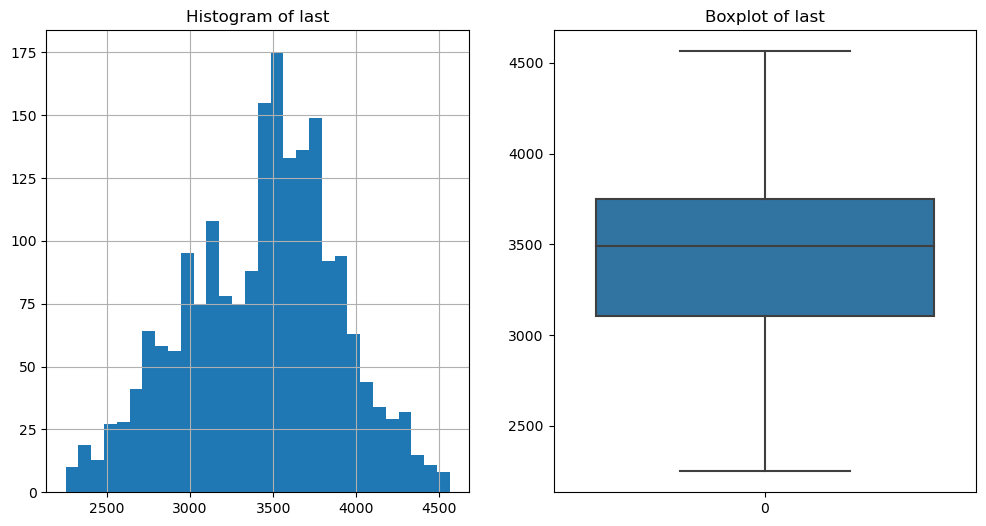

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


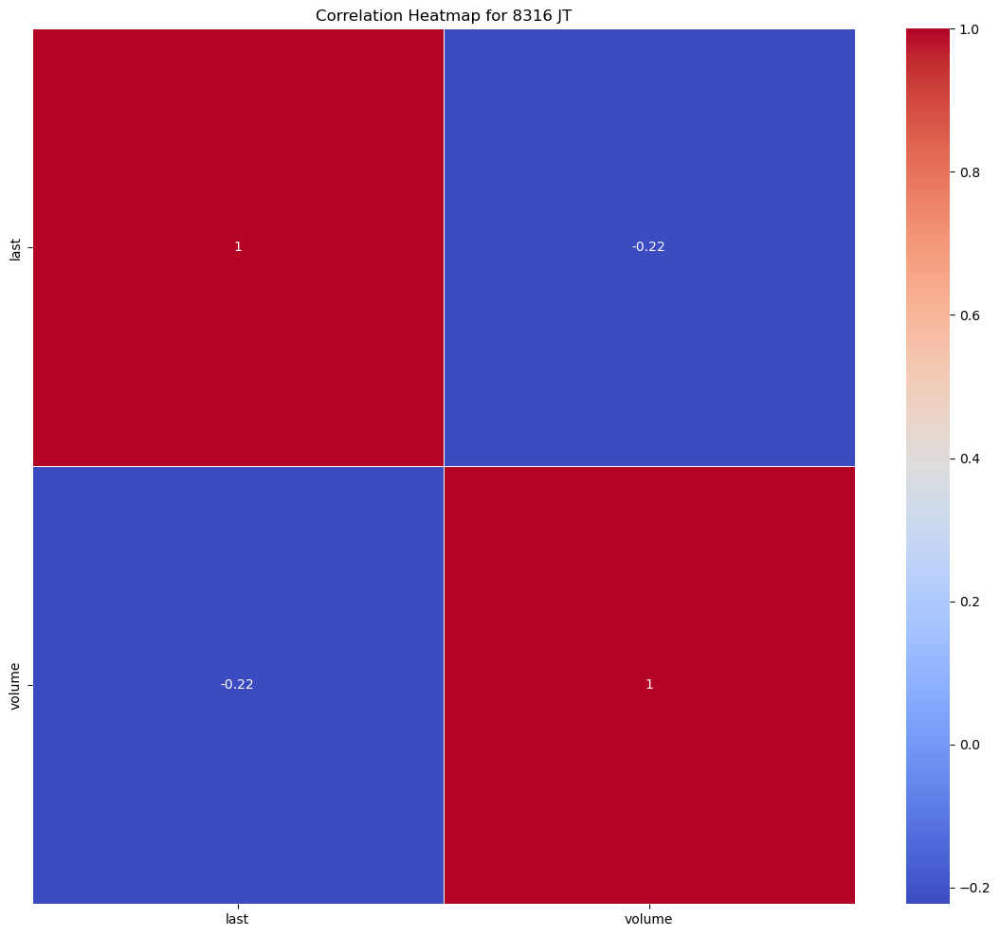

Statistics for stock 8331 JT
---- last ----
Mean: 634.2452832917706
Median: 619.0
Mode: 507.2278
Range: 544.6593
Standard Deviation: 113.66295557296053
Skewness: 0.35057197322462674
Kurtosis: -0.6352406209192161


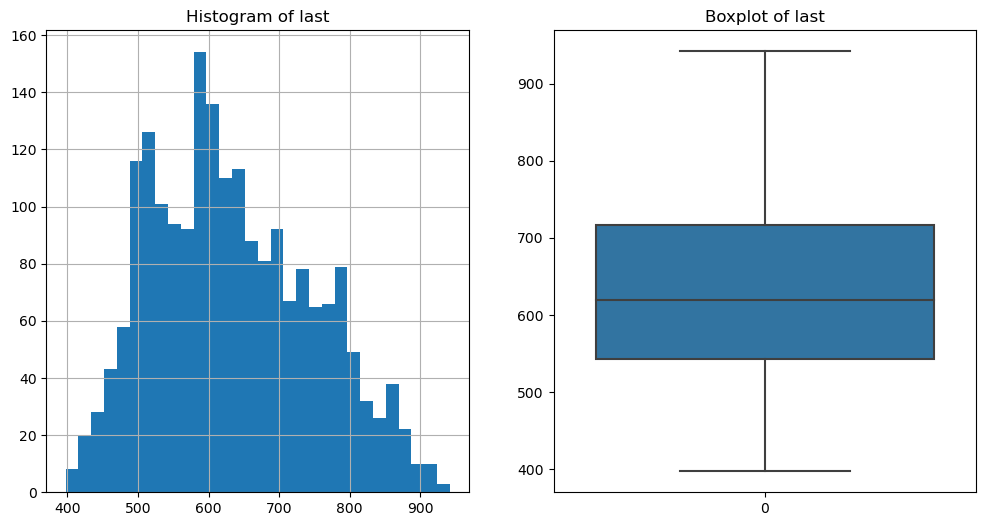

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


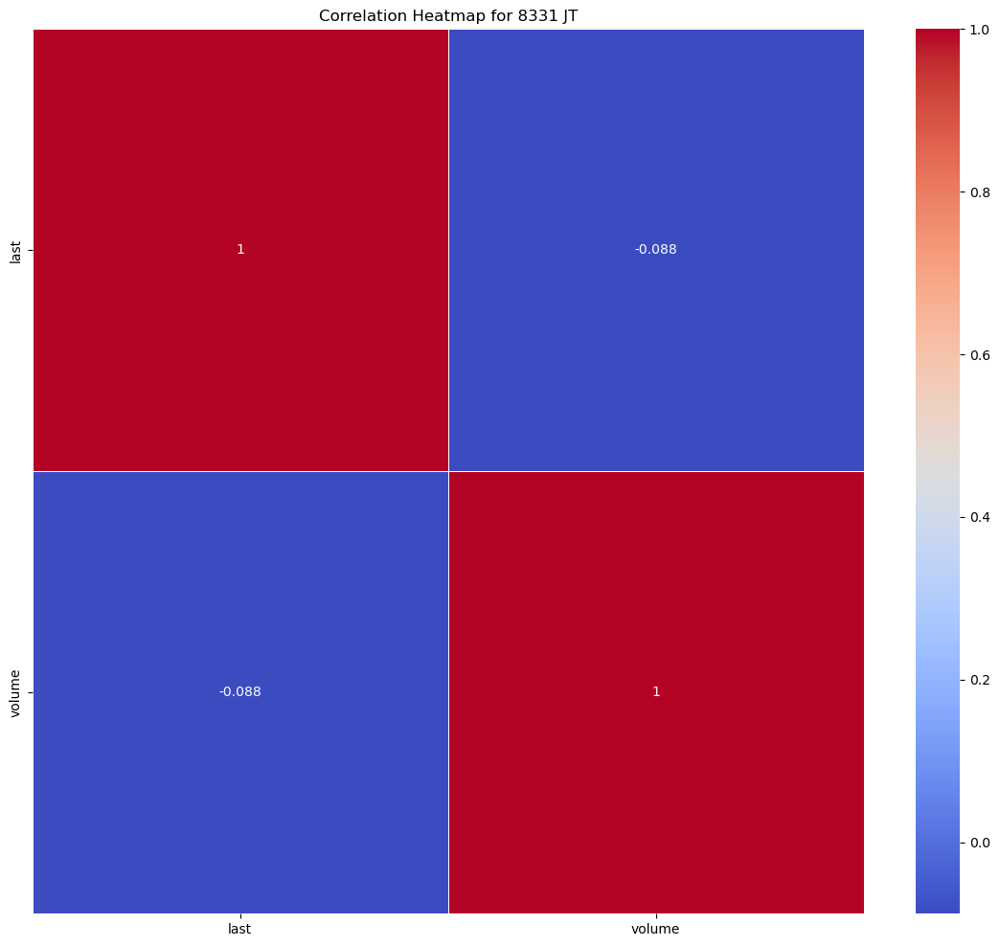

Statistics for stock 8354 JT
---- last ----
Mean: 2099.3972218952617
Median: 2032.8954
Mode: 2502.0175
Range: 1842.7236
Standard Deviation: 408.6371688369313
Skewness: 0.25954198083634
Kurtosis: -0.9649762538166393


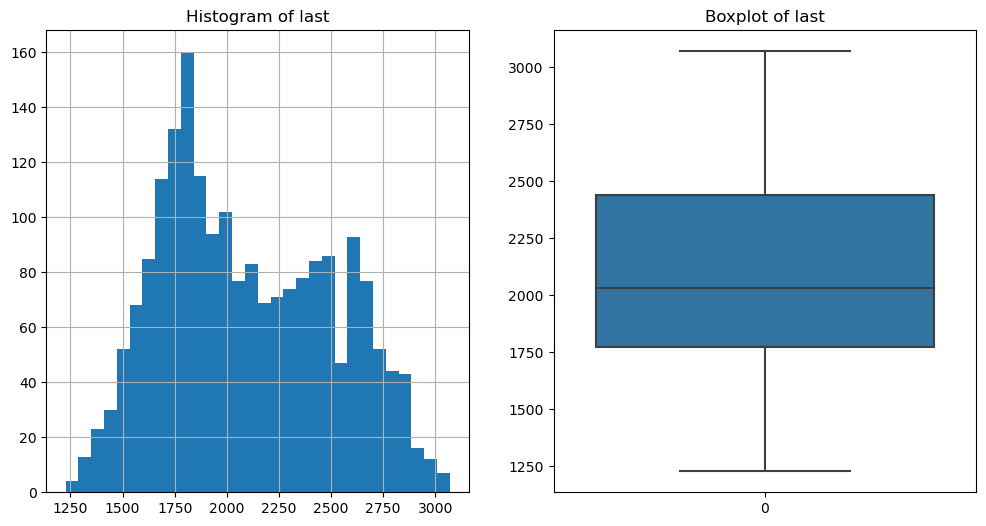

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


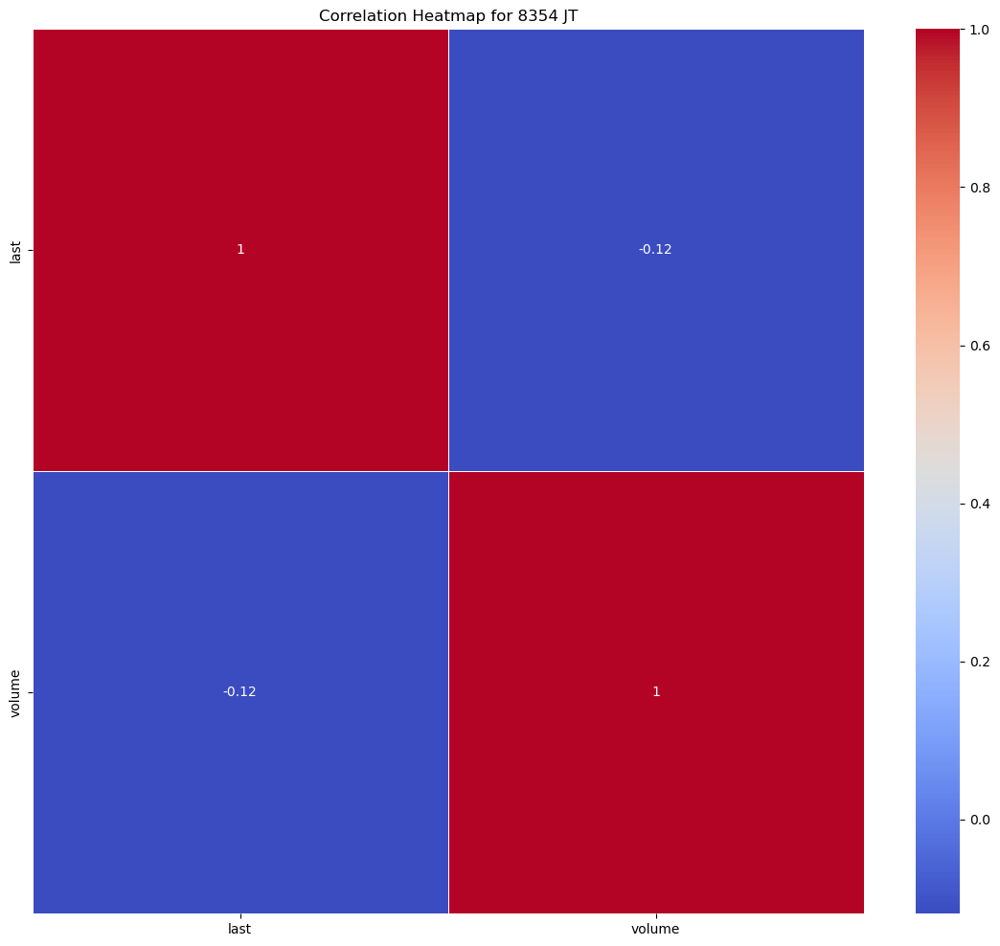

Statistics for stock 8355 JT
---- last ----
Mean: 880.8131335162095
Median: 879.5058
Mode: 861.1828
Range: 790.0937000000001
Standard Deviation: 137.29077749843793
Skewness: 0.27873292146070977
Kurtosis: -0.2119032416549511


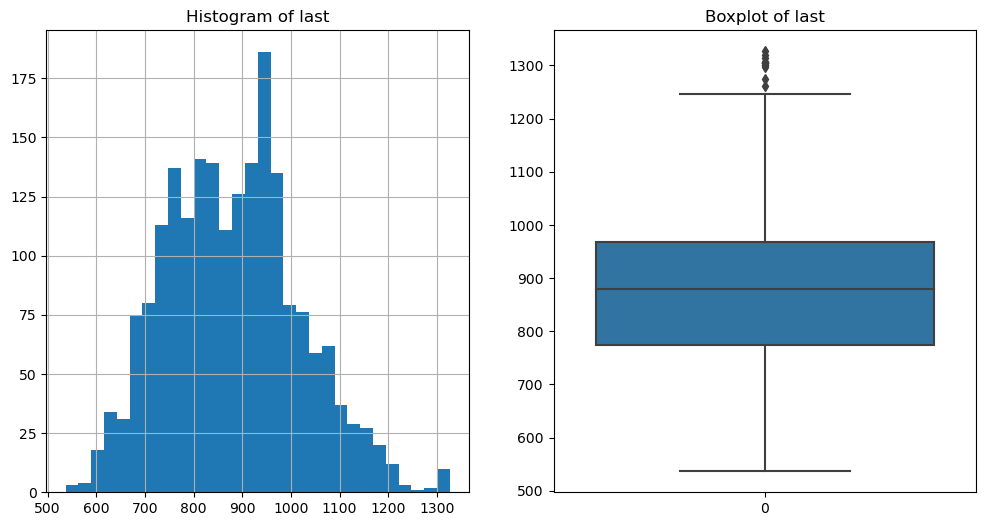

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


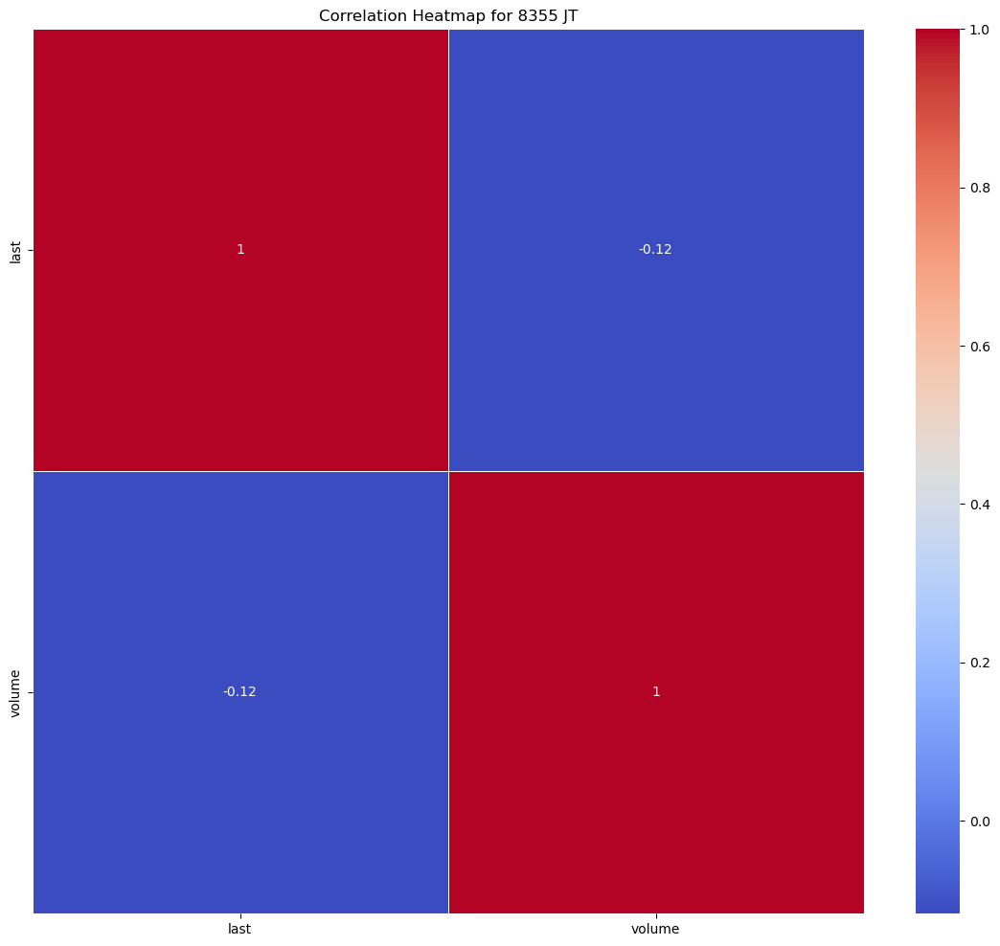

Statistics for stock 8411 JT
---- last ----
Mean: 1594.1134921695761
Median: 1585.8258
Mode: 1536.7652
Range: 1150.3488000000002
Standard Deviation: 198.4236700100902
Skewness: 0.29108657751374456
Kurtosis: 0.2219062048173508


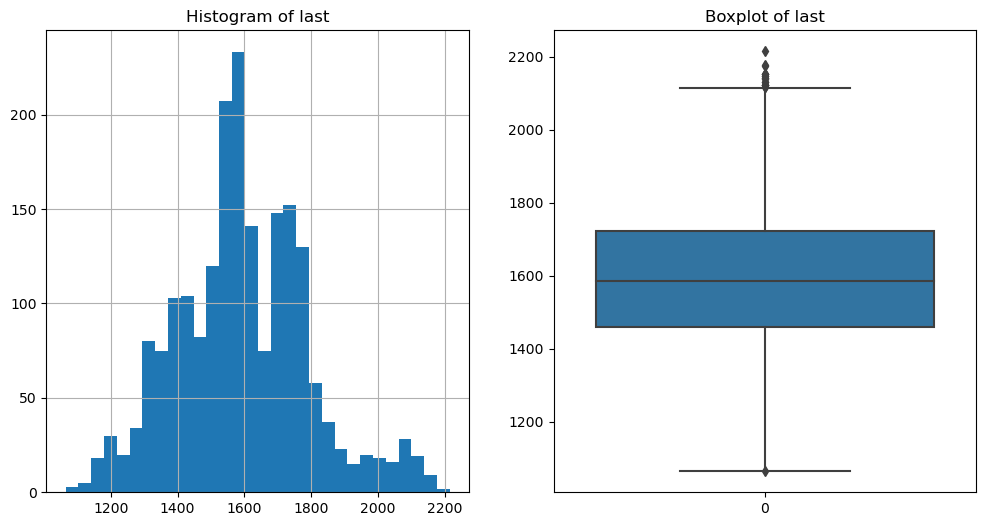

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


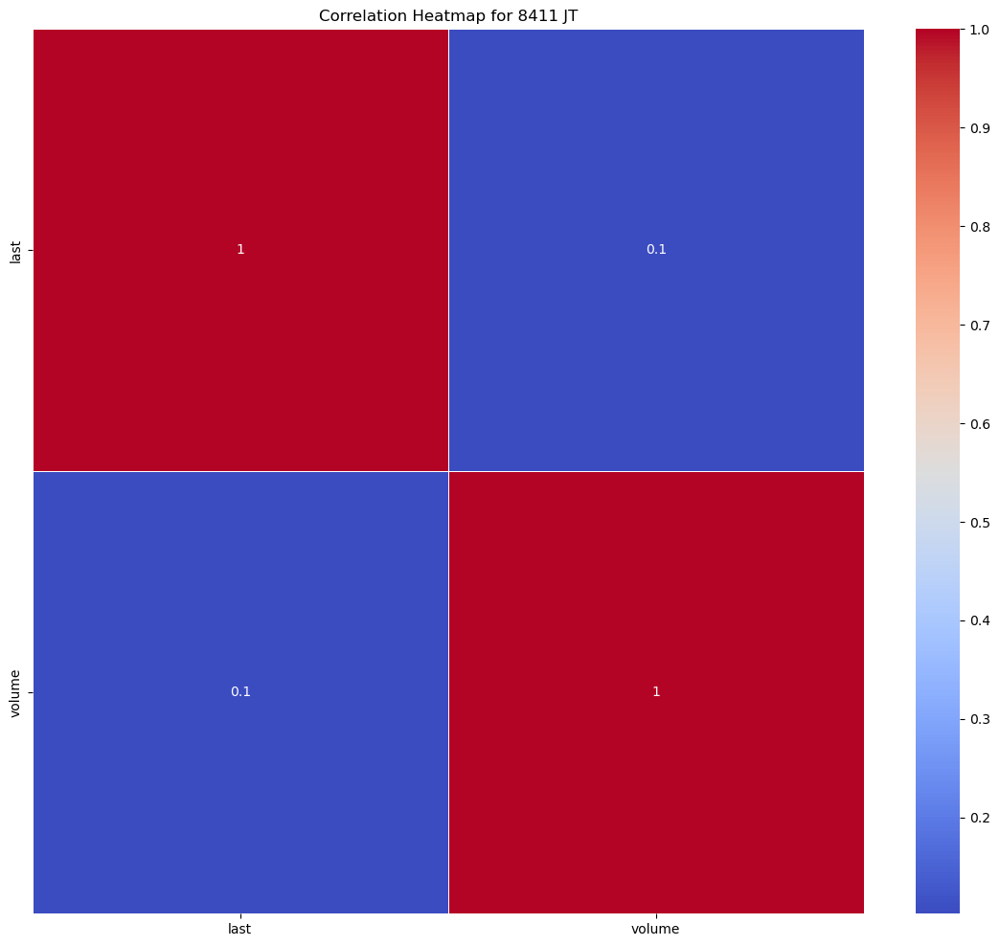

Statistics for stock 8601 JT
---- last ----
Mean: 583.5752757605985
Median: 587.921
Mode: 664.784
Range: 509.47319999999996
Standard Deviation: 103.02574930553088
Skewness: 0.06856688676644866
Kurtosis: -0.7072694811580398


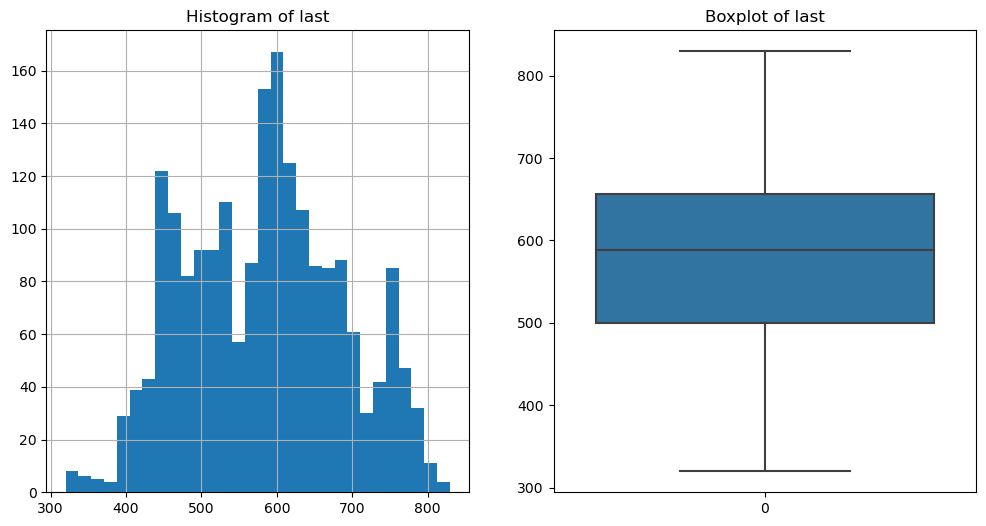

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


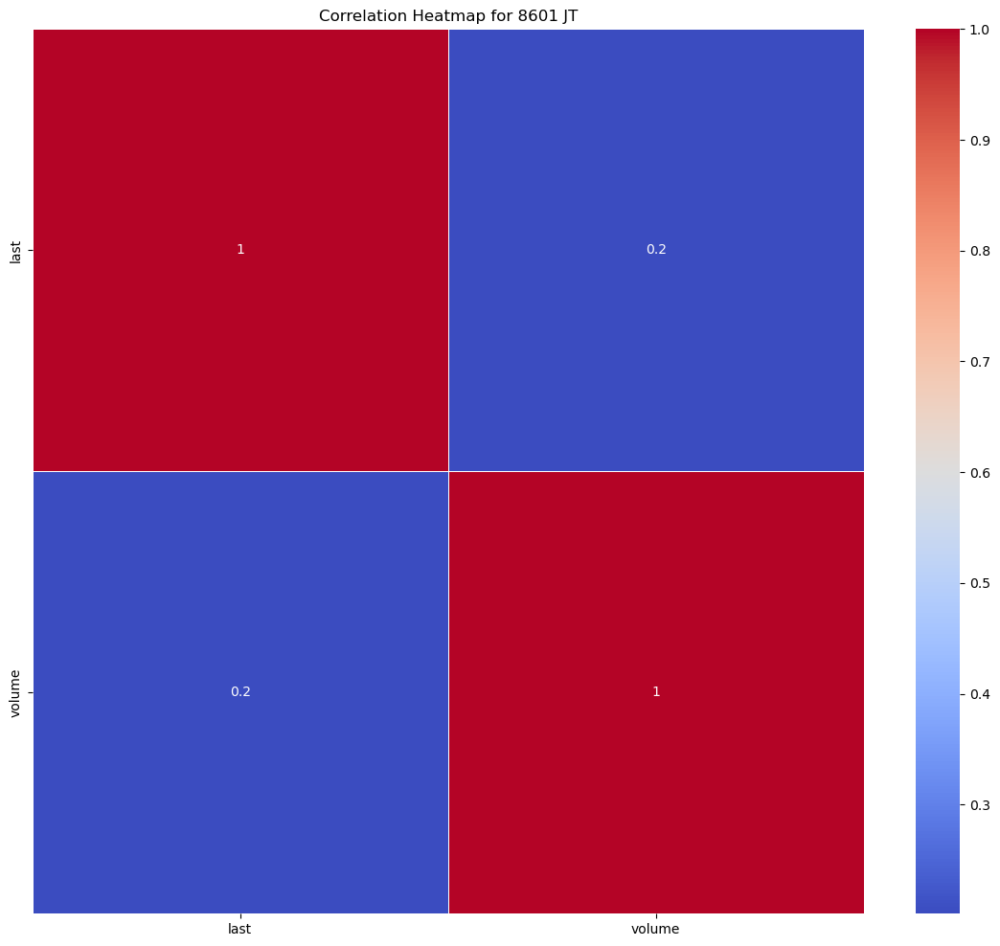

Statistics for stock 8604 JT
---- last ----
Mean: 525.0536188528678
Median: 536.8
Mode: 594.7322
Range: 467.289
Standard Deviation: 95.51371563191873
Skewness: -0.22346675910772595
Kurtosis: -0.6455805671979995


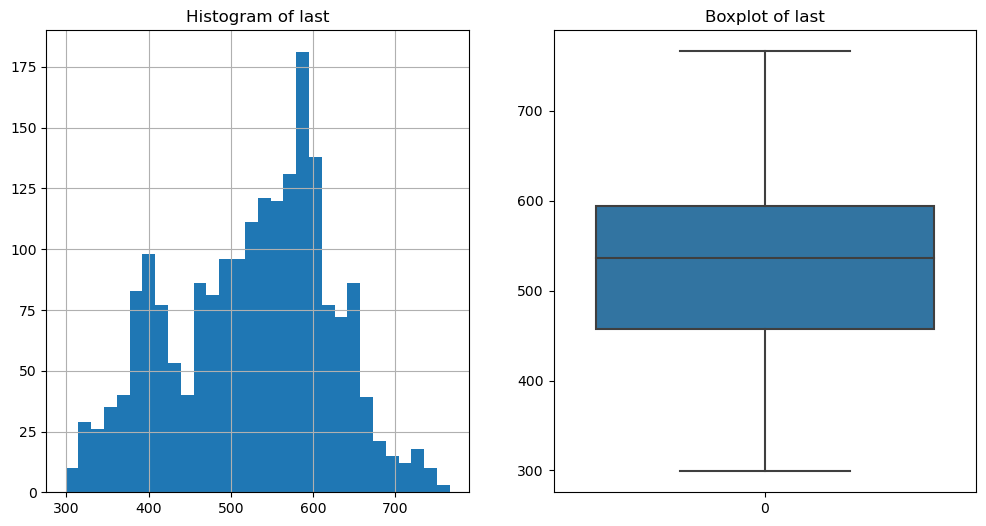

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


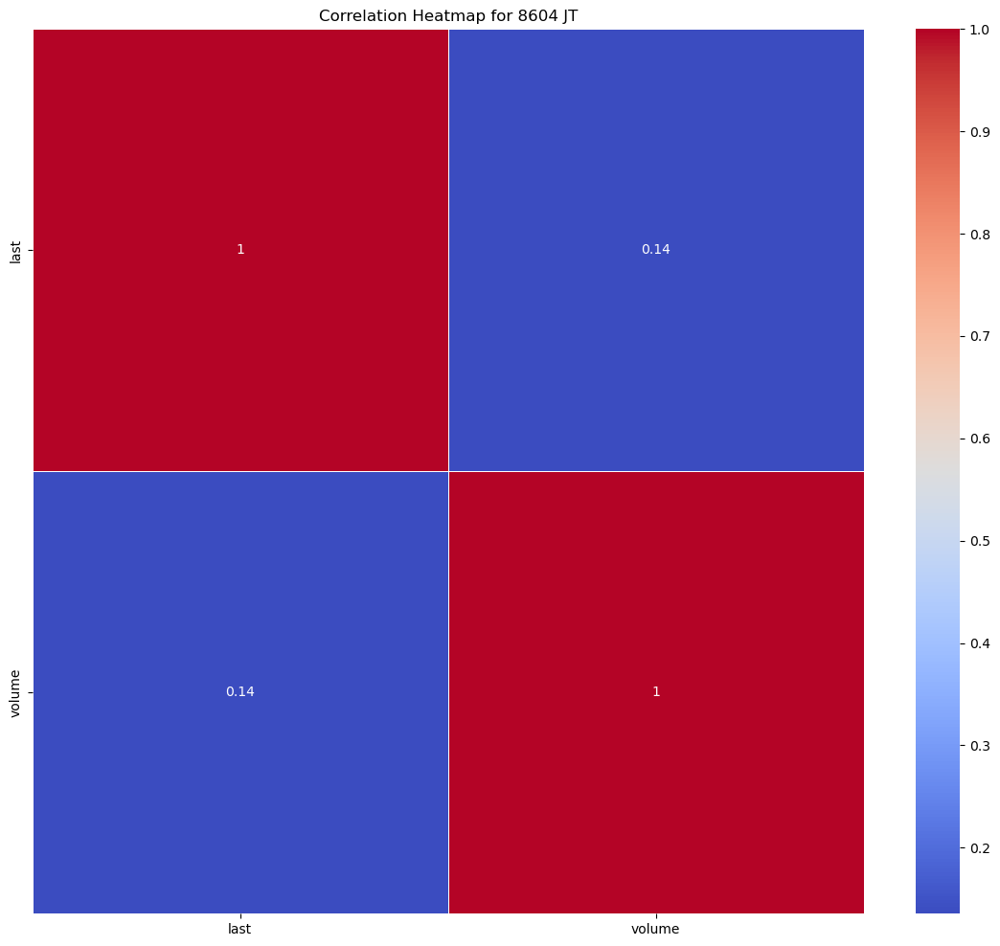

Statistics for stock 8628 JT
---- last ----
Mean: 817.060572169576
Median: 814.8982
Mode: 846.5884
Range: 627.2066000000001
Standard Deviation: 105.65001217722222
Skewness: 0.31796629673243154
Kurtosis: 0.3077885312897073


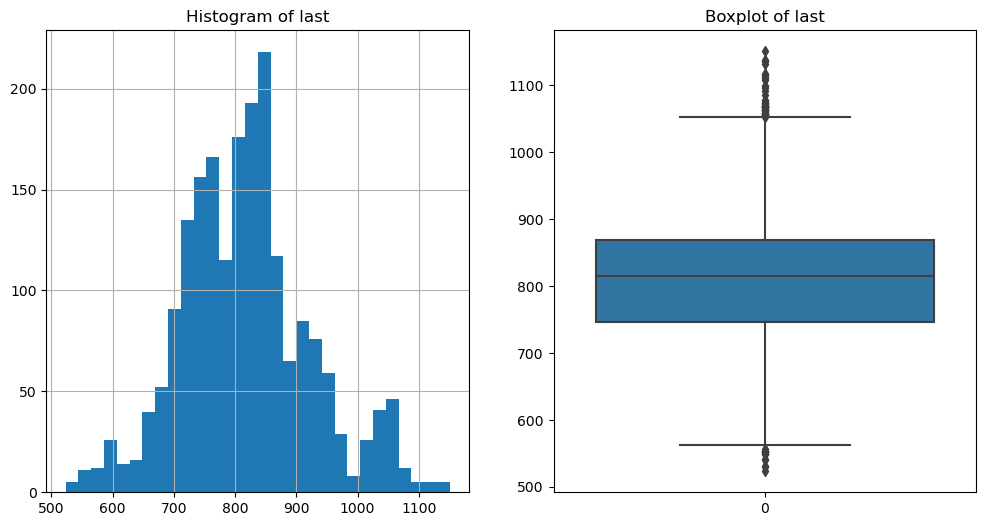

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


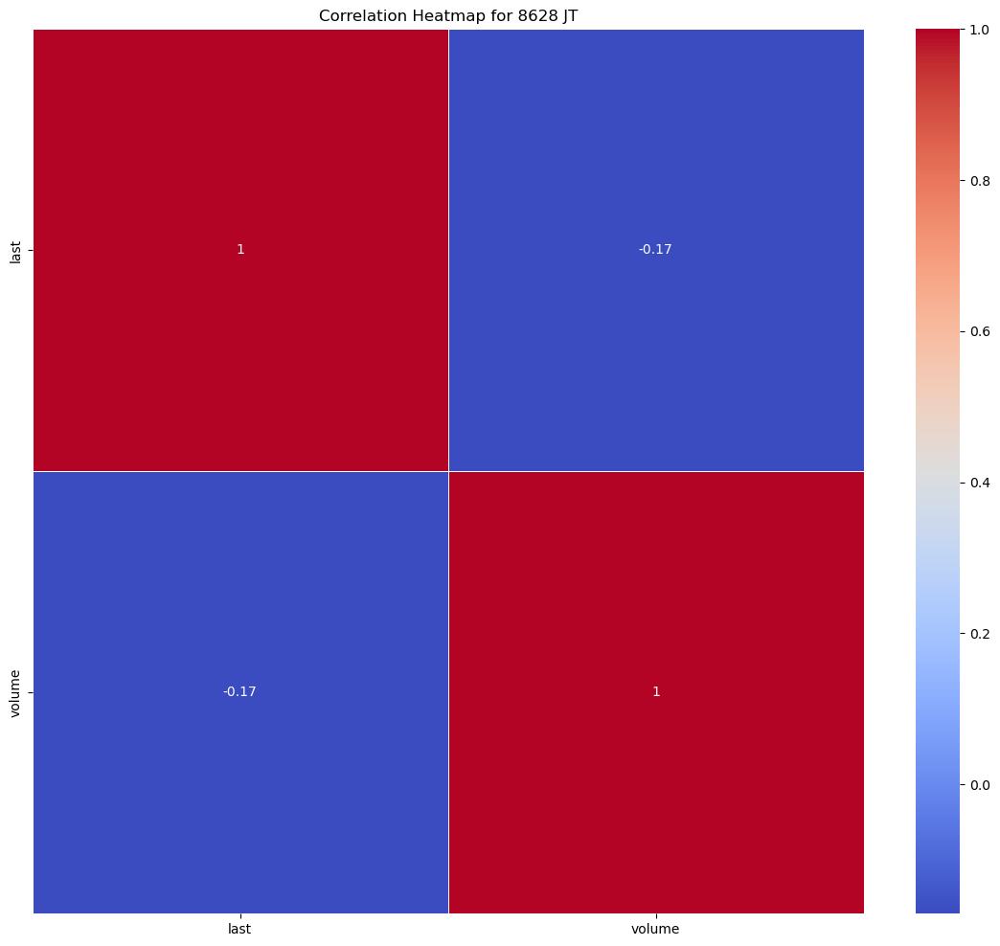

Statistics for stock 8630 JT
---- last ----
Mean: 3274.246948628429
Median: 3562.9671
Mode: 1960.8307
Range: 3157.9283
Standard Deviation: 822.059880145828
Skewness: -0.4909774120721991
Kurtosis: -1.1029228467134864


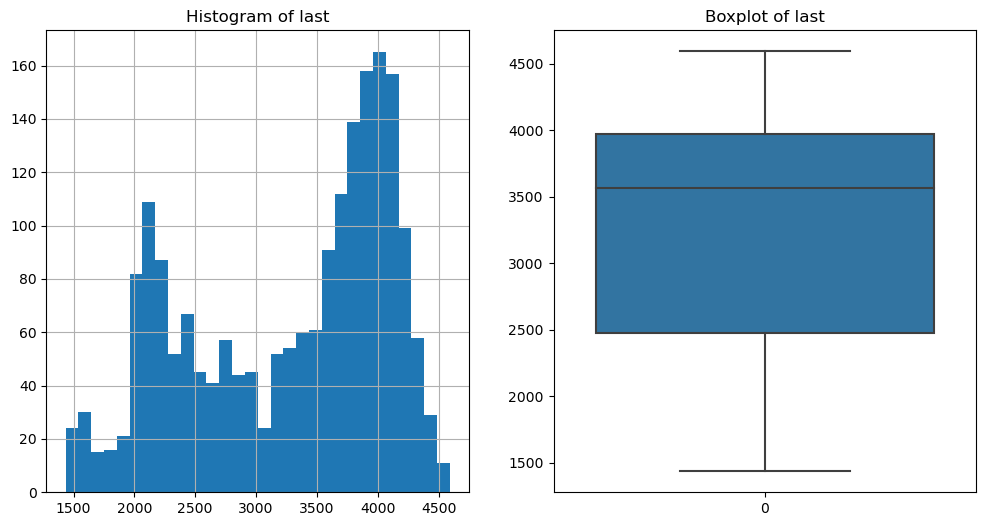

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


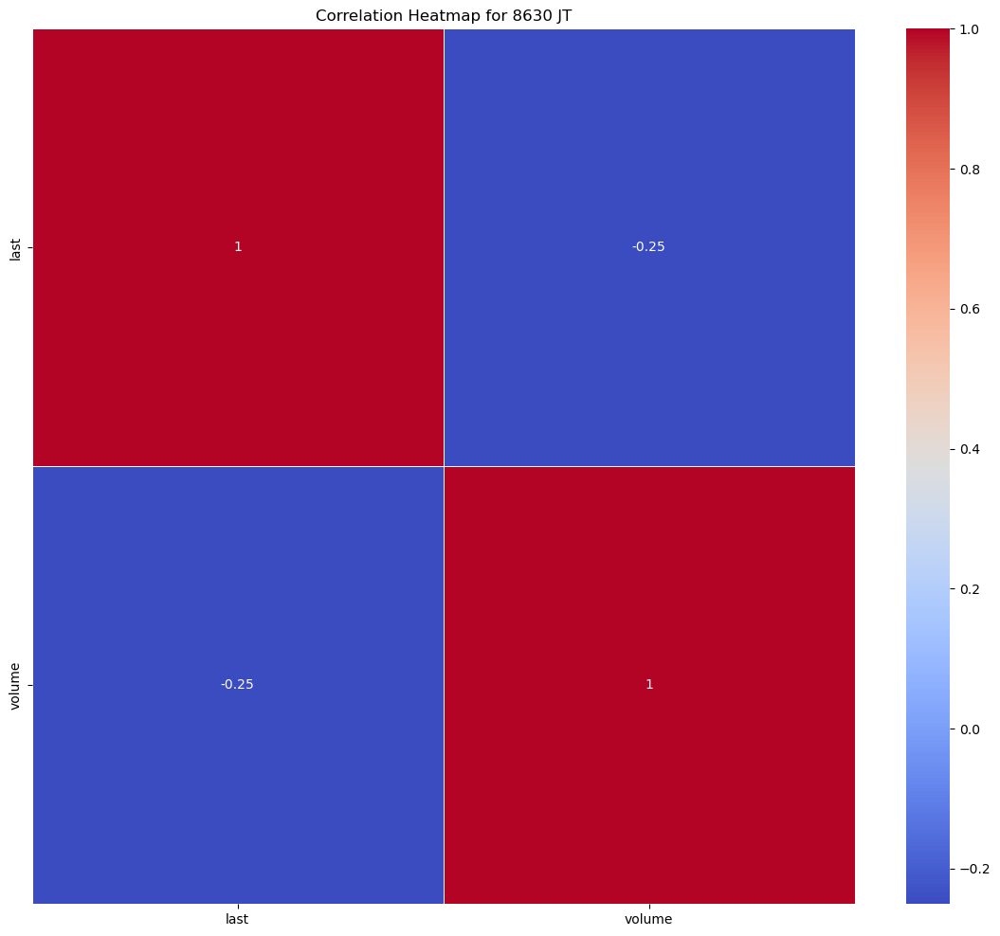

Statistics for stock 8725 JT
---- last ----
Mean: 2740.58673840399
Median: 2933.2229
Mode: 3090.9649
Range: 2290.1103999999996
Standard Deviation: 552.6001590077315
Skewness: -0.6429716640862847
Kurtosis: -0.8376102407204784


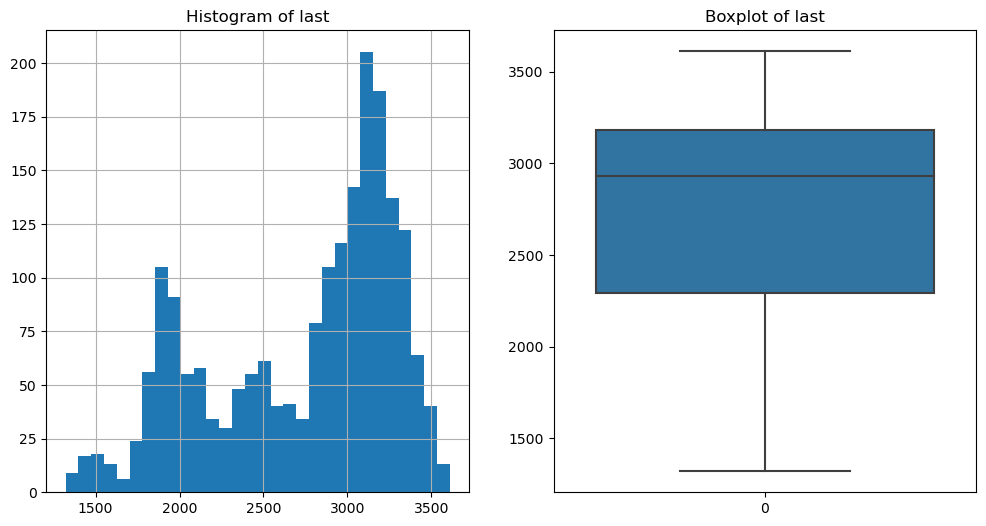

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


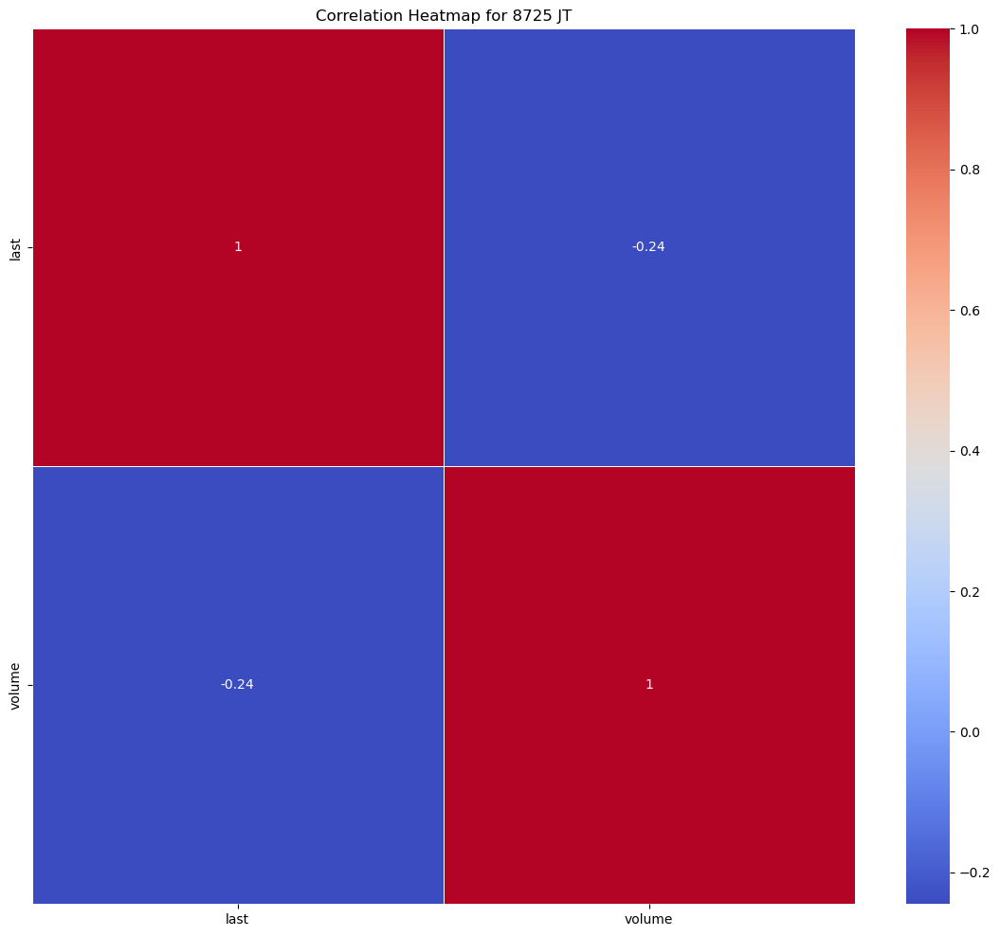

Statistics for stock 8750 JT
---- last ----
Mean: 1539.898897755611
Median: 1549.837
Mode: 1065.816
Range: 1362.3482
Standard Deviation: 306.78180135924407
Skewness: 0.13986590108777422
Kurtosis: -0.9617215846873464


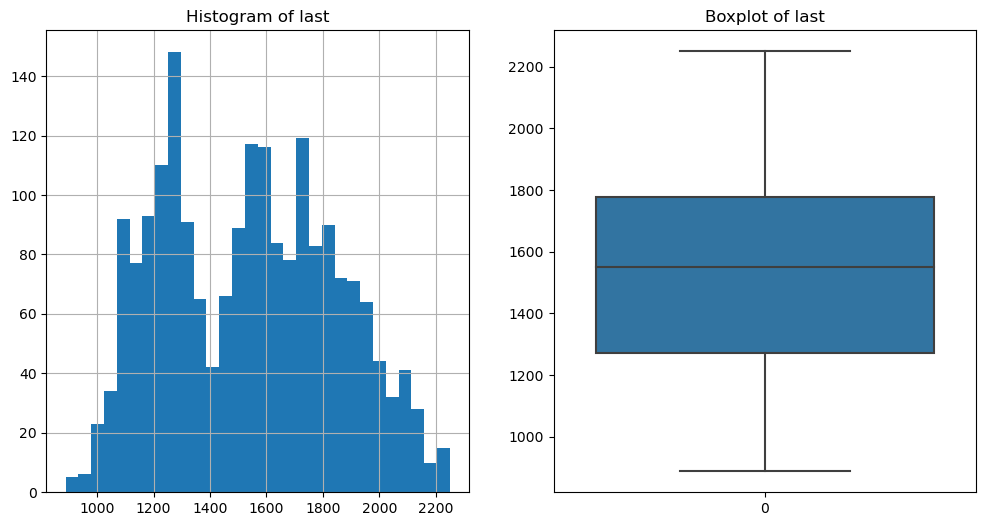

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


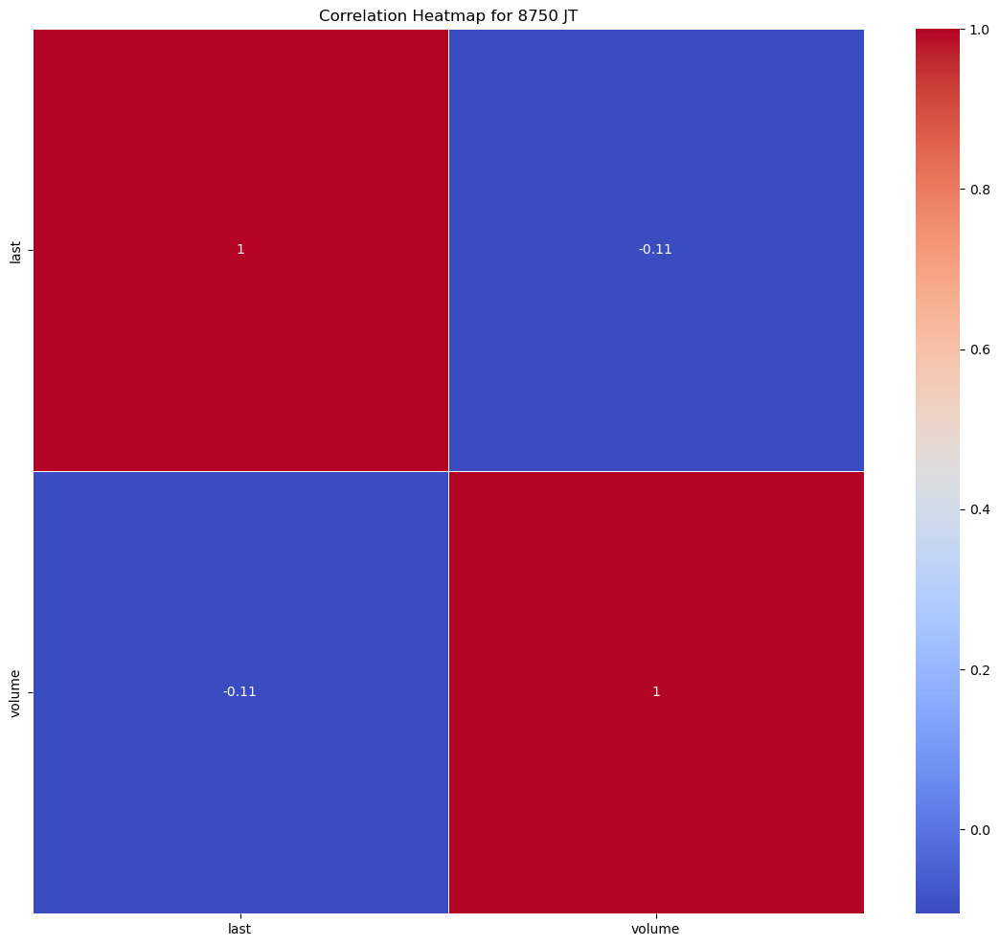

Statistics for stock 8766 JT
---- last ----
Mean: 3938.703483241895
Median: 4072.1404
Mode: 2405.0725
Range: 4170.0302
Standard Deviation: 1056.5970583996689
Skewness: -0.11972266217107938
Kurtosis: -1.130041034846325


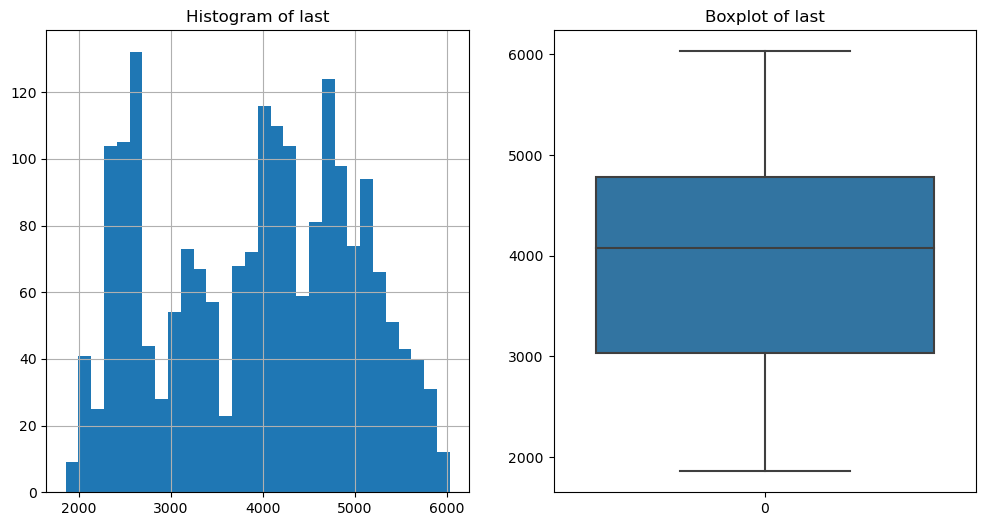

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


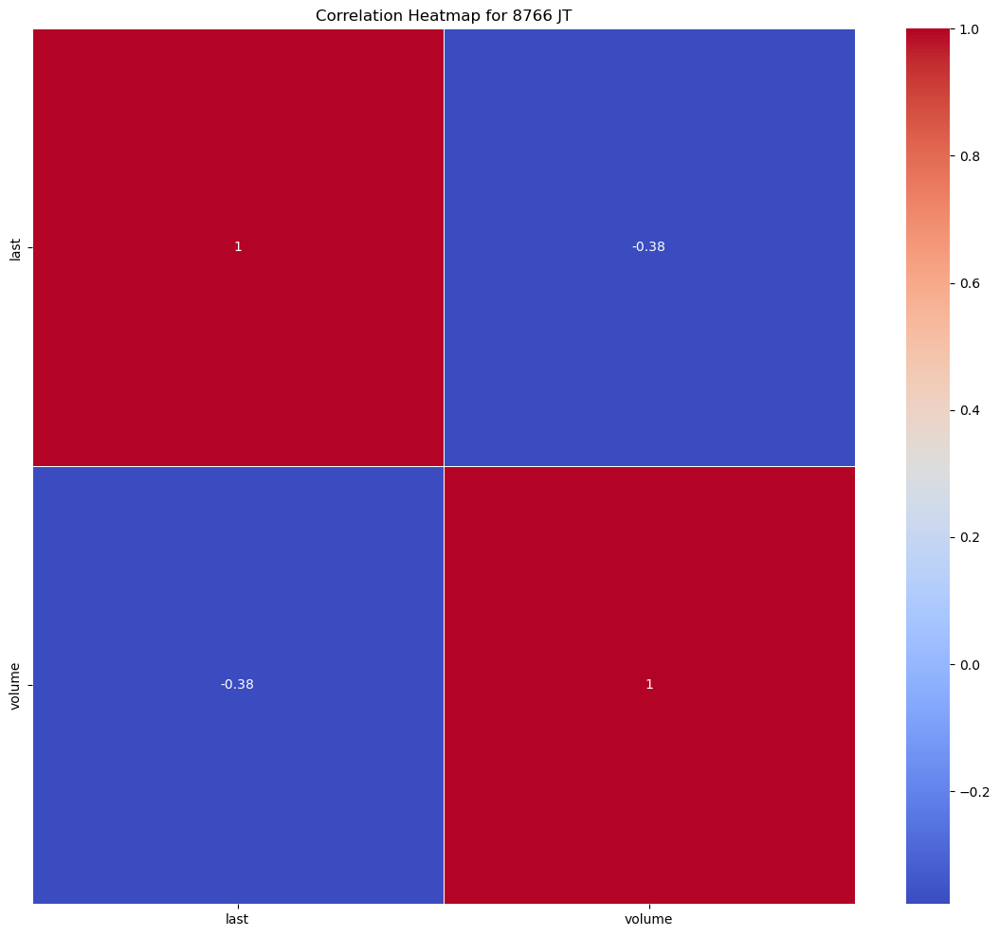

Statistics for stock 8795 JT
---- last ----
Mean: 1227.047396508728
Median: 1174.9924
Mode: 1032.1214
Range: 1163.5773
Standard Deviation: 254.2820842084859
Skewness: 0.34443383357920715
Kurtosis: -0.8422219700188811


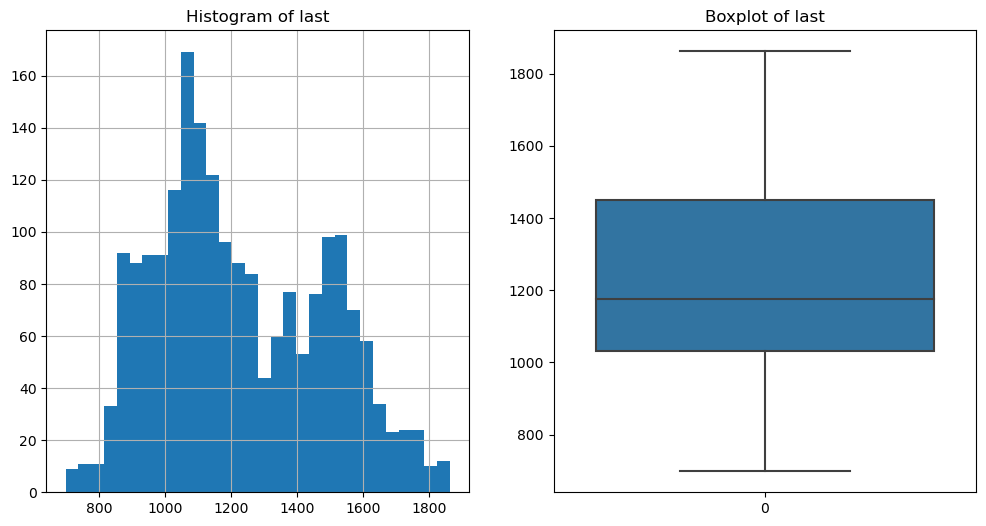

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


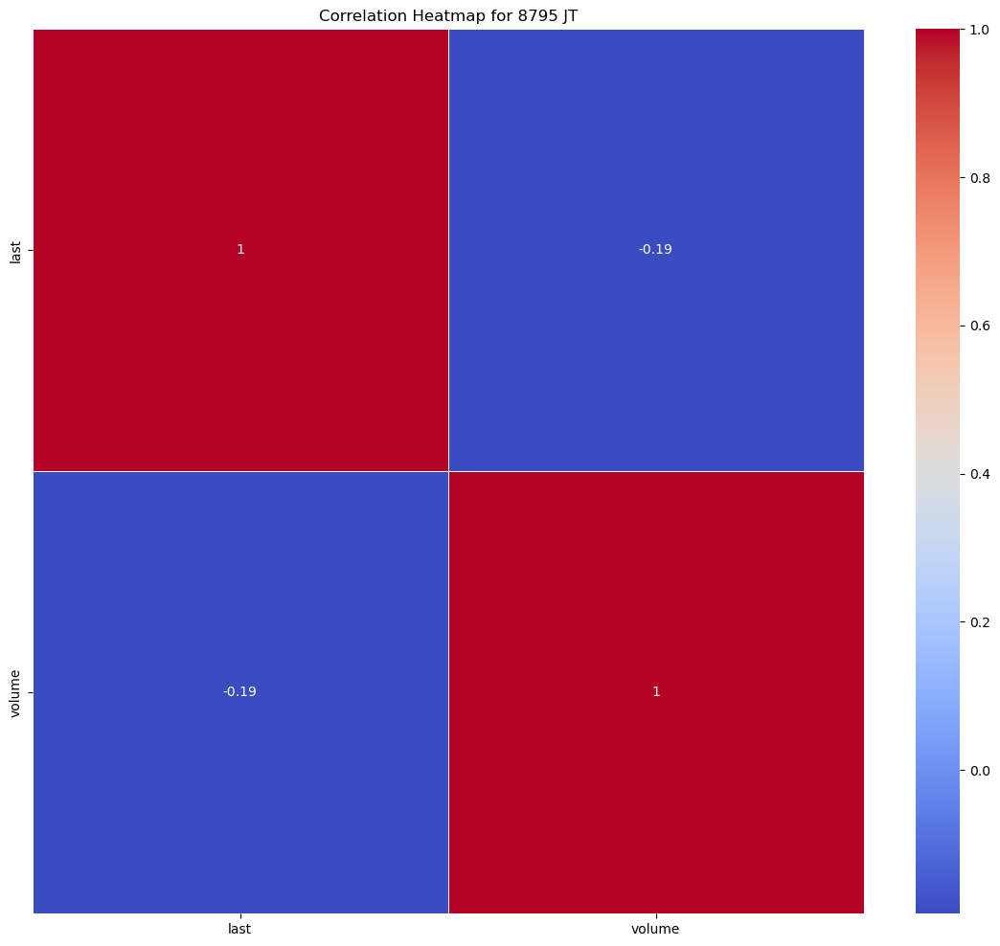

Statistics for stock 8801 JT
---- last ----
Mean: 2577.2421943142144
Median: 2558.5445
Mode: 3079.5593
Range: 1932.5634999999997
Standard Deviation: 394.9768564465222
Skewness: -0.06428850103894251
Kurtosis: -0.5459732436701201


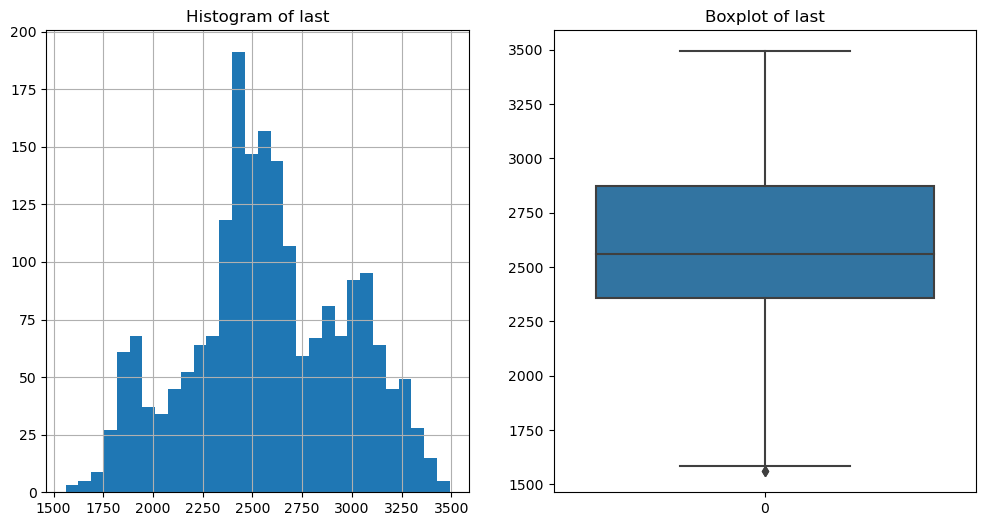

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


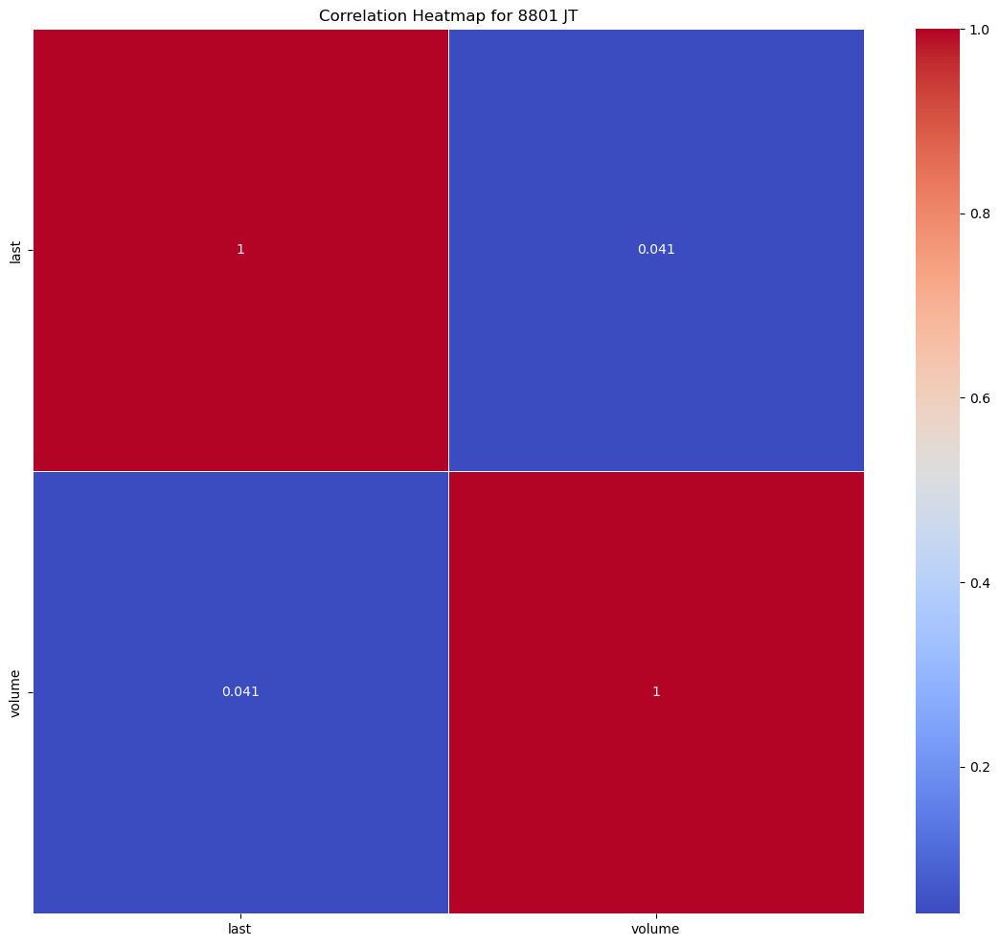

Statistics for stock 8802 JT
---- last ----
Mean: 2072.880583790524
Median: 1993.5668
Mode: 1625.0
Range: 1753.7792999999997
Standard Deviation: 316.32129925565675
Skewness: 0.5424829059223999
Kurtosis: -0.4813620766413145


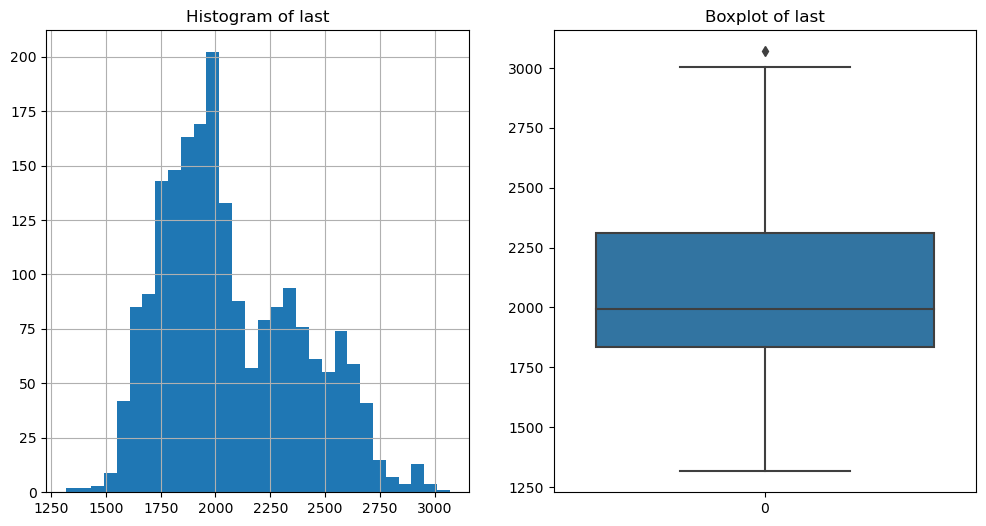

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


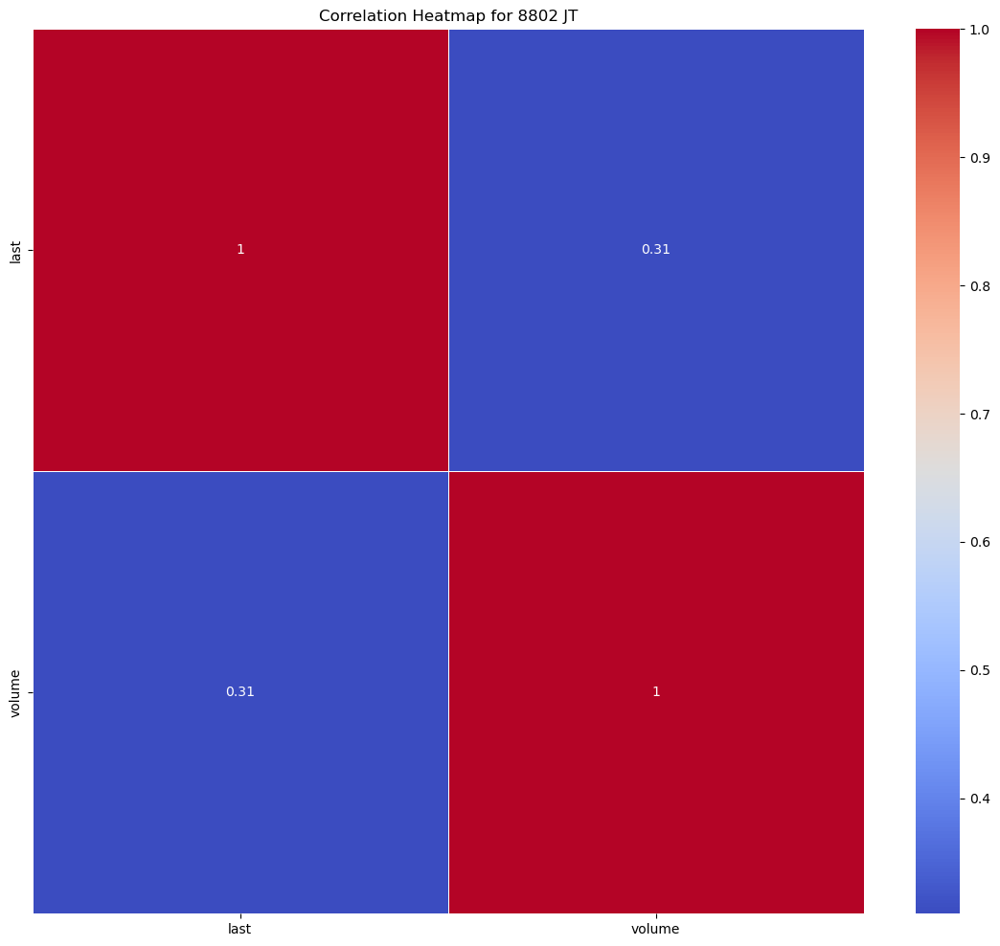

Statistics for stock 8804 JT
---- last ----
Mean: 1360.59100723192
Median: 1374.9124
Mode: 1241.7178
Range: 1322.0456
Standard Deviation: 206.84007326319303
Skewness: -0.23774405146138097
Kurtosis: 0.5277396792801698


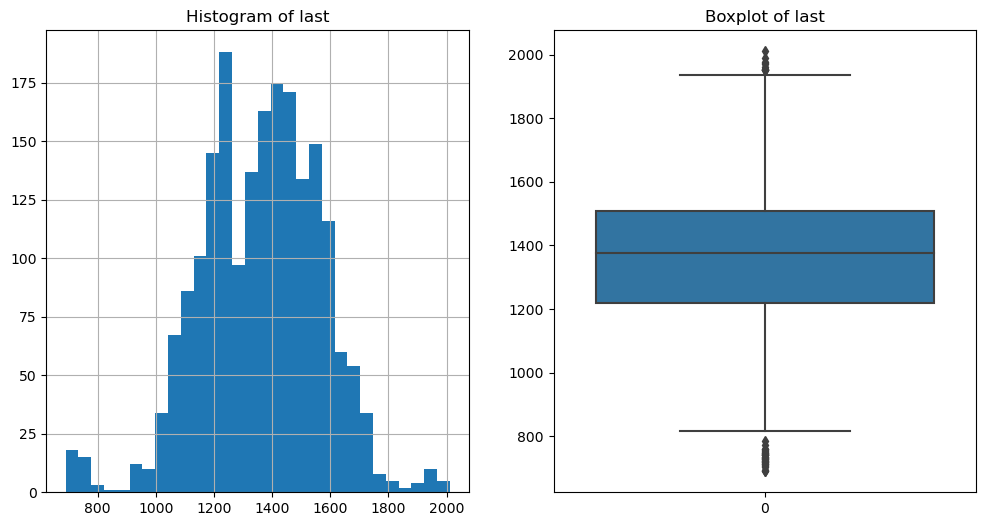

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


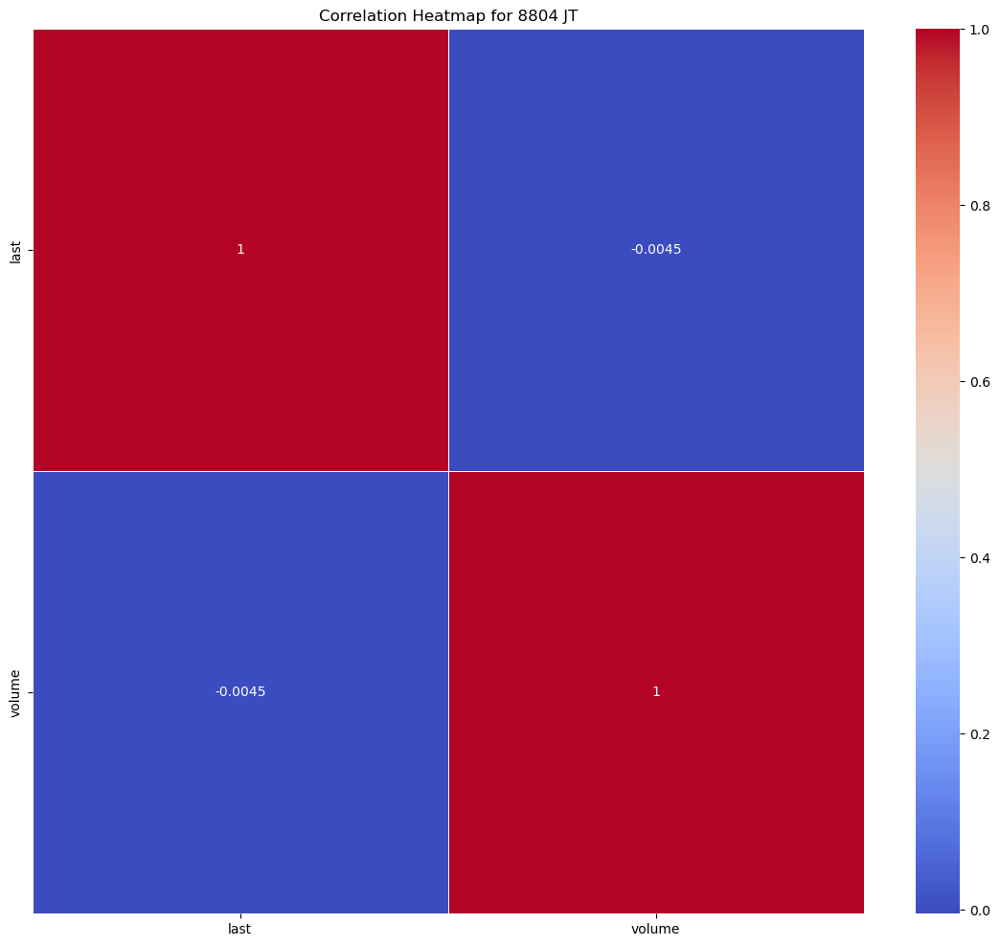

Statistics for stock 8830 JT
---- last ----
Mean: 3627.872628478803
Median: 3775.5157
Mode: 3799.5258
Range: 2757.745
Standard Deviation: 570.657939442583
Skewness: -0.30059924621423356
Kurtosis: -0.8676804181872382


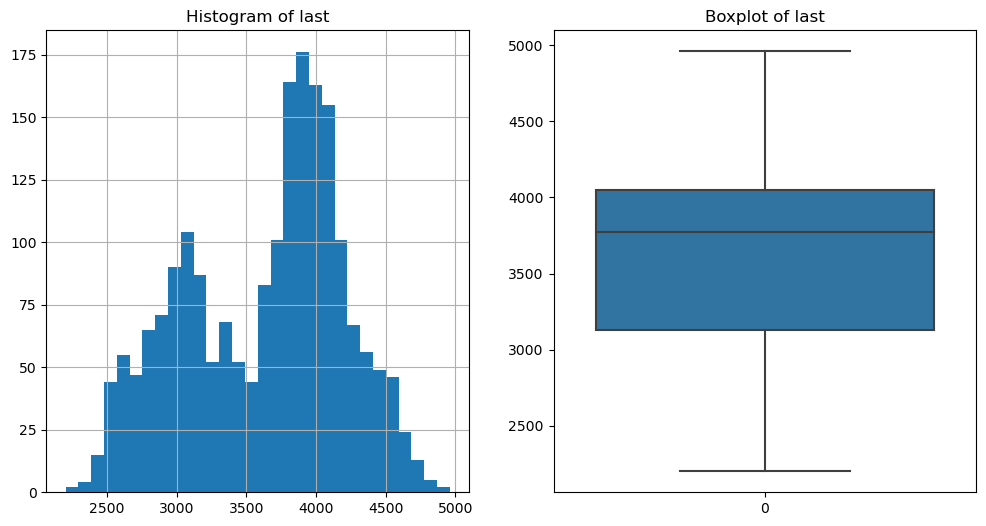

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


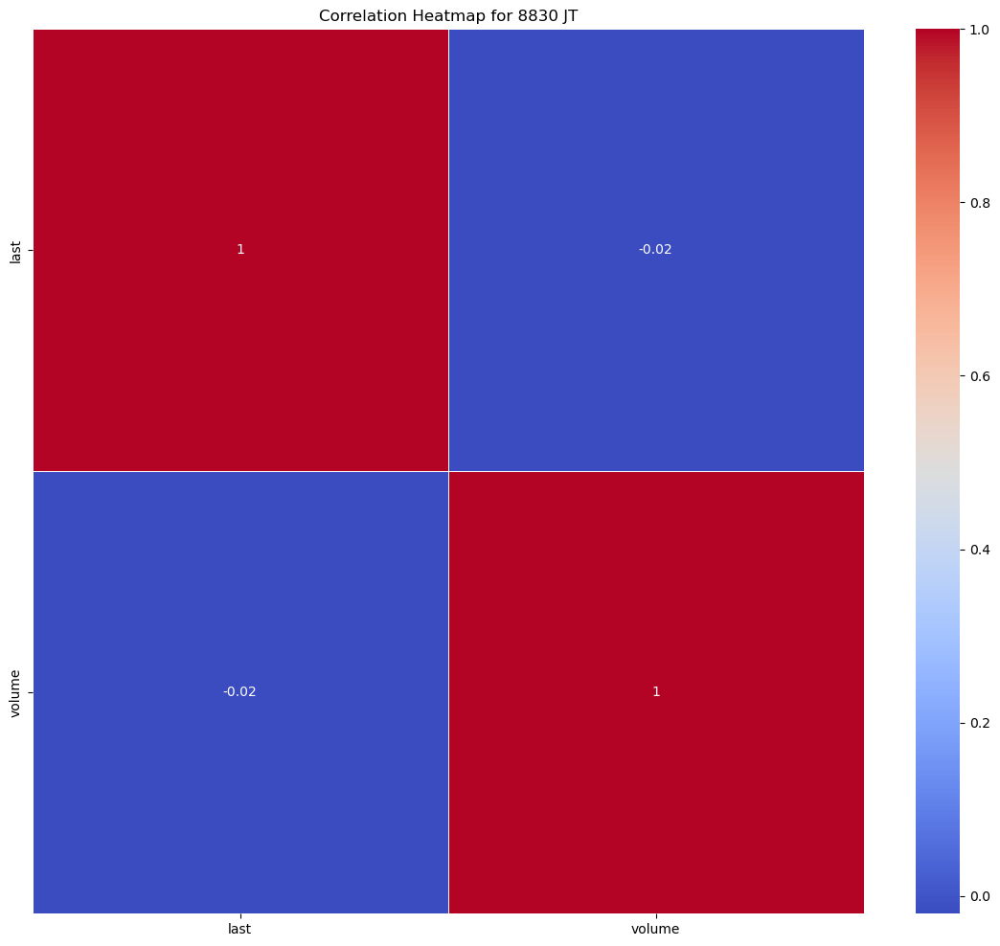

Statistics for stock 9001 JT
---- last ----
Mean: 2879.881262294264
Median: 2801.1901
Mode: 2289.0546
Range: 1959.7786
Standard Deviation: 437.03890264034703
Skewness: 0.553746031155798
Kurtosis: -0.3535467201955016


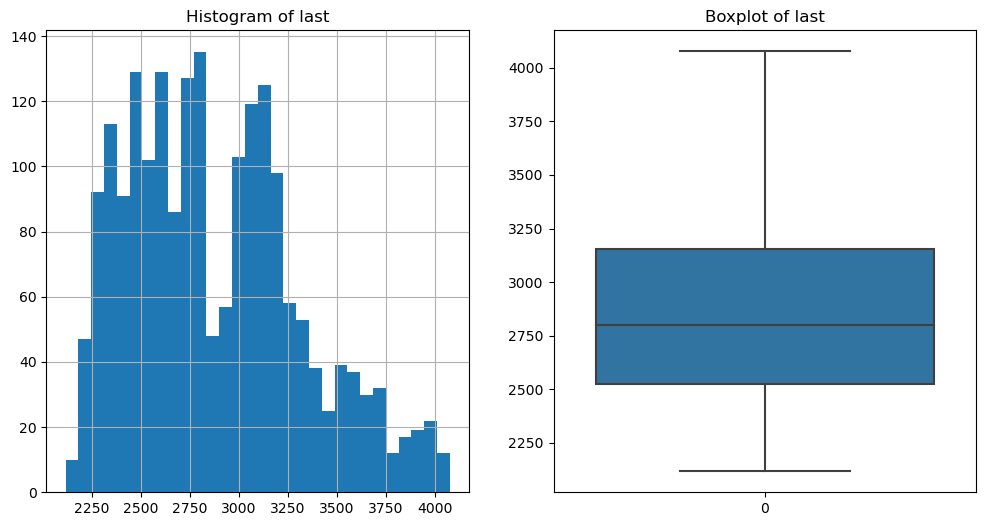

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


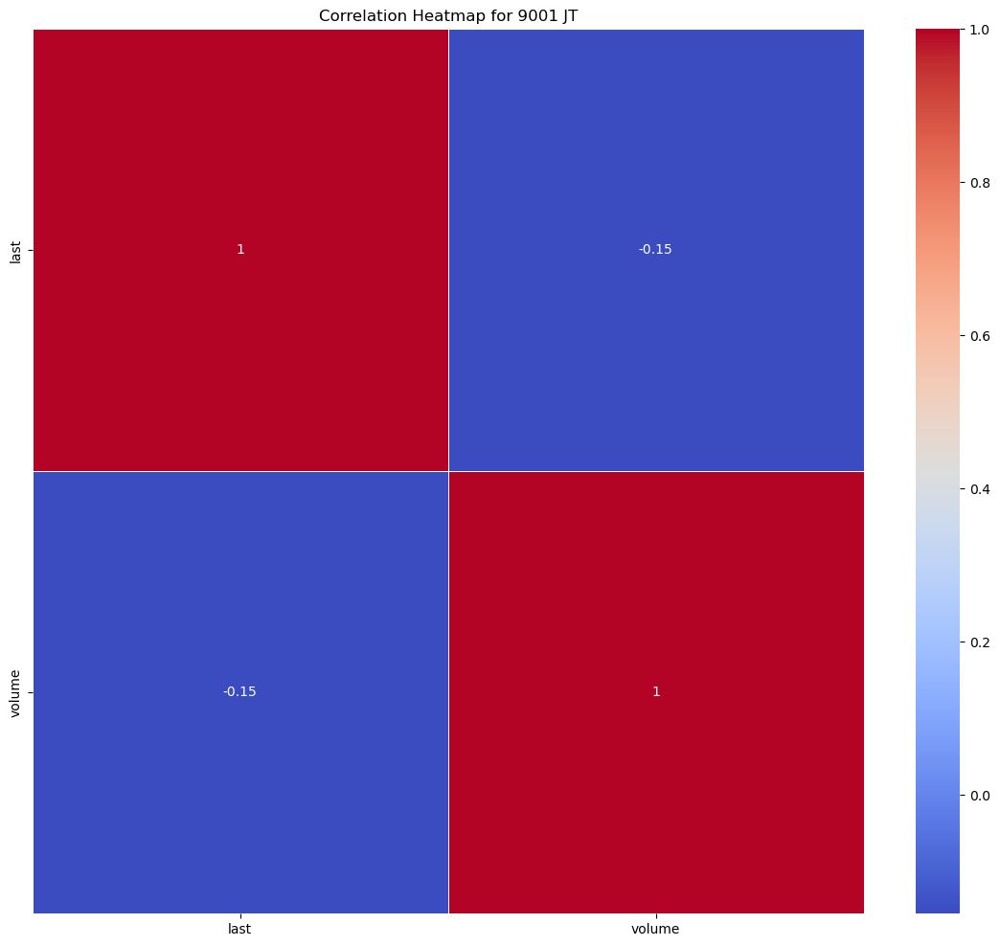

Statistics for stock 9005 JT
---- last ----
Mean: 1569.8411738653367
Median: 1584.0855
Mode: 1578.353
Range: 1286.0411000000001
Standard Deviation: 257.5918204307111
Skewness: -0.18192535244635896
Kurtosis: -0.5865813094011796


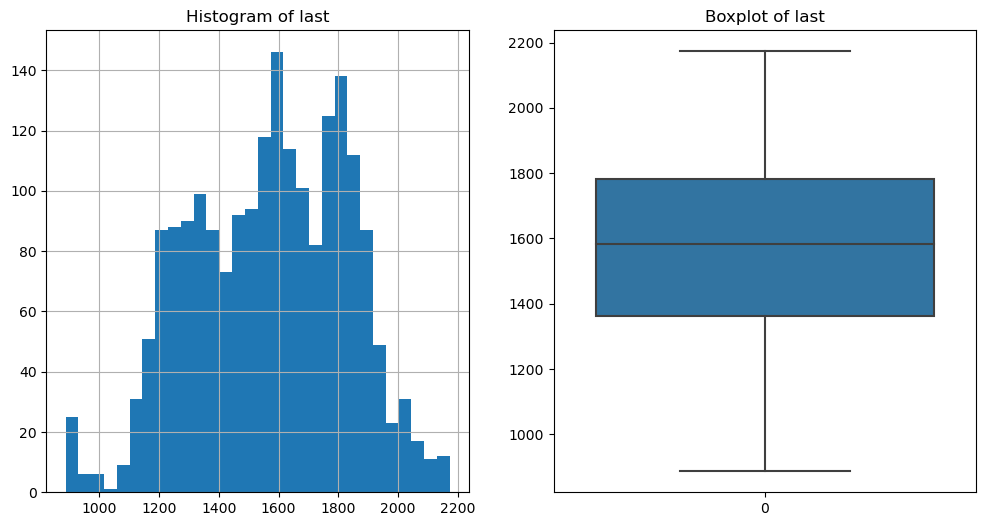

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


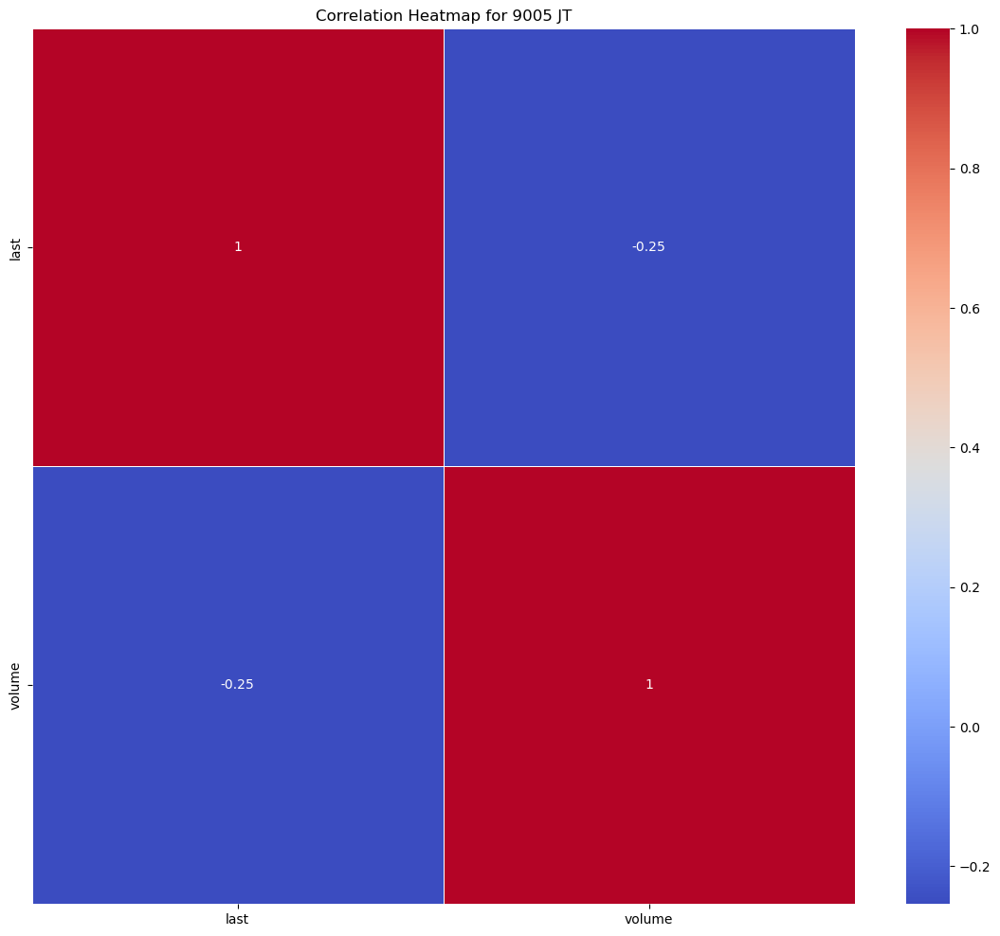

Statistics for stock 9007 JT
---- last ----
Mean: 2264.6109930673315
Median: 2258.7967
Mode: 2084.996
Range: 1871.2513
Standard Deviation: 338.0022015626668
Skewness: 0.5063927625584252
Kurtosis: 0.725556816960863


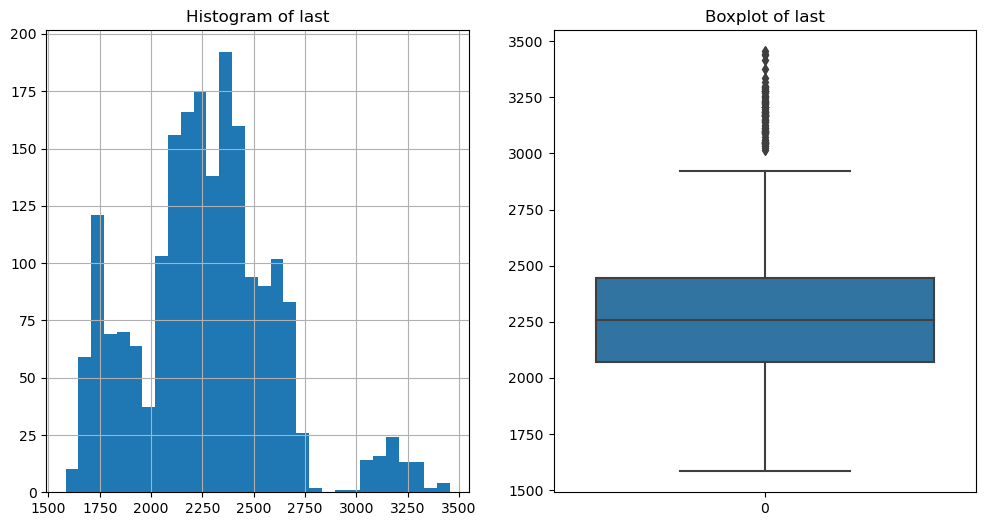

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


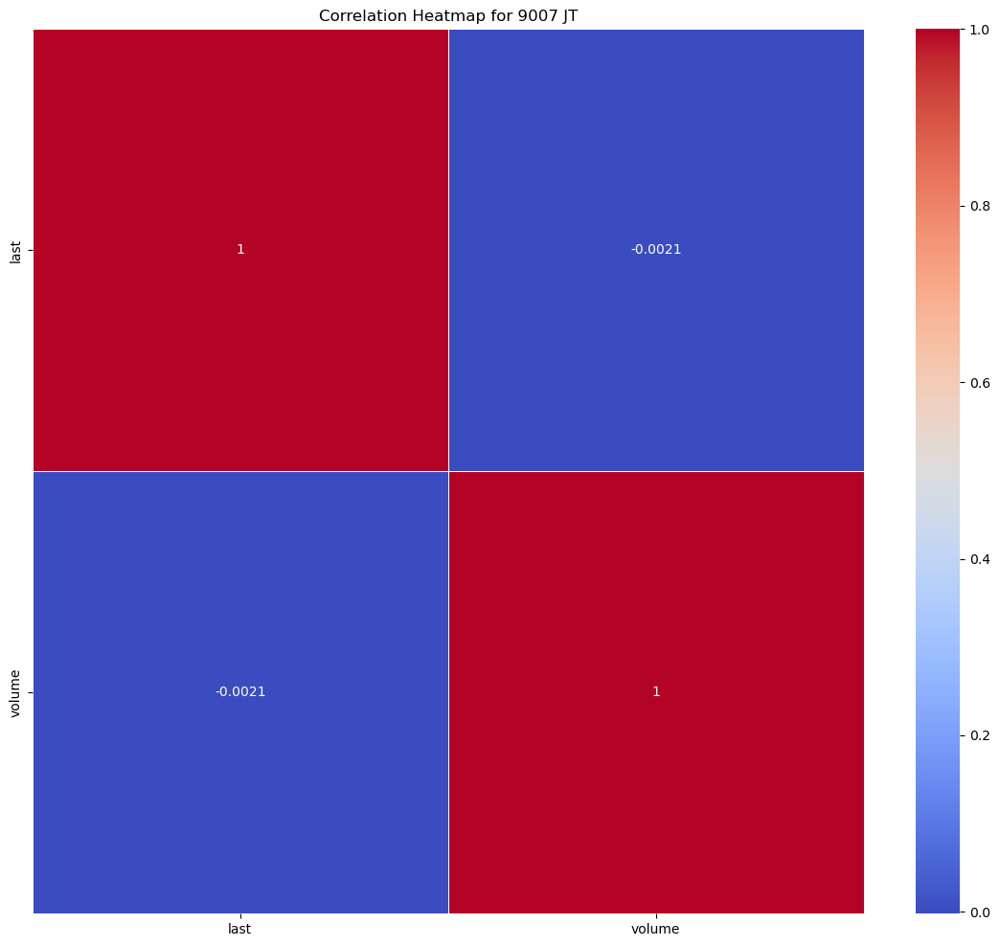

Statistics for stock 9008 JT
---- last ----
Mean: 4949.771118852867
Median: 4629.3673
Mode: 5351.1563
Range: 5852.5963
Standard Deviation: 1279.9666896156007
Skewness: 0.6288851345430575
Kurtosis: -0.35958202120811844


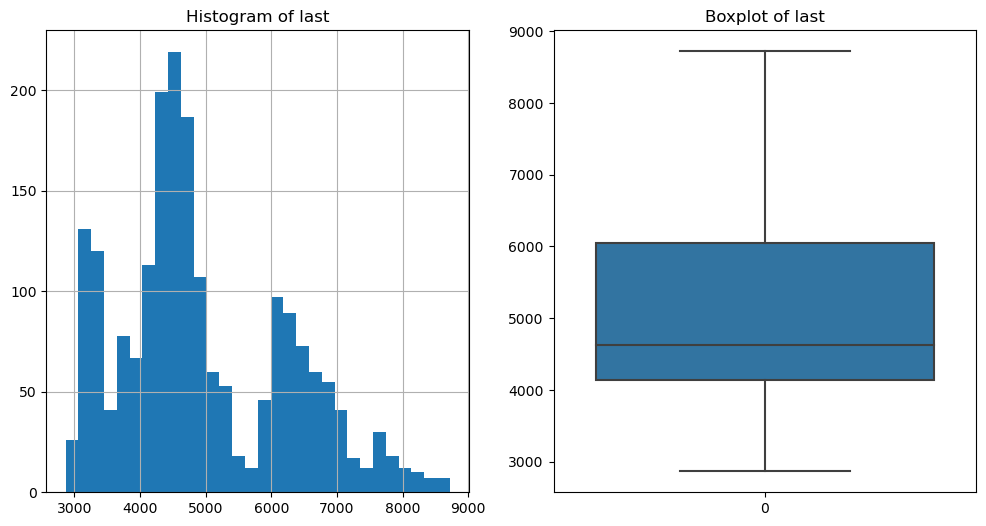

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


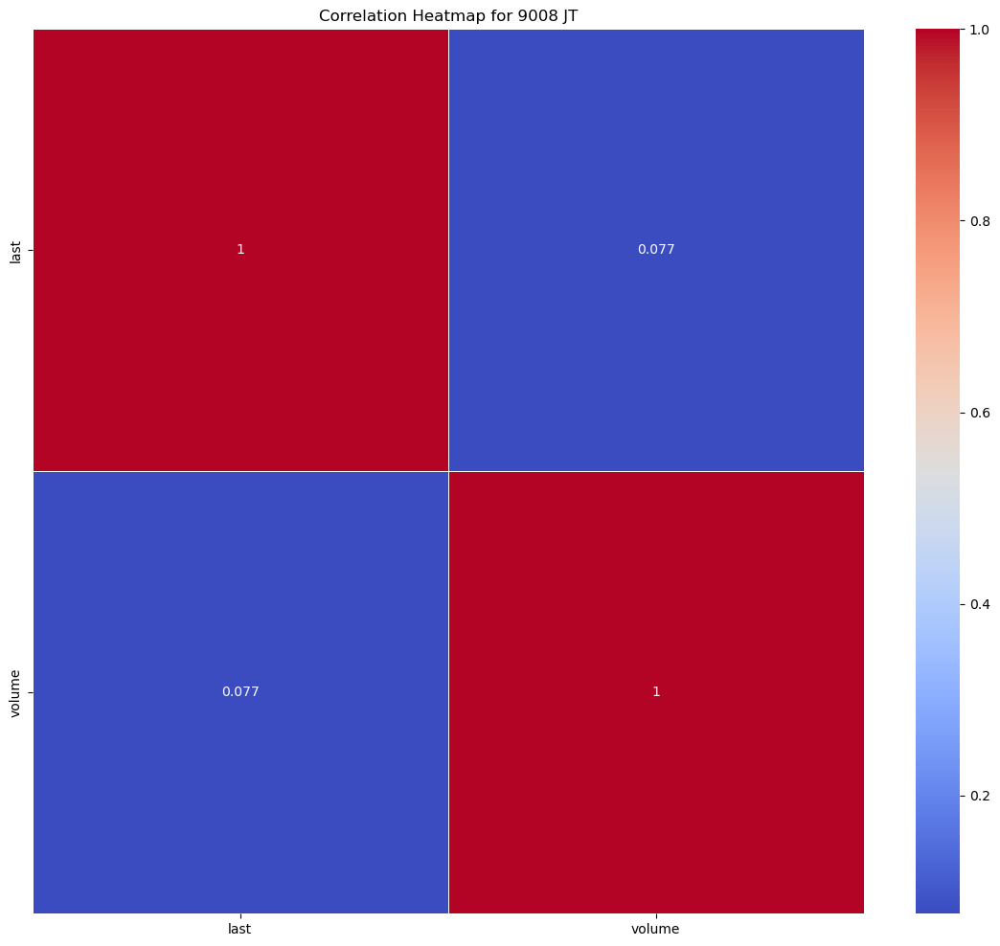

Statistics for stock 9009 JT
---- last ----
Mean: 2940.598477456359
Median: 2959.1055
Mode: 2953.2459
Range: 3173.9182999999994
Standard Deviation: 753.3930514534018
Skewness: -0.038162297312721305
Kurtosis: -0.7828758421067885


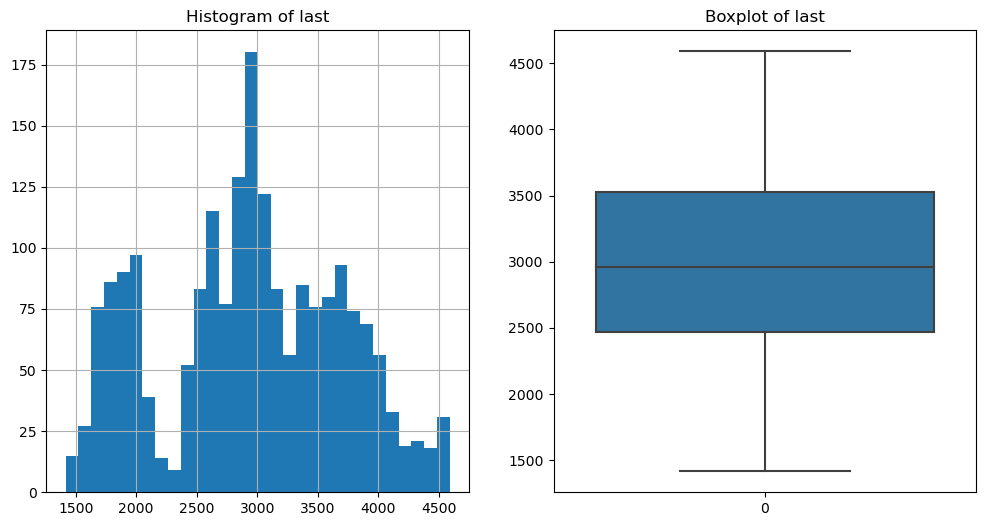

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


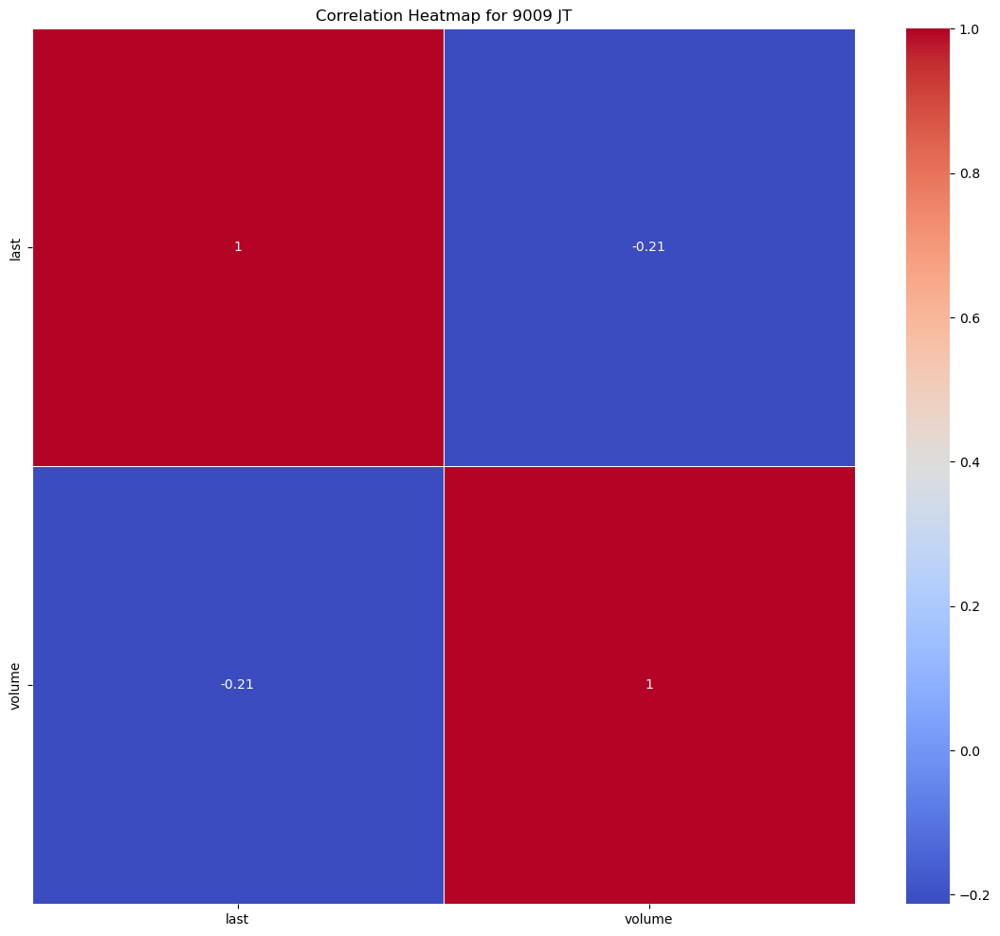

Statistics for stock 9020 JT
---- last ----
Mean: 8810.262389825437
Median: 9291.8619
Mode: 7565.9879
Range: 6602.346399999999
Standard Deviation: 1409.1925927990105
Skewness: -0.4316737635969594
Kurtosis: -0.9091489333312102


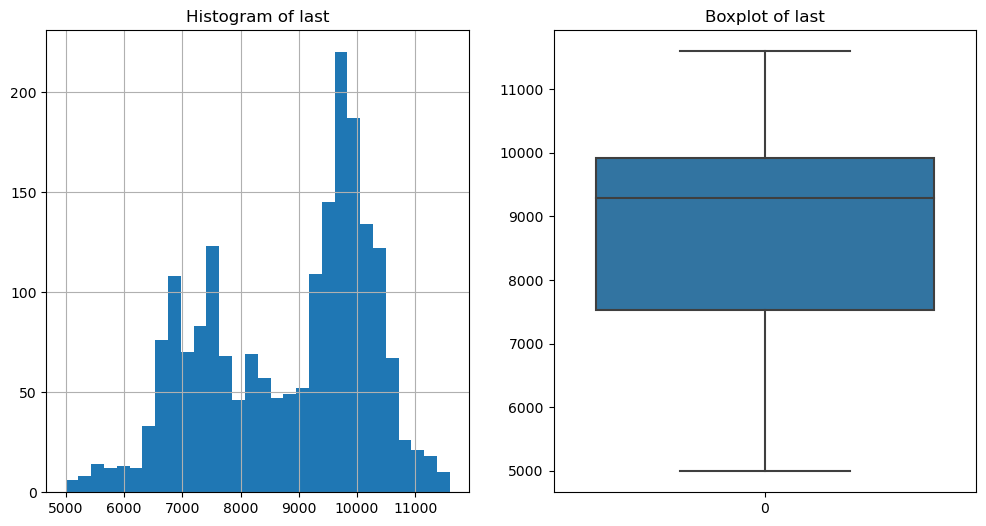

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


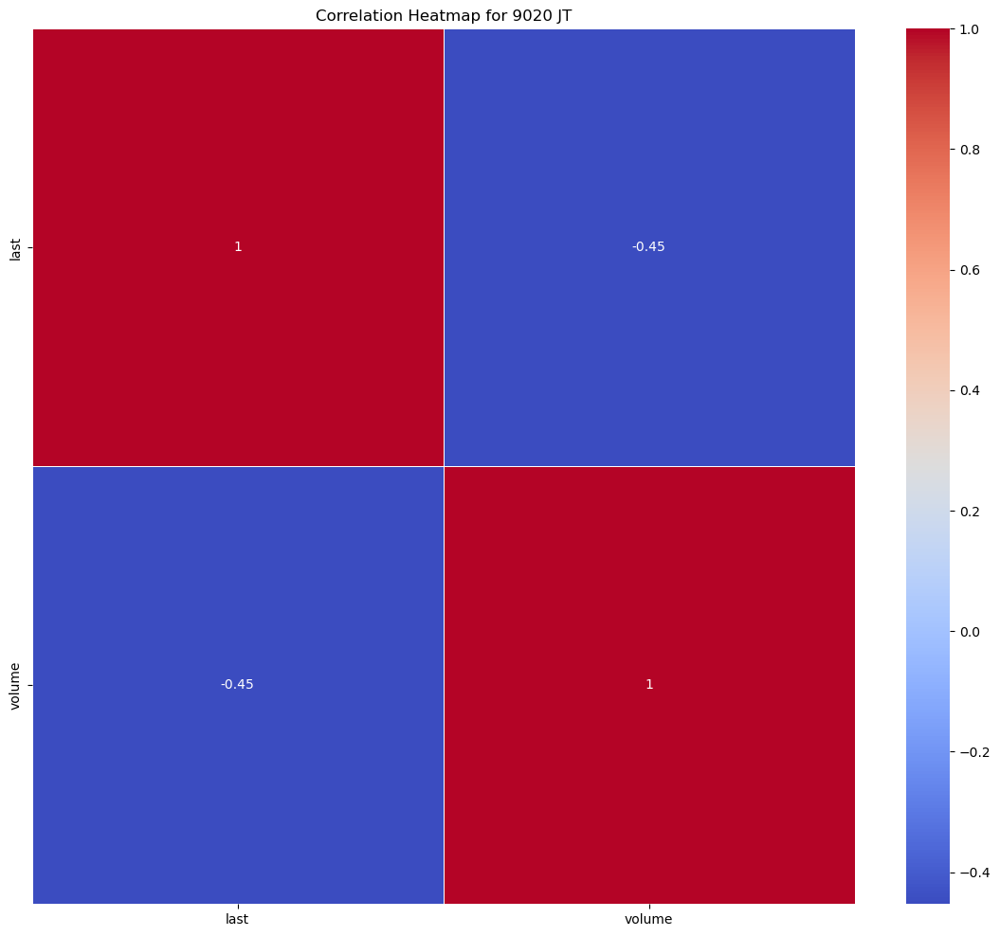

Statistics for stock 9021 JT
---- last ----
Mean: 6231.605563690773
Median: 6597.0645
Mode: 3629.0196
Range: 6840.172699999999
Standard Deviation: 1669.7540320870614
Skewness: -0.22331807768874598
Kurtosis: -0.9262514578812602


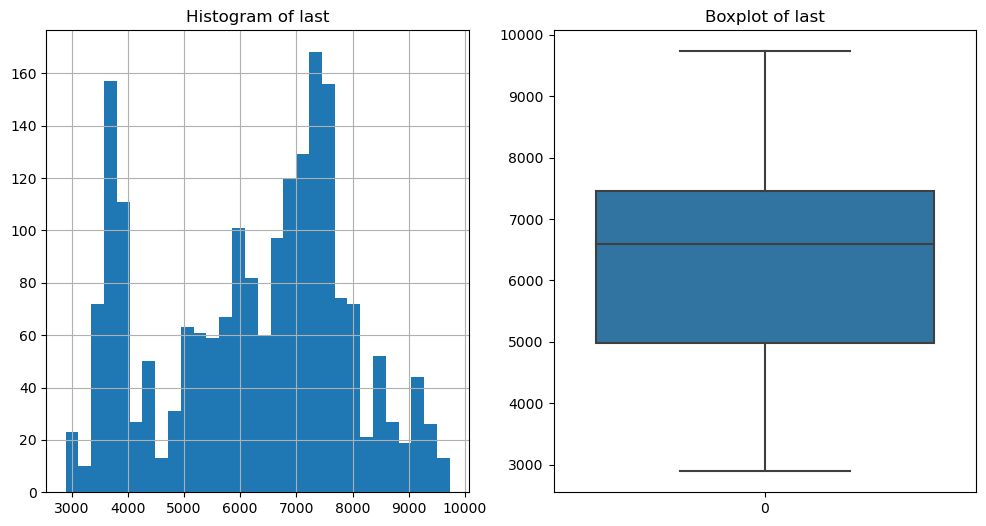

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


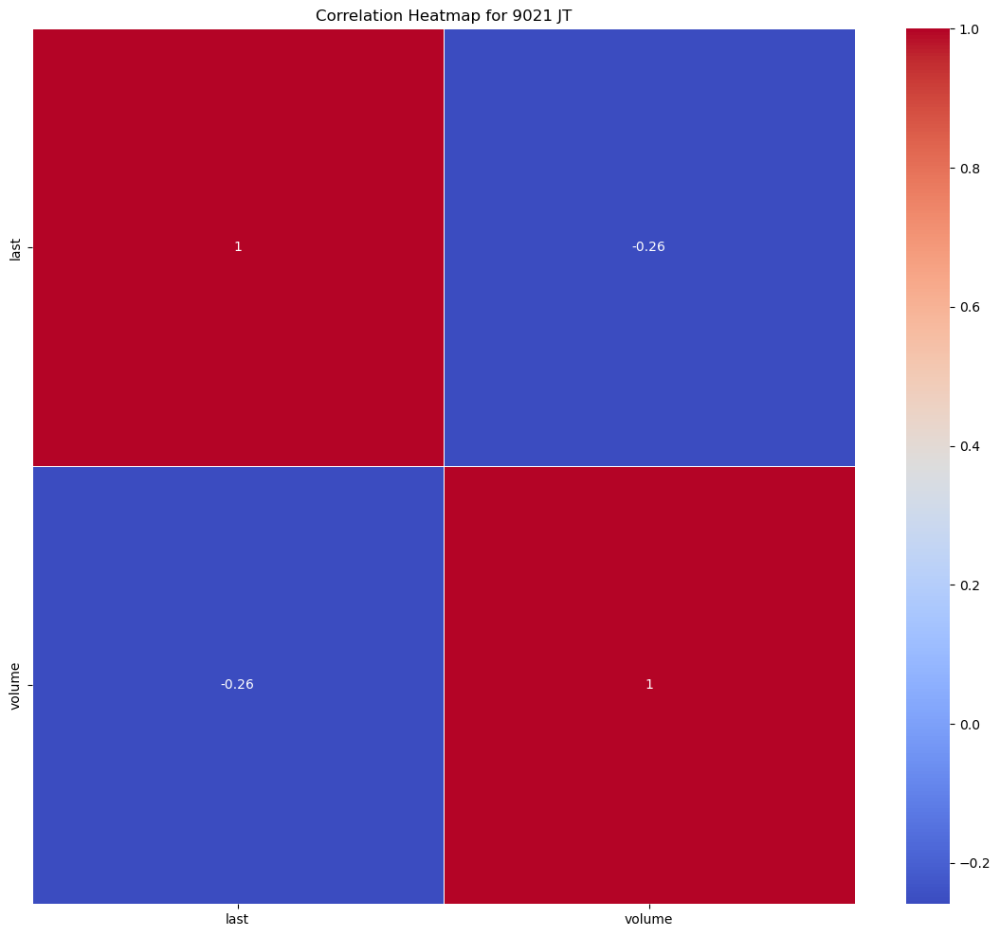

Statistics for stock 9022 JT
---- last ----
Mean: 17706.87646438903
Median: 18207.0223
Mode: 11651.8575
Range: 19230.970800000003
Standard Deviation: 4078.99808528846
Skewness: -0.5372617417671441
Kurtosis: -0.5713345339180229


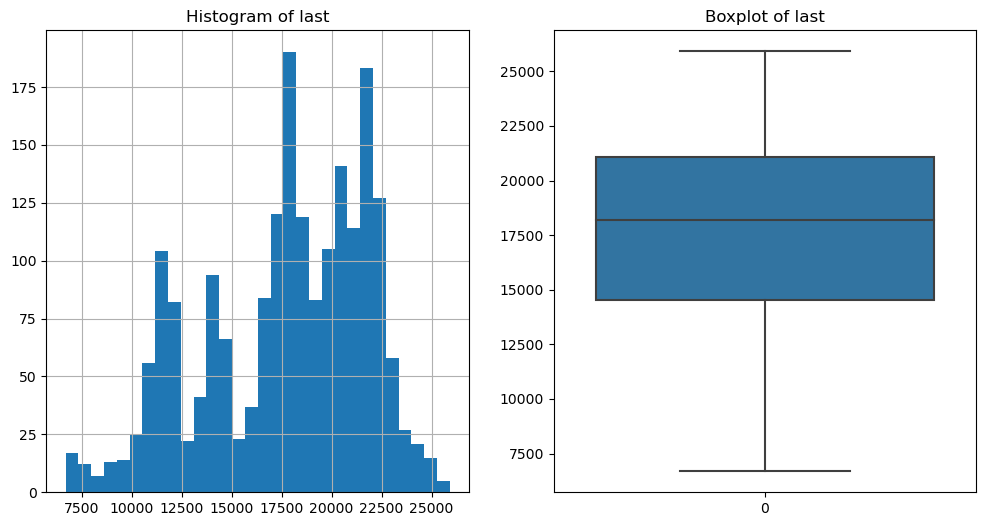

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


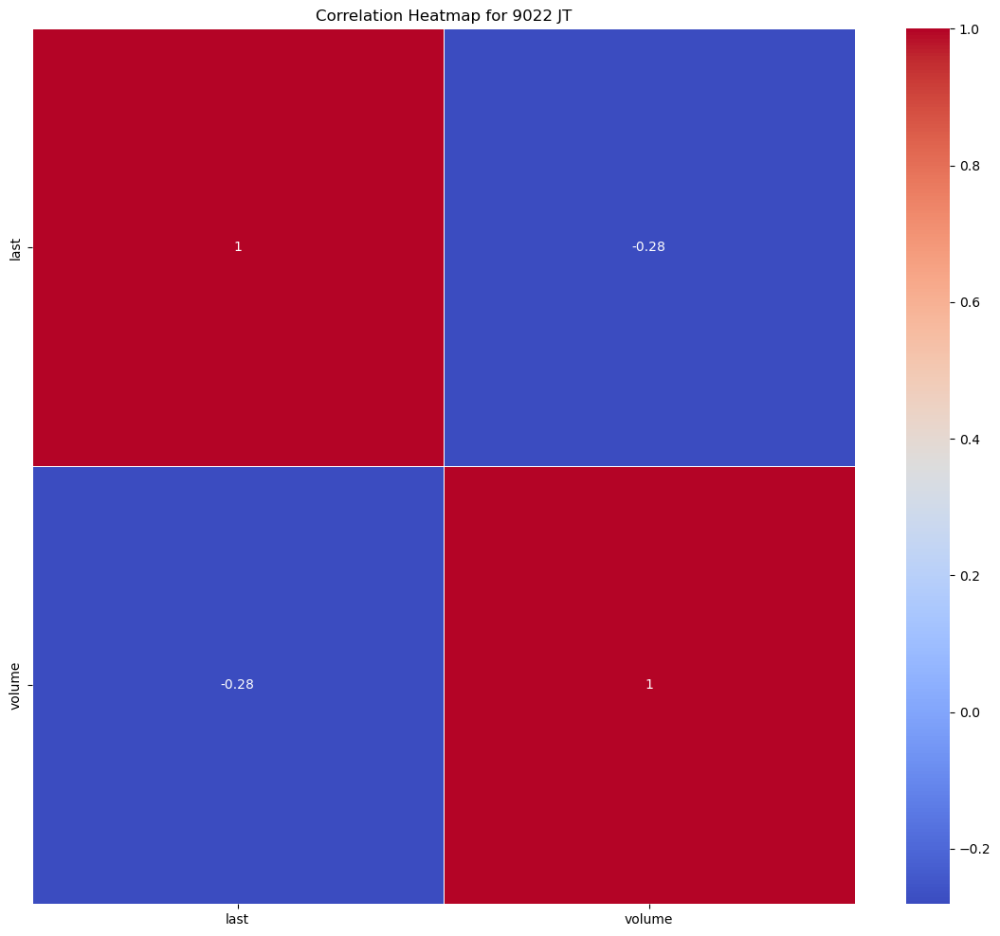

Statistics for stock 9062 JT
---- last ----
Mean: 5476.7947712718205
Median: 5456.0237
Mode: 4226.4135
Range: 5531.3894
Standard Deviation: 1114.773870886442
Skewness: 0.18521887793834707
Kurtosis: -0.7184321596825143


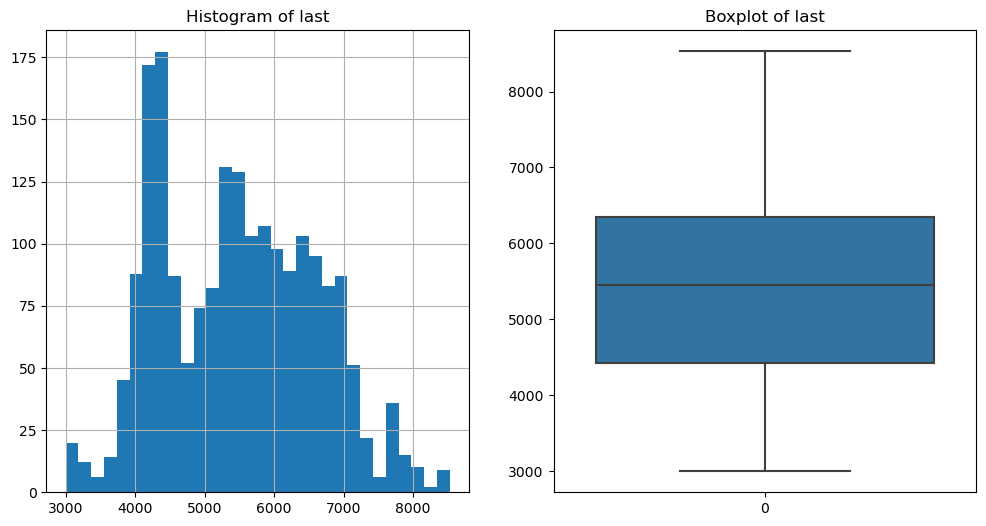

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


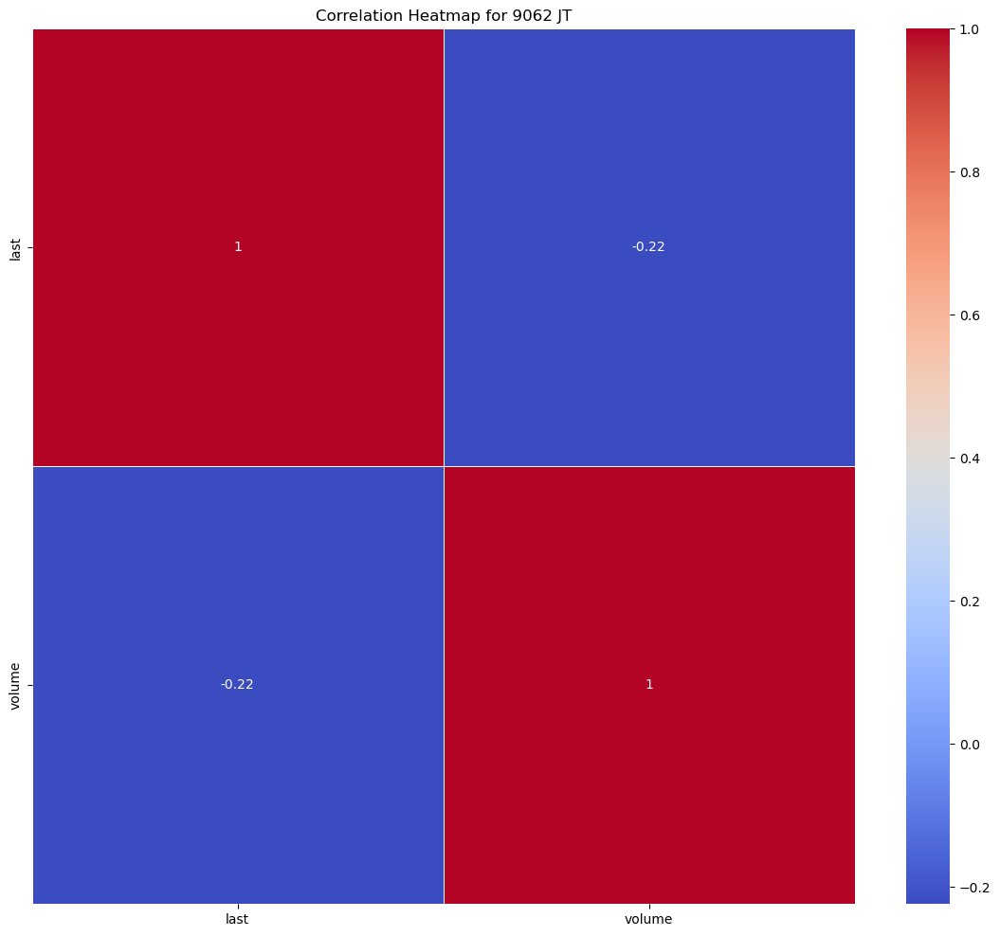

Statistics for stock 9064 JT
---- last ----
Mean: 2262.18535117207
Median: 2213.6667
Mode: 1880.1159
Range: 2169.6531999999997
Standard Deviation: 411.50663805324785
Skewness: 0.35218569145199907
Kurtosis: -0.04895623433781049


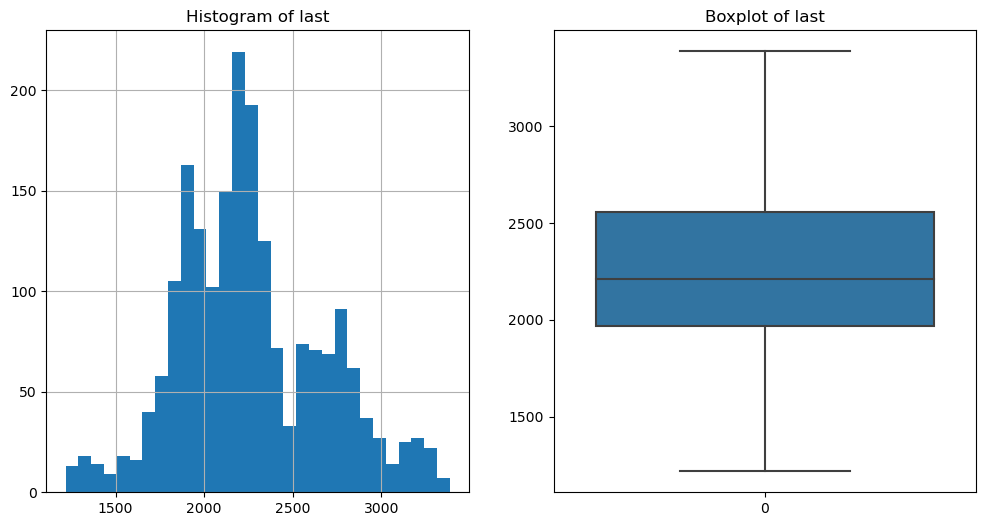

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


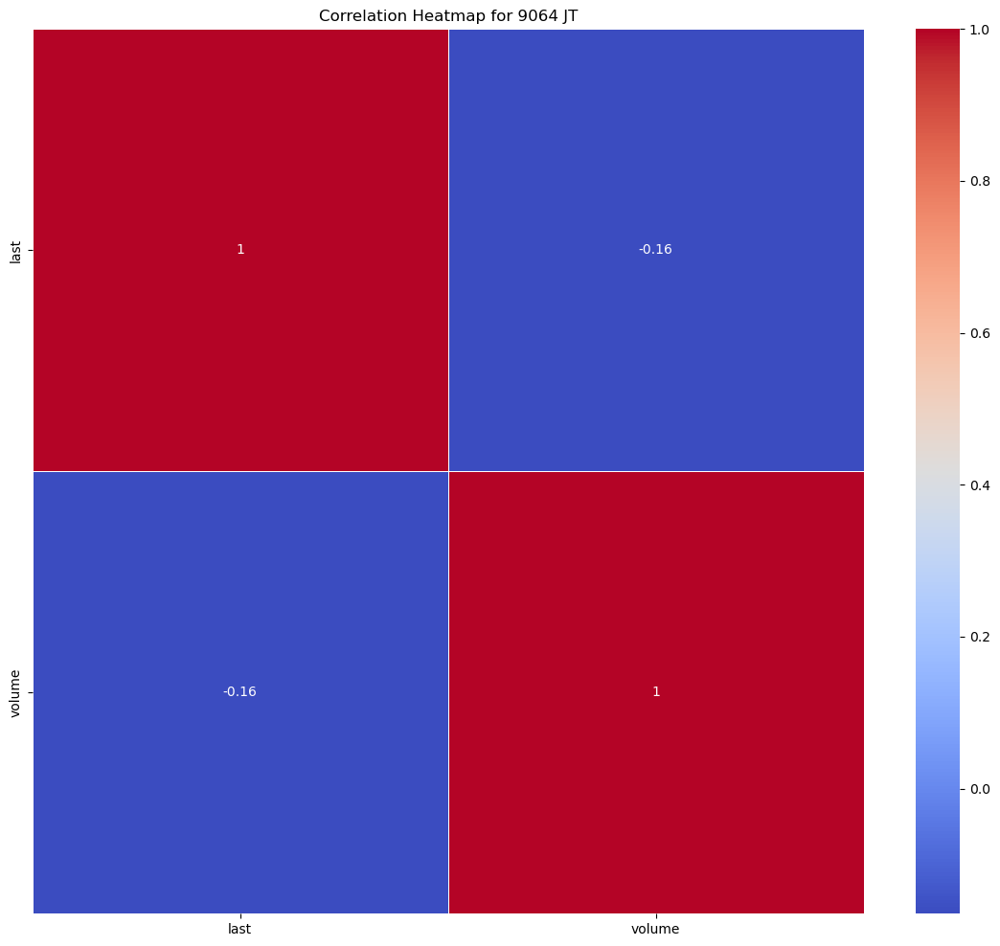

Statistics for stock 9101 JT
---- last ----
Mean: 2257.122931720698
Median: 2151.6579
Mode: 1907.3648
Range: 2826.4572
Standard Deviation: 526.2147295640096
Skewness: 0.4045380554438074
Kurtosis: -0.6819461771675446


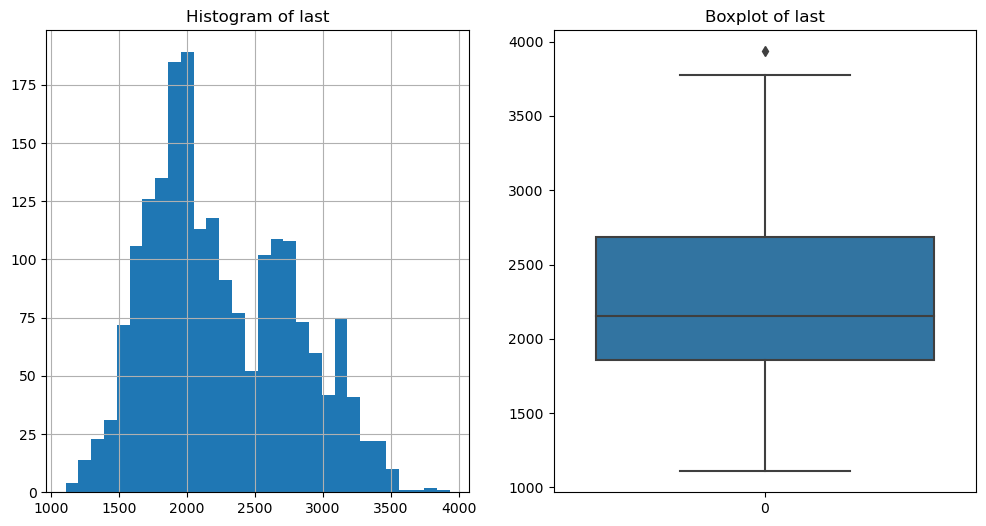

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


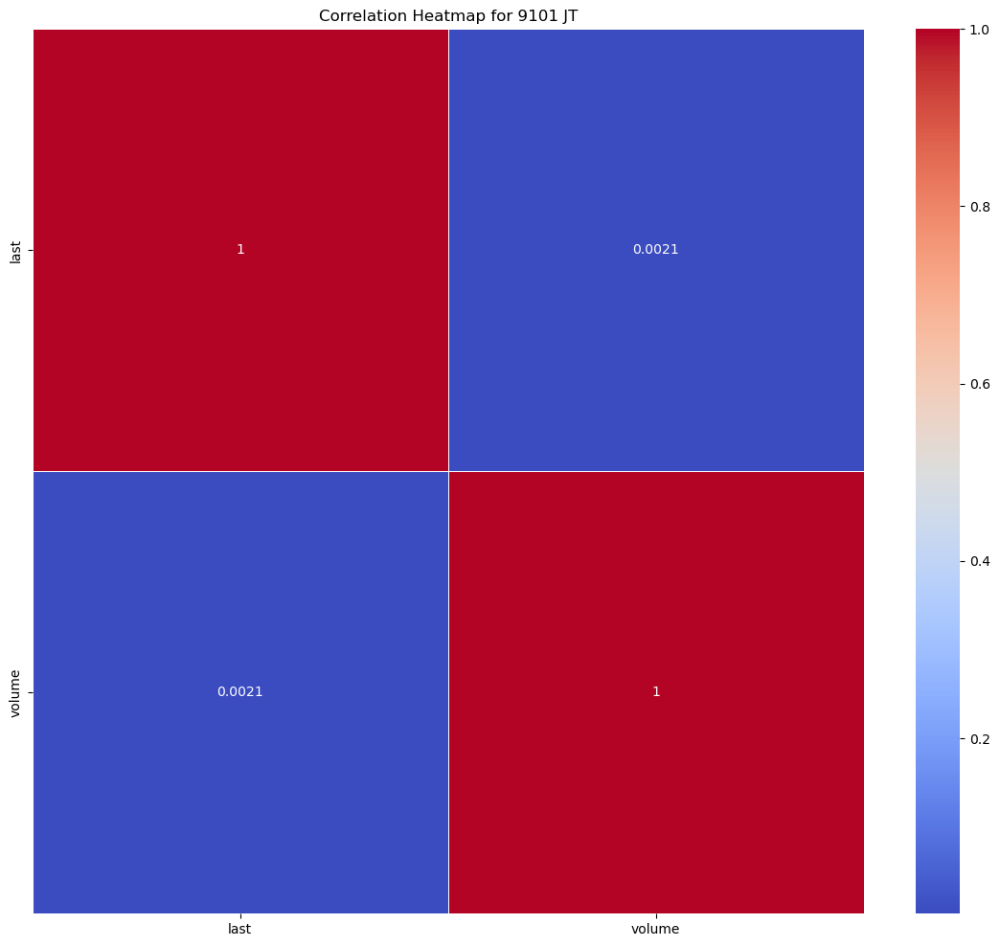

Statistics for stock 9104 JT
---- last ----
Mean: 2947.6256416957604
Median: 3004.3278
Mode: 3173.851
Range: 2756.1101
Standard Deviation: 595.0615514612888
Skewness: -0.1281983334477235
Kurtosis: -0.7919950321982152


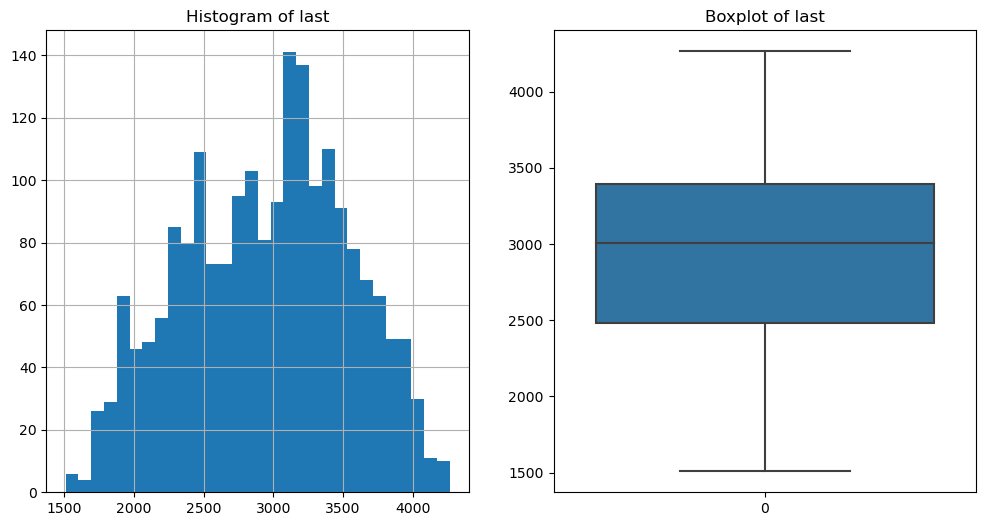

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


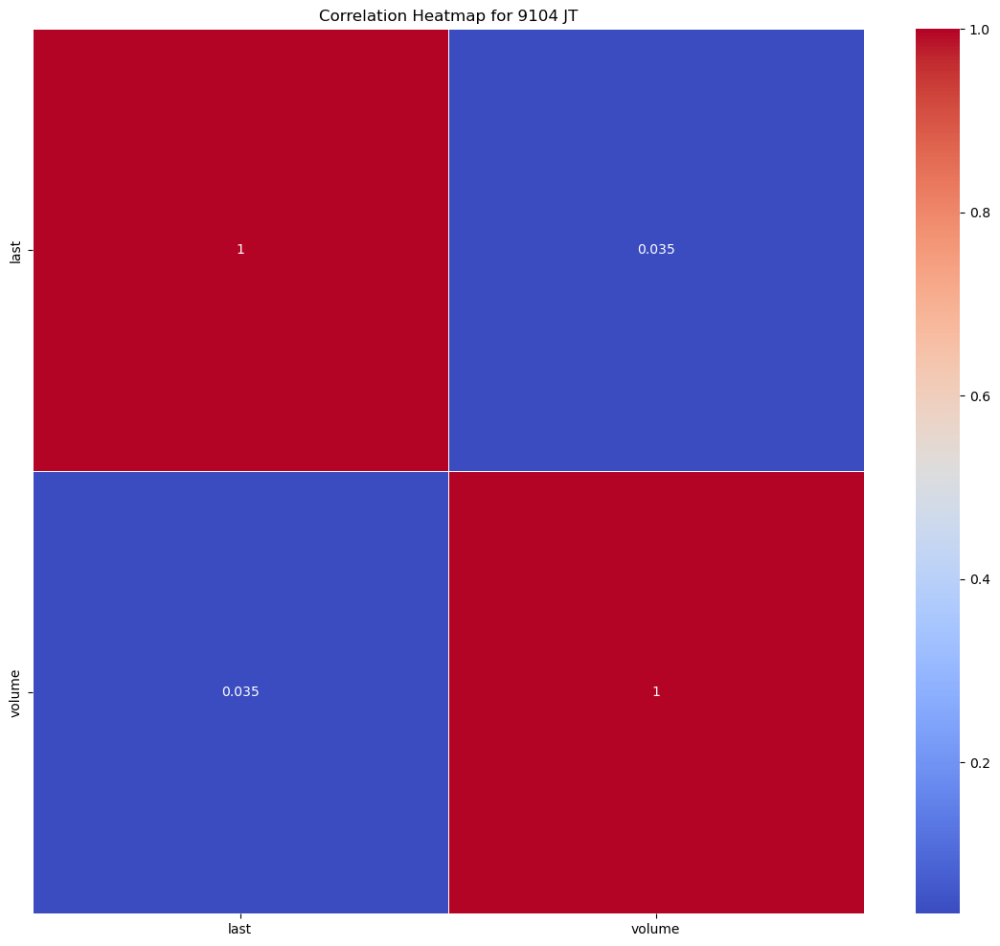

Statistics for stock 9107 JT
---- last ----
Mean: 2164.906390573566
Median: 2163.4541
Mode: 2810.0
Range: 2774.9464
Standard Deviation: 615.8940277823301
Skewness: -0.19370040772691766
Kurtosis: -0.8506156899326269


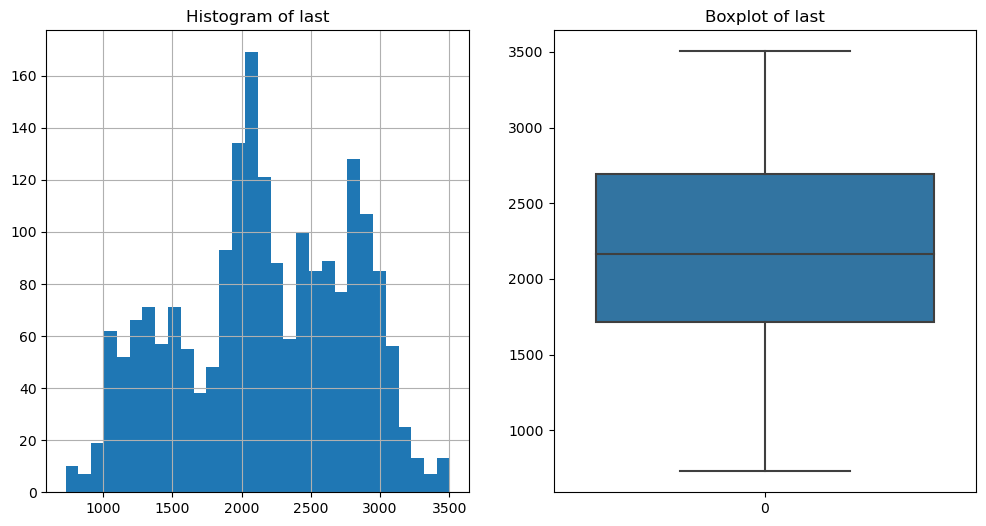

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


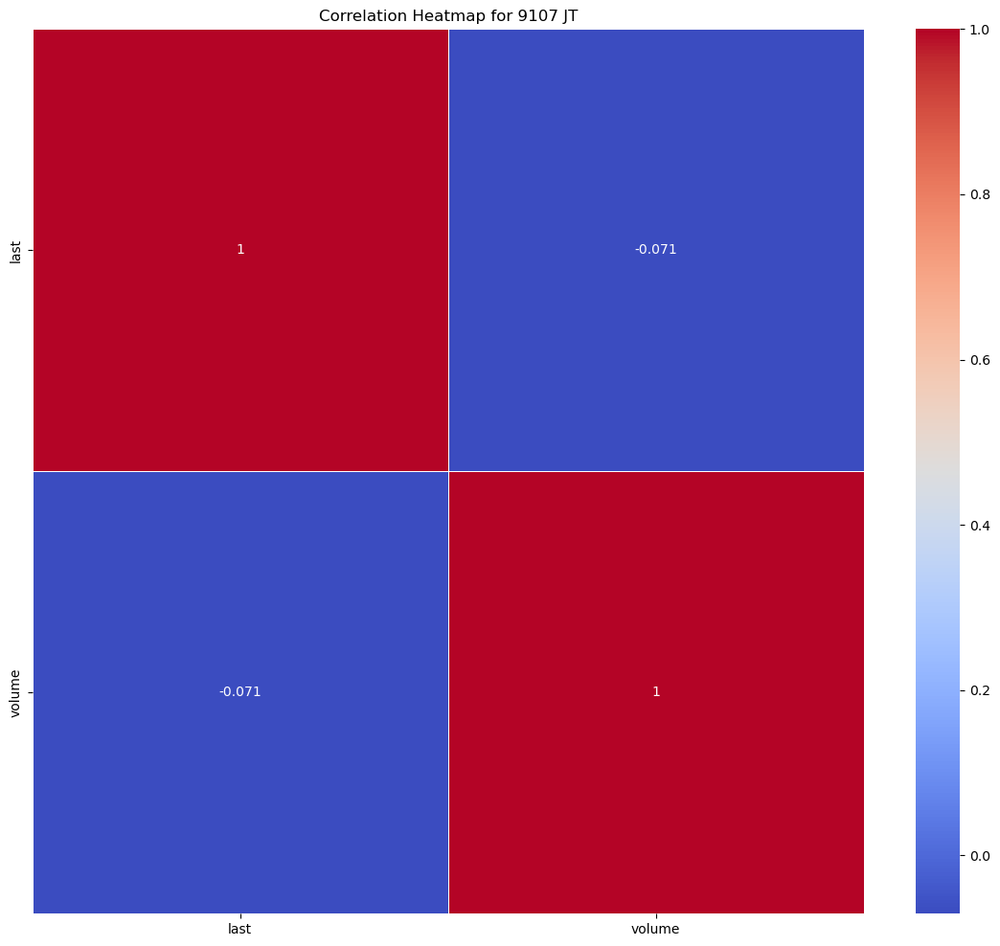

Statistics for stock 9202 JT
---- last ----
Mean: 3023.349068329177
Median: 3051.596
Mode: 1879.8873
Range: 3013.8014000000003
Standard Deviation: 766.7757578989582
Skewness: 0.005488698030867165
Kurtosis: -1.1248936376448668


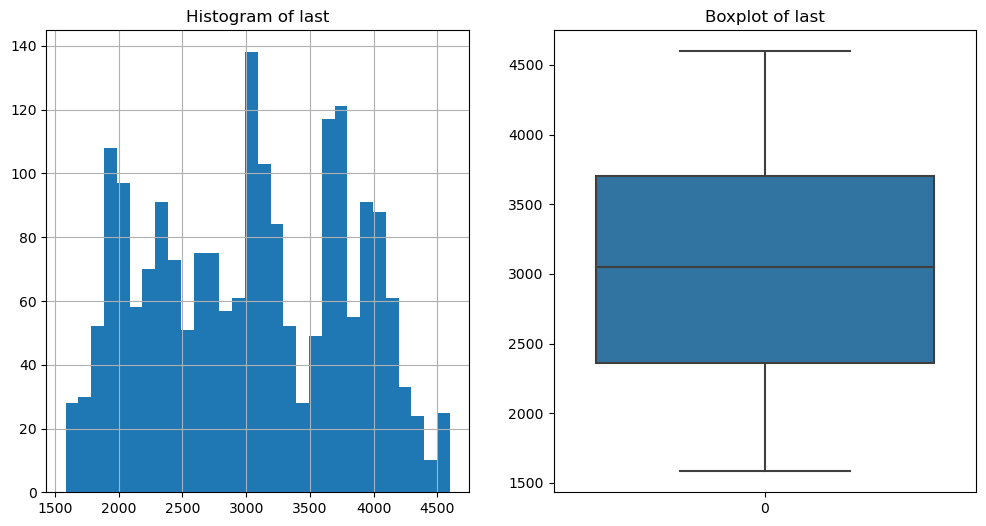

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


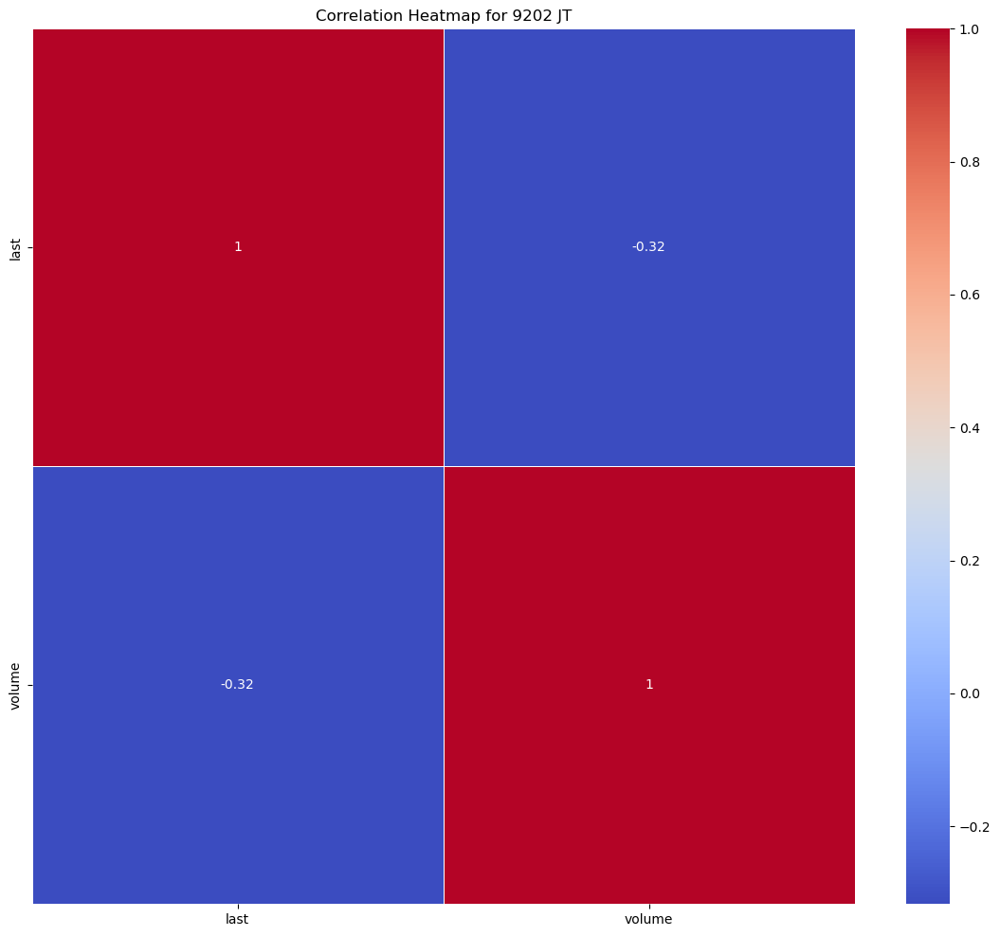

Statistics for stock 9301 JT
---- last ----
Mean: 2792.1467149127184
Median: 2771.9398
Mode: 3100.0
Range: 1987.2317999999998
Standard Deviation: 303.67952710335646
Skewness: 0.15346286628291897
Kurtosis: 0.11603844813139474


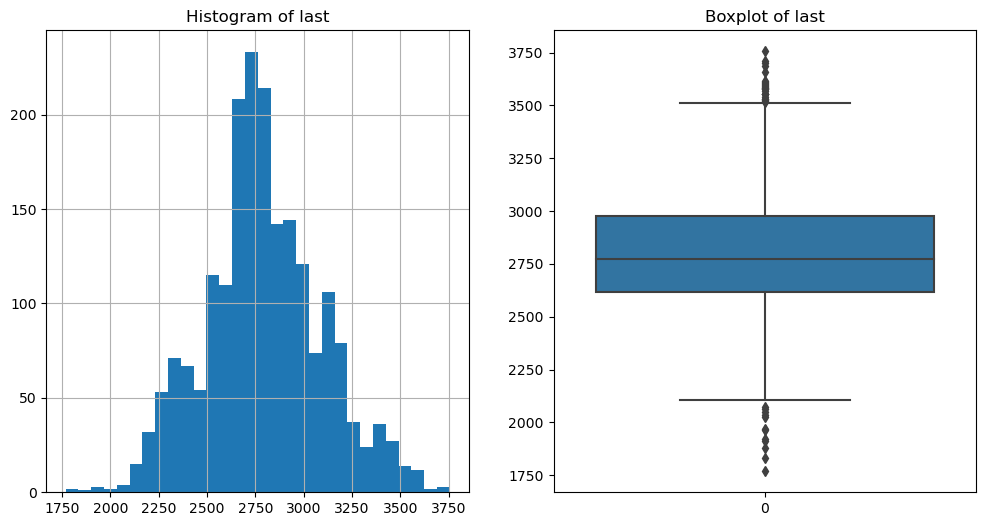

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


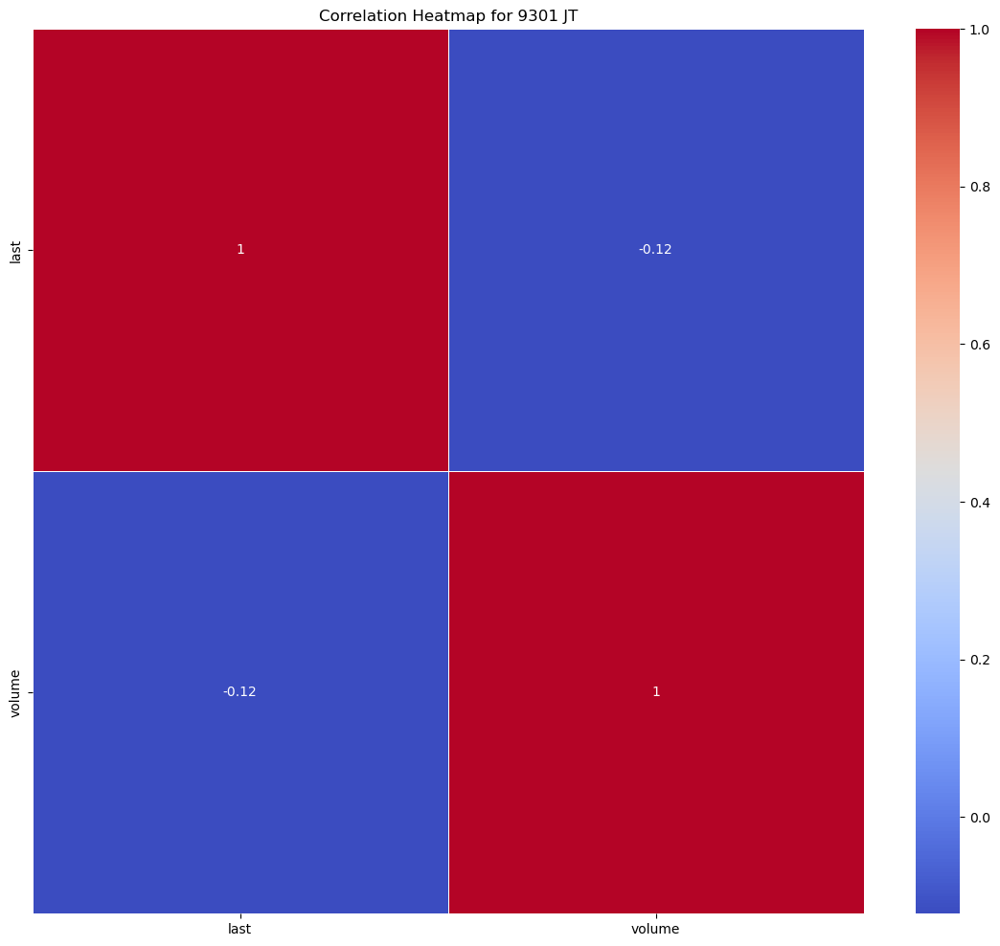

Statistics for stock 9412 JT
---- last ----
Mean: 455.78265730673314
Median: 445.3959
Mode: 394.6391
Range: 371.67729999999995
Standard Deviation: 62.04478795051649
Skewness: 0.688206621521585
Kurtosis: 0.5511509205048135


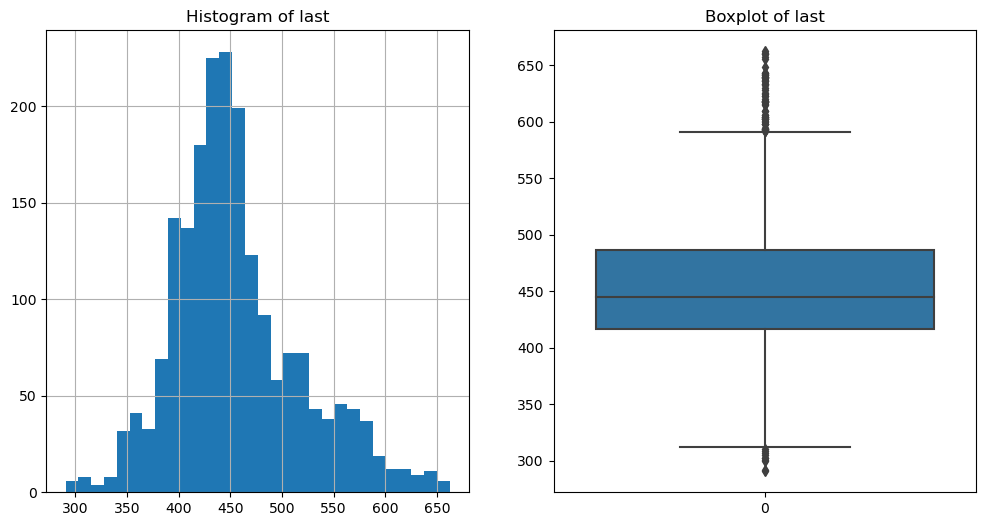

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


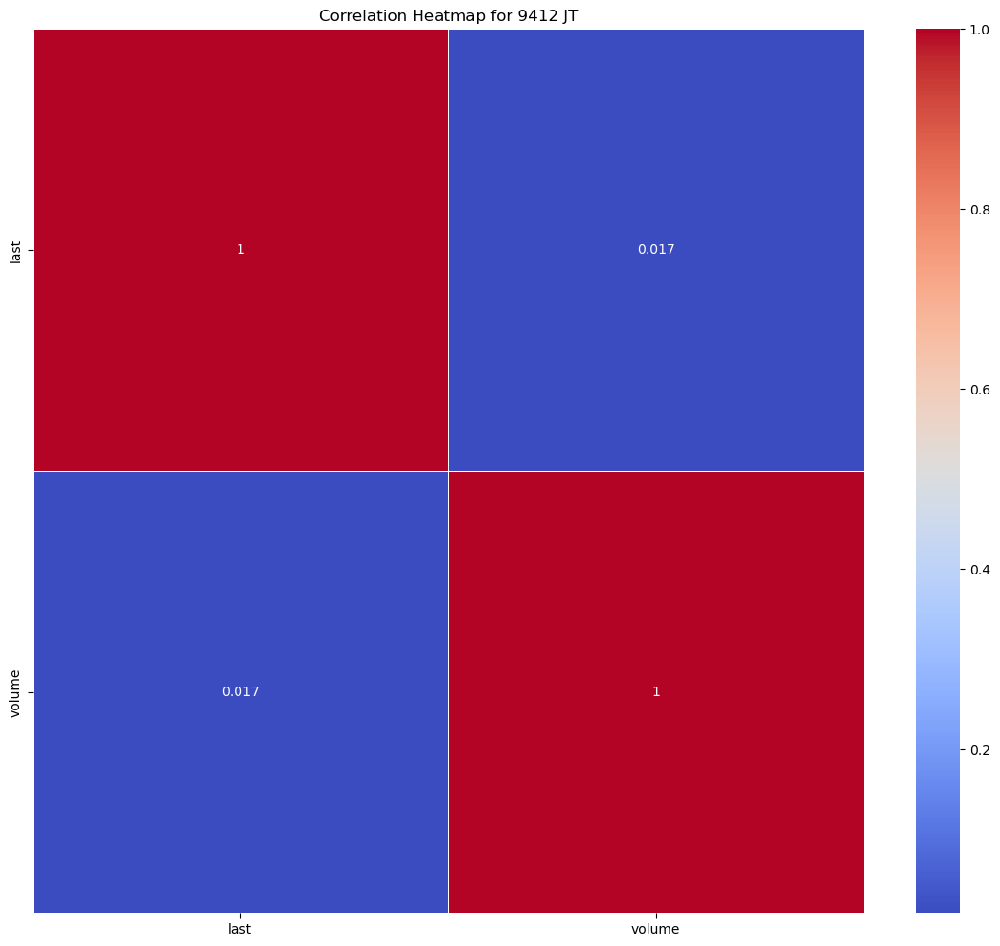

Statistics for stock 9432 JT
---- last ----
Mean: 1957.7142287780548
Median: 2126.6456
Mode: 1016.6552
Range: 2217.828
Standard Deviation: 547.4310078643042
Skewness: -0.6703117311305937
Kurtosis: -0.7569571613283586


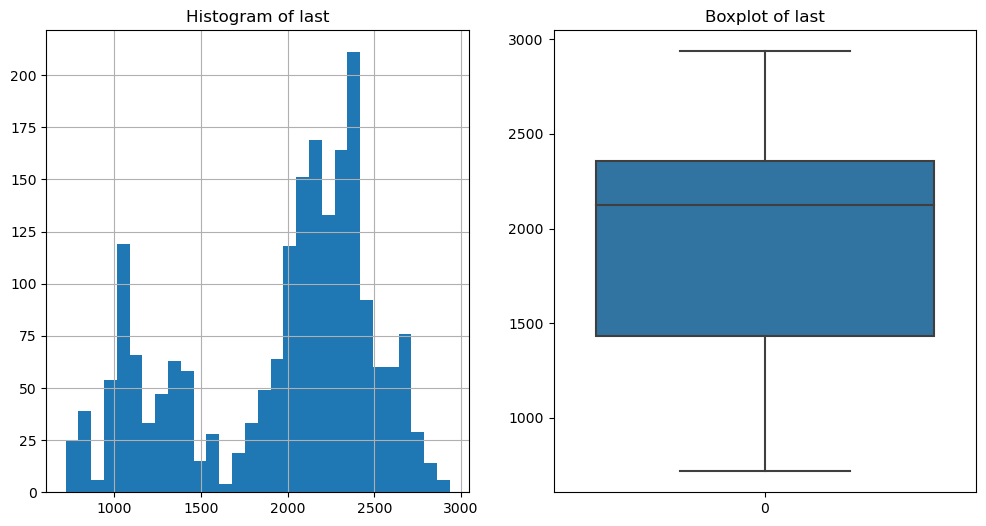

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


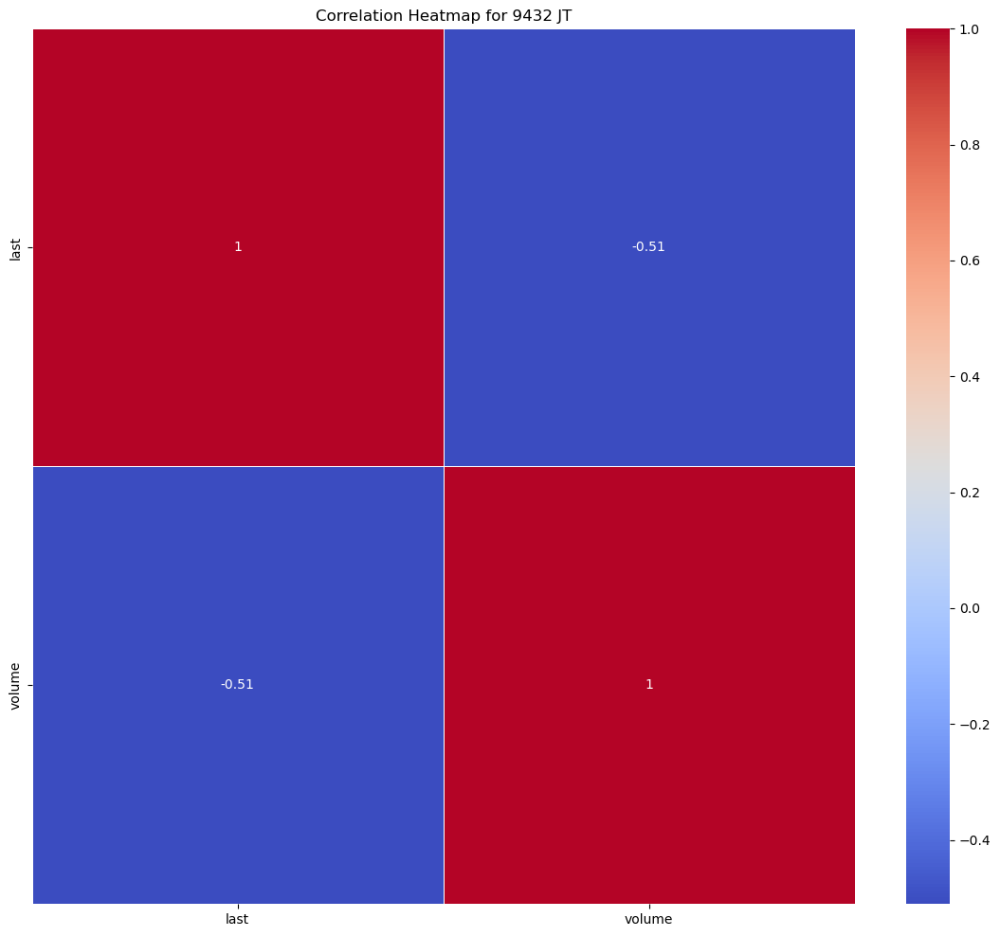

Statistics for stock 9433 JT
---- last ----
Mean: 2386.41168563591
Median: 2562.3565
Mode: 1353.3635
Range: 2766.0233
Standard Deviation: 589.0454056889479
Skewness: -0.8307303085938907
Kurtosis: -0.023645754765662996


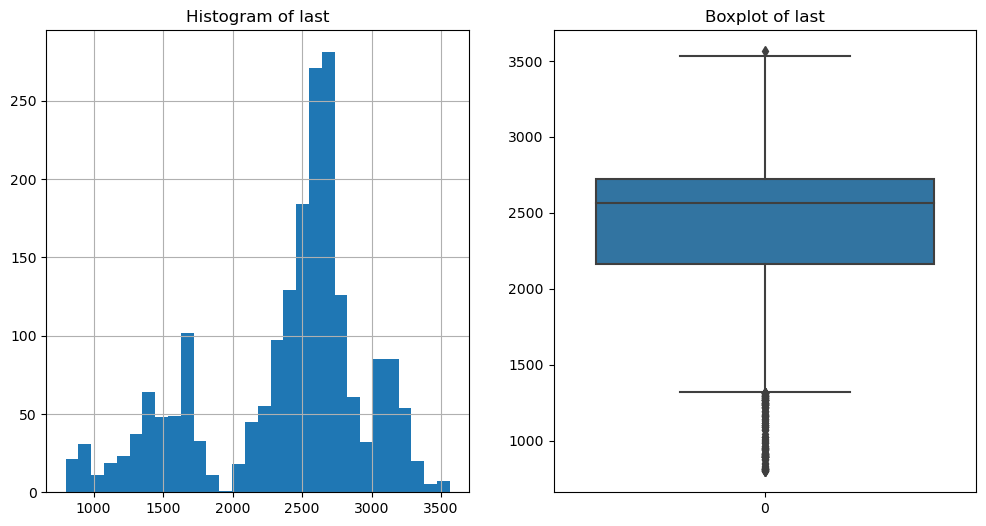

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


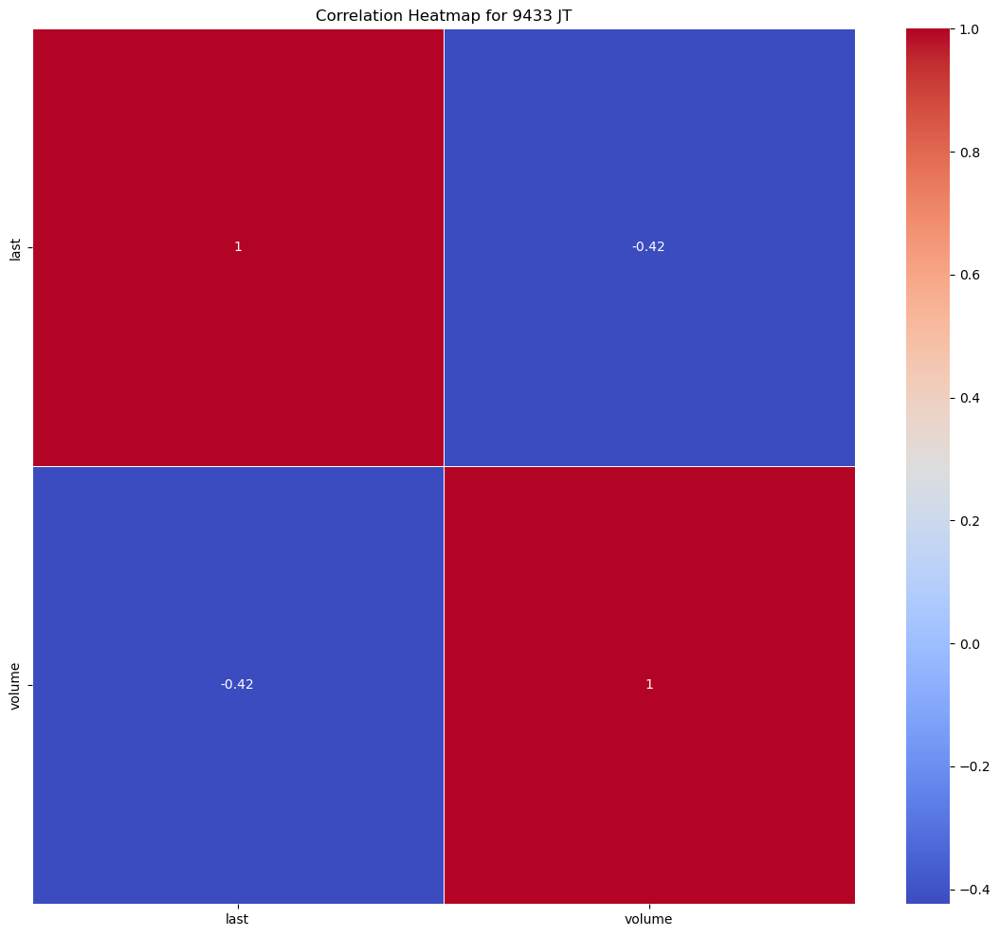

Statistics for stock 9437 JT
---- last ----
Mean: 2189.839727630923
Median: 2281.7327
Mode: 3875.0
Range: 2964.0989
Standard Deviation: 694.7308996052767
Skewness: 0.37599213526329517
Kurtosis: 0.08059075646654357


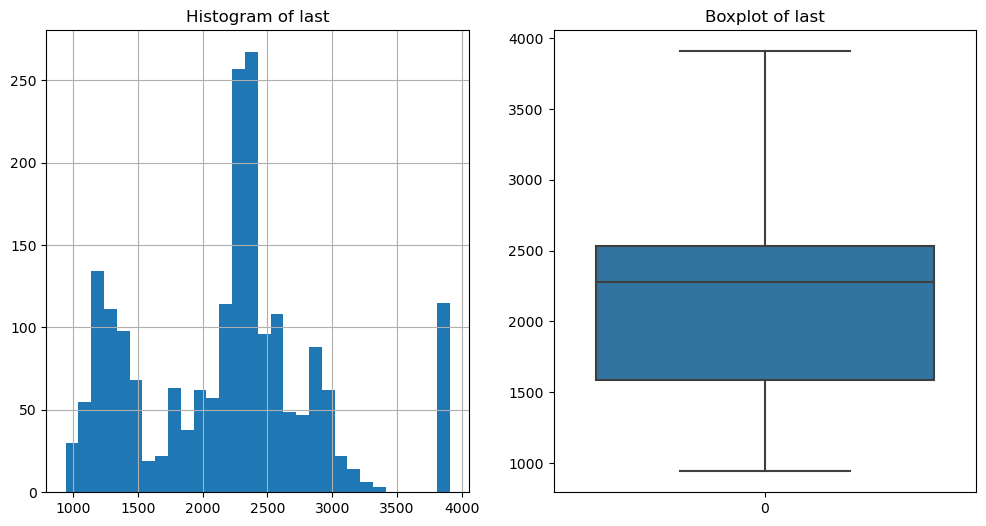

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


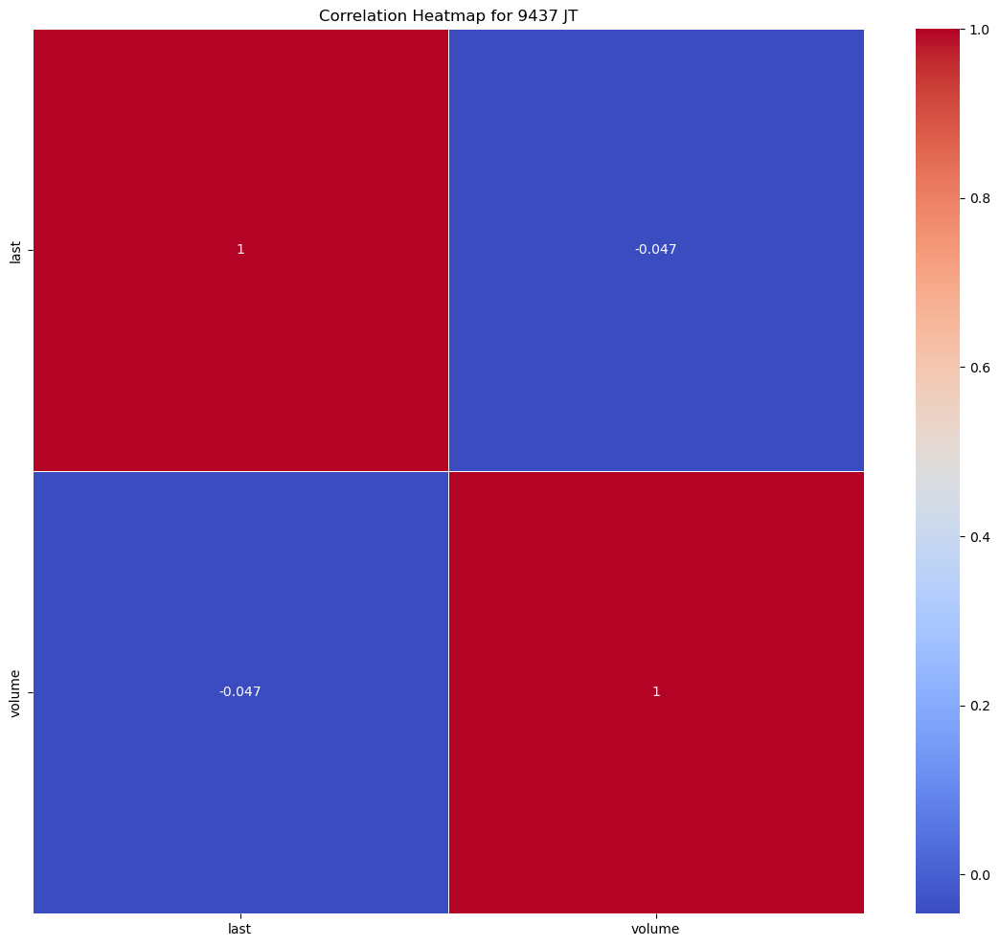

Statistics for stock 9501 JT
---- last ----
Mean: 487.01795511221945
Median: 464.0
Mode: 461.0
Range: 734.0
Standard Deviation: 133.72794528484988
Skewness: 0.5826788654045755
Kurtosis: 0.4525706797200386


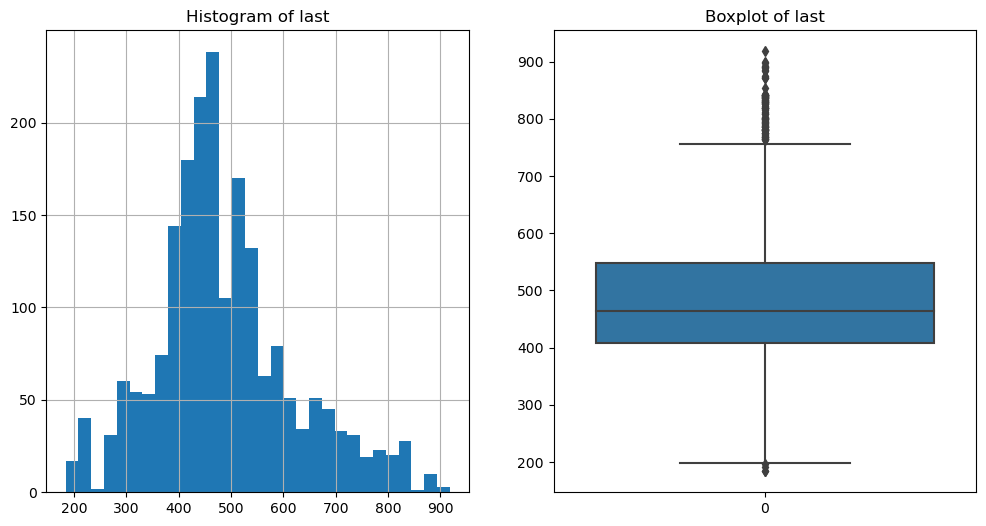

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


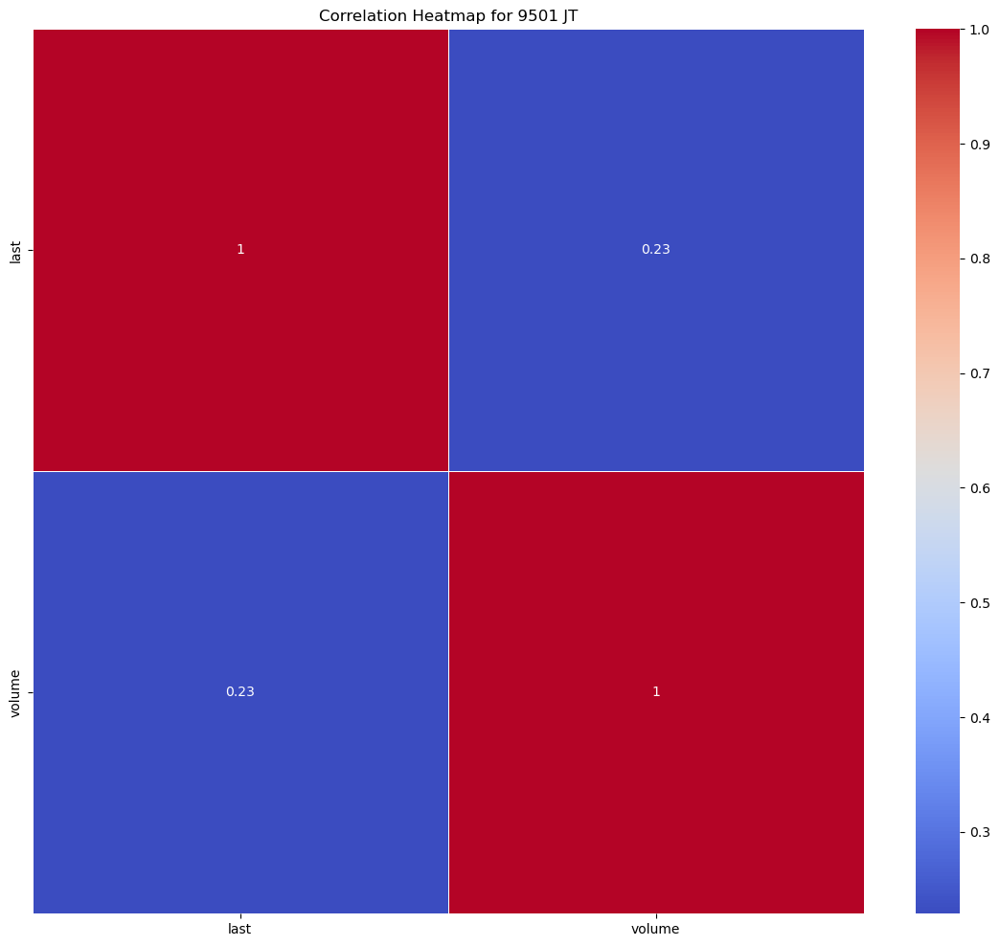

Statistics for stock 9502 JT
---- last ----
Mean: 1339.960389426434
Median: 1325.1561
Mode: 1200.3695
Range: 905.9180000000001
Standard Deviation: 181.89480103470356
Skewness: -0.025510657969221983
Kurtosis: -0.5679677686434634


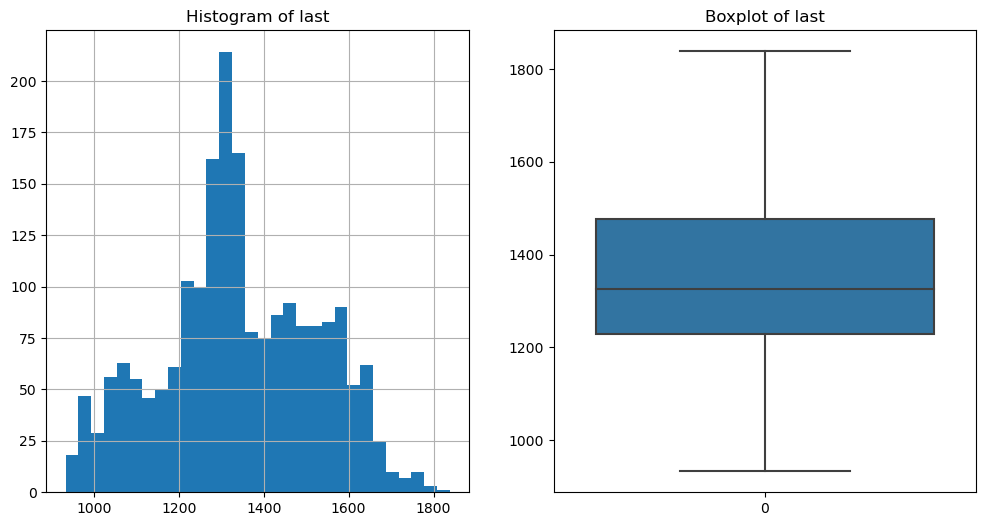

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


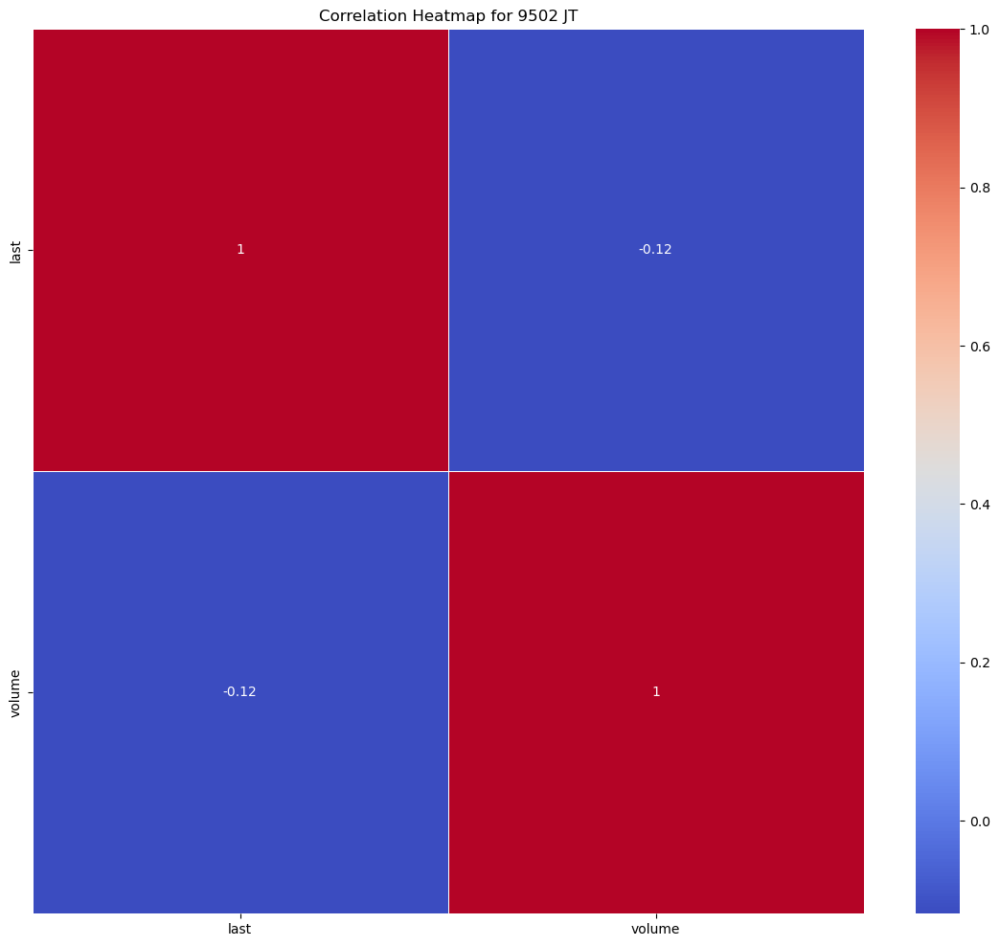

Statistics for stock 9503 JT
---- last ----
Mean: 1130.0876617955112
Median: 1114.7619
Mode: 1071.1484
Range: 1069.3748
Standard Deviation: 223.5176180787933
Skewness: 0.23735728141753692
Kurtosis: -0.5804299479509187


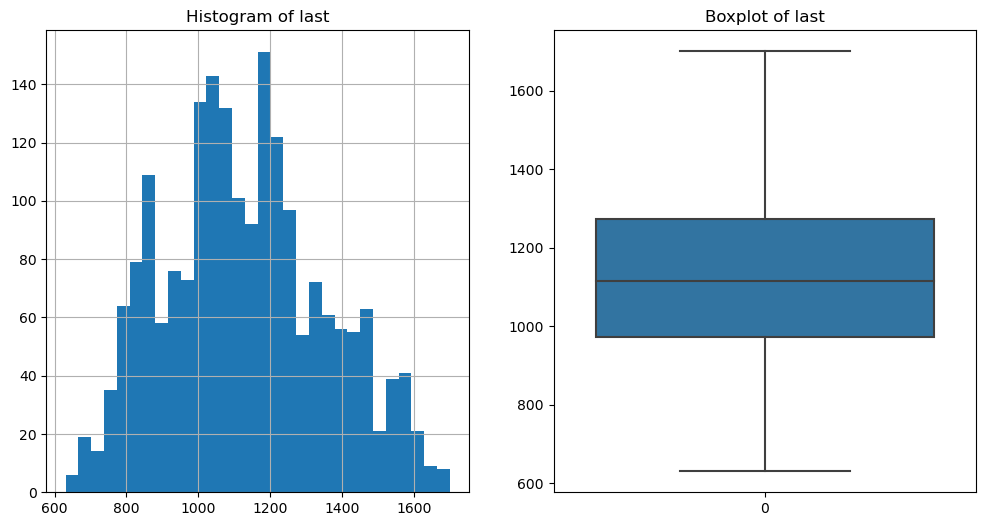

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


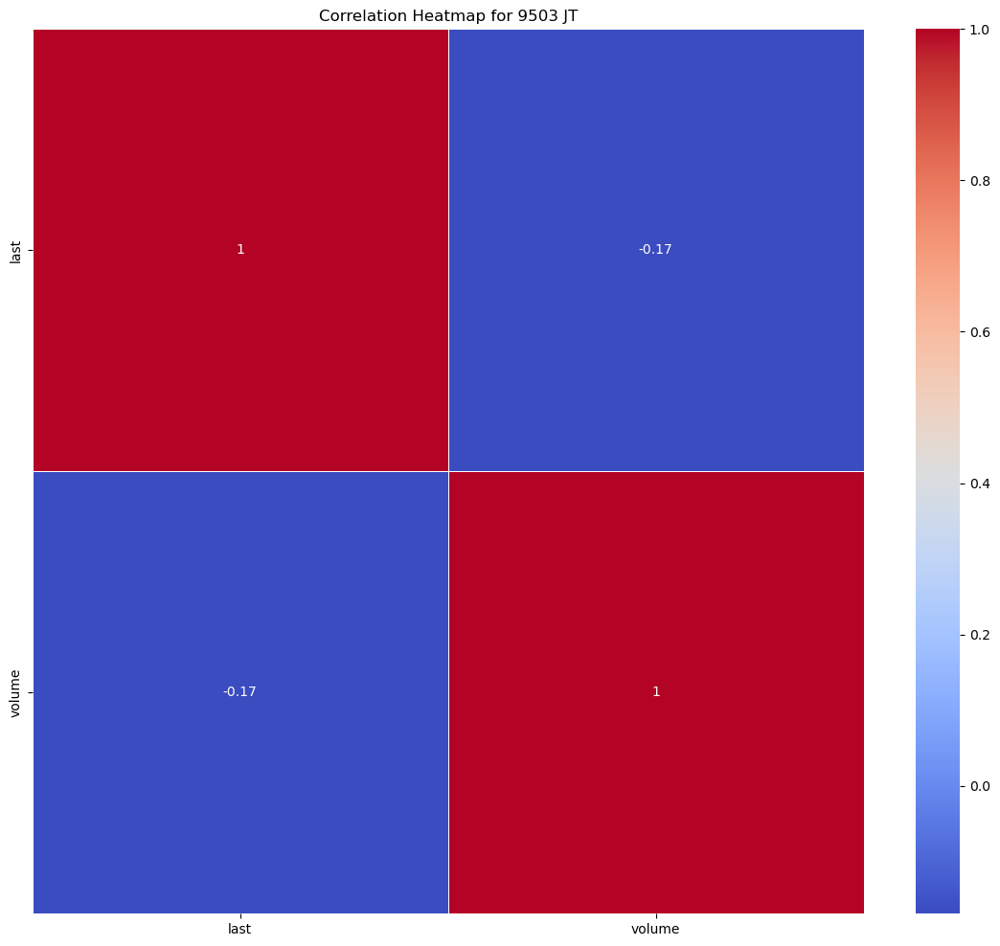

Statistics for stock 9531 JT
---- last ----
Mean: 2511.6993219950123
Median: 2521.5901
Mode: 1846.9155
Range: 1829.8291
Standard Deviation: 299.7119891440538
Skewness: 0.2783762900377133
Kurtosis: 0.4600688832993183


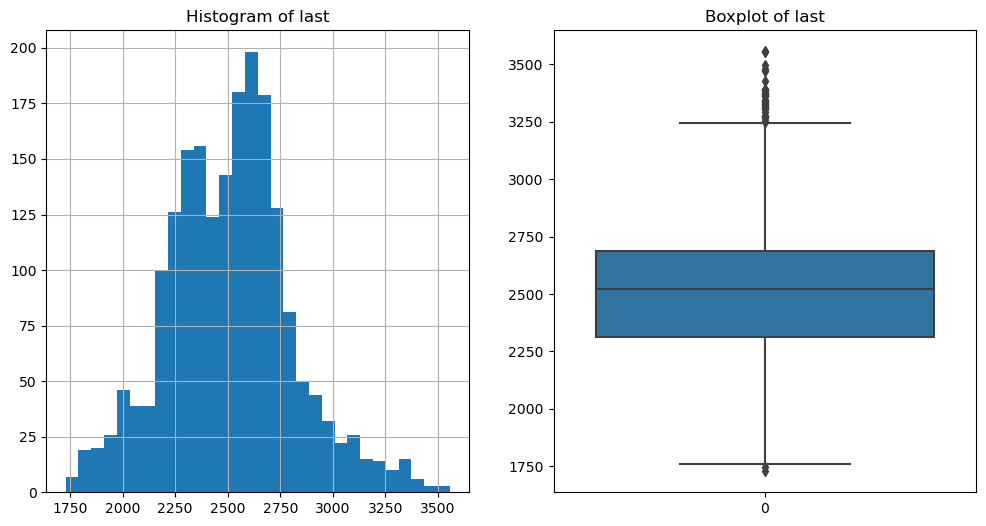

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


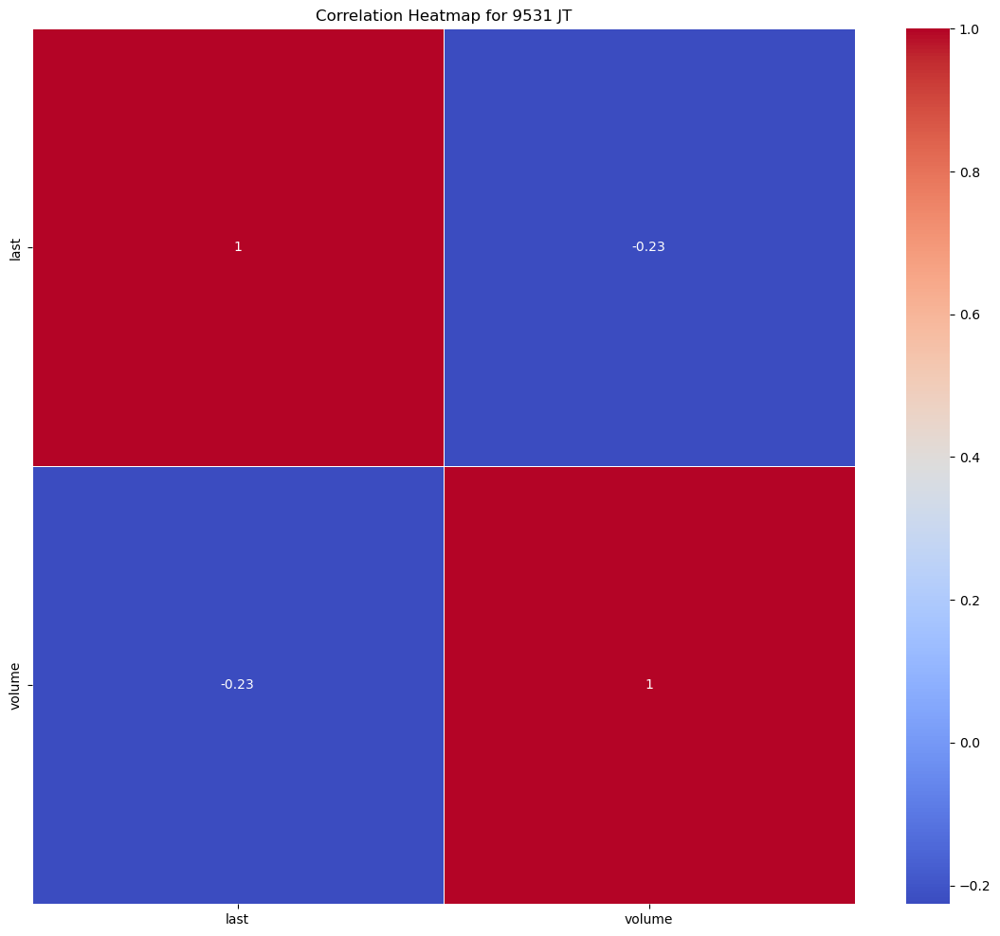

Statistics for stock 9532 JT
---- last ----
Mean: 1951.4310703740648
Median: 1975.6974
Mode: 1762.5829
Range: 995.4385
Standard Deviation: 165.75305476362564
Skewness: -0.6878314502933397
Kurtosis: 0.9159934075339771


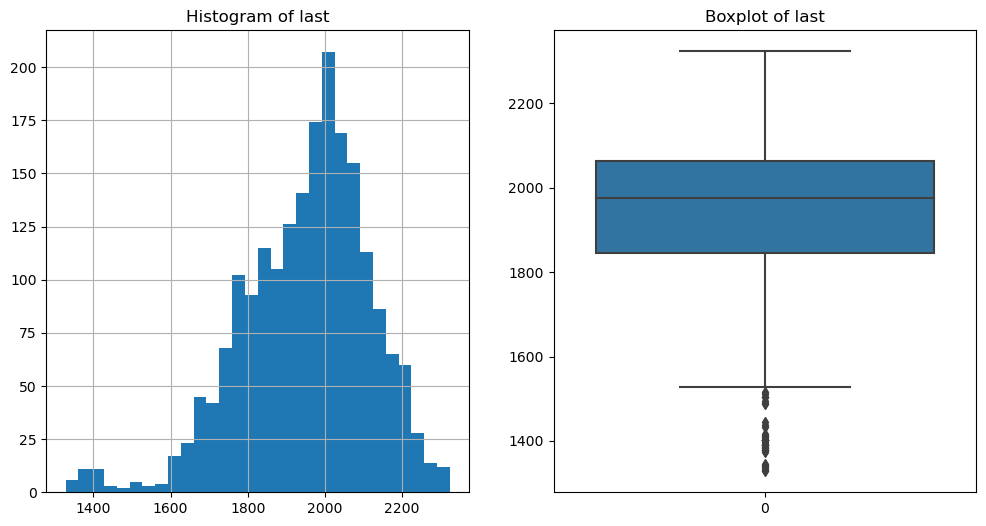

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


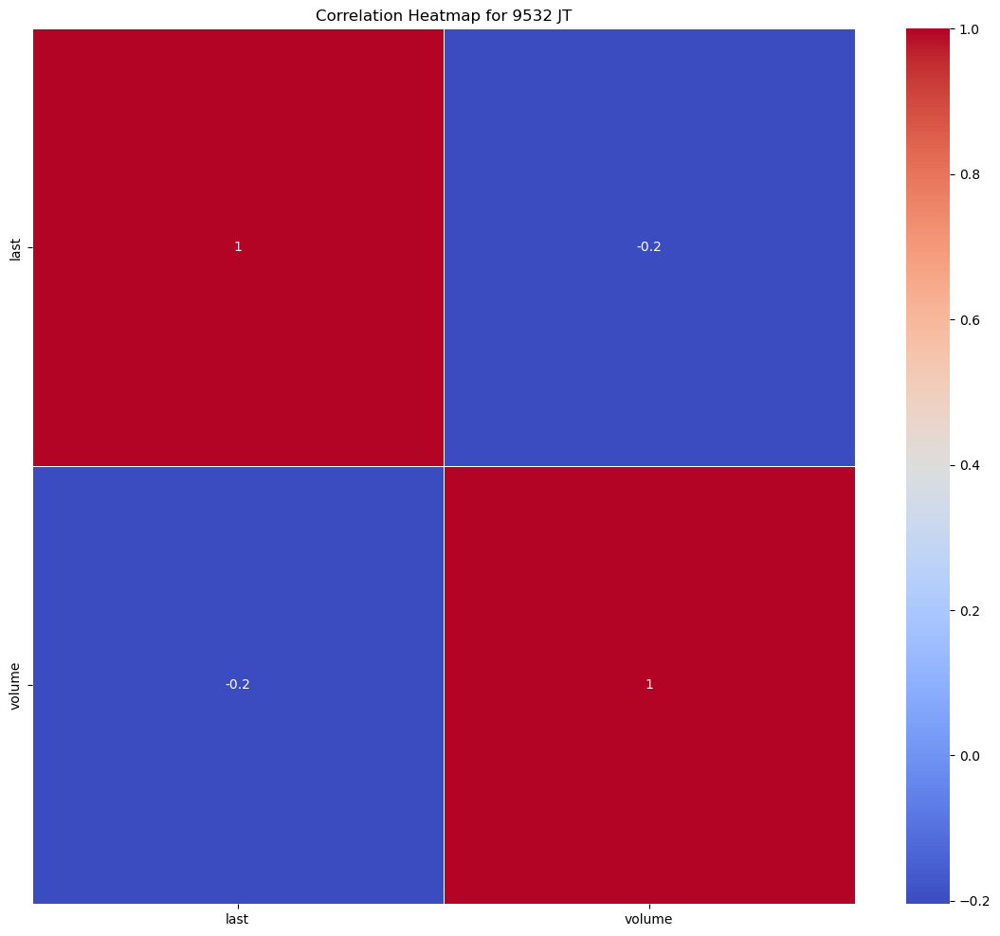

Statistics for stock 9602 JT
---- last ----
Mean: 3108.7278425935165
Median: 3077.5158
Mode: 3020.8744
Range: 3399.4471000000003
Standard Deviation: 847.1508494084525
Skewness: 0.002522602446975091
Kurtosis: -0.9669740852483937


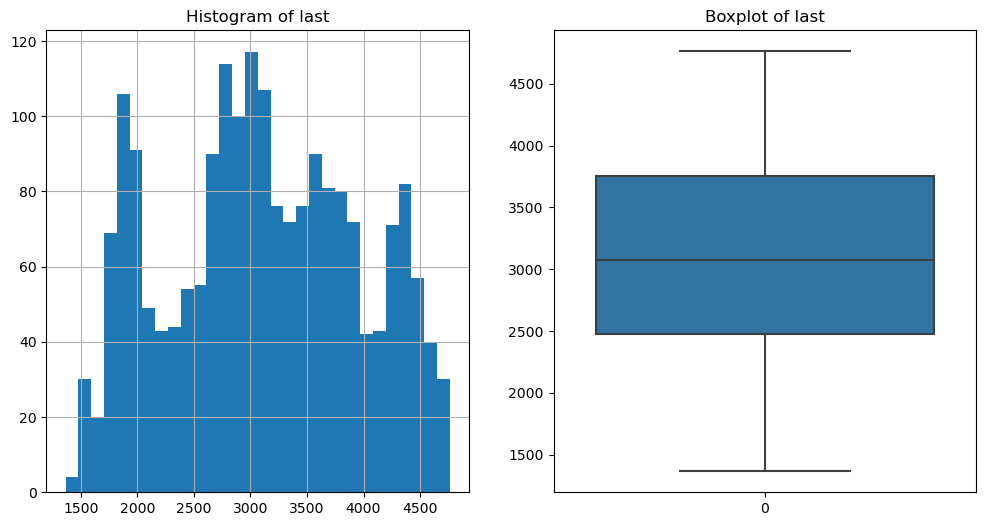

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


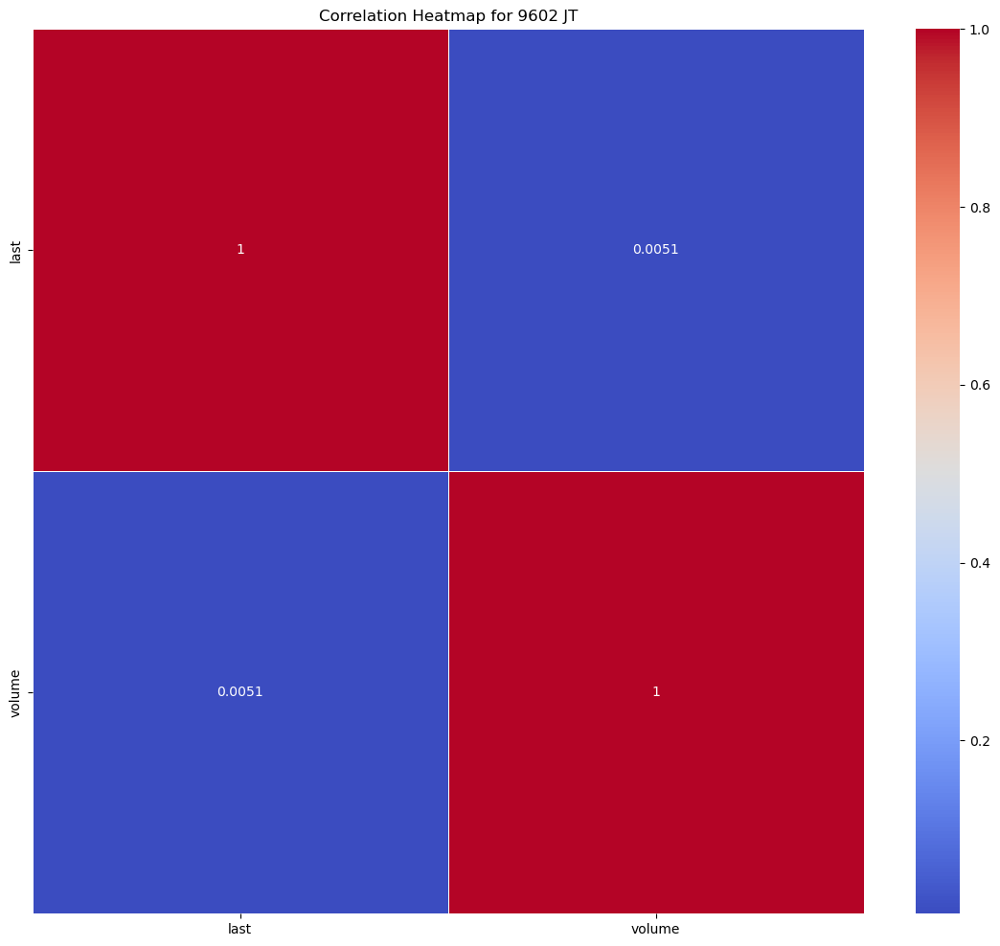

Statistics for stock 9613 JT
---- last ----
Mean: 1055.927798254364
Median: 1079.6472
Mode: 988.6826
Range: 1307.8328000000001
Standard Deviation: 276.8223703300984
Skewness: -0.1977627064261953
Kurtosis: -0.6255204434346


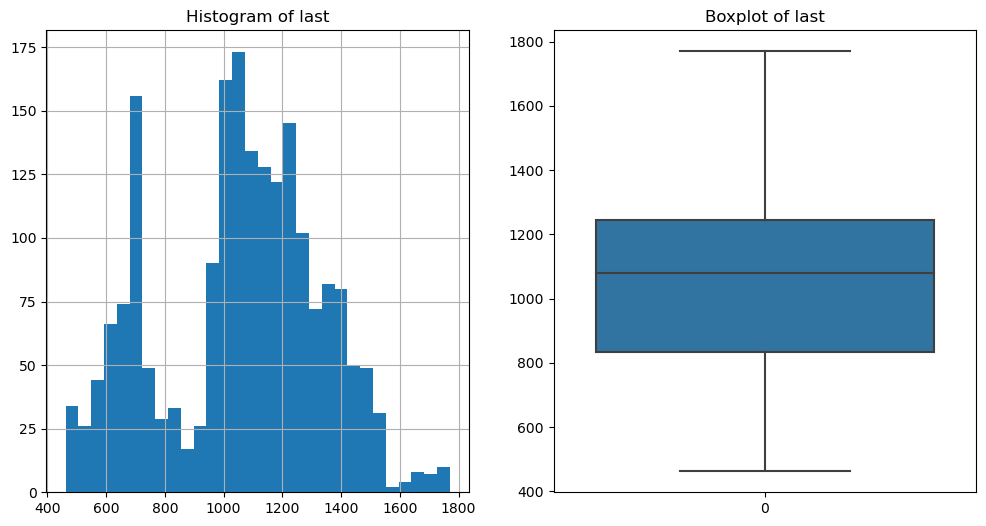

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


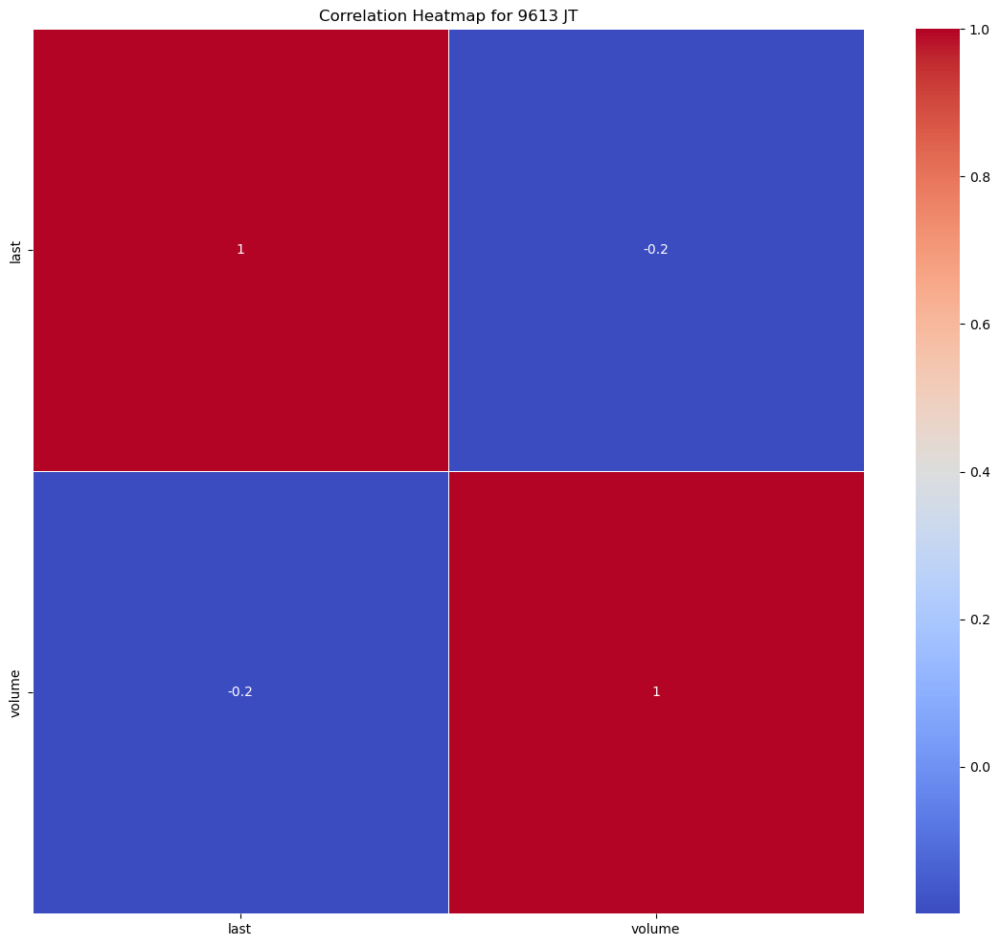

Statistics for stock 9735 JT
---- last ----
Mean: 7459.708904139651
Median: 7668.732
Mode: 5086.373
Range: 6789.1911
Standard Deviation: 1590.0502785564665
Skewness: -0.4468385429513097
Kurtosis: -0.7063035311489365


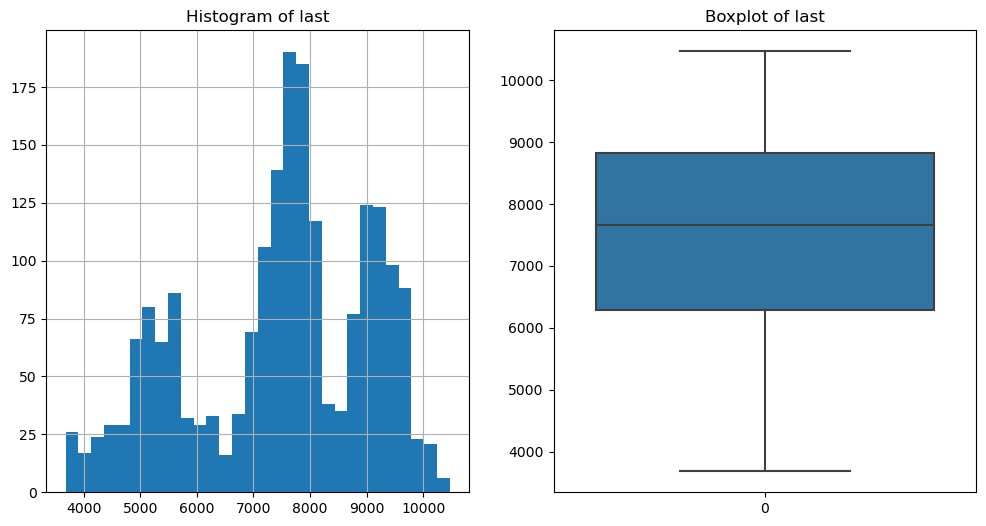

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


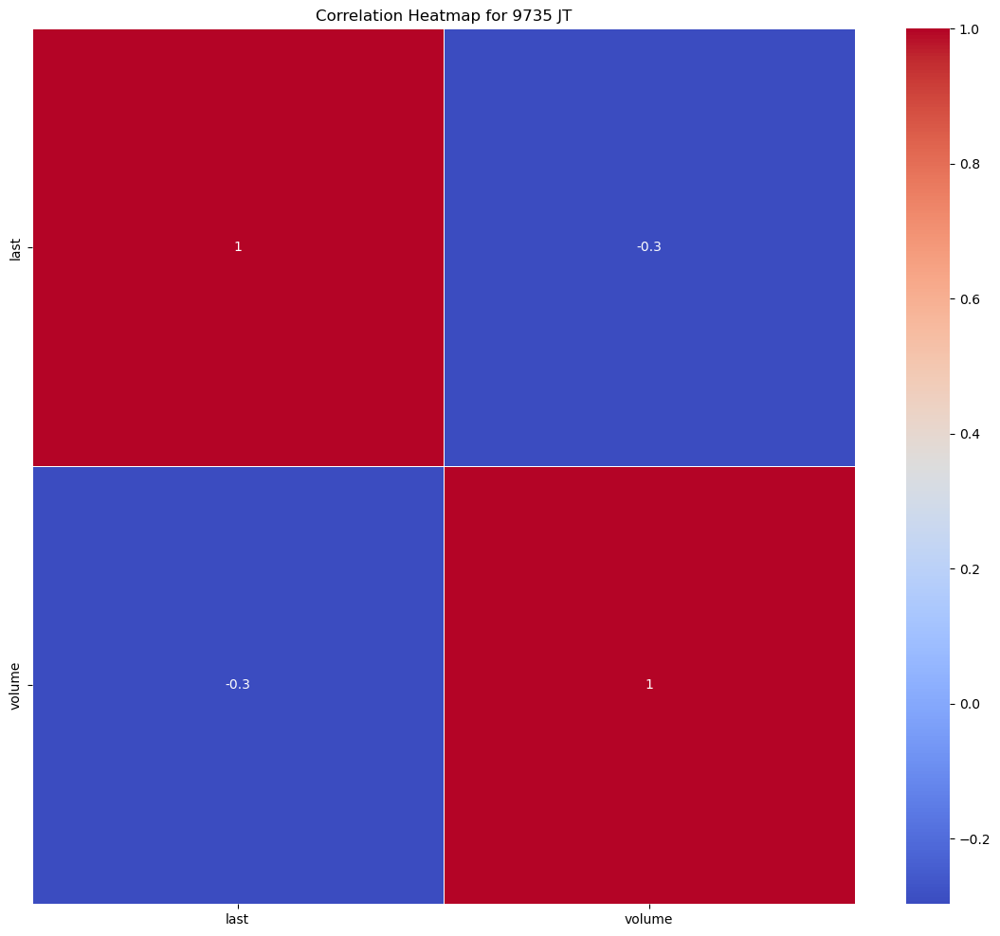

Statistics for stock 9766 JT
---- last ----
Mean: 3685.797984738155
Median: 3765.8403
Mode: 3415.9912
Range: 5924.0844
Standard Deviation: 1412.3738270103045
Skewness: 0.2224305365015408
Kurtosis: -1.068831106140728


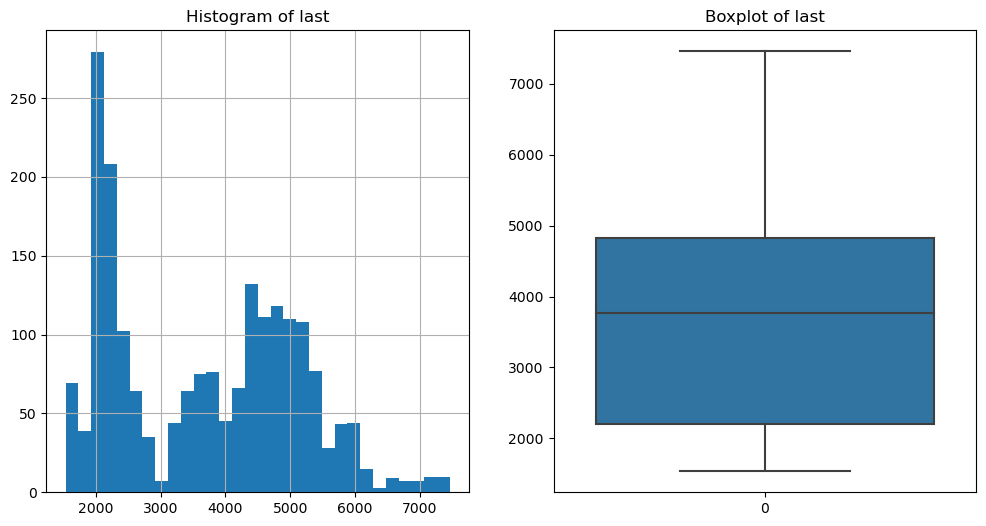

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


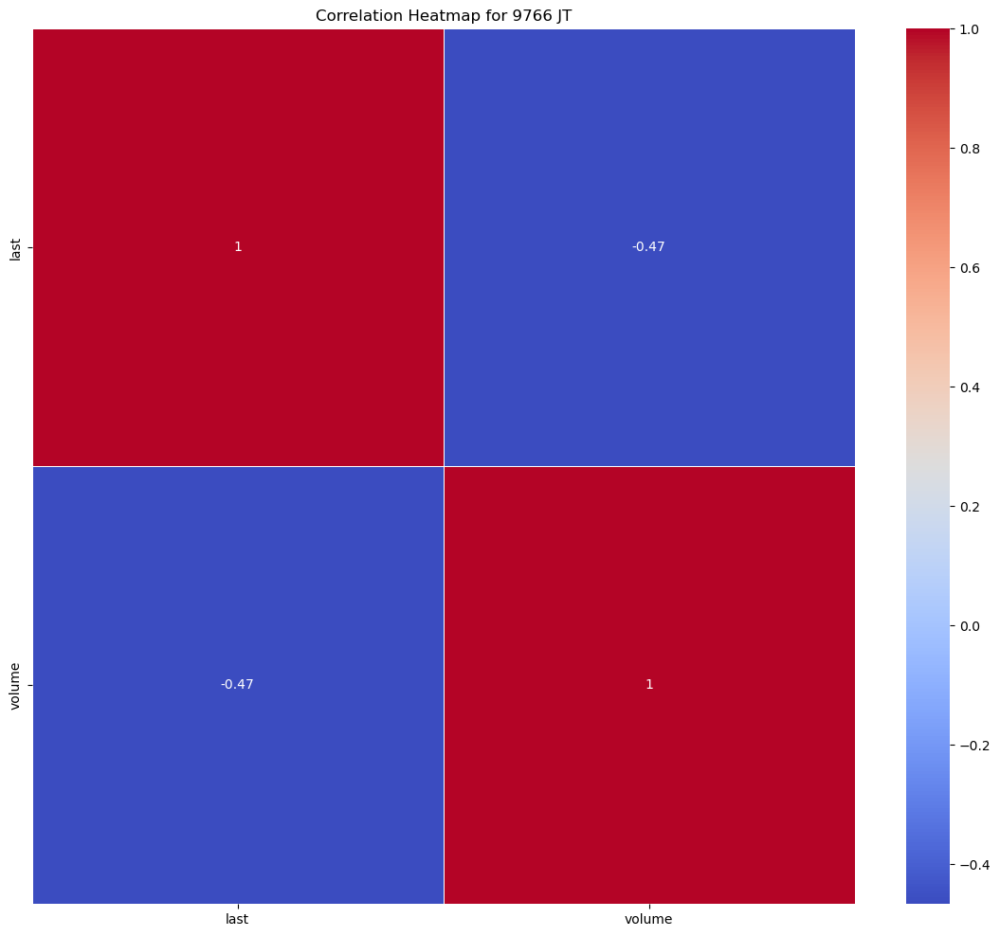

Statistics for stock 9983 JT
---- last ----
Mean: 45304.19908553616
Median: 41434.3404
Mode: 29179.8985
Range: 88965.1637
Standard Deviation: 15558.19449209309
Skewness: 1.2099770152427658
Kurtosis: 1.5546730525354757


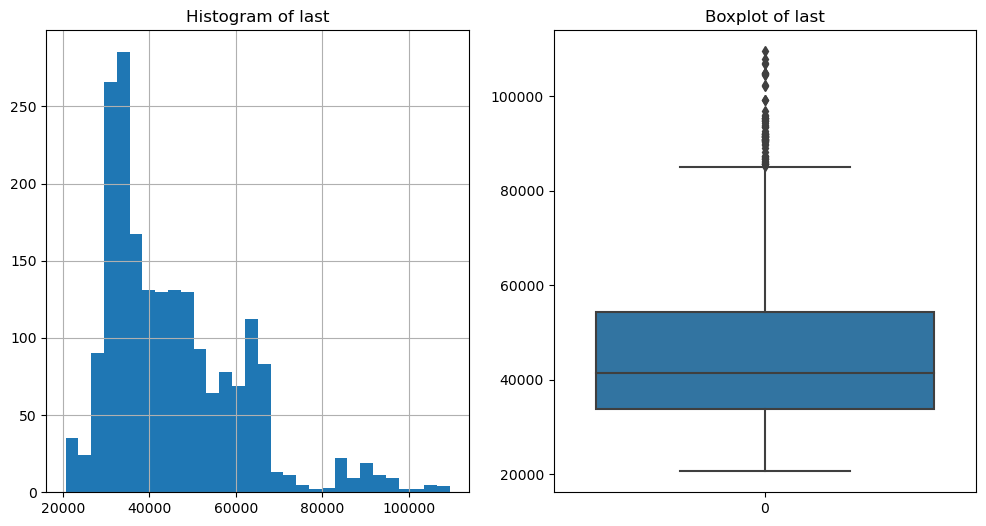

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


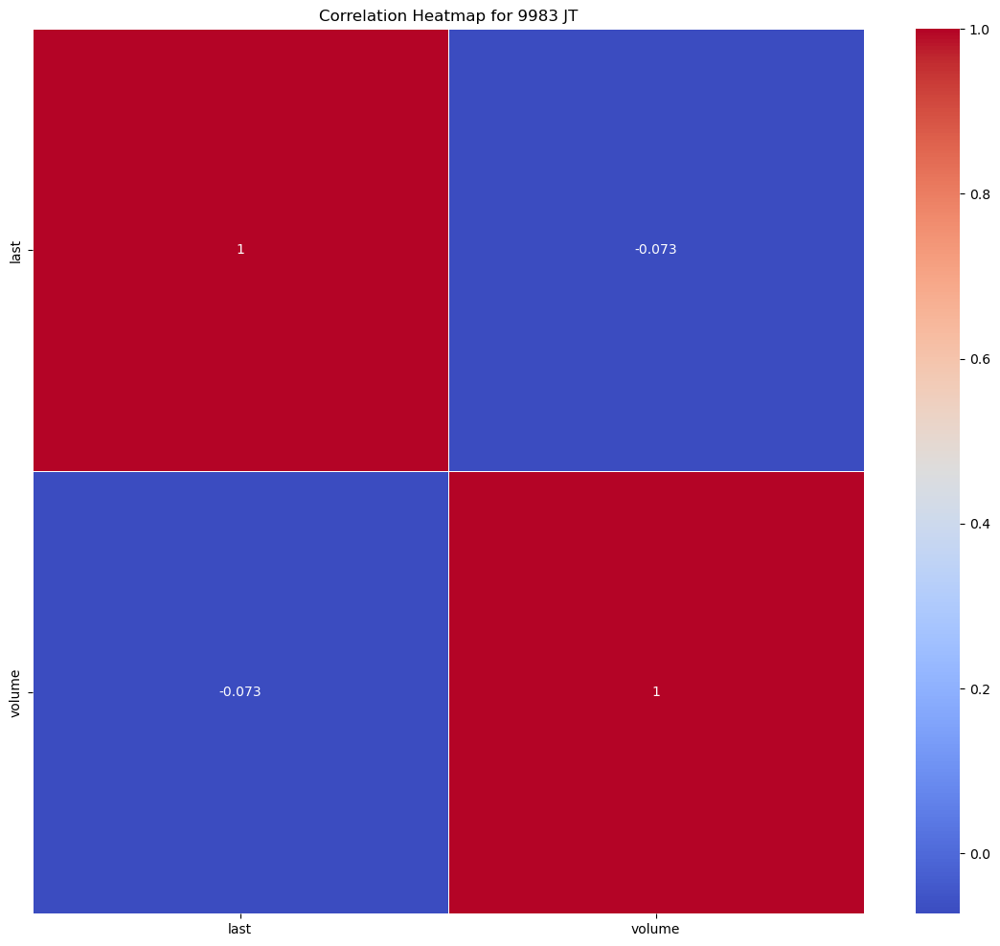

Statistics for stock 9984 JT
---- last ----
Mean: 4134.889806583541
Median: 3921.7469
Mode: 2975.0099
Range: 9242.262
Standard Deviation: 1407.6153125214498
Skewness: 1.6564586269289876
Kurtosis: 4.608603836279127


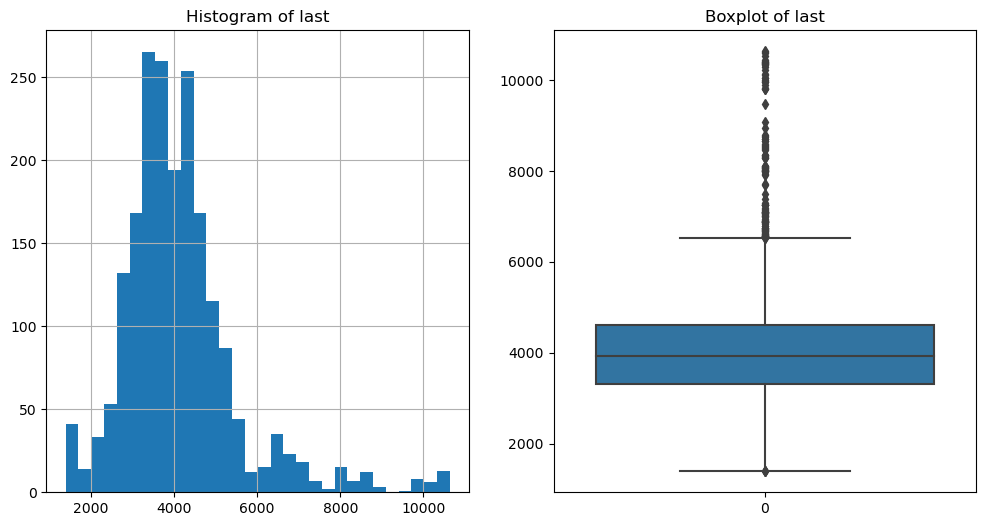

C:\Users\LZH\AppData\Local\Temp\ipykernel_86904\2805114677.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  all_prices[stock] = df[column]


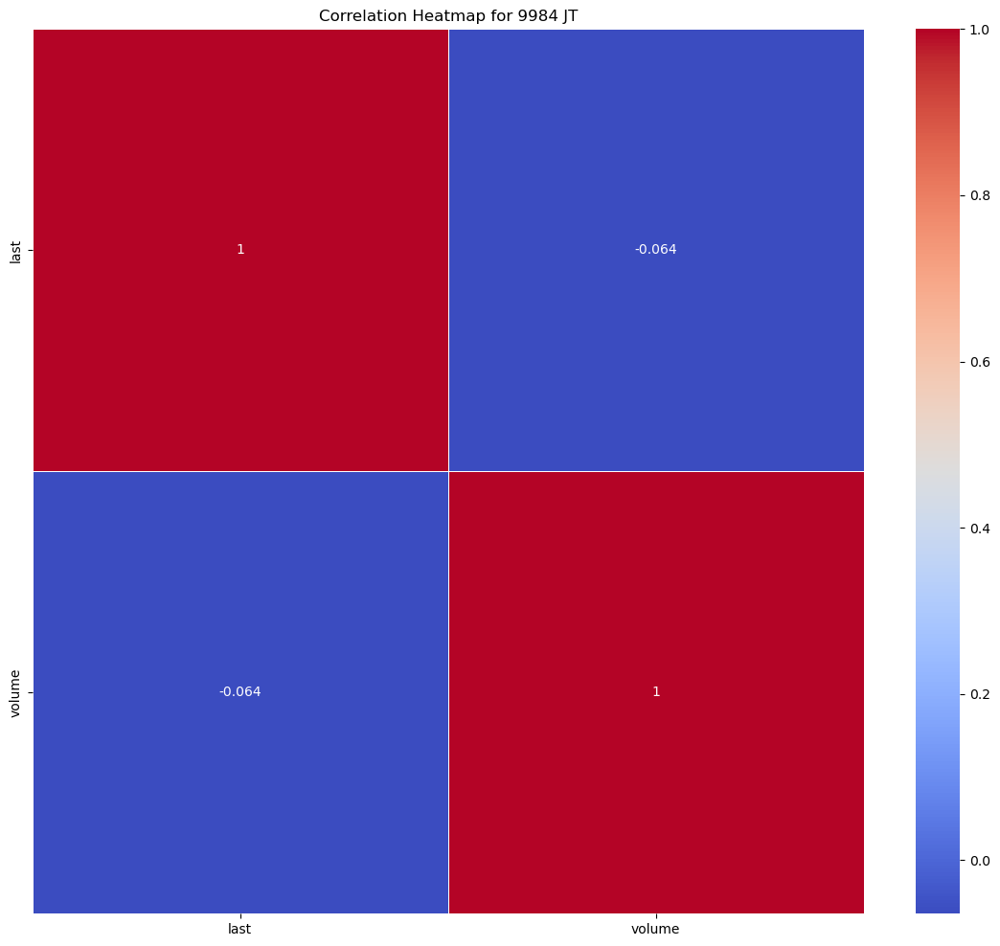

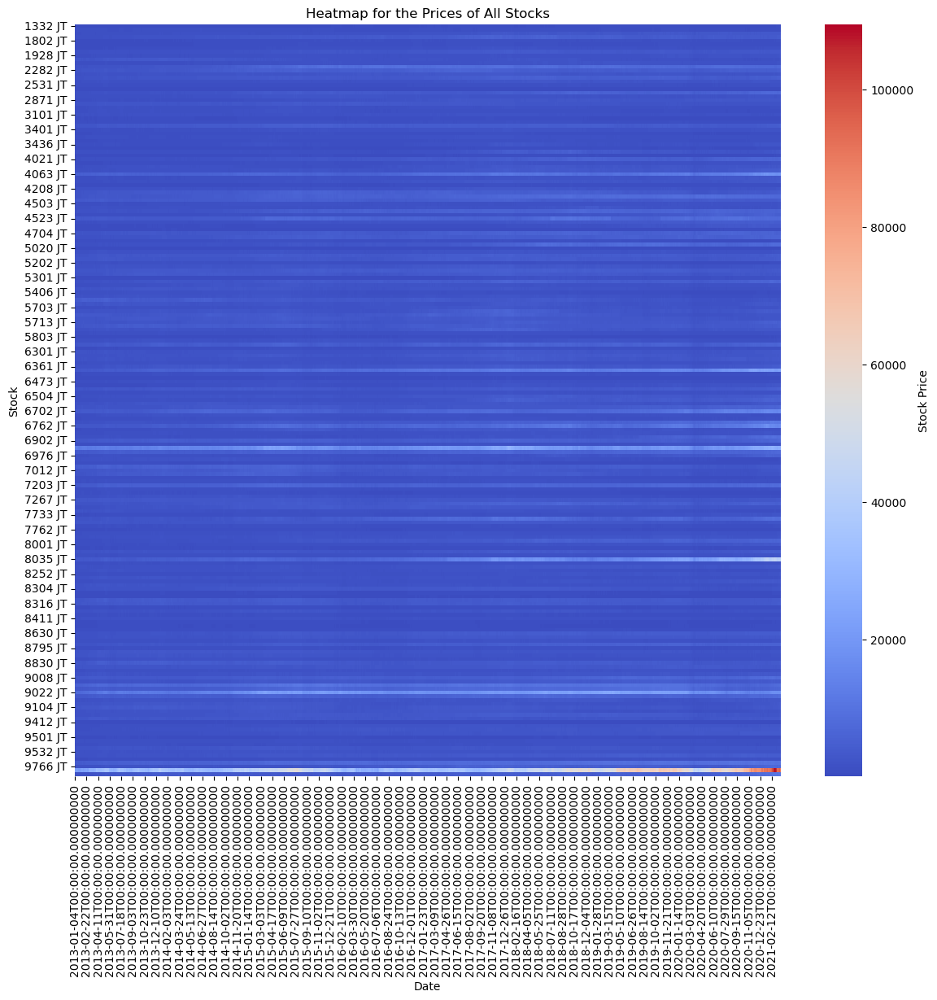

In [42]:
def print_graph(data):
    """
    This function prints statistics and plots for each stock in the data dictionary.
    
    Parameters:
    data (dict): A dictionary where keys are stock tickers and values are DataFrames containing stock data.
    """
    # Initialize a DataFrame to store the prices of all stocks
    all_prices = pd.DataFrame()
    
    for stock, df in data.items():
        print(f'Statistics for stock {stock}')
        
        # Iterate over each column in the DataFrame
        for column in df.columns:
            if column == 'last':  # Only process the 'last' column representing stock prices
                print(f"---- {column} ----")
                print(f"Mean: {df[column].mean()}")
                print(f"Median: {df[column].median()}")
                mode = df[column].mode()
                print(f"Mode: {mode[0]}")  # Mode could be multi-valued, here we only take the first one
                print(f"Range: {df[column].max() - df[column].min()}")
                print(f"Standard Deviation: {df[column].std()}")
                print(f"Skewness: {df[column].skew()}")
                print(f"Kurtosis: {df[column].kurtosis()}")
                
                # Plot histogram and boxplot for each column
                plt.figure(figsize=(12,6))
                plt.subplot(1,2,1)
                df[column].hist(bins=30)
                plt.title(f'Histogram of {column}')
                plt.subplot(1,2,2)
                sns.boxplot(df[column])
                plt.title(f'Boxplot of {column}')
                plt.show()
                
                # Add the stock prices to the all_prices DataFrame
                all_prices[stock] = df[column]
        
        # Plot correlation heatmap for the DataFrame
        df_corr = df.corr()
        fig, ax = plt.subplots(figsize=(14,12))
        sns.heatmap(df_corr, annot=True, cmap='coolwarm', linecolor='white', linewidths=.5)
        plt.title(f'Correlation Heatmap for {stock}')
        plt.show()
    
    # Plot heatmap for the prices of all stocks
    plt.figure(figsize=(14,12))
    sns.heatmap(all_prices.T, cmap='coolwarm', cbar_kws={'label': 'Stock Price'})
    plt.title('Heatmap for the Prices of All Stocks')
    plt.xlabel('Date')
    plt.ylabel('Stock')
    plt.show()

# Call the function with your data dictionary
print_graph(data)



## Feature Engineering

In [221]:
def split_data(data):
    """
    Splits the data for each stock into training and testing sets (80-20) and prints any discrepancies.
    
    Parameters:
    data (dict): A dictionary where keys are stock tickers and values are DataFrames containing stock data.
    
    Returns:
    train_data (dict): A dictionary containing the training data for each stock.
    test_data (dict): A dictionary containing the testing data for each stock.
    """
    # Initialize dictionaries to store the training and testing data for each stock
    train_data = {}
    test_data = {}
    
    # Iterate over each stock in the data dictionary
    for stock, df in data.items():
        # Calculate the index at which to split the DataFrame
        split_idx = int(len(df) * 0.8)
        
        # Slice the DataFrame into training and testing sets
        train_data[stock] = df.iloc[:split_idx]
        test_data[stock] = df.iloc[split_idx:]
        
        # Calculate the lengths of the original, training, and testing data
        original_len = len(df)
        train_len = len(train_data[stock])
        test_len = len(test_data[stock])
        
        # Check if the lengths adhere to the 80-20 split
        if original_len != (train_len + test_len) or train_len/original_len < 0.79 or train_len/original_len > 0.81:
            print(f"Stock {stock} does not adhere to the 80-20 split:")
            print(f"Original data length: {original_len}")
            print(f"Training data length: {train_len} ({train_len/original_len*100:.2f}%)")
            print(f"Testing data length: {test_len} ({test_len/original_len*100:.2f}%)")
            print("-----")
    
    return train_data, test_data

# Call the function with your data dictionary
train_data, test_data = split_data(data)


In [63]:
def calculate_stc(close, cycle_period=23, smooth_period=3):
    """
    Calculate Schaff Trend Cycle (STC)
    
    Parameters:
    close (pd.Series): Series of close prices.
    cycle_period (int): The cycle period for STC. Default is 23.
    smooth_period (int): The smooth period for STC. Default is 3.
    
    Returns:
    stc (pd.Series): Schaff Trend Cycle values.
    """
    macd = close.ewm(span=cycle_period, adjust=False).mean() - close.ewm(span=2*cycle_period, adjust=False).mean()
    macd_signal = macd.ewm(span=smooth_period, adjust=False).mean()
    stc = (macd - macd_signal) / (0.5 * abs(macd - macd_signal).max()) + 0.5
    return stc
def calculate_amihud_illiquidity(close, volume):
    """
    Calculate Amihud Illiquidity
    
    Parameters:
    close (pd.Series): Series of close prices.
    volume (pd.Series): Series of volumes.
    
    Returns:
    amihud (pd.Series): Amihud Illiquidity values.
    """
    daily_return = close.pct_change()
    amihud = daily_return.abs() / volume
    return amihud
def calculate_tsi(close, r=25, s=13):
    """
    Calculate True Strength Index (TSI)
    
    Parameters:
    close (pd.Series): Series of close prices.
    r (int): The first smoothing factor. Default is 25.
    s (int): The second smoothing factor. Default is 13.
    
    Returns:
    tsi (pd.Series): True Strength Index values.
    """
    pc = close.diff()
    ema_pc = pc.ewm(span=r, adjust=False).mean()
    ema_ema_pc = ema_pc.ewm(span=s, adjust=False).mean()
    
    ema_abs_pc = pc.abs().ewm(span=r, adjust=False).mean()
    ema_ema_abs_pc = ema_abs_pc.ewm(span=s, adjust=False).mean()
    
    tsi = 100 * (ema_ema_pc / ema_ema_abs_pc)
    return tsi
def calculate_dpo(close, period=20):
    """
    Calculate Detrended Price Oscillator (DPO)
    
    Parameters:
    close (pd.Series): Series of close prices.
    period (int): The period for the SMA. Default is 20.
    
    Returns:
    dpo (pd.Series): Detrended Price Oscillator values.
    """
    shift = period // 2 + 1
    sma = close.rolling(window=period).mean()
    dpo = close - sma.shift(shift)
    return dpo
def calculate_nvi(close, volume):
    """
    Calculate Negative Volume Index (NVI)
    
    Parameters:
    close (pd.Series): Series of close prices.
    volume (pd.Series): Series of volumes.
    
    Returns:
    nvi (pd.Series): Negative Volume Index values.
    """
    nvi = close.copy()
    for i in range(1, len(close)):
        if volume.iloc[i] < volume.iloc[i - 1]:
            nvi.iloc[i] = nvi.iloc[i - 1] + (close.iloc[i] - close.iloc[i - 1])
        else:
            nvi.iloc[i] = nvi.iloc[i - 1]
    return nvi


In [66]:
def calculate_indicators(data):
    """
    Calculates TA-Lib indicators for each stock in the input dictionary.
    
    Parameters:
    data (dict): A dictionary where keys are stock tickers and values are DataFrames containing stock data.
    
    Returns:
    data_with_indicators (dict): A dictionary containing the stock data with added indicator columns.
    """
    data_with_indicators = {}
    
    for stock, df in data.items():
        # Ensure the DataFrame is sorted by date
        df = df.sort_index()
        
        # Momentum Indicators
        df['KAMA'] = talib.KAMA(df['last'], timeperiod=30)  # Kaufman’s Adaptive Moving Average
        df['PPO'] = talib.PPO(df['last'], fastperiod=12, slowperiod=26, matype=0)  # Percentage Price Oscillator
        df['ROC'] = talib.ROC(df['last'], timeperiod=10)  # Rate of Change
        df['TSI'] = calculate_tsi(df['last'])  # True strength index
        df['DPO'] = calculate_dpo(df['last'])  # Detrended Price Oscillator
        df['EMA'] = talib.EMA(df['last'], timeperiod=12)  # Exponential Moving Average
        df['MACD'], df['MACD_signal'], df['MACD_hist'] = talib.MACD(df['last'], fastperiod=12, slowperiod=26, signalperiod=9)  # Moving Average Convergence Divergence
        
        # Volume Indicators
        df['FI'] = df['last'].diff(1) * df['volume']  # Force Index
        df['NVI'] = calculate_nvi(df['last'], df['volume'])  # Negative Volume Index
        df['OBV'] = talib.OBV(df['last'], df['volume'])  # On-balance volume
        df['VPT'] = df['volume'] * (df['last'].pct_change()) + df['volume'].cumsum()  # Volume-price trend
        
        # Calculate Amihud Illiquidity
        df['Amihud'] = calculate_amihud_illiquidity(df['last'], df['volume'])
        
        # Volatility Indicators
        df['BB_upper'], df['BB_middle'], df['BB_lower'] = talib.BBANDS(df['last'], timeperiod=20, nbdevup=2, nbdevdn=2, matype=0)  # Bollinger Bands
        df['Ulcer'] = ((df['last'].pct_change()**2).rolling(window=20).mean())**0.5  # Ulcer Index
        
        # Trend Indicators
        df['Aroon_up'], df['Aroon_down'] = talib.AROON(df['last'], df['last'], timeperiod=14)  # Aroon Indicator
        df['STC'] = calculate_stc(df['last'])
        
        # Drop rows containing NaN values
        df = df.dropna()
        
        # Store the DataFrame with indicators in the output dictionary
        data_with_indicators[stock] = df
    
    return data_with_indicators

# Call the function to calculate indicators for each stock in the data dictionary
train_data_with_indicators = calculate_indicators(train_data)


In [71]:
def scale_features(data):
    """
    Scale the features of each stock in the data dictionary except for the 'last' column.
    
    Parameters:
    data (dict): Dictionary containing the stock data DataFrames.
    
    Returns:
    scaled_data (dict): Dictionary containing the DataFrames with scaled features.
    """
    scaled_data = {}
    scaler = MinMaxScaler()
    
    for stock, df in data.items():
        # Separate the 'last' column and the features to be scaled
        last_col = df[['last']]
        features_to_scale = df.drop(columns=['last'])
        
        # Scale the features
        scaled_features = pd.DataFrame(scaler.fit_transform(features_to_scale), 
                                       index=features_to_scale.index, 
                                       columns=features_to_scale.columns)
        
        # Concatenate the 'last' column and the scaled features
        scaled_df = pd.concat([last_col, scaled_features], axis=1)
        
        # Store the DataFrame with scaled features in the output dictionary
        scaled_data[stock] = scaled_df
    
    return scaled_data

# Call the function to scale features for each stock in the data dictionary
scaled_train_data = scale_features(train_data_with_indicators)


In [74]:
def label_stocks(data, future_days, return_threshold):
    """
    Label the stocks based on future returns.
    
    Parameters:
    data (dict): Dictionary containing the stock data DataFrames.
    future_days (int): Number of days into the future to calculate returns.
    return_threshold (float): Threshold for labeling a stock as good (1) or bad (0).
    
    Returns:
    labeled_data (dict): Dictionary containing the DataFrames with added 'label' column.
    """
    labeled_data = {}
    
    for stock, df in data.items():
        # Calculate future returns
        df['future_return'] = df['last'].shift(-future_days) / df['last'] - 1
        
        # Label the stocks based on the return threshold
        df['label'] = (df['future_return'] > return_threshold).astype(int)
        
        # Drop the 'future_return' column as it's not a feature for training
        df = df.drop(columns=['future_return'])
        
        # Handle NaN values introduced by the shift operation
        df = df.dropna()
        
        # Store the DataFrame with labels in the output dictionary
        labeled_data[stock] = df
    
    return labeled_data

# Define the number of future days and return threshold for labeling
future_days = 5
return_threshold = 0.02

# Call the function to label the stocks in the scaled_train_data dictionary
labeled_train_data = label_stocks(scaled_train_data, future_days, return_threshold)

{'1332 JT':                 last    volume      KAMA       PPO       ROC       TSI  \
 Date                                                                     
 2013-02-22  168.1747  0.019662  0.000000  0.333486  0.148788  0.283901   
 2013-02-25  170.0228  0.033853  0.000011  0.311042  0.183068  0.291643   
 2013-02-26  176.4910  0.085800  0.000133  0.296171  0.240730  0.320118   
 2013-02-27  177.4151  0.062853  0.000226  0.286440  0.323377  0.345576   
 2013-02-28  177.4151  0.020681  0.000434  0.276098  0.323377  0.365975   
 ...              ...       ...       ...       ...       ...       ...   
 2019-07-18  662.0733  0.030254  0.793536  0.363681  0.233154  0.478581   
 2019-07-19  694.2982  0.032190  0.795902  0.370972  0.287943  0.487640   
 2019-07-22  679.6505  0.019241  0.796510  0.364187  0.269784  0.479962   
 2019-07-23  683.5566  0.010063  0.797321  0.353157  0.309301  0.477307   
 2019-07-24  680.6270  0.008739  0.797917  0.347302  0.284153  0.472479   
 
            

## Stock Selection

In [86]:
# Initialize a Random Forest classifier
rf_classifier = RandomForestClassifier()

# Initialize a Counter object to store the occurrence of each stock
stock_counter = Counter()

# Number of iterations
num_iterations = 10

# Number of stocks to select in each iteration
num_stocks_to_select = 20

# Run the training and stock selection process 10 times
for _ in tqdm(range(num_iterations), desc="Iterations"):
    # Initialize a dictionary to store the prediction scores for each stock
    prediction_scores = {}
    
    # Iterate over each stock in labeled_train_data
    for stock, df in labeled_train_data.items():
        # Define X (features) and y (label)
        X = df.drop(columns=['label'])
        y = df['label']
        
        # Split the data into training and validation sets
        X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
        
        # Train the Random Forest classifier
        rf_classifier.fit(X_train, y_train)
        
        # Assuming you are interested in the probability of the positive class
        prediction_prob = rf_classifier.predict_proba(X_val)[:, 1]
        
        # Calculate the average prediction probability for this stock
        avg_prediction_prob = np.mean(prediction_prob)
        
        # Store the average prediction probability in the prediction_scores dictionary
        prediction_scores[stock] = avg_prediction_prob
    
    # Rank the stocks based on the average prediction probability
    sorted_scores = sorted(prediction_scores.items(), key=lambda x: x[1], reverse=True)
    
    # Select the top 20 stocks in this iteration
    top_stocks = sorted_scores[:num_stocks_to_select]
    
    # Update the stock_counter with the selected stocks
    stock_counter.update([stock for stock, _ in top_stocks])

# Find the 10 stocks that appear the most over the 10 iterations
most_common_stocks = stock_counter.most_common(10)

# Extract the stock names from the most_common_stocks list
selected_stock_list = [stock for stock, _ in most_common_stocks]


Iterations: 100%|██████████| 10/10 [16:12<00:00, 97.25s/it]


In [201]:
selected_stock_list

['6506 JT',
 '6762 JT',
 '3436 JT',
 '6479 JT',
 '6976 JT',
 '4911 JT',
 '6103 JT',
 '7735 JT',
 '6770 JT',
 '8035 JT']

In [222]:
# Filter the train_data and test_data dictionaries to only include the selected stocks
filtered_train_data = {ticker: df for ticker, df in train_data.items() if ticker in selected_stock_list}
filtered_test_data = {ticker: df for ticker, df in test_data.items() if ticker in selected_stock_list}


## Reinforcement Learning

In [5]:
"""
####################################################################################################
I have omitted a specific part of the reinforcement learning process in this code snippet.
If this aspect of the implementation piques your interest, 
I would be eager to delve into a detailed discussion about it during the face-to-face interview.
####################################################################################################
"""
# Define the DQN model
class DQN(nn.Module):
    """
    DQN Class represents a Deep Q-Network model used for reinforcement learning.
    Approximate the Q-function in Q-learning algorithms.
    """
    def __init__(self, state_size, action_size):
        """
        Initializes the model with the given state and action sizes.
        Sets up three fully connected layers to process the input state and output Q-values for each action.
        """
        # ... 

    def forward(self, x):
        """
        Defines the forward pass of the model.
        Processes the input through each layer.
        Applies ReLU activation functions to introduce non-linearity,
        Returns the Q-values for each action.
        """
        # ... 
        
# Define the DQN Agent
class DQNAgent:
    """
    Define the DQN Agent
    The DQNAgent class represents an agent that uses a Deep Q-Network (DQN) to learn how to act in an environment.
    """
    def __init__(self, state_size, action_size):
        """
        Initializes the agent with the given state and action sizes, sets up the memory buffer.
        Initializes parameters like gamma, epsilon, and learning rate.
        Builds the DQN model.
        """
        # ...

    def _build_model(self):
        """
        Builds and returns the DQN model.
        """
        # ...

    def remember(self, state, action, reward, next_state, done):
        """
        Stores the experience tuple (state, action, reward, next_state, done) in the agent's memory.
        """
        # ...

    def act(self, state):
        """
        Selects an action for the given state based on the epsilon-greedy policy.
        """
        # ...

    def replay(self, batch_size):
        """
        Samples a minibatch of experiences from memory.
        Performs a gradient descent step to update the model's parameters based on the temporal difference error.
        """
        # ...

    def load(self, name):
        """
        Loads the model's parameters from a file.
        """
        # ...

    def save(self, name):
        """
        Saves the model's parameters to a file.
        """
        # ...        

In [108]:
def train_dqn(episodes, train_data):
    """
    Trains a DQN agent for stock trading using the provided training data.
    
    :param episodes: int, Number of episodes for training.
    :param train_data: dict, Dictionary with stock tickers as keys and DataFrames as values, representing the historical stock price data.
    :return: DQNAgent, Trained DQN agent.
    """
    
    # Determine the state size based on the number of columns in the DataFrame of the first stock ticker.
    state_size = len(train_data[list(train_data.keys())[0]].columns)
    
    # Define the action size. There are three possible actions: Buy, Sell, and Hold.
    action_size = 3
    
    # Initialize the DQN agent.
    agent = DQNAgent(state_size, action_size)
    
    # Define the batch size for experience replay.
    batch_size = 32
    
    # Loop over the specified number of episodes.
    for e in tqdm(range(episodes), desc="Training"):
        # Loop over each stock ticker and its corresponding DataFrame in the training data.
        for ticker, df in train_data.items():
            # Initialize the state using the values of the first row of the DataFrame.
            state = np.reshape(df.iloc[0].values, [1, state_size])
            
            # Loop over time steps in the episode, ensuring we have next_state available.
            for t in range(1, len(df) - 1):
                # The agent selects an action based on the current state.
                action = agent.act(state)
                
                # Determine the next state and reshape it.
                next_state = np.reshape(df.iloc[t].values, [1, state_size])
                
                # Define the reward based on the selected action and price movement.
                # The reward is calculated differently for Buy, Sell, and Hold actions.
                price_movement = df.iloc[t + 1]['last'] - df.iloc[t]['last']
                reward = # ...   (Reward calculation logic)
                
                # Check if the episode is done.
                done = True if t == len(df) - 2 else False
                
                # The agent stores the experience in its memory.
                agent.remember(state, action, reward, next_state, done)
                
                # Update the current state to the next state.
                state = next_state
                
                # If the agent's memory has enough experiences, perform experience replay.
                if len(agent.memory) > batch_size:
                    agent.replay(batch_size)
                    
    # Return the trained agent.
    return agent


In [112]:
# Step 1: Train the Agent
episodes = 50  # Number of training episodes
agent = train_dqn(episodes, filtered_train_data )

Training: 100%|██████████| 50/50 [6:29:57<00:00, 467.94s/it]  


## Backtesting

Backtesting: 100%|██████████| 401/401 [00:00<00:00, 406.23it/s]


Total Return: 102.60%


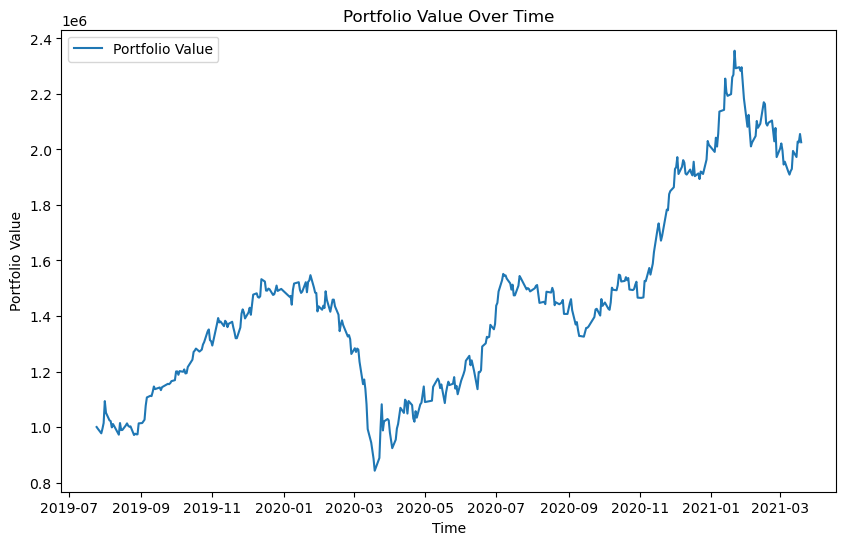

In [291]:
# Initialize the portfolio with equal weights for each stock
initial_investment = 1000000  # Initial investment amount
cash = initial_investment
portfolio = {stock: 0 for stock in selected_stock_list}  # Initially, no stocks are owned
# Define the transaction cost and stamp duty
transaction_cost_rate = 0.001  # 0.1% of the trade value
stamp_duty_rate = 0.005  # 0.5% of the trade value

# Initialize a list to store portfolio values over time
portfolio_values = []

# Define the state size
state_size = len(filtered_train_data[list(filtered_train_data.keys())[0]].columns)

# Iterate over the test data timestamps with a progress bar
test_data_timestamps = list(filtered_test_data[selected_stock_list[0]].index)
for t in tqdm(range(len(test_data_timestamps)), desc="Backtesting"):
    # Get the current state for each stock
    current_states = {}
    for stock in selected_stock_list:
        current_state = filtered_test_data[stock].iloc[t].values
        current_states[stock] = np.reshape(current_state, [1, state_size])
    
    # Determine the action for each stock using the trained agent and rebalance the portfolio
    for stock, state in current_states.items():
        action = agent.act(state)
        price = filtered_test_data[stock].iloc[t]['last']
        if action == 1 and cash >= price:  # Buy
            shares_to_buy = cash // price
            transaction_cost = shares_to_buy * price * transaction_cost_rate
            stamp_duty = shares_to_buy * price * stamp_duty_rate
            if cash >= shares_to_buy * price + transaction_cost + stamp_duty:
                portfolio[stock] += shares_to_buy
                cash -= (shares_to_buy * price + transaction_cost + stamp_duty)
        elif action == 2 and portfolio[stock] > 0:  # Sell
            transaction_cost = portfolio[stock] * price * transaction_cost_rate
            stamp_duty = portfolio[stock] * price * stamp_duty_rate
            cash += portfolio[stock] * price - transaction_cost - stamp_duty
            portfolio[stock] = 0
    
    # Calculate the current portfolio value
    portfolio_value = cash
    for stock in selected_stock_list:
        price = filtered_test_data[stock].iloc[t]['last']
        portfolio_value += portfolio[stock] * price
    
    # Append the current portfolio value to the list
    portfolio_values.append(portfolio_value)

# Calculate the total return and other performance metrics
total_return_percentage = ((portfolio_values[-1] - initial_investment) / initial_investment) * 100
total_return_percentage = round(total_return_percentage, 2)
print("Total Return: {:.2f}%".format(total_return_percentage))

# Plot Portfolio Value Over Time
plt.figure(figsize=(10,6))
plt.plot(test_data_timestamps, portfolio_values, label='Portfolio Value')
plt.xlabel('Time')
plt.ylabel('Portfolio Value')
plt.title('Portfolio Value Over Time')
plt.legend()
plt.show()


In [296]:
# Assuming portfolio_values is a list of portfolio values over time
portfolio_values = np.array(portfolio_values)
returns = (portfolio_values[1:] - portfolio_values[:-1]) / portfolio_values[:-1]

# Calculate metrics
total_return = (portfolio_values[-1] - portfolio_values[0]) / portfolio_values[0]
annualized_return = (1 + total_return)**(252 / len(portfolio_values)) - 1
volatility = np.std(returns) * np.sqrt(252)
max_drawdown = np.min(portfolio_values / np.maximum.accumulate(portfolio_values)) - 1
sharpe_ratio = annualized_return / volatility
sortino_ratio = annualized_return / np.std(np.minimum(returns, 0)) * np.sqrt(252)

# Omega Ratio
mar = 0  # Minimum Acceptable Return
omega_ratio = np.mean(np.maximum(returns - mar, 0)) / np.mean(np.minimum(returns - mar, 0))

# Conditional Value at Risk (CVaR) / Expected Shortfall (ES)
alpha = 0.05  # Significance level
cvar = -np.mean(sorted(returns)[:int(alpha * len(returns))])
es = -np.mean(sorted(returns)[:int(alpha * len(returns))])  # ES is equivalent to CVaR

# Return Over Maximum Drawdown (RoMaD)
romad = annualized_return / abs(max_drawdown)

# Return Over Total (ROT)
rot = total_return / abs(max_drawdown)

# Create a DataFrame to display the results
performance_summary = pd.DataFrame({
    'Total Return': [f"{total_return * 100:.2f}%"],
    'Annualized Return': [f"{annualized_return * 100:.2f}%"],
    'Volatility': [f"{volatility * 100:.2f}%"],
    'Maximum Drawdown': [f"{max_drawdown * 100:.2f}%"],
    'Sharpe Ratio': [sharpe_ratio],
    'Sortino Ratio': [sortino_ratio],
    'Omega Ratio': [omega_ratio],
    'CVaR (5%)': [f"{cvar * 100:.2f}%"],
    'Expected Shortfall (5%)': [f"{es * 100:.2f}%"],
    'RoMaD': [romad],
    'Return Over Total (ROT)': [rot]
})

# Display the performance summary
performance_summary


,Total Return,Annualized Return,Volatility,Maximum Drawdown,Sharpe Ratio,Sortino Ratio,Omega Ratio,CVaR (5%),Expected Shortfall (5%),RoMaD,Return Over Total (ROT)
0,102.60%,55.85%,38.47%,-45.54%,1.451618,648.924207,-1.261119,5.04%,5.04%,1.226265,2.252806


## Robustness Testing and Stress Testing

In [258]:
def simulate_stock_prices(selected_stock_data, num_days, dt,stress):
    """
    Simulate correlated stock prices using GBM and Cholesky factorization.
    
    :param selected_stock_data: Dictionary containing historical price data for selected stocks.
    :param num_days: Number of days to simulate.
    :param dt: Time step (e.g., 1/252 for daily simulation).
    :param stress: Stress Factor
    :return: DataFrame containing simulated stock prices.
    """
    # Calculate historical returns
    returns = {}
    for stock, df in selected_stock_data.items():
        returns[stock] = df['last'].pct_change().dropna()
    
    returns_df = pd.DataFrame(returns)
    
    # Compute the covariance matrix of returns
    cov_matrix = returns_df.cov()
    
    # Perform Cholesky factorization
    L = np.linalg.cholesky(cov_matrix)
    
    # Number of stocks
    num_stocks = len(selected_stock_list)
    
    # Initialize simulated prices
    simulated_prices = pd.DataFrame(index=range(num_days), columns=selected_stock_list)
    
    # Set initial prices
    for stock in selected_stock_list:
        simulated_prices.loc[0, stock] = selected_stock_data[stock]['last'].iloc[-1]
    
    # Generate correlated random shocks and simulate prices
    for t in range(1, num_days):
        correlated_shocks = np.dot(L, np.random.normal(size=num_stocks))
        for i, stock in enumerate(selected_stock_list):
            mu = np.mean(returns[stock])*252  # Drift
            sigma = math.sqrt(stress)*np.std(returns[stock])*math.sqrt(252)  # Volatility
            shock = correlated_shocks[i]
            simulated_prices.loc[t, stock] = simulated_prices.loc[t - 1, stock] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * np.sqrt(dt) * shock)
    
    return simulated_prices

In [250]:
def create_filtered_simulation_data(simulated_prices, filtered_test_data, selected_stock_list):
    """
    Create a dictionary containing simulated data for each selected stock.
    
    :param simulated_prices: DataFrame containing simulated stock prices.
    :param filtered_test_data: Dictionary containing test data for selected stocks.
    :param selected_stock_list: List of selected stock tickers.
    :return: Dictionary containing simulated data for each selected stock.
    """
    # Initialize an empty dictionary to store the simulated data for each stock
    filtered_simulation_data = {}

    # Iterate over each stock in the selected_stock_list
    for stock in selected_stock_list:
        # Extract the simulated prices for the current stock
        simulated_stock_prices = simulated_prices[stock].astype(np.float64)
        
        # Extract the volume column from the corresponding stock in filtered_test_data
        volume_data = filtered_test_data[stock]['volume'].astype(np.float64)

        # Create a new DataFrame with the simulated prices and original volume data
        simulated_stock_data = pd.DataFrame({
            'last': simulated_stock_prices,
            'volume': volume_data
        })
        
        # Add the simulated stock data to the filtered_simulation_data dictionary
        filtered_simulation_data[stock] = simulated_stock_data
    
    return filtered_simulation_data

In [275]:
def backtest_portfolio(agent, test_data, selected_stock_list, initial_investment=1000000, transaction_cost_rate=0.001, stamp_duty_rate=0.005):
    """
    Backtest the portfolio using the trained agent and test data.
    
    :param agent: Trained DQNAgent.
    :param test_data: Dictionary containing test data for selected stocks.
    :param selected_stock_list: List of selected stock tickers.
    :param initial_investment: Initial investment amount.
    :param transaction_cost_rate: Transaction cost rate.
    :param stamp_duty_rate: Stamp duty rate.
    :return: Total return percentage and plot of portfolio value over time.
    """
    cash = initial_investment
    portfolio = {stock: 0 for stock in selected_stock_list}
    portfolio_values = []
    state_size = len(test_data[list(test_data.keys())[0]].columns)
    test_data_timestamps = list(test_data[selected_stock_list[0]].index)
    
    for t in range(len(test_data_timestamps)):
        current_states = {}
        for stock in selected_stock_list:
            current_state = test_data[stock].iloc[t].values
            current_states[stock] = np.reshape(current_state, [1, state_size])
        
        for stock, state in current_states.items():
            action = agent.act(state)
            price = test_data[stock].iloc[t]['last']
            if action == 1 and cash >= price:
                shares_to_buy = cash // price
                transaction_cost = shares_to_buy * price * transaction_cost_rate
                stamp_duty = shares_to_buy * price * stamp_duty_rate
                if cash >= shares_to_buy * price + transaction_cost + stamp_duty:
                    portfolio[stock] += shares_to_buy
                    cash -= (shares_to_buy * price + transaction_cost + stamp_duty)
            elif action == 2 and portfolio[stock] > 0:
                transaction_cost = portfolio[stock] * price * transaction_cost_rate
                stamp_duty = portfolio[stock] * price * stamp_duty_rate
                cash += portfolio[stock] * price - transaction_cost - stamp_duty
                portfolio[stock] = 0
        
        portfolio_value = cash + sum(portfolio[stock] * test_data[stock].iloc[t]['last'] for stock in selected_stock_list)
        portfolio_values.append(portfolio_value)
    
    total_return_percentage = ((portfolio_values[-1] - initial_investment) / initial_investment) * 100
    total_return_percentage = round(total_return_percentage, 2)
    '''
    # Plot Portfolio Value Over Time
    plt.figure(figsize=(10,6))
    plt.plot(test_data_timestamps, portfolio_values, label='Portfolio Value')
    plt.xlabel('Time')
    plt.ylabel('Portfolio Value')
    plt.title('Portfolio Value Over Time')
    plt.legend()
    plt.show()
    '''
    
    return total_return_percentage, portfolio_values

Simulation Backtesting: 100%|██████████| 500/500 [15:11<00:00,  1.82s/it]


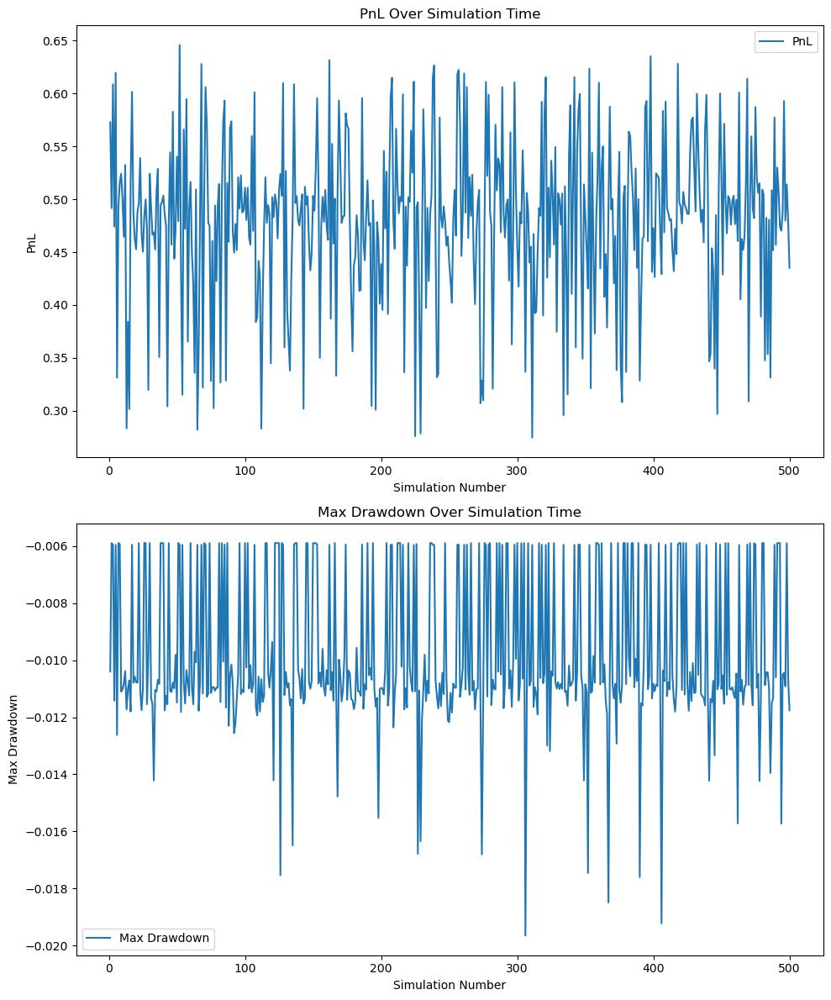

In [302]:
N=500
num_days = 401  # Number of days to simulate
dt = 1/252  # Time step for daily simulation
PnL=[]
Drawdown=[]


for i in tqdm(range(N), desc="Simulation Backtesting"):
    # Perform the simulation
    simulated_prices = simulate_stock_prices(selected_stock_data=filtered_train_data, num_days=num_days, dt=dt,stress=1)
    date_index = filtered_test_data[selected_stock_list[0]].index
    simulated_prices.index = date_index
    filtered_simulation_data = create_filtered_simulation_data(simulated_prices, filtered_test_data, selected_stock_list)
    total_return, portfolio_values = backtest_portfolio(agent, filtered_simulation_data, selected_stock_list)
    PnL.append(total_return/100)
        
    portfolio_values = np.array(portfolio_values)
    max_drawdown = np.min(portfolio_values / np.maximum.accumulate(portfolio_values)) - 1
    Drawdown.append(max_drawdown)


number_list = list(range(1, N + 1))

# Create a figure object
plt.figure(figsize=(10, 12))

# Create the first subplot for PnL
plt.subplot(2,1,1)  
plt.plot(number_list, PnL, label='PnL')
plt.xlabel('Simulation Number')
plt.ylabel('PnL')
plt.title('PnL Over Simulation Time')
plt.legend()

# Create the fifth subplot for Max Drawdown
plt.subplot(2,1,2)  
plt.plot(number_list, Drawdown, label='Max Drawdown')
plt.xlabel('Simulation Number')
plt.ylabel('Max Drawdown')
plt.title('Max Drawdown Over Simulation Time')
plt.legend()


# Show the plots
plt.tight_layout()  # Adjusts subplot parameters for better layout
plt.show()


Simulation Backtesting: 100%|██████████| 500/500 [15:13<00:00,  1.83s/it]


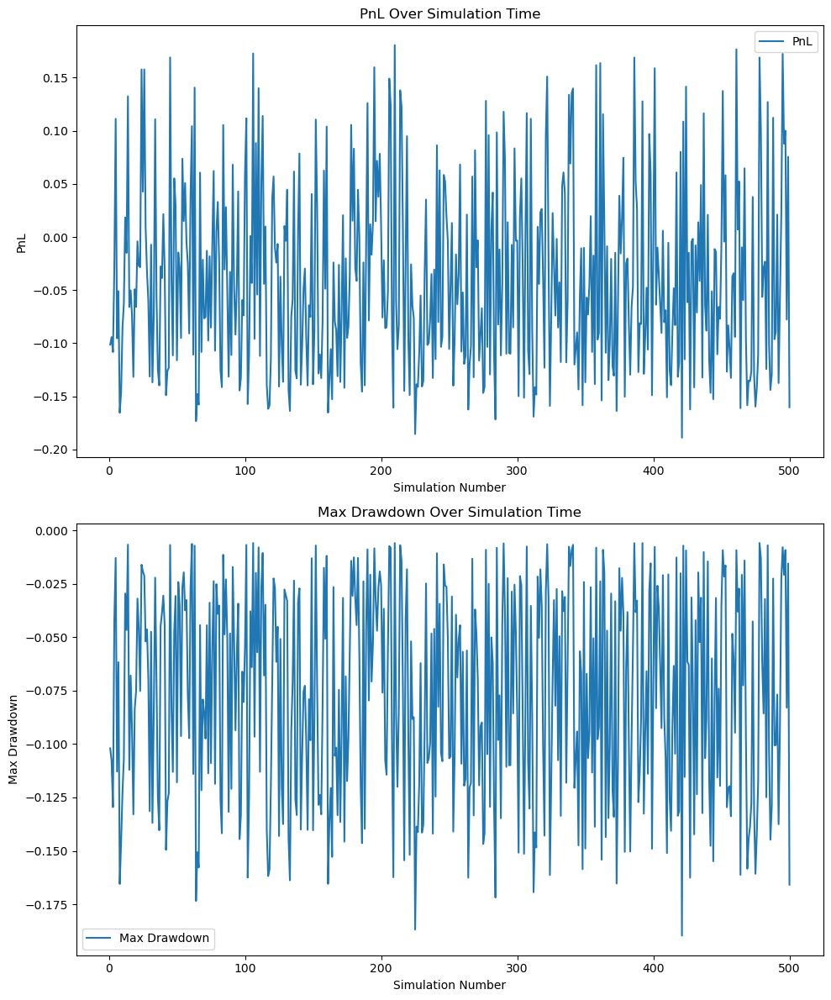

In [303]:
N=500
num_days = 401  # Number of days to simulate
dt = 1/252  # Time step for daily simulation
PnL=[]
Drawdown=[]


for i in tqdm(range(N), desc="Simulation Backtesting"):
    # Perform the simulation
    simulated_prices = simulate_stock_prices(selected_stock_data=filtered_train_data, num_days=num_days, dt=dt,stress=5)
    date_index = filtered_test_data[selected_stock_list[0]].index
    simulated_prices.index = date_index
    filtered_simulation_data = create_filtered_simulation_data(simulated_prices, filtered_test_data, selected_stock_list)
    total_return, portfolio_values = backtest_portfolio(agent, filtered_simulation_data, selected_stock_list)
    PnL.append(total_return/100)
        
    portfolio_values = np.array(portfolio_values)
    max_drawdown = np.min(portfolio_values / np.maximum.accumulate(portfolio_values)) - 1
    Drawdown.append(max_drawdown)


number_list = list(range(1, N + 1))

# Create a figure object
plt.figure(figsize=(10, 12))

# Create the first subplot for PnL
plt.subplot(2,1,1)  
plt.plot(number_list, PnL, label='PnL')
plt.xlabel('Simulation Number')
plt.ylabel('PnL')
plt.title('PnL Over Simulation Time')
plt.legend()

# Create the fifth subplot for Max Drawdown
plt.subplot(2,1,2)  
plt.plot(number_list, Drawdown, label='Max Drawdown')
plt.xlabel('Simulation Number')
plt.ylabel('Max Drawdown')
plt.title('Max Drawdown Over Simulation Time')
plt.legend()


# Show the plots
plt.tight_layout()  # Adjusts subplot parameters for better layout
plt.show()
